In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pylab as plt
import scipy.spatial
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from time import time
import scipy.stats as stats
from sklearn.utils.fixes import loguniform

from sklearn.metrics import mean_squared_error, r2_score

In [2]:
from scipy.io import loadmat
mat = loadmat("Project Datasets/PowerTrainData.mat")

# Load data X and y 
X = np.transpose(mat["powerTrainInput"]) # 
y = np.transpose(mat["powerTrainOutput"]) #
print("X shape:", X.shape)
print("y shape:", y.shape)
yres = y
print("yres.shape:", yres.shape)

# Load Xtest
Xtest = np.transpose(mat["powerTestInput"]) # 
print("Xtest shape:", Xtest.shape)

print("Small subset of dataset")
for each_row in range(10):
    print(X[each_row,:5], y[each_row,:5])

X shape: (844, 15)
y shape: (844, 1)
yres.shape: (844, 1)
Xtest shape: (115, 15)
Small subset of dataset
[3240.  2546.7 2438.3 3240.  3240. ] [3359]
[1871.  1793.8 1709.7 2094.  2094. ] [1868]
[1929.  1873.  1839.3 2177.  2315. ] [1943]
[1837.  1468.6 1551.5 1837.  1956. ] [1900]
[2209.  1777.8 1860.8 2209.  2284. ] [2252]
[3316.  2574.5 2487.3 3316.  3359. ] [3613]
[2662.  2055.3 2138.2 2710.  2868. ] [2543]
[2945.  1978.5 2064.8 2945.  2980. ] [2752]
[2147.  1576.8 1668.  2147.  2289. ] [2112]
[1658.  1433.8 1577.8 1660.  2051. ] [1701]


<IPython.core.display.Javascript object>


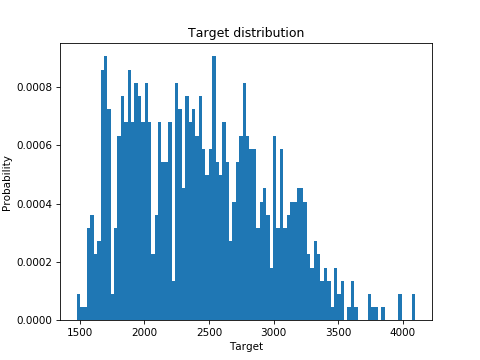

Text(0.5, 1.0, 'Target distribution')

In [4]:
import matplotlib
from distutils.version import LooseVersion

# `normed` is being deprecated in favor of `density` in histograms
if LooseVersion(matplotlib.__version__) >= '2.1':
    density_param = {'density': True}
else:
    density_param = {'normed': True}

from sklearn.preprocessing import QuantileTransformer, quantile_transform
y_trans = quantile_transform(y,
                             n_quantiles=300,
                             output_distribution='normal',
                             copy=True).squeeze()

#f, (ax0, ax1) = plt.subplots(1, 2)
f, ax0 = plt.subplots()
ax0.hist(y, bins=100, **density_param)
ax0.set_ylabel('Probability')
ax0.set_xlabel('Target')
ax0.set_title('Target distribution')

#ax1.hist(y_trans, bins=100, **density_param)
#ax1.set_ylabel('Probability')
#ax1.set_xlabel('Target')
#ax1.set_title('Transformed target distribution')

In [5]:
#Normalization 
mu = np.mean(X, axis=0)
std = np.std(X)
X_normalized = (X-mu)/std

Xtest_normalized = (Xtest-mu)/std

Xall.shape:(959, 15)
X_pca.shape>>>> (959, 14)
variance ratio: [9.62135065e-01 2.10902920e-02 1.15447014e-02 2.59300038e-03
 1.35571864e-03 7.55600690e-04 2.66808242e-04 1.94237329e-04
 4.69789859e-05 1.07851216e-05 4.08263614e-06 1.26546933e-06
 1.13471285e-06 3.29430651e-07]


<IPython.core.display.Javascript object>


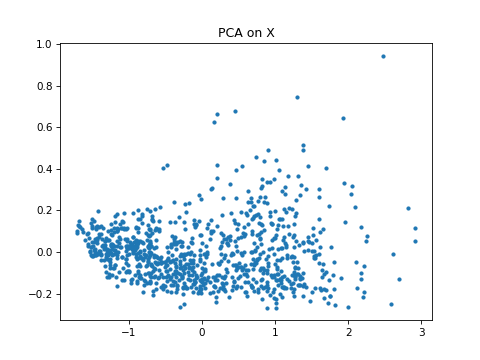

In [6]:
# PCA 
from sklearn.decomposition import PCA

#Before doing PCA, combine train, validation and test input data
Xall = X_normalized ###
Xall = np.concatenate([Xall, Xtest_normalized], axis=0) ###
print("Xall.shape:{}".format(Xall.shape))

#pca to get principle features
pca = PCA('mle')
X_pca = pca.fit_transform(Xall)
print("X_pca.shape>>>>", X_pca.shape)

#CHECK VARIANCE IN X_pca
xpca_var = np.var(X_pca, axis=0)
var_ratio = xpca_var/ np.sum(xpca_var)
print("variance ratio:", var_ratio)

fig, ax = plt.subplots()
ax.plot(X_pca[:,0], X_pca[:,1], '.')
ax.set_title("PCA on X")

fig.show()

In [10]:
#Split (training, validation) and test datasets
Xte = X_pca[-Xtest.shape[0]:,:]
print("Xte.shape:{}".format(Xte.shape))
Xrem = X_pca[:-Xtest.shape[0],:]

#Split training & validation datasets
from sklearn.model_selection import train_test_split
Xtr, Xva, ytr, yva = train_test_split(Xrem, yres, train_size=0.8, random_state=1)

#Xtr = X[int(Xrem.shape[0]/5):,:]
#ytr = yres[int(yres.shape[0]/5):,:]
#Xva = X[:int(Xrem.shape[0]/5),:]
#yva = yres[:int(yres.shape[0]/5),:]

#print("Xtrain.shape:{}, ytrain.shape:{}, Xval.shape:{}, yval.shape:{}".format(Xtrain.shape, ytrain.shape, Xval.shape, yval.shape))
print("Xtr.shape:{}, ytr.shape:{}, Xva.shape:{}, yva.shape:{}".format(Xtr.shape, ytr.shape, Xva.shape, yva.shape))

Xte.shape:(115, 14)
Xtr.shape:(675, 14), ytr.shape:(675, 1), Xva.shape:(169, 14), yva.shape:(169, 1)


<IPython.core.display.Javascript object>


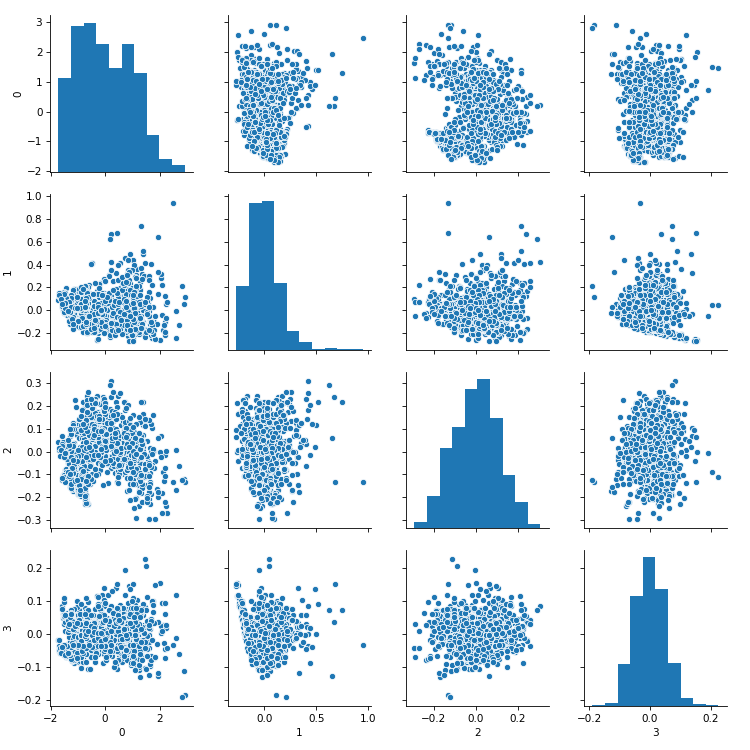

In [7]:
import pandas as pd
import seaborn as sns
Xdf = pd.DataFrame(X_pca[:,:4])
sns.pairplot(Xdf)

In [11]:
Xtrain = Xtr
ytrain = ytr
Xval = Xva
yval = yva
Xtest = Xte

print("<><><><>", max(yval))

<><><><> [3988]


In [12]:
import sklearn.metrics as metrics
def regression_results(y_true, y_pred):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    mean_squared_log_error=metrics.mean_squared_log_error(abs(y_true), abs(y_pred))
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)

    print('explained_variance: ', round(explained_variance,4))    
    print('mean_squared_log_error: ', round(mean_squared_log_error,4))
    print('r2: ', round(r2,4))
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))

In [12]:
##SVM Regressor
print("Using SVM Regressor:\n")
svclf = SVR(kernel="linear", C=0.025)
svclf.fit(Xtrain, np.ravel(ytrain))

print('Predictions on validation data: \n')
print ('*******************************************\n')
PredictedOutcome = svclf.predict(Xval)
#print(PredictedOutcome)

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

scores = cross_val_score(svclf, Xrem, np.ravel(yres), cv=5, scoring='neg_root_mean_squared_error')
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

Using SVM Regressor:

Predictions on validation data: 

*******************************************

error 523.7700002332491
err_r2 0.027022086911324905
Score: -519.57 (+/- 20.62)
explained_variance:  0.0419
mean_squared_log_error:  0.0441
r2:  0.027
MAE:  415.3119
MSE:  274335.0131
RMSE:  523.77


In [13]:
#----Hyperparameter tuning-----
# specify parameters and distributions to sample from
#param_dist = {'kernel': ['linear'], 'C': np.arange(0.01,2,0.01)}
param_dist = {'C': [0.1,0.5, 1], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}
# run randomized search
#n_iter_search = 20
#random_search = RandomizedSearchCV(svclf, param_distributions=param_dist, n_iter=n_iter_search)

#start = time()
#random_search.fit(Xtrain, np.ravel(ytrain))
#best_params = random_search.best_params_
#print("RandomizedSearchCV took %.2f seconds for %d candidates parameter settings." % ((time() - start), n_iter_search))
#report(random_search.cv_results_)

# run grid search
grid_search = GridSearchCV(svclf, param_dist, cv=5)
start = time()
grid_search.fit(Xtrain, np.ravel(ytrain))
best_params = grid_search.best_params_
print("GridSearchCV took %.2f seconds" % (time() - start))
print(best_params)
PredictedOutcome = grid_search.predict(Xval)

#-------Update the estimator----------
svclf = SVR(kernel=best_params['kernel'], C=best_params['C'])
svclf.fit(Xtrain, np.ravel(ytrain))
#PredictedOutcome = svclf.predict(Xval)
#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

#--------Cross validation-------
scores = cross_val_score(svclf, Xrem, np.ravel(yres), cv=5, scoring='neg_root_mean_squared_error')
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

GridSearchCV took 10.53 seconds
{'C': 1, 'gamma': 1, 'kernel': 'sigmoid'}
error 303.8698843130583
err_r2 0.672510739159282
Score: -300.87 (+/- 13.28)
explained_variance:  0.674
mean_squared_log_error:  0.0151
r2:  0.6725
MAE:  227.2588
MSE:  92336.9066
RMSE:  303.8699


In [18]:
##Decision Tree Regressor
print("Using Decision Tree Regressor:\n")
dtclf = DecisionTreeRegressor(max_depth=5)
dtclf.fit(Xtrain, np.ravel(ytrain))

print('Predictions on validation data: \n')
print ('*******************************************\n')
PredictedOutcome = dtclf.predict(Xval)
#print(PredictedOutcome)

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

#r2_score
err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

scores = cross_val_score(dtclf, Xrem, np.ravel(yres), cv=5)
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

Using Decision Tree Regressor:

Predictions on validation data: 

*******************************************

error 120.84633565172231
err_r2 0.948204895433339
Score: 0.93 (+/- 0.01)
explained_variance:  0.9485
mean_squared_log_error:  0.0022
r2:  0.9482
MAE:  92.957
MSE:  14603.8368
RMSE:  120.8463


In [19]:
#----Hyperparameter tuning-----
# specify parameters and distributions to sample from
param_dist = {'max_depth':np.arange(5,100,5), 'criterion':['mse', 'friedman_mse', 'mae']}

# run randomized search
#n_iter_search = 20
#random_search = RandomizedSearchCV(dtclf, param_distributions=param_dist, n_iter=n_iter_search)

#start = time()
#random_search.fit(Xtrain, np.ravel(ytrain))
#best_params = random_search.best_params_
#print("RandomizedSearchCV took %.2f seconds for %d candidates parameter settings." % ((time() - start), n_iter_search))
#report(random_search.cv_results_)
#print(best_params)

# run grid search
grid_search = GridSearchCV(dtclf, param_dist, cv=5)
start = time()
grid_search.fit(Xtrain, np.ravel(ytrain))
best_params = grid_search.best_params_
print("GridSearchCV took %.2f seconds" % (time() - start))
print(best_params)
PredictedOutcome = grid_search.predict(Xval)

#-------Update the estimator----------
dtclf = DecisionTreeRegressor(max_depth=best_params['max_depth'])
dtclf.fit(Xtrain, np.ravel(ytrain))
#PredictedOutcome = dtclf.predict(Xval)

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

#r2_score
err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

#--------Cross validation-------
scores = cross_val_score(dtclf, Xrem, np.ravel(yres), cv=5)
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

GridSearchCV took 30.00 seconds
{'criterion': 'friedman_mse', 'max_depth': 5}
error 120.45592588201588
err_r2 0.9485390164630919
Score: 0.93 (+/- 0.01)
explained_variance:  0.949
mean_squared_log_error:  0.0022
r2:  0.9485
MAE:  92.7822
MSE:  14509.6301
RMSE:  120.4559


In [17]:
##MLPRegressor
print("Using MLP Regressor:\n")
mlpclf = MLPRegressor(alpha=0.1, max_iter=7000, early_stopping=True)

mlpclf.fit(Xtrain, np.ravel(ytrain))

print('Predictions on validation data: \n')
print ('*******************************************\n')
PredictedOutcome = mlpclf.predict(Xval)
#print(PredictedOutcome)

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

scores = cross_val_score(mlpclf, Xrem, np.ravel(yres), cv=5)
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

Using MLP Regressor:

Predictions on validation data: 

*******************************************

error 135.17096509326055
Score: 0.93 (+/- 0.00)
explained_variance:  0.9377
mean_squared_log_error:  0.0027
r2:  0.9352
MAE:  103.3138
MSE:  18271.1898
RMSE:  135.171


In [ ]:
#----Hyperparameter tuning-----
# specify parameters and distributions to sample from
#param_dist = {'alpha':np.arange(0.01,1,0.1), 'max_iter':np.arange(1000,5000,1000)}
param_dist = {'verbose':[True], 'early_stopping':[True], 'activation':['identity', 'logistic', 'tanh', 'relu']
              ,'alpha':np.arange(0.0002,0.0007,0.0002), 'hidden_layer_sizes':[(30,30,30),(50,50),(70,50,70)], 'learning_rate_init':[0.001,0.01,0.1],'max_iter':np.arange(1500,2550,500)}

# run randomized search
#n_iter_search = 20
#random_search = RandomizedSearchCV(mlpclf, param_distributions=param_dist, n_iter=n_iter_search)

#start = time()
#random_search.fit(Xtrain, np.ravel(ytrain))
#best_params = random_search.best_params_
#print("RandomizedSearchCV took %.2f seconds for %d candidates parameter settings." % ((time() - start), n_iter_search))
#report(random_search.cv_results_)
#print(best_params)

# run grid search
grid_search = GridSearchCV(mlpclf, param_dist, cv=5)
start = time()
grid_search.fit(Xtrain, np.ravel(ytrain))
best_params = grid_search.best_params_
print("GridSearchCV took %.2f seconds" % (time() - start))
print(best_params)
PredictedOutcome = grid_search.predict(Xval)

#-------Update the estimator----------
mlpclf = MLPRegressor(alpha=best_params['alpha'], max_iter=best_params['max_iter'])
mlpclf.fit(Xtrain, np.ravel(ytrain))
#PredictedOutcome = mlpclf.predict(Xval)
#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

#--------Cross validation-------
scores = cross_val_score(mlpclf, Xrem, np.ravel(yres), cv=5)
print("Score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

Iteration 1, loss = 3052299.62154314
Validation score: -26.760722
Iteration 2, loss = 3051408.65622617
Validation score: -26.752672
Iteration 3, loss = 3050499.59831961
Validation score: -26.744373
Iteration 4, loss = 3049562.32332703
Validation score: -26.735673
Iteration 5, loss = 3048578.96608987
Validation score: -26.726411
Iteration 6, loss = 3047526.85814574
Validation score: -26.716468
Iteration 7, loss = 3046405.18381020
Validation score: -26.705673
Iteration 8, loss = 3045187.20643211
Validation score: -26.693936
Iteration 9, loss = 3043852.24446485
Validation score: -26.681139
Iteration 10, loss = 3042398.16504407
Validation score: -26.667093
Iteration 11, loss = 3040792.93044056
Validation score: -26.651680
Iteration 12, loss = 3039040.07773963
Validation score: -26.634674
Iteration 13, loss = 3037092.53742373
Validation score: -26.615908
Iteration 14, loss = 3034946.19680279
Validation score: -26.595094
Iteration 15, loss = 3032560.69807238
Validation score: -26.572011
Iter

Validation score: 0.942679
Iteration 134, loss = 8047.12183318
Validation score: 0.942836
Iteration 135, loss = 8016.23352470
Validation score: 0.942943
Iteration 136, loss = 7985.46694788
Validation score: 0.943087
Iteration 137, loss = 7952.93896651
Validation score: 0.943350
Iteration 138, loss = 7924.21473432
Validation score: 0.943556
Iteration 139, loss = 7894.63005865
Validation score: 0.943751
Iteration 140, loss = 7867.49811943
Validation score: 0.943977
Iteration 141, loss = 7842.47674038
Validation score: 0.944196
Iteration 142, loss = 7813.44806815
Validation score: 0.944397
Iteration 143, loss = 7791.54667081
Validation score: 0.944583
Iteration 144, loss = 7766.61713895
Validation score: 0.944714
Iteration 145, loss = 7743.54688615
Validation score: 0.944831
Iteration 146, loss = 7721.76118627
Validation score: 0.944959
Iteration 147, loss = 7703.17987190
Validation score: 0.945104
Iteration 148, loss = 7681.72694182
Validation score: 0.945331
Iteration 149, loss = 7659.7

Validation score: 0.830603
Iteration 95, loss = 24627.54278595
Validation score: 0.863502
Iteration 96, loss = 20733.74082816
Validation score: 0.887930
Iteration 97, loss = 17678.75312995
Validation score: 0.905307
Iteration 98, loss = 15562.90050439
Validation score: 0.917658
Iteration 99, loss = 14110.71834510
Validation score: 0.926494
Iteration 100, loss = 13134.64618057
Validation score: 0.932614
Iteration 101, loss = 12431.69318611
Validation score: 0.936732
Iteration 102, loss = 11967.01186252
Validation score: 0.939575
Iteration 103, loss = 11650.44574305
Validation score: 0.941580
Iteration 104, loss = 11401.50436422
Validation score: 0.942985
Iteration 105, loss = 11197.31897789
Validation score: 0.944022
Iteration 106, loss = 11045.57087410
Validation score: 0.944888
Iteration 107, loss = 10891.39100468
Validation score: 0.945581
Iteration 108, loss = 10737.68294323
Validation score: 0.946144
Iteration 109, loss = 10581.41020566
Validation score: 0.946681
Iteration 110, los

Iteration 89, loss = 43060.28701452
Validation score: 0.676253
Iteration 90, loss = 34171.94694555
Validation score: 0.736364
Iteration 91, loss = 27502.05274222
Validation score: 0.782827
Iteration 92, loss = 22079.56569685
Validation score: 0.817590
Iteration 93, loss = 18267.04793614
Validation score: 0.843402
Iteration 94, loss = 15473.31438901
Validation score: 0.862020
Iteration 95, loss = 13500.86019761
Validation score: 0.875158
Iteration 96, loss = 12019.93082306
Validation score: 0.884167
Iteration 97, loss = 11109.09719118
Validation score: 0.890443
Iteration 98, loss = 10463.93566372
Validation score: 0.894642
Iteration 99, loss = 10090.42617906
Validation score: 0.897637
Iteration 100, loss = 9783.87465362
Validation score: 0.899666
Iteration 101, loss = 9636.90673641
Validation score: 0.901154
Iteration 102, loss = 9513.19345698
Validation score: 0.902207
Iteration 103, loss = 9418.88187767
Validation score: 0.903059
Iteration 104, loss = 9347.40320658
Validation score: 0

Iteration 232, loss = 6825.51299770
Validation score: 0.931828
Iteration 233, loss = 6821.07833410
Validation score: 0.931955
Iteration 234, loss = 6816.65950698
Validation score: 0.932026
Iteration 235, loss = 6810.59037124
Validation score: 0.932061
Iteration 236, loss = 6804.61988873
Validation score: 0.932078
Iteration 237, loss = 6798.70235514
Validation score: 0.932018
Iteration 238, loss = 6790.25876583
Validation score: 0.932000
Iteration 239, loss = 6784.71140171
Validation score: 0.931967
Iteration 240, loss = 6778.78331384
Validation score: 0.931932
Iteration 241, loss = 6774.85258905
Validation score: 0.931862
Iteration 242, loss = 6773.26358282
Validation score: 0.931826
Iteration 243, loss = 6765.72764901
Validation score: 0.931956
Iteration 244, loss = 6759.58916417
Validation score: 0.932107
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3100812.47818660
Validation score: -18.595623
Iteration 2, loss = 30

Iteration 124, loss = 7887.78963974
Validation score: 0.958371
Iteration 125, loss = 7860.23599457
Validation score: 0.958486
Iteration 126, loss = 7834.66719854
Validation score: 0.958634
Iteration 127, loss = 7812.50236863
Validation score: 0.958787
Iteration 128, loss = 7788.19162084
Validation score: 0.958931
Iteration 129, loss = 7765.64701225
Validation score: 0.959083
Iteration 130, loss = 7742.39447568
Validation score: 0.959199
Iteration 131, loss = 7722.74179979
Validation score: 0.959279
Iteration 132, loss = 7704.53722870
Validation score: 0.959343
Iteration 133, loss = 7684.33147184
Validation score: 0.959444
Iteration 134, loss = 7668.40066086
Validation score: 0.959582
Iteration 135, loss = 7647.18018899
Validation score: 0.959694
Iteration 136, loss = 7629.20881690
Validation score: 0.959788
Iteration 137, loss = 7613.93055100
Validation score: 0.959859
Iteration 138, loss = 7598.16594246
Validation score: 0.959958
Iteration 139, loss = 7580.95574072
Validation score: 0

Validation score: 0.239624
Iteration 88, loss = 121644.78101202
Validation score: 0.398267
Iteration 89, loss = 98019.64090892
Validation score: 0.530494
Iteration 90, loss = 78063.22200755
Validation score: 0.638876
Iteration 91, loss = 61585.72014652
Validation score: 0.725589
Iteration 92, loss = 48554.85293154
Validation score: 0.793645
Iteration 93, loss = 37996.62214372
Validation score: 0.845262
Iteration 94, loss = 29716.05969211
Validation score: 0.883067
Iteration 95, loss = 23414.16602563
Validation score: 0.909974
Iteration 96, loss = 18775.30160898
Validation score: 0.928340
Iteration 97, loss = 15468.58566473
Validation score: 0.940211
Iteration 98, loss = 13061.67904526
Validation score: 0.947237
Iteration 99, loss = 11403.71268572
Validation score: 0.950804
Iteration 100, loss = 10304.19097554
Validation score: 0.952122
Iteration 101, loss = 9604.25458734
Validation score: 0.952021
Iteration 102, loss = 9235.68796695
Validation score: 0.951164
Iteration 103, loss = 8938

Iteration 116, loss = 9468.91701944
Validation score: 0.902596
Iteration 117, loss = 9368.49561327
Validation score: 0.903384
Iteration 118, loss = 9264.61126857
Validation score: 0.904096
Iteration 119, loss = 9167.06702480
Validation score: 0.904777
Iteration 120, loss = 9082.83107132
Validation score: 0.905358
Iteration 121, loss = 8998.30813728
Validation score: 0.905984
Iteration 122, loss = 8926.76492773
Validation score: 0.906722
Iteration 123, loss = 8849.66641034
Validation score: 0.907393
Iteration 124, loss = 8773.93088364
Validation score: 0.908019
Iteration 125, loss = 8711.57220487
Validation score: 0.908619
Iteration 126, loss = 8645.16157184
Validation score: 0.909142
Iteration 127, loss = 8587.24571543
Validation score: 0.909750
Iteration 128, loss = 8524.83791236
Validation score: 0.910385
Iteration 129, loss = 8474.95709065
Validation score: 0.910976
Iteration 130, loss = 8418.49572437
Validation score: 0.911560
Iteration 131, loss = 8366.25267757
Validation score: 0

Validation score: -19.828716
Iteration 15, loss = 3145859.67918625
Validation score: -19.809587
Iteration 16, loss = 3143056.64203856
Validation score: -19.788249
Iteration 17, loss = 3139935.34148425
Validation score: -19.764489
Iteration 18, loss = 3136464.52433409
Validation score: -19.738015
Iteration 19, loss = 3132537.64328320
Validation score: -19.708512
Iteration 20, loss = 3128188.59222075
Validation score: -19.675811
Iteration 21, loss = 3123361.18030978
Validation score: -19.639617
Iteration 22, loss = 3117974.90200980
Validation score: -19.599477
Iteration 23, loss = 3111914.18245449
Validation score: -19.555082
Iteration 24, loss = 3105293.27954377
Validation score: -19.506106
Iteration 25, loss = 3097827.60827715
Validation score: -19.452026
Iteration 26, loss = 3089690.60378246
Validation score: -19.392634
Iteration 27, loss = 3080563.35763009
Validation score: -19.327208
Iteration 28, loss = 3070623.13633336
Validation score: -19.255690
Iteration 29, loss = 3059555.4757

Iteration 153, loss = 7634.23639675
Validation score: 0.931470
Iteration 154, loss = 7616.29845351
Validation score: 0.931613
Iteration 155, loss = 7597.14687536
Validation score: 0.931737
Iteration 156, loss = 7579.90990609
Validation score: 0.931856
Iteration 157, loss = 7562.96577389
Validation score: 0.931969
Iteration 158, loss = 7546.29433120
Validation score: 0.932083
Iteration 159, loss = 7533.99156554
Validation score: 0.932191
Iteration 160, loss = 7519.79803177
Validation score: 0.932332
Iteration 161, loss = 7500.22330701
Validation score: 0.932451
Iteration 162, loss = 7485.88905911
Validation score: 0.932574
Iteration 163, loss = 7471.85594606
Validation score: 0.932706
Iteration 164, loss = 7456.18455104
Validation score: 0.932840
Iteration 165, loss = 7444.87092330
Validation score: 0.932964
Iteration 166, loss = 7429.69374078
Validation score: 0.933084
Iteration 167, loss = 7418.53019068
Validation score: 0.933204
Iteration 168, loss = 7404.17163320
Validation score: 0

Iteration 103, loss = 10184.93683410
Validation score: 0.946387
Iteration 104, loss = 9992.65014096
Validation score: 0.947447
Iteration 105, loss = 9869.94097194
Validation score: 0.948363
Iteration 106, loss = 9751.52120308
Validation score: 0.949146
Iteration 107, loss = 9639.63560970
Validation score: 0.949982
Iteration 108, loss = 9534.92370004
Validation score: 0.950722
Iteration 109, loss = 9427.32438248
Validation score: 0.951461
Iteration 110, loss = 9328.18056787
Validation score: 0.952150
Iteration 111, loss = 9231.03440141
Validation score: 0.952765
Iteration 112, loss = 9137.20527126
Validation score: 0.953319
Iteration 113, loss = 9048.83491843
Validation score: 0.953855
Iteration 114, loss = 8967.10657882
Validation score: 0.954333
Iteration 115, loss = 8889.02809580
Validation score: 0.954881
Iteration 116, loss = 8822.38249259
Validation score: 0.955368
Iteration 117, loss = 8750.85442960
Validation score: 0.955887
Iteration 118, loss = 8695.07349848
Validation score: 

Iteration 59, loss = 1805071.60351864
Validation score: -9.514591
Iteration 60, loss = 1732633.89587579
Validation score: -9.070836
Iteration 61, loss = 1657968.99682875
Validation score: -8.620221
Iteration 62, loss = 1582596.31025635
Validation score: -8.161990
Iteration 63, loss = 1505695.12905191
Validation score: -7.698405
Iteration 64, loss = 1427870.76922433
Validation score: -7.230349
Iteration 65, loss = 1349505.56983504
Validation score: -6.758119
Iteration 66, loss = 1270573.14759696
Validation score: -6.285441
Iteration 67, loss = 1191586.36587594
Validation score: -5.814054
Iteration 68, loss = 1113139.47648548
Validation score: -5.346461
Iteration 69, loss = 1034771.10299382
Validation score: -4.886232
Iteration 70, loss = 958214.51263035
Validation score: -4.432892
Iteration 71, loss = 882060.41850871
Validation score: -3.988712
Iteration 72, loss = 808736.74512947
Validation score: -3.553380
Iteration 73, loss = 736120.86389209
Validation score: -3.134170
Iteration 74, 

Iteration 28, loss = 3007918.88448155
Validation score: -23.758063
Iteration 29, loss = 2999020.95649211
Validation score: -23.679915
Iteration 30, loss = 2989278.42447597
Validation score: -23.593844
Iteration 31, loss = 2978621.10424688
Validation score: -23.499216
Iteration 32, loss = 2966843.64748101
Validation score: -23.395476
Iteration 33, loss = 2953983.18524754
Validation score: -23.281887
Iteration 34, loss = 2939893.33441782
Validation score: -23.157914
Iteration 35, loss = 2924531.94316317
Validation score: -23.022924
Iteration 36, loss = 2907699.40437631
Validation score: -22.876308
Iteration 37, loss = 2889533.86247555
Validation score: -22.717248
Iteration 38, loss = 2869767.85250727
Validation score: -22.545130
Iteration 39, loss = 2848419.03379671
Validation score: -22.359234
Iteration 40, loss = 2825447.61707963
Validation score: -22.158811
Iteration 41, loss = 2800534.27026502
Validation score: -21.943490
Iteration 42, loss = 2773829.05383575
Validation score: -21.71

Iteration 167, loss = 7454.64712195
Validation score: 0.949094
Iteration 168, loss = 7448.99799087
Validation score: 0.949170
Iteration 169, loss = 7439.15478184
Validation score: 0.949242
Iteration 170, loss = 7428.28406442
Validation score: 0.949316
Iteration 171, loss = 7418.93065760
Validation score: 0.949387
Iteration 172, loss = 7409.37714292
Validation score: 0.949452
Iteration 173, loss = 7401.29810947
Validation score: 0.949518
Iteration 174, loss = 7391.50656047
Validation score: 0.949582
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3041373.97162221
Validation score: -19.529965
Iteration 2, loss = 3040633.75975028
Validation score: -19.525198
Iteration 3, loss = 3039882.32388728
Validation score: -19.520323
Iteration 4, loss = 3039111.36093391
Validation score: -19.515240
Iteration 5, loss = 3038317.75483996
Validation score: -19.509854
Iteration 6, loss = 3037475.01009618
Validation score: -19.504124
Iterati

Validation score: 0.951056
Iteration 133, loss = 8351.36227803
Validation score: 0.951464
Iteration 134, loss = 8285.72882278
Validation score: 0.951851
Iteration 135, loss = 8223.15855797
Validation score: 0.952215
Iteration 136, loss = 8161.40870468
Validation score: 0.952553
Iteration 137, loss = 8100.77151785
Validation score: 0.952869
Iteration 138, loss = 8047.22977163
Validation score: 0.953174
Iteration 139, loss = 7994.64281402
Validation score: 0.953469
Iteration 140, loss = 7946.73641923
Validation score: 0.953758
Iteration 141, loss = 7899.75360093
Validation score: 0.954023
Iteration 142, loss = 7854.77586251
Validation score: 0.954272
Iteration 143, loss = 7811.35421669
Validation score: 0.954503
Iteration 144, loss = 7769.86784305
Validation score: 0.954728
Iteration 145, loss = 7731.45630649
Validation score: 0.954939
Iteration 146, loss = 7690.83307509
Validation score: 0.955136
Iteration 147, loss = 7655.03741385
Validation score: 0.955318
Iteration 148, loss = 7623.6

Iteration 88, loss = 55933.02126742
Validation score: 0.667887
Iteration 89, loss = 45553.19577009
Validation score: 0.732043
Iteration 90, loss = 37511.75992559
Validation score: 0.783283
Iteration 91, loss = 31059.30212434
Validation score: 0.823130
Iteration 92, loss = 26142.06064934
Validation score: 0.853883
Iteration 93, loss = 22558.36702805
Validation score: 0.877543
Iteration 94, loss = 19761.44324888
Validation score: 0.895335
Iteration 95, loss = 17815.81206433
Validation score: 0.908685
Iteration 96, loss = 16398.90683771
Validation score: 0.918704
Iteration 97, loss = 15424.95264790
Validation score: 0.926208
Iteration 98, loss = 14643.78331828
Validation score: 0.931711
Iteration 99, loss = 14127.07004596
Validation score: 0.935884
Iteration 100, loss = 13724.38838874
Validation score: 0.939105
Iteration 101, loss = 13406.27943049
Validation score: 0.941692
Iteration 102, loss = 13153.00328115
Validation score: 0.943799
Iteration 103, loss = 12925.85574634
Validation scor

Iteration 63, loss = 1703828.28903156
Validation score: -12.454544
Iteration 64, loss = 1626935.56780857
Validation score: -11.811732
Iteration 65, loss = 1548131.27481366
Validation score: -11.158295
Iteration 66, loss = 1469234.66168229
Validation score: -10.498984
Iteration 67, loss = 1388668.87131289
Validation score: -9.832357
Iteration 68, loss = 1308748.83464299
Validation score: -9.165294
Iteration 69, loss = 1227393.19423143
Validation score: -8.498132
Iteration 70, loss = 1146617.84475107
Validation score: -7.834183
Iteration 71, loss = 1066401.19024073
Validation score: -7.177193
Iteration 72, loss = 986459.77983086
Validation score: -6.529077
Iteration 73, loss = 909138.71221580
Validation score: -5.894191
Iteration 74, loss = 831814.41540741
Validation score: -5.274414
Iteration 75, loss = 757747.12161960
Validation score: -4.674337
Iteration 76, loss = 685498.06488894
Validation score: -4.096515
Iteration 77, loss = 616963.05245270
Validation score: -3.544772
Iteration 78

Validation score: -16.190743
Iteration 44, loss = 2744940.47007308
Validation score: -15.989194
Iteration 45, loss = 2711934.75044219
Validation score: -15.774669
Iteration 46, loss = 2676729.00297402
Validation score: -15.546280
Iteration 47, loss = 2639695.17388453
Validation score: -15.302786
Iteration 48, loss = 2600249.55640839
Validation score: -15.044401
Iteration 49, loss = 2558429.39392009
Validation score: -14.771021
Iteration 50, loss = 2513693.99908868
Validation score: -14.482709
Iteration 51, loss = 2467188.17128112
Validation score: -14.178456
Iteration 52, loss = 2417248.20345586
Validation score: -13.859217
Iteration 53, loss = 2366102.53910003
Validation score: -13.523126
Iteration 54, loss = 2311687.96269767
Validation score: -13.172510
Iteration 55, loss = 2254677.76248309
Validation score: -12.807281
Iteration 56, loss = 2195914.67119757
Validation score: -12.427160
Iteration 57, loss = 2133879.88838060
Validation score: -12.033532
Iteration 58, loss = 2070459.6056

Iteration 41, loss = 2793031.94448942
Validation score: -23.611441
Iteration 42, loss = 2765912.98302757
Validation score: -23.355619
Iteration 43, loss = 2737248.14250670
Validation score: -23.081477
Iteration 44, loss = 2705844.19591195
Validation score: -22.789492
Iteration 45, loss = 2672647.64058994
Validation score: -22.477687
Iteration 46, loss = 2637454.48022974
Validation score: -22.145181
Iteration 47, loss = 2599928.20453153
Validation score: -21.791760
Iteration 48, loss = 2559857.67004899
Validation score: -21.417627
Iteration 49, loss = 2517230.78806310
Validation score: -21.022006
Iteration 50, loss = 2472443.28717710
Validation score: -20.602687
Iteration 51, loss = 2425238.10939750
Validation score: -20.160139
Iteration 52, loss = 2375356.10203032
Validation score: -19.695225
Iteration 53, loss = 2322980.74305565
Validation score: -19.208711
Iteration 54, loss = 2268308.18166958
Validation score: -18.699737
Iteration 55, loss = 2211041.33411804
Validation score: -18.16

Validation score: 0.969894
Iteration 63, loss = 5528.46074131
Validation score: 0.969822
Iteration 64, loss = 5500.75462728
Validation score: 0.969881
Iteration 65, loss = 5474.25211851
Validation score: 0.970251
Iteration 66, loss = 5423.80053006
Validation score: 0.970690
Iteration 67, loss = 5373.82846459
Validation score: 0.971011
Iteration 68, loss = 5352.22165461
Validation score: 0.971278
Iteration 69, loss = 5326.05983200
Validation score: 0.971325
Iteration 70, loss = 5297.01701381
Validation score: 0.971200
Iteration 71, loss = 5273.62443244
Validation score: 0.971288
Iteration 72, loss = 5226.74080692
Validation score: 0.971654
Iteration 73, loss = 5200.75700493
Validation score: 0.971879
Iteration 74, loss = 5173.07445415
Validation score: 0.971935
Iteration 75, loss = 5139.89116421
Validation score: 0.971861
Iteration 76, loss = 5114.18555537
Validation score: 0.971849
Iteration 77, loss = 5090.83608693
Validation score: 0.972009
Iteration 78, loss = 5064.94653315
Validati

Iteration 70, loss = 5713.67950743
Validation score: 0.963807
Iteration 71, loss = 5723.28068972
Validation score: 0.963979
Iteration 72, loss = 5683.17672769
Validation score: 0.964225
Iteration 73, loss = 5646.92150965
Validation score: 0.964285
Iteration 74, loss = 5622.03765148
Validation score: 0.964395
Iteration 75, loss = 5588.53463748
Validation score: 0.964627
Iteration 76, loss = 5550.10370053
Validation score: 0.964931
Iteration 77, loss = 5522.19657084
Validation score: 0.965192
Iteration 78, loss = 5490.05670923
Validation score: 0.965360
Iteration 79, loss = 5467.54255449
Validation score: 0.965492
Iteration 80, loss = 5428.08184992
Validation score: 0.965613
Iteration 81, loss = 5416.77892102
Validation score: 0.965695
Iteration 82, loss = 5386.58628850
Validation score: 0.965835
Iteration 83, loss = 5359.38346523
Validation score: 0.966030
Iteration 84, loss = 5333.44270737
Validation score: 0.966218
Iteration 85, loss = 5319.42752257
Validation score: 0.966401
Iteratio

Iteration 1, loss = 3111123.61850924
Validation score: -24.552110
Iteration 2, loss = 3102456.29725910
Validation score: -24.446028
Iteration 3, loss = 3087174.75534876
Validation score: -24.242561
Iteration 4, loss = 3058117.77304874
Validation score: -23.878119
Iteration 5, loss = 3008258.64907872
Validation score: -23.281351
Iteration 6, loss = 2926514.51654804
Validation score: -22.347752
Iteration 7, loss = 2797344.10333479
Validation score: -20.943476
Iteration 8, loss = 2607988.24986279
Validation score: -18.944679
Iteration 9, loss = 2337125.89003801
Validation score: -16.222873
Iteration 10, loss = 1970768.04375696
Validation score: -12.703421
Iteration 11, loss = 1508833.96142874
Validation score: -8.473489
Iteration 12, loss = 978252.11955171
Validation score: -3.951733
Iteration 13, loss = 453954.27485759
Validation score: -0.210392
Iteration 14, loss = 87131.19765057
Validation score: 0.841397
Iteration 15, loss = 59392.76727715
Validation score: -0.837740
Iteration 16, lo

Iteration 44, loss = 6082.22842990
Validation score: 0.945153
Iteration 45, loss = 6105.74225260
Validation score: 0.945414
Iteration 46, loss = 6062.63602088
Validation score: 0.945759
Iteration 47, loss = 5988.52480177
Validation score: 0.945876
Iteration 48, loss = 5936.37163307
Validation score: 0.945780
Iteration 49, loss = 5929.08526893
Validation score: 0.945785
Iteration 50, loss = 5892.23629501
Validation score: 0.946334
Iteration 51, loss = 5846.63272738
Validation score: 0.946683
Iteration 52, loss = 5802.63584972
Validation score: 0.947162
Iteration 53, loss = 5791.80552883
Validation score: 0.947686
Iteration 54, loss = 5746.35985696
Validation score: 0.947822
Iteration 55, loss = 5708.08903503
Validation score: 0.947775
Iteration 56, loss = 5682.55894508
Validation score: 0.948215
Iteration 57, loss = 5667.66369116
Validation score: 0.948986
Iteration 58, loss = 5607.51523949
Validation score: 0.949117
Iteration 59, loss = 5583.46844659
Validation score: 0.949529
Iteratio

Iteration 112, loss = 4530.15709929
Validation score: 0.972737
Iteration 113, loss = 4507.70478237
Validation score: 0.973005
Iteration 114, loss = 4482.89222450
Validation score: 0.973052
Iteration 115, loss = 4456.66861414
Validation score: 0.972774
Iteration 116, loss = 4463.74515278
Validation score: 0.972966
Iteration 117, loss = 4444.15032579
Validation score: 0.973412
Iteration 118, loss = 4419.81090227
Validation score: 0.973631
Iteration 119, loss = 4382.63721864
Validation score: 0.973722
Iteration 120, loss = 4374.75574345
Validation score: 0.973862
Iteration 121, loss = 4349.95427242
Validation score: 0.974067
Iteration 122, loss = 4320.16355336
Validation score: 0.973956
Iteration 123, loss = 4320.75173065
Validation score: 0.974144
Iteration 124, loss = 4282.97090637
Validation score: 0.974130
Iteration 125, loss = 4266.10766244
Validation score: 0.973929
Iteration 126, loss = 4273.97456979
Validation score: 0.974161
Iteration 127, loss = 4235.81864233
Validation score: 0

Iteration 77, loss = 4800.62440904
Validation score: 0.945130
Iteration 78, loss = 4809.83377383
Validation score: 0.945758
Iteration 79, loss = 4755.03671951
Validation score: 0.947031
Iteration 80, loss = 4762.46250372
Validation score: 0.947532
Iteration 81, loss = 4741.42061998
Validation score: 0.947103
Iteration 82, loss = 4692.93646957
Validation score: 0.946931
Iteration 83, loss = 4663.21242193
Validation score: 0.947993
Iteration 84, loss = 4642.65244653
Validation score: 0.948568
Iteration 85, loss = 4622.90831815
Validation score: 0.948626
Iteration 86, loss = 4590.47583158
Validation score: 0.948712
Iteration 87, loss = 4586.25673489
Validation score: 0.949114
Iteration 88, loss = 4555.29662900
Validation score: 0.949612
Iteration 89, loss = 4532.56702245
Validation score: 0.949987
Iteration 90, loss = 4509.97076566
Validation score: 0.949954
Iteration 91, loss = 4496.14332664
Validation score: 0.950223
Iteration 92, loss = 4468.47656465
Validation score: 0.950370
Iteratio

Iteration 228, loss = 3086.14780002
Validation score: 0.969480
Iteration 229, loss = 3072.69099598
Validation score: 0.969763
Iteration 230, loss = 3070.56160033
Validation score: 0.969789
Iteration 231, loss = 3060.99649558
Validation score: 0.969948
Iteration 232, loss = 3061.06595326
Validation score: 0.969641
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3139111.12565088
Validation score: -26.518329
Iteration 2, loss = 3130621.00179525
Validation score: -26.404563
Iteration 3, loss = 3115577.92316318
Validation score: -26.192063
Iteration 4, loss = 3087226.91476661
Validation score: -25.813447
Iteration 5, loss = 3038472.60279529
Validation score: -25.182697
Iteration 6, loss = 2956896.26602280
Validation score: -24.185867
Iteration 7, loss = 2831403.10909331
Validation score: -22.680865
Iteration 8, loss = 2640544.27766323
Validation score: -20.508451
Iteration 9, loss = 2370705.81450940
Validation score: -17.53030

Iteration 72, loss = 5247.60883812
Validation score: 0.966903
Iteration 73, loss = 5225.24939181
Validation score: 0.967093
Iteration 74, loss = 5179.07245317
Validation score: 0.967322
Iteration 75, loss = 5162.80670271
Validation score: 0.967573
Iteration 76, loss = 5132.58169118
Validation score: 0.967689
Iteration 77, loss = 5100.59072625
Validation score: 0.967740
Iteration 78, loss = 5068.63175931
Validation score: 0.967729
Iteration 79, loss = 5055.19848880
Validation score: 0.967656
Iteration 80, loss = 5020.42026288
Validation score: 0.967864
Iteration 81, loss = 4988.13721676
Validation score: 0.967986
Iteration 82, loss = 4954.75763283
Validation score: 0.968237
Iteration 83, loss = 4938.23515524
Validation score: 0.968450
Iteration 84, loss = 4902.34409885
Validation score: 0.968574
Iteration 85, loss = 4889.85434971
Validation score: 0.968604
Iteration 86, loss = 4862.75003991
Validation score: 0.968708
Iteration 87, loss = 4842.29887934
Validation score: 0.968592
Iteratio

Iteration 40, loss = 6456.12041567
Validation score: 0.962235
Iteration 41, loss = 6460.68581436
Validation score: 0.961966
Iteration 42, loss = 6363.70505358
Validation score: 0.961620
Iteration 43, loss = 6251.48670741
Validation score: 0.960061
Iteration 44, loss = 6223.12594746
Validation score: 0.959261
Iteration 45, loss = 6201.75526856
Validation score: 0.959918
Iteration 46, loss = 6142.89672442
Validation score: 0.960200
Iteration 47, loss = 6107.40529705
Validation score: 0.960970
Iteration 48, loss = 6070.42420556
Validation score: 0.962292
Iteration 49, loss = 6017.95940111
Validation score: 0.963244
Iteration 50, loss = 5978.35894539
Validation score: 0.963057
Iteration 51, loss = 5954.76058548
Validation score: 0.962246
Iteration 52, loss = 5907.20057923
Validation score: 0.962833
Iteration 53, loss = 5865.06787299
Validation score: 0.963740
Iteration 54, loss = 5832.81637698
Validation score: 0.964705
Iteration 55, loss = 5817.36019315
Validation score: 0.965459
Iteratio

Iteration 9, loss = 2202116.96193453
Validation score: -11.473832
Iteration 10, loss = 1798646.15039041
Validation score: -8.426990
Iteration 11, loss = 1295828.52430655
Validation score: -4.937668
Iteration 12, loss = 749930.63268243
Validation score: -1.579689
Iteration 13, loss = 272493.24383360
Validation score: 0.612178
Iteration 14, loss = 33589.81981172
Validation score: 0.579533
Iteration 15, loss = 135688.14474322
Validation score: -0.532129
Iteration 16, loss = 262098.18184920
Validation score: -0.290641
Iteration 17, loss = 170270.17045609
Validation score: 0.593757
Iteration 18, loss = 46463.96272604
Validation score: 0.951425
Iteration 19, loss = 13909.28913120
Validation score: 0.800650
Iteration 20, loss = 39821.70333715
Validation score: 0.619859
Iteration 21, loss = 58973.94635858
Validation score: 0.638853
Iteration 22, loss = 49419.06629682
Validation score: 0.803739
Iteration 23, loss = 25186.05197620
Validation score: 0.939161
Iteration 24, loss = 9477.89099285
Val

Iteration 18, loss = 88631.28424242
Validation score: 0.858015
Iteration 19, loss = 14148.18477649
Validation score: 0.873035
Iteration 20, loss = 26428.94684505
Validation score: 0.673433
Iteration 21, loss = 53877.51407046
Validation score: 0.615001
Iteration 22, loss = 55386.99202474
Validation score: 0.735326
Iteration 23, loss = 33796.56590178
Validation score: 0.891184
Iteration 24, loss = 12451.57178345
Validation score: 0.944418
Iteration 25, loss = 8478.86090293
Validation score: 0.897771
Iteration 26, loss = 15028.74982661
Validation score: 0.859335
Iteration 27, loss = 17525.02603996
Validation score: 0.886578
Iteration 28, loss = 12371.27091838
Validation score: 0.932599
Iteration 29, loss = 7478.34963642
Validation score: 0.947819
Iteration 30, loss = 7310.06106486
Validation score: 0.939261
Iteration 31, loss = 8844.03051200
Validation score: 0.936173
Iteration 32, loss = 8897.52919395
Validation score: 0.942447
Iteration 33, loss = 7553.47109754
Validation score: 0.94856

Iteration 157, loss = 3623.35925193
Validation score: 0.971063
Iteration 158, loss = 3616.27785011
Validation score: 0.971959
Iteration 159, loss = 3591.59411232
Validation score: 0.971462
Iteration 160, loss = 3578.77541488
Validation score: 0.971888
Iteration 161, loss = 3572.27812018
Validation score: 0.972591
Iteration 162, loss = 3587.91032422
Validation score: 0.972773
Iteration 163, loss = 3558.03087506
Validation score: 0.971437
Iteration 164, loss = 3572.10031613
Validation score: 0.971371
Iteration 165, loss = 3565.87186104
Validation score: 0.972836
Iteration 166, loss = 3569.44672308
Validation score: 0.972577
Iteration 167, loss = 3513.25120847
Validation score: 0.971013
Iteration 168, loss = 3569.52949426
Validation score: 0.972099
Iteration 169, loss = 3497.01201256
Validation score: 0.972823
Iteration 170, loss = 3502.95746023
Validation score: 0.972958
Iteration 171, loss = 3486.47004855
Validation score: 0.971889
Iteration 172, loss = 3494.31454965
Validation score: 0

Iteration 29, loss = 8249.84252569
Validation score: 0.958507
Iteration 30, loss = 8270.85496028
Validation score: 0.946102
Iteration 31, loss = 9530.59757101
Validation score: 0.944278
Iteration 32, loss = 9414.47019657
Validation score: 0.952793
Iteration 33, loss = 8162.70686706
Validation score: 0.961573
Iteration 34, loss = 7247.27096152
Validation score: 0.962354
Iteration 35, loss = 7395.30803273
Validation score: 0.960704
Iteration 36, loss = 7928.34002483
Validation score: 0.961046
Iteration 37, loss = 7768.17621700
Validation score: 0.962534
Iteration 38, loss = 7300.30259428
Validation score: 0.963597
Iteration 39, loss = 7089.57225213
Validation score: 0.964343
Iteration 40, loss = 7110.14352177
Validation score: 0.964421
Iteration 41, loss = 7065.50060734
Validation score: 0.963765
Iteration 42, loss = 6972.37126421
Validation score: 0.963824
Iteration 43, loss = 6897.66749849
Validation score: 0.964637
Iteration 44, loss = 6828.80571846
Validation score: 0.966309
Iteratio

Validation score: -21.150111
Iteration 7, loss = 2783892.87229356
Validation score: -19.789592
Iteration 8, loss = 2591213.03044731
Validation score: -17.836057
Iteration 9, loss = 2317718.87331464
Validation score: -15.171517
Iteration 10, loss = 1949242.83822068
Validation score: -11.754559
Iteration 11, loss = 1485239.63734033
Validation score: -7.715886
Iteration 12, loss = 955613.53970580
Validation score: -3.512958
Iteration 13, loss = 441991.20792720
Validation score: -0.156186
Iteration 14, loss = 85094.86499194
Validation score: 0.870571
Iteration 15, loss = 60253.16205143
Validation score: -0.437180
Iteration 16, loss = 233351.19446120
Validation score: -0.818917
Iteration 17, loss = 216911.99368310
Validation score: 0.208546
Iteration 18, loss = 77390.90768302
Validation score: 0.883497
Iteration 19, loss = 12080.78213852
Validation score: 0.852169
Iteration 20, loss = 27463.27809696
Validation score: 0.622750
Iteration 21, loss = 53702.73425448
Validation score: 0.572585
It

Validation score: 0.973007
Iteration 161, loss = 3750.90337768
Validation score: 0.973397
Iteration 162, loss = 3737.83889275
Validation score: 0.973591
Iteration 163, loss = 3729.93307560
Validation score: 0.973828
Iteration 164, loss = 3720.20111800
Validation score: 0.974071
Iteration 165, loss = 3717.23902797
Validation score: 0.974187
Iteration 166, loss = 3716.99286330
Validation score: 0.973641
Iteration 167, loss = 3701.31243900
Validation score: 0.974239
Iteration 168, loss = 3681.27581679
Validation score: 0.974587
Iteration 169, loss = 3694.92505580
Validation score: 0.974678
Iteration 170, loss = 3681.42926532
Validation score: 0.974138
Iteration 171, loss = 3655.82701189
Validation score: 0.972893
Iteration 172, loss = 3686.43185713
Validation score: 0.973526
Iteration 173, loss = 3654.47469314
Validation score: 0.974365
Iteration 174, loss = 3644.16164611
Validation score: 0.974452
Iteration 175, loss = 3625.03528873
Validation score: 0.974279
Iteration 176, loss = 3614.3

Iteration 135, loss = 3938.50691545
Validation score: 0.953164
Iteration 136, loss = 3913.23505472
Validation score: 0.953102
Iteration 137, loss = 3929.26940769
Validation score: 0.952871
Iteration 138, loss = 3915.32414414
Validation score: 0.953244
Iteration 139, loss = 3872.42305884
Validation score: 0.953587
Iteration 140, loss = 3876.88814821
Validation score: 0.953827
Iteration 141, loss = 3852.92573013
Validation score: 0.953962
Iteration 142, loss = 3845.56172551
Validation score: 0.953964
Iteration 143, loss = 3833.56151079
Validation score: 0.954169
Iteration 144, loss = 3806.33319972
Validation score: 0.954153
Iteration 145, loss = 3829.11625242
Validation score: 0.954545
Iteration 146, loss = 3800.30691715
Validation score: 0.954683
Iteration 147, loss = 3778.27878633
Validation score: 0.954749
Iteration 148, loss = 3761.87680975
Validation score: 0.954638
Iteration 149, loss = 3775.39059853
Validation score: 0.954907
Iteration 150, loss = 3744.95267983
Validation score: 0

Validation score: 0.969397
Iteration 292, loss = 2818.22415880
Validation score: 0.969511
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3050474.40625798
Validation score: -17.102305
Iteration 2, loss = 2309508.30519862
Validation score: -2.087281
Iteration 3, loss = 426195.54672567
Validation score: -1.960623
Iteration 4, loss = 221154.17912910
Validation score: -1.133103
Iteration 5, loss = 398696.29977107
Validation score: -1.477333
Iteration 6, loss = 245373.18916029
Validation score: 0.890457
Iteration 7, loss = 116753.65749530
Validation score: -0.218807
Iteration 8, loss = 112105.15614123
Validation score: 0.669924
Iteration 9, loss = 87863.05369176
Validation score: 0.161696
Iteration 10, loss = 86500.58399532
Validation score: 0.945662
Iteration 11, loss = 32400.34919592
Validation score: 0.577156
Iteration 12, loss = 44013.00935558
Validation score: 0.910966
Iteration 13, loss = 25071.99938887
Validation score:

Validation score: -14.378600
Iteration 2, loss = 2180788.92879133
Validation score: -0.571038
Iteration 3, loss = 440044.95546402
Validation score: -0.129695
Iteration 4, loss = 135168.66155521
Validation score: -1.093455
Iteration 5, loss = 380439.64967211
Validation score: -0.189043
Iteration 6, loss = 110833.94898372
Validation score: 0.106445
Iteration 7, loss = 183494.82579899
Validation score: 0.719625
Iteration 8, loss = 33040.44349895
Validation score: 0.368382
Iteration 9, loss = 115686.44948512
Validation score: 0.724105
Iteration 10, loss = 25313.15794335
Validation score: 0.707891
Iteration 11, loss = 62509.75431849
Validation score: 0.933972
Iteration 12, loss = 16320.60168167
Validation score: 0.750380
Iteration 13, loss = 36909.76867351
Validation score: 0.939730
Iteration 14, loss = 10498.66847135
Validation score: 0.847604
Iteration 15, loss = 20303.48422766
Validation score: 0.956029
Iteration 16, loss = 10813.22342139
Validation score: 0.916571
Iteration 17, loss = 1

Validation score: 0.949544
Iteration 28, loss = 4134.10678522
Validation score: 0.946016
Iteration 29, loss = 4106.97422608
Validation score: 0.954290
Iteration 30, loss = 4010.66207846
Validation score: 0.954499
Iteration 31, loss = 3857.89541930
Validation score: 0.950983
Iteration 32, loss = 3812.47159784
Validation score: 0.955195
Iteration 33, loss = 3767.21710074
Validation score: 0.955914
Iteration 34, loss = 3606.84007232
Validation score: 0.953142
Iteration 35, loss = 3705.75576067
Validation score: 0.956010
Iteration 36, loss = 3535.95336125
Validation score: 0.956188
Iteration 37, loss = 3531.16668570
Validation score: 0.955737
Iteration 38, loss = 3441.29828892
Validation score: 0.954943
Iteration 39, loss = 3426.35864213
Validation score: 0.958288
Iteration 40, loss = 3326.15126492
Validation score: 0.958081
Iteration 41, loss = 3316.24242497
Validation score: 0.957794
Iteration 42, loss = 3208.47543098
Validation score: 0.959290
Iteration 43, loss = 3226.84757838
Validati

Iteration 40, loss = 3315.44533580
Validation score: 0.979619
Iteration 41, loss = 3340.70206071
Validation score: 0.979724
Iteration 42, loss = 3422.88972803
Validation score: 0.978742
Iteration 43, loss = 3375.42063218
Validation score: 0.979755
Iteration 44, loss = 3181.21196434
Validation score: 0.978631
Iteration 45, loss = 3280.34343415
Validation score: 0.978450
Iteration 46, loss = 3337.63163621
Validation score: 0.980412
Iteration 47, loss = 3147.96849643
Validation score: 0.980334
Iteration 48, loss = 3151.80785207
Validation score: 0.979640
Iteration 49, loss = 3165.27052385
Validation score: 0.980196
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3052315.75147277
Validation score: -13.866992
Iteration 2, loss = 1969433.56903133
Validation score: 0.666570
Iteration 3, loss = 586496.55008470
Validation score: 0.406913
Iteration 4, loss = 107467.09995805
Validation score: -1.596934
Iteration 5, loss = 436975.439

Iteration 8, loss = 49455.34159270
Validation score: 0.224483
Iteration 9, loss = 100088.27165849
Validation score: 0.903029
Iteration 10, loss = 23276.12582724
Validation score: 0.568639
Iteration 11, loss = 50345.40894437
Validation score: 0.932204
Iteration 12, loss = 27358.78371909
Validation score: 0.745891
Iteration 13, loss = 26274.97157636
Validation score: 0.924600
Iteration 14, loss = 21713.27628341
Validation score: 0.891545
Iteration 15, loss = 9816.85181133
Validation score: 0.884378
Iteration 16, loss = 17991.46786195
Validation score: 0.954845
Iteration 17, loss = 7696.79244393
Validation score: 0.915107
Iteration 18, loss = 10665.87281594
Validation score: 0.952038
Iteration 19, loss = 8716.94971664
Validation score: 0.951142
Iteration 20, loss = 6141.74101177
Validation score: 0.953421
Iteration 21, loss = 7538.99170831
Validation score: 0.974146
Iteration 22, loss = 5379.78729429
Validation score: 0.961378
Iteration 23, loss = 4658.39293339
Validation score: 0.969459


Iteration 39, loss = 3428.36282800
Validation score: 0.978281
Iteration 40, loss = 3360.78867601
Validation score: 0.976125
Iteration 41, loss = 3380.75475421
Validation score: 0.978804
Iteration 42, loss = 3299.52111245
Validation score: 0.977692
Iteration 43, loss = 3285.85670002
Validation score: 0.979612
Iteration 44, loss = 3251.34640730
Validation score: 0.979473
Iteration 45, loss = 3232.66718959
Validation score: 0.978952
Iteration 46, loss = 3199.23939106
Validation score: 0.980427
Iteration 47, loss = 3215.58932872
Validation score: 0.979263
Iteration 48, loss = 3172.72950389
Validation score: 0.980018
Iteration 49, loss = 3180.77382419
Validation score: 0.980658
Iteration 50, loss = 3141.53595488
Validation score: 0.979216
Iteration 51, loss = 3144.28100234
Validation score: 0.980550
Iteration 52, loss = 3179.20583936
Validation score: 0.980557
Iteration 53, loss = 3177.65931011
Validation score: 0.980214
Iteration 54, loss = 3172.08180763
Validation score: 0.980399
Iteratio

Validation score: 0.980553
Iteration 65, loss = 2798.19176151
Validation score: 0.983901
Iteration 66, loss = 2773.98456301
Validation score: 0.982694
Iteration 67, loss = 2748.99773594
Validation score: 0.982621
Iteration 68, loss = 2733.35614589
Validation score: 0.983192
Iteration 69, loss = 2720.31325936
Validation score: 0.983124
Iteration 70, loss = 2786.13727715
Validation score: 0.983664
Iteration 71, loss = 2777.28451661
Validation score: 0.980644
Iteration 72, loss = 2829.78848280
Validation score: 0.983694
Iteration 73, loss = 2803.54991116
Validation score: 0.984316
Iteration 74, loss = 2831.88993381
Validation score: 0.982467
Iteration 75, loss = 2829.13810596
Validation score: 0.982505
Iteration 76, loss = 2732.26704820
Validation score: 0.979478
Iteration 77, loss = 3058.32901275
Validation score: 0.982826
Iteration 78, loss = 2855.47179198
Validation score: 0.982854
Iteration 79, loss = 2805.42275171
Validation score: 0.984094
Iteration 80, loss = 2791.94753972
Validati

Validation score: -9.999878
Iteration 116, loss = 1524863.69346509
Validation score: -9.790374
Iteration 117, loss = 1494201.41615579
Validation score: -9.580998
Iteration 118, loss = 1463445.44303110
Validation score: -9.371090
Iteration 119, loss = 1433183.01264886
Validation score: -9.159140
Iteration 120, loss = 1402344.07861287
Validation score: -8.947270
Iteration 121, loss = 1371493.31768104
Validation score: -8.736760
Iteration 122, loss = 1341557.76238444
Validation score: -8.525358
Iteration 123, loss = 1310392.24718609
Validation score: -8.318061
Iteration 124, loss = 1280253.70257012
Validation score: -8.109429
Iteration 125, loss = 1249906.22424938
Validation score: -7.901429
Iteration 126, loss = 1220014.64427491
Validation score: -7.693216
Iteration 127, loss = 1189909.74097542
Validation score: -7.486039
Iteration 128, loss = 1160085.40819423
Validation score: -7.279289
Iteration 129, loss = 1130147.94580973
Validation score: -7.073982
Iteration 130, loss = 1100771.8353

Iteration 256, loss = 10534.19129089
Validation score: 0.933532
Iteration 257, loss = 10450.88405370
Validation score: 0.934525
Iteration 258, loss = 10368.45467659
Validation score: 0.935453
Iteration 259, loss = 10276.54906692
Validation score: 0.936220
Iteration 260, loss = 10200.65471777
Validation score: 0.937009
Iteration 261, loss = 10125.66353922
Validation score: 0.937731
Iteration 262, loss = 10049.41550132
Validation score: 0.938322
Iteration 263, loss = 9979.57897883
Validation score: 0.938885
Iteration 264, loss = 9910.15073151
Validation score: 0.939426
Iteration 265, loss = 9841.44640604
Validation score: 0.939884
Iteration 266, loss = 9776.43760164
Validation score: 0.940283
Iteration 267, loss = 9717.81699882
Validation score: 0.940654
Iteration 268, loss = 9655.64418253
Validation score: 0.940979
Iteration 269, loss = 9599.37635723
Validation score: 0.941359
Iteration 270, loss = 9540.77406636
Validation score: 0.941750
Iteration 271, loss = 9486.53808095
Validation s

Iteration 47, loss = 3009182.34496328
Validation score: -20.735864
Iteration 48, loss = 3001187.33305304
Validation score: -20.677738
Iteration 49, loss = 2992837.13579840
Validation score: -20.617177
Iteration 50, loss = 2984108.97557077
Validation score: -20.554085
Iteration 51, loss = 2975004.62298591
Validation score: -20.488431
Iteration 52, loss = 2965565.17488082
Validation score: -20.420047
Iteration 53, loss = 2955818.45129084
Validation score: -20.348973
Iteration 54, loss = 2945544.73419003
Validation score: -20.275279
Iteration 55, loss = 2934911.96421925
Validation score: -20.198910
Iteration 56, loss = 2923886.34042617
Validation score: -20.119817
Iteration 57, loss = 2912407.34116930
Validation score: -20.037897
Iteration 58, loss = 2900657.95223318
Validation score: -19.953066
Iteration 59, loss = 2888547.84173645
Validation score: -19.865382
Iteration 60, loss = 2875889.63421128
Validation score: -19.774985
Iteration 61, loss = 2862825.29366917
Validation score: -19.68

Iteration 175, loss = 184216.71101640
Validation score: -0.415307
Iteration 176, loss = 174586.38175611
Validation score: -0.344939
Iteration 177, loss = 165336.80808323
Validation score: -0.277561
Iteration 178, loss = 156551.29762735
Validation score: -0.213030
Iteration 179, loss = 148138.99921976
Validation score: -0.151555
Iteration 180, loss = 140165.00740654
Validation score: -0.093001
Iteration 181, loss = 132538.19965533
Validation score: -0.037172
Iteration 182, loss = 125336.68432247
Validation score: 0.016078
Iteration 183, loss = 118439.39909998
Validation score: 0.066500
Iteration 184, loss = 111939.88381182
Validation score: 0.114421
Iteration 185, loss = 105742.94899220
Validation score: 0.159868
Iteration 186, loss = 99895.46615949
Validation score: 0.203082
Iteration 187, loss = 94361.73572652
Validation score: 0.244022
Iteration 188, loss = 89101.20215659
Validation score: 0.282671
Iteration 189, loss = 84168.03912560
Validation score: 0.319347
Iteration 190, loss = 

Iteration 314, loss = 8055.24319887
Validation score: 0.914861
Iteration 315, loss = 8029.47234942
Validation score: 0.915048
Iteration 316, loss = 8009.25055466
Validation score: 0.915211
Iteration 317, loss = 7988.15229438
Validation score: 0.915377
Iteration 318, loss = 7968.25029085
Validation score: 0.915499
Iteration 319, loss = 7948.14944298
Validation score: 0.915661
Iteration 320, loss = 7927.25050869
Validation score: 0.915746
Iteration 321, loss = 7906.54585953
Validation score: 0.915853
Iteration 322, loss = 7889.12509878
Validation score: 0.915943
Iteration 323, loss = 7868.62471627
Validation score: 0.916069
Iteration 324, loss = 7851.56943180
Validation score: 0.916183
Iteration 325, loss = 7833.65947218
Validation score: 0.916320
Iteration 326, loss = 7815.11459921
Validation score: 0.916486
Iteration 327, loss = 7799.48429197
Validation score: 0.916634
Iteration 328, loss = 7781.55523285
Validation score: 0.916752
Iteration 329, loss = 7763.86283333
Validation score: 0

Iteration 82, loss = 2429013.12794244
Validation score: -16.508794
Iteration 83, loss = 2406517.27780782
Validation score: -16.346081
Iteration 84, loss = 2383653.60968990
Validation score: -16.180635
Iteration 85, loss = 2360399.21178791
Validation score: -16.012074
Iteration 86, loss = 2336947.60122784
Validation score: -15.841259
Iteration 87, loss = 2313090.94465135
Validation score: -15.668270
Iteration 88, loss = 2288745.70503705
Validation score: -15.492418
Iteration 89, loss = 2263895.73718274
Validation score: -15.313648
Iteration 90, loss = 2238880.15442928
Validation score: -15.132492
Iteration 91, loss = 2213374.47982433
Validation score: -14.949654
Iteration 92, loss = 2187463.24223909
Validation score: -14.763973
Iteration 93, loss = 2161637.18077907
Validation score: -14.576324
Iteration 94, loss = 2135025.47785997
Validation score: -14.385928
Iteration 95, loss = 2108007.14271685
Validation score: -14.192454
Iteration 96, loss = 2081146.18510880
Validation score: -13.99

Iteration 212, loss = 20051.68469352
Validation score: 0.872113
Iteration 213, loss = 19167.93374303
Validation score: 0.877917
Iteration 214, loss = 18365.77130815
Validation score: 0.883287
Iteration 215, loss = 17620.31660649
Validation score: 0.888206
Iteration 216, loss = 16931.96047489
Validation score: 0.892727
Iteration 217, loss = 16315.51527267
Validation score: 0.896890
Iteration 218, loss = 15719.95077886
Validation score: 0.900686
Iteration 219, loss = 15190.98680384
Validation score: 0.904193
Iteration 220, loss = 14696.22967129
Validation score: 0.907420
Iteration 221, loss = 14231.04409292
Validation score: 0.910390
Iteration 222, loss = 13819.76625007
Validation score: 0.913154
Iteration 223, loss = 13422.07484662
Validation score: 0.915700
Iteration 224, loss = 13067.26453116
Validation score: 0.918061
Iteration 225, loss = 12723.56596197
Validation score: 0.920254
Iteration 226, loss = 12436.56093361
Validation score: 0.922313
Iteration 227, loss = 12143.14404254
Val

Iteration 36, loss = 3054234.24182152
Validation score: -23.395646
Iteration 37, loss = 3049061.85712934
Validation score: -23.355010
Iteration 38, loss = 3043767.13899816
Validation score: -23.312296
Iteration 39, loss = 3038017.93983234
Validation score: -23.267419
Iteration 40, loss = 3032141.03818614
Validation score: -23.220367
Iteration 41, loss = 3025882.02267062
Validation score: -23.171070
Iteration 42, loss = 3019380.69490906
Validation score: -23.119421
Iteration 43, loss = 3012508.50245099
Validation score: -23.065366
Iteration 44, loss = 3005308.54930200
Validation score: -23.008710
Iteration 45, loss = 2997796.29397913
Validation score: -22.949560
Iteration 46, loss = 2989992.37961074
Validation score: -22.887903
Iteration 47, loss = 2981862.79781231
Validation score: -22.823586
Iteration 48, loss = 2973292.45967525
Validation score: -22.756670
Iteration 49, loss = 2964408.02351709
Validation score: -22.687124
Iteration 50, loss = 2955066.52262269
Validation score: -22.61

Validation score: -0.326456
Iteration 177, loss = 147781.99535968
Validation score: -0.252778
Iteration 178, loss = 139456.30872090
Validation score: -0.182602
Iteration 179, loss = 131467.04047665
Validation score: -0.115529
Iteration 180, loss = 123904.91155024
Validation score: -0.051601
Iteration 181, loss = 116714.52318080
Validation score: 0.009256
Iteration 182, loss = 109936.00831405
Validation score: 0.066547
Iteration 183, loss = 103404.35069023
Validation score: 0.120993
Iteration 184, loss = 97329.24675164
Validation score: 0.172385
Iteration 185, loss = 91477.75463635
Validation score: 0.221181
Iteration 186, loss = 86001.17020726
Validation score: 0.267285
Iteration 187, loss = 80818.71340797
Validation score: 0.310901
Iteration 188, loss = 75919.52795219
Validation score: 0.352147
Iteration 189, loss = 71312.20549100
Validation score: 0.391243
Iteration 190, loss = 66945.45339298
Validation score: 0.428020
Iteration 191, loss = 62847.15779900
Validation score: 0.462803
I

Iteration 24, loss = 3063587.02360558
Validation score: -23.216805
Iteration 25, loss = 3061398.30041364
Validation score: -23.198445
Iteration 26, loss = 3059046.88880218
Validation score: -23.178764
Iteration 27, loss = 3056523.12936902
Validation score: -23.157720
Iteration 28, loss = 3053814.11418605
Validation score: -23.135217
Iteration 29, loss = 3050931.61527030
Validation score: -23.111188
Iteration 30, loss = 3047837.69630625
Validation score: -23.085582
Iteration 31, loss = 3044558.34185027
Validation score: -23.058370
Iteration 32, loss = 3041058.94766933
Validation score: -23.029474
Iteration 33, loss = 3037336.34914681
Validation score: -22.998803
Iteration 34, loss = 3033410.21703214
Validation score: -22.966274
Iteration 35, loss = 3029189.81999002
Validation score: -22.931842
Iteration 36, loss = 3024809.53207353
Validation score: -22.895449
Iteration 37, loss = 3020129.21619704
Validation score: -22.857019
Iteration 38, loss = 3015206.22636245
Validation score: -22.81

Iteration 150, loss = 568386.31642827
Validation score: -3.375262
Iteration 151, loss = 546402.55913637
Validation score: -3.204381
Iteration 152, loss = 525045.16994480
Validation score: -3.037438
Iteration 153, loss = 503984.51912559
Validation score: -2.874411
Iteration 154, loss = 483761.71749501
Validation score: -2.715357
Iteration 155, loss = 463568.95678512
Validation score: -2.560500
Iteration 156, loss = 444165.70784915
Validation score: -2.409387
Iteration 157, loss = 425117.42836249
Validation score: -2.262577
Iteration 158, loss = 406741.47924477
Validation score: -2.120006
Iteration 159, loss = 388765.92023446
Validation score: -1.981458
Iteration 160, loss = 371363.83770343
Validation score: -1.846608
Iteration 161, loss = 354605.47471691
Validation score: -1.715882
Iteration 162, loss = 338244.85638023
Validation score: -1.589161
Iteration 163, loss = 322329.52834877
Validation score: -1.466684
Iteration 164, loss = 307162.86708316
Validation score: -1.348125
Iteration 

Iteration 284, loss = 8128.43711483
Validation score: 0.957328
Iteration 285, loss = 8115.84620340
Validation score: 0.957420
Iteration 286, loss = 8103.95734950
Validation score: 0.957505
Iteration 287, loss = 8089.41874106
Validation score: 0.957590
Iteration 288, loss = 8077.23234617
Validation score: 0.957676
Iteration 289, loss = 8064.39548170
Validation score: 0.957759
Iteration 290, loss = 8051.41423532
Validation score: 0.957833
Iteration 291, loss = 8040.68476004
Validation score: 0.957906
Iteration 292, loss = 8028.75854392
Validation score: 0.957978
Iteration 293, loss = 8017.42892991
Validation score: 0.958056
Iteration 294, loss = 8005.49571730
Validation score: 0.958140
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3091762.47395831
Validation score: -18.991489
Iteration 2, loss = 3091144.62183109
Validation score: -18.987412
Iteration 3, loss = 3090530.40445973
Validation score: -18.983278
Iteration 4, los

Iteration 113, loss = 1591709.97630425
Validation score: -9.169497
Iteration 114, loss = 1561207.23796046
Validation score: -8.971806
Iteration 115, loss = 1530572.05708420
Validation score: -8.773776
Iteration 116, loss = 1499565.61255692
Validation score: -8.575652
Iteration 117, loss = 1468948.12320428
Validation score: -8.377689
Iteration 118, loss = 1438237.46551495
Validation score: -8.179849
Iteration 119, loss = 1407464.53414541
Validation score: -7.982296
Iteration 120, loss = 1376570.51787072
Validation score: -7.785130
Iteration 121, loss = 1345877.69720826
Validation score: -7.587999
Iteration 122, loss = 1315539.66817153
Validation score: -7.391297
Iteration 123, loss = 1284709.45720444
Validation score: -7.195462
Iteration 124, loss = 1254649.58697164
Validation score: -7.000075
Iteration 125, loss = 1224080.14195085
Validation score: -6.805584
Iteration 126, loss = 1194061.87810437
Validation score: -6.612239
Iteration 127, loss = 1164105.10262848
Validation score: -6.41

Validation score: 0.938697
Iteration 241, loss = 11134.50971187
Validation score: 0.939345
Iteration 242, loss = 10992.47692465
Validation score: 0.939956
Iteration 243, loss = 10859.60470857
Validation score: 0.940532
Iteration 244, loss = 10735.59660722
Validation score: 0.941078
Iteration 245, loss = 10618.63853863
Validation score: 0.941543
Iteration 246, loss = 10498.85471232
Validation score: 0.941954
Iteration 247, loss = 10397.54616175
Validation score: 0.942332
Iteration 248, loss = 10294.16645406
Validation score: 0.942678
Iteration 249, loss = 10189.93712449
Validation score: 0.943005
Iteration 250, loss = 10096.22388755
Validation score: 0.943296
Iteration 251, loss = 10009.17700248
Validation score: 0.943578
Iteration 252, loss = 9920.96429801
Validation score: 0.943823
Iteration 253, loss = 9836.85427071
Validation score: 0.944044
Iteration 254, loss = 9756.51794886
Validation score: 0.944224
Iteration 255, loss = 9678.93308713
Validation score: 0.944419
Iteration 256, lo

Iteration 95, loss = 2127715.47605435
Validation score: -14.170681
Iteration 96, loss = 2100405.55899519
Validation score: -13.978517
Iteration 97, loss = 2073078.01154668
Validation score: -13.783229
Iteration 98, loss = 2045250.32610226
Validation score: -13.585572
Iteration 99, loss = 2016992.53062973
Validation score: -13.386442
Iteration 100, loss = 1988361.82679322
Validation score: -13.185800
Iteration 101, loss = 1959872.27586611
Validation score: -12.982950
Iteration 102, loss = 1931009.45751514
Validation score: -12.778685
Iteration 103, loss = 1901870.69901685
Validation score: -12.573543
Iteration 104, loss = 1872679.37667512
Validation score: -12.367149
Iteration 105, loss = 1843226.64256656
Validation score: -12.159569
Iteration 106, loss = 1813558.05264480
Validation score: -11.950289
Iteration 107, loss = 1783556.05526677
Validation score: -11.739602
Iteration 108, loss = 1753722.11050514
Validation score: -11.526621
Iteration 109, loss = 1723353.47981637
Validation sco

Iteration 226, loss = 14907.26544919
Validation score: 0.861438
Iteration 227, loss = 14567.43752499
Validation score: 0.864641
Iteration 228, loss = 14249.08544673
Validation score: 0.867644
Iteration 229, loss = 13952.88668983
Validation score: 0.870482
Iteration 230, loss = 13681.84290208
Validation score: 0.873192
Iteration 231, loss = 13411.51648245
Validation score: 0.875695
Iteration 232, loss = 13181.48652068
Validation score: 0.878098
Iteration 233, loss = 12952.24462334
Validation score: 0.880300
Iteration 234, loss = 12743.10917297
Validation score: 0.882347
Iteration 235, loss = 12543.67075822
Validation score: 0.884237
Iteration 236, loss = 12357.91933419
Validation score: 0.886036
Iteration 237, loss = 12185.35091010
Validation score: 0.887744
Iteration 238, loss = 12020.74453646
Validation score: 0.889358
Iteration 239, loss = 11867.90417721
Validation score: 0.890916
Iteration 240, loss = 11718.10584384
Validation score: 0.892394
Iteration 241, loss = 11577.86735890
Val

Validation score: 0.934842
Iteration 359, loss = 7538.67837546
Validation score: 0.934965
Iteration 360, loss = 7530.39117950
Validation score: 0.935069
Iteration 361, loss = 7522.32157067
Validation score: 0.935161
Iteration 362, loss = 7514.32413720
Validation score: 0.935218
Iteration 363, loss = 7508.50981438
Validation score: 0.935239
Iteration 364, loss = 7497.96587424
Validation score: 0.935308
Iteration 365, loss = 7489.84213593
Validation score: 0.935387
Iteration 366, loss = 7482.69617728
Validation score: 0.935472
Iteration 367, loss = 7473.93705357
Validation score: 0.935532
Iteration 368, loss = 7466.53585690
Validation score: 0.935569
Iteration 369, loss = 7459.51072270
Validation score: 0.935597
Iteration 370, loss = 7452.04599295
Validation score: 0.935636
Iteration 371, loss = 7444.86432252
Validation score: 0.935679
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3078786.90802224
Validation score: -20.90

Iteration 120, loss = 1329192.75058296
Validation score: -8.364971
Iteration 121, loss = 1299245.43412798
Validation score: -8.150698
Iteration 122, loss = 1269258.68106911
Validation score: -7.937074
Iteration 123, loss = 1239206.10731395
Validation score: -7.724540
Iteration 124, loss = 1209451.89420376
Validation score: -7.512911
Iteration 125, loss = 1179764.18400003
Validation score: -7.302474
Iteration 126, loss = 1150093.57711500
Validation score: -7.093046
Iteration 127, loss = 1121055.89340550
Validation score: -6.884808
Iteration 128, loss = 1091800.50925763
Validation score: -6.678141
Iteration 129, loss = 1062881.58688287
Validation score: -6.473193
Iteration 130, loss = 1034044.04653326
Validation score: -6.269995
Iteration 131, loss = 1005794.85954063
Validation score: -6.068222
Iteration 132, loss = 977566.29325511
Validation score: -5.868439
Iteration 133, loss = 949587.67847363
Validation score: -5.670730
Iteration 134, loss = 922108.63020516
Validation score: -5.47476

Iteration 263, loss = 8723.34632222
Validation score: 0.971949
Iteration 264, loss = 8697.16249148
Validation score: 0.972025
Iteration 265, loss = 8670.53586170
Validation score: 0.972095
Iteration 266, loss = 8645.79339493
Validation score: 0.972161
Iteration 267, loss = 8623.78730252
Validation score: 0.972213
Iteration 268, loss = 8597.34050427
Validation score: 0.972262
Iteration 269, loss = 8575.89011138
Validation score: 0.972303
Iteration 270, loss = 8552.33194645
Validation score: 0.972341
Iteration 271, loss = 8532.46247964
Validation score: 0.972372
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3093820.31324153
Validation score: -19.722359
Iteration 2, loss = 3093186.81417229
Validation score: -19.718267
Iteration 3, loss = 3092553.04826375
Validation score: -19.714146
Iteration 4, loss = 3091914.22520009
Validation score: -19.709949
Iteration 5, loss = 3091264.22224070
Validation score: -19.705647
Iteration 

Iteration 119, loss = 1421770.68199779
Validation score: -8.298624
Iteration 120, loss = 1391066.25993174
Validation score: -8.091929
Iteration 121, loss = 1360326.47195681
Validation score: -7.886110
Iteration 122, loss = 1329354.88427075
Validation score: -7.681271
Iteration 123, loss = 1299074.71245292
Validation score: -7.475803
Iteration 124, loss = 1268398.37927566
Validation score: -7.272417
Iteration 125, loss = 1238115.10851174
Validation score: -7.069751
Iteration 126, loss = 1207696.46319906
Validation score: -6.868940
Iteration 127, loss = 1177489.13942786
Validation score: -6.669014
Iteration 128, loss = 1147691.94806597
Validation score: -6.468781
Iteration 129, loss = 1117847.95918862
Validation score: -6.270382
Iteration 130, loss = 1088314.64546761
Validation score: -6.073916
Iteration 131, loss = 1058789.31660095
Validation score: -5.880453
Iteration 132, loss = 1029716.61960301
Validation score: -5.687732
Iteration 133, loss = 1000853.12449071
Validation score: -5.49

Iteration 254, loss = 7752.64865303
Validation score: 0.964759
Iteration 255, loss = 7729.60045589
Validation score: 0.964846
Iteration 256, loss = 7705.24982607
Validation score: 0.964922
Iteration 257, loss = 7683.12925585
Validation score: 0.965003
Iteration 258, loss = 7664.13358731
Validation score: 0.965076
Iteration 259, loss = 7640.16512237
Validation score: 0.965138
Iteration 260, loss = 7624.58626967
Validation score: 0.965192
Iteration 261, loss = 7609.89589563
Validation score: 0.965239
Iteration 262, loss = 7589.36299953
Validation score: 0.965276
Iteration 263, loss = 7572.50372995
Validation score: 0.965307
Iteration 264, loss = 7558.83201887
Validation score: 0.965339
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3052102.52521395
Validation score: -21.203220
Iteration 2, loss = 3051406.79029737
Validation score: -21.198416
Iteration 3, loss = 3050713.33800140
Validation score: -21.193592
Iteration 4, los

Iteration 123, loss = 1271562.63773088
Validation score: -8.331338
Iteration 124, loss = 1241147.08814642
Validation score: -8.113698
Iteration 125, loss = 1210972.23387160
Validation score: -7.898074
Iteration 126, loss = 1181217.83734635
Validation score: -7.683069
Iteration 127, loss = 1152060.14427608
Validation score: -7.467801
Iteration 128, loss = 1122053.43105991
Validation score: -7.255925
Iteration 129, loss = 1092939.43169246
Validation score: -7.044617
Iteration 130, loss = 1064078.19862618
Validation score: -6.835076
Iteration 131, loss = 1035182.58888702
Validation score: -6.627962
Iteration 132, loss = 1006616.65592128
Validation score: -6.422720
Iteration 133, loss = 978189.91726474
Validation score: -6.220134
Iteration 134, loss = 950302.31931627
Validation score: -6.019364
Iteration 135, loss = 922642.32034175
Validation score: -5.819936
Iteration 136, loss = 895242.10868184
Validation score: -5.621386
Iteration 137, loss = 868090.83070352
Validation score: -5.424138


Validation score: 0.917213
Iteration 261, loss = 7460.52462973
Validation score: 0.917578
Iteration 262, loss = 7441.87719656
Validation score: 0.917911
Iteration 263, loss = 7426.48471714
Validation score: 0.918303
Iteration 264, loss = 7409.52859505
Validation score: 0.918658
Iteration 265, loss = 7393.23211398
Validation score: 0.919012
Iteration 266, loss = 7378.80476863
Validation score: 0.919407
Iteration 267, loss = 7363.84371420
Validation score: 0.919826
Iteration 268, loss = 7349.41417525
Validation score: 0.920167
Iteration 269, loss = 7336.66119635
Validation score: 0.920505
Iteration 270, loss = 7325.03123756
Validation score: 0.920831
Iteration 271, loss = 7313.00470423
Validation score: 0.921091
Iteration 272, loss = 7300.86916688
Validation score: 0.921320
Iteration 273, loss = 7291.85596476
Validation score: 0.921554
Iteration 274, loss = 7280.72527872
Validation score: 0.921697
Iteration 275, loss = 7270.63811144
Validation score: 0.921865
Iteration 276, loss = 7261.3

Iteration 52, loss = 2884483.78890939
Validation score: -19.486994
Iteration 53, loss = 2874521.29939746
Validation score: -19.415623
Iteration 54, loss = 2864194.76800079
Validation score: -19.341604
Iteration 55, loss = 2853524.54230608
Validation score: -19.264780
Iteration 56, loss = 2842378.44992214
Validation score: -19.185435
Iteration 57, loss = 2830930.98407503
Validation score: -19.103316
Iteration 58, loss = 2819114.20714257
Validation score: -19.018368
Iteration 59, loss = 2806874.70979125
Validation score: -18.930666
Iteration 60, loss = 2794229.87112898
Validation score: -18.840142
Iteration 61, loss = 2781216.58756204
Validation score: -18.746760
Iteration 62, loss = 2767842.94978762
Validation score: -18.650771
Iteration 63, loss = 2754004.20396674
Validation score: -18.552381
Iteration 64, loss = 2739713.71075619
Validation score: -18.451327
Iteration 65, loss = 2725094.83973372
Validation score: -18.347095
Iteration 66, loss = 2710175.30650270
Validation score: -18.23

Iteration 183, loss = 105965.31944422
Validation score: 0.163958
Iteration 184, loss = 100035.86076539
Validation score: 0.207984
Iteration 185, loss = 94250.76782900
Validation score: 0.249622
Iteration 186, loss = 88852.15551323
Validation score: 0.289269
Iteration 187, loss = 83789.78868053
Validation score: 0.327067
Iteration 188, loss = 79012.17004856
Validation score: 0.362899
Iteration 189, loss = 74456.90035922
Validation score: 0.396587
Iteration 190, loss = 70133.74096608
Validation score: 0.428287
Iteration 191, loss = 66167.99949736
Validation score: 0.458329
Iteration 192, loss = 62379.23308357
Validation score: 0.486547
Iteration 193, loss = 58822.88982599
Validation score: 0.513119
Iteration 194, loss = 55514.88823687
Validation score: 0.538230
Iteration 195, loss = 52380.32898730
Validation score: 0.561892
Iteration 196, loss = 49450.25745065
Validation score: 0.584178
Iteration 197, loss = 46739.27966321
Validation score: 0.605190
Iteration 198, loss = 44147.90238966
V

Iteration 313, loss = 7698.73282727
Validation score: 0.930350
Iteration 314, loss = 7682.02433911
Validation score: 0.930490
Iteration 315, loss = 7666.12642978
Validation score: 0.930640
Iteration 316, loss = 7652.09602024
Validation score: 0.930801
Iteration 317, loss = 7635.54186231
Validation score: 0.930939
Iteration 318, loss = 7620.08953819
Validation score: 0.931091
Iteration 319, loss = 7604.48223866
Validation score: 0.931258
Iteration 320, loss = 7591.48749892
Validation score: 0.931406
Iteration 321, loss = 7578.13808695
Validation score: 0.931541
Iteration 322, loss = 7562.51543221
Validation score: 0.931691
Iteration 323, loss = 7548.41183649
Validation score: 0.931829
Iteration 324, loss = 7536.14651506
Validation score: 0.931970
Iteration 325, loss = 7522.19979109
Validation score: 0.932102
Iteration 326, loss = 7509.46039910
Validation score: 0.932199
Iteration 327, loss = 7494.96724898
Validation score: 0.932303
Iteration 328, loss = 7483.49274247
Validation score: 0

Iteration 37, loss = 3028160.96630754
Validation score: -21.835654
Iteration 38, loss = 3022848.29734435
Validation score: -21.793261
Iteration 39, loss = 3017122.83236859
Validation score: -21.748764
Iteration 40, loss = 3011219.20603757
Validation score: -21.701959
Iteration 41, loss = 3005000.83209592
Validation score: -21.652906
Iteration 42, loss = 2998450.23421001
Validation score: -21.601673
Iteration 43, loss = 2991663.09651615
Validation score: -21.547909
Iteration 44, loss = 2984524.20820817
Validation score: -21.491823
Iteration 45, loss = 2977075.57180338
Validation score: -21.433178
Iteration 46, loss = 2969257.29171050
Validation score: -21.372093
Iteration 47, loss = 2961245.23770797
Validation score: -21.308172
Iteration 48, loss = 2952731.30087830
Validation score: -21.242086
Iteration 49, loss = 2943922.80929057
Validation score: -21.173472
Iteration 50, loss = 2934894.20668616
Validation score: -21.101903
Iteration 51, loss = 2925314.14412072
Validation score: -21.02

Validation score: -0.066178
Iteration 178, loss = 139965.51521040
Validation score: -0.007520
Iteration 179, loss = 131993.14442517
Validation score: 0.048121
Iteration 180, loss = 124454.68067101
Validation score: 0.100788
Iteration 181, loss = 117248.22772291
Validation score: 0.150399
Iteration 182, loss = 110502.03612423
Validation score: 0.197604
Iteration 183, loss = 104024.70413464
Validation score: 0.242352
Iteration 184, loss = 97865.00355315
Validation score: 0.284571
Iteration 185, loss = 92144.02309232
Validation score: 0.324637
Iteration 186, loss = 86721.62524153
Validation score: 0.362443
Iteration 187, loss = 81477.40147260
Validation score: 0.397755
Iteration 188, loss = 76666.84056536
Validation score: 0.431008
Iteration 189, loss = 72045.17753989
Validation score: 0.462118
Iteration 190, loss = 67818.68831417
Validation score: 0.491525
Iteration 191, loss = 63691.87576563
Validation score: 0.518817
Iteration 192, loss = 59914.11898831
Validation score: 0.544551
Itera

Iteration 307, loss = 7482.39175824
Validation score: 0.916368
Iteration 308, loss = 7473.28078720
Validation score: 0.916504
Iteration 309, loss = 7465.94297278
Validation score: 0.916603
Iteration 310, loss = 7454.45732704
Validation score: 0.916745
Iteration 311, loss = 7446.86411650
Validation score: 0.916861
Iteration 312, loss = 7437.27648229
Validation score: 0.917007
Iteration 313, loss = 7428.10585242
Validation score: 0.917134
Iteration 314, loss = 7420.43708872
Validation score: 0.917245
Iteration 315, loss = 7411.98215890
Validation score: 0.917354
Iteration 316, loss = 7404.06597092
Validation score: 0.917490
Iteration 317, loss = 7397.03877462
Validation score: 0.917610
Iteration 318, loss = 7389.01995796
Validation score: 0.917758
Iteration 319, loss = 7381.22952118
Validation score: 0.917866
Iteration 320, loss = 7374.35649733
Validation score: 0.917944
Iteration 321, loss = 7367.48492174
Validation score: 0.918039
Iteration 322, loss = 7360.06406595
Validation score: 0

Iteration 17, loss = 3073347.26951340
Validation score: -18.706574
Iteration 18, loss = 3071796.37531622
Validation score: -18.696013
Iteration 19, loss = 3070140.13063182
Validation score: -18.684735
Iteration 20, loss = 3068366.16981706
Validation score: -18.672680
Iteration 21, loss = 3066479.61337933
Validation score: -18.659800
Iteration 22, loss = 3064447.64701961
Validation score: -18.646042
Iteration 23, loss = 3062282.80028868
Validation score: -18.631361
Iteration 24, loss = 3059968.10478204
Validation score: -18.615718
Iteration 25, loss = 3057509.72413318
Validation score: -18.599026
Iteration 26, loss = 3054883.71313400
Validation score: -18.581269
Iteration 27, loss = 3052083.94777461
Validation score: -18.562407
Iteration 28, loss = 3049104.20844164
Validation score: -18.542387
Iteration 29, loss = 3045949.80084199
Validation score: -18.521170
Iteration 30, loss = 3042581.53875982
Validation score: -18.498682
Iteration 31, loss = 3039036.83803699
Validation score: -18.47

Iteration 153, loss = 492519.76562520
Validation score: -2.234556
Iteration 154, loss = 472713.87695153
Validation score: -2.106682
Iteration 155, loss = 453264.13577363
Validation score: -1.982029
Iteration 156, loss = 434462.93605845
Validation score: -1.860530
Iteration 157, loss = 415939.87188584
Validation score: -1.742237
Iteration 158, loss = 398116.75139882
Validation score: -1.627057
Iteration 159, loss = 380840.10586858
Validation score: -1.515151
Iteration 160, loss = 363924.80607350
Validation score: -1.406647
Iteration 161, loss = 347580.47940973
Validation score: -1.301162
Iteration 162, loss = 331710.75506023
Validation score: -1.198752
Iteration 163, loss = 316347.84592708
Validation score: -1.099583
Iteration 164, loss = 301537.04756449
Validation score: -1.003607
Iteration 165, loss = 287109.89495552
Validation score: -0.911008
Iteration 166, loss = 273257.60922624
Validation score: -0.821581
Iteration 167, loss = 259948.37411737
Validation score: -0.735240
Iteration 

Iteration 281, loss = 8212.40866248
Validation score: 0.937952
Iteration 282, loss = 8187.05175883
Validation score: 0.938036
Iteration 283, loss = 8162.42991572
Validation score: 0.938116
Iteration 284, loss = 8140.07123631
Validation score: 0.938201
Iteration 285, loss = 8114.25616653
Validation score: 0.938269
Iteration 286, loss = 8093.09387282
Validation score: 0.938332
Iteration 287, loss = 8069.71961292
Validation score: 0.938407
Iteration 288, loss = 8047.28733777
Validation score: 0.938485
Iteration 289, loss = 8025.63451043
Validation score: 0.938557
Iteration 290, loss = 8004.06849260
Validation score: 0.938625
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3128804.28778478
Validation score: -19.140630
Iteration 2, loss = 3128125.19817349
Validation score: -19.136182
Iteration 3, loss = 3127442.50769987
Validation score: -19.131700
Iteration 4, loss = 3126755.62857500
Validation score: -19.127157
Iteration 5, 

Validation score: -5.315763
Iteration 135, loss = 948138.68156055
Validation score: -5.129703
Iteration 136, loss = 920089.08889621
Validation score: -4.946300
Iteration 137, loss = 892516.50492421
Validation score: -4.765539
Iteration 138, loss = 865056.41336689
Validation score: -4.587705
Iteration 139, loss = 838018.19073174
Validation score: -4.412582
Iteration 140, loss = 811284.94260753
Validation score: -4.239348
Iteration 141, loss = 784876.39078111
Validation score: -4.067849
Iteration 142, loss = 758829.25951103
Validation score: -3.899140
Iteration 143, loss = 733209.63634747
Validation score: -3.733371
Iteration 144, loss = 708116.21338097
Validation score: -3.570690
Iteration 145, loss = 683162.40654882
Validation score: -3.410520
Iteration 146, loss = 658972.27145364
Validation score: -3.254042
Iteration 147, loss = 634967.63583177
Validation score: -3.100364
Iteration 148, loss = 611500.16778668
Validation score: -2.949487
Iteration 149, loss = 588520.24875786
Validation

Iteration 263, loss = 7808.29205912
Validation score: 0.958948
Iteration 264, loss = 7786.97763349
Validation score: 0.959033
Iteration 265, loss = 7763.23770319
Validation score: 0.959075
Iteration 266, loss = 7744.70040536
Validation score: 0.959067
Iteration 267, loss = 7727.53408910
Validation score: 0.959047
Iteration 268, loss = 7703.13412092
Validation score: 0.959075
Iteration 269, loss = 7685.06237617
Validation score: 0.959089
Iteration 270, loss = 7668.62861896
Validation score: 0.959104
Iteration 271, loss = 7652.50358415
Validation score: 0.959128
Iteration 272, loss = 7635.59690568
Validation score: 0.959174
Iteration 273, loss = 7620.85533820
Validation score: 0.959241
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3076231.96783895
Validation score: -23.789939
Iteration 2, loss = 3075589.30680431
Validation score: -23.784777
Iteration 3, loss = 3074944.85763706
Validation score: -23.779604
Iteration 4, los

Iteration 119, loss = 1421769.28866840
Validation score: -10.305020
Iteration 120, loss = 1391069.77189688
Validation score: -10.057038
Iteration 121, loss = 1360542.24219306
Validation score: -9.809378
Iteration 122, loss = 1329677.05715283
Validation score: -9.563735
Iteration 123, loss = 1299317.05034301
Validation score: -9.319253
Iteration 124, loss = 1268956.83521743
Validation score: -9.076104
Iteration 125, loss = 1238501.59213917
Validation score: -8.834205
Iteration 126, loss = 1208740.65385328
Validation score: -8.592230
Iteration 127, loss = 1178489.60434107
Validation score: -8.351799
Iteration 128, loss = 1148861.06294264
Validation score: -8.111722
Iteration 129, loss = 1119112.10036110
Validation score: -7.873311
Iteration 130, loss = 1089441.81496569
Validation score: -7.636707
Iteration 131, loss = 1060288.47875097
Validation score: -7.401791
Iteration 132, loss = 1031244.84291454
Validation score: -7.169271
Iteration 133, loss = 1002353.67699113
Validation score: -6.

Iteration 248, loss = 8259.56936313
Validation score: 0.918505
Iteration 249, loss = 8212.09002511
Validation score: 0.918810
Iteration 250, loss = 8166.20538692
Validation score: 0.919109
Iteration 251, loss = 8122.93920506
Validation score: 0.919399
Iteration 252, loss = 8082.00752879
Validation score: 0.919691
Iteration 253, loss = 8047.61644883
Validation score: 0.919963
Iteration 254, loss = 8007.43778090
Validation score: 0.920190
Iteration 255, loss = 7973.45120452
Validation score: 0.920448
Iteration 256, loss = 7941.48834389
Validation score: 0.920680
Iteration 257, loss = 7907.57441334
Validation score: 0.920885
Iteration 258, loss = 7879.11564967
Validation score: 0.921074
Iteration 259, loss = 7853.29682238
Validation score: 0.921229
Iteration 260, loss = 7824.73864830
Validation score: 0.921334
Iteration 261, loss = 7801.20943942
Validation score: 0.921444
Iteration 262, loss = 7777.21045528
Validation score: 0.921544
Iteration 263, loss = 7753.50502725
Validation score: 0

Validation score: 0.956009
Iteration 101, loss = 5359.15658036
Validation score: 0.956334
Iteration 102, loss = 5334.99950835
Validation score: 0.956520
Iteration 103, loss = 5310.31715553
Validation score: 0.956598
Iteration 104, loss = 5302.10538133
Validation score: 0.956809
Iteration 105, loss = 5285.34123825
Validation score: 0.956896
Iteration 106, loss = 5263.76132580
Validation score: 0.956955
Iteration 107, loss = 5235.51406519
Validation score: 0.957015
Iteration 108, loss = 5218.18729056
Validation score: 0.957122
Iteration 109, loss = 5194.76883015
Validation score: 0.957211
Iteration 110, loss = 5187.84013112
Validation score: 0.957287
Iteration 111, loss = 5174.61954603
Validation score: 0.957675
Iteration 112, loss = 5138.23496905
Validation score: 0.957814
Iteration 113, loss = 5136.96271461
Validation score: 0.957861
Iteration 114, loss = 5117.06623635
Validation score: 0.957970
Iteration 115, loss = 5097.86817416
Validation score: 0.957918
Iteration 116, loss = 5072.1

Iteration 24, loss = 42074.32054234
Validation score: 0.885137
Iteration 25, loss = 17555.31306506
Validation score: 0.819401
Iteration 26, loss = 27079.19617886
Validation score: 0.671706
Iteration 27, loss = 47212.96183778
Validation score: 0.583651
Iteration 28, loss = 56846.30840758
Validation score: 0.606387
Iteration 29, loss = 51467.99780895
Validation score: 0.707967
Iteration 30, loss = 36782.42444483
Validation score: 0.821201
Iteration 31, loss = 21827.29368993
Validation score: 0.899521
Iteration 32, loss = 12162.55936516
Validation score: 0.932892
Iteration 33, loss = 8677.34433698
Validation score: 0.935611
Iteration 34, loss = 8991.50596100
Validation score: 0.925899
Iteration 35, loss = 10545.00783698
Validation score: 0.917617
Iteration 36, loss = 11559.48550321
Validation score: 0.917152
Iteration 37, loss = 11391.56069301
Validation score: 0.924447
Iteration 38, loss = 10248.24479934
Validation score: 0.934145
Iteration 39, loss = 8879.90408064
Validation score: 0.94

Iteration 181, loss = 4474.34101455
Validation score: 0.966190
Iteration 182, loss = 4452.05426376
Validation score: 0.966934
Iteration 183, loss = 4461.91196166
Validation score: 0.967122
Iteration 184, loss = 4467.89065253
Validation score: 0.966857
Iteration 185, loss = 4428.48262785
Validation score: 0.966195
Iteration 186, loss = 4430.07378036
Validation score: 0.965586
Iteration 187, loss = 4418.73259881
Validation score: 0.966365
Iteration 188, loss = 4400.09681980
Validation score: 0.967080
Iteration 189, loss = 4390.53853917
Validation score: 0.966953
Iteration 190, loss = 4376.00564103
Validation score: 0.966567
Iteration 191, loss = 4372.50668114
Validation score: 0.966102
Iteration 192, loss = 4371.19647283
Validation score: 0.966915
Iteration 193, loss = 4355.70132304
Validation score: 0.967213
Iteration 194, loss = 4335.88251497
Validation score: 0.967791
Iteration 195, loss = 4353.34493626
Validation score: 0.967994
Iteration 196, loss = 4322.19454454
Validation score: 0

Iteration 51, loss = 6417.30177725
Validation score: 0.915090
Iteration 52, loss = 6400.15070022
Validation score: 0.915626
Iteration 53, loss = 6362.10911627
Validation score: 0.916490
Iteration 54, loss = 6315.29839416
Validation score: 0.917039
Iteration 55, loss = 6277.82847933
Validation score: 0.917368
Iteration 56, loss = 6229.09515621
Validation score: 0.917290
Iteration 57, loss = 6209.33060522
Validation score: 0.916995
Iteration 58, loss = 6180.59440089
Validation score: 0.917643
Iteration 59, loss = 6155.09621627
Validation score: 0.917968
Iteration 60, loss = 6130.91424964
Validation score: 0.918389
Iteration 61, loss = 6104.40713630
Validation score: 0.918877
Iteration 62, loss = 6070.25163108
Validation score: 0.919124
Iteration 63, loss = 6044.66134216
Validation score: 0.919187
Iteration 64, loss = 6013.60265592
Validation score: 0.919651
Iteration 65, loss = 5986.91969963
Validation score: 0.920205
Iteration 66, loss = 5975.27148435
Validation score: 0.921080
Iteratio

Iteration 203, loss = 3906.25882000
Validation score: 0.943249
Iteration 204, loss = 3927.44082148
Validation score: 0.943332
Iteration 205, loss = 3901.54684579
Validation score: 0.943712
Iteration 206, loss = 3879.06879594
Validation score: 0.944065
Iteration 207, loss = 3878.65832205
Validation score: 0.944398
Iteration 208, loss = 3860.46984900
Validation score: 0.944414
Iteration 209, loss = 3848.67138720
Validation score: 0.944876
Iteration 210, loss = 3844.28489257
Validation score: 0.944935
Iteration 211, loss = 3851.16778991
Validation score: 0.944917
Iteration 212, loss = 3829.67730331
Validation score: 0.944945
Iteration 213, loss = 3814.37900058
Validation score: 0.944680
Iteration 214, loss = 3811.67910196
Validation score: 0.944508
Iteration 215, loss = 3812.72982676
Validation score: 0.944677
Iteration 216, loss = 3796.04722164
Validation score: 0.944966
Iteration 217, loss = 3800.66782611
Validation score: 0.945215
Iteration 218, loss = 3796.82046580
Validation score: 0

Validation score: 0.875919
Iteration 36, loss = 10928.99549844
Validation score: 0.873005
Iteration 37, loss = 10974.85614162
Validation score: 0.881512
Iteration 38, loss = 10015.05170684
Validation score: 0.895716
Iteration 39, loss = 8762.03920701
Validation score: 0.909826
Iteration 40, loss = 7699.22987362
Validation score: 0.919941
Iteration 41, loss = 7113.17404710
Validation score: 0.925771
Iteration 42, loss = 6989.94858566
Validation score: 0.928224
Iteration 43, loss = 7068.29707380
Validation score: 0.929010
Iteration 44, loss = 7170.69552723
Validation score: 0.929512
Iteration 45, loss = 7155.35704189
Validation score: 0.930138
Iteration 46, loss = 7047.47827817
Validation score: 0.930689
Iteration 47, loss = 6894.08231765
Validation score: 0.930350
Iteration 48, loss = 6756.31933774
Validation score: 0.929425
Iteration 49, loss = 6729.63309535
Validation score: 0.927924
Iteration 50, loss = 6708.16505589
Validation score: 0.927518
Iteration 51, loss = 6700.35741092
Valid

Iteration 195, loss = 4048.63168436
Validation score: 0.961252
Iteration 196, loss = 4012.17178986
Validation score: 0.960390
Iteration 197, loss = 4023.21095627
Validation score: 0.959713
Iteration 198, loss = 4004.99706322
Validation score: 0.960287
Iteration 199, loss = 4005.75048685
Validation score: 0.960611
Iteration 200, loss = 3975.69231659
Validation score: 0.959839
Iteration 201, loss = 3969.32493363
Validation score: 0.959718
Iteration 202, loss = 3990.05055456
Validation score: 0.960208
Iteration 203, loss = 3963.20085008
Validation score: 0.959754
Iteration 204, loss = 3947.11599037
Validation score: 0.960666
Iteration 205, loss = 3932.98347837
Validation score: 0.961649
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3057366.99151259
Validation score: -25.408703
Iteration 2, loss = 3049677.43292828
Validation score: -25.326451
Iteration 3, loss = 3039147.12208865
Validation score: -25.206262
Iteration 4, los

Iteration 123, loss = 4965.99441668
Validation score: 0.959200
Iteration 124, loss = 4949.49988588
Validation score: 0.959211
Iteration 125, loss = 4932.65915202
Validation score: 0.959056
Iteration 126, loss = 4918.38765866
Validation score: 0.958916
Iteration 127, loss = 4921.47774767
Validation score: 0.958724
Iteration 128, loss = 4887.73763189
Validation score: 0.959217
Iteration 129, loss = 4888.07473482
Validation score: 0.959639
Iteration 130, loss = 4864.31774643
Validation score: 0.959710
Iteration 131, loss = 4841.25143358
Validation score: 0.959298
Iteration 132, loss = 4839.39470789
Validation score: 0.959266
Iteration 133, loss = 4822.74113685
Validation score: 0.959804
Iteration 134, loss = 4795.68831144
Validation score: 0.960072
Iteration 135, loss = 4792.90274824
Validation score: 0.960128
Iteration 136, loss = 4767.63374931
Validation score: 0.960471
Iteration 137, loss = 4753.14749624
Validation score: 0.960565
Iteration 138, loss = 4734.65278260
Validation score: 0

Iteration 278, loss = 3505.84583729
Validation score: 0.971304
Iteration 279, loss = 3491.79266489
Validation score: 0.971094
Iteration 280, loss = 3490.89135279
Validation score: 0.971253
Iteration 281, loss = 3477.04482876
Validation score: 0.971093
Iteration 282, loss = 3471.99213170
Validation score: 0.971147
Iteration 283, loss = 3474.85363552
Validation score: 0.971170
Iteration 284, loss = 3478.47752396
Validation score: 0.971754
Iteration 285, loss = 3452.39555779
Validation score: 0.971370
Iteration 286, loss = 3451.78056172
Validation score: 0.971212
Iteration 287, loss = 3453.13332937
Validation score: 0.971697
Iteration 288, loss = 3442.55546402
Validation score: 0.971957
Iteration 289, loss = 3434.96584827
Validation score: 0.971745
Iteration 290, loss = 3432.64260184
Validation score: 0.971372
Iteration 291, loss = 3431.46113294
Validation score: 0.971631
Iteration 292, loss = 3429.80893617
Validation score: 0.972189
Iteration 293, loss = 3419.10629758
Validation score: 0

Iteration 79, loss = 6488.15002537
Validation score: 0.958756
Iteration 80, loss = 6465.22281042
Validation score: 0.959052
Iteration 81, loss = 6439.33579742
Validation score: 0.959190
Iteration 82, loss = 6411.94467467
Validation score: 0.959151
Iteration 83, loss = 6384.21864719
Validation score: 0.959141
Iteration 84, loss = 6363.47200215
Validation score: 0.959110
Iteration 85, loss = 6351.19556610
Validation score: 0.959065
Iteration 86, loss = 6325.57173663
Validation score: 0.958419
Iteration 87, loss = 6323.57465431
Validation score: 0.959037
Iteration 88, loss = 6273.07601480
Validation score: 0.959377
Iteration 89, loss = 6272.01779497
Validation score: 0.960086
Iteration 90, loss = 6221.24300129
Validation score: 0.960265
Iteration 91, loss = 6194.26694441
Validation score: 0.960407
Iteration 92, loss = 6171.23505016
Validation score: 0.960883
Iteration 93, loss = 6153.52553347
Validation score: 0.961222
Iteration 94, loss = 6139.82103987
Validation score: 0.961436
Iteratio

Validation score: -15.448018
Iteration 8, loss = 2929368.21734552
Validation score: -15.111307
Iteration 9, loss = 2865428.23411860
Validation score: -14.680279
Iteration 10, loss = 2783621.35625619
Validation score: -14.140097
Iteration 11, loss = 2681085.24528928
Validation score: -13.475621
Iteration 12, loss = 2555998.79613244
Validation score: -12.675311
Iteration 13, loss = 2405201.12078986
Validation score: -11.730902
Iteration 14, loss = 2229911.37552521
Validation score: -10.639887
Iteration 15, loss = 2024590.07102762
Validation score: -9.406301
Iteration 16, loss = 1798896.51471728
Validation score: -8.046226
Iteration 17, loss = 1547433.71295692
Validation score: -6.589094
Iteration 18, loss = 1283556.08838644
Validation score: -5.080636
Iteration 19, loss = 1013260.27818326
Validation score: -3.586910
Iteration 20, loss = 744538.28893841
Validation score: -2.183571
Iteration 21, loss = 504814.58914104
Validation score: -0.963197
Iteration 22, loss = 296506.15086604
Validat

Iteration 166, loss = 4643.38275677
Validation score: 0.977107
Iteration 167, loss = 4645.03424483
Validation score: 0.977190
Iteration 168, loss = 4632.35447433
Validation score: 0.977886
Iteration 169, loss = 4635.34209510
Validation score: 0.977814
Iteration 170, loss = 4610.28987451
Validation score: 0.977192
Iteration 171, loss = 4589.03448289
Validation score: 0.976359
Iteration 172, loss = 4600.64757281
Validation score: 0.976908
Iteration 173, loss = 4565.71083549
Validation score: 0.978033
Iteration 174, loss = 4566.69480516
Validation score: 0.978005
Iteration 175, loss = 4535.77925779
Validation score: 0.977231
Iteration 176, loss = 4566.27070757
Validation score: 0.976220
Iteration 177, loss = 4557.54729255
Validation score: 0.977531
Iteration 178, loss = 4502.53517699
Validation score: 0.978065
Iteration 179, loss = 4493.41543370
Validation score: 0.977980
Iteration 180, loss = 4477.92925963
Validation score: 0.977503
Iteration 181, loss = 4473.69599164
Validation score: 0

Iteration 100, loss = 5369.90335249
Validation score: 0.959822
Iteration 101, loss = 5329.67549177
Validation score: 0.960093
Iteration 102, loss = 5324.34365302
Validation score: 0.960201
Iteration 103, loss = 5325.98339415
Validation score: 0.960043
Iteration 104, loss = 5283.63889549
Validation score: 0.958898
Iteration 105, loss = 5290.80164070
Validation score: 0.958722
Iteration 106, loss = 5252.16192512
Validation score: 0.959807
Iteration 107, loss = 5216.36276993
Validation score: 0.960713
Iteration 108, loss = 5229.61301076
Validation score: 0.961126
Iteration 109, loss = 5212.86851356
Validation score: 0.960999
Iteration 110, loss = 5181.66437098
Validation score: 0.960183
Iteration 111, loss = 5170.04433541
Validation score: 0.960245
Iteration 112, loss = 5142.55886622
Validation score: 0.960889
Iteration 113, loss = 5119.70449136
Validation score: 0.961306
Iteration 114, loss = 5102.34169171
Validation score: 0.961270
Iteration 115, loss = 5081.60148119
Validation score: 0

Iteration 26, loss = 23649.96793688
Validation score: 0.696332
Iteration 27, loss = 44962.42705140
Validation score: 0.594247
Iteration 28, loss = 55288.82934921
Validation score: 0.612425
Iteration 29, loss = 49758.54389153
Validation score: 0.713591
Iteration 30, loss = 35586.56955013
Validation score: 0.832068
Iteration 31, loss = 20619.32796643
Validation score: 0.916562
Iteration 32, loss = 11445.34023912
Validation score: 0.956235
Iteration 33, loss = 8068.37491623
Validation score: 0.961947
Iteration 34, loss = 8475.88207017
Validation score: 0.953404
Iteration 35, loss = 10103.35290231
Validation score: 0.945525
Iteration 36, loss = 11176.42202843
Validation score: 0.944505
Iteration 37, loss = 11082.32666559
Validation score: 0.949841
Iteration 38, loss = 10085.87103026
Validation score: 0.957508
Iteration 39, loss = 8872.20667253
Validation score: 0.963597
Iteration 40, loss = 7878.45062130
Validation score: 0.966047
Iteration 41, loss = 7505.89959386
Validation score: 0.9653

Validation score: 0.940838
Iteration 36, loss = 11404.90465512
Validation score: 0.939935
Iteration 37, loss = 11341.37097239
Validation score: 0.944618
Iteration 38, loss = 10335.81111577
Validation score: 0.951586
Iteration 39, loss = 9105.45304426
Validation score: 0.957106
Iteration 40, loss = 8029.33674172
Validation score: 0.959712
Iteration 41, loss = 7510.81348042
Validation score: 0.959435
Iteration 42, loss = 7411.26807648
Validation score: 0.957598
Iteration 43, loss = 7495.82624587
Validation score: 0.956084
Iteration 44, loss = 7578.06708756
Validation score: 0.955940
Iteration 45, loss = 7526.96750763
Validation score: 0.957316
Iteration 46, loss = 7361.80865383
Validation score: 0.959341
Iteration 47, loss = 7160.73266656
Validation score: 0.961397
Iteration 48, loss = 7009.96374683
Validation score: 0.963201
Iteration 49, loss = 6954.25004244
Validation score: 0.964507
Iteration 50, loss = 6897.50669617
Validation score: 0.965185
Iteration 51, loss = 6868.04411357
Valid

Iteration 28, loss = 59428.37989494
Validation score: 0.563559
Iteration 29, loss = 51601.98713320
Validation score: 0.678859
Iteration 30, loss = 35914.60940366
Validation score: 0.800805
Iteration 31, loss = 20909.49534833
Validation score: 0.882544
Iteration 32, loss = 12232.10778353
Validation score: 0.916476
Iteration 33, loss = 8806.11479070
Validation score: 0.916157
Iteration 34, loss = 9100.56202445
Validation score: 0.903765
Iteration 35, loss = 10587.42277981
Validation score: 0.894819
Iteration 36, loss = 11336.77927941
Validation score: 0.895018
Iteration 37, loss = 10970.09172397
Validation score: 0.902603
Iteration 38, loss = 9939.91356659
Validation score: 0.913028
Iteration 39, loss = 8707.43155492
Validation score: 0.921882
Iteration 40, loss = 7868.15613033
Validation score: 0.926674
Iteration 41, loss = 7460.57830496
Validation score: 0.927985
Iteration 42, loss = 7311.66111687
Validation score: 0.928538
Iteration 43, loss = 7333.64393722
Validation score: 0.927856


Iteration 12, loss = 2547051.99856574
Validation score: -15.200141
Iteration 13, loss = 2400552.89185834
Validation score: -14.094430
Iteration 14, loss = 2227007.93309487
Validation score: -12.815943
Iteration 15, loss = 2024229.28666300
Validation score: -11.369168
Iteration 16, loss = 1800377.36072930
Validation score: -9.769605
Iteration 17, loss = 1551949.60754811
Validation score: -8.054588
Iteration 18, loss = 1290174.61184504
Validation score: -6.277329
Iteration 19, loss = 1021399.32581211
Validation score: -4.509669
Iteration 20, loss = 756483.35508581
Validation score: -2.843419
Iteration 21, loss = 512605.26540696
Validation score: -1.384959
Iteration 22, loss = 306369.38532089
Validation score: -0.239925
Iteration 23, loss = 150373.79051865
Validation score: 0.515970
Iteration 24, loss = 54712.26122032
Validation score: 0.870144
Iteration 25, loss = 17926.28424822
Validation score: 0.907092
Iteration 26, loss = 22649.09908833
Validation score: 0.793262
Iteration 27, loss =

Validation score: 0.969589
Iteration 63, loss = 6398.21221282
Validation score: 0.969591
Iteration 64, loss = 6367.86522710
Validation score: 0.969757
Iteration 65, loss = 6331.23000080
Validation score: 0.969835
Iteration 66, loss = 6307.68294773
Validation score: 0.969836
Iteration 67, loss = 6284.38178336
Validation score: 0.970060
Iteration 68, loss = 6256.60246582
Validation score: 0.970248
Iteration 69, loss = 6228.92583562
Validation score: 0.970345
Iteration 70, loss = 6204.29333098
Validation score: 0.970425
Iteration 71, loss = 6170.26715553
Validation score: 0.970507
Iteration 72, loss = 6149.67689745
Validation score: 0.970417
Iteration 73, loss = 6117.98804416
Validation score: 0.970219
Iteration 74, loss = 6115.27595069
Validation score: 0.970080
Iteration 75, loss = 6103.99802650
Validation score: 0.970364
Iteration 76, loss = 6071.26071360
Validation score: 0.970643
Iteration 77, loss = 6035.86708315
Validation score: 0.970939
Iteration 78, loss = 6003.73029666
Validati

Validation score: 0.966511
Iteration 58, loss = 6553.28258539
Validation score: 0.966720
Iteration 59, loss = 6524.81635449
Validation score: 0.966979
Iteration 60, loss = 6496.17591377
Validation score: 0.967243
Iteration 61, loss = 6457.40282755
Validation score: 0.967545
Iteration 62, loss = 6427.81930333
Validation score: 0.967819
Iteration 63, loss = 6399.17968376
Validation score: 0.968165
Iteration 64, loss = 6379.11518066
Validation score: 0.968449
Iteration 65, loss = 6348.25874533
Validation score: 0.968559
Iteration 66, loss = 6328.76787269
Validation score: 0.968613
Iteration 67, loss = 6289.08230109
Validation score: 0.968742
Iteration 68, loss = 6271.57565517
Validation score: 0.968873
Iteration 69, loss = 6248.99153884
Validation score: 0.968956
Iteration 70, loss = 6218.99404123
Validation score: 0.969062
Iteration 71, loss = 6185.03907232
Validation score: 0.969166
Iteration 72, loss = 6162.27999703
Validation score: 0.969225
Iteration 73, loss = 6148.29428134
Validati

Validation score: 0.980367
Iteration 198, loss = 4064.53469541
Validation score: 0.980509
Iteration 199, loss = 4062.53831663
Validation score: 0.980613
Iteration 200, loss = 4042.88461632
Validation score: 0.980688
Iteration 201, loss = 4036.52450637
Validation score: 0.980693
Iteration 202, loss = 4024.00690017
Validation score: 0.980829
Iteration 203, loss = 4026.49589970
Validation score: 0.980747
Iteration 204, loss = 4007.15456108
Validation score: 0.980694
Iteration 205, loss = 3999.30936856
Validation score: 0.980533
Iteration 206, loss = 4004.56194903
Validation score: 0.980651
Iteration 207, loss = 3971.31967810
Validation score: 0.980840
Iteration 208, loss = 3976.75287557
Validation score: 0.980922
Iteration 209, loss = 3976.70525298
Validation score: 0.981117
Iteration 210, loss = 3946.24028100
Validation score: 0.981149
Iteration 211, loss = 3935.37123936
Validation score: 0.981127
Iteration 212, loss = 3935.59571317
Validation score: 0.981113
Iteration 213, loss = 3922.3

Validation score: 0.943941
Iteration 32, loss = 4115.43471746
Validation score: 0.944207
Iteration 33, loss = 3919.31709065
Validation score: 0.942094
Iteration 34, loss = 3933.20293117
Validation score: 0.940506
Iteration 35, loss = 3820.17462357
Validation score: 0.947605
Iteration 36, loss = 3776.94717774
Validation score: 0.944657
Iteration 37, loss = 3654.56918710
Validation score: 0.944122
Iteration 38, loss = 3632.65709557
Validation score: 0.946953
Iteration 39, loss = 3565.72158039
Validation score: 0.948397
Iteration 40, loss = 3526.02247065
Validation score: 0.947125
Iteration 41, loss = 3487.46561692
Validation score: 0.949863
Iteration 42, loss = 3473.60567791
Validation score: 0.949872
Iteration 43, loss = 3489.46710994
Validation score: 0.948540
Iteration 44, loss = 3362.55840994
Validation score: 0.953544
Iteration 45, loss = 3374.00558362
Validation score: 0.949463
Iteration 46, loss = 3365.47727989
Validation score: 0.949023
Iteration 47, loss = 3313.98080733
Validati

Iteration 27, loss = 5032.07807789
Validation score: 0.970160
Iteration 28, loss = 4629.99001934
Validation score: 0.973335
Iteration 29, loss = 4333.70510845
Validation score: 0.969068
Iteration 30, loss = 4432.97701700
Validation score: 0.973233
Iteration 31, loss = 3992.26961116
Validation score: 0.975604
Iteration 32, loss = 4068.81281351
Validation score: 0.976103
Iteration 33, loss = 3858.26902249
Validation score: 0.974522
Iteration 34, loss = 3946.67282065
Validation score: 0.973263
Iteration 35, loss = 3894.84426434
Validation score: 0.976805
Iteration 36, loss = 3750.25471428
Validation score: 0.976896
Iteration 37, loss = 3723.86105798
Validation score: 0.977376
Iteration 38, loss = 3663.27610068
Validation score: 0.977191
Iteration 39, loss = 3685.46432595
Validation score: 0.978198
Iteration 40, loss = 3507.61074293
Validation score: 0.977532
Iteration 41, loss = 3584.94226164
Validation score: 0.978163
Iteration 42, loss = 3523.61912892
Validation score: 0.977889
Iteratio

Validation score: 0.972374
Iteration 82, loss = 2722.76739263
Validation score: 0.973149
Iteration 83, loss = 2703.37667092
Validation score: 0.973135
Iteration 84, loss = 2694.08952459
Validation score: 0.973508
Iteration 85, loss = 2654.37376421
Validation score: 0.974375
Iteration 86, loss = 2681.68704413
Validation score: 0.973292
Iteration 87, loss = 2744.50681663
Validation score: 0.972917
Iteration 88, loss = 2802.24971298
Validation score: 0.973735
Iteration 89, loss = 2723.21161210
Validation score: 0.973493
Iteration 90, loss = 2826.02950894
Validation score: 0.973951
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3049754.78934364
Validation score: -26.864867
Iteration 2, loss = 2816786.61078977
Validation score: -20.932362
Iteration 3, loss = 1962471.65737192
Validation score: -7.628752
Iteration 4, loss = 485543.78403423
Validation score: -0.690254
Iteration 5, loss = 469354.95465363
Validation score: -4.0478

Iteration 6, loss = 245578.67755582
Validation score: 0.729891
Iteration 7, loss = 84739.97245211
Validation score: -0.703780
Iteration 8, loss = 259374.67553340
Validation score: -0.412127
Iteration 9, loss = 166756.45627444
Validation score: 0.800659
Iteration 10, loss = 23293.24755164
Validation score: 0.481120
Iteration 11, loss = 88553.14762148
Validation score: 0.353603
Iteration 12, loss = 67986.64029749
Validation score: 0.904878
Iteration 13, loss = 16410.00673516
Validation score: 0.748202
Iteration 14, loss = 45048.53704790
Validation score: 0.767153
Iteration 15, loss = 31158.77811235
Validation score: 0.939191
Iteration 16, loss = 9296.83468111
Validation score: 0.822666
Iteration 17, loss = 23230.16350052
Validation score: 0.863848
Iteration 18, loss = 12009.07670279
Validation score: 0.955010
Iteration 19, loss = 8409.00374426
Validation score: 0.920624
Iteration 20, loss = 13136.10817916
Validation score: 0.954322
Iteration 21, loss = 6555.78002494
Validation score: 0.9

Iteration 1, loss = 3074939.02511797
Validation score: -18.870543
Iteration 2, loss = 2773027.00482112
Validation score: -13.395520
Iteration 3, loss = 1745082.91192119
Validation score: -2.847671
Iteration 4, loss = 311239.63714249
Validation score: -1.523419
Iteration 5, loss = 563141.00025014
Validation score: -1.569798
Iteration 6, loss = 224889.99880799
Validation score: 0.822356
Iteration 7, loss = 81760.67935229
Validation score: -0.719892
Iteration 8, loss = 258059.78569617
Validation score: -0.498798
Iteration 9, loss = 161865.03627594
Validation score: 0.776171
Iteration 10, loss = 19589.80411467
Validation score: 0.630006
Iteration 11, loss = 84055.84690911
Validation score: 0.477758
Iteration 12, loss = 57253.07266913
Validation score: 0.949629
Iteration 13, loss = 12471.33071069
Validation score: 0.711097
Iteration 14, loss = 43165.43200127
Validation score: 0.735025
Iteration 15, loss = 26862.87594368
Validation score: 0.952427
Iteration 16, loss = 7938.79538813
Validatio

Iteration 61, loss = 2877.35584873
Validation score: 0.973487
Iteration 62, loss = 2843.79100201
Validation score: 0.973891
Iteration 63, loss = 2872.76584249
Validation score: 0.973849
Iteration 64, loss = 2840.24846235
Validation score: 0.973779
Iteration 65, loss = 2839.44887983
Validation score: 0.974122
Iteration 66, loss = 2813.29463893
Validation score: 0.974424
Iteration 67, loss = 2815.33668552
Validation score: 0.974972
Iteration 68, loss = 2775.03535939
Validation score: 0.974502
Iteration 69, loss = 2797.84466978
Validation score: 0.974890
Iteration 70, loss = 2765.18669666
Validation score: 0.975058
Iteration 71, loss = 2764.69148026
Validation score: 0.975357
Iteration 72, loss = 2780.74657818
Validation score: 0.975493
Iteration 73, loss = 2757.45181836
Validation score: 0.974920
Iteration 74, loss = 2783.29809459
Validation score: 0.975701
Iteration 75, loss = 2747.85046099
Validation score: 0.975076
Iteration 76, loss = 2776.53744591
Validation score: 0.975016
Iteratio

Iteration 44, loss = 3606.88141057
Validation score: 0.971791
Iteration 45, loss = 3587.95214736
Validation score: 0.972800
Iteration 46, loss = 3549.97224502
Validation score: 0.972665
Iteration 47, loss = 3475.03686524
Validation score: 0.974338
Iteration 48, loss = 3556.15256308
Validation score: 0.974438
Iteration 49, loss = 3481.85780944
Validation score: 0.971336
Iteration 50, loss = 3478.64075115
Validation score: 0.972766
Iteration 51, loss = 3402.24568009
Validation score: 0.973911
Iteration 52, loss = 3413.97332698
Validation score: 0.973028
Iteration 53, loss = 3351.53336853
Validation score: 0.973968
Iteration 54, loss = 3331.88917835
Validation score: 0.973708
Iteration 55, loss = 3333.88177480
Validation score: 0.973652
Iteration 56, loss = 3328.46207909
Validation score: 0.974379
Iteration 57, loss = 3310.44288076
Validation score: 0.972632
Iteration 58, loss = 3279.09956787
Validation score: 0.974274
Iteration 59, loss = 3257.54544595
Validation score: 0.973976
Validati

Iteration 2, loss = 2695143.50699070
Validation score: -12.612230
Iteration 3, loss = 1634459.74950588
Validation score: -2.431314
Iteration 4, loss = 240898.26719810
Validation score: -1.727505
Iteration 5, loss = 592502.18072590
Validation score: -1.159294
Iteration 6, loss = 193351.51920780
Validation score: 0.751008
Iteration 7, loss = 82280.04123613
Validation score: -0.800158
Iteration 8, loss = 256188.38663084
Validation score: -0.563433
Iteration 9, loss = 155987.73391630
Validation score: 0.752738
Iteration 10, loss = 16830.42884049
Validation score: 0.637389
Iteration 11, loss = 91854.52150605
Validation score: 0.498029
Iteration 12, loss = 63149.75671592
Validation score: 0.932438
Iteration 13, loss = 12766.00044208
Validation score: 0.648463
Iteration 14, loss = 47923.95341941
Validation score: 0.661678
Iteration 15, loss = 29167.48017246
Validation score: 0.911320
Iteration 16, loss = 8002.83974137
Validation score: 0.864821
Iteration 17, loss = 23118.24191532
Validation s

Iteration 44, loss = 1015550.10715259
Validation score: -6.108014
Iteration 45, loss = 887675.77461874
Validation score: -5.128759
Iteration 46, loss = 758995.48526438
Validation score: -4.191969
Iteration 47, loss = 637670.67588723
Validation score: -3.303385
Iteration 48, loss = 524942.23975015
Validation score: -2.478934
Iteration 49, loss = 419588.08195783
Validation score: -1.737624
Iteration 50, loss = 325188.02111643
Validation score: -1.086635
Iteration 51, loss = 244865.70531953
Validation score: -0.530519
Iteration 52, loss = 177402.46965704
Validation score: -0.077991
Iteration 53, loss = 122827.29394286
Validation score: 0.270969
Iteration 54, loss = 81281.52157231
Validation score: 0.523484
Iteration 55, loss = 52272.22570740
Validation score: 0.693024
Iteration 56, loss = 33121.13549587
Validation score: 0.794719
Iteration 57, loss = 21861.38470930
Validation score: 0.846810
Iteration 58, loss = 17016.73273023
Validation score: 0.866780
Iteration 59, loss = 15272.90431758

Iteration 33, loss = 2306003.03647439
Validation score: -13.091330
Iteration 34, loss = 2211047.32379101
Validation score: -12.461977
Iteration 35, loss = 2110552.17899922
Validation score: -11.787861
Iteration 36, loss = 2002842.84113942
Validation score: -11.072663
Iteration 37, loss = 1888488.98321404
Validation score: -10.318201
Iteration 38, loss = 1768755.54062702
Validation score: -9.526960
Iteration 39, loss = 1643804.55415761
Validation score: -8.704669
Iteration 40, loss = 1512787.19639784
Validation score: -7.860537
Iteration 41, loss = 1381194.53719012
Validation score: -6.998570
Iteration 42, loss = 1244705.32549376
Validation score: -6.135473
Iteration 43, loss = 1109769.00744643
Validation score: -5.276634
Iteration 44, loss = 974070.20776248
Validation score: -4.437980
Iteration 45, loss = 842903.86612520
Validation score: -3.626704
Iteration 46, loss = 715226.94582687
Validation score: -2.857103
Iteration 47, loss = 595496.79348980
Validation score: -2.136620
Iteration

Iteration 26, loss = 2714158.75507543
Validation score: -17.363287
Iteration 27, loss = 2662707.32379752
Validation score: -16.991097
Iteration 28, loss = 2605514.42865132
Validation score: -16.580489
Iteration 29, loss = 2543194.95838625
Validation score: -16.128052
Iteration 30, loss = 2474586.78728248
Validation score: -15.632959
Iteration 31, loss = 2399178.90428088
Validation score: -15.094464
Iteration 32, loss = 2318513.70960396
Validation score: -14.511640
Iteration 33, loss = 2230111.34148086
Validation score: -13.886200
Iteration 34, loss = 2135428.56701576
Validation score: -13.218701
Iteration 35, loss = 2034932.20643762
Validation score: -12.507150
Iteration 36, loss = 1927340.16858501
Validation score: -11.755310
Iteration 37, loss = 1814030.76793224
Validation score: -10.963984
Iteration 38, loss = 1695889.75010203
Validation score: -10.136895
Iteration 39, loss = 1571140.16917572
Validation score: -9.282037
Iteration 40, loss = 1444393.72441631
Validation score: -8.4022

Validation score: 0.937595
Iteration 164, loss = 6535.11056077
Validation score: 0.937697
Iteration 165, loss = 6525.12170016
Validation score: 0.937794
Iteration 166, loss = 6521.17358856
Validation score: 0.937881
Iteration 167, loss = 6512.06467003
Validation score: 0.937959
Iteration 168, loss = 6506.68374819
Validation score: 0.938018
Iteration 169, loss = 6502.28496127
Validation score: 0.938071
Iteration 170, loss = 6482.66183247
Validation score: 0.938128
Iteration 171, loss = 6486.10302141
Validation score: 0.938166
Iteration 172, loss = 6477.02153346
Validation score: 0.938260
Iteration 173, loss = 6467.24887933
Validation score: 0.938372
Iteration 174, loss = 6456.87774086
Validation score: 0.938472
Iteration 175, loss = 6451.17557900
Validation score: 0.938590
Iteration 176, loss = 6436.96957817
Validation score: 0.938695
Iteration 177, loss = 6428.95970792
Validation score: 0.938804
Iteration 178, loss = 6421.40296325
Validation score: 0.938922
Iteration 179, loss = 6415.5

Iteration 105, loss = 6917.42755682
Validation score: 0.951967
Iteration 106, loss = 6905.08923886
Validation score: 0.951983
Iteration 107, loss = 6897.78147817
Validation score: 0.951973
Iteration 108, loss = 6883.22197719
Validation score: 0.952055
Iteration 109, loss = 6872.21814096
Validation score: 0.952120
Iteration 110, loss = 6861.90495873
Validation score: 0.952180
Iteration 111, loss = 6850.52249832
Validation score: 0.952279
Iteration 112, loss = 6839.83495997
Validation score: 0.952445
Iteration 113, loss = 6827.41838499
Validation score: 0.952607
Iteration 114, loss = 6820.25104751
Validation score: 0.952774
Iteration 115, loss = 6807.02708181
Validation score: 0.952843
Iteration 116, loss = 6795.46522756
Validation score: 0.952896
Iteration 117, loss = 6784.18881493
Validation score: 0.953019
Iteration 118, loss = 6773.86425353
Validation score: 0.953064
Iteration 119, loss = 6763.24501259
Validation score: 0.953080
Iteration 120, loss = 6753.70504997
Validation score: 0

Iteration 57, loss = 9516.51491246
Validation score: 0.944987
Iteration 58, loss = 9613.32996313
Validation score: 0.939261
Iteration 59, loss = 10489.51651481
Validation score: 0.932682
Iteration 60, loss = 11497.51310473
Validation score: 0.928903
Iteration 61, loss = 11926.13610356
Validation score: 0.928982
Iteration 62, loss = 11874.08337278
Validation score: 0.932116
Iteration 63, loss = 11424.12239484
Validation score: 0.937117
Iteration 64, loss = 10761.86521948
Validation score: 0.942727
Iteration 65, loss = 10055.41489476
Validation score: 0.947815
Iteration 66, loss = 9413.93213547
Validation score: 0.951917
Iteration 67, loss = 8939.77983393
Validation score: 0.954909
Iteration 68, loss = 8596.34062754
Validation score: 0.956817
Iteration 69, loss = 8389.55417653
Validation score: 0.957951
Iteration 70, loss = 8267.46299294
Validation score: 0.958588
Iteration 71, loss = 8229.04946361
Validation score: 0.958963
Iteration 72, loss = 8195.03233033
Validation score: 0.959276
I

Iteration 29, loss = 2608807.63777051
Validation score: -16.577550
Iteration 30, loss = 2543597.04918995
Validation score: -16.086348
Iteration 31, loss = 2470823.20158754
Validation score: -15.550072
Iteration 32, loss = 2392531.95454201
Validation score: -14.968446
Iteration 33, loss = 2306197.28591301
Validation score: -14.341014
Iteration 34, loss = 2214646.24686410
Validation score: -13.667950
Iteration 35, loss = 2114267.26014387
Validation score: -12.949297
Iteration 36, loss = 2008684.78899602
Validation score: -12.186958
Iteration 37, loss = 1896113.35392332
Validation score: -11.383516
Iteration 38, loss = 1777155.51463434
Validation score: -10.542303
Iteration 39, loss = 1654391.52664276
Validation score: -9.669754
Iteration 40, loss = 1527249.39096787
Validation score: -8.772268
Iteration 41, loss = 1395090.81991687
Validation score: -7.858501
Iteration 42, loss = 1259628.18572157
Validation score: -6.937127
Iteration 43, loss = 1125644.50192971
Validation score: -6.017595


Iteration 164, loss = 6506.33484302
Validation score: 0.952841
Iteration 165, loss = 6497.48096831
Validation score: 0.952852
Iteration 166, loss = 6491.53045023
Validation score: 0.952884
Iteration 167, loss = 6484.08713215
Validation score: 0.953016
Iteration 168, loss = 6476.22386917
Validation score: 0.953182
Iteration 169, loss = 6465.15547750
Validation score: 0.953436
Iteration 170, loss = 6448.46328152
Validation score: 0.953622
Iteration 171, loss = 6443.71681718
Validation score: 0.953777
Iteration 172, loss = 6432.11997815
Validation score: 0.953879
Iteration 173, loss = 6424.57380430
Validation score: 0.953974
Iteration 174, loss = 6416.77753175
Validation score: 0.954045
Iteration 175, loss = 6407.43467949
Validation score: 0.954101
Iteration 176, loss = 6398.85529140
Validation score: 0.954156
Iteration 177, loss = 6389.10324310
Validation score: 0.954230
Iteration 178, loss = 6378.86274731
Validation score: 0.954316
Iteration 179, loss = 6368.59905295
Validation score: 0

Iteration 117, loss = 7305.76249994
Validation score: 0.927424
Iteration 118, loss = 7316.39279561
Validation score: 0.927107
Iteration 119, loss = 7300.22285263
Validation score: 0.927235
Iteration 120, loss = 7286.96588022
Validation score: 0.927519
Iteration 121, loss = 7271.36047386
Validation score: 0.927870
Iteration 122, loss = 7254.24607461
Validation score: 0.928305
Iteration 123, loss = 7240.29114103
Validation score: 0.928750
Iteration 124, loss = 7229.63846945
Validation score: 0.929150
Iteration 125, loss = 7226.18277475
Validation score: 0.929627
Iteration 126, loss = 7211.82974806
Validation score: 0.929818
Iteration 127, loss = 7200.69634724
Validation score: 0.929961
Iteration 128, loss = 7190.23654958
Validation score: 0.930194
Iteration 129, loss = 7179.54458292
Validation score: 0.930309
Iteration 130, loss = 7165.03857483
Validation score: 0.930309
Iteration 131, loss = 7156.46441579
Validation score: 0.930305
Iteration 132, loss = 7144.81351402
Validation score: 0

Validation score: -20.816065
Iteration 7, loss = 3109386.91975179
Validation score: -20.791249
Iteration 8, loss = 3105751.00706180
Validation score: -20.761828
Iteration 9, loss = 3101479.63589014
Validation score: -20.726867
Iteration 10, loss = 3096362.14331042
Validation score: -20.685419
Iteration 11, loss = 3090307.65341791
Validation score: -20.636374
Iteration 12, loss = 3083102.26590842
Validation score: -20.578520
Iteration 13, loss = 3074605.33868794
Validation score: -20.510459
Iteration 14, loss = 3064572.32625341
Validation score: -20.430717
Iteration 15, loss = 3052955.89529279
Validation score: -20.337620
Iteration 16, loss = 3039341.87738355
Validation score: -20.229506
Iteration 17, loss = 3023440.12345765
Validation score: -20.104516
Iteration 18, loss = 3005052.36397363
Validation score: -19.960497
Iteration 19, loss = 2984113.00476567
Validation score: -19.795345
Iteration 20, loss = 2959579.91752899
Validation score: -19.606917
Iteration 21, loss = 2932176.7394591

Iteration 1, loss = 3077595.59314676
Validation score: -28.097747
Iteration 2, loss = 3076092.26890306
Validation score: -28.082519
Iteration 3, loss = 3074445.04546654
Validation score: -28.065301
Iteration 4, loss = 3072570.42572069
Validation score: -28.045424
Iteration 5, loss = 3070394.06058143
Validation score: -28.022158
Iteration 6, loss = 3067813.31236355
Validation score: -27.994682
Iteration 7, loss = 3064760.01349023
Validation score: -27.962089
Iteration 8, loss = 3061174.03004600
Validation score: -27.923414
Iteration 9, loss = 3056890.17926772
Validation score: -27.877540
Iteration 10, loss = 3051819.49317863
Validation score: -27.823201
Iteration 11, loss = 3045835.80371865
Validation score: -27.759018
Iteration 12, loss = 3038685.98785896
Validation score: -27.683417
Iteration 13, loss = 3030378.95270410
Validation score: -27.594583
Iteration 14, loss = 3020547.31937425
Validation score: -27.490726
Iteration 15, loss = 3008993.21459755
Validation score: -27.369747
Iter

Iteration 138, loss = 6933.76161894
Validation score: 0.936412
Iteration 139, loss = 6928.66517360
Validation score: 0.936530
Iteration 140, loss = 6919.16107115
Validation score: 0.936598
Iteration 141, loss = 6911.55281616
Validation score: 0.936653
Iteration 142, loss = 6901.16629441
Validation score: 0.936740
Iteration 143, loss = 6890.40369796
Validation score: 0.936863
Iteration 144, loss = 6885.17573208
Validation score: 0.936921
Iteration 145, loss = 6875.64856408
Validation score: 0.936969
Iteration 146, loss = 6862.10230709
Validation score: 0.937020
Iteration 147, loss = 6853.94290466
Validation score: 0.937079
Iteration 148, loss = 6844.53891030
Validation score: 0.937155
Iteration 149, loss = 6834.37703708
Validation score: 0.937260
Iteration 150, loss = 6826.02597992
Validation score: 0.937349
Iteration 151, loss = 6814.56527778
Validation score: 0.937378
Iteration 152, loss = 6807.97891048
Validation score: 0.937399
Iteration 153, loss = 6798.77367029
Validation score: 0

Iteration 12, loss = 3088652.33703321
Validation score: -20.413190
Iteration 13, loss = 3081677.62051571
Validation score: -20.358478
Iteration 14, loss = 3073429.76548804
Validation score: -20.293938
Iteration 15, loss = 3063756.10599645
Validation score: -20.218073
Iteration 16, loss = 3052316.82967996
Validation score: -20.129331
Iteration 17, loss = 3039045.89365696
Validation score: -20.025662
Iteration 18, loss = 3023471.81602076
Validation score: -19.905297
Iteration 19, loss = 3005249.03325607
Validation score: -19.766202
Iteration 20, loss = 2984533.27788669
Validation score: -19.605832
Iteration 21, loss = 2960470.92683186
Validation score: -19.422276
Iteration 22, loss = 2933132.49292630
Validation score: -19.213004
Iteration 23, loss = 2901626.94523171
Validation score: -18.976289
Iteration 24, loss = 2866492.20886427
Validation score: -18.708351
Iteration 25, loss = 2826691.48600665
Validation score: -18.407059
Iteration 26, loss = 2781619.20462393
Validation score: -18.07

Iteration 38, loss = 1578396.41943050
Validation score: -8.845163
Iteration 39, loss = 1454288.72764122
Validation score: -8.035058
Iteration 40, loss = 1325758.39058263
Validation score: -7.212297
Iteration 41, loss = 1196648.51135003
Validation score: -6.381122
Iteration 42, loss = 1066178.72866602
Validation score: -5.551568
Iteration 43, loss = 937955.90162333
Validation score: -4.730205
Iteration 44, loss = 810229.01711841
Validation score: -3.932170
Iteration 45, loss = 689089.85628885
Validation score: -3.164590
Iteration 46, loss = 571322.07536305
Validation score: -2.445039
Iteration 47, loss = 463795.44540970
Validation score: -1.779642
Iteration 48, loss = 367321.67531045
Validation score: -1.180846
Iteration 49, loss = 279219.83600250
Validation score: -0.663720
Iteration 50, loss = 205944.94930920
Validation score: -0.226739
Iteration 51, loss = 145113.89685026
Validation score: 0.126153
Iteration 52, loss = 97868.24393752
Validation score: 0.398026
Iteration 53, loss = 62

Iteration 47, loss = 527002.85110784
Validation score: -2.591506
Iteration 48, loss = 421243.99622430
Validation score: -1.824492
Iteration 49, loss = 327908.29991467
Validation score: -1.149852
Iteration 50, loss = 245386.69758173
Validation score: -0.577415
Iteration 51, loss = 177151.69704242
Validation score: -0.106751
Iteration 52, loss = 121558.05816676
Validation score: 0.260650
Iteration 53, loss = 78857.47846165
Validation score: 0.532764
Iteration 54, loss = 48561.10355607
Validation score: 0.720943
Iteration 55, loss = 28214.40506465
Validation score: 0.839451
Iteration 56, loss = 16567.00869003
Validation score: 0.905658
Iteration 57, loss = 10686.17576514
Validation score: 0.936046
Iteration 58, loss = 8806.91959337
Validation score: 0.945259
Iteration 59, loss = 9117.56593876
Validation score: 0.944060
Iteration 60, loss = 9996.94896642
Validation score: 0.940130
Iteration 61, loss = 10844.85427595
Validation score: 0.937369
Iteration 62, loss = 11269.10047397
Validation 

Iteration 103, loss = 7261.90484081
Validation score: 0.937304
Iteration 104, loss = 7247.87278374
Validation score: 0.937458
Iteration 105, loss = 7233.94452513
Validation score: 0.937690
Iteration 106, loss = 7222.16726745
Validation score: 0.937969
Iteration 107, loss = 7210.72275598
Validation score: 0.938267
Iteration 108, loss = 7196.55518511
Validation score: 0.938392
Iteration 109, loss = 7183.05912352
Validation score: 0.938467
Iteration 110, loss = 7171.85038753
Validation score: 0.938529
Iteration 111, loss = 7162.57111843
Validation score: 0.938570
Iteration 112, loss = 7154.11755542
Validation score: 0.938648
Iteration 113, loss = 7142.56043499
Validation score: 0.938803
Iteration 114, loss = 7132.57784315
Validation score: 0.938951
Iteration 115, loss = 7118.31504574
Validation score: 0.939029
Iteration 116, loss = 7106.00882882
Validation score: 0.939241
Iteration 117, loss = 7093.05673751
Validation score: 0.939510
Iteration 118, loss = 7081.82819973
Validation score: 0

Iteration 69, loss = 4358.64080567
Validation score: 0.961105
Iteration 70, loss = 4335.57399647
Validation score: 0.962667
Iteration 71, loss = 4299.30495907
Validation score: 0.963970
Iteration 72, loss = 4271.43696679
Validation score: 0.963659
Iteration 73, loss = 4233.69080002
Validation score: 0.963060
Iteration 74, loss = 4200.19081181
Validation score: 0.962723
Iteration 75, loss = 4195.20961266
Validation score: 0.962728
Iteration 76, loss = 4176.30233341
Validation score: 0.963893
Iteration 77, loss = 4119.18509086
Validation score: 0.964874
Iteration 78, loss = 4103.55757743
Validation score: 0.965174
Iteration 79, loss = 4095.52995156
Validation score: 0.965006
Iteration 80, loss = 4051.19718929
Validation score: 0.964717
Iteration 81, loss = 4026.37461192
Validation score: 0.965188
Iteration 82, loss = 4007.10294676
Validation score: 0.966204
Iteration 83, loss = 3993.77284797
Validation score: 0.965841
Iteration 84, loss = 3967.63564388
Validation score: 0.964769
Iteratio

Iteration 91, loss = 4108.54204401
Validation score: 0.968241
Iteration 92, loss = 4078.59589326
Validation score: 0.968473
Iteration 93, loss = 4069.00581573
Validation score: 0.968981
Iteration 94, loss = 4041.56222864
Validation score: 0.969024
Iteration 95, loss = 4010.17113957
Validation score: 0.968788
Iteration 96, loss = 4002.78242033
Validation score: 0.968832
Iteration 97, loss = 3971.85123969
Validation score: 0.969287
Iteration 98, loss = 4015.09072649
Validation score: 0.969618
Iteration 99, loss = 4004.16967626
Validation score: 0.969433
Iteration 100, loss = 3909.68875945
Validation score: 0.968646
Iteration 101, loss = 3915.68211831
Validation score: 0.968562
Iteration 102, loss = 3887.94947018
Validation score: 0.968897
Iteration 103, loss = 3874.68436118
Validation score: 0.969371
Iteration 104, loss = 3856.75960989
Validation score: 0.969249
Iteration 105, loss = 3841.27172461
Validation score: 0.968458
Iteration 106, loss = 3842.84929744
Validation score: 0.969127
I

Iteration 109, loss = 3835.21252169
Validation score: 0.988812
Iteration 110, loss = 3785.14368845
Validation score: 0.988034
Iteration 111, loss = 3756.08341620
Validation score: 0.988248
Iteration 112, loss = 3737.35762897
Validation score: 0.988696
Iteration 113, loss = 3733.45922948
Validation score: 0.988212
Iteration 114, loss = 3745.49508398
Validation score: 0.988456
Iteration 115, loss = 3697.12974352
Validation score: 0.987434
Iteration 116, loss = 3718.45704037
Validation score: 0.988258
Iteration 117, loss = 3673.33940909
Validation score: 0.989311
Iteration 118, loss = 3697.31140169
Validation score: 0.988132
Iteration 119, loss = 3702.34476251
Validation score: 0.987509
Iteration 120, loss = 3672.48037634
Validation score: 0.989424
Iteration 121, loss = 3680.23618089
Validation score: 0.988469
Iteration 122, loss = 3619.69947601
Validation score: 0.987972
Iteration 123, loss = 3606.78967582
Validation score: 0.988706
Iteration 124, loss = 3603.44184742
Validation score: 0

Iteration 110, loss = 3656.11242539
Validation score: 0.979106
Iteration 111, loss = 3689.54241000
Validation score: 0.978515
Iteration 112, loss = 3623.22906929
Validation score: 0.978659
Iteration 113, loss = 3601.69611178
Validation score: 0.978228
Iteration 114, loss = 3603.20104550
Validation score: 0.979138
Iteration 115, loss = 3555.74921370
Validation score: 0.978951
Iteration 116, loss = 3574.95528504
Validation score: 0.978806
Iteration 117, loss = 3538.67422238
Validation score: 0.978689
Iteration 118, loss = 3543.87012700
Validation score: 0.977965
Iteration 119, loss = 3505.83918566
Validation score: 0.979480
Iteration 120, loss = 3514.95433706
Validation score: 0.979765
Iteration 121, loss = 3487.09017816
Validation score: 0.978534
Iteration 122, loss = 3465.78819925
Validation score: 0.979174
Iteration 123, loss = 3468.00309477
Validation score: 0.979323
Iteration 124, loss = 3445.88488182
Validation score: 0.979095
Iteration 125, loss = 3439.71705004
Validation score: 0

Validation score: 0.961967
Iteration 108, loss = 3279.83574350
Validation score: 0.962443
Iteration 109, loss = 3251.85742990
Validation score: 0.962348
Iteration 110, loss = 3221.18768529
Validation score: 0.962816
Iteration 111, loss = 3206.55894425
Validation score: 0.962988
Iteration 112, loss = 3178.47579772
Validation score: 0.962504
Iteration 113, loss = 3174.15552932
Validation score: 0.962420
Iteration 114, loss = 3153.61981449
Validation score: 0.962732
Iteration 115, loss = 3158.05625174
Validation score: 0.963189
Iteration 116, loss = 3121.69769742
Validation score: 0.963135
Iteration 117, loss = 3116.19059046
Validation score: 0.963381
Iteration 118, loss = 3108.91747916
Validation score: 0.963992
Iteration 119, loss = 3090.19623302
Validation score: 0.964242
Iteration 120, loss = 3076.17134657
Validation score: 0.964386
Iteration 121, loss = 3071.09961307
Validation score: 0.964473
Iteration 122, loss = 3053.36024528
Validation score: 0.964726
Iteration 123, loss = 3058.6

Iteration 55, loss = 4737.81091850
Validation score: 0.951578
Iteration 56, loss = 4694.83584489
Validation score: 0.951641
Iteration 57, loss = 4663.01719410
Validation score: 0.951786
Iteration 58, loss = 4652.65860202
Validation score: 0.952845
Iteration 59, loss = 4588.57621298
Validation score: 0.955196
Iteration 60, loss = 4585.79005100
Validation score: 0.956146
Iteration 61, loss = 4549.87791243
Validation score: 0.955349
Iteration 62, loss = 4490.14992624
Validation score: 0.953268
Iteration 63, loss = 4488.78118592
Validation score: 0.953668
Iteration 64, loss = 4449.08451681
Validation score: 0.955884
Iteration 65, loss = 4386.75765059
Validation score: 0.956989
Iteration 66, loss = 4366.10432627
Validation score: 0.957723
Iteration 67, loss = 4343.97571118
Validation score: 0.957718
Iteration 68, loss = 4308.95921163
Validation score: 0.957154
Iteration 69, loss = 4285.47934459
Validation score: 0.956795
Iteration 70, loss = 4259.42197347
Validation score: 0.958087
Iteratio

Iteration 193, loss = 2891.15961979
Validation score: 0.973055
Iteration 194, loss = 2867.77299132
Validation score: 0.973984
Iteration 195, loss = 2889.36550221
Validation score: 0.974477
Iteration 196, loss = 2889.77564841
Validation score: 0.973701
Iteration 197, loss = 2865.22042487
Validation score: 0.973160
Iteration 198, loss = 2862.33928041
Validation score: 0.973739
Iteration 199, loss = 2854.69944829
Validation score: 0.974011
Iteration 200, loss = 2860.87067058
Validation score: 0.973903
Iteration 201, loss = 2846.56058545
Validation score: 0.973826
Iteration 202, loss = 2867.00158730
Validation score: 0.973577
Iteration 203, loss = 2835.11140668
Validation score: 0.973036
Iteration 204, loss = 2893.14016916
Validation score: 0.972325
Iteration 205, loss = 2845.18972240
Validation score: 0.973256
Iteration 206, loss = 2869.63980910
Validation score: 0.974066
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 31235

Validation score: 0.876383
Iteration 21, loss = 11359.53606116
Validation score: 0.938541
Iteration 22, loss = 12075.11152491
Validation score: 0.920875
Iteration 23, loss = 15426.53982557
Validation score: 0.930727
Iteration 24, loss = 11724.44536120
Validation score: 0.954043
Iteration 25, loss = 8195.03251538
Validation score: 0.942771
Iteration 26, loss = 9006.79172788
Validation score: 0.928200
Iteration 27, loss = 9164.95580515
Validation score: 0.942618
Iteration 28, loss = 7284.61712434
Validation score: 0.958988
Iteration 29, loss = 7030.49352682
Validation score: 0.961850
Iteration 30, loss = 7515.75710293
Validation score: 0.963456
Iteration 31, loss = 7100.09004364
Validation score: 0.964393
Iteration 32, loss = 6486.90622595
Validation score: 0.960026
Iteration 33, loss = 6642.58980122
Validation score: 0.956047
Iteration 34, loss = 6625.20858077
Validation score: 0.959338
Iteration 35, loss = 6310.89154019
Validation score: 0.964023
Iteration 36, loss = 6179.88032763
Vali

Iteration 11, loss = 410749.80032200
Validation score: -0.468411
Iteration 12, loss = 158863.75311264
Validation score: 0.909762
Iteration 13, loss = 14871.00885178
Validation score: 0.550326
Iteration 14, loss = 73401.10620668
Validation score: 0.063486
Iteration 15, loss = 119222.62410271
Validation score: 0.201178
Iteration 16, loss = 83554.77696902
Validation score: 0.679492
Iteration 17, loss = 23589.40075731
Validation score: 0.928321
Iteration 18, loss = 11527.78380201
Validation score: 0.818984
Iteration 19, loss = 34342.84835392
Validation score: 0.784183
Iteration 20, loss = 31165.53626897
Validation score: 0.904763
Iteration 21, loss = 10883.07401510
Validation score: 0.919144
Iteration 22, loss = 8249.06726749
Validation score: 0.849609
Iteration 23, loss = 15008.55059016
Validation score: 0.841849
Iteration 24, loss = 13562.11882087
Validation score: 0.899044
Iteration 25, loss = 7653.75957752
Validation score: 0.935366
Iteration 26, loss = 7044.97410355
Validation score: 

Iteration 151, loss = 3199.23112324
Validation score: 0.968866
Iteration 152, loss = 3135.44495733
Validation score: 0.966422
Iteration 153, loss = 3146.64123588
Validation score: 0.967316
Iteration 154, loss = 3171.69622141
Validation score: 0.968776
Iteration 155, loss = 3125.31663304
Validation score: 0.968521
Iteration 156, loss = 3147.36753570
Validation score: 0.968899
Iteration 157, loss = 3130.12513012
Validation score: 0.969528
Iteration 158, loss = 3121.71906859
Validation score: 0.968674
Iteration 159, loss = 3107.76273235
Validation score: 0.966217
Iteration 160, loss = 3152.00256183
Validation score: 0.967580
Iteration 161, loss = 3088.18874147
Validation score: 0.968636
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3093915.30236112
Validation score: -25.865289
Iteration 2, loss = 3066117.45491627
Validation score: -25.374801
Iteration 3, loss = 2995164.19478802
Validation score: -24.267770
Iteration 4, los

Validation score: 0.965862
Iteration 136, loss = 3155.29386951
Validation score: 0.966352
Iteration 137, loss = 3148.53479575
Validation score: 0.967232
Iteration 138, loss = 3139.39796587
Validation score: 0.968574
Iteration 139, loss = 3121.78893598
Validation score: 0.967418
Iteration 140, loss = 3127.24016994
Validation score: 0.967538
Iteration 141, loss = 3102.84595521
Validation score: 0.968412
Iteration 142, loss = 3115.25463104
Validation score: 0.966997
Iteration 143, loss = 3101.99738281
Validation score: 0.967879
Iteration 144, loss = 3071.87788905
Validation score: 0.968400
Iteration 145, loss = 3056.94340136
Validation score: 0.969455
Iteration 146, loss = 3082.77469421
Validation score: 0.967820
Iteration 147, loss = 3064.19439010
Validation score: 0.968708
Iteration 148, loss = 3053.63943793
Validation score: 0.970305
Iteration 149, loss = 3071.53895867
Validation score: 0.970234
Iteration 150, loss = 3044.91950965
Validation score: 0.967450
Iteration 151, loss = 3050.6

Validation score: 0.963873
Iteration 75, loss = 4248.28855803
Validation score: 0.964468
Iteration 76, loss = 4211.00858233
Validation score: 0.964729
Iteration 77, loss = 4155.32302204
Validation score: 0.963849
Iteration 78, loss = 4134.41163531
Validation score: 0.964141
Iteration 79, loss = 4121.50938348
Validation score: 0.963876
Iteration 80, loss = 4082.87354818
Validation score: 0.964907
Iteration 81, loss = 4049.05175473
Validation score: 0.966073
Iteration 82, loss = 4071.82419239
Validation score: 0.966823
Iteration 83, loss = 3991.04024872
Validation score: 0.965414
Iteration 84, loss = 3973.65967674
Validation score: 0.964746
Iteration 85, loss = 4013.44690192
Validation score: 0.965581
Iteration 86, loss = 3964.37433203
Validation score: 0.965314
Iteration 87, loss = 3949.62072318
Validation score: 0.966628
Iteration 88, loss = 3886.71665113
Validation score: 0.966722
Iteration 89, loss = 3865.53393177
Validation score: 0.966859
Iteration 90, loss = 3900.21965902
Validati

Iteration 33, loss = 6084.30108885
Validation score: 0.938918
Iteration 34, loss = 6316.96407649
Validation score: 0.938932
Iteration 35, loss = 6062.33396251
Validation score: 0.938845
Iteration 36, loss = 5812.16373809
Validation score: 0.936406
Iteration 37, loss = 5900.49276201
Validation score: 0.935437
Iteration 38, loss = 5898.52398029
Validation score: 0.937221
Iteration 39, loss = 5688.21322393
Validation score: 0.941317
Iteration 40, loss = 5660.81310226
Validation score: 0.942441
Iteration 41, loss = 5685.39525847
Validation score: 0.943221
Iteration 42, loss = 5567.90768017
Validation score: 0.942008
Iteration 43, loss = 5467.20282495
Validation score: 0.940764
Iteration 44, loss = 5430.74457127
Validation score: 0.941831
Iteration 45, loss = 5361.70345258
Validation score: 0.944095
Iteration 46, loss = 5310.40059156
Validation score: 0.944754
Iteration 47, loss = 5283.18130089
Validation score: 0.944199
Iteration 48, loss = 5214.80149245
Validation score: 0.944141
Iteratio

Iteration 21, loss = 10593.24133136
Validation score: 0.914800
Iteration 22, loss = 8714.07379209
Validation score: 0.853332
Iteration 23, loss = 14845.46366937
Validation score: 0.853143
Iteration 24, loss = 12732.42076995
Validation score: 0.906320
Iteration 25, loss = 7543.84625063
Validation score: 0.927648
Iteration 26, loss = 7200.91544753
Validation score: 0.914239
Iteration 27, loss = 9177.37751338
Validation score: 0.915852
Iteration 28, loss = 7916.66595824
Validation score: 0.928492
Iteration 29, loss = 6394.75222519
Validation score: 0.924633
Iteration 30, loss = 6735.79320923
Validation score: 0.918334
Iteration 31, loss = 7038.15934804
Validation score: 0.924162
Iteration 32, loss = 6380.26276149
Validation score: 0.930645
Iteration 33, loss = 6070.26289858
Validation score: 0.931010
Iteration 34, loss = 6173.11010086
Validation score: 0.932483
Iteration 35, loss = 5991.44175611
Validation score: 0.934023
Iteration 36, loss = 5837.46266673
Validation score: 0.932195
Itera

Iteration 9, loss = 116170.29973950
Validation score: 0.522252
Iteration 10, loss = 181521.16579242
Validation score: -1.684909
Iteration 11, loss = 410993.74114855
Validation score: -0.303779
Iteration 12, loss = 142709.69578728
Validation score: 0.903324
Iteration 13, loss = 13873.91365129
Validation score: 0.621540
Iteration 14, loss = 80350.87343744
Validation score: 0.253866
Iteration 15, loss = 120870.11728734
Validation score: 0.407482
Iteration 16, loss = 79952.19176199
Validation score: 0.788322
Iteration 17, loss = 20582.10238224
Validation score: 0.925316
Iteration 18, loss = 11653.80252596
Validation score: 0.775573
Iteration 19, loss = 35409.45767338
Validation score: 0.746541
Iteration 20, loss = 30694.15150233
Validation score: 0.883537
Iteration 21, loss = 10685.51915037
Validation score: 0.930290
Iteration 22, loss = 8594.20002542
Validation score: 0.892383
Iteration 23, loss = 14922.32819149
Validation score: 0.888659
Iteration 24, loss = 12980.39381389
Validation sco

Validation score: 0.971275
Iteration 149, loss = 3061.97878415
Validation score: 0.971462
Iteration 150, loss = 3036.87464361
Validation score: 0.971340
Iteration 151, loss = 3041.88478250
Validation score: 0.971308
Iteration 152, loss = 3034.13151261
Validation score: 0.971533
Iteration 153, loss = 3033.46486504
Validation score: 0.971649
Iteration 154, loss = 3066.66705363
Validation score: 0.971711
Iteration 155, loss = 2999.06496903
Validation score: 0.971717
Iteration 156, loss = 3064.43543521
Validation score: 0.971652
Iteration 157, loss = 3140.73996584
Validation score: 0.971153
Iteration 158, loss = 3089.47512560
Validation score: 0.971610
Iteration 159, loss = 3013.90326655
Validation score: 0.971694
Iteration 160, loss = 2980.37794019
Validation score: 0.971794
Iteration 161, loss = 2973.06329248
Validation score: 0.971924
Iteration 162, loss = 2959.39517054
Validation score: 0.972132
Iteration 163, loss = 2962.81249392
Validation score: 0.972284
Iteration 164, loss = 2986.4

Iteration 90, loss = 3955.11736355
Validation score: 0.975410
Iteration 91, loss = 3996.99382261
Validation score: 0.974398
Iteration 92, loss = 3922.10636649
Validation score: 0.973349
Iteration 93, loss = 3906.12230173
Validation score: 0.975467
Iteration 94, loss = 3917.11869116
Validation score: 0.975889
Iteration 95, loss = 3910.06954624
Validation score: 0.973908
Iteration 96, loss = 3836.11835880
Validation score: 0.976267
Iteration 97, loss = 3853.27599154
Validation score: 0.975685
Iteration 98, loss = 3819.58159854
Validation score: 0.973845
Iteration 99, loss = 3765.95642640
Validation score: 0.976324
Iteration 100, loss = 3800.44379920
Validation score: 0.975828
Iteration 101, loss = 3734.37173160
Validation score: 0.973329
Iteration 102, loss = 3748.24150004
Validation score: 0.976031
Iteration 103, loss = 3740.63860499
Validation score: 0.976573
Iteration 104, loss = 3716.28555664
Validation score: 0.974986
Iteration 105, loss = 3659.42602145
Validation score: 0.973962
It

Iteration 9, loss = 141785.12895504
Validation score: 0.605889
Iteration 10, loss = 55106.23029096
Validation score: 0.191255
Iteration 11, loss = 108934.05983117
Validation score: 0.913108
Iteration 12, loss = 32960.35322453
Validation score: 0.513485
Iteration 13, loss = 40217.50483798
Validation score: 0.826393
Iteration 14, loss = 39971.28148302
Validation score: 0.843522
Iteration 15, loss = 18385.61937478
Validation score: 0.818936
Iteration 16, loss = 23801.12463872
Validation score: 0.917773
Iteration 17, loss = 13610.10788043
Validation score: 0.919311
Iteration 18, loss = 9156.79837202
Validation score: 0.895344
Iteration 19, loss = 9846.34691093
Validation score: 0.965377
Iteration 20, loss = 6499.12742104
Validation score: 0.947550
Iteration 21, loss = 5221.91273688
Validation score: 0.948687
Iteration 22, loss = 6506.75803613
Validation score: 0.968084
Iteration 23, loss = 4890.62008496
Validation score: 0.967918
Iteration 24, loss = 4150.68110476
Validation score: 0.96365

Validation score: 0.978431
Iteration 48, loss = 2763.94011174
Validation score: 0.977397
Iteration 49, loss = 2728.02430173
Validation score: 0.979614
Iteration 50, loss = 2826.15439174
Validation score: 0.977184
Iteration 51, loss = 2766.94690606
Validation score: 0.978436
Iteration 52, loss = 2724.71547749
Validation score: 0.978558
Iteration 53, loss = 2752.31031660
Validation score: 0.976842
Iteration 54, loss = 2717.02340452
Validation score: 0.979341
Iteration 55, loss = 2745.21848924
Validation score: 0.978262
Iteration 56, loss = 2748.72540913
Validation score: 0.978847
Iteration 57, loss = 2753.75380517
Validation score: 0.978645
Iteration 58, loss = 2715.99569657
Validation score: 0.978322
Iteration 59, loss = 2785.13744782
Validation score: 0.977699
Iteration 60, loss = 2762.77082179
Validation score: 0.977383
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2918816.91522729
Validation score: -12.758398
Iteratio

Iteration 4, loss = 559881.65409564
Validation score: 0.007624
Iteration 5, loss = 113064.89740926
Validation score: -1.176090
Iteration 6, loss = 170283.39278599
Validation score: -0.181729
Iteration 7, loss = 197756.94674284
Validation score: 0.525149
Iteration 8, loss = 44866.31679712
Validation score: 0.120169
Iteration 9, loss = 90468.54786148
Validation score: 0.747686
Iteration 10, loss = 59642.87963810
Validation score: 0.660446
Iteration 11, loss = 26690.10393504
Validation score: 0.694288
Iteration 12, loss = 43650.71649279
Validation score: 0.960532
Iteration 13, loss = 19867.87603802
Validation score: 0.773648
Iteration 14, loss = 19289.33156998
Validation score: 0.893319
Iteration 15, loss = 21342.12760273
Validation score: 0.973323
Iteration 16, loss = 10169.45062921
Validation score: 0.889965
Iteration 17, loss = 10199.74909753
Validation score: 0.942717
Iteration 18, loss = 11684.95868056
Validation score: 0.981159
Iteration 19, loss = 7244.93451730
Validation score: 0.

Iteration 62, loss = 2681.40164775
Validation score: 0.981133
Iteration 63, loss = 2720.35597874
Validation score: 0.980458
Iteration 64, loss = 2734.55275087
Validation score: 0.981306
Iteration 65, loss = 2745.92430585
Validation score: 0.979404
Iteration 66, loss = 2742.05250423
Validation score: 0.981675
Iteration 67, loss = 2784.20181237
Validation score: 0.980369
Iteration 68, loss = 2822.88465088
Validation score: 0.979820
Iteration 69, loss = 2729.92323498
Validation score: 0.982162
Iteration 70, loss = 2791.65784783
Validation score: 0.980665
Iteration 71, loss = 2673.01543994
Validation score: 0.978562
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3000930.30506981
Validation score: -11.789544
Iteration 2, loss = 1152067.15643435
Validation score: -3.358800
Iteration 3, loss = 283085.29985551
Validation score: -1.430656
Iteration 4, loss = 268752.60484761
Validation score: 0.318921
Iteration 5, loss = 146885.04

Validation score: 0.971969
Iteration 40, loss = 3094.60670721
Validation score: 0.966588
Iteration 41, loss = 3172.34941177
Validation score: 0.971434
Iteration 42, loss = 3112.61783789
Validation score: 0.971762
Iteration 43, loss = 3220.74501280
Validation score: 0.966820
Iteration 44, loss = 3235.74620627
Validation score: 0.971134
Iteration 45, loss = 3158.65385534
Validation score: 0.966556
Iteration 46, loss = 3100.10563658
Validation score: 0.971936
Iteration 47, loss = 3185.66935212
Validation score: 0.971691
Iteration 48, loss = 2968.36536749
Validation score: 0.972035
Iteration 49, loss = 3038.13373313
Validation score: 0.971047
Iteration 50, loss = 3012.76547872
Validation score: 0.968738
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3025291.36452737
Validation score: -11.857668
Iteration 2, loss = 1160107.96240613
Validation score: -1.000292
Iteration 3, loss = 183988.95614237
Validation score: -1.363504
Ite

Iteration 7, loss = 3097460.93478752
Validation score: -24.572069
Iteration 8, loss = 3096333.76827103
Validation score: -24.561367
Iteration 9, loss = 3095088.37559596
Validation score: -24.549487
Iteration 10, loss = 3093710.41094715
Validation score: -24.536276
Iteration 11, loss = 3092176.88325722
Validation score: -24.521597
Iteration 12, loss = 3090467.26004848
Validation score: -24.505264
Iteration 13, loss = 3088567.17409284
Validation score: -24.487138
Iteration 14, loss = 3086426.93058170
Validation score: -24.466915
Iteration 15, loss = 3084047.67101065
Validation score: -24.444446
Iteration 16, loss = 3081396.25817094
Validation score: -24.419406
Iteration 17, loss = 3078430.66580268
Validation score: -24.391452
Iteration 18, loss = 3075118.05198626
Validation score: -24.360349
Iteration 19, loss = 3071459.99316390
Validation score: -24.325899
Iteration 20, loss = 3067348.09143306
Validation score: -24.287659
Iteration 21, loss = 3062791.61727256
Validation score: -24.24521

Iteration 150, loss = 7564.63588129
Validation score: 0.937221
Iteration 151, loss = 7543.30712534
Validation score: 0.937313
Iteration 152, loss = 7518.04536728
Validation score: 0.937436
Iteration 153, loss = 7500.46895249
Validation score: 0.937587
Iteration 154, loss = 7478.53467567
Validation score: 0.937750
Iteration 155, loss = 7458.09437835
Validation score: 0.937908
Iteration 156, loss = 7437.94226318
Validation score: 0.938036
Iteration 157, loss = 7418.67399141
Validation score: 0.938166
Iteration 158, loss = 7402.40881322
Validation score: 0.938284
Iteration 159, loss = 7385.24791098
Validation score: 0.938404
Iteration 160, loss = 7369.79231427
Validation score: 0.938556
Iteration 161, loss = 7353.50546165
Validation score: 0.938739
Iteration 162, loss = 7337.64987772
Validation score: 0.938883
Iteration 163, loss = 7324.05195433
Validation score: 0.939030
Iteration 164, loss = 7309.90866036
Validation score: 0.939187
Iteration 165, loss = 7297.08530433
Validation score: 0

Iteration 67, loss = 1337838.75625663
Validation score: -7.471142
Iteration 68, loss = 1258423.91497564
Validation score: -6.940741
Iteration 69, loss = 1177841.41689450
Validation score: -6.412944
Iteration 70, loss = 1099319.99100168
Validation score: -5.888671
Iteration 71, loss = 1020161.69399519
Validation score: -5.372452
Iteration 72, loss = 943067.18305976
Validation score: -4.863993
Iteration 73, loss = 866416.69495946
Validation score: -4.367484
Iteration 74, loss = 792112.87808141
Validation score: -3.884563
Iteration 75, loss = 720046.01643707
Validation score: -3.418126
Iteration 76, loss = 650715.30543733
Validation score: -2.970566
Iteration 77, loss = 583251.07401003
Validation score: -2.545110
Iteration 78, loss = 520152.57367327
Validation score: -2.142351
Iteration 79, loss = 460122.28662294
Validation score: -1.764828
Iteration 80, loss = 403873.77085200
Validation score: -1.413620
Iteration 81, loss = 352101.35555085
Validation score: -1.089210
Iteration 82, loss =

Validation score: -20.579489
Iteration 5, loss = 3075131.96289505
Validation score: -20.574309
Iteration 6, loss = 3074389.67118621
Validation score: -20.568837
Iteration 7, loss = 3073603.12989372
Validation score: -20.562991
Iteration 8, loss = 3072758.86332755
Validation score: -20.556668
Iteration 9, loss = 3071844.21826878
Validation score: -20.549765
Iteration 10, loss = 3070838.53665345
Validation score: -20.542166
Iteration 11, loss = 3069737.02898144
Validation score: -20.533743
Iteration 12, loss = 3068502.68169404
Validation score: -20.524373
Iteration 13, loss = 3067135.64958428
Validation score: -20.513898
Iteration 14, loss = 3065602.68337234
Validation score: -20.502147
Iteration 15, loss = 3063881.28080496
Validation score: -20.488953
Iteration 16, loss = 3061957.01585165
Validation score: -20.474114
Iteration 17, loss = 3059783.35549945
Validation score: -20.457421
Iteration 18, loss = 3057325.94652970
Validation score: -20.438653
Iteration 19, loss = 3054582.23715990


Iteration 137, loss = 8001.43461348
Validation score: 0.970666
Iteration 138, loss = 7988.40970683
Validation score: 0.970713
Iteration 139, loss = 7971.58951529
Validation score: 0.970853
Iteration 140, loss = 7958.44797423
Validation score: 0.971001
Iteration 141, loss = 7943.27257433
Validation score: 0.971112
Iteration 142, loss = 7930.72291559
Validation score: 0.971204
Iteration 143, loss = 7919.57710866
Validation score: 0.971290
Iteration 144, loss = 7905.95509223
Validation score: 0.971423
Iteration 145, loss = 7894.31097046
Validation score: 0.971491
Iteration 146, loss = 7883.01795088
Validation score: 0.971517
Iteration 147, loss = 7871.18648017
Validation score: 0.971683
Iteration 148, loss = 7857.82426561
Validation score: 0.971792
Iteration 149, loss = 7846.18664920
Validation score: 0.971866
Iteration 150, loss = 7835.13346774
Validation score: 0.971934
Iteration 151, loss = 7824.47021642
Validation score: 0.972013
Iteration 152, loss = 7813.79728375
Validation score: 0

Validation score: 0.946273
Iteration 109, loss = 8660.94895807
Validation score: 0.946882
Iteration 110, loss = 8582.81504058
Validation score: 0.947479
Iteration 111, loss = 8509.22655627
Validation score: 0.948054
Iteration 112, loss = 8440.38538971
Validation score: 0.948684
Iteration 113, loss = 8370.19805342
Validation score: 0.949303
Iteration 114, loss = 8306.22269857
Validation score: 0.949887
Iteration 115, loss = 8243.44941176
Validation score: 0.950432
Iteration 116, loss = 8184.93399946
Validation score: 0.950945
Iteration 117, loss = 8132.33128395
Validation score: 0.951374
Iteration 118, loss = 8081.64165233
Validation score: 0.951818
Iteration 119, loss = 8037.39378257
Validation score: 0.952237
Iteration 120, loss = 7997.27812159
Validation score: 0.952588
Iteration 121, loss = 7957.88148374
Validation score: 0.952911
Iteration 122, loss = 7922.34568048
Validation score: 0.953203
Iteration 123, loss = 7891.87080274
Validation score: 0.953478
Iteration 124, loss = 7861.8

Validation score: -3.582683
Iteration 74, loss = 889583.87429749
Validation score: -3.207278
Iteration 75, loss = 813419.86219869
Validation score: -2.841655
Iteration 76, loss = 739317.30405149
Validation score: -2.487378
Iteration 77, loss = 668083.98291751
Validation score: -2.145513
Iteration 78, loss = 599747.18259753
Validation score: -1.817934
Iteration 79, loss = 533894.91209419
Validation score: -1.507482
Iteration 80, loss = 472624.40143287
Validation score: -1.214519
Iteration 81, loss = 414064.35032511
Validation score: -0.941724
Iteration 82, loss = 360579.01763606
Validation score: -0.687796
Iteration 83, loss = 310969.54319002
Validation score: -0.454012
Iteration 84, loss = 265841.47850590
Validation score: -0.242000
Iteration 85, loss = 224463.72274657
Validation score: -0.052455
Iteration 86, loss = 188214.81054074
Validation score: 0.116169
Iteration 87, loss = 156063.26250036
Validation score: 0.263856
Iteration 88, loss = 128653.00558265
Validation score: 0.392102


Iteration 63, loss = 1657621.03092283
Validation score: -11.009402
Iteration 64, loss = 1580082.37433242
Validation score: -10.441787
Iteration 65, loss = 1502297.74299068
Validation score: -9.865012
Iteration 66, loss = 1423361.54457409
Validation score: -9.281859
Iteration 67, loss = 1343321.00987756
Validation score: -8.695644
Iteration 68, loss = 1263259.90600885
Validation score: -8.107594
Iteration 69, loss = 1182962.57957003
Validation score: -7.520093
Iteration 70, loss = 1102139.71123369
Validation score: -6.936493
Iteration 71, loss = 1023470.32096759
Validation score: -6.356378
Iteration 72, loss = 945461.77406108
Validation score: -5.784407
Iteration 73, loss = 868161.40943322
Validation score: -5.226254
Iteration 74, loss = 793116.72156504
Validation score: -4.683086
Iteration 75, loss = 720024.65608500
Validation score: -4.158829
Iteration 76, loss = 650143.58040468
Validation score: -3.654122
Iteration 77, loss = 583306.19145943
Validation score: -3.172016
Iteration 78, 

Validation score: 0.949886
Iteration 204, loss = 6928.54182544
Validation score: 0.950020
Iteration 205, loss = 6917.80509232
Validation score: 0.950121
Iteration 206, loss = 6906.13497864
Validation score: 0.950200
Iteration 207, loss = 6895.37241342
Validation score: 0.950291
Iteration 208, loss = 6885.81373422
Validation score: 0.950344
Iteration 209, loss = 6875.09142815
Validation score: 0.950388
Iteration 210, loss = 6864.84981685
Validation score: 0.950416
Iteration 211, loss = 6854.74820239
Validation score: 0.950462
Iteration 212, loss = 6843.69990118
Validation score: 0.950532
Iteration 213, loss = 6832.73306536
Validation score: 0.950544
Iteration 214, loss = 6822.38395613
Validation score: 0.950508
Iteration 215, loss = 6812.31738403
Validation score: 0.950449
Iteration 216, loss = 6810.01454668
Validation score: 0.950312
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3131969.04420940
Validation score: -24.79

Validation score: 0.893864
Iteration 122, loss = 9044.30035345
Validation score: 0.894601
Iteration 123, loss = 8973.22212081
Validation score: 0.895352
Iteration 124, loss = 8892.67328329
Validation score: 0.895805
Iteration 125, loss = 8822.97663113
Validation score: 0.896200
Iteration 126, loss = 8747.71901034
Validation score: 0.896715
Iteration 127, loss = 8684.41491758
Validation score: 0.897271
Iteration 128, loss = 8622.06555173
Validation score: 0.897710
Iteration 129, loss = 8564.83797236
Validation score: 0.898084
Iteration 130, loss = 8507.29059049
Validation score: 0.898369
Iteration 131, loss = 8452.63219268
Validation score: 0.898734
Iteration 132, loss = 8399.05498238
Validation score: 0.898964
Iteration 133, loss = 8349.08486475
Validation score: 0.899056
Iteration 134, loss = 8302.48606492
Validation score: 0.899092
Iteration 135, loss = 8255.20489151
Validation score: 0.899269
Iteration 136, loss = 8211.03811645
Validation score: 0.899523
Iteration 137, loss = 8167.5

Iteration 70, loss = 1055427.81982696
Validation score: -4.886342
Iteration 71, loss = 977187.23991291
Validation score: -4.442558
Iteration 72, loss = 900459.20779818
Validation score: -4.007323
Iteration 73, loss = 824780.74418959
Validation score: -3.582183
Iteration 74, loss = 751951.57830360
Validation score: -3.169167
Iteration 75, loss = 681452.05392124
Validation score: -2.770681
Iteration 76, loss = 613719.46285667
Validation score: -2.388767
Iteration 77, loss = 548135.31184376
Validation score: -2.025547
Iteration 78, loss = 486431.51360606
Validation score: -1.681697
Iteration 79, loss = 429017.47468465
Validation score: -1.358504
Iteration 80, loss = 374806.11011605
Validation score: -1.057996
Iteration 81, loss = 324648.43904028
Validation score: -0.781141
Iteration 82, loss = 279018.55087280
Validation score: -0.528335
Iteration 83, loss = 237174.30774927
Validation score: -0.300196
Iteration 84, loss = 200535.38137694
Validation score: -0.095964
Iteration 85, loss = 167

Iteration 213, loss = 7428.64000041
Validation score: 0.973331
Iteration 214, loss = 7421.45500249
Validation score: 0.973342
Iteration 215, loss = 7423.01892280
Validation score: 0.973117
Iteration 216, loss = 7407.67676137
Validation score: 0.973199
Iteration 217, loss = 7399.58521988
Validation score: 0.973216
Iteration 218, loss = 7392.41997319
Validation score: 0.973133
Iteration 219, loss = 7388.31137329
Validation score: 0.972881
Iteration 220, loss = 7381.98394598
Validation score: 0.972773
Iteration 221, loss = 7376.11733435
Validation score: 0.972850
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3113024.58622306
Validation score: -23.194943
Iteration 2, loss = 3112316.72349439
Validation score: -23.189345
Iteration 3, loss = 3111590.43668790
Validation score: -23.183566
Iteration 4, loss = 3110844.26270031
Validation score: -23.177547
Iteration 5, loss = 3110058.65874493
Validation score: -23.171174
Iteration 

Iteration 138, loss = 7731.71264605
Validation score: 0.942605
Iteration 139, loss = 7697.07296610
Validation score: 0.942915
Iteration 140, loss = 7663.33098767
Validation score: 0.943179
Iteration 141, loss = 7636.39624184
Validation score: 0.943409
Iteration 142, loss = 7605.76385923
Validation score: 0.943674
Iteration 143, loss = 7578.29681248
Validation score: 0.943888
Iteration 144, loss = 7551.90216768
Validation score: 0.944090
Iteration 145, loss = 7527.18692950
Validation score: 0.944253
Iteration 146, loss = 7501.36566844
Validation score: 0.944422
Iteration 147, loss = 7478.71592531
Validation score: 0.944569
Iteration 148, loss = 7453.34894771
Validation score: 0.944697
Iteration 149, loss = 7429.01996826
Validation score: 0.944810
Iteration 150, loss = 7410.76290813
Validation score: 0.944923
Iteration 151, loss = 7391.91957055
Validation score: 0.945060
Iteration 152, loss = 7373.78612645
Validation score: 0.945200
Iteration 153, loss = 7354.32801644
Validation score: 0

Iteration 100, loss = 10777.26826962
Validation score: 0.938142
Iteration 101, loss = 10183.02597352
Validation score: 0.940403
Iteration 102, loss = 9805.96906917
Validation score: 0.941659
Iteration 103, loss = 9582.60882168
Validation score: 0.942392
Iteration 104, loss = 9388.11198982
Validation score: 0.942873
Iteration 105, loss = 9296.00151156
Validation score: 0.943302
Iteration 106, loss = 9216.78972120
Validation score: 0.943720
Iteration 107, loss = 9134.57601303
Validation score: 0.944233
Iteration 108, loss = 9070.05346490
Validation score: 0.944767
Iteration 109, loss = 9008.05484090
Validation score: 0.945329
Iteration 110, loss = 8952.11474581
Validation score: 0.945982
Iteration 111, loss = 8890.16070740
Validation score: 0.946650
Iteration 112, loss = 8828.52509231
Validation score: 0.947342
Iteration 113, loss = 8770.40721212
Validation score: 0.948053
Iteration 114, loss = 8711.34437176
Validation score: 0.948742
Iteration 115, loss = 8654.77349229
Validation score:

Validation score: -12.461240
Iteration 63, loss = 1691911.35257627
Validation score: -11.873770
Iteration 64, loss = 1615972.06018989
Validation score: -11.275147
Iteration 65, loss = 1538614.57852791
Validation score: -10.666524
Iteration 66, loss = 1460360.98419796
Validation score: -10.050560
Iteration 67, loss = 1380734.86780636
Validation score: -9.429557
Iteration 68, loss = 1300363.66434250
Validation score: -8.805988
Iteration 69, loss = 1220271.56596583
Validation score: -8.179482
Iteration 70, loss = 1140465.61231353
Validation score: -7.553434
Iteration 71, loss = 1061036.54852221
Validation score: -6.933454
Iteration 72, loss = 981591.79196234
Validation score: -6.324658
Iteration 73, loss = 903935.44630052
Validation score: -5.729054
Iteration 74, loss = 827989.57783747
Validation score: -5.148468
Iteration 75, loss = 754251.06471506
Validation score: -4.583385
Iteration 76, loss = 682443.82759444
Validation score: -4.037877
Iteration 77, loss = 613577.41564654
Validation 

Iteration 6, loss = 3117706.81097956
Validation score: -24.620721
Iteration 7, loss = 3116877.75429890
Validation score: -24.613669
Iteration 8, loss = 3116016.78216791
Validation score: -24.605998
Iteration 9, loss = 3115062.87871136
Validation score: -24.597592
Iteration 10, loss = 3114009.77874282
Validation score: -24.588303
Iteration 11, loss = 3112864.49753661
Validation score: -24.577944
Iteration 12, loss = 3111569.72401363
Validation score: -24.566355
Iteration 13, loss = 3110095.83389587
Validation score: -24.553356
Iteration 14, loss = 3108463.45801235
Validation score: -24.538663
Iteration 15, loss = 3106647.04929484
Validation score: -24.522036
Iteration 16, loss = 3104581.53024914
Validation score: -24.503311
Iteration 17, loss = 3102230.84789147
Validation score: -24.482214
Iteration 18, loss = 3099598.02010913
Validation score: -24.458353
Iteration 19, loss = 3096585.53729790
Validation score: -24.431431
Iteration 20, loss = 3093252.42213392
Validation score: -24.401025

Iteration 140, loss = 8094.79664075
Validation score: 0.912393
Iteration 141, loss = 8062.25020543
Validation score: 0.912654
Iteration 142, loss = 8029.35494561
Validation score: 0.912919
Iteration 143, loss = 8004.33191216
Validation score: 0.913157
Iteration 144, loss = 7974.12539301
Validation score: 0.913480
Iteration 145, loss = 7943.19906704
Validation score: 0.913690
Iteration 146, loss = 7917.58097272
Validation score: 0.913874
Iteration 147, loss = 7888.98826455
Validation score: 0.913963
Iteration 148, loss = 7866.27757503
Validation score: 0.914043
Iteration 149, loss = 7840.46105946
Validation score: 0.914161
Iteration 150, loss = 7815.89491016
Validation score: 0.914361
Iteration 151, loss = 7793.26136675
Validation score: 0.914581
Iteration 152, loss = 7768.37124561
Validation score: 0.914793
Iteration 153, loss = 7748.98371164
Validation score: 0.914973
Iteration 154, loss = 7726.99406325
Validation score: 0.915224
Iteration 155, loss = 7706.79383541
Validation score: 0

Iteration 94, loss = 23254.45570159
Validation score: 0.761486
Iteration 95, loss = 19134.88786080
Validation score: 0.793488
Iteration 96, loss = 16192.17263171
Validation score: 0.817640
Iteration 97, loss = 14065.70952891
Validation score: 0.835728
Iteration 98, loss = 12579.33643087
Validation score: 0.849239
Iteration 99, loss = 11562.53813680
Validation score: 0.859271
Iteration 100, loss = 10871.59628904
Validation score: 0.866762
Iteration 101, loss = 10437.18079476
Validation score: 0.872456
Iteration 102, loss = 10164.92233728
Validation score: 0.876912
Iteration 103, loss = 9934.71143935
Validation score: 0.880390
Iteration 104, loss = 9784.15333733
Validation score: 0.883279
Iteration 105, loss = 9667.89340479
Validation score: 0.885680
Iteration 106, loss = 9560.22372232
Validation score: 0.887749
Iteration 107, loss = 9458.68785402
Validation score: 0.889578
Iteration 108, loss = 9366.00048147
Validation score: 0.891271
Iteration 109, loss = 9269.81612845
Validation score

Iteration 227, loss = 7005.75052835
Validation score: 0.926024
Iteration 228, loss = 6998.21738197
Validation score: 0.926017
Iteration 229, loss = 6992.15687849
Validation score: 0.926055
Iteration 230, loss = 6985.72305690
Validation score: 0.926043
Iteration 231, loss = 6980.11869664
Validation score: 0.926036
Iteration 232, loss = 6974.36651928
Validation score: 0.926106
Iteration 233, loss = 6968.15713139
Validation score: 0.926183
Iteration 234, loss = 6961.08548507
Validation score: 0.926241
Iteration 235, loss = 6955.25683398
Validation score: 0.926343
Iteration 236, loss = 6947.77840101
Validation score: 0.926458
Iteration 237, loss = 6941.00180968
Validation score: 0.926593
Iteration 238, loss = 6933.92565784
Validation score: 0.926705
Iteration 239, loss = 6928.41147292
Validation score: 0.926893
Iteration 240, loss = 6920.70810678
Validation score: 0.927029
Iteration 241, loss = 6914.53714952
Validation score: 0.927090
Iteration 242, loss = 6908.20475719
Validation score: 0

Iteration 89, loss = 54619.42811541
Validation score: 0.642933
Iteration 90, loss = 43053.12139034
Validation score: 0.711999
Iteration 91, loss = 33911.89668673
Validation score: 0.766488
Iteration 92, loss = 26835.73181127
Validation score: 0.808716
Iteration 93, loss = 21428.95549424
Validation score: 0.840830
Iteration 94, loss = 17326.70605383
Validation score: 0.864730
Iteration 95, loss = 14341.46890788
Validation score: 0.882230
Iteration 96, loss = 12266.18844999
Validation score: 0.894957
Iteration 97, loss = 10945.87462390
Validation score: 0.904263
Iteration 98, loss = 9871.94932812
Validation score: 0.910720
Iteration 99, loss = 9226.88771383
Validation score: 0.915346
Iteration 100, loss = 8832.64493348
Validation score: 0.918686
Iteration 101, loss = 8559.82948997
Validation score: 0.921089
Iteration 102, loss = 8425.50375482
Validation score: 0.922902
Iteration 103, loss = 8308.51186692
Validation score: 0.924279
Iteration 104, loss = 8231.50595784
Validation score: 0.9

Iteration 24, loss = 3039141.01182784
Validation score: -19.480232
Iteration 25, loss = 3032582.47412229
Validation score: -19.433777
Iteration 26, loss = 3025387.22295075
Validation score: -19.382356
Iteration 27, loss = 3017387.41913861
Validation score: -19.325616
Iteration 28, loss = 3008540.83597006
Validation score: -19.263113
Iteration 29, loss = 2998824.19151533
Validation score: -19.194379
Iteration 30, loss = 2988317.06628222
Validation score: -19.118899
Iteration 31, loss = 2976707.11031541
Validation score: -19.036340
Iteration 32, loss = 2963836.03904485
Validation score: -18.946257
Iteration 33, loss = 2950077.73198047
Validation score: -18.848016
Iteration 34, loss = 2934739.81139963
Validation score: -18.741236
Iteration 35, loss = 2918423.16327866
Validation score: -18.625152
Iteration 36, loss = 2900525.53572826
Validation score: -18.499235
Iteration 37, loss = 2881289.03246211
Validation score: -18.362918
Iteration 38, loss = 2860438.25843417
Validation score: -18.21

Iteration 151, loss = 7650.43497852
Validation score: 0.954667
Iteration 152, loss = 7637.68089261
Validation score: 0.954752
Iteration 153, loss = 7623.23316749
Validation score: 0.954826
Iteration 154, loss = 7611.93073050
Validation score: 0.954851
Iteration 155, loss = 7603.82715734
Validation score: 0.954861
Iteration 156, loss = 7587.39846363
Validation score: 0.954973
Iteration 157, loss = 7576.08016375
Validation score: 0.955097
Iteration 158, loss = 7565.50528434
Validation score: 0.955231
Iteration 159, loss = 7553.71653061
Validation score: 0.955332
Iteration 160, loss = 7543.51638658
Validation score: 0.955481
Iteration 161, loss = 7530.95771308
Validation score: 0.955652
Iteration 162, loss = 7521.59850876
Validation score: 0.955836
Iteration 163, loss = 7511.78391370
Validation score: 0.955971
Iteration 164, loss = 7502.71286664
Validation score: 0.956044
Iteration 165, loss = 7492.35197208
Validation score: 0.956005
Iteration 166, loss = 7480.39935055
Validation score: 0

Iteration 53, loss = 5600.96115390
Validation score: 0.938194
Iteration 54, loss = 5551.35932213
Validation score: 0.938005
Iteration 55, loss = 5534.55664645
Validation score: 0.937999
Iteration 56, loss = 5495.66026225
Validation score: 0.938599
Iteration 57, loss = 5444.08558664
Validation score: 0.939712
Iteration 58, loss = 5444.36386230
Validation score: 0.940414
Iteration 59, loss = 5395.01848642
Validation score: 0.940087
Iteration 60, loss = 5370.24812320
Validation score: 0.939514
Iteration 61, loss = 5329.55147271
Validation score: 0.940248
Iteration 62, loss = 5301.65517354
Validation score: 0.940999
Iteration 63, loss = 5265.01633309
Validation score: 0.941102
Iteration 64, loss = 5221.11019739
Validation score: 0.941823
Iteration 65, loss = 5192.40129573
Validation score: 0.942160
Iteration 66, loss = 5169.98530069
Validation score: 0.942113
Iteration 67, loss = 5130.05972984
Validation score: 0.942063
Iteration 68, loss = 5101.70519118
Validation score: 0.942017
Iteratio

Iteration 2, loss = 3120334.47220253
Validation score: -22.346802
Iteration 3, loss = 3103953.44515349
Validation score: -22.155456
Iteration 4, loss = 3074368.99234288
Validation score: -21.820728
Iteration 5, loss = 3023244.57978256
Validation score: -21.263546
Iteration 6, loss = 2938114.85211692
Validation score: -20.381413
Iteration 7, loss = 2805100.36958544
Validation score: -19.051322
Iteration 8, loss = 2610439.11370342
Validation score: -17.139954
Iteration 9, loss = 2326676.80981355
Validation score: -14.517430
Iteration 10, loss = 1950360.00908251
Validation score: -11.142547
Iteration 11, loss = 1478048.61715420
Validation score: -7.152307
Iteration 12, loss = 934809.54013288
Validation score: -3.040673
Iteration 13, loss = 411855.86151545
Validation score: 0.095806
Iteration 14, loss = 70884.80902567
Validation score: 0.753266
Iteration 15, loss = 81492.65413899
Validation score: -0.665841
Iteration 16, loss = 249770.28646973
Validation score: -0.809753
Iteration 17, loss

Iteration 149, loss = 4229.69691933
Validation score: 0.972954
Iteration 150, loss = 4185.44852025
Validation score: 0.972457
Iteration 151, loss = 4201.95799701
Validation score: 0.972149
Iteration 152, loss = 4185.21786904
Validation score: 0.972804
Iteration 153, loss = 4141.44885762
Validation score: 0.972800
Iteration 154, loss = 4136.42108979
Validation score: 0.973314
Iteration 155, loss = 4122.44041507
Validation score: 0.973449
Iteration 156, loss = 4137.68674116
Validation score: 0.973666
Iteration 157, loss = 4100.56897220
Validation score: 0.972906
Iteration 158, loss = 4093.90024996
Validation score: 0.972792
Iteration 159, loss = 4087.00885965
Validation score: 0.973228
Iteration 160, loss = 4086.63370950
Validation score: 0.973431
Iteration 161, loss = 4071.48439844
Validation score: 0.974016
Iteration 162, loss = 4073.26904167
Validation score: 0.973599
Iteration 163, loss = 4058.71143236
Validation score: 0.974033
Iteration 164, loss = 4014.99711272
Validation score: 0

Iteration 35, loss = 7339.59628443
Validation score: 0.960243
Iteration 36, loss = 7530.29911898
Validation score: 0.961464
Iteration 37, loss = 7347.11547767
Validation score: 0.963614
Iteration 38, loss = 7095.02563221
Validation score: 0.964325
Iteration 39, loss = 6920.86528940
Validation score: 0.964081
Iteration 40, loss = 6882.27655778
Validation score: 0.963374
Iteration 41, loss = 6840.43973184
Validation score: 0.963449
Iteration 42, loss = 6765.06132854
Validation score: 0.964151
Iteration 43, loss = 6689.03667580
Validation score: 0.965088
Iteration 44, loss = 6639.14898375
Validation score: 0.965962
Iteration 45, loss = 6642.18398792
Validation score: 0.966313
Iteration 46, loss = 6566.05979019
Validation score: 0.965686
Iteration 47, loss = 6522.24073092
Validation score: 0.964590
Iteration 48, loss = 6521.72115728
Validation score: 0.965595
Iteration 49, loss = 6479.10416658
Validation score: 0.967079
Iteration 50, loss = 6408.52661924
Validation score: 0.967373
Iteratio

Iteration 18, loss = 45616.18357355
Validation score: 0.916778
Iteration 19, loss = 14153.16052834
Validation score: 0.797618
Iteration 20, loss = 37593.74862955
Validation score: 0.558782
Iteration 21, loss = 55428.40868359
Validation score: 0.555247
Iteration 22, loss = 47150.64591328
Validation score: 0.746928
Iteration 23, loss = 24909.47563986
Validation score: 0.925526
Iteration 24, loss = 10241.61057463
Validation score: 0.951069
Iteration 25, loss = 10260.67107241
Validation score: 0.877648
Iteration 26, loss = 15862.32306709
Validation score: 0.848494
Iteration 27, loss = 15938.23312419
Validation score: 0.897742
Iteration 28, loss = 10810.26092395
Validation score: 0.952848
Iteration 29, loss = 7575.91742623
Validation score: 0.964291
Iteration 30, loss = 7822.99106421
Validation score: 0.952961
Iteration 31, loss = 9048.18257566
Validation score: 0.950558
Iteration 32, loss = 8786.73364335
Validation score: 0.960866
Iteration 33, loss = 7535.97356963
Validation score: 0.9685

Iteration 15, loss = 51462.27412373
Validation score: -0.875393
Iteration 16, loss = 226489.61490171
Validation score: -1.448734
Iteration 17, loss = 218927.44334629
Validation score: -0.075124
Iteration 18, loss = 80816.75654256
Validation score: 0.867471
Iteration 19, loss = 12080.53640119
Validation score: 0.814169
Iteration 20, loss = 26908.73422705
Validation score: 0.473983
Iteration 21, loss = 54839.43175002
Validation score: 0.381564
Iteration 22, loss = 55693.38070653
Validation score: 0.574699
Iteration 23, loss = 34217.88071008
Validation score: 0.829591
Iteration 24, loss = 12945.18377013
Validation score: 0.936394
Iteration 25, loss = 8263.69138963
Validation score: 0.889703
Iteration 26, loss = 14542.89530172
Validation score: 0.842969
Iteration 27, loss = 17511.65550879
Validation score: 0.873192
Iteration 28, loss = 13125.17514600
Validation score: 0.925254
Iteration 29, loss = 8189.26408871
Validation score: 0.938732
Iteration 30, loss = 7493.19173212
Validation score:

Iteration 3, loss = 3038136.82911724
Validation score: -22.551593
Iteration 4, loss = 3007086.82910527
Validation score: -22.193271
Iteration 5, loss = 2954280.54675825
Validation score: -21.603314
Iteration 6, loss = 2868150.22864109
Validation score: -20.681633
Iteration 7, loss = 2735529.79073930
Validation score: -19.307264
Iteration 8, loss = 2539543.04193946
Validation score: -17.345249
Iteration 9, loss = 2264639.61639292
Validation score: -14.670597
Iteration 10, loss = 1896489.91704445
Validation score: -11.235717
Iteration 11, loss = 1431269.75987519
Validation score: -7.188973
Iteration 12, loss = 908903.14579641
Validation score: -3.033989
Iteration 13, loss = 401561.63230947
Validation score: 0.116753
Iteration 14, loss = 67155.91511700
Validation score: 0.797757
Iteration 15, loss = 74448.45756879
Validation score: -0.568890
Iteration 16, loss = 237149.30800968
Validation score: -0.749083
Iteration 17, loss = 202138.55389816
Validation score: 0.319890
Iteration 18, loss =

Iteration 146, loss = 3972.63470100
Validation score: 0.975968
Iteration 147, loss = 3951.51300851
Validation score: 0.974965
Iteration 148, loss = 3937.69186721
Validation score: 0.974570
Iteration 149, loss = 3921.44343694
Validation score: 0.975325
Iteration 150, loss = 3903.56571975
Validation score: 0.975978
Iteration 151, loss = 3908.51856809
Validation score: 0.975274
Iteration 152, loss = 3900.55451507
Validation score: 0.973955
Iteration 153, loss = 3897.04184143
Validation score: 0.975416
Iteration 154, loss = 3848.62540295
Validation score: 0.976244
Iteration 155, loss = 3877.30814848
Validation score: 0.976206
Iteration 156, loss = 3846.28193149
Validation score: 0.974973
Iteration 157, loss = 3827.92348995
Validation score: 0.976223
Iteration 158, loss = 3804.00280389
Validation score: 0.976831
Iteration 159, loss = 3805.85914292
Validation score: 0.976319
Iteration 160, loss = 3811.04779426
Validation score: 0.975433
Iteration 161, loss = 3778.78549503
Validation score: 0

Iteration 99, loss = 5017.05689766
Validation score: 0.968079
Iteration 100, loss = 4995.62069382
Validation score: 0.968399
Iteration 101, loss = 4978.48493958
Validation score: 0.968470
Iteration 102, loss = 4957.80750845
Validation score: 0.968085
Iteration 103, loss = 4932.52771146
Validation score: 0.968707
Iteration 104, loss = 4922.40694327
Validation score: 0.968800
Iteration 105, loss = 4883.79312926
Validation score: 0.968109
Iteration 106, loss = 4888.29048198
Validation score: 0.967500
Iteration 107, loss = 4869.98810000
Validation score: 0.968457
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3067049.44924669
Validation score: -21.145001
Iteration 2, loss = 3056238.60457951
Validation score: -21.025303
Iteration 3, loss = 3036461.92578856
Validation score: -20.806558
Iteration 4, loss = 3001287.16931970
Validation score: -20.432744
Iteration 5, loss = 2941817.99378774
Validation score: -19.830097
Iteration 6

Iteration 130, loss = 4373.83483191
Validation score: 0.970647
Iteration 131, loss = 4328.06160451
Validation score: 0.971101
Iteration 132, loss = 4318.38129348
Validation score: 0.971038
Iteration 133, loss = 4291.62143985
Validation score: 0.970963
Iteration 134, loss = 4281.93008414
Validation score: 0.970906
Iteration 135, loss = 4268.34323864
Validation score: 0.970817
Iteration 136, loss = 4242.68020752
Validation score: 0.970822
Iteration 137, loss = 4253.38188605
Validation score: 0.971151
Iteration 138, loss = 4218.18284947
Validation score: 0.971681
Iteration 139, loss = 4255.06914394
Validation score: 0.971835
Iteration 140, loss = 4222.18468479
Validation score: 0.971429
Iteration 141, loss = 4239.15294870
Validation score: 0.972038
Iteration 142, loss = 4164.91688348
Validation score: 0.971864
Iteration 143, loss = 4159.72917210
Validation score: 0.971598
Iteration 144, loss = 4140.13381617
Validation score: 0.971640
Iteration 145, loss = 4130.52555363
Validation score: 0

Iteration 111, loss = 4653.81266614
Validation score: 0.977562
Iteration 112, loss = 4632.49632539
Validation score: 0.978188
Iteration 113, loss = 4609.93930185
Validation score: 0.978326
Iteration 114, loss = 4601.94133038
Validation score: 0.978439
Iteration 115, loss = 4580.67181722
Validation score: 0.978628
Iteration 116, loss = 4575.74130948
Validation score: 0.978443
Iteration 117, loss = 4543.10599040
Validation score: 0.978235
Iteration 118, loss = 4525.39325215
Validation score: 0.978318
Iteration 119, loss = 4516.67406097
Validation score: 0.978724
Iteration 120, loss = 4493.95673356
Validation score: 0.978939
Iteration 121, loss = 4488.55288975
Validation score: 0.979013
Iteration 122, loss = 4472.04467152
Validation score: 0.978558
Iteration 123, loss = 4471.29659691
Validation score: 0.978330
Iteration 124, loss = 4453.08424709
Validation score: 0.978883
Iteration 125, loss = 4422.97659572
Validation score: 0.979125
Iteration 126, loss = 4398.00036538
Validation score: 0

Validation score: 0.876601
Iteration 28, loss = 13432.56960229
Validation score: 0.920573
Iteration 29, loss = 8182.47277871
Validation score: 0.939892
Iteration 30, loss = 6860.95396623
Validation score: 0.933612
Iteration 31, loss = 8249.28879787
Validation score: 0.926894
Iteration 32, loss = 8730.05338220
Validation score: 0.932076
Iteration 33, loss = 7617.24773464
Validation score: 0.940573
Iteration 34, loss = 6502.25637100
Validation score: 0.941239
Iteration 35, loss = 6651.30538114
Validation score: 0.936786
Iteration 36, loss = 6881.18050033
Validation score: 0.937763
Iteration 37, loss = 6680.72620135
Validation score: 0.941561
Iteration 38, loss = 6273.12064913
Validation score: 0.943605
Iteration 39, loss = 6159.41728799
Validation score: 0.943980
Iteration 40, loss = 6159.63125494
Validation score: 0.944290
Iteration 41, loss = 6120.45674599
Validation score: 0.945298
Iteration 42, loss = 5987.29527931
Validation score: 0.945240
Iteration 43, loss = 5962.36084218
Validat

Iteration 164, loss = 3491.61184839
Validation score: 0.965246
Iteration 165, loss = 3479.37590010
Validation score: 0.965047
Iteration 166, loss = 3493.56446919
Validation score: 0.965701
Iteration 167, loss = 3470.35860287
Validation score: 0.964625
Iteration 168, loss = 3453.00439930
Validation score: 0.965276
Iteration 169, loss = 3424.07530687
Validation score: 0.965589
Iteration 170, loss = 3420.56136827
Validation score: 0.965251
Iteration 171, loss = 3412.16311302
Validation score: 0.964804
Iteration 172, loss = 3394.85846101
Validation score: 0.965736
Iteration 173, loss = 3401.92340224
Validation score: 0.965905
Iteration 174, loss = 3430.30139705
Validation score: 0.965529
Iteration 175, loss = 3380.78693390
Validation score: 0.965680
Iteration 176, loss = 3359.34766784
Validation score: 0.965269
Iteration 177, loss = 3379.51649776
Validation score: 0.965357
Iteration 178, loss = 3367.41314720
Validation score: 0.966211
Iteration 179, loss = 3339.70851346
Validation score: 0

Iteration 85, loss = 5089.77390901
Validation score: 0.935915
Iteration 86, loss = 5069.70253117
Validation score: 0.936148
Iteration 87, loss = 5033.13474582
Validation score: 0.936399
Iteration 88, loss = 5018.38258613
Validation score: 0.936489
Iteration 89, loss = 4992.82302353
Validation score: 0.936953
Iteration 90, loss = 4951.30070085
Validation score: 0.936583
Iteration 91, loss = 4991.08521274
Validation score: 0.936493
Iteration 92, loss = 4964.11578235
Validation score: 0.937020
Iteration 93, loss = 4896.28576771
Validation score: 0.937455
Iteration 94, loss = 4956.25205868
Validation score: 0.937955
Iteration 95, loss = 4911.20575743
Validation score: 0.939058
Iteration 96, loss = 4885.58274597
Validation score: 0.938996
Iteration 97, loss = 4868.25458868
Validation score: 0.937928
Iteration 98, loss = 4846.50083501
Validation score: 0.937330
Iteration 99, loss = 4824.81657781
Validation score: 0.938507
Iteration 100, loss = 4767.80450965
Validation score: 0.939677
Iterati

Iteration 217, loss = 3471.00389631
Validation score: 0.956453
Iteration 218, loss = 3439.63623758
Validation score: 0.956367
Iteration 219, loss = 3435.16578125
Validation score: 0.955864
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3047537.05903914
Validation score: -17.928694
Iteration 2, loss = 3039176.80552610
Validation score: -17.863233
Iteration 3, loss = 3025671.40198800
Validation score: -17.738771
Iteration 4, loss = 3000294.41018044
Validation score: -17.515300
Iteration 5, loss = 2955546.08194785
Validation score: -17.136320
Iteration 6, loss = 2881498.20064277
Validation score: -16.530199
Iteration 7, loss = 2764572.49949253
Validation score: -15.604773
Iteration 8, loss = 2589681.30427389
Validation score: -14.247057
Iteration 9, loss = 2337973.49252666
Validation score: -12.355150
Iteration 10, loss = 1998558.39853587
Validation score: -9.826430
Iteration 11, loss = 1558125.91321032
Validation score: -6

Iteration 140, loss = 4013.81260996
Validation score: 0.973356
Iteration 141, loss = 3996.57204947
Validation score: 0.973841
Iteration 142, loss = 3970.57383200
Validation score: 0.974313
Iteration 143, loss = 3960.98033978
Validation score: 0.974239
Iteration 144, loss = 3936.68503533
Validation score: 0.973969
Iteration 145, loss = 3940.42229451
Validation score: 0.973789
Iteration 146, loss = 3911.54244762
Validation score: 0.973872
Iteration 147, loss = 3909.70590993
Validation score: 0.973679
Iteration 148, loss = 3891.21037397
Validation score: 0.974016
Iteration 149, loss = 3872.40202768
Validation score: 0.974141
Iteration 150, loss = 3862.56338933
Validation score: 0.974139
Iteration 151, loss = 3842.66691667
Validation score: 0.974016
Iteration 152, loss = 3841.48267993
Validation score: 0.974152
Iteration 153, loss = 3824.87299454
Validation score: 0.974289
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 30778

Iteration 142, loss = 3786.73498432
Validation score: 0.963421
Iteration 143, loss = 3790.55225260
Validation score: 0.963126
Iteration 144, loss = 3742.54315844
Validation score: 0.962137
Iteration 145, loss = 3754.36904530
Validation score: 0.962109
Iteration 146, loss = 3740.72240475
Validation score: 0.963273
Iteration 147, loss = 3726.76475110
Validation score: 0.963263
Iteration 148, loss = 3695.28540108
Validation score: 0.962797
Iteration 149, loss = 3707.10964079
Validation score: 0.963137
Iteration 150, loss = 3698.31311925
Validation score: 0.963775
Iteration 151, loss = 3683.16397052
Validation score: 0.963532
Iteration 152, loss = 3696.08767190
Validation score: 0.962174
Iteration 153, loss = 3670.65834152
Validation score: 0.963189
Iteration 154, loss = 3667.87231024
Validation score: 0.964214
Iteration 155, loss = 3718.63194417
Validation score: 0.965058
Iteration 156, loss = 3665.04748900
Validation score: 0.963906
Iteration 157, loss = 3633.65858507
Validation score: 0

Iteration 13, loss = 552809.41345761
Validation score: -0.689968
Iteration 14, loss = 140034.76027470
Validation score: 0.874509
Iteration 15, loss = 39924.09354139
Validation score: -0.096769
Iteration 16, loss = 211494.92993978
Validation score: -0.895345
Iteration 17, loss = 244782.35409264
Validation score: -0.000338
Iteration 18, loss = 104939.24547587
Validation score: 0.839877
Iteration 19, loss = 16877.19307947
Validation score: 0.917845
Iteration 20, loss = 24040.12028861
Validation score: 0.705064
Iteration 21, loss = 52799.60087048
Validation score: 0.630068
Iteration 22, loss = 56843.00963802
Validation score: 0.751450
Iteration 23, loss = 36544.83637986
Validation score: 0.917746
Iteration 24, loss = 14058.94000307
Validation score: 0.967594
Iteration 25, loss = 8124.01718541
Validation score: 0.903958
Iteration 26, loss = 14247.68360919
Validation score: 0.850093
Iteration 27, loss = 17585.62664016
Validation score: 0.875876
Iteration 28, loss = 13043.57327466
Validation 

Iteration 50, loss = 3314.17932709
Validation score: 0.970451
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3064187.27846735
Validation score: -18.828202
Iteration 2, loss = 2400152.60172600
Validation score: -3.245424
Iteration 3, loss = 475627.55760577
Validation score: -3.920879
Iteration 4, loss = 338363.07263487
Validation score: -1.121783
Iteration 5, loss = 424229.43680192
Validation score: -2.533945
Iteration 6, loss = 373799.47884953
Validation score: 0.808482
Iteration 7, loss = 63799.37930168
Validation score: -0.936329
Iteration 8, loss = 211435.84197873
Validation score: 0.935272
Iteration 9, loss = 46282.81750071
Validation score: -0.065733
Iteration 10, loss = 129821.55642154
Validation score: 0.784028
Iteration 11, loss = 21126.70601616
Validation score: 0.498687
Iteration 12, loss = 72130.70784772
Validation score: 0.908571
Iteration 13, loss = 13319.80817935
Validation score: 0.654581
Iteration 14, los

Iteration 38, loss = 2876.33478293
Validation score: 0.975988
Iteration 39, loss = 2848.42664941
Validation score: 0.975044
Iteration 40, loss = 3029.61550872
Validation score: 0.974441
Iteration 41, loss = 3146.47014487
Validation score: 0.975183
Iteration 42, loss = 3204.66818111
Validation score: 0.976634
Iteration 43, loss = 2972.33737488
Validation score: 0.977428
Iteration 44, loss = 2911.89918679
Validation score: 0.976948
Iteration 45, loss = 3178.33303155
Validation score: 0.975127
Iteration 46, loss = 3465.96688245
Validation score: 0.976446
Iteration 47, loss = 3074.07701415
Validation score: 0.977218
Iteration 48, loss = 3009.92407675
Validation score: 0.977126
Iteration 49, loss = 2950.27748052
Validation score: 0.977111
Iteration 50, loss = 2928.12216571
Validation score: 0.977655
Iteration 51, loss = 3000.26399519
Validation score: 0.976718
Iteration 52, loss = 3151.86249609
Validation score: 0.977559
Iteration 53, loss = 2949.96902864
Validation score: 0.978026
Iteratio

Iteration 34, loss = 3507.64565089
Validation score: 0.980020
Iteration 35, loss = 3519.24444198
Validation score: 0.978867
Iteration 36, loss = 3443.28096902
Validation score: 0.977774
Iteration 37, loss = 3410.74363182
Validation score: 0.980197
Iteration 38, loss = 3385.85320776
Validation score: 0.978380
Iteration 39, loss = 3433.75701678
Validation score: 0.977293
Iteration 40, loss = 3308.48245471
Validation score: 0.982245
Iteration 41, loss = 3414.43049745
Validation score: 0.981006
Iteration 42, loss = 3298.72479146
Validation score: 0.979896
Iteration 43, loss = 3241.37648710
Validation score: 0.979828
Iteration 44, loss = 3248.56062773
Validation score: 0.980610
Iteration 45, loss = 3253.69805953
Validation score: 0.981184
Iteration 46, loss = 3243.23171964
Validation score: 0.978895
Iteration 47, loss = 3243.63617878
Validation score: 0.981687
Iteration 48, loss = 3189.07344778
Validation score: 0.980440
Iteration 49, loss = 3217.57959273
Validation score: 0.979697
Iteratio

Iteration 20, loss = 6937.42589757
Validation score: 0.948476
Iteration 21, loss = 4718.90934025
Validation score: 0.953513
Iteration 22, loss = 5845.12753902
Validation score: 0.964479
Iteration 23, loss = 4397.54747133
Validation score: 0.952523
Iteration 24, loss = 4207.20639104
Validation score: 0.963078
Iteration 25, loss = 4368.31220837
Validation score: 0.968290
Iteration 26, loss = 3455.01211596
Validation score: 0.960707
Iteration 27, loss = 3693.58496306
Validation score: 0.970348
Iteration 28, loss = 3622.46400097
Validation score: 0.969139
Iteration 29, loss = 3275.34667322
Validation score: 0.964793
Iteration 30, loss = 3315.66708326
Validation score: 0.969956
Iteration 31, loss = 3044.75085220
Validation score: 0.971148
Iteration 32, loss = 2845.29539898
Validation score: 0.968461
Iteration 33, loss = 3101.09057629
Validation score: 0.969957
Iteration 34, loss = 2847.56191751
Validation score: 0.970561
Iteration 35, loss = 3044.23467165
Validation score: 0.970077
Iteratio

Iteration 76, loss = 3231.27629598
Validation score: 0.978862
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3102756.19796880
Validation score: -15.214814
Iteration 2, loss = 2350820.69107341
Validation score: -1.620907
Iteration 3, loss = 427649.17015071
Validation score: -1.946187
Iteration 4, loss = 254337.68915017
Validation score: -0.883906
Iteration 5, loss = 402099.48762836
Validation score: -1.165351
Iteration 6, loss = 235302.59008032
Validation score: 0.865388
Iteration 7, loss = 123627.34078733
Validation score: -0.036761
Iteration 8, loss = 91161.43631636
Validation score: 0.683028
Iteration 9, loss = 101269.85010908
Validation score: 0.293482
Iteration 10, loss = 80006.65202273
Validation score: 0.900287
Iteration 11, loss = 43004.96005693
Validation score: 0.618880
Iteration 12, loss = 35670.43896882
Validation score: 0.872086
Iteration 13, loss = 30780.36273581
Validation score: 0.781803
Iteration 14, loss

Validation score: 0.971611
Iteration 31, loss = 3858.02195634
Validation score: 0.974346
Iteration 32, loss = 3697.65461901
Validation score: 0.972774
Iteration 33, loss = 3509.34491150
Validation score: 0.972146
Iteration 34, loss = 3649.75090556
Validation score: 0.976161
Iteration 35, loss = 3450.93338539
Validation score: 0.973959
Iteration 36, loss = 3446.01105823
Validation score: 0.975194
Iteration 37, loss = 3357.48630076
Validation score: 0.977767
Iteration 38, loss = 3337.04176225
Validation score: 0.977908
Iteration 39, loss = 3274.90636285
Validation score: 0.975312
Iteration 40, loss = 3335.15187551
Validation score: 0.977392
Iteration 41, loss = 3205.86490010
Validation score: 0.978658
Iteration 42, loss = 3310.26199159
Validation score: 0.977986
Iteration 43, loss = 3141.33175829
Validation score: 0.976769
Iteration 44, loss = 3186.58156166
Validation score: 0.977861
Iteration 45, loss = 3278.65878541
Validation score: 0.979004
Iteration 46, loss = 3119.36693613
Validati

Iteration 31, loss = 3021436.00210791
Validation score: -24.747480
Iteration 32, loss = 3017723.09197078
Validation score: -24.714036
Iteration 33, loss = 3013747.60911130
Validation score: -24.678679
Iteration 34, loss = 3009594.04986869
Validation score: -24.641294
Iteration 35, loss = 3005179.43497761
Validation score: -24.601878
Iteration 36, loss = 3000518.61231340
Validation score: -24.560329
Iteration 37, loss = 2995598.18783446
Validation score: -24.516517
Iteration 38, loss = 2990450.01184633
Validation score: -24.470390
Iteration 39, loss = 2985002.19527584
Validation score: -24.421879
Iteration 40, loss = 2979309.92476057
Validation score: -24.370913
Iteration 41, loss = 2973292.51501604
Validation score: -24.317491
Iteration 42, loss = 2967041.95493733
Validation score: -24.261584
Iteration 43, loss = 2960433.88749414
Validation score: -24.203145
Iteration 44, loss = 2953566.03202190
Validation score: -24.141906
Iteration 45, loss = 2946366.62508671
Validation score: -24.07

Validation score: -0.234100
Iteration 177, loss = 150076.67285133
Validation score: -0.164044
Iteration 178, loss = 141659.54209149
Validation score: -0.097510
Iteration 179, loss = 133656.28316348
Validation score: -0.034338
Iteration 180, loss = 126151.75414032
Validation score: 0.025731
Iteration 181, loss = 118943.27140916
Validation score: 0.082559
Iteration 182, loss = 112167.69070771
Validation score: 0.136379
Iteration 183, loss = 105717.09543657
Validation score: 0.187186
Iteration 184, loss = 99557.01205601
Validation score: 0.235180
Iteration 185, loss = 93850.20090103
Validation score: 0.280629
Iteration 186, loss = 88401.20809143
Validation score: 0.323458
Iteration 187, loss = 83179.10934017
Validation score: 0.363620
Iteration 188, loss = 78341.23787281
Validation score: 0.401441
Iteration 189, loss = 73765.36667317
Validation score: 0.437060
Iteration 190, loss = 69450.93127788
Validation score: 0.470588
Iteration 191, loss = 65400.65968462
Validation score: 0.502033
It

Iteration 29, loss = 3100215.80340457
Validation score: -20.861719
Iteration 30, loss = 3097093.56979451
Validation score: -20.838699
Iteration 31, loss = 3093736.64539171
Validation score: -20.814131
Iteration 32, loss = 3090201.08639162
Validation score: -20.788095
Iteration 33, loss = 3086443.98556121
Validation score: -20.760472
Iteration 34, loss = 3082409.82277216
Validation score: -20.731204
Iteration 35, loss = 3078147.86330819
Validation score: -20.700255
Iteration 36, loss = 3073687.66190238
Validation score: -20.667546
Iteration 37, loss = 3068846.26211772
Validation score: -20.632814
Iteration 38, loss = 3063844.79791490
Validation score: -20.596266
Iteration 39, loss = 3058550.48034871
Validation score: -20.557840
Iteration 40, loss = 3052983.45105298
Validation score: -20.517492
Iteration 41, loss = 3047052.33419766
Validation score: -20.475240
Iteration 42, loss = 3040875.26006399
Validation score: -20.430879
Iteration 43, loss = 3034416.26818176
Validation score: -20.38

Validation score: -0.120320
Iteration 178, loss = 150377.14742000
Validation score: -0.059019
Iteration 179, loss = 142076.26459599
Validation score: -0.000412
Iteration 180, loss = 134229.03106787
Validation score: 0.055570
Iteration 181, loss = 126782.12209419
Validation score: 0.108928
Iteration 182, loss = 119638.96447170
Validation score: 0.159539
Iteration 183, loss = 112900.31528047
Validation score: 0.207653
Iteration 184, loss = 106591.98276563
Validation score: 0.253359
Iteration 185, loss = 100534.71383933
Validation score: 0.296881
Iteration 186, loss = 94823.49261925
Validation score: 0.338129
Iteration 187, loss = 89420.53674580
Validation score: 0.376998
Iteration 188, loss = 84365.65882572
Validation score: 0.413820
Iteration 189, loss = 79470.98128336
Validation score: 0.448641
Iteration 190, loss = 74954.26135457
Validation score: 0.481675
Iteration 191, loss = 70701.85121113
Validation score: 0.512663
Iteration 192, loss = 66614.07823641
Validation score: 0.541863
It

Iteration 27, loss = 3039913.93300637
Validation score: -18.139675
Iteration 28, loss = 3036897.91010963
Validation score: -18.119975
Iteration 29, loss = 3033712.94190996
Validation score: -18.098974
Iteration 30, loss = 3030339.97859250
Validation score: -18.076687
Iteration 31, loss = 3026700.30731917
Validation score: -18.053158
Iteration 32, loss = 3022908.14287677
Validation score: -18.028176
Iteration 33, loss = 3018873.78941326
Validation score: -18.001802
Iteration 34, loss = 3014607.28479789
Validation score: -17.974024
Iteration 35, loss = 3010103.73191975
Validation score: -17.944761
Iteration 36, loss = 3005379.30672263
Validation score: -17.913964
Iteration 37, loss = 3000366.68554116
Validation score: -17.881603
Iteration 38, loss = 2995157.84152179
Validation score: -17.847520
Iteration 39, loss = 2989620.99006530
Validation score: -17.811753
Iteration 40, loss = 2983827.84754236
Validation score: -17.774175
Iteration 41, loss = 2977718.64160646
Validation score: -17.73

Validation score: -0.877833
Iteration 165, loss = 283542.60782437
Validation score: -0.789383
Iteration 166, loss = 269979.23254083
Validation score: -0.703748
Iteration 167, loss = 256652.17254070
Validation score: -0.621504
Iteration 168, loss = 244000.52748135
Validation score: -0.542206
Iteration 169, loss = 231805.90018846
Validation score: -0.465874
Iteration 170, loss = 220040.69144722
Validation score: -0.392483
Iteration 171, loss = 208812.26785747
Validation score: -0.321975
Iteration 172, loss = 198089.68422505
Validation score: -0.254224
Iteration 173, loss = 187643.35684430
Validation score: -0.189418
Iteration 174, loss = 177759.98158529
Validation score: -0.127221
Iteration 175, loss = 168131.24192131
Validation score: -0.067703
Iteration 176, loss = 159092.10956574
Validation score: -0.010490
Iteration 177, loss = 150356.90589053
Validation score: 0.044187
Iteration 178, loss = 142106.15896174
Validation score: 0.096422
Iteration 179, loss = 134162.00971497
Validation s

Iteration 7, loss = 3107767.01555313
Validation score: -22.975674
Iteration 8, loss = 3107002.39957736
Validation score: -22.969565
Iteration 9, loss = 3106193.46784953
Validation score: -22.963174
Iteration 10, loss = 3105356.44871296
Validation score: -22.956442
Iteration 11, loss = 3104471.25918171
Validation score: -22.949333
Iteration 12, loss = 3103526.34089175
Validation score: -22.941804
Iteration 13, loss = 3102532.15726271
Validation score: -22.933774
Iteration 14, loss = 3101475.42882456
Validation score: -22.925196
Iteration 15, loss = 3100337.98000677
Validation score: -22.916024
Iteration 16, loss = 3099134.46529980
Validation score: -22.906192
Iteration 17, loss = 3097817.27231067
Validation score: -22.895680
Iteration 18, loss = 3096434.83108534
Validation score: -22.884379
Iteration 19, loss = 3094916.66294217
Validation score: -22.872256
Iteration 20, loss = 3093318.61118883
Validation score: -22.859199
Iteration 21, loss = 3091584.25872270
Validation score: -22.84517

Validation score: -4.661126
Iteration 144, loss = 710675.60465005
Validation score: -4.468569
Iteration 145, loss = 685933.20773788
Validation score: -4.279203
Iteration 146, loss = 661649.08385808
Validation score: -4.092850
Iteration 147, loss = 637854.20435347
Validation score: -3.909795
Iteration 148, loss = 614414.09274569
Validation score: -3.730158
Iteration 149, loss = 591522.72871405
Validation score: -3.554329
Iteration 150, loss = 569027.74998088
Validation score: -3.382233
Iteration 151, loss = 547024.92113495
Validation score: -3.214003
Iteration 152, loss = 525336.64429129
Validation score: -3.049460
Iteration 153, loss = 504583.05268318
Validation score: -2.888141
Iteration 154, loss = 483877.10958390
Validation score: -2.731145
Iteration 155, loss = 464027.98614583
Validation score: -2.577674
Iteration 156, loss = 444424.20897485
Validation score: -2.428325
Iteration 157, loss = 425439.00803729
Validation score: -2.282989
Iteration 158, loss = 407030.24906317
Validation

Iteration 8, loss = 3115090.16547657
Validation score: -24.873365
Iteration 9, loss = 3114202.89033655
Validation score: -24.865308
Iteration 10, loss = 3113264.63245649
Validation score: -24.856854
Iteration 11, loss = 3112275.29324135
Validation score: -24.847948
Iteration 12, loss = 3111204.46788000
Validation score: -24.838396
Iteration 13, loss = 3110080.20988087
Validation score: -24.828335
Iteration 14, loss = 3108859.02721547
Validation score: -24.817608
Iteration 15, loss = 3107569.06816797
Validation score: -24.806218
Iteration 16, loss = 3106164.39508356
Validation score: -24.793964
Iteration 17, loss = 3104673.43362174
Validation score: -24.780900
Iteration 18, loss = 3103077.90626717
Validation score: -24.766927
Iteration 19, loss = 3101376.91726380
Validation score: -24.751968
Iteration 20, loss = 3099526.31871696
Validation score: -24.735785
Iteration 21, loss = 3097572.14654805
Validation score: -24.718491
Iteration 22, loss = 3095466.33191329
Validation score: -24.7000

Iteration 143, loss = 719519.46273946
Validation score: -5.129997
Iteration 144, loss = 694831.26866675
Validation score: -4.920840
Iteration 145, loss = 670296.04590299
Validation score: -4.715460
Iteration 146, loss = 646552.72990073
Validation score: -4.514723
Iteration 147, loss = 623025.19483443
Validation score: -4.316381
Iteration 148, loss = 599804.91270330
Validation score: -4.120333
Iteration 149, loss = 577326.74536811
Validation score: -3.928697
Iteration 150, loss = 555376.12093923
Validation score: -3.740607
Iteration 151, loss = 533722.57686131
Validation score: -3.554802
Iteration 152, loss = 512732.99464642
Validation score: -3.373953
Iteration 153, loss = 492150.45049885
Validation score: -3.198432
Iteration 154, loss = 472139.34182126
Validation score: -3.026581
Iteration 155, loss = 452444.14068555
Validation score: -2.859618
Iteration 156, loss = 433322.95268082
Validation score: -2.698184
Iteration 157, loss = 414822.52433509
Validation score: -2.542510
Iteration 

Iteration 274, loss = 7639.23384071
Validation score: 0.913661
Iteration 275, loss = 7619.64907686
Validation score: 0.913992
Iteration 276, loss = 7604.61511618
Validation score: 0.914321
Iteration 277, loss = 7590.87853164
Validation score: 0.914638
Iteration 278, loss = 7578.76399525
Validation score: 0.914942
Iteration 279, loss = 7563.43760920
Validation score: 0.915245
Iteration 280, loss = 7551.43840493
Validation score: 0.915543
Iteration 281, loss = 7538.83672049
Validation score: 0.915833
Iteration 282, loss = 7527.54284679
Validation score: 0.916117
Iteration 283, loss = 7515.31080842
Validation score: 0.916379
Iteration 284, loss = 7504.43443767
Validation score: 0.916639
Iteration 285, loss = 7493.87626810
Validation score: 0.916902
Iteration 286, loss = 7482.05390854
Validation score: 0.917151
Iteration 287, loss = 7472.05971985
Validation score: 0.917407
Iteration 288, loss = 7460.77124315
Validation score: 0.917646
Iteration 289, loss = 7452.23986071
Validation score: 0

Validation score: -21.250708
Iteration 26, loss = 3070905.04425837
Validation score: -21.230709
Iteration 27, loss = 3068170.49631539
Validation score: -21.209416
Iteration 28, loss = 3065201.21562083
Validation score: -21.186718
Iteration 29, loss = 3062062.19434050
Validation score: -21.162587
Iteration 30, loss = 3058700.64283844
Validation score: -21.136948
Iteration 31, loss = 3055159.72782184
Validation score: -21.109739
Iteration 32, loss = 3051325.94004315
Validation score: -21.080808
Iteration 33, loss = 3047331.77677536
Validation score: -21.050239
Iteration 34, loss = 3043094.91094068
Validation score: -21.017902
Iteration 35, loss = 3038602.01533089
Validation score: -20.983740
Iteration 36, loss = 3033847.22480575
Validation score: -20.947697
Iteration 37, loss = 3028833.30597045
Validation score: -20.909731
Iteration 38, loss = 3023580.95718783
Validation score: -20.869881
Iteration 39, loss = 3018020.61839666
Validation score: -20.828005
Iteration 40, loss = 3012192.4477

Iteration 148, loss = 593760.32312794
Validation score: -3.064024
Iteration 149, loss = 571601.55430013
Validation score: -2.904166
Iteration 150, loss = 549537.31411019
Validation score: -2.747647
Iteration 151, loss = 528274.95813360
Validation score: -2.595685
Iteration 152, loss = 507423.13358299
Validation score: -2.447975
Iteration 153, loss = 487102.69253283
Validation score: -2.304394
Iteration 154, loss = 467065.98135456
Validation score: -2.164543
Iteration 155, loss = 447920.73152875
Validation score: -2.028894
Iteration 156, loss = 428872.16375117
Validation score: -1.896007
Iteration 157, loss = 410435.80587909
Validation score: -1.766492
Iteration 158, loss = 392613.89263136
Validation score: -1.641190
Iteration 159, loss = 375310.75443474
Validation score: -1.520134
Iteration 160, loss = 358639.37635073
Validation score: -1.403109
Iteration 161, loss = 342184.69004117
Validation score: -1.289662
Iteration 162, loss = 326516.30333059
Validation score: -1.179689
Iteration 

Validation score: 0.931607
Iteration 279, loss = 8228.15928445
Validation score: 0.931790
Iteration 280, loss = 8201.72587886
Validation score: 0.931950
Iteration 281, loss = 8175.86094092
Validation score: 0.932108
Iteration 282, loss = 8149.18508670
Validation score: 0.932286
Iteration 283, loss = 8124.02737107
Validation score: 0.932471
Iteration 284, loss = 8099.58358632
Validation score: 0.932644
Iteration 285, loss = 8073.46760074
Validation score: 0.932834
Iteration 286, loss = 8051.04987355
Validation score: 0.933011
Iteration 287, loss = 8025.87338178
Validation score: 0.933175
Iteration 288, loss = 8002.24096215
Validation score: 0.933289
Iteration 289, loss = 7981.10501148
Validation score: 0.933379
Iteration 290, loss = 7957.63498043
Validation score: 0.933464
Iteration 291, loss = 7937.27368543
Validation score: 0.933562
Iteration 292, loss = 7913.13377918
Validation score: 0.933710
Iteration 293, loss = 7892.91934957
Validation score: 0.933842
Iteration 294, loss = 7872.3

Iteration 90, loss = 2273636.83278270
Validation score: -14.146171
Iteration 91, loss = 2248045.38230991
Validation score: -13.977120
Iteration 92, loss = 2222066.94187205
Validation score: -13.805896
Iteration 93, loss = 2195688.62208924
Validation score: -13.632547
Iteration 94, loss = 2168933.42364171
Validation score: -13.457240
Iteration 95, loss = 2141883.94603939
Validation score: -13.279806
Iteration 96, loss = 2114567.14401119
Validation score: -13.100219
Iteration 97, loss = 2087055.77422520
Validation score: -12.918308
Iteration 98, loss = 2058944.90773633
Validation score: -12.734681
Iteration 99, loss = 2030652.92245936
Validation score: -12.549030
Iteration 100, loss = 2002435.78489949
Validation score: -12.361071
Iteration 101, loss = 1973439.37265335
Validation score: -12.171694
Iteration 102, loss = 1944304.34166200
Validation score: -11.980655
Iteration 103, loss = 1914952.02131228
Validation score: -11.788028
Iteration 104, loss = 1885418.66647091
Validation score: -

Iteration 222, loss = 17190.68461644
Validation score: 0.852722
Iteration 223, loss = 16712.44580007
Validation score: 0.856585
Iteration 224, loss = 16299.88706209
Validation score: 0.860237
Iteration 225, loss = 15894.08784450
Validation score: 0.863694
Iteration 226, loss = 15511.82125078
Validation score: 0.866990
Iteration 227, loss = 15173.05949139
Validation score: 0.870139
Iteration 228, loss = 14847.76105220
Validation score: 0.873133
Iteration 229, loss = 14540.41101823
Validation score: 0.875932
Iteration 230, loss = 14253.46060083
Validation score: 0.878556
Iteration 231, loss = 13988.28574306
Validation score: 0.881006
Iteration 232, loss = 13739.27915819
Validation score: 0.883313
Iteration 233, loss = 13500.73433266
Validation score: 0.885478
Iteration 234, loss = 13282.14358580
Validation score: 0.887522
Iteration 235, loss = 13081.83320199
Validation score: 0.889435
Iteration 236, loss = 12887.36545384
Validation score: 0.891236
Iteration 237, loss = 12699.60699211
Val

Iteration 2, loss = 3053545.19046651
Validation score: -27.048384
Iteration 3, loss = 3052958.44177092
Validation score: -27.043138
Iteration 4, loss = 3052374.25575005
Validation score: -27.037847
Iteration 5, loss = 3051779.50587231
Validation score: -27.032484
Iteration 6, loss = 3051176.77118845
Validation score: -27.026983
Iteration 7, loss = 3050555.63438465
Validation score: -27.021308
Iteration 8, loss = 3049913.83068445
Validation score: -27.015389
Iteration 9, loss = 3049243.24890059
Validation score: -27.009197
Iteration 10, loss = 3048536.05587826
Validation score: -27.002679
Iteration 11, loss = 3047791.17497581
Validation score: -26.995747
Iteration 12, loss = 3046999.80012776
Validation score: -26.988341
Iteration 13, loss = 3046152.23387615
Validation score: -26.980416
Iteration 14, loss = 3045240.21664620
Validation score: -26.971929
Iteration 15, loss = 3044266.00952771
Validation score: -26.962754
Iteration 16, loss = 3043212.04626420
Validation score: -26.952868
Ite

Iteration 137, loss = 891439.52901362
Validation score: -7.041823
Iteration 138, loss = 864221.08109749
Validation score: -6.788690
Iteration 139, loss = 837106.46215434
Validation score: -6.540625
Iteration 140, loss = 810286.82709946
Validation score: -6.295407
Iteration 141, loss = 784369.11124994
Validation score: -6.051419
Iteration 142, loss = 758053.71852660
Validation score: -5.813087
Iteration 143, loss = 732754.27190488
Validation score: -5.578100
Iteration 144, loss = 707703.99861061
Validation score: -5.348047
Iteration 145, loss = 682747.12576769
Validation score: -5.123880
Iteration 146, loss = 658723.82926727
Validation score: -4.901964
Iteration 147, loss = 635228.78491774
Validation score: -4.683470
Iteration 148, loss = 611629.18718117
Validation score: -4.471310
Iteration 149, loss = 588639.30540122
Validation score: -4.264356
Iteration 150, loss = 566340.24225770
Validation score: -4.060040
Iteration 151, loss = 544340.85015324
Validation score: -3.859553
Iteration 

Iteration 271, loss = 8210.19796803
Validation score: 0.930756
Iteration 272, loss = 8191.29951403
Validation score: 0.930895
Iteration 273, loss = 8174.91655564
Validation score: 0.931045
Iteration 274, loss = 8158.40071306
Validation score: 0.931184
Iteration 275, loss = 8142.84572678
Validation score: 0.931324
Iteration 276, loss = 8128.37600952
Validation score: 0.931452
Iteration 277, loss = 8112.23500573
Validation score: 0.931580
Iteration 278, loss = 8098.61055566
Validation score: 0.931707
Iteration 279, loss = 8083.14161455
Validation score: 0.931820
Iteration 280, loss = 8070.41549247
Validation score: 0.931921
Iteration 281, loss = 8056.75931868
Validation score: 0.932045
Iteration 282, loss = 8042.45468182
Validation score: 0.932194
Iteration 283, loss = 8030.22923589
Validation score: 0.932339
Iteration 284, loss = 8016.41771693
Validation score: 0.932491
Iteration 285, loss = 8004.95698053
Validation score: 0.932634
Iteration 286, loss = 7993.45600310
Validation score: 0

Iteration 87, loss = 2340002.97094540
Validation score: -12.494408
Iteration 88, loss = 2315360.13694949
Validation score: -12.354481
Iteration 89, loss = 2290731.35511945
Validation score: -12.211536
Iteration 90, loss = 2265492.41503048
Validation score: -12.066533
Iteration 91, loss = 2239791.25115289
Validation score: -11.919584
Iteration 92, loss = 2213685.77657169
Validation score: -11.771272
Iteration 93, loss = 2187593.89074672
Validation score: -11.620732
Iteration 94, loss = 2160749.16772506
Validation score: -11.468728
Iteration 95, loss = 2133939.80091138
Validation score: -11.314079
Iteration 96, loss = 2106748.63376153
Validation score: -11.157391
Iteration 97, loss = 2079164.51997127
Validation score: -10.999190
Iteration 98, loss = 2051262.05413631
Validation score: -10.839918
Iteration 99, loss = 2022967.39027540
Validation score: -10.679518
Iteration 100, loss = 1994640.99948545
Validation score: -10.517133
Iteration 101, loss = 1965824.89846267
Validation score: -10.

Iteration 223, loss = 12500.96399557
Validation score: 0.897810
Iteration 224, loss = 12126.99221753
Validation score: 0.900571
Iteration 225, loss = 11787.06756250
Validation score: 0.903138
Iteration 226, loss = 11462.93310421
Validation score: 0.905522
Iteration 227, loss = 11182.81609553
Validation score: 0.907776
Iteration 228, loss = 10908.39240558
Validation score: 0.909853
Iteration 229, loss = 10654.28370267
Validation score: 0.911780
Iteration 230, loss = 10422.44855957
Validation score: 0.913582
Iteration 231, loss = 10207.77920828
Validation score: 0.915286
Iteration 232, loss = 10009.64472575
Validation score: 0.916898
Iteration 233, loss = 9819.85396872
Validation score: 0.918419
Iteration 234, loss = 9650.80048089
Validation score: 0.919852
Iteration 235, loss = 9485.01266934
Validation score: 0.921170
Iteration 236, loss = 9340.32921046
Validation score: 0.922412
Iteration 237, loss = 9202.05737886
Validation score: 0.923568
Iteration 238, loss = 9076.23092958
Validatio

Iteration 64, loss = 2751945.89774496
Validation score: -24.525712
Iteration 65, loss = 2737514.61939134
Validation score: -24.392598
Iteration 66, loss = 2722614.13973832
Validation score: -24.255471
Iteration 67, loss = 2707470.08811567
Validation score: -24.113696
Iteration 68, loss = 2691853.48738006
Validation score: -23.967944
Iteration 69, loss = 2675812.93861746
Validation score: -23.818782
Iteration 70, loss = 2659230.20705765
Validation score: -23.666229
Iteration 71, loss = 2642413.19032269
Validation score: -23.509503
Iteration 72, loss = 2624973.03018275
Validation score: -23.349144
Iteration 73, loss = 2607160.64120590
Validation score: -23.184949
Iteration 74, loss = 2589117.51118022
Validation score: -23.016690
Iteration 75, loss = 2570505.91159249
Validation score: -22.844859
Iteration 76, loss = 2551372.04258072
Validation score: -22.669568
Iteration 77, loss = 2531999.68929396
Validation score: -22.489307
Iteration 78, loss = 2512192.23624719
Validation score: -22.30

Iteration 210, loss = 22120.73186065
Validation score: 0.782074
Iteration 211, loss = 21087.78036384
Validation score: 0.792948
Iteration 212, loss = 20161.32985548
Validation score: 0.803123
Iteration 213, loss = 19260.00136522
Validation score: 0.812449
Iteration 214, loss = 18432.00705841
Validation score: 0.821084
Iteration 215, loss = 17700.89077490
Validation score: 0.829260
Iteration 216, loss = 16994.51421889
Validation score: 0.836801
Iteration 217, loss = 16342.95093150
Validation score: 0.843795
Iteration 218, loss = 15763.35704845
Validation score: 0.850362
Iteration 219, loss = 15205.39344107
Validation score: 0.856441
Iteration 220, loss = 14687.90510715
Validation score: 0.862063
Iteration 221, loss = 14219.61684663
Validation score: 0.867313
Iteration 222, loss = 13782.21143306
Validation score: 0.872235
Iteration 223, loss = 13366.28777417
Validation score: 0.876846
Iteration 224, loss = 12997.11479254
Validation score: 0.881161
Iteration 225, loss = 12658.85881985
Val

Iteration 43, loss = 2963714.18064561
Validation score: -26.895706
Iteration 44, loss = 2956939.36628836
Validation score: -26.830581
Iteration 45, loss = 2949817.58064048
Validation score: -26.762683
Iteration 46, loss = 2942382.44802698
Validation score: -26.691743
Iteration 47, loss = 2934637.78542842
Validation score: -26.617421
Iteration 48, loss = 2926577.51048174
Validation score: -26.539925
Iteration 49, loss = 2918114.45701671
Validation score: -26.459538
Iteration 50, loss = 2909335.86649397
Validation score: -26.375917
Iteration 51, loss = 2900305.67345510
Validation score: -26.288932
Iteration 52, loss = 2890733.17362219
Validation score: -26.199494
Iteration 53, loss = 2880923.65403919
Validation score: -26.106247
Iteration 54, loss = 2870769.43388379
Validation score: -26.009334
Iteration 55, loss = 2860146.82948392
Validation score: -25.908874
Iteration 56, loss = 2849183.13206257
Validation score: -25.804289
Iteration 57, loss = 2837846.75500559
Validation score: -25.69

Iteration 176, loss = 164313.28381769
Validation score: -0.485696
Iteration 177, loss = 155587.78459679
Validation score: -0.404212
Iteration 178, loss = 147398.76059680
Validation score: -0.326137
Iteration 179, loss = 139412.26875745
Validation score: -0.251973
Iteration 180, loss = 131922.88541464
Validation score: -0.181068
Iteration 181, loss = 124694.78709078
Validation score: -0.113342
Iteration 182, loss = 117908.72930171
Validation score: -0.048677
Iteration 183, loss = 111378.42469695
Validation score: 0.012360
Iteration 184, loss = 105308.98684911
Validation score: 0.070088
Iteration 185, loss = 99446.53172636
Validation score: 0.124376
Iteration 186, loss = 93971.05933056
Validation score: 0.175510
Iteration 187, loss = 88755.35619701
Validation score: 0.223646
Iteration 188, loss = 83961.62202291
Validation score: 0.269678
Iteration 189, loss = 79293.07584700
Validation score: 0.312862
Iteration 190, loss = 74936.96240816
Validation score: 0.353631
Iteration 191, loss = 70

Iteration 311, loss = 7774.93796791
Validation score: 0.940743
Iteration 312, loss = 7753.68029271
Validation score: 0.940740
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3117743.58983548
Validation score: -20.087857
Iteration 2, loss = 3117021.81613547
Validation score: -20.082990
Iteration 3, loss = 3116298.58929504
Validation score: -20.078052
Iteration 4, loss = 3115563.89415231
Validation score: -20.073012
Iteration 5, loss = 3114813.98866533
Validation score: -20.067824
Iteration 6, loss = 3114042.60000399
Validation score: -20.062457
Iteration 7, loss = 3113247.33049309
Validation score: -20.056872
Iteration 8, loss = 3112406.32497170
Validation score: -20.051054
Iteration 9, loss = 3111545.99382448
Validation score: -20.044914
Iteration 10, loss = 3110622.56711169
Validation score: -20.038439
Iteration 11, loss = 3109658.39167442
Validation score: -20.031554
Iteration 12, loss = 3108621.11131797
Validation scor

Validation score: -7.810797
Iteration 123, loss = 1288371.80541769
Validation score: -7.606529
Iteration 124, loss = 1257747.10497991
Validation score: -7.403347
Iteration 125, loss = 1227806.18737030
Validation score: -7.200004
Iteration 126, loss = 1197338.93977381
Validation score: -6.998748
Iteration 127, loss = 1167555.86177272
Validation score: -6.797878
Iteration 128, loss = 1137584.26752211
Validation score: -6.598951
Iteration 129, loss = 1108122.77015619
Validation score: -6.400517
Iteration 130, loss = 1078486.13458160
Validation score: -6.203613
Iteration 131, loss = 1049242.26795199
Validation score: -6.008257
Iteration 132, loss = 1020537.90450956
Validation score: -5.813930
Iteration 133, loss = 991687.99922629
Validation score: -5.621972
Iteration 134, loss = 963142.65186240
Validation score: -5.432164
Iteration 135, loss = 934974.34793079
Validation score: -5.243631
Iteration 136, loss = 907260.96143176
Validation score: -5.056910
Iteration 137, loss = 879721.84804360


Validation score: 0.939828
Iteration 256, loss = 9791.77899567
Validation score: 0.940405
Iteration 257, loss = 9721.64391763
Validation score: 0.940977
Iteration 258, loss = 9656.19252116
Validation score: 0.941545
Iteration 259, loss = 9598.74775092
Validation score: 0.942110
Iteration 260, loss = 9533.22434935
Validation score: 0.942629
Iteration 261, loss = 9472.42806032
Validation score: 0.943136
Iteration 262, loss = 9419.15198555
Validation score: 0.943643
Iteration 263, loss = 9367.83307875
Validation score: 0.944130
Iteration 264, loss = 9313.45155001
Validation score: 0.944573
Iteration 265, loss = 9262.00806757
Validation score: 0.944993
Iteration 266, loss = 9214.87338864
Validation score: 0.945396
Iteration 267, loss = 9168.95015164
Validation score: 0.945785
Iteration 268, loss = 9125.89095862
Validation score: 0.946168
Iteration 269, loss = 9083.26232122
Validation score: 0.946531
Iteration 270, loss = 9039.38017329
Validation score: 0.946867
Iteration 271, loss = 8999.1

Iteration 67, loss = 2703863.89373053
Validation score: -17.995746
Iteration 68, loss = 2688121.92006848
Validation score: -17.884645
Iteration 69, loss = 2671954.80914651
Validation score: -17.770367
Iteration 70, loss = 2655441.36731487
Validation score: -17.652798
Iteration 71, loss = 2638319.10484698
Validation score: -17.532437
Iteration 72, loss = 2620861.59582523
Validation score: -17.408973
Iteration 73, loss = 2602977.22153227
Validation score: -17.282849
Iteration 74, loss = 2584650.99238165
Validation score: -17.154202
Iteration 75, loss = 2566038.17847681
Validation score: -17.022129
Iteration 76, loss = 2546831.79697017
Validation score: -16.887852
Iteration 77, loss = 2527315.15287743
Validation score: -16.749888
Iteration 78, loss = 2507408.52026179
Validation score: -16.608944
Iteration 79, loss = 2486891.54980659
Validation score: -16.466002
Iteration 80, loss = 2466088.38102230
Validation score: -16.319070
Iteration 81, loss = 2444835.49487791
Validation score: -16.16

Validation score: 0.790911
Iteration 205, loss = 30204.44544898
Validation score: 0.802167
Iteration 206, loss = 28691.15054747
Validation score: 0.812554
Iteration 207, loss = 27289.00294225
Validation score: 0.822173
Iteration 208, loss = 25952.49595040
Validation score: 0.831045
Iteration 209, loss = 24788.76873986
Validation score: 0.839304
Iteration 210, loss = 23641.10593294
Validation score: 0.846862
Iteration 211, loss = 22624.40689318
Validation score: 0.853880
Iteration 212, loss = 21651.57637309
Validation score: 0.860357
Iteration 213, loss = 20755.09367450
Validation score: 0.866368
Iteration 214, loss = 19954.58542552
Validation score: 0.872001
Iteration 215, loss = 19168.53671155
Validation score: 0.877181
Iteration 216, loss = 18458.00769476
Validation score: 0.882019
Iteration 217, loss = 17794.26765853
Validation score: 0.886499
Iteration 218, loss = 17174.35687857
Validation score: 0.890629
Iteration 219, loss = 16604.17391915
Validation score: 0.894454
Iteration 220

Validation score: -26.198976
Iteration 44, loss = 2979958.33323797
Validation score: -26.130805
Iteration 45, loss = 2972387.17157718
Validation score: -26.059817
Iteration 46, loss = 2964420.73617097
Validation score: -25.986054
Iteration 47, loss = 2956286.24308046
Validation score: -25.909230
Iteration 48, loss = 2947776.86116561
Validation score: -25.829275
Iteration 49, loss = 2938817.49614479
Validation score: -25.746222
Iteration 50, loss = 2929685.91097241
Validation score: -25.659561
Iteration 51, loss = 2920068.89705013
Validation score: -25.569785
Iteration 52, loss = 2910090.43135302
Validation score: -25.476567
Iteration 53, loss = 2899597.37839758
Validation score: -25.379937
Iteration 54, loss = 2889012.04114656
Validation score: -25.279269
Iteration 55, loss = 2877882.51197556
Validation score: -25.175405
Iteration 56, loss = 2866402.57911171
Validation score: -25.068221
Iteration 57, loss = 2854526.98660943
Validation score: -24.957565
Iteration 58, loss = 2842436.8968

Iteration 187, loss = 77999.94040860
Validation score: 0.316566
Iteration 188, loss = 73219.45103023
Validation score: 0.359063
Iteration 189, loss = 68569.91919121
Validation score: 0.398801
Iteration 190, loss = 64259.76058659
Validation score: 0.436075
Iteration 191, loss = 60264.52927338
Validation score: 0.471118
Iteration 192, loss = 56412.42668022
Validation score: 0.504133
Iteration 193, loss = 52900.95315244
Validation score: 0.535170
Iteration 194, loss = 49528.28806306
Validation score: 0.564190
Iteration 195, loss = 46407.19640483
Validation score: 0.591409
Iteration 196, loss = 43499.96077826
Validation score: 0.616754
Iteration 197, loss = 40730.78617727
Validation score: 0.640441
Iteration 198, loss = 38170.07281276
Validation score: 0.662495
Iteration 199, loss = 35790.62148865
Validation score: 0.682959
Iteration 200, loss = 33575.77798628
Validation score: 0.702090
Iteration 201, loss = 31534.34122480
Validation score: 0.719899
Iteration 202, loss = 29597.55026726
Val

Validation score: -24.557621
Iteration 51, loss = 2889743.62958433
Validation score: -24.472726
Iteration 52, loss = 2879987.57632479
Validation score: -24.384486
Iteration 53, loss = 2869778.26785641
Validation score: -24.293244
Iteration 54, loss = 2859252.49319160
Validation score: -24.198733
Iteration 55, loss = 2848288.18759158
Validation score: -24.101063
Iteration 56, loss = 2837013.82522836
Validation score: -23.999717
Iteration 57, loss = 2825371.26548265
Validation score: -23.894713
Iteration 58, loss = 2813289.39876850
Validation score: -23.786545
Iteration 59, loss = 2800845.39922175
Validation score: -23.674846
Iteration 60, loss = 2788030.26107603
Validation score: -23.559421
Iteration 61, loss = 2774696.74453718
Validation score: -23.440663
Iteration 62, loss = 2761060.49064008
Validation score: -23.318384
Iteration 63, loss = 2746949.27365841
Validation score: -23.192689
Iteration 64, loss = 2732514.27484513
Validation score: -23.063674
Iteration 65, loss = 2717753.1551

Iteration 183, loss = 100063.78192301
Validation score: 0.085460
Iteration 184, loss = 94148.19060987
Validation score: 0.137388
Iteration 185, loss = 88432.72359281
Validation score: 0.186362
Iteration 186, loss = 83191.22822573
Validation score: 0.232909
Iteration 187, loss = 78131.05628182
Validation score: 0.276623
Iteration 188, loss = 73415.33559300
Validation score: 0.317806
Iteration 189, loss = 68957.52215548
Validation score: 0.356699
Iteration 190, loss = 64765.54670977
Validation score: 0.393438
Iteration 191, loss = 60838.58912852
Validation score: 0.428091
Iteration 192, loss = 57123.21571087
Validation score: 0.460593
Iteration 193, loss = 53623.85281722
Validation score: 0.491088
Iteration 194, loss = 50360.47322342
Validation score: 0.519813
Iteration 195, loss = 47273.63326884
Validation score: 0.546750
Iteration 196, loss = 44425.62123237
Validation score: 0.571929
Iteration 197, loss = 41769.39976831
Validation score: 0.595430
Iteration 198, loss = 39250.84229976
Va

Iteration 316, loss = 7314.77045485
Validation score: 0.914716
Iteration 317, loss = 7305.87122618
Validation score: 0.914847
Iteration 318, loss = 7297.20649131
Validation score: 0.914974
Iteration 319, loss = 7286.56803982
Validation score: 0.915098
Iteration 320, loss = 7277.64565302
Validation score: 0.915218
Iteration 321, loss = 7269.36123774
Validation score: 0.915306
Iteration 322, loss = 7259.41637899
Validation score: 0.915421
Iteration 323, loss = 7250.24943265
Validation score: 0.915545
Iteration 324, loss = 7242.07696081
Validation score: 0.915668
Iteration 325, loss = 7233.18228076
Validation score: 0.915769
Iteration 326, loss = 7223.89181595
Validation score: 0.915896
Iteration 327, loss = 7215.35462031
Validation score: 0.916005
Iteration 328, loss = 7206.76164902
Validation score: 0.916094
Iteration 329, loss = 7198.83756728
Validation score: 0.916172
Iteration 330, loss = 7190.22478998
Validation score: 0.916247
Iteration 331, loss = 7182.42926513
Validation score: 0

Iteration 111, loss = 5230.87454969
Validation score: 0.964328
Iteration 112, loss = 5214.15764384
Validation score: 0.964508
Iteration 113, loss = 5188.04936630
Validation score: 0.964597
Iteration 114, loss = 5172.71199281
Validation score: 0.964616
Iteration 115, loss = 5158.66052421
Validation score: 0.965085
Iteration 116, loss = 5140.27231963
Validation score: 0.965566
Iteration 117, loss = 5126.32154377
Validation score: 0.965543
Iteration 118, loss = 5103.41762993
Validation score: 0.965353
Iteration 119, loss = 5083.21857772
Validation score: 0.965170
Iteration 120, loss = 5071.97663062
Validation score: 0.965310
Iteration 121, loss = 5065.61045481
Validation score: 0.965796
Iteration 122, loss = 5037.60430998
Validation score: 0.965645
Iteration 123, loss = 5022.47491577
Validation score: 0.965726
Iteration 124, loss = 5006.85242216
Validation score: 0.965824
Iteration 125, loss = 4990.96224872
Validation score: 0.965838
Iteration 126, loss = 4973.31674989
Validation score: 0

Iteration 1, loss = 3081082.10502107
Validation score: -18.457883
Iteration 2, loss = 3072817.78463986
Validation score: -18.394856
Iteration 3, loss = 3061826.19803393
Validation score: -18.304163
Iteration 4, loss = 3045831.41297918
Validation score: -18.173732
Iteration 5, loss = 3023045.72236301
Validation score: -17.992316
Iteration 6, loss = 2991101.53280624
Validation score: -17.746932
Iteration 7, loss = 2948369.61419161
Validation score: -17.423626
Iteration 8, loss = 2892666.49515969
Validation score: -17.006853
Iteration 9, loss = 2820063.71982108
Validation score: -16.481124
Iteration 10, loss = 2729683.88343766
Validation score: -15.829995
Iteration 11, loss = 2617793.88535694
Validation score: -15.039053
Iteration 12, loss = 2483504.28305274
Validation score: -14.096857
Iteration 13, loss = 2322107.05481331
Validation score: -12.996631
Iteration 14, loss = 2134628.49171775
Validation score: -11.735474
Iteration 15, loss = 1924871.44135997
Validation score: -10.323571
Iter

Iteration 136, loss = 5098.07114315
Validation score: 0.973054
Iteration 137, loss = 5067.75011772
Validation score: 0.973216
Iteration 138, loss = 5053.79418282
Validation score: 0.973406
Iteration 139, loss = 5037.71457822
Validation score: 0.973589
Iteration 140, loss = 5030.95265336
Validation score: 0.973731
Iteration 141, loss = 5009.84295724
Validation score: 0.973767
Iteration 142, loss = 4988.51301150
Validation score: 0.973701
Iteration 143, loss = 4982.26778469
Validation score: 0.973703
Iteration 144, loss = 4972.30936222
Validation score: 0.973886
Iteration 145, loss = 4964.99782765
Validation score: 0.974055
Iteration 146, loss = 4935.59960714
Validation score: 0.974211
Iteration 147, loss = 4923.01984562
Validation score: 0.974272
Iteration 148, loss = 4909.64800898
Validation score: 0.974344
Iteration 149, loss = 4892.48775556
Validation score: 0.974298
Iteration 150, loss = 4886.40110005
Validation score: 0.974324
Iteration 151, loss = 4866.35655528
Validation score: 0

Iteration 65, loss = 6066.81162053
Validation score: 0.935629
Iteration 66, loss = 6065.02705846
Validation score: 0.935714
Iteration 67, loss = 6035.31650017
Validation score: 0.935944
Iteration 68, loss = 5995.40652460
Validation score: 0.936137
Iteration 69, loss = 5991.63871705
Validation score: 0.936411
Iteration 70, loss = 5950.18640170
Validation score: 0.936853
Iteration 71, loss = 5925.05300508
Validation score: 0.937246
Iteration 72, loss = 5906.62046086
Validation score: 0.937593
Iteration 73, loss = 5882.98314383
Validation score: 0.937815
Iteration 74, loss = 5854.50025409
Validation score: 0.938135
Iteration 75, loss = 5834.68675477
Validation score: 0.938477
Iteration 76, loss = 5814.63455946
Validation score: 0.938761
Iteration 77, loss = 5793.13095156
Validation score: 0.939014
Iteration 78, loss = 5773.71474804
Validation score: 0.939206
Iteration 79, loss = 5759.09123499
Validation score: 0.939477
Iteration 80, loss = 5730.14822666
Validation score: 0.939711
Iteratio

Validation score: 0.960644
Iteration 203, loss = 4033.75532025
Validation score: 0.960631
Iteration 204, loss = 4057.25809092
Validation score: 0.960608
Iteration 205, loss = 4039.68736805
Validation score: 0.961038
Iteration 206, loss = 4016.94119935
Validation score: 0.961251
Iteration 207, loss = 4011.29012909
Validation score: 0.961378
Iteration 208, loss = 4002.48834011
Validation score: 0.961462
Iteration 209, loss = 3981.75568808
Validation score: 0.961493
Iteration 210, loss = 3972.72315289
Validation score: 0.961432
Iteration 211, loss = 3972.80590662
Validation score: 0.961362
Iteration 212, loss = 3966.34702349
Validation score: 0.961461
Iteration 213, loss = 3953.50060410
Validation score: 0.961576
Iteration 214, loss = 3944.92497936
Validation score: 0.961818
Iteration 215, loss = 3939.02881846
Validation score: 0.961985
Iteration 216, loss = 3922.51761775
Validation score: 0.962071
Iteration 217, loss = 3917.40552870
Validation score: 0.961984
Iteration 218, loss = 3931.2

Iteration 43, loss = 7352.15754517
Validation score: 0.942808
Iteration 44, loss = 7448.66775212
Validation score: 0.943567
Iteration 45, loss = 7422.99596658
Validation score: 0.944206
Iteration 46, loss = 7291.43358143
Validation score: 0.944379
Iteration 47, loss = 7127.29058926
Validation score: 0.943965
Iteration 48, loss = 6981.28589024
Validation score: 0.943061
Iteration 49, loss = 6931.92570688
Validation score: 0.942152
Iteration 50, loss = 6897.24198706
Validation score: 0.941784
Iteration 51, loss = 6865.55522658
Validation score: 0.941991
Iteration 52, loss = 6836.83507710
Validation score: 0.942634
Iteration 53, loss = 6790.56153799
Validation score: 0.943194
Iteration 54, loss = 6741.82813047
Validation score: 0.943771
Iteration 55, loss = 6700.97496631
Validation score: 0.944710
Iteration 56, loss = 6656.89064902
Validation score: 0.945294
Iteration 57, loss = 6631.98407706
Validation score: 0.945552
Iteration 58, loss = 6593.56341812
Validation score: 0.945546
Iteratio

Iteration 182, loss = 4183.47809428
Validation score: 0.962598
Iteration 183, loss = 4172.57544222
Validation score: 0.962521
Iteration 184, loss = 4176.11703503
Validation score: 0.962464
Iteration 185, loss = 4151.16040855
Validation score: 0.963122
Iteration 186, loss = 4140.83614695
Validation score: 0.963541
Iteration 187, loss = 4145.96216924
Validation score: 0.963613
Iteration 188, loss = 4111.27277881
Validation score: 0.963082
Iteration 189, loss = 4131.10423880
Validation score: 0.962407
Iteration 190, loss = 4123.43082934
Validation score: 0.963438
Iteration 191, loss = 4082.13366601
Validation score: 0.963804
Iteration 192, loss = 4077.61718173
Validation score: 0.963834
Iteration 193, loss = 4069.95825638
Validation score: 0.963866
Iteration 194, loss = 4045.61182456
Validation score: 0.963339
Iteration 195, loss = 4046.71019068
Validation score: 0.963137
Iteration 196, loss = 4044.58663719
Validation score: 0.963342
Iteration 197, loss = 4022.54607590
Validation score: 0

Iteration 31, loss = 25192.87489268
Validation score: 0.898623
Iteration 32, loss = 14140.95412468
Validation score: 0.941368
Iteration 33, loss = 9745.29982110
Validation score: 0.941466
Iteration 34, loss = 9784.66608153
Validation score: 0.921803
Iteration 35, loss = 11235.85415291
Validation score: 0.903104
Iteration 36, loss = 12261.08242727
Validation score: 0.895820
Iteration 37, loss = 12143.27942278
Validation score: 0.900967
Iteration 38, loss = 11070.38308564
Validation score: 0.913762
Iteration 39, loss = 9732.86874994
Validation score: 0.927815
Iteration 40, loss = 8548.04964182
Validation score: 0.937249
Iteration 41, loss = 7931.38829636
Validation score: 0.940941
Iteration 42, loss = 7868.11593309
Validation score: 0.940389
Iteration 43, loss = 7877.33204170
Validation score: 0.938940
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3068241.52248625
Validation score: -25.221735
Iteration 2, loss = 3060291.2

Iteration 79, loss = 5818.23187015
Validation score: 0.956186
Iteration 80, loss = 5787.90297650
Validation score: 0.956248
Iteration 81, loss = 5769.95823625
Validation score: 0.956328
Iteration 82, loss = 5746.31775902
Validation score: 0.956629
Iteration 83, loss = 5725.87954122
Validation score: 0.956788
Iteration 84, loss = 5703.84616597
Validation score: 0.956807
Iteration 85, loss = 5686.01306438
Validation score: 0.956625
Iteration 86, loss = 5672.88167004
Validation score: 0.956878
Iteration 87, loss = 5648.15254803
Validation score: 0.956961
Iteration 88, loss = 5634.71294105
Validation score: 0.957609
Iteration 89, loss = 5608.30488293
Validation score: 0.958048
Iteration 90, loss = 5583.65562553
Validation score: 0.958031
Iteration 91, loss = 5563.00571067
Validation score: 0.958207
Iteration 92, loss = 5542.17237519
Validation score: 0.958423
Iteration 93, loss = 5520.51916885
Validation score: 0.958537
Iteration 94, loss = 5501.87966945
Validation score: 0.958584
Iteratio

Iteration 52, loss = 6759.66831202
Validation score: 0.935694
Iteration 53, loss = 6715.29507277
Validation score: 0.936395
Iteration 54, loss = 6666.25792536
Validation score: 0.937026
Iteration 55, loss = 6605.54557172
Validation score: 0.936984
Iteration 56, loss = 6566.07674346
Validation score: 0.937065
Iteration 57, loss = 6541.20311232
Validation score: 0.937435
Iteration 58, loss = 6516.15574306
Validation score: 0.937338
Iteration 59, loss = 6502.16659589
Validation score: 0.937200
Iteration 60, loss = 6463.61330981
Validation score: 0.938102
Iteration 61, loss = 6434.05115749
Validation score: 0.938960
Iteration 62, loss = 6405.00744814
Validation score: 0.939266
Iteration 63, loss = 6360.27965942
Validation score: 0.938861
Iteration 64, loss = 6342.02751709
Validation score: 0.938252
Iteration 65, loss = 6331.23236671
Validation score: 0.938917
Iteration 66, loss = 6286.79988227
Validation score: 0.940564
Iteration 67, loss = 6246.15043372
Validation score: 0.941245
Iteratio

Iteration 198, loss = 4028.59818973
Validation score: 0.959914
Iteration 199, loss = 4014.85474476
Validation score: 0.961328
Iteration 200, loss = 3980.64605732
Validation score: 0.961776
Iteration 201, loss = 3970.51022661
Validation score: 0.961619
Iteration 202, loss = 3970.88536864
Validation score: 0.962005
Iteration 203, loss = 3951.99189727
Validation score: 0.961520
Iteration 204, loss = 3967.29334242
Validation score: 0.960791
Iteration 205, loss = 3935.85376155
Validation score: 0.962642
Iteration 206, loss = 3955.30098938
Validation score: 0.963607
Iteration 207, loss = 3933.42324163
Validation score: 0.962389
Iteration 208, loss = 3906.66053353
Validation score: 0.961923
Iteration 209, loss = 3899.66269587
Validation score: 0.962408
Iteration 210, loss = 3882.49810154
Validation score: 0.962832
Iteration 211, loss = 3866.88110304
Validation score: 0.963346
Iteration 212, loss = 3864.54709079
Validation score: 0.963147
Iteration 213, loss = 3853.51743921
Validation score: 0

Iteration 17, loss = 1461309.76401832
Validation score: -7.590329
Iteration 18, loss = 1200555.12069539
Validation score: -5.763895
Iteration 19, loss = 931688.11946547
Validation score: -3.991639
Iteration 20, loss = 677074.62321877
Validation score: -2.357793
Iteration 21, loss = 444864.13707068
Validation score: -0.979529
Iteration 22, loss = 256058.76868341
Validation score: 0.038941
Iteration 23, loss = 120105.75220866
Validation score: 0.640212
Iteration 24, loss = 42677.38990822
Validation score: 0.857675
Iteration 25, loss = 20996.23975358
Validation score: 0.809039
Iteration 26, loss = 32512.94911057
Validation score: 0.668011
Iteration 27, loss = 50614.16550432
Validation score: 0.587150
Iteration 28, loss = 58343.45735211
Validation score: 0.611462
Iteration 29, loss = 51248.42211295
Validation score: 0.713401
Iteration 30, loss = 35790.91700468
Validation score: 0.825335
Iteration 31, loss = 20629.79195390
Validation score: 0.901306
Iteration 32, loss = 11758.58580527
Valid

Iteration 155, loss = 4401.09997192
Validation score: 0.974612
Iteration 156, loss = 4399.24335469
Validation score: 0.974670
Iteration 157, loss = 4373.47207224
Validation score: 0.974560
Iteration 158, loss = 4381.56421886
Validation score: 0.974619
Iteration 159, loss = 4374.94610253
Validation score: 0.974900
Iteration 160, loss = 4339.25550837
Validation score: 0.974886
Iteration 161, loss = 4330.12996440
Validation score: 0.974904
Iteration 162, loss = 4318.21185354
Validation score: 0.974974
Iteration 163, loss = 4317.33427653
Validation score: 0.975068
Iteration 164, loss = 4295.51428151
Validation score: 0.975389
Iteration 165, loss = 4307.81388186
Validation score: 0.975475
Iteration 166, loss = 4276.83492615
Validation score: 0.975259
Iteration 167, loss = 4295.34768880
Validation score: 0.975274
Iteration 168, loss = 4255.88264936
Validation score: 0.975728
Iteration 169, loss = 4259.57889149
Validation score: 0.975724
Iteration 170, loss = 4242.83272064
Validation score: 0

Iteration 78, loss = 6132.24450059
Validation score: 0.949692
Iteration 79, loss = 6117.86739398
Validation score: 0.949922
Iteration 80, loss = 6090.38079300
Validation score: 0.950692
Iteration 81, loss = 6062.98790960
Validation score: 0.950844
Iteration 82, loss = 6048.30872871
Validation score: 0.950503
Iteration 83, loss = 6031.50284988
Validation score: 0.950477
Iteration 84, loss = 5997.64080997
Validation score: 0.950993
Iteration 85, loss = 5975.44654242
Validation score: 0.951447
Iteration 86, loss = 5959.55486195
Validation score: 0.952070
Iteration 87, loss = 5938.14915935
Validation score: 0.953032
Iteration 88, loss = 5926.45779895
Validation score: 0.953424
Iteration 89, loss = 5897.26119865
Validation score: 0.953155
Iteration 90, loss = 5866.63227735
Validation score: 0.952918
Iteration 91, loss = 5849.49393111
Validation score: 0.952583
Iteration 92, loss = 5826.78453478
Validation score: 0.952354
Iteration 93, loss = 5807.85624227
Validation score: 0.952048
Iteratio

Iteration 41, loss = 7035.66211199
Validation score: 0.953147
Iteration 42, loss = 7044.00111744
Validation score: 0.949807
Iteration 43, loss = 7151.90290416
Validation score: 0.948154
Iteration 44, loss = 7206.89298202
Validation score: 0.948203
Iteration 45, loss = 7163.45902344
Validation score: 0.950046
Iteration 46, loss = 7068.97485775
Validation score: 0.952788
Iteration 47, loss = 6944.93063223
Validation score: 0.954711
Iteration 48, loss = 6814.92145913
Validation score: 0.955871
Iteration 49, loss = 6748.23925313
Validation score: 0.956139
Iteration 50, loss = 6714.64082432
Validation score: 0.956504
Iteration 51, loss = 6712.12371573
Validation score: 0.957014
Iteration 52, loss = 6662.43126712
Validation score: 0.957392
Iteration 53, loss = 6620.50964607
Validation score: 0.957656
Iteration 54, loss = 6591.87133304
Validation score: 0.957639
Iteration 55, loss = 6552.16508119
Validation score: 0.957483
Iteration 56, loss = 6511.74513446
Validation score: 0.957154
Iteratio

Iteration 179, loss = 4298.39077917
Validation score: 0.969626
Iteration 180, loss = 4312.81032059
Validation score: 0.969741
Iteration 181, loss = 4293.97562811
Validation score: 0.969654
Iteration 182, loss = 4267.18351017
Validation score: 0.969308
Iteration 183, loss = 4307.70539814
Validation score: 0.969075
Iteration 184, loss = 4290.85133016
Validation score: 0.969816
Iteration 185, loss = 4272.30922370
Validation score: 0.970032
Iteration 186, loss = 4244.26417091
Validation score: 0.970116
Iteration 187, loss = 4229.84251901
Validation score: 0.969784
Iteration 188, loss = 4242.14157377
Validation score: 0.969999
Iteration 189, loss = 4207.49295308
Validation score: 0.969978
Iteration 190, loss = 4195.90161301
Validation score: 0.969876
Iteration 191, loss = 4188.90817011
Validation score: 0.970036
Iteration 192, loss = 4177.35803730
Validation score: 0.970134
Iteration 193, loss = 4159.45483808
Validation score: 0.970023
Iteration 194, loss = 4162.49626848
Validation score: 0

Iteration 62, loss = 6583.85259998
Validation score: 0.976868
Iteration 63, loss = 6558.27405292
Validation score: 0.977172
Iteration 64, loss = 6522.36466947
Validation score: 0.977451
Iteration 65, loss = 6490.48500285
Validation score: 0.977537
Iteration 66, loss = 6453.32656626
Validation score: 0.977559
Iteration 67, loss = 6432.24625928
Validation score: 0.977494
Iteration 68, loss = 6405.38668450
Validation score: 0.977673
Iteration 69, loss = 6376.80895527
Validation score: 0.977853
Iteration 70, loss = 6344.00724700
Validation score: 0.977909
Iteration 71, loss = 6317.57844751
Validation score: 0.977952
Iteration 72, loss = 6289.70128189
Validation score: 0.978056
Iteration 73, loss = 6267.76553499
Validation score: 0.978188
Iteration 74, loss = 6248.01882222
Validation score: 0.978289
Iteration 75, loss = 6219.97797316
Validation score: 0.978326
Iteration 76, loss = 6194.64759707
Validation score: 0.978389
Iteration 77, loss = 6171.81766265
Validation score: 0.978456
Iteratio

Validation score: 0.941296
Iteration 50, loss = 6525.94647819
Validation score: 0.941848
Iteration 51, loss = 6495.45655755
Validation score: 0.942257
Iteration 52, loss = 6463.83078427
Validation score: 0.942618
Iteration 53, loss = 6429.14114721
Validation score: 0.942960
Iteration 54, loss = 6394.73416069
Validation score: 0.943208
Iteration 55, loss = 6360.03189575
Validation score: 0.943432
Iteration 56, loss = 6321.30475708
Validation score: 0.943681
Iteration 57, loss = 6294.76021045
Validation score: 0.943888
Iteration 58, loss = 6264.41194159
Validation score: 0.944158
Iteration 59, loss = 6232.15713773
Validation score: 0.944335
Iteration 60, loss = 6212.35999030
Validation score: 0.944513
Iteration 61, loss = 6182.64767266
Validation score: 0.944829
Iteration 62, loss = 6154.23334627
Validation score: 0.945051
Iteration 63, loss = 6125.47091279
Validation score: 0.945266
Iteration 64, loss = 6098.18942778
Validation score: 0.945519
Iteration 65, loss = 6071.30544832
Validati

Iteration 187, loss = 3985.62252476
Validation score: 0.965036
Iteration 188, loss = 3987.02305453
Validation score: 0.965203
Iteration 189, loss = 3969.56595581
Validation score: 0.965185
Iteration 190, loss = 3959.00349015
Validation score: 0.965275
Iteration 191, loss = 3950.51551806
Validation score: 0.965385
Iteration 192, loss = 3933.85662345
Validation score: 0.965115
Iteration 193, loss = 3915.73917991
Validation score: 0.965248
Iteration 194, loss = 3908.73126995
Validation score: 0.965373
Iteration 195, loss = 3902.67923524
Validation score: 0.965517
Iteration 196, loss = 3885.21378884
Validation score: 0.965544
Iteration 197, loss = 3879.61764722
Validation score: 0.965689
Iteration 198, loss = 3875.01717098
Validation score: 0.966020
Iteration 199, loss = 3857.45732631
Validation score: 0.966149
Iteration 200, loss = 3854.59566100
Validation score: 0.966110
Iteration 201, loss = 3845.93851427
Validation score: 0.966207
Iteration 202, loss = 3838.67463451
Validation score: 0

Iteration 28, loss = 4668.55444109
Validation score: 0.968478
Iteration 29, loss = 4713.08713678
Validation score: 0.968294
Iteration 30, loss = 4616.27761800
Validation score: 0.972746
Iteration 31, loss = 4205.78293851
Validation score: 0.971949
Iteration 32, loss = 4177.55068755
Validation score: 0.971980
Iteration 33, loss = 4048.72319313
Validation score: 0.972367
Iteration 34, loss = 4002.83102383
Validation score: 0.972562
Iteration 35, loss = 3877.74679253
Validation score: 0.973755
Iteration 36, loss = 3840.93880411
Validation score: 0.974408
Iteration 37, loss = 3770.90395383
Validation score: 0.974664
Iteration 38, loss = 3620.90727672
Validation score: 0.973634
Iteration 39, loss = 3708.44598739
Validation score: 0.973554
Iteration 40, loss = 3648.72166363
Validation score: 0.974814
Iteration 41, loss = 3599.85776191
Validation score: 0.974705
Iteration 42, loss = 3511.98345234
Validation score: 0.974415
Iteration 43, loss = 3476.79668892
Validation score: 0.974622
Iteratio

Iteration 7, loss = 81238.28860414
Validation score: -0.604284
Iteration 8, loss = 253475.68196413
Validation score: -0.271711
Iteration 9, loss = 144635.13264895
Validation score: 0.845084
Iteration 10, loss = 24206.46303896
Validation score: 0.369607
Iteration 11, loss = 92517.89976376
Validation score: 0.331099
Iteration 12, loss = 53062.66406640
Validation score: 0.945635
Iteration 13, loss = 14802.54059737
Validation score: 0.733288
Iteration 14, loss = 46077.60253204
Validation score: 0.810802
Iteration 15, loss = 22775.32665212
Validation score: 0.947921
Iteration 16, loss = 10399.15516180
Validation score: 0.795468
Iteration 17, loss = 24623.31372606
Validation score: 0.897036
Iteration 18, loss = 9058.05054223
Validation score: 0.948746
Iteration 19, loss = 11463.13729175
Validation score: 0.921526
Iteration 20, loss = 12334.59218052
Validation score: 0.959814
Iteration 21, loss = 6025.71691546
Validation score: 0.928820
Iteration 22, loss = 8671.89345636
Validation score: 0.9

Iteration 32, loss = 4039.94181304
Validation score: 0.963394
Iteration 33, loss = 3694.21023824
Validation score: 0.963485
Iteration 34, loss = 3691.05720893
Validation score: 0.964470
Iteration 35, loss = 3590.97038806
Validation score: 0.965295
Iteration 36, loss = 3556.12215505
Validation score: 0.965973
Iteration 37, loss = 3459.42968729
Validation score: 0.966039
Iteration 38, loss = 3401.06473568
Validation score: 0.966634
Iteration 39, loss = 3347.72437756
Validation score: 0.966689
Iteration 40, loss = 3289.13537928
Validation score: 0.967841
Iteration 41, loss = 3227.80898094
Validation score: 0.967859
Iteration 42, loss = 3241.16477437
Validation score: 0.968055
Iteration 43, loss = 3160.79097792
Validation score: 0.968207
Iteration 44, loss = 3135.88050940
Validation score: 0.968571
Iteration 45, loss = 3098.51388239
Validation score: 0.968959
Iteration 46, loss = 3073.61539323
Validation score: 0.969536
Iteration 47, loss = 3071.15274816
Validation score: 0.970119
Iteratio

Iteration 69, loss = 3143.43733998
Validation score: 0.985451
Iteration 70, loss = 3047.30395178
Validation score: 0.987807
Iteration 71, loss = 3023.24190151
Validation score: 0.982877
Iteration 72, loss = 2980.56378511
Validation score: 0.988313
Iteration 73, loss = 3010.68320857
Validation score: 0.983921
Iteration 74, loss = 3028.43433693
Validation score: 0.986152
Iteration 75, loss = 2938.76491715
Validation score: 0.988108
Iteration 76, loss = 2945.07177839
Validation score: 0.984177
Iteration 77, loss = 2955.07657687
Validation score: 0.986952
Iteration 78, loss = 2927.27579460
Validation score: 0.985737
Iteration 79, loss = 2933.71766699
Validation score: 0.985661
Iteration 80, loss = 2926.42630022
Validation score: 0.984356
Iteration 81, loss = 2972.86735396
Validation score: 0.986357
Iteration 82, loss = 2899.65624514
Validation score: 0.985747
Iteration 83, loss = 2904.80693039
Validation score: 0.987193
Validation score did not improve more than tol=0.000100 for 10 consecu

Iteration 81, loss = 3213.54644016
Validation score: 0.981876
Iteration 82, loss = 3176.15812696
Validation score: 0.981909
Iteration 83, loss = 3133.38151995
Validation score: 0.980243
Iteration 84, loss = 3108.04288125
Validation score: 0.982276
Iteration 85, loss = 3118.58868015
Validation score: 0.981505
Iteration 86, loss = 3126.34188771
Validation score: 0.981797
Iteration 87, loss = 3092.39846628
Validation score: 0.982576
Iteration 88, loss = 3121.55743193
Validation score: 0.979877
Iteration 89, loss = 3247.12155749
Validation score: 0.979188
Iteration 90, loss = 3152.49472549
Validation score: 0.982441
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3072580.06263559
Validation score: -19.948590
Iteration 2, loss = 2806433.69803509
Validation score: -14.919778
Iteration 3, loss = 1859527.48519209
Validation score: -3.910173
Iteration 4, loss = 398394.85679384
Validation score: -1.427434
Iteration 5, loss = 531459

Iteration 29, loss = 4403.93951116
Validation score: 0.977606
Iteration 30, loss = 4443.65877686
Validation score: 0.978602
Iteration 31, loss = 4016.81703414
Validation score: 0.976542
Iteration 32, loss = 4020.48456533
Validation score: 0.976469
Iteration 33, loss = 3887.46833431
Validation score: 0.979269
Iteration 34, loss = 3804.07406046
Validation score: 0.979487
Iteration 35, loss = 3707.33114676
Validation score: 0.980075
Iteration 36, loss = 3636.14261275
Validation score: 0.979724
Iteration 37, loss = 3582.29402342
Validation score: 0.980744
Iteration 38, loss = 3481.64640584
Validation score: 0.982085
Iteration 39, loss = 3519.36167598
Validation score: 0.982543
Iteration 40, loss = 3403.94699517
Validation score: 0.981559
Iteration 41, loss = 3389.46050673
Validation score: 0.982314
Iteration 42, loss = 3334.24966667
Validation score: 0.983084
Iteration 43, loss = 3289.27119466
Validation score: 0.983168
Iteration 44, loss = 3231.33755169
Validation score: 0.982847
Iteratio

Validation score: 0.200805
Iteration 12, loss = 74908.71278771
Validation score: 0.940803
Iteration 13, loss = 12049.41766422
Validation score: 0.766766
Iteration 14, loss = 48006.60264306
Validation score: 0.714405
Iteration 15, loss = 34684.66819280
Validation score: 0.956587
Iteration 16, loss = 9564.23963472
Validation score: 0.811291
Iteration 17, loss = 25332.36014021
Validation score: 0.822771
Iteration 18, loss = 14214.71420675
Validation score: 0.973705
Iteration 19, loss = 8282.62881705
Validation score: 0.915747
Iteration 20, loss = 13683.11489399
Validation score: 0.958053
Iteration 21, loss = 6815.06339544
Validation score: 0.953508
Iteration 22, loss = 7998.83776473
Validation score: 0.929805
Iteration 23, loss = 7776.27753050
Validation score: 0.974083
Iteration 24, loss = 5217.64823960
Validation score: 0.969050
Iteration 25, loss = 6404.99802155
Validation score: 0.974458
Iteration 26, loss = 5161.86653638
Validation score: 0.973646
Iteration 27, loss = 4848.47092998
V

Iteration 3, loss = 1774793.15621889
Validation score: -3.225728
Iteration 4, loss = 328299.73342678
Validation score: -1.318371
Iteration 5, loss = 573887.29490953
Validation score: -1.603432
Iteration 6, loss = 233241.86631417
Validation score: 0.815635
Iteration 7, loss = 79551.64859281
Validation score: -0.635262
Iteration 8, loss = 269098.19798985
Validation score: -0.418608
Iteration 9, loss = 175114.40013706
Validation score: 0.797358
Iteration 10, loss = 22609.62365103
Validation score: 0.458721
Iteration 11, loss = 90102.33220365
Validation score: 0.251336
Iteration 12, loss = 67179.63907372
Validation score: 0.927743
Iteration 13, loss = 11053.04811176
Validation score: 0.758998
Iteration 14, loss = 46946.89871536
Validation score: 0.736095
Iteration 15, loss = 31266.38963477
Validation score: 0.937175
Iteration 16, loss = 8711.55128939
Validation score: 0.825234
Iteration 17, loss = 23856.07672072
Validation score: 0.865129
Iteration 18, loss = 12665.39672721
Validation scor

Iteration 6, loss = 3071522.27569593
Validation score: -22.843373
Iteration 7, loss = 3068729.37759914
Validation score: -22.818241
Iteration 8, loss = 3065375.40434085
Validation score: -22.788141
Iteration 9, loss = 3061365.63613684
Validation score: -22.752150
Iteration 10, loss = 3056589.16420673
Validation score: -22.709197
Iteration 11, loss = 3050857.44453243
Validation score: -22.658087
Iteration 12, loss = 3044048.82563692
Validation score: -22.597481
Iteration 13, loss = 3035947.29516719
Validation score: -22.525933
Iteration 14, loss = 3026489.19335048
Validation score: -22.441782
Iteration 15, loss = 3015309.62385678
Validation score: -22.343285
Iteration 16, loss = 3002257.95036733
Validation score: -22.228446
Iteration 17, loss = 2986963.61987017
Validation score: -22.095166
Iteration 18, loss = 2969366.54164817
Validation score: -21.941206
Iteration 19, loss = 2949041.29725561
Validation score: -21.764280
Iteration 20, loss = 2925726.57166072
Validation score: -21.561918

Iteration 150, loss = 6533.44894442
Validation score: 0.951134
Iteration 151, loss = 6521.70761036
Validation score: 0.951169
Iteration 152, loss = 6511.12529164
Validation score: 0.951116
Iteration 153, loss = 6501.71590140
Validation score: 0.951081
Iteration 154, loss = 6492.29262352
Validation score: 0.951159
Iteration 155, loss = 6480.36131751
Validation score: 0.951343
Iteration 156, loss = 6468.52599525
Validation score: 0.951525
Iteration 157, loss = 6458.43201828
Validation score: 0.951701
Iteration 158, loss = 6451.33626273
Validation score: 0.951860
Iteration 159, loss = 6439.36243014
Validation score: 0.952018
Iteration 160, loss = 6429.67129539
Validation score: 0.952117
Iteration 161, loss = 6422.94368574
Validation score: 0.952171
Iteration 162, loss = 6412.42291918
Validation score: 0.952114
Iteration 163, loss = 6401.76971618
Validation score: 0.952043
Iteration 164, loss = 6390.97086740
Validation score: 0.952050
Iteration 165, loss = 6383.34993351
Validation score: 0

Validation score: 0.934667
Iteration 68, loss = 11725.72540409
Validation score: 0.936183
Iteration 69, loss = 11306.35554854
Validation score: 0.937050
Iteration 70, loss = 10966.62828276
Validation score: 0.937525
Iteration 71, loss = 10730.64031385
Validation score: 0.937879
Iteration 72, loss = 10533.20283309
Validation score: 0.938161
Iteration 73, loss = 10376.56336769
Validation score: 0.938489
Iteration 74, loss = 10221.73309975
Validation score: 0.938989
Iteration 75, loss = 10063.91162620
Validation score: 0.939571
Iteration 76, loss = 9911.55542900
Validation score: 0.940196
Iteration 77, loss = 9777.00905149
Validation score: 0.940811
Iteration 78, loss = 9634.29884839
Validation score: 0.941357
Iteration 79, loss = 9504.61861085
Validation score: 0.941779
Iteration 80, loss = 9383.49283852
Validation score: 0.942094
Iteration 81, loss = 9268.63808381
Validation score: 0.942359
Iteration 82, loss = 9169.01837853
Validation score: 0.942596
Iteration 83, loss = 9069.21738165


Iteration 109, loss = 7537.43898933
Validation score: 0.963610
Iteration 110, loss = 7526.23410541
Validation score: 0.963720
Iteration 111, loss = 7515.61979580
Validation score: 0.963822
Iteration 112, loss = 7504.42536794
Validation score: 0.963898
Iteration 113, loss = 7489.62772372
Validation score: 0.963966
Iteration 114, loss = 7481.62386516
Validation score: 0.964018
Iteration 115, loss = 7469.39301770
Validation score: 0.964074
Iteration 116, loss = 7461.49192187
Validation score: 0.964150
Iteration 117, loss = 7449.23859202
Validation score: 0.964190
Iteration 118, loss = 7439.33719579
Validation score: 0.964238
Iteration 119, loss = 7431.53967241
Validation score: 0.964286
Iteration 120, loss = 7420.51205478
Validation score: 0.964348
Iteration 121, loss = 7408.85768731
Validation score: 0.964448
Iteration 122, loss = 7396.90077017
Validation score: 0.964555
Iteration 123, loss = 7389.17143335
Validation score: 0.964649
Iteration 124, loss = 7380.65630090
Validation score: 0

Validation score: -18.342083
Iteration 5, loss = 3066802.26872674
Validation score: -18.328886
Iteration 6, loss = 3064605.74107669
Validation score: -18.313652
Iteration 7, loss = 3062032.84355169
Validation score: -18.295922
Iteration 8, loss = 3059092.11051561
Validation score: -18.275085
Iteration 9, loss = 3055582.45008345
Validation score: -18.250619
Iteration 10, loss = 3051486.60912250
Validation score: -18.221782
Iteration 11, loss = 3046644.20046673
Validation score: -18.187916
Iteration 12, loss = 3040872.00158342
Validation score: -18.148099
Iteration 13, loss = 3034203.75873783
Validation score: -18.101172
Iteration 14, loss = 3026275.25632073
Validation score: -18.046156
Iteration 15, loss = 3017056.99523915
Validation score: -17.981815
Iteration 16, loss = 3006138.59468656
Validation score: -17.906951
Iteration 17, loss = 2993568.46753144
Validation score: -17.819723
Iteration 18, loss = 2978798.75138886
Validation score: -17.718835
Iteration 19, loss = 2961868.80234004


Validation score: 0.951224
Iteration 149, loss = 6614.18396884
Validation score: 0.951414
Iteration 150, loss = 6606.66628731
Validation score: 0.951474
Iteration 151, loss = 6590.16243376
Validation score: 0.951548
Iteration 152, loss = 6576.39832242
Validation score: 0.951490
Iteration 153, loss = 6565.21373059
Validation score: 0.951456
Iteration 154, loss = 6554.31150841
Validation score: 0.951438
Iteration 155, loss = 6547.04784150
Validation score: 0.951428
Iteration 156, loss = 6537.71669991
Validation score: 0.951425
Iteration 157, loss = 6533.60530437
Validation score: 0.951365
Iteration 158, loss = 6522.65089088
Validation score: 0.951375
Iteration 159, loss = 6514.91217621
Validation score: 0.951489
Iteration 160, loss = 6510.99925189
Validation score: 0.951595
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3066002.13094451
Validation score: -20.948709
Iteration 2, loss = 3064378.16122407
Validation score: -20

Iteration 127, loss = 6721.55705386
Validation score: 0.944744
Iteration 128, loss = 6705.86473207
Validation score: 0.944839
Iteration 129, loss = 6692.91291640
Validation score: 0.944926
Iteration 130, loss = 6680.03719759
Validation score: 0.945010
Iteration 131, loss = 6664.50622004
Validation score: 0.945131
Iteration 132, loss = 6653.58470482
Validation score: 0.945265
Iteration 133, loss = 6638.21588000
Validation score: 0.945372
Iteration 134, loss = 6625.23801248
Validation score: 0.945456
Iteration 135, loss = 6611.79982235
Validation score: 0.945474
Iteration 136, loss = 6603.94203549
Validation score: 0.945497
Iteration 137, loss = 6590.76414280
Validation score: 0.945567
Iteration 138, loss = 6580.46771919
Validation score: 0.945660
Iteration 139, loss = 6567.02613574
Validation score: 0.945739
Iteration 140, loss = 6555.78185696
Validation score: 0.945817
Iteration 141, loss = 6541.92005791
Validation score: 0.945891
Iteration 142, loss = 6531.01957697
Validation score: 0

Iteration 91, loss = 8223.43085011
Validation score: 0.947640
Iteration 92, loss = 8187.52571057
Validation score: 0.948017
Iteration 93, loss = 8149.51600155
Validation score: 0.948276
Iteration 94, loss = 8116.64469144
Validation score: 0.948519
Iteration 95, loss = 8084.87124216
Validation score: 0.948850
Iteration 96, loss = 8054.94690173
Validation score: 0.949186
Iteration 97, loss = 8021.77278567
Validation score: 0.949478
Iteration 98, loss = 7996.23775445
Validation score: 0.949730
Iteration 99, loss = 7969.71542643
Validation score: 0.949921
Iteration 100, loss = 7942.83090502
Validation score: 0.950098
Iteration 101, loss = 7918.51026196
Validation score: 0.950245
Iteration 102, loss = 7893.08743439
Validation score: 0.950442
Iteration 103, loss = 7871.28686105
Validation score: 0.950685
Iteration 104, loss = 7848.47512091
Validation score: 0.950889
Iteration 105, loss = 7831.54287071
Validation score: 0.951034
Iteration 106, loss = 7805.35364361
Validation score: 0.951290
I

Iteration 65, loss = 10437.54350783
Validation score: 0.931843
Iteration 66, loss = 9735.67362200
Validation score: 0.937489
Iteration 67, loss = 9159.91428704
Validation score: 0.941793
Iteration 68, loss = 8723.08846161
Validation score: 0.944576
Iteration 69, loss = 8422.35823841
Validation score: 0.946134
Iteration 70, loss = 8279.28541473
Validation score: 0.946891
Iteration 71, loss = 8226.42134241
Validation score: 0.947214
Iteration 72, loss = 8173.75274849
Validation score: 0.947287
Iteration 73, loss = 8179.89923664
Validation score: 0.947359
Iteration 74, loss = 8164.94397234
Validation score: 0.947418
Iteration 75, loss = 8164.02776689
Validation score: 0.947537
Iteration 76, loss = 8141.12436433
Validation score: 0.947692
Iteration 77, loss = 8112.12761712
Validation score: 0.947832
Iteration 78, loss = 8077.93036847
Validation score: 0.948057
Iteration 79, loss = 8047.71370263
Validation score: 0.948265
Iteration 80, loss = 8013.81242333
Validation score: 0.948480
Iterati

Iteration 208, loss = 6678.47935048
Validation score: 0.956748
Iteration 209, loss = 6670.61794236
Validation score: 0.956779
Iteration 210, loss = 6669.57541446
Validation score: 0.956830
Iteration 211, loss = 6671.84663130
Validation score: 0.956788
Iteration 212, loss = 6656.78020288
Validation score: 0.956687
Iteration 213, loss = 6651.56142755
Validation score: 0.956572
Iteration 214, loss = 6637.70266760
Validation score: 0.956641
Iteration 215, loss = 6629.40090402
Validation score: 0.956564
Iteration 216, loss = 6621.16890437
Validation score: 0.956609
Iteration 217, loss = 6622.20071370
Validation score: 0.956695
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3095305.25977256
Validation score: -18.874005
Iteration 2, loss = 3093858.37037775
Validation score: -18.864505
Iteration 3, loss = 3092326.07149358
Validation score: -18.854210
Iteration 4, loss = 3090650.94024590
Validation score: -18.842637
Iteration 5, 

Iteration 49, loss = 319856.94940234
Validation score: -0.671619
Iteration 50, loss = 240497.28318309
Validation score: -0.197802
Iteration 51, loss = 171858.52385851
Validation score: 0.184597
Iteration 52, loss = 117388.45300552
Validation score: 0.478078
Iteration 53, loss = 76227.14745602
Validation score: 0.689186
Iteration 54, loss = 46644.46297095
Validation score: 0.827940
Iteration 55, loss = 27608.45848828
Validation score: 0.908334
Iteration 56, loss = 16803.65768209
Validation score: 0.945987
Iteration 57, loss = 11584.76929327
Validation score: 0.956156
Iteration 58, loss = 10200.71623241
Validation score: 0.951667
Iteration 59, loss = 10677.25810545
Validation score: 0.942416
Iteration 60, loss = 11450.94747880
Validation score: 0.934809
Iteration 61, loss = 12187.30722388
Validation score: 0.931012
Iteration 62, loss = 12450.36962840
Validation score: 0.931330
Iteration 63, loss = 12193.87057349
Validation score: 0.934761
Iteration 64, loss = 11613.08389576
Validation sc

Validation score: 0.922342
Iteration 104, loss = 6632.35606533
Validation score: 0.922561
Iteration 105, loss = 6608.49988547
Validation score: 0.922787
Iteration 106, loss = 6585.23403686
Validation score: 0.923002
Iteration 107, loss = 6562.73301542
Validation score: 0.923214
Iteration 108, loss = 6540.83441483
Validation score: 0.923419
Iteration 109, loss = 6519.89032355
Validation score: 0.923622
Iteration 110, loss = 6498.74876163
Validation score: 0.923828
Iteration 111, loss = 6476.50827849
Validation score: 0.924034
Iteration 112, loss = 6457.99132264
Validation score: 0.924230
Iteration 113, loss = 6439.26529970
Validation score: 0.924414
Iteration 114, loss = 6423.20372198
Validation score: 0.924577
Iteration 115, loss = 6406.68029891
Validation score: 0.924737
Iteration 116, loss = 6388.97278217
Validation score: 0.924913
Iteration 117, loss = 6372.33266700
Validation score: 0.925098
Iteration 118, loss = 6354.44763519
Validation score: 0.925287
Iteration 119, loss = 6340.3

Iteration 10, loss = 3098271.10273087
Validation score: -31.167392
Iteration 11, loss = 3093300.11843638
Validation score: -31.107738
Iteration 12, loss = 3087406.69494597
Validation score: -31.036763
Iteration 13, loss = 3080368.38085856
Validation score: -30.952633
Iteration 14, loss = 3072032.69839270
Validation score: -30.853131
Iteration 15, loss = 3062186.26320272
Validation score: -30.735907
Iteration 16, loss = 3050584.86187688
Validation score: -30.598522
Iteration 17, loss = 3036914.61645862
Validation score: -30.438278
Iteration 18, loss = 3021097.84584663
Validation score: -30.252134
Iteration 19, loss = 3002719.62917219
Validation score: -30.037044
Iteration 20, loss = 2981386.07874751
Validation score: -29.789799
Iteration 21, loss = 2956783.86047719
Validation score: -29.506856
Iteration 22, loss = 2928958.36233038
Validation score: -29.184663
Iteration 23, loss = 2897030.98360097
Validation score: -28.819591
Iteration 24, loss = 2860671.55490401
Validation score: -28.40

Validation score: 0.927866
Iteration 150, loss = 7274.90940000
Validation score: 0.927949
Iteration 151, loss = 7266.47975418
Validation score: 0.928012
Iteration 152, loss = 7251.09664935
Validation score: 0.927974
Iteration 153, loss = 7248.02799183
Validation score: 0.927881
Iteration 154, loss = 7243.12182328
Validation score: 0.927932
Iteration 155, loss = 7234.89699581
Validation score: 0.928040
Iteration 156, loss = 7225.52360375
Validation score: 0.928183
Iteration 157, loss = 7212.65115844
Validation score: 0.928448
Iteration 158, loss = 7198.70775498
Validation score: 0.928706
Iteration 159, loss = 7198.23527280
Validation score: 0.928938
Iteration 160, loss = 7191.27502936
Validation score: 0.929081
Iteration 161, loss = 7178.87584157
Validation score: 0.929193
Iteration 162, loss = 7166.35747055
Validation score: 0.929257
Iteration 163, loss = 7157.29036730
Validation score: 0.929228
Iteration 164, loss = 7149.87949183
Validation score: 0.929219
Iteration 165, loss = 7144.6

Iteration 292, loss = 6235.02671523
Validation score: 0.941083
Iteration 293, loss = 6226.74545615
Validation score: 0.941223
Iteration 294, loss = 6222.10972731
Validation score: 0.941238
Iteration 295, loss = 6211.60233891
Validation score: 0.941231
Iteration 296, loss = 6203.69373638
Validation score: 0.941168
Iteration 297, loss = 6198.84527810
Validation score: 0.941167
Iteration 298, loss = 6193.52068652
Validation score: 0.941178
Iteration 299, loss = 6186.13652628
Validation score: 0.941288
Iteration 300, loss = 6185.81669786
Validation score: 0.941467
Iteration 301, loss = 6171.96387299
Validation score: 0.941601
Iteration 302, loss = 6171.87744886
Validation score: 0.941776
Iteration 303, loss = 6165.87999476
Validation score: 0.941798
Iteration 304, loss = 6159.05565373
Validation score: 0.941703
Iteration 305, loss = 6154.60854528
Validation score: 0.941617
Iteration 306, loss = 6146.91122823
Validation score: 0.941657
Iteration 307, loss = 6138.78711092
Validation score: 0

Validation score: 0.949850
Iteration 436, loss = 5445.35414019
Validation score: 0.949500
Iteration 437, loss = 5452.55930437
Validation score: 0.949312
Iteration 438, loss = 5461.42427540
Validation score: 0.949410
Iteration 439, loss = 5455.91725161
Validation score: 0.949706
Iteration 440, loss = 5434.97016287
Validation score: 0.950142
Iteration 441, loss = 5429.87830558
Validation score: 0.950405
Iteration 442, loss = 5431.43579377
Validation score: 0.950386
Iteration 443, loss = 5429.09851105
Validation score: 0.950358
Iteration 444, loss = 5416.92605508
Validation score: 0.950173
Iteration 445, loss = 5412.99216045
Validation score: 0.949967
Iteration 446, loss = 5407.61120672
Validation score: 0.949970
Iteration 447, loss = 5414.14536485
Validation score: 0.950077
Iteration 448, loss = 5397.37272154
Validation score: 0.950219
Iteration 449, loss = 5390.08994345
Validation score: 0.950378
Iteration 450, loss = 5384.51278886
Validation score: 0.950555
Iteration 451, loss = 5385.2

Iteration 26, loss = 2743241.10441820
Validation score: -17.602690
Iteration 27, loss = 2693656.00172156
Validation score: -17.233780
Iteration 28, loss = 2638207.23697507
Validation score: -16.825972
Iteration 29, loss = 2576873.69821071
Validation score: -16.376740
Iteration 30, loss = 2510067.50006572
Validation score: -15.883991
Iteration 31, loss = 2437295.57663695
Validation score: -15.346848
Iteration 32, loss = 2356224.83904052
Validation score: -14.765945
Iteration 33, loss = 2270520.92114878
Validation score: -14.138492
Iteration 34, loss = 2176348.21309919
Validation score: -13.466466
Iteration 35, loss = 2076834.61790133
Validation score: -12.749206
Iteration 36, loss = 1969853.46502780
Validation score: -11.990361
Iteration 37, loss = 1857814.44854012
Validation score: -11.190671
Iteration 38, loss = 1739472.80005918
Validation score: -10.355918
Iteration 39, loss = 1616038.87494611
Validation score: -9.491211
Iteration 40, loss = 1487941.81274112
Validation score: -8.6033

Iteration 165, loss = 6817.11511338
Validation score: 0.951209
Iteration 166, loss = 6804.46523424
Validation score: 0.951208
Iteration 167, loss = 6794.36792507
Validation score: 0.951231
Iteration 168, loss = 6787.63338774
Validation score: 0.951140
Iteration 169, loss = 6777.80138521
Validation score: 0.951095
Iteration 170, loss = 6769.14978730
Validation score: 0.951131
Iteration 171, loss = 6759.74613441
Validation score: 0.951256
Iteration 172, loss = 6759.94843747
Validation score: 0.951412
Iteration 173, loss = 6746.41404279
Validation score: 0.951344
Iteration 174, loss = 6735.69648913
Validation score: 0.951386
Iteration 175, loss = 6726.21569819
Validation score: 0.951455
Iteration 176, loss = 6716.76900457
Validation score: 0.951536
Iteration 177, loss = 6705.38622031
Validation score: 0.951519
Iteration 178, loss = 6702.66358858
Validation score: 0.951432
Iteration 179, loss = 6692.37113085
Validation score: 0.951520
Iteration 180, loss = 6681.63531904
Validation score: 0

Iteration 6, loss = 3054081.94240703
Validation score: -18.675357
Iteration 7, loss = 3051495.35704961
Validation score: -18.656822
Iteration 8, loss = 3048419.98089606
Validation score: -18.634791
Iteration 9, loss = 3044794.85018448
Validation score: -18.608504
Iteration 10, loss = 3040453.60204233
Validation score: -18.577215
Iteration 11, loss = 3035296.35427897
Validation score: -18.539995
Iteration 12, loss = 3029118.58227483
Validation score: -18.495884
Iteration 13, loss = 3021951.41167389
Validation score: -18.443524
Iteration 14, loss = 3013325.83138179
Validation score: -18.382150
Iteration 15, loss = 3003313.70721843
Validation score: -18.310157
Iteration 16, loss = 2991362.21631118
Validation score: -18.226183
Iteration 17, loss = 2977597.69514568
Validation score: -18.127992
Iteration 18, loss = 2961586.41384092
Validation score: -18.013956
Iteration 19, loss = 2943060.55988560
Validation score: -17.882564
Iteration 20, loss = 2921491.39862574
Validation score: -17.732311

Iteration 22, loss = 9989.92308960
Validation score: 0.884581
Iteration 23, loss = 15124.01947464
Validation score: 0.888780
Iteration 24, loss = 13009.31657597
Validation score: 0.935358
Iteration 25, loss = 7861.66526578
Validation score: 0.943180
Iteration 26, loss = 7383.79716214
Validation score: 0.922144
Iteration 27, loss = 8440.67282459
Validation score: 0.926684
Iteration 28, loss = 7591.35925117
Validation score: 0.943640
Iteration 29, loss = 6337.64055399
Validation score: 0.949683
Iteration 30, loss = 6415.53100366
Validation score: 0.948409
Iteration 31, loss = 6735.03717406
Validation score: 0.950685
Iteration 32, loss = 6367.74604454
Validation score: 0.953195
Iteration 33, loss = 6038.05744897
Validation score: 0.951454
Iteration 34, loss = 6007.50166089
Validation score: 0.950528
Iteration 35, loss = 6034.85426540
Validation score: 0.952224
Iteration 36, loss = 5882.31081208
Validation score: 0.954568
Iteration 37, loss = 5741.56090532
Validation score: 0.956017
Iterat

Iteration 162, loss = 3176.59633647
Validation score: 0.979503
Iteration 163, loss = 3120.73194000
Validation score: 0.979859
Iteration 164, loss = 3125.89673535
Validation score: 0.979945
Iteration 165, loss = 3118.79905257
Validation score: 0.979839
Iteration 166, loss = 3095.26710489
Validation score: 0.979072
Iteration 167, loss = 3138.33227405
Validation score: 0.979782
Iteration 168, loss = 3099.68859977
Validation score: 0.979910
Iteration 169, loss = 3131.22015368
Validation score: 0.980085
Iteration 170, loss = 3079.58616295
Validation score: 0.979687
Iteration 171, loss = 3083.39236066
Validation score: 0.979709
Iteration 172, loss = 3062.42298800
Validation score: 0.979614
Iteration 173, loss = 3088.18800015
Validation score: 0.979901
Iteration 174, loss = 3069.06175126
Validation score: 0.979909
Iteration 175, loss = 3087.25760500
Validation score: 0.979772
Iteration 176, loss = 3066.25052642
Validation score: 0.979954
Iteration 177, loss = 3078.55080164
Validation score: 0

Validation score: 0.965265
Iteration 99, loss = 4162.64382700
Validation score: 0.965961
Iteration 100, loss = 4145.51160601
Validation score: 0.966674
Iteration 101, loss = 4175.98747088
Validation score: 0.966945
Iteration 102, loss = 4124.55278600
Validation score: 0.966319
Iteration 103, loss = 4094.45526034
Validation score: 0.966239
Iteration 104, loss = 4090.07814879
Validation score: 0.967182
Iteration 105, loss = 4055.49125530
Validation score: 0.968340
Iteration 106, loss = 4086.48052042
Validation score: 0.968515
Iteration 107, loss = 4082.20774950
Validation score: 0.967279
Iteration 108, loss = 4021.73174101
Validation score: 0.967609
Iteration 109, loss = 3987.31701292
Validation score: 0.968516
Iteration 110, loss = 3981.57527049
Validation score: 0.968683
Iteration 111, loss = 3958.80843844
Validation score: 0.968117
Iteration 112, loss = 3955.95526692
Validation score: 0.967724
Iteration 113, loss = 3942.46197628
Validation score: 0.967959
Iteration 114, loss = 3905.31

Iteration 110, loss = 3578.29038809
Validation score: 0.962356
Iteration 111, loss = 3572.95576787
Validation score: 0.962509
Iteration 112, loss = 3554.63918549
Validation score: 0.962527
Iteration 113, loss = 3533.72809923
Validation score: 0.962484
Iteration 114, loss = 3516.85824162
Validation score: 0.962167
Iteration 115, loss = 3521.74994910
Validation score: 0.962246
Iteration 116, loss = 3501.29927104
Validation score: 0.962827
Iteration 117, loss = 3508.99154644
Validation score: 0.963349
Iteration 118, loss = 3490.31716694
Validation score: 0.963286
Iteration 119, loss = 3458.80352507
Validation score: 0.963287
Iteration 120, loss = 3465.78502467
Validation score: 0.963388
Iteration 121, loss = 3456.46476386
Validation score: 0.963925
Iteration 122, loss = 3438.91180585
Validation score: 0.963962
Iteration 123, loss = 3427.66746063
Validation score: 0.963542
Iteration 124, loss = 3397.03984865
Validation score: 0.963644
Iteration 125, loss = 3386.61249143
Validation score: 0

Iteration 74, loss = 4452.67139630
Validation score: 0.976190
Iteration 75, loss = 4425.69892796
Validation score: 0.976359
Iteration 76, loss = 4402.37836421
Validation score: 0.976386
Iteration 77, loss = 4378.38550977
Validation score: 0.976616
Iteration 78, loss = 4344.83614569
Validation score: 0.976797
Iteration 79, loss = 4313.40874930
Validation score: 0.976764
Iteration 80, loss = 4315.51483479
Validation score: 0.976580
Iteration 81, loss = 4299.36915520
Validation score: 0.975815
Iteration 82, loss = 4291.56432123
Validation score: 0.976778
Iteration 83, loss = 4217.37691056
Validation score: 0.977653
Iteration 84, loss = 4230.53393702
Validation score: 0.977791
Iteration 85, loss = 4177.61245305
Validation score: 0.977389
Iteration 86, loss = 4164.80224399
Validation score: 0.976996
Iteration 87, loss = 4163.56840776
Validation score: 0.977771
Iteration 88, loss = 4104.97071967
Validation score: 0.978063
Iteration 89, loss = 4119.74291381
Validation score: 0.977908
Iteratio

Iteration 76, loss = 4191.24734066
Validation score: 0.964883
Iteration 77, loss = 4170.61674913
Validation score: 0.964600
Iteration 78, loss = 4142.34059270
Validation score: 0.963519
Iteration 79, loss = 4109.84070950
Validation score: 0.964626
Iteration 80, loss = 4083.48849941
Validation score: 0.964888
Iteration 81, loss = 4055.88280188
Validation score: 0.963763
Iteration 82, loss = 4034.18704778
Validation score: 0.964943
Iteration 83, loss = 3987.10423470
Validation score: 0.965675
Iteration 84, loss = 3957.12768829
Validation score: 0.965310
Iteration 85, loss = 3933.06946379
Validation score: 0.965305
Iteration 86, loss = 3907.79730134
Validation score: 0.966125
Iteration 87, loss = 3876.44718093
Validation score: 0.966231
Iteration 88, loss = 3852.66757020
Validation score: 0.966164
Iteration 89, loss = 3842.18658519
Validation score: 0.966519
Iteration 90, loss = 3833.64679564
Validation score: 0.967051
Iteration 91, loss = 3821.97945657
Validation score: 0.966029
Iteratio

Iteration 65, loss = 4473.22191921
Validation score: 0.954916
Iteration 66, loss = 4432.38826263
Validation score: 0.955039
Iteration 67, loss = 4393.34751800
Validation score: 0.955937
Iteration 68, loss = 4392.67936012
Validation score: 0.956771
Iteration 69, loss = 4357.05419030
Validation score: 0.956603
Iteration 70, loss = 4316.49054750
Validation score: 0.955962
Iteration 71, loss = 4285.78018065
Validation score: 0.956327
Iteration 72, loss = 4255.63035554
Validation score: 0.957240
Iteration 73, loss = 4221.58626061
Validation score: 0.958118
Iteration 74, loss = 4221.33272422
Validation score: 0.958451
Iteration 75, loss = 4190.58301787
Validation score: 0.958548
Iteration 76, loss = 4157.74633590
Validation score: 0.958153
Iteration 77, loss = 4119.74364906
Validation score: 0.957689
Iteration 78, loss = 4123.72984914
Validation score: 0.957604
Iteration 79, loss = 4084.71836645
Validation score: 0.959052
Iteration 80, loss = 4059.42633997
Validation score: 0.960185
Iteratio

Iteration 201, loss = 2852.49363087
Validation score: 0.971838
Iteration 202, loss = 2826.43322410
Validation score: 0.973012
Iteration 203, loss = 2848.45654388
Validation score: 0.972547
Iteration 204, loss = 2821.09534961
Validation score: 0.970919
Iteration 205, loss = 2857.00326899
Validation score: 0.972641
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3117399.52506744
Validation score: -24.589980
Iteration 2, loss = 3092539.26514310
Validation score: -24.172660
Iteration 3, loss = 3028129.15358724
Validation score: -23.231022
Iteration 4, loss = 2891236.28938570
Validation score: -21.405155
Iteration 5, loss = 2635459.10063472
Validation score: -18.248580
Iteration 6, loss = 2206083.71201879
Validation score: -13.396558
Iteration 7, loss = 1570849.67766418
Validation score: -7.011488
Iteration 8, loss = 775991.91442213
Validation score: -0.841569
Iteration 9, loss = 130002.13358090
Validation score: 0.278682
Iter

Iteration 44, loss = 5416.77565762
Validation score: 0.946294
Iteration 45, loss = 5341.48348728
Validation score: 0.947048
Iteration 46, loss = 5264.72181909
Validation score: 0.947680
Iteration 47, loss = 5226.52537122
Validation score: 0.948193
Iteration 48, loss = 5185.69737478
Validation score: 0.948524
Iteration 49, loss = 5167.27122058
Validation score: 0.948960
Iteration 50, loss = 5059.99940254
Validation score: 0.948145
Iteration 51, loss = 5075.24744802
Validation score: 0.947815
Iteration 52, loss = 5043.35177982
Validation score: 0.949081
Iteration 53, loss = 4950.42697420
Validation score: 0.950363
Iteration 54, loss = 4937.85048641
Validation score: 0.951196
Iteration 55, loss = 4911.99731065
Validation score: 0.951517
Iteration 56, loss = 4848.75493344
Validation score: 0.951412
Iteration 57, loss = 4791.86031268
Validation score: 0.950572
Iteration 58, loss = 4800.51985399
Validation score: 0.950805
Iteration 59, loss = 4785.32600577
Validation score: 0.952110
Iteratio

Iteration 181, loss = 3148.64964849
Validation score: 0.971337
Iteration 182, loss = 3086.53742619
Validation score: 0.970916
Iteration 183, loss = 3047.43897385
Validation score: 0.970933
Iteration 184, loss = 3028.09985126
Validation score: 0.971234
Iteration 185, loss = 3018.18326232
Validation score: 0.971537
Iteration 186, loss = 3024.79857848
Validation score: 0.970413
Iteration 187, loss = 3038.52958252
Validation score: 0.970641
Iteration 188, loss = 3022.02332532
Validation score: 0.971709
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3110826.42667632
Validation score: -27.134196
Iteration 2, loss = 3083337.65927766
Validation score: -26.639899
Iteration 3, loss = 3014028.34557425
Validation score: -25.543578
Iteration 4, loss = 2865959.77081099
Validation score: -23.454747
Iteration 5, loss = 2595654.17318323
Validation score: -19.899717
Iteration 6, loss = 2142610.27003747
Validation score: -14.521963
Iterati

Iteration 140, loss = 3208.79312090
Validation score: 0.965978
Iteration 141, loss = 3186.41139661
Validation score: 0.963965
Iteration 142, loss = 3213.65297875
Validation score: 0.964214
Iteration 143, loss = 3165.67465063
Validation score: 0.966603
Iteration 144, loss = 3214.99212657
Validation score: 0.966905
Iteration 145, loss = 3162.74934907
Validation score: 0.963678
Iteration 146, loss = 3199.01801582
Validation score: 0.962835
Iteration 147, loss = 3201.79069025
Validation score: 0.965893
Iteration 148, loss = 3142.17472177
Validation score: 0.966557
Iteration 149, loss = 3145.28622247
Validation score: 0.966638
Iteration 150, loss = 3148.73048494
Validation score: 0.967387
Iteration 151, loss = 3114.61057540
Validation score: 0.965287
Iteration 152, loss = 3155.28453620
Validation score: 0.964684
Iteration 153, loss = 3154.70025619
Validation score: 0.967709
Iteration 154, loss = 3135.01508924
Validation score: 0.967111
Iteration 155, loss = 3097.82380775
Validation score: 0

Iteration 87, loss = 3842.09353792
Validation score: 0.958716
Iteration 88, loss = 3828.37271686
Validation score: 0.959201
Iteration 89, loss = 3805.76993100
Validation score: 0.958591
Iteration 90, loss = 3779.27933440
Validation score: 0.959858
Iteration 91, loss = 3743.16932388
Validation score: 0.960368
Iteration 92, loss = 3716.46452686
Validation score: 0.960161
Iteration 93, loss = 3686.07836699
Validation score: 0.959856
Iteration 94, loss = 3675.42676954
Validation score: 0.959555
Iteration 95, loss = 3657.14040534
Validation score: 0.959882
Iteration 96, loss = 3646.18111825
Validation score: 0.959874
Iteration 97, loss = 3616.52255316
Validation score: 0.959369
Iteration 98, loss = 3608.75536735
Validation score: 0.960174
Iteration 99, loss = 3591.23857926
Validation score: 0.961586
Iteration 100, loss = 3562.24669753
Validation score: 0.961556
Iteration 101, loss = 3561.97481186
Validation score: 0.961188
Iteration 102, loss = 3530.27061652
Validation score: 0.962540
Itera

Iteration 61, loss = 4740.58114678
Validation score: 0.967567
Iteration 62, loss = 4709.03975120
Validation score: 0.967068
Iteration 63, loss = 4688.43831637
Validation score: 0.968571
Iteration 64, loss = 4625.77722887
Validation score: 0.969666
Iteration 65, loss = 4622.65197883
Validation score: 0.969849
Iteration 66, loss = 4560.64872235
Validation score: 0.969039
Iteration 67, loss = 4578.65084235
Validation score: 0.968589
Iteration 68, loss = 4557.87504010
Validation score: 0.970295
Iteration 69, loss = 4494.17238780
Validation score: 0.970118
Iteration 70, loss = 4456.79012244
Validation score: 0.970276
Iteration 71, loss = 4426.65083920
Validation score: 0.970043
Iteration 72, loss = 4406.85046681
Validation score: 0.971147
Iteration 73, loss = 4370.34658394
Validation score: 0.971490
Iteration 74, loss = 4363.08687857
Validation score: 0.972091
Iteration 75, loss = 4329.33851801
Validation score: 0.971080
Iteration 76, loss = 4289.09256405
Validation score: 0.971684
Iteratio

Validation score: 0.974007
Iteration 89, loss = 4430.90777074
Validation score: 0.974711
Iteration 90, loss = 4368.74476314
Validation score: 0.975130
Iteration 91, loss = 4404.81751208
Validation score: 0.975313
Iteration 92, loss = 4366.25113607
Validation score: 0.975218
Iteration 93, loss = 4309.21017356
Validation score: 0.975043
Iteration 94, loss = 4299.30103747
Validation score: 0.975275
Iteration 95, loss = 4282.99219878
Validation score: 0.975574
Iteration 96, loss = 4274.32817660
Validation score: 0.975665
Iteration 97, loss = 4239.65657551
Validation score: 0.975291
Iteration 98, loss = 4206.47226286
Validation score: 0.974847
Iteration 99, loss = 4230.20114477
Validation score: 0.975144
Iteration 100, loss = 4205.77559096
Validation score: 0.975844
Iteration 101, loss = 4159.02503049
Validation score: 0.975814
Iteration 102, loss = 4136.00001381
Validation score: 0.975690
Iteration 103, loss = 4123.46803668
Validation score: 0.975580
Iteration 104, loss = 4111.36537475
Val

Iteration 78, loss = 4449.07085116
Validation score: 0.972678
Iteration 79, loss = 4424.64550287
Validation score: 0.972945
Iteration 80, loss = 4401.55904155
Validation score: 0.972953
Iteration 81, loss = 4375.32367268
Validation score: 0.973184
Iteration 82, loss = 4351.05873021
Validation score: 0.973180
Iteration 83, loss = 4333.73174299
Validation score: 0.973505
Iteration 84, loss = 4312.33442574
Validation score: 0.973355
Iteration 85, loss = 4281.55546828
Validation score: 0.972763
Iteration 86, loss = 4285.50276055
Validation score: 0.973556
Iteration 87, loss = 4242.00702508
Validation score: 0.973807
Iteration 88, loss = 4213.03872133
Validation score: 0.974046
Iteration 89, loss = 4189.41562062
Validation score: 0.974603
Iteration 90, loss = 4191.32076567
Validation score: 0.974542
Iteration 91, loss = 4169.10215390
Validation score: 0.973696
Iteration 92, loss = 4154.95860915
Validation score: 0.975039
Iteration 93, loss = 4114.00658110
Validation score: 0.975154
Iteratio

Iteration 41, loss = 5351.15915504
Validation score: 0.944469
Iteration 42, loss = 5278.47112358
Validation score: 0.945940
Iteration 43, loss = 5233.41443287
Validation score: 0.946912
Iteration 44, loss = 5196.80348349
Validation score: 0.947358
Iteration 45, loss = 5189.65340762
Validation score: 0.947659
Iteration 46, loss = 5088.47165087
Validation score: 0.947604
Iteration 47, loss = 5093.59576911
Validation score: 0.947635
Iteration 48, loss = 5054.99300677
Validation score: 0.948349
Iteration 49, loss = 4965.81772614
Validation score: 0.949162
Iteration 50, loss = 4931.83411278
Validation score: 0.949682
Iteration 51, loss = 4914.33814237
Validation score: 0.949941
Iteration 52, loss = 4879.63430144
Validation score: 0.950086
Iteration 53, loss = 4819.95572252
Validation score: 0.950395
Iteration 54, loss = 4785.25928199
Validation score: 0.951069
Iteration 55, loss = 4742.92190067
Validation score: 0.951501
Iteration 56, loss = 4710.90906860
Validation score: 0.952026
Iteratio

Validation score: 0.974411
Iteration 183, loss = 2996.11932833
Validation score: 0.973347
Iteration 184, loss = 3058.18495383
Validation score: 0.973847
Iteration 185, loss = 3008.15041521
Validation score: 0.974518
Iteration 186, loss = 3023.03038718
Validation score: 0.973841
Iteration 187, loss = 3049.53856792
Validation score: 0.973814
Iteration 188, loss = 2967.29948899
Validation score: 0.974277
Iteration 189, loss = 3046.71082489
Validation score: 0.974283
Iteration 190, loss = 3031.08300222
Validation score: 0.973886
Iteration 191, loss = 2966.80692486
Validation score: 0.974460
Iteration 192, loss = 3031.30835608
Validation score: 0.974709
Iteration 193, loss = 2974.75946717
Validation score: 0.974077
Iteration 194, loss = 2997.27292252
Validation score: 0.974413
Iteration 195, loss = 2978.91697580
Validation score: 0.974843
Iteration 196, loss = 2977.68888513
Validation score: 0.974734
Iteration 197, loss = 2967.48838063
Validation score: 0.974805
Iteration 198, loss = 2965.7

Iteration 115, loss = 3416.42560601
Validation score: 0.972971
Iteration 116, loss = 3403.75760045
Validation score: 0.971553
Iteration 117, loss = 3367.82322558
Validation score: 0.969675
Iteration 118, loss = 3422.02219425
Validation score: 0.971250
Iteration 119, loss = 3346.50020251
Validation score: 0.972174
Iteration 120, loss = 3326.67930637
Validation score: 0.972568
Iteration 121, loss = 3300.26794617
Validation score: 0.972828
Iteration 122, loss = 3322.71529178
Validation score: 0.973278
Iteration 123, loss = 3301.36394678
Validation score: 0.974190
Iteration 124, loss = 3331.56061868
Validation score: 0.974612
Iteration 125, loss = 3271.51702712
Validation score: 0.972524
Iteration 126, loss = 3292.97287029
Validation score: 0.972384
Iteration 127, loss = 3262.96135949
Validation score: 0.972096
Iteration 128, loss = 3236.98550481
Validation score: 0.970326
Iteration 129, loss = 3263.78994585
Validation score: 0.972064
Iteration 130, loss = 3206.58112691
Validation score: 0

Iteration 33, loss = 3249.77167648
Validation score: 0.977850
Iteration 34, loss = 3206.93573099
Validation score: 0.982296
Iteration 35, loss = 3291.39276506
Validation score: 0.980767
Iteration 36, loss = 3174.67646405
Validation score: 0.982318
Iteration 37, loss = 3277.03906644
Validation score: 0.979433
Iteration 38, loss = 3436.84575912
Validation score: 0.981474
Iteration 39, loss = 3462.49066300
Validation score: 0.976684
Iteration 40, loss = 3373.55573970
Validation score: 0.981244
Iteration 41, loss = 3273.29751200
Validation score: 0.978620
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3001965.22302656
Validation score: -6.483000
Iteration 2, loss = 1149899.27391117
Validation score: -2.580304
Iteration 3, loss = 400282.91653012
Validation score: -5.353651
Iteration 4, loss = 1213654.27490795
Validation score: -3.903942
Iteration 5, loss = 578723.85796733
Validation score: 0.445341
Iteration 6, loss = 315312.

Iteration 17, loss = 10991.35806985
Validation score: 0.951627
Iteration 18, loss = 5694.78432245
Validation score: 0.890962
Iteration 19, loss = 7839.91494081
Validation score: 0.960133
Iteration 20, loss = 7064.62225838
Validation score: 0.971777
Iteration 21, loss = 4277.54604803
Validation score: 0.941602
Iteration 22, loss = 4509.81718616
Validation score: 0.967026
Iteration 23, loss = 4329.84175582
Validation score: 0.957422
Iteration 24, loss = 3842.80280535
Validation score: 0.958730
Iteration 25, loss = 3558.30169195
Validation score: 0.970812
Iteration 26, loss = 3402.94413719
Validation score: 0.961389
Iteration 27, loss = 3238.98054804
Validation score: 0.968347
Iteration 28, loss = 3267.15193109
Validation score: 0.971778
Iteration 29, loss = 3110.97680069
Validation score: 0.968167
Iteration 30, loss = 3027.13437616
Validation score: 0.971276
Iteration 31, loss = 3030.92920869
Validation score: 0.969337
Validation score did not improve more than tol=0.000100 for 10 consec

Iteration 4, loss = 724954.38769626
Validation score: -2.429782
Iteration 5, loss = 248556.32562418
Validation score: -1.676227
Iteration 6, loss = 305856.52283527
Validation score: 0.692049
Iteration 7, loss = 150466.68632811
Validation score: -0.388783
Iteration 8, loss = 117358.50629568
Validation score: 0.266427
Iteration 9, loss = 126258.72354360
Validation score: 0.837527
Iteration 10, loss = 36829.43786640
Validation score: 0.268203
Iteration 11, loss = 73936.82951729
Validation score: 0.963413
Iteration 12, loss = 32928.57928614
Validation score: 0.781279
Iteration 13, loss = 19932.51659341
Validation score: 0.792291
Iteration 14, loss = 30499.91564732
Validation score: 0.968256
Iteration 15, loss = 11096.54926896
Validation score: 0.828885
Iteration 16, loss = 14939.71919267
Validation score: 0.952232
Iteration 17, loss = 13477.80586699
Validation score: 0.974899
Iteration 18, loss = 6584.55671963
Validation score: 0.919016
Iteration 19, loss = 9106.50035383
Validation score: 

Iteration 39, loss = 2900.98133917
Validation score: 0.978875
Iteration 40, loss = 2883.44129679
Validation score: 0.975784
Iteration 41, loss = 2914.15437435
Validation score: 0.978197
Iteration 42, loss = 2824.74534251
Validation score: 0.979235
Iteration 43, loss = 2950.44594226
Validation score: 0.980604
Iteration 44, loss = 2855.15528788
Validation score: 0.978497
Iteration 45, loss = 2871.25536773
Validation score: 0.977915
Iteration 46, loss = 2849.35934055
Validation score: 0.978074
Iteration 47, loss = 2835.45911859
Validation score: 0.976420
Iteration 48, loss = 2842.17274501
Validation score: 0.980214
Iteration 49, loss = 3023.58697527
Validation score: 0.978726
Iteration 50, loss = 2874.02764678
Validation score: 0.978896
Iteration 51, loss = 2960.44425488
Validation score: 0.980338
Iteration 52, loss = 2866.93838774
Validation score: 0.979133
Iteration 53, loss = 2875.84391653
Validation score: 0.979872
Iteration 54, loss = 2853.20736043
Validation score: 0.976307
Validati

Iteration 63, loss = 3775.61477665
Validation score: 0.967880
Iteration 64, loss = 3416.64687310
Validation score: 0.968543
Iteration 65, loss = 3912.99702756
Validation score: 0.966108
Iteration 66, loss = 3852.84518232
Validation score: 0.966052
Iteration 67, loss = 3748.91692586
Validation score: 0.971054
Iteration 68, loss = 3773.07921233
Validation score: 0.970552
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2988949.95997321
Validation score: -7.866857
Iteration 2, loss = 1075790.20219644
Validation score: -1.417834
Iteration 3, loss = 370060.10750629
Validation score: -7.338534
Iteration 4, loss = 1263944.06362516
Validation score: -5.108373
Iteration 5, loss = 579779.42119342
Validation score: 0.515446
Iteration 6, loss = 338279.34512131
Validation score: 0.300650
Iteration 7, loss = 111045.88154253
Validation score: -1.655873
Iteration 8, loss = 310827.91263754
Validation score: 0.910294
Iteration 9, loss = 103

Validation score: -18.627710
Iteration 40, loss = 2810177.67522554
Validation score: -18.443559
Iteration 41, loss = 2783406.44440480
Validation score: -18.245963
Iteration 42, loss = 2754753.69002912
Validation score: -18.034289
Iteration 43, loss = 2724091.43471622
Validation score: -17.807743
Iteration 44, loss = 2691136.53484818
Validation score: -17.566346
Iteration 45, loss = 2656393.45453082
Validation score: -17.308701
Iteration 46, loss = 2618759.88331090
Validation score: -17.034431
Iteration 47, loss = 2578946.73378215
Validation score: -16.743173
Iteration 48, loss = 2536803.30562386
Validation score: -16.434887
Iteration 49, loss = 2492520.59353661
Validation score: -16.109582
Iteration 50, loss = 2445757.06164363
Validation score: -15.766509
Iteration 51, loss = 2396006.38755691
Validation score: -15.406198
Iteration 52, loss = 2344297.83494741
Validation score: -15.028346
Iteration 53, loss = 2289510.71917541
Validation score: -14.633250
Iteration 54, loss = 2232434.1483

Iteration 168, loss = 7292.12078456
Validation score: 0.950651
Iteration 169, loss = 7280.34013168
Validation score: 0.950714
Iteration 170, loss = 7269.09766627
Validation score: 0.950706
Iteration 171, loss = 7255.67181648
Validation score: 0.950704
Iteration 172, loss = 7245.26763792
Validation score: 0.950692
Iteration 173, loss = 7235.19597657
Validation score: 0.950659
Iteration 174, loss = 7225.57314584
Validation score: 0.950669
Iteration 175, loss = 7216.49381564
Validation score: 0.950734
Iteration 176, loss = 7209.08698104
Validation score: 0.950857
Iteration 177, loss = 7197.61647289
Validation score: 0.950849
Iteration 178, loss = 7187.22283407
Validation score: 0.951028
Iteration 179, loss = 7176.13970212
Validation score: 0.951229
Iteration 180, loss = 7165.83698943
Validation score: 0.951397
Iteration 181, loss = 7155.42810317
Validation score: 0.951635
Iteration 182, loss = 7146.35521249
Validation score: 0.951873
Iteration 183, loss = 7139.91153236
Validation score: 0

Iteration 89, loss = 70537.49584636
Validation score: 0.506649
Iteration 90, loss = 56857.43984915
Validation score: 0.601564
Iteration 91, loss = 45869.97342284
Validation score: 0.677453
Iteration 92, loss = 37233.16713199
Validation score: 0.737026
Iteration 93, loss = 30504.37411502
Validation score: 0.782892
Iteration 94, loss = 25326.13480575
Validation score: 0.817643
Iteration 95, loss = 21475.19415343
Validation score: 0.843448
Iteration 96, loss = 18702.91938913
Validation score: 0.862291
Iteration 97, loss = 16653.07030712
Validation score: 0.875901
Iteration 98, loss = 15227.26613138
Validation score: 0.885626
Iteration 99, loss = 14166.84818499
Validation score: 0.892510
Iteration 100, loss = 13447.26001675
Validation score: 0.897407
Iteration 101, loss = 12949.62791577
Validation score: 0.900928
Iteration 102, loss = 12573.00986521
Validation score: 0.903480
Iteration 103, loss = 12234.60012396
Validation score: 0.905392
Iteration 104, loss = 12014.09114605
Validation sco

Validation score: -10.296581
Iteration 62, loss = 1688024.20147873
Validation score: -9.806787
Iteration 63, loss = 1613303.22160338
Validation score: -9.306894
Iteration 64, loss = 1536825.83757161
Validation score: -8.800007
Iteration 65, loss = 1459212.19368742
Validation score: -8.287359
Iteration 66, loss = 1380650.18659338
Validation score: -7.769951
Iteration 67, loss = 1302500.98909244
Validation score: -7.248491
Iteration 68, loss = 1221979.75682133
Validation score: -6.729162
Iteration 69, loss = 1143488.48894790
Validation score: -6.209382
Iteration 70, loss = 1064535.60114153
Validation score: -5.693386
Iteration 71, loss = 986111.28276972
Validation score: -5.183093
Iteration 72, loss = 909547.95641499
Validation score: -4.681236
Iteration 73, loss = 833619.00626015
Validation score: -4.191441
Iteration 74, loss = 760005.95967508
Validation score: -3.715467
Iteration 75, loss = 688267.52863740
Validation score: -3.256062
Iteration 76, loss = 619569.00742158
Validation scor

Validation score: 0.970287
Iteration 192, loss = 7764.70683598
Validation score: 0.970364
Iteration 193, loss = 7759.62240923
Validation score: 0.970428
Iteration 194, loss = 7752.15097111
Validation score: 0.970458
Iteration 195, loss = 7748.83675628
Validation score: 0.970482
Iteration 196, loss = 7739.80136158
Validation score: 0.970513
Iteration 197, loss = 7729.77538162
Validation score: 0.970525
Iteration 198, loss = 7719.33541632
Validation score: 0.970498
Iteration 199, loss = 7708.75636413
Validation score: 0.970452
Iteration 200, loss = 7699.87897841
Validation score: 0.970384
Iteration 201, loss = 7693.70593075
Validation score: 0.970328
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3100864.08418102
Validation score: -20.183689
Iteration 2, loss = 3100056.93686390
Validation score: -20.178337
Iteration 3, loss = 3099252.33772408
Validation score: -20.172942
Iteration 4, loss = 3098441.78986907
Validation scor

Iteration 130, loss = 7049.65402224
Validation score: 0.933817
Iteration 131, loss = 7029.55503632
Validation score: 0.933893
Iteration 132, loss = 7007.55501483
Validation score: 0.933984
Iteration 133, loss = 6989.78084778
Validation score: 0.934110
Iteration 134, loss = 6969.51667788
Validation score: 0.934132
Iteration 135, loss = 6952.78127982
Validation score: 0.934218
Iteration 136, loss = 6935.75411102
Validation score: 0.934295
Iteration 137, loss = 6920.62104974
Validation score: 0.934437
Iteration 138, loss = 6902.37902838
Validation score: 0.934517
Iteration 139, loss = 6890.90242562
Validation score: 0.934527
Iteration 140, loss = 6873.65131626
Validation score: 0.934663
Iteration 141, loss = 6859.48715278
Validation score: 0.934825
Iteration 142, loss = 6847.40740433
Validation score: 0.934990
Iteration 143, loss = 6836.07559004
Validation score: 0.935052
Iteration 144, loss = 6823.93533855
Validation score: 0.935074
Iteration 145, loss = 6810.38397310
Validation score: 0

Iteration 108, loss = 8300.67675042
Validation score: 0.931907
Iteration 109, loss = 8238.59021091
Validation score: 0.932209
Iteration 110, loss = 8179.42189219
Validation score: 0.932568
Iteration 111, loss = 8120.16464944
Validation score: 0.932882
Iteration 112, loss = 8069.54375401
Validation score: 0.933126
Iteration 113, loss = 8019.49686107
Validation score: 0.933395
Iteration 114, loss = 7967.97383338
Validation score: 0.933564
Iteration 115, loss = 7925.70526322
Validation score: 0.933764
Iteration 116, loss = 7885.21561112
Validation score: 0.933962
Iteration 117, loss = 7844.92614484
Validation score: 0.934075
Iteration 118, loss = 7808.72432156
Validation score: 0.934127
Iteration 119, loss = 7773.46865408
Validation score: 0.934116
Iteration 120, loss = 7740.86309541
Validation score: 0.934071
Iteration 121, loss = 7713.96925997
Validation score: 0.934110
Iteration 122, loss = 7684.97432276
Validation score: 0.934160
Iteration 123, loss = 7661.01480251
Validation score: 0

Iteration 65, loss = 1488946.76731847
Validation score: -8.419994
Iteration 66, loss = 1410616.54770240
Validation score: -7.914859
Iteration 67, loss = 1331504.58015262
Validation score: -7.408954
Iteration 68, loss = 1253273.07549701
Validation score: -6.901373
Iteration 69, loss = 1173391.54904574
Validation score: -6.398761
Iteration 70, loss = 1095504.80981879
Validation score: -5.894077
Iteration 71, loss = 1017790.00520172
Validation score: -5.392434
Iteration 72, loss = 940925.01939512
Validation score: -4.899401
Iteration 73, loss = 865599.49718122
Validation score: -4.415689
Iteration 74, loss = 791769.27157029
Validation score: -3.943509
Iteration 75, loss = 719965.20857763
Validation score: -3.485332
Iteration 76, loss = 651270.50770979
Validation score: -3.041225
Iteration 77, loss = 584555.16614675
Validation score: -2.618101
Iteration 78, loss = 521671.67809391
Validation score: -2.215705
Iteration 79, loss = 461347.83558734
Validation score: -1.837203
Iteration 80, loss

Iteration 195, loss = 6883.96599055
Validation score: 0.953766
Iteration 196, loss = 6870.23830904
Validation score: 0.953892
Iteration 197, loss = 6859.27106134
Validation score: 0.953983
Iteration 198, loss = 6847.66765733
Validation score: 0.954073
Iteration 199, loss = 6837.01752248
Validation score: 0.954181
Iteration 200, loss = 6824.71732194
Validation score: 0.954334
Iteration 201, loss = 6814.53575748
Validation score: 0.954479
Iteration 202, loss = 6803.90322081
Validation score: 0.954570
Iteration 203, loss = 6793.57979974
Validation score: 0.954663
Iteration 204, loss = 6784.24210337
Validation score: 0.954769
Iteration 205, loss = 6774.94494082
Validation score: 0.954827
Iteration 206, loss = 6766.39531773
Validation score: 0.954910
Iteration 207, loss = 6757.40526721
Validation score: 0.955019
Iteration 208, loss = 6748.64943131
Validation score: 0.955112
Iteration 209, loss = 6740.45163336
Validation score: 0.955173
Iteration 210, loss = 6732.57265630
Validation score: 0

Iteration 111, loss = 10081.50048872
Validation score: 0.930637
Iteration 112, loss = 9957.48250662
Validation score: 0.930891
Iteration 113, loss = 9832.21135633
Validation score: 0.931145
Iteration 114, loss = 9715.65505089
Validation score: 0.931363
Iteration 115, loss = 9615.32940091
Validation score: 0.931546
Iteration 116, loss = 9505.11429129
Validation score: 0.931740
Iteration 117, loss = 9410.28793351
Validation score: 0.931950
Iteration 118, loss = 9320.01258693
Validation score: 0.932148
Iteration 119, loss = 9234.41816140
Validation score: 0.932339
Iteration 120, loss = 9149.81038907
Validation score: 0.932476
Iteration 121, loss = 9076.58889128
Validation score: 0.932562
Iteration 122, loss = 9002.62776969
Validation score: 0.932660
Iteration 123, loss = 8931.22209041
Validation score: 0.932766
Iteration 124, loss = 8867.30341224
Validation score: 0.932873
Iteration 125, loss = 8805.10072004
Validation score: 0.932968
Iteration 126, loss = 8747.48461053
Validation score: 

Iteration 90, loss = 57254.86352589
Validation score: 0.728102
Iteration 91, loss = 45282.51293012
Validation score: 0.783045
Iteration 92, loss = 36041.83969725
Validation score: 0.826633
Iteration 93, loss = 28710.83697654
Validation score: 0.860491
Iteration 94, loss = 22982.87932666
Validation score: 0.885976
Iteration 95, loss = 18834.24886044
Validation score: 0.904895
Iteration 96, loss = 15682.87874341
Validation score: 0.918628
Iteration 97, loss = 13449.41082882
Validation score: 0.928558
Iteration 98, loss = 11924.02988441
Validation score: 0.935650
Iteration 99, loss = 10907.39041808
Validation score: 0.940588
Iteration 100, loss = 10218.84281202
Validation score: 0.943774
Iteration 101, loss = 9726.23214740
Validation score: 0.945817
Iteration 102, loss = 9455.29151375
Validation score: 0.947216
Iteration 103, loss = 9264.66092567
Validation score: 0.948145
Iteration 104, loss = 9138.01139508
Validation score: 0.948780
Iteration 105, loss = 9048.77761413
Validation score: 

Iteration 88, loss = 73330.72937667
Validation score: 0.611333
Iteration 89, loss = 58075.04246692
Validation score: 0.699990
Iteration 90, loss = 45837.56859679
Validation score: 0.770301
Iteration 91, loss = 36040.63550574
Validation score: 0.824661
Iteration 92, loss = 28355.22796778
Validation score: 0.865738
Iteration 93, loss = 22488.03661276
Validation score: 0.896053
Iteration 94, loss = 18080.55781505
Validation score: 0.917707
Iteration 95, loss = 14957.74636650
Validation score: 0.932632
Iteration 96, loss = 12688.22556319
Validation score: 0.942421
Iteration 97, loss = 11071.59058926
Validation score: 0.948573
Iteration 98, loss = 10056.17929329
Validation score: 0.952228
Iteration 99, loss = 9352.26493957
Validation score: 0.954258
Iteration 100, loss = 8898.31512804
Validation score: 0.955249
Iteration 101, loss = 8643.46937551
Validation score: 0.955609
Iteration 102, loss = 8447.75457213
Validation score: 0.955670
Iteration 103, loss = 8349.31468776
Validation score: 0.

Iteration 97, loss = 13384.19960557
Validation score: 0.920929
Iteration 98, loss = 11648.25393953
Validation score: 0.927348
Iteration 99, loss = 10458.28782797
Validation score: 0.930310
Iteration 100, loss = 9683.43903751
Validation score: 0.931062
Iteration 101, loss = 9207.46844146
Validation score: 0.930581
Iteration 102, loss = 8879.22697343
Validation score: 0.929506
Iteration 103, loss = 8726.09030349
Validation score: 0.928248
Iteration 104, loss = 8602.24127996
Validation score: 0.927212
Iteration 105, loss = 8546.05413463
Validation score: 0.926453
Iteration 106, loss = 8488.15452508
Validation score: 0.926027
Iteration 107, loss = 8440.63013823
Validation score: 0.925898
Iteration 108, loss = 8394.40091522
Validation score: 0.926043
Iteration 109, loss = 8347.61653733
Validation score: 0.926399
Iteration 110, loss = 8295.52907159
Validation score: 0.927051
Iteration 111, loss = 8243.73949832
Validation score: 0.927789
Validation score did not improve more than tol=0.000100

Iteration 115, loss = 8986.29430316
Validation score: 0.906114
Iteration 116, loss = 8884.86331854
Validation score: 0.907217
Iteration 117, loss = 8798.76153654
Validation score: 0.908298
Iteration 118, loss = 8710.54250338
Validation score: 0.909315
Iteration 119, loss = 8632.91086368
Validation score: 0.910274
Iteration 120, loss = 8550.39837732
Validation score: 0.911177
Iteration 121, loss = 8476.33793249
Validation score: 0.912050
Iteration 122, loss = 8407.08478809
Validation score: 0.912897
Iteration 123, loss = 8343.75216377
Validation score: 0.913722
Iteration 124, loss = 8284.18711063
Validation score: 0.914478
Iteration 125, loss = 8224.35873412
Validation score: 0.915162
Iteration 126, loss = 8163.83827675
Validation score: 0.915847
Iteration 127, loss = 8113.78746785
Validation score: 0.916516
Iteration 128, loss = 8061.85867590
Validation score: 0.917135
Iteration 129, loss = 8010.32608424
Validation score: 0.917720
Iteration 130, loss = 7966.04300782
Validation score: 0

Iteration 41, loss = 2774616.98540820
Validation score: -13.684111
Iteration 42, loss = 2741890.02134666
Validation score: -13.502903
Iteration 43, loss = 2707677.20696135
Validation score: -13.309291
Iteration 44, loss = 2670465.34581728
Validation score: -13.104050
Iteration 45, loss = 2631306.86535266
Validation score: -12.886530
Iteration 46, loss = 2589939.46483717
Validation score: -12.656466
Iteration 47, loss = 2545933.53757164
Validation score: -12.414107
Iteration 48, loss = 2499943.97328122
Validation score: -12.159303
Iteration 49, loss = 2450859.63962033
Validation score: -11.892343
Iteration 50, loss = 2399852.16194721
Validation score: -11.612168
Iteration 51, loss = 2346028.16988075
Validation score: -11.318998
Iteration 52, loss = 2290457.53212268
Validation score: -11.011405
Iteration 53, loss = 2231130.16943129
Validation score: -10.691312
Iteration 54, loss = 2170721.63286530
Validation score: -10.357335
Iteration 55, loss = 2106827.20538379
Validation score: -10.01

Iteration 180, loss = 7619.72690588
Validation score: 0.965111
Iteration 181, loss = 7607.14778926
Validation score: 0.965173
Iteration 182, loss = 7595.73043987
Validation score: 0.965231
Iteration 183, loss = 7584.53947530
Validation score: 0.965281
Iteration 184, loss = 7573.73686516
Validation score: 0.965337
Iteration 185, loss = 7563.24349743
Validation score: 0.965381
Iteration 186, loss = 7551.37143571
Validation score: 0.965450
Iteration 187, loss = 7540.27809114
Validation score: 0.965517
Iteration 188, loss = 7530.56599976
Validation score: 0.965584
Iteration 189, loss = 7518.25280974
Validation score: 0.965683
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3089305.84821109
Validation score: -29.709793
Iteration 2, loss = 3088606.84679109
Validation score: -29.702591
Iteration 3, loss = 3087897.72052339
Validation score: -29.695140
Iteration 4, loss = 3087161.65350651
Validation score: -29.687300
Iteration 5, 

Iteration 117, loss = 9017.97415406
Validation score: 0.904918
Iteration 118, loss = 8947.83062498
Validation score: 0.906092
Iteration 119, loss = 8893.45630866
Validation score: 0.907355
Iteration 120, loss = 8822.42937116
Validation score: 0.908199
Iteration 121, loss = 8766.49051396
Validation score: 0.908992
Iteration 122, loss = 8711.79771378
Validation score: 0.909908
Iteration 123, loss = 8658.57092978
Validation score: 0.910682
Iteration 124, loss = 8612.49146243
Validation score: 0.911254
Iteration 125, loss = 8561.81809107
Validation score: 0.911948
Iteration 126, loss = 8519.07941107
Validation score: 0.912528
Iteration 127, loss = 8481.84441572
Validation score: 0.913245
Iteration 128, loss = 8437.14799664
Validation score: 0.913529
Iteration 129, loss = 8394.33401321
Validation score: 0.913833
Iteration 130, loss = 8358.94916007
Validation score: 0.914040
Iteration 131, loss = 8319.60449154
Validation score: 0.914250
Iteration 132, loss = 8290.54013759
Validation score: 0

Iteration 60, loss = 1919173.05514414
Validation score: -10.854134
Iteration 61, loss = 1847769.39198035
Validation score: -10.389391
Iteration 62, loss = 1774396.44560507
Validation score: -9.914017
Iteration 63, loss = 1700217.79203256
Validation score: -9.428704
Iteration 64, loss = 1622719.97524299
Validation score: -8.936874
Iteration 65, loss = 1545377.44853847
Validation score: -8.436928
Iteration 66, loss = 1466252.88109791
Validation score: -7.931634
Iteration 67, loss = 1387022.90129504
Validation score: -7.421888
Iteration 68, loss = 1307079.24490813
Validation score: -6.910273
Iteration 69, loss = 1226278.91719806
Validation score: -6.399310
Iteration 70, loss = 1145977.91245539
Validation score: -5.890458
Iteration 71, loss = 1066263.89622032
Validation score: -5.386189
Iteration 72, loss = 987324.58588573
Validation score: -4.889022
Iteration 73, loss = 909249.16778926
Validation score: -4.401194
Iteration 74, loss = 833091.64044061
Validation score: -3.924585
Iteration 7

Iteration 71, loss = 1159920.26856264
Validation score: -8.345804
Iteration 72, loss = 1082778.40960684
Validation score: -7.751142
Iteration 73, loss = 1006201.10524408
Validation score: -7.157746
Iteration 74, loss = 929986.14400174
Validation score: -6.568974
Iteration 75, loss = 856959.71996259
Validation score: -5.983749
Iteration 76, loss = 784186.41762066
Validation score: -5.412481
Iteration 77, loss = 713033.33652217
Validation score: -4.859173
Iteration 78, loss = 644960.93402534
Validation score: -4.322498
Iteration 79, loss = 578704.43187033
Validation score: -3.804966
Iteration 80, loss = 518107.92550828
Validation score: -3.304409
Iteration 81, loss = 457789.78359255
Validation score: -2.833488
Iteration 82, loss = 402572.61250998
Validation score: -2.388000
Iteration 83, loss = 351494.20280552
Validation score: -1.969322
Iteration 84, loss = 304157.82584237
Validation score: -1.581399
Iteration 85, loss = 260183.29009949
Validation score: -1.226508
Iteration 86, loss = 2

Iteration 206, loss = 7068.54262632
Validation score: 0.956363
Iteration 207, loss = 7059.45466407
Validation score: 0.956453
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3072569.85835795
Validation score: -21.973995
Iteration 2, loss = 3063283.69199303
Validation score: -21.875592
Iteration 3, loss = 3047778.70123084
Validation score: -21.696366
Iteration 4, loss = 3019874.04755082
Validation score: -21.378966
Iteration 5, loss = 2970655.52322769
Validation score: -20.849278
Iteration 6, loss = 2890298.97932075
Validation score: -20.011272
Iteration 7, loss = 2765412.81995816
Validation score: -18.746794
Iteration 8, loss = 2577901.34529322
Validation score: -16.925385
Iteration 9, loss = 2315621.40456029
Validation score: -14.429447
Iteration 10, loss = 1954922.66882420
Validation score: -11.209322
Iteration 11, loss = 1497387.19901650
Validation score: -7.375853
Iteration 12, loss = 982559.16374022
Validation score:

Iteration 2, loss = 3076181.48968428
Validation score: -21.401818
Iteration 3, loss = 3061226.98487818
Validation score: -21.228833
Iteration 4, loss = 3033566.96991098
Validation score: -20.919998
Iteration 5, loss = 2985326.53095805
Validation score: -20.406061
Iteration 6, loss = 2905244.61209649
Validation score: -19.593101
Iteration 7, loss = 2781146.35180623
Validation score: -18.364691
Iteration 8, loss = 2596722.42109428
Validation score: -16.582795
Iteration 9, loss = 2334511.97376269
Validation score: -14.129733
Iteration 10, loss = 1980493.97015080
Validation score: -10.947487
Iteration 11, loss = 1521334.79819454
Validation score: -7.184887
Iteration 12, loss = 1004201.41404633
Validation score: -3.221110
Iteration 13, loss = 484248.49168236
Validation score: -0.106841
Iteration 14, loss = 106807.61589512
Validation score: 0.783459
Iteration 15, loss = 58117.53096132
Validation score: -0.492667
Iteration 16, loss = 222433.05374724
Validation score: -0.900658
Iteration 17, l

Validation score: 0.973878
Iteration 139, loss = 4250.35582411
Validation score: 0.973297
Iteration 140, loss = 4313.05998350
Validation score: 0.973042
Iteration 141, loss = 4254.61678559
Validation score: 0.974196
Iteration 142, loss = 4289.03442201
Validation score: 0.973875
Iteration 143, loss = 4315.48479097
Validation score: 0.973954
Iteration 144, loss = 4247.79372097
Validation score: 0.972751
Iteration 145, loss = 4260.63680963
Validation score: 0.973899
Iteration 146, loss = 4180.69697719
Validation score: 0.974786
Iteration 147, loss = 4210.34501376
Validation score: 0.974866
Iteration 148, loss = 4170.28569631
Validation score: 0.973678
Iteration 149, loss = 4179.72126426
Validation score: 0.974106
Iteration 150, loss = 4150.60239387
Validation score: 0.974883
Iteration 151, loss = 4115.44897318
Validation score: 0.974841
Iteration 152, loss = 4083.28095240
Validation score: 0.974593
Iteration 153, loss = 4076.75355517
Validation score: 0.974115
Iteration 154, loss = 4085.4

Iteration 1, loss = 3126371.70894398
Validation score: -20.307147
Iteration 2, loss = 3116067.48822356
Validation score: -20.196760
Iteration 3, loss = 3096811.78511431
Validation score: -19.991592
Iteration 4, loss = 3061859.83824644
Validation score: -19.635854
Iteration 5, loss = 3000985.03238822
Validation score: -19.056314
Iteration 6, loss = 2902694.39552853
Validation score: -18.159696
Iteration 7, loss = 2754076.77225639
Validation score: -16.838675
Iteration 8, loss = 2534968.50346229
Validation score: -14.977365
Iteration 9, loss = 2238642.15002829
Validation score: -12.488034
Iteration 10, loss = 1837907.21699541
Validation score: -9.340423
Iteration 11, loss = 1351799.35119586
Validation score: -5.704385
Iteration 12, loss = 814932.46668808
Validation score: -2.054894
Iteration 13, loss = 322133.84742555
Validation score: 0.516486
Iteration 14, loss = 39264.85532937
Validation score: 0.664198
Iteration 15, loss = 100637.31345165
Validation score: -0.754242
Iteration 16, los

Iteration 150, loss = 3946.06283170
Validation score: 0.981797
Iteration 151, loss = 3935.69510620
Validation score: 0.981957
Iteration 152, loss = 3911.20251468
Validation score: 0.981861
Iteration 153, loss = 3906.56863100
Validation score: 0.981742
Iteration 154, loss = 3893.90182787
Validation score: 0.981966
Iteration 155, loss = 3875.26367449
Validation score: 0.982062
Iteration 156, loss = 3873.18218629
Validation score: 0.982068
Iteration 157, loss = 3856.69948022
Validation score: 0.982032
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3080010.99296927
Validation score: -22.546730
Iteration 2, loss = 3072188.97577690
Validation score: -22.466108
Iteration 3, loss = 3059695.89574909
Validation score: -22.321132
Iteration 4, loss = 3037292.41629337
Validation score: -22.064641
Iteration 5, loss = 2997418.19736510
Validation score: -21.633772
Iteration 6, loss = 2932857.53359954
Validation score: -20.944608
Iterati

Iteration 143, loss = 3684.82744160
Validation score: 0.957765
Iteration 144, loss = 3674.29980775
Validation score: 0.958900
Iteration 145, loss = 3624.92453692
Validation score: 0.959126
Iteration 146, loss = 3682.58421652
Validation score: 0.959254
Iteration 147, loss = 3623.32068565
Validation score: 0.958636
Iteration 148, loss = 3631.70146169
Validation score: 0.959021
Iteration 149, loss = 3602.52487321
Validation score: 0.959504
Iteration 150, loss = 3591.31957094
Validation score: 0.959426
Iteration 151, loss = 3581.70978095
Validation score: 0.959246
Iteration 152, loss = 3569.90934059
Validation score: 0.960112
Iteration 153, loss = 3550.55315057
Validation score: 0.960310
Iteration 154, loss = 3532.01745253
Validation score: 0.960415
Iteration 155, loss = 3513.52854705
Validation score: 0.960318
Iteration 156, loss = 3510.60349230
Validation score: 0.960810
Iteration 157, loss = 3512.15483909
Validation score: 0.961033
Iteration 158, loss = 3475.63808312
Validation score: 0

Iteration 12, loss = 858290.07093628
Validation score: -1.999959
Iteration 13, loss = 354955.24301376
Validation score: 0.420399
Iteration 14, loss = 57596.60580623
Validation score: 0.712029
Iteration 15, loss = 95752.46588693
Validation score: -0.436648
Iteration 16, loss = 246476.17197398
Validation score: -0.396141
Iteration 17, loss = 190004.44448483
Validation score: 0.499526
Iteration 18, loss = 58035.59535891
Validation score: 0.936867
Iteration 19, loss = 12085.18439342
Validation score: 0.833247
Iteration 20, loss = 34320.74956533
Validation score: 0.650749
Iteration 21, loss = 56202.10734387
Validation score: 0.645010
Iteration 22, loss = 49473.19763732
Validation score: 0.789388
Iteration 23, loss = 25907.43679853
Validation score: 0.926379
Iteration 24, loss = 9707.75551719
Validation score: 0.960298
Iteration 25, loss = 9633.00302124
Validation score: 0.924859
Iteration 26, loss = 16552.67478041
Validation score: 0.911276
Iteration 27, loss = 16709.07291880
Validation sco

Iteration 165, loss = 3678.32233156
Validation score: 0.965767
Iteration 166, loss = 3671.76009295
Validation score: 0.965152
Iteration 167, loss = 3654.18211006
Validation score: 0.965489
Iteration 168, loss = 3646.97904726
Validation score: 0.965366
Iteration 169, loss = 3637.90082332
Validation score: 0.964618
Iteration 170, loss = 3634.54247961
Validation score: 0.965158
Iteration 171, loss = 3618.11941588
Validation score: 0.965618
Iteration 172, loss = 3612.35884779
Validation score: 0.966428
Iteration 173, loss = 3611.85262074
Validation score: 0.966283
Iteration 174, loss = 3602.59880183
Validation score: 0.965643
Iteration 175, loss = 3599.20319266
Validation score: 0.966242
Iteration 176, loss = 3591.44086874
Validation score: 0.967351
Iteration 177, loss = 3638.92849383
Validation score: 0.966858
Iteration 178, loss = 3573.61465240
Validation score: 0.963969
Iteration 179, loss = 3625.09865382
Validation score: 0.965440
Iteration 180, loss = 3583.67899612
Validation score: 0

Iteration 33, loss = 8005.21844893
Validation score: 0.934754
Iteration 34, loss = 7251.11452862
Validation score: 0.934788
Iteration 35, loss = 7228.27957450
Validation score: 0.932756
Iteration 36, loss = 7472.11580807
Validation score: 0.933546
Iteration 37, loss = 7287.54512991
Validation score: 0.936450
Iteration 38, loss = 7003.64036133
Validation score: 0.937539
Iteration 39, loss = 6903.29500633
Validation score: 0.937282
Iteration 40, loss = 6961.69322869
Validation score: 0.937234
Iteration 41, loss = 6919.90762721
Validation score: 0.938306
Iteration 42, loss = 6806.99060198
Validation score: 0.939239
Iteration 43, loss = 6713.86998727
Validation score: 0.939422
Iteration 44, loss = 6685.45615789
Validation score: 0.939534
Iteration 45, loss = 6672.91423926
Validation score: 0.940154
Iteration 46, loss = 6620.61317346
Validation score: 0.940816
Iteration 47, loss = 6550.25041729
Validation score: 0.941143
Iteration 48, loss = 6500.10137037
Validation score: 0.940964
Iteratio

Iteration 181, loss = 3840.09389700
Validation score: 0.974486
Iteration 182, loss = 3822.73982028
Validation score: 0.974606
Iteration 183, loss = 3842.08280242
Validation score: 0.974539
Iteration 184, loss = 3827.38834495
Validation score: 0.974686
Iteration 185, loss = 3797.71080220
Validation score: 0.974643
Iteration 186, loss = 3802.06921615
Validation score: 0.974724
Iteration 187, loss = 3780.41552353
Validation score: 0.974629
Iteration 188, loss = 3777.98029722
Validation score: 0.974759
Iteration 189, loss = 3769.07370799
Validation score: 0.974984
Iteration 190, loss = 3760.36127824
Validation score: 0.975210
Iteration 191, loss = 3754.07950382
Validation score: 0.975314
Iteration 192, loss = 3750.66393484
Validation score: 0.975431
Iteration 193, loss = 3725.53871154
Validation score: 0.975544
Iteration 194, loss = 3730.68587473
Validation score: 0.975638
Iteration 195, loss = 3718.31913444
Validation score: 0.975788
Iteration 196, loss = 3705.93053481
Validation score: 0

Iteration 39, loss = 6647.20310031
Validation score: 0.970166
Iteration 40, loss = 6657.69404888
Validation score: 0.970159
Iteration 41, loss = 6647.87237405
Validation score: 0.970261
Iteration 42, loss = 6550.87014956
Validation score: 0.970250
Iteration 43, loss = 6447.16332846
Validation score: 0.969986
Iteration 44, loss = 6399.10117606
Validation score: 0.969676
Iteration 45, loss = 6384.28517131
Validation score: 0.969505
Iteration 46, loss = 6332.74689102
Validation score: 0.969796
Iteration 47, loss = 6281.23767283
Validation score: 0.970193
Iteration 48, loss = 6262.70144740
Validation score: 0.970314
Iteration 49, loss = 6218.50610552
Validation score: 0.970541
Iteration 50, loss = 6165.49026103
Validation score: 0.970734
Iteration 51, loss = 6133.78970724
Validation score: 0.970694
Iteration 52, loss = 6091.88914152
Validation score: 0.970705
Iteration 53, loss = 6047.93685063
Validation score: 0.970889
Iteration 54, loss = 6014.43077188
Validation score: 0.970996
Iteratio

Iteration 65, loss = 5493.37196466
Validation score: 0.958268
Iteration 66, loss = 5441.48744319
Validation score: 0.958782
Iteration 67, loss = 5407.55827997
Validation score: 0.959285
Iteration 68, loss = 5410.93104289
Validation score: 0.959773
Iteration 69, loss = 5339.54394062
Validation score: 0.959775
Iteration 70, loss = 5366.33693282
Validation score: 0.959163
Iteration 71, loss = 5322.01998978
Validation score: 0.959690
Iteration 72, loss = 5260.50184412
Validation score: 0.959867
Iteration 73, loss = 5237.48383471
Validation score: 0.960531
Iteration 74, loss = 5204.55076506
Validation score: 0.961175
Iteration 75, loss = 5203.93830676
Validation score: 0.961252
Iteration 76, loss = 5160.36438297
Validation score: 0.961316
Iteration 77, loss = 5123.09860052
Validation score: 0.961515
Iteration 78, loss = 5078.38908630
Validation score: 0.961299
Iteration 79, loss = 5087.62262357
Validation score: 0.962004
Iteration 80, loss = 5013.30318638
Validation score: 0.962119
Iteratio

Iteration 28, loss = 10861.89409403
Validation score: 0.945297
Iteration 29, loss = 7611.92876496
Validation score: 0.945953
Iteration 30, loss = 7920.84840174
Validation score: 0.934167
Iteration 31, loss = 9068.34336337
Validation score: 0.935442
Iteration 32, loss = 8586.04997566
Validation score: 0.947048
Iteration 33, loss = 7324.07757970
Validation score: 0.953671
Iteration 34, loss = 6764.18746191
Validation score: 0.952273
Iteration 35, loss = 6911.43676421
Validation score: 0.950542
Iteration 36, loss = 7013.43880973
Validation score: 0.952076
Iteration 37, loss = 6816.46833697
Validation score: 0.954696
Iteration 38, loss = 6562.11765947
Validation score: 0.956329
Iteration 39, loss = 6420.37541263
Validation score: 0.956957
Iteration 40, loss = 6412.50206805
Validation score: 0.957253
Iteration 41, loss = 6392.20455966
Validation score: 0.957947
Iteration 42, loss = 6313.89830731
Validation score: 0.958699
Iteration 43, loss = 6206.61309588
Validation score: 0.959028
Iterati

Validation score: 0.977643
Iteration 179, loss = 3527.95562259
Validation score: 0.977856
Iteration 180, loss = 3517.04452469
Validation score: 0.977970
Iteration 181, loss = 3514.05332919
Validation score: 0.977990
Iteration 182, loss = 3506.12524435
Validation score: 0.977776
Iteration 183, loss = 3488.80258934
Validation score: 0.977789
Iteration 184, loss = 3481.26913849
Validation score: 0.978081
Iteration 185, loss = 3470.62474637
Validation score: 0.978119
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3086229.13303183
Validation score: -20.123318
Iteration 2, loss = 3080165.99092189
Validation score: -20.058669
Iteration 3, loss = 3068953.68874044
Validation score: -19.937798
Iteration 4, loss = 3048003.96383996
Validation score: -19.718818
Iteration 5, loss = 3010821.90812292
Validation score: -19.343773
Iteration 6, loss = 2948549.71976631
Validation score: -18.735128
Iteration 7, loss = 2849219.47131411
Valida

Iteration 136, loss = 3881.53782445
Validation score: 0.952529
Iteration 137, loss = 3879.79966261
Validation score: 0.952256
Iteration 138, loss = 3851.56547804
Validation score: 0.952719
Iteration 139, loss = 3835.02370302
Validation score: 0.952743
Iteration 140, loss = 3824.93913064
Validation score: 0.952756
Iteration 141, loss = 3814.09071022
Validation score: 0.952545
Iteration 142, loss = 3805.78440506
Validation score: 0.952726
Iteration 143, loss = 3792.49563043
Validation score: 0.952804
Iteration 144, loss = 3780.92003712
Validation score: 0.953153
Iteration 145, loss = 3772.84353058
Validation score: 0.953230
Iteration 146, loss = 3762.84701728
Validation score: 0.953212
Iteration 147, loss = 3752.06525439
Validation score: 0.953684
Iteration 148, loss = 3740.25059358
Validation score: 0.954374
Iteration 149, loss = 3745.21818878
Validation score: 0.954436
Iteration 150, loss = 3717.24990908
Validation score: 0.954114
Iteration 151, loss = 3709.03669700
Validation score: 0

Iteration 24, loss = 18810.80541667
Validation score: 0.947390
Iteration 25, loss = 8378.75606502
Validation score: 0.941132
Iteration 26, loss = 13176.65976391
Validation score: 0.901975
Iteration 27, loss = 18519.32169320
Validation score: 0.908922
Iteration 28, loss = 15380.25472156
Validation score: 0.943296
Iteration 29, loss = 9497.23418410
Validation score: 0.958181
Iteration 30, loss = 7752.65006729
Validation score: 0.948691
Iteration 31, loss = 9120.78012850
Validation score: 0.940208
Iteration 32, loss = 9806.88423215
Validation score: 0.946059
Iteration 33, loss = 8723.06044570
Validation score: 0.957063
Iteration 34, loss = 7565.19902145
Validation score: 0.961031
Iteration 35, loss = 7297.66221477
Validation score: 0.959609
Iteration 36, loss = 7593.94077785
Validation score: 0.959805
Iteration 37, loss = 7626.62546320
Validation score: 0.962372
Iteration 38, loss = 7256.29257898
Validation score: 0.962788
Iteration 39, loss = 7012.70184282
Validation score: 0.961865
Iter

Validation score: 0.963852
Iteration 59, loss = 5509.18558670
Validation score: 0.964741
Iteration 60, loss = 5465.76824491
Validation score: 0.965419
Iteration 61, loss = 5474.13050247
Validation score: 0.965645
Iteration 62, loss = 5398.60752375
Validation score: 0.964100
Iteration 63, loss = 5407.15314045
Validation score: 0.963547
Iteration 64, loss = 5369.12318367
Validation score: 0.964744
Iteration 65, loss = 5323.52455974
Validation score: 0.965385
Iteration 66, loss = 5299.76139810
Validation score: 0.965405
Iteration 67, loss = 5254.56687039
Validation score: 0.965765
Iteration 68, loss = 5226.64342255
Validation score: 0.965468
Iteration 69, loss = 5205.50559543
Validation score: 0.966042
Iteration 70, loss = 5188.49065505
Validation score: 0.967083
Iteration 71, loss = 5171.54988802
Validation score: 0.967208
Iteration 72, loss = 5108.11947977
Validation score: 0.966215
Iteration 73, loss = 5097.16740296
Validation score: 0.966147
Iteration 74, loss = 5067.65996251
Validati

Validation score: 0.948677
Iteration 80, loss = 4930.46536147
Validation score: 0.948365
Iteration 81, loss = 4884.73294999
Validation score: 0.948142
Iteration 82, loss = 4867.72466575
Validation score: 0.948459
Iteration 83, loss = 4835.58300103
Validation score: 0.949060
Iteration 84, loss = 4805.15826646
Validation score: 0.949065
Iteration 85, loss = 4774.43125562
Validation score: 0.948644
Iteration 86, loss = 4762.57948162
Validation score: 0.948917
Iteration 87, loss = 4732.48303513
Validation score: 0.949894
Iteration 88, loss = 4695.78991736
Validation score: 0.950718
Iteration 89, loss = 4672.03390385
Validation score: 0.951083
Iteration 90, loss = 4654.10947071
Validation score: 0.951272
Iteration 91, loss = 4650.07100148
Validation score: 0.951502
Iteration 92, loss = 4611.09339305
Validation score: 0.951252
Iteration 93, loss = 4582.64986951
Validation score: 0.951595
Iteration 94, loss = 4554.35153570
Validation score: 0.951959
Iteration 95, loss = 4535.45140751
Validati

Iteration 211, loss = 3003.60440190
Validation score: 0.966707
Iteration 212, loss = 2972.81945303
Validation score: 0.966984
Iteration 213, loss = 2972.09595176
Validation score: 0.967043
Iteration 214, loss = 2949.13008046
Validation score: 0.966786
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3033432.21991097
Validation score: -15.858094
Iteration 2, loss = 2062213.33552072
Validation score: 0.498038
Iteration 3, loss = 544068.57639359
Validation score: 0.210153
Iteration 4, loss = 122297.39546971
Validation score: -1.952733
Iteration 5, loss = 450335.09990880
Validation score: -0.760855
Iteration 6, loss = 141077.13796524
Validation score: 0.199402
Iteration 7, loss = 188789.40788559
Validation score: 0.455939
Iteration 8, loss = 44575.26379046
Validation score: 0.352415
Iteration 9, loss = 116782.35003894
Validation score: 0.484651
Iteration 10, loss = 42703.00179531
Validation score: 0.764925
Iteration 11, loss =

Validation score: 0.972955
Iteration 61, loss = 3401.83214155
Validation score: 0.972975
Iteration 62, loss = 3398.24019128
Validation score: 0.974743
Iteration 63, loss = 3531.55366547
Validation score: 0.969524
Iteration 64, loss = 3729.08916681
Validation score: 0.973880
Iteration 65, loss = 3840.09339000
Validation score: 0.971641
Iteration 66, loss = 3571.24891846
Validation score: 0.974263
Iteration 67, loss = 3742.28089775
Validation score: 0.971040
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3026988.50796326
Validation score: -17.619542
Iteration 2, loss = 1904676.19729234
Validation score: 0.671195
Iteration 3, loss = 609817.57677197
Validation score: 0.033514
Iteration 4, loss = 129297.33074192
Validation score: -2.589370
Iteration 5, loss = 512295.34423956
Validation score: -1.581966
Iteration 6, loss = 229161.24801237
Validation score: 0.354788
Iteration 7, loss = 166052.39473341
Validation score: -0.25305

Iteration 9, loss = 39809.93634687
Validation score: 0.115767
Iteration 10, loss = 146376.68172964
Validation score: 0.658356
Iteration 11, loss = 27852.35143730
Validation score: 0.670347
Iteration 12, loss = 76442.73866485
Validation score: 0.843018
Iteration 13, loss = 17289.72489967
Validation score: 0.776944
Iteration 14, loss = 44824.79582271
Validation score: 0.834021
Iteration 15, loss = 17458.79607153
Validation score: 0.907666
Iteration 16, loss = 23373.85768754
Validation score: 0.920765
Iteration 17, loss = 9727.68498743
Validation score: 0.906195
Iteration 18, loss = 16474.87852740
Validation score: 0.925868
Iteration 19, loss = 8576.66419138
Validation score: 0.941570
Iteration 20, loss = 10485.21464590
Validation score: 0.962315
Iteration 21, loss = 5432.01429949
Validation score: 0.951059
Iteration 22, loss = 7929.64912522
Validation score: 0.968757
Iteration 23, loss = 5052.35274433
Validation score: 0.964894
Iteration 24, loss = 6147.12501804
Validation score: 0.97176

Iteration 61, loss = 2959.08248336
Validation score: 0.973875
Iteration 62, loss = 2923.65023591
Validation score: 0.973710
Iteration 63, loss = 2880.03839290
Validation score: 0.970833
Iteration 64, loss = 2929.16103941
Validation score: 0.974084
Iteration 65, loss = 2936.22083438
Validation score: 0.972921
Iteration 66, loss = 2981.78099966
Validation score: 0.973904
Iteration 67, loss = 2873.75611508
Validation score: 0.974495
Iteration 68, loss = 2871.98514073
Validation score: 0.973813
Iteration 69, loss = 2833.89536869
Validation score: 0.974563
Iteration 70, loss = 2842.96835125
Validation score: 0.972886
Iteration 71, loss = 2870.40904119
Validation score: 0.974509
Iteration 72, loss = 2850.40507566
Validation score: 0.974613
Iteration 73, loss = 2812.71670186
Validation score: 0.974400
Iteration 74, loss = 2835.96522913
Validation score: 0.974295
Iteration 75, loss = 2827.78232057
Validation score: 0.974509
Iteration 76, loss = 2835.00959896
Validation score: 0.974824
Iteratio

Validation score: 0.964059
Iteration 26, loss = 4926.62295163
Validation score: 0.969648
Iteration 27, loss = 4060.97548879
Validation score: 0.965584
Iteration 28, loss = 3767.50050541
Validation score: 0.972746
Iteration 29, loss = 3975.27627616
Validation score: 0.972567
Iteration 30, loss = 3536.07004116
Validation score: 0.964862
Iteration 31, loss = 3792.83053550
Validation score: 0.973689
Iteration 32, loss = 3613.36743223
Validation score: 0.973882
Iteration 33, loss = 3490.71271398
Validation score: 0.970412
Iteration 34, loss = 3537.64890214
Validation score: 0.973929
Iteration 35, loss = 3245.62740125
Validation score: 0.974933
Iteration 36, loss = 3290.71746668
Validation score: 0.973512
Iteration 37, loss = 3185.52045529
Validation score: 0.973031
Iteration 38, loss = 3114.50665487
Validation score: 0.975201
Iteration 39, loss = 3194.57867310
Validation score: 0.974725
Iteration 40, loss = 3162.90666393
Validation score: 0.972403
Iteration 41, loss = 3151.26966563
Validati

Iteration 40, loss = 3286.90635217
Validation score: 0.983138
Iteration 41, loss = 3151.04317618
Validation score: 0.983625
Iteration 42, loss = 3320.93745081
Validation score: 0.983702
Iteration 43, loss = 3231.95811992
Validation score: 0.983280
Iteration 44, loss = 3203.20332972
Validation score: 0.984056
Iteration 45, loss = 3127.38218234
Validation score: 0.982066
Iteration 46, loss = 3123.39442614
Validation score: 0.983118
Iteration 47, loss = 3089.53249114
Validation score: 0.984491
Iteration 48, loss = 3015.87811247
Validation score: 0.983878
Iteration 49, loss = 3083.62566031
Validation score: 0.984773
Iteration 50, loss = 3026.63893655
Validation score: 0.983957
Iteration 51, loss = 3015.58737216
Validation score: 0.985086
Iteration 52, loss = 3022.60431153
Validation score: 0.984369
Iteration 53, loss = 3051.14381973
Validation score: 0.984116
Iteration 54, loss = 2950.36303118
Validation score: 0.984525
Iteration 55, loss = 2972.54573653
Validation score: 0.983689
Iteratio

Iteration 54, loss = 3346.04785339
Validation score: 0.978698
Iteration 55, loss = 3289.64512410
Validation score: 0.975140
Iteration 56, loss = 3454.70774054
Validation score: 0.980132
Iteration 57, loss = 3254.00611296
Validation score: 0.978709
Iteration 58, loss = 3324.81227454
Validation score: 0.978885
Iteration 59, loss = 3326.46583352
Validation score: 0.980264
Iteration 60, loss = 3196.91373277
Validation score: 0.977330
Iteration 61, loss = 3292.40559756
Validation score: 0.980462
Iteration 62, loss = 3283.74102928
Validation score: 0.979391
Iteration 63, loss = 3351.87796877
Validation score: 0.978474
Iteration 64, loss = 3215.46687226
Validation score: 0.980955
Iteration 65, loss = 3342.77616257
Validation score: 0.976710
Iteration 66, loss = 3315.73150527
Validation score: 0.980311
Iteration 67, loss = 3195.95579945
Validation score: 0.979840
Iteration 68, loss = 3359.37032397
Validation score: 0.979804
Iteration 69, loss = 3236.49695191
Validation score: 0.980055
Iteratio

Iteration 76, loss = 3088.68421706
Validation score: 0.978515
Iteration 77, loss = 3055.38864771
Validation score: 0.977999
Iteration 78, loss = 3121.36295723
Validation score: 0.976710
Iteration 79, loss = 3051.85640234
Validation score: 0.978888
Iteration 80, loss = 3037.02327958
Validation score: 0.974786
Iteration 81, loss = 3398.32308401
Validation score: 0.978899
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3057040.89385533
Validation score: -15.622337
Iteration 2, loss = 2101742.57448761
Validation score: 0.177555
Iteration 3, loss = 536078.46253708
Validation score: 0.215776
Iteration 4, loss = 101672.06615445
Validation score: -1.332044
Iteration 5, loss = 386270.65737733
Validation score: -0.216540
Iteration 6, loss = 109413.39737377
Validation score: 0.156216
Iteration 7, loss = 178426.74963645
Validation score: 0.543629
Iteration 8, loss = 38225.96709306
Validation score: 0.440007
Iteration 9, loss = 104513

Validation score: -16.647836
Iteration 71, loss = 2662295.53658324
Validation score: -16.532863
Iteration 72, loss = 2644789.83485610
Validation score: -16.415196
Iteration 73, loss = 2627161.75633667
Validation score: -16.294508
Iteration 74, loss = 2608663.40484694
Validation score: -16.171057
Iteration 75, loss = 2589992.39506326
Validation score: -16.044890
Iteration 76, loss = 2570938.40040243
Validation score: -15.915869
Iteration 77, loss = 2551304.83534995
Validation score: -15.783953
Iteration 78, loss = 2531294.19017869
Validation score: -15.649178
Iteration 79, loss = 2510850.90938662
Validation score: -15.511500
Iteration 80, loss = 2490108.48779382
Validation score: -15.370946
Iteration 81, loss = 2468684.81831751
Validation score: -15.227785
Iteration 82, loss = 2446961.26920812
Validation score: -15.081839
Iteration 83, loss = 2425015.74883064
Validation score: -14.933415
Iteration 84, loss = 2402303.45219871
Validation score: -14.782555
Iteration 85, loss = 2379444.4543

Iteration 220, loss = 16054.26068726
Validation score: 0.890211
Iteration 221, loss = 15552.08628917
Validation score: 0.893836
Iteration 222, loss = 15083.76246341
Validation score: 0.897185
Iteration 223, loss = 14641.55156877
Validation score: 0.900278
Iteration 224, loss = 14235.22961480
Validation score: 0.903146
Iteration 225, loss = 13863.18225826
Validation score: 0.905833
Iteration 226, loss = 13529.94222281
Validation score: 0.908361
Iteration 227, loss = 13198.46656077
Validation score: 0.910712
Iteration 228, loss = 12906.89157350
Validation score: 0.912924
Iteration 229, loss = 12621.10332528
Validation score: 0.914968
Iteration 230, loss = 12376.70075703
Validation score: 0.916921
Iteration 231, loss = 12124.80850669
Validation score: 0.918748
Iteration 232, loss = 11909.49192477
Validation score: 0.920509
Iteration 233, loss = 11696.12855851
Validation score: 0.922160
Iteration 234, loss = 11496.65519454
Validation score: 0.923696
Iteration 235, loss = 11314.10334838
Val

Iteration 32, loss = 3071206.64562033
Validation score: -21.098662
Iteration 33, loss = 3067253.67717912
Validation score: -21.069138
Iteration 34, loss = 3063094.10527469
Validation score: -21.037950
Iteration 35, loss = 3058683.87237315
Validation score: -21.005018
Iteration 36, loss = 3054073.37258972
Validation score: -20.970274
Iteration 37, loss = 3049184.12038484
Validation score: -20.933802
Iteration 38, loss = 3044028.19775255
Validation score: -20.895511
Iteration 39, loss = 3038652.32099376
Validation score: -20.855182
Iteration 40, loss = 3033003.03720442
Validation score: -20.812771
Iteration 41, loss = 3027078.23463423
Validation score: -20.768210
Iteration 42, loss = 3020735.98115405
Validation score: -20.721632
Iteration 43, loss = 3014191.50458212
Validation score: -20.672787
Iteration 44, loss = 3007388.83236213
Validation score: -20.621635
Iteration 45, loss = 3000156.23286101
Validation score: -20.568374
Iteration 46, loss = 2992635.88477035
Validation score: -20.51

Iteration 288, loss = 8352.51696201
Validation score: 0.954067
Iteration 289, loss = 8327.55290858
Validation score: 0.954176
Iteration 290, loss = 8304.50498644
Validation score: 0.954278
Iteration 291, loss = 8281.84246856
Validation score: 0.954386
Iteration 292, loss = 8257.25394180
Validation score: 0.954483
Iteration 293, loss = 8233.56389977
Validation score: 0.954588
Iteration 294, loss = 8214.22841085
Validation score: 0.954699
Iteration 295, loss = 8191.62624893
Validation score: 0.954799
Iteration 296, loss = 8170.92413578
Validation score: 0.954894
Iteration 297, loss = 8150.02870492
Validation score: 0.954980
Iteration 298, loss = 8132.49884424
Validation score: 0.955070
Iteration 299, loss = 8113.51654297
Validation score: 0.955149
Iteration 300, loss = 8092.94765005
Validation score: 0.955223
Iteration 301, loss = 8075.65685459
Validation score: 0.955296
Iteration 302, loss = 8058.24904125
Validation score: 0.955369
Iteration 303, loss = 8041.09794985
Validation score: 0

Validation score: -9.881073
Iteration 117, loss = 1464890.01719604
Validation score: -9.659321
Iteration 118, loss = 1433981.28832384
Validation score: -9.437476
Iteration 119, loss = 1403264.58764504
Validation score: -9.216310
Iteration 120, loss = 1372453.27450013
Validation score: -8.994904
Iteration 121, loss = 1341962.79554231
Validation score: -8.773958
Iteration 122, loss = 1311276.27026816
Validation score: -8.553095
Iteration 123, loss = 1280772.88967058
Validation score: -8.332739
Iteration 124, loss = 1250518.17462173
Validation score: -8.113053
Iteration 125, loss = 1220570.59390175
Validation score: -7.894366
Iteration 126, loss = 1190310.52475614
Validation score: -7.676079
Iteration 127, loss = 1160363.26412600
Validation score: -7.458918
Iteration 128, loss = 1130905.16075826
Validation score: -7.243584
Iteration 129, loss = 1101442.65794427
Validation score: -7.029411
Iteration 130, loss = 1072048.18093350
Validation score: -6.816260
Iteration 131, loss = 1042970.3071

Iteration 266, loss = 8346.38130114
Validation score: 0.922757
Iteration 267, loss = 8309.79386248
Validation score: 0.922784
Iteration 268, loss = 8272.19472784
Validation score: 0.922841
Iteration 269, loss = 8237.62069274
Validation score: 0.922897
Iteration 270, loss = 8204.59682456
Validation score: 0.922981
Iteration 271, loss = 8170.97332286
Validation score: 0.923041
Iteration 272, loss = 8137.67834151
Validation score: 0.923042
Iteration 273, loss = 8106.17512179
Validation score: 0.923002
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3115838.65534099
Validation score: -21.689069
Iteration 2, loss = 3115129.69224194
Validation score: -21.683819
Iteration 3, loss = 3114414.43207268
Validation score: -21.678537
Iteration 4, loss = 3113693.06889080
Validation score: -21.673177
Iteration 5, loss = 3112961.81427104
Validation score: -21.667704
Iteration 6, loss = 3112216.53248001
Validation score: -21.662077
Iterati

Iteration 124, loss = 1268931.02272286
Validation score: -8.383752
Iteration 125, loss = 1238309.28521249
Validation score: -8.164033
Iteration 126, loss = 1208136.21840659
Validation score: -7.945006
Iteration 127, loss = 1178030.14709589
Validation score: -7.727176
Iteration 128, loss = 1148366.23564062
Validation score: -7.510483
Iteration 129, loss = 1118568.02506316
Validation score: -7.295010
Iteration 130, loss = 1088842.84191895
Validation score: -7.080980
Iteration 131, loss = 1059487.70597540
Validation score: -6.868315
Iteration 132, loss = 1030704.32774442
Validation score: -6.657130
Iteration 133, loss = 1001130.98954936
Validation score: -6.447826
Iteration 134, loss = 972732.94829710
Validation score: -6.240202
Iteration 135, loss = 944114.04396169
Validation score: -6.034653
Iteration 136, loss = 916332.61223914
Validation score: -5.831309
Iteration 137, loss = 888265.06830209
Validation score: -5.630227
Iteration 138, loss = 860992.44875059
Validation score: -5.431613


Iteration 257, loss = 7792.22746683
Validation score: 0.901271
Iteration 258, loss = 7765.25575266
Validation score: 0.901893
Iteration 259, loss = 7737.40863954
Validation score: 0.902491
Iteration 260, loss = 7708.01239060
Validation score: 0.903034
Iteration 261, loss = 7685.25610661
Validation score: 0.903585
Iteration 262, loss = 7660.05624117
Validation score: 0.904097
Iteration 263, loss = 7635.88648452
Validation score: 0.904573
Iteration 264, loss = 7614.79993091
Validation score: 0.905042
Iteration 265, loss = 7595.24005250
Validation score: 0.905481
Iteration 266, loss = 7572.84147790
Validation score: 0.905910
Iteration 267, loss = 7555.80594959
Validation score: 0.906344
Iteration 268, loss = 7536.26310040
Validation score: 0.906757
Iteration 269, loss = 7518.19403868
Validation score: 0.907170
Iteration 270, loss = 7503.07611810
Validation score: 0.907580
Iteration 271, loss = 7484.79716184
Validation score: 0.907959
Iteration 272, loss = 7467.68719232
Validation score: 0

Validation score: -19.932386
Iteration 16, loss = 3062490.20662049
Validation score: -19.923286
Iteration 17, loss = 3061117.39233340
Validation score: -19.913507
Iteration 18, loss = 3059641.50548178
Validation score: -19.902987
Iteration 19, loss = 3058077.98217847
Validation score: -19.891663
Iteration 20, loss = 3056362.69191653
Validation score: -19.879555
Iteration 21, loss = 3054546.25933691
Validation score: -19.866539
Iteration 22, loss = 3052583.82797599
Validation score: -19.852585
Iteration 23, loss = 3050505.33552229
Validation score: -19.837621
Iteration 24, loss = 3048266.64633897
Validation score: -19.821644
Iteration 25, loss = 3045841.10820810
Validation score: -19.804612
Iteration 26, loss = 3043292.49112441
Validation score: -19.786399
Iteration 27, loss = 3040564.78553392
Validation score: -19.767017
Iteration 28, loss = 3037656.78006020
Validation score: -19.746409
Iteration 29, loss = 3034565.54241728
Validation score: -19.724486
Iteration 30, loss = 3031280.7053

Validation score: -2.364672
Iteration 154, loss = 474685.18230601
Validation score: -2.230414
Iteration 155, loss = 455030.45532355
Validation score: -2.099688
Iteration 156, loss = 436015.82414421
Validation score: -1.971383
Iteration 157, loss = 417549.73868453
Validation score: -1.845612
Iteration 158, loss = 399551.39514775
Validation score: -1.722997
Iteration 159, loss = 381801.93672062
Validation score: -1.604618
Iteration 160, loss = 364671.07554258
Validation score: -1.489998
Iteration 161, loss = 348259.96013187
Validation score: -1.378443
Iteration 162, loss = 332178.45811466
Validation score: -1.270331
Iteration 163, loss = 316701.57582889
Validation score: -1.165546
Iteration 164, loss = 301642.14107387
Validation score: -1.064258
Iteration 165, loss = 287169.18596276
Validation score: -0.966495
Iteration 166, loss = 273065.61402222
Validation score: -0.872696
Iteration 167, loss = 259678.41334120
Validation score: -0.781772
Iteration 168, loss = 246771.76146535
Validation

Iteration 294, loss = 7570.17544754
Validation score: 0.944205
Iteration 295, loss = 7558.44645318
Validation score: 0.944282
Iteration 296, loss = 7544.52449481
Validation score: 0.944339
Iteration 297, loss = 7532.89254954
Validation score: 0.944413
Iteration 298, loss = 7520.64102976
Validation score: 0.944487
Iteration 299, loss = 7510.03658931
Validation score: 0.944561
Iteration 300, loss = 7498.45056886
Validation score: 0.944634
Iteration 301, loss = 7486.83230907
Validation score: 0.944688
Iteration 302, loss = 7476.63255950
Validation score: 0.944749
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3070921.06110321
Validation score: -28.227461
Iteration 2, loss = 3070163.45205574
Validation score: -28.220318
Iteration 3, loss = 3069416.94618771
Validation score: -28.213258
Iteration 4, loss = 3068677.00942398
Validation score: -28.206195
Iteration 5, loss = 3067934.56418125
Validation score: -28.199061
Iteration 

Validation score: -12.328275
Iteration 118, loss = 1430404.94383676
Validation score: -12.032760
Iteration 119, loss = 1399973.11618756
Validation score: -11.737704
Iteration 120, loss = 1369388.57492542
Validation score: -11.444141
Iteration 121, loss = 1338941.75382025
Validation score: -11.151598
Iteration 122, loss = 1308605.42037701
Validation score: -10.858790
Iteration 123, loss = 1278282.90284174
Validation score: -10.566792
Iteration 124, loss = 1247983.66437912
Validation score: -10.276185
Iteration 125, loss = 1217936.41387342
Validation score: -9.987354
Iteration 126, loss = 1187858.37768648
Validation score: -9.699989
Iteration 127, loss = 1157922.38172076
Validation score: -9.413698
Iteration 128, loss = 1128202.84389399
Validation score: -9.129290
Iteration 129, loss = 1098756.45619243
Validation score: -8.847678
Iteration 130, loss = 1069377.91455890
Validation score: -8.568576
Iteration 131, loss = 1040184.55546417
Validation score: -8.291829
Iteration 132, loss = 1011

Validation score: 0.921784
Iteration 247, loss = 8679.79541414
Validation score: 0.921919
Iteration 248, loss = 8612.89517147
Validation score: 0.922039
Iteration 249, loss = 8551.98231995
Validation score: 0.922158
Iteration 250, loss = 8500.92426438
Validation score: 0.922272
Iteration 251, loss = 8446.25677278
Validation score: 0.922363
Iteration 252, loss = 8397.09998001
Validation score: 0.922445
Iteration 253, loss = 8350.93668010
Validation score: 0.922496
Iteration 254, loss = 8305.75306749
Validation score: 0.922548
Iteration 255, loss = 8264.76763928
Validation score: 0.922622
Iteration 256, loss = 8220.54922465
Validation score: 0.922726
Iteration 257, loss = 8184.35668084
Validation score: 0.922832
Iteration 258, loss = 8143.30049783
Validation score: 0.922957
Iteration 259, loss = 8110.97863126
Validation score: 0.923044
Iteration 260, loss = 8072.55430623
Validation score: 0.923152
Iteration 261, loss = 8040.69172397
Validation score: 0.923245
Iteration 262, loss = 8010.7

Iteration 110, loss = 1684480.67086389
Validation score: -10.192834
Iteration 111, loss = 1654088.83649030
Validation score: -9.988404
Iteration 112, loss = 1623596.59714741
Validation score: -9.783476
Iteration 113, loss = 1593140.55826833
Validation score: -9.577597
Iteration 114, loss = 1562301.38006670
Validation score: -9.371380
Iteration 115, loss = 1531671.21169562
Validation score: -9.163188
Iteration 116, loss = 1501139.39885920
Validation score: -8.953508
Iteration 117, loss = 1470195.26040559
Validation score: -8.744900
Iteration 118, loss = 1439493.25017790
Validation score: -8.536469
Iteration 119, loss = 1408470.90698874
Validation score: -8.328791
Iteration 120, loss = 1378035.01538177
Validation score: -8.120619
Iteration 121, loss = 1347526.52974750
Validation score: -7.913993
Iteration 122, loss = 1316665.39339913
Validation score: -7.710205
Iteration 123, loss = 1286013.88425006
Validation score: -7.507609
Iteration 124, loss = 1255968.55492630
Validation score: -7.3

Validation score: 0.909384
Iteration 250, loss = 9559.64382692
Validation score: 0.910179
Iteration 251, loss = 9475.53824541
Validation score: 0.910923
Iteration 252, loss = 9393.82159036
Validation score: 0.911631
Iteration 253, loss = 9321.13102548
Validation score: 0.912321
Iteration 254, loss = 9248.32048153
Validation score: 0.912981
Iteration 255, loss = 9180.13757739
Validation score: 0.913619
Iteration 256, loss = 9112.31117576
Validation score: 0.914237
Iteration 257, loss = 9052.22980925
Validation score: 0.914839
Iteration 258, loss = 8989.23675800
Validation score: 0.915426
Iteration 259, loss = 8931.81429025
Validation score: 0.916013
Iteration 260, loss = 8874.37345797
Validation score: 0.916580
Iteration 261, loss = 8818.95988802
Validation score: 0.917116
Iteration 262, loss = 8765.26592595
Validation score: 0.917638
Iteration 263, loss = 8712.25648579
Validation score: 0.918160
Iteration 264, loss = 8668.22571138
Validation score: 0.918692
Iteration 265, loss = 8618.1

Iteration 43, loss = 2968083.48727312
Validation score: -18.850412
Iteration 44, loss = 2961110.62705133
Validation score: -18.802356
Iteration 45, loss = 2953721.00699902
Validation score: -18.752261
Iteration 46, loss = 2946049.15176145
Validation score: -18.699941
Iteration 47, loss = 2938031.99142279
Validation score: -18.645428
Iteration 48, loss = 2929675.33267618
Validation score: -18.588678
Iteration 49, loss = 2921056.67495871
Validation score: -18.529502
Iteration 50, loss = 2911978.29051395
Validation score: -18.467981
Iteration 51, loss = 2902627.09928238
Validation score: -18.404050
Iteration 52, loss = 2892847.43299810
Validation score: -18.337802
Iteration 53, loss = 2882701.94127098
Validation score: -18.269304
Iteration 54, loss = 2872241.36619939
Validation score: -18.198334
Iteration 55, loss = 2861333.30373291
Validation score: -18.124755
Iteration 56, loss = 2850129.52822481
Validation score: -18.048434
Iteration 57, loss = 2838559.52363909
Validation score: -17.96

Validation score: 0.134392
Iteration 181, loss = 117095.97410281
Validation score: 0.182053
Iteration 182, loss = 110511.61870497
Validation score: 0.227585
Iteration 183, loss = 104182.24921728
Validation score: 0.270573
Iteration 184, loss = 98184.02656412
Validation score: 0.311236
Iteration 185, loss = 92566.11928974
Validation score: 0.349847
Iteration 186, loss = 87287.96036419
Validation score: 0.386598
Iteration 187, loss = 82183.01490397
Validation score: 0.421333
Iteration 188, loss = 77403.78797491
Validation score: 0.454341
Iteration 189, loss = 72927.60141294
Validation score: 0.485548
Iteration 190, loss = 68730.96942768
Validation score: 0.515127
Iteration 191, loss = 64689.39906757
Validation score: 0.542897
Iteration 192, loss = 60949.29389588
Validation score: 0.569191
Iteration 193, loss = 57435.90946148
Validation score: 0.593995
Iteration 194, loss = 54084.69896564
Validation score: 0.617254
Iteration 195, loss = 51027.00002359
Validation score: 0.639248
Iteration 

Iteration 18, loss = 3073485.14561028
Validation score: -21.072970
Iteration 19, loss = 3071890.80402259
Validation score: -21.061355
Iteration 20, loss = 3070194.23815281
Validation score: -21.048887
Iteration 21, loss = 3068370.01603809
Validation score: -21.035576
Iteration 22, loss = 3066423.28903687
Validation score: -21.021286
Iteration 23, loss = 3064335.16281848
Validation score: -21.006027
Iteration 24, loss = 3062102.96194576
Validation score: -20.989720
Iteration 25, loss = 3059724.52115540
Validation score: -20.972284
Iteration 26, loss = 3057184.92652329
Validation score: -20.953690
Iteration 27, loss = 3054484.13573263
Validation score: -20.933832
Iteration 28, loss = 3051595.99592942
Validation score: -20.912639
Iteration 29, loss = 3048524.96168076
Validation score: -20.890105
Iteration 30, loss = 3045265.52831358
Validation score: -20.866141
Iteration 31, loss = 3041801.09670790
Validation score: -20.840735
Iteration 32, loss = 3038121.99749121
Validation score: -20.81

Iteration 147, loss = 619400.69822633
Validation score: -3.445826
Iteration 148, loss = 596330.71654710
Validation score: -3.283462
Iteration 149, loss = 573752.94500763
Validation score: -3.124916
Iteration 150, loss = 551675.96773669
Validation score: -2.970036
Iteration 151, loss = 530026.50326493
Validation score: -2.818460
Iteration 152, loss = 508995.89256245
Validation score: -2.669736
Iteration 153, loss = 488285.46274377
Validation score: -2.524835
Iteration 154, loss = 468187.24730981
Validation score: -2.382930
Iteration 155, loss = 448556.06029112
Validation score: -2.244792
Iteration 156, loss = 429411.60034155
Validation score: -2.110115
Iteration 157, loss = 410799.47846022
Validation score: -1.979367
Iteration 158, loss = 392698.25263822
Validation score: -1.852571
Iteration 159, loss = 375169.14273720
Validation score: -1.729342
Iteration 160, loss = 358087.88094712
Validation score: -1.609712
Iteration 161, loss = 341556.16953654
Validation score: -1.493496
Iteration 

Iteration 1, loss = 3097734.16906521
Validation score: -22.265154
Iteration 2, loss = 3096999.74926762
Validation score: -22.259517
Iteration 3, loss = 3096260.73342492
Validation score: -22.253790
Iteration 4, loss = 3095506.76627702
Validation score: -22.247938
Iteration 5, loss = 3094738.64879373
Validation score: -22.241933
Iteration 6, loss = 3093950.96252664
Validation score: -22.235730
Iteration 7, loss = 3093122.43968500
Validation score: -22.229271
Iteration 8, loss = 3092269.13190408
Validation score: -22.222515
Iteration 9, loss = 3091377.16544964
Validation score: -22.215421
Iteration 10, loss = 3090431.12711076
Validation score: -22.207918
Iteration 11, loss = 3089428.73234944
Validation score: -22.199971
Iteration 12, loss = 3088375.70643722
Validation score: -22.191537
Iteration 13, loss = 3087247.35272575
Validation score: -22.182555
Iteration 14, loss = 3086047.48877062
Validation score: -22.172976
Iteration 15, loss = 3084772.02265024
Validation score: -22.162744
Iter

Iteration 125, loss = 1217719.18635182
Validation score: -8.050235
Iteration 126, loss = 1187374.60685133
Validation score: -7.825695
Iteration 127, loss = 1158080.69225843
Validation score: -7.602403
Iteration 128, loss = 1127861.08770215
Validation score: -7.380091
Iteration 129, loss = 1098400.26648276
Validation score: -7.159336
Iteration 130, loss = 1069044.60236334
Validation score: -6.940425
Iteration 131, loss = 1039927.32689357
Validation score: -6.723227
Iteration 132, loss = 1011159.09592681
Validation score: -6.507887
Iteration 133, loss = 982762.97727947
Validation score: -6.294631
Iteration 134, loss = 954425.14982493
Validation score: -6.083368
Iteration 135, loss = 926635.64074458
Validation score: -5.874607
Iteration 136, loss = 898856.78446674
Validation score: -5.667831
Iteration 137, loss = 871628.35405881
Validation score: -5.463400
Iteration 138, loss = 844613.72992094
Validation score: -5.261343
Iteration 139, loss = 817996.41761820
Validation score: -5.061927
It

Iteration 260, loss = 8339.64165876
Validation score: 0.953191
Iteration 261, loss = 8312.66192763
Validation score: 0.953474
Iteration 262, loss = 8289.22729619
Validation score: 0.953744
Iteration 263, loss = 8266.62156825
Validation score: 0.954001
Iteration 264, loss = 8245.44409904
Validation score: 0.954240
Iteration 265, loss = 8225.64732379
Validation score: 0.954482
Iteration 266, loss = 8203.50736989
Validation score: 0.954713
Iteration 267, loss = 8184.21985146
Validation score: 0.954934
Iteration 268, loss = 8164.81461927
Validation score: 0.955147
Iteration 269, loss = 8148.84630926
Validation score: 0.955364
Iteration 270, loss = 8130.21145053
Validation score: 0.955560
Iteration 271, loss = 8113.37354664
Validation score: 0.955748
Iteration 272, loss = 8095.86041396
Validation score: 0.955933
Iteration 273, loss = 8081.19212540
Validation score: 0.956120
Iteration 274, loss = 8065.88626052
Validation score: 0.956296
Iteration 275, loss = 8049.04043393
Validation score: 0

Iteration 75, loss = 2546678.87397697
Validation score: -19.979533
Iteration 76, loss = 2527321.93463954
Validation score: -19.819719
Iteration 77, loss = 2507577.24081857
Validation score: -19.656211
Iteration 78, loss = 2487462.87981309
Validation score: -19.489411
Iteration 79, loss = 2466690.46679228
Validation score: -19.319919
Iteration 80, loss = 2445669.68275447
Validation score: -19.146573
Iteration 81, loss = 2424233.65226975
Validation score: -18.969501
Iteration 82, loss = 2402421.47921897
Validation score: -18.789391
Iteration 83, loss = 2380434.08698577
Validation score: -18.606100
Iteration 84, loss = 2357393.42561072
Validation score: -18.421021
Iteration 85, loss = 2334560.44165344
Validation score: -18.231680
Iteration 86, loss = 2311183.25765854
Validation score: -18.039019
Iteration 87, loss = 2287436.16559414
Validation score: -17.843263
Iteration 88, loss = 2263275.08080430
Validation score: -17.644246
Iteration 89, loss = 2238611.72493918
Validation score: -17.44

Iteration 201, loss = 38517.03113332
Validation score: 0.638248
Iteration 202, loss = 36536.12163424
Validation score: 0.656170
Iteration 203, loss = 34693.13785917
Validation score: 0.673079
Iteration 204, loss = 32932.85812760
Validation score: 0.688805
Iteration 205, loss = 31301.16550338
Validation score: 0.703484
Iteration 206, loss = 29816.00824262
Validation score: 0.717246
Iteration 207, loss = 28380.25771957
Validation score: 0.729958
Iteration 208, loss = 27089.96351616
Validation score: 0.741891
Iteration 209, loss = 25893.54578581
Validation score: 0.753083
Iteration 210, loss = 24754.30314982
Validation score: 0.763591
Iteration 211, loss = 23708.93593480
Validation score: 0.773540
Iteration 212, loss = 22724.61201561
Validation score: 0.782903
Iteration 213, loss = 21821.99829180
Validation score: 0.791670
Iteration 214, loss = 20957.46760771
Validation score: 0.799819
Iteration 215, loss = 20182.24932835
Validation score: 0.807535
Iteration 216, loss = 19431.84009965
Val

Validation score: 0.943683
Iteration 338, loss = 7313.07842949
Validation score: 0.943760
Iteration 339, loss = 7304.56642234
Validation score: 0.943830
Iteration 340, loss = 7292.93748654
Validation score: 0.943932
Iteration 341, loss = 7284.42805871
Validation score: 0.944019
Iteration 342, loss = 7274.08336251
Validation score: 0.944073
Iteration 343, loss = 7264.79537722
Validation score: 0.944143
Iteration 344, loss = 7255.53695706
Validation score: 0.944238
Iteration 345, loss = 7246.31379454
Validation score: 0.944338
Iteration 346, loss = 7236.49789280
Validation score: 0.944429
Iteration 347, loss = 7228.37456247
Validation score: 0.944500
Iteration 348, loss = 7218.60631642
Validation score: 0.944586
Iteration 349, loss = 7210.59529494
Validation score: 0.944692
Iteration 350, loss = 7201.37106376
Validation score: 0.944770
Iteration 351, loss = 7193.35389534
Validation score: 0.944864
Iteration 352, loss = 7184.04964323
Validation score: 0.944948
Iteration 353, loss = 7175.9

Iteration 103, loss = 1900497.17939596
Validation score: -10.809586
Iteration 104, loss = 1871296.70098158
Validation score: -10.636313
Iteration 105, loss = 1840851.50263008
Validation score: -10.461139
Iteration 106, loss = 1810819.30979531
Validation score: -10.284994
Iteration 107, loss = 1780275.13680325
Validation score: -10.106857
Iteration 108, loss = 1749824.13986724
Validation score: -9.927411
Iteration 109, loss = 1719489.30074396
Validation score: -9.747478
Iteration 110, loss = 1688747.01272349
Validation score: -9.565810
Iteration 111, loss = 1657700.51907930
Validation score: -9.383066
Iteration 112, loss = 1626917.66179277
Validation score: -9.199980
Iteration 113, loss = 1596200.36706345
Validation score: -9.016774
Iteration 114, loss = 1565274.69611465
Validation score: -8.832799
Iteration 115, loss = 1534073.66181259
Validation score: -8.647649
Iteration 116, loss = 1503141.81971628
Validation score: -8.461400
Iteration 117, loss = 1472188.79118494
Validation score: 

Iteration 238, loss = 11884.81978232
Validation score: 0.889809
Iteration 239, loss = 11726.82137437
Validation score: 0.891401
Iteration 240, loss = 11569.77851794
Validation score: 0.892894
Iteration 241, loss = 11435.43647554
Validation score: 0.894419
Iteration 242, loss = 11295.91754146
Validation score: 0.895892
Iteration 243, loss = 11169.25144237
Validation score: 0.897268
Iteration 244, loss = 11044.31228614
Validation score: 0.898519
Iteration 245, loss = 10926.02810638
Validation score: 0.899675
Iteration 246, loss = 10820.06478085
Validation score: 0.900868
Iteration 247, loss = 10709.56398234
Validation score: 0.902021
Iteration 248, loss = 10607.88953846
Validation score: 0.903129
Iteration 249, loss = 10513.63628134
Validation score: 0.904230
Iteration 250, loss = 10419.08050080
Validation score: 0.905240
Iteration 251, loss = 10332.02514416
Validation score: 0.906245
Iteration 252, loss = 10248.93501425
Validation score: 0.907213
Iteration 253, loss = 10166.75938015
Val

Iteration 386, loss = 7273.83294164
Validation score: 0.941338
Iteration 387, loss = 7267.93901801
Validation score: 0.941465
Iteration 388, loss = 7263.37842952
Validation score: 0.941553
Iteration 389, loss = 7257.05343001
Validation score: 0.941556
Iteration 390, loss = 7252.07618176
Validation score: 0.941599
Iteration 391, loss = 7246.20175239
Validation score: 0.941544
Iteration 392, loss = 7241.88724998
Validation score: 0.941403
Iteration 393, loss = 7236.61613714
Validation score: 0.941316
Iteration 394, loss = 7231.44380784
Validation score: 0.941316
Iteration 395, loss = 7227.06340606
Validation score: 0.941315
Iteration 396, loss = 7221.50788910
Validation score: 0.941413
Iteration 397, loss = 7216.46560580
Validation score: 0.941553
Iteration 398, loss = 7210.76517700
Validation score: 0.941674
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3095141.87151122
Validation score: -19.872844
Iteration 2, loss = 30

Iteration 112, loss = 1625764.90000032
Validation score: -10.105190
Iteration 113, loss = 1595199.09889240
Validation score: -9.902098
Iteration 114, loss = 1564717.70650281
Validation score: -9.698306
Iteration 115, loss = 1534056.66302919
Validation score: -9.493448
Iteration 116, loss = 1503386.61161131
Validation score: -9.288106
Iteration 117, loss = 1472431.68649956
Validation score: -9.082369
Iteration 118, loss = 1441828.45188931
Validation score: -8.877273
Iteration 119, loss = 1411413.81954588
Validation score: -8.672467
Iteration 120, loss = 1380413.21950255
Validation score: -8.466890
Iteration 121, loss = 1350084.99074817
Validation score: -8.261324
Iteration 122, loss = 1319261.01092625
Validation score: -8.054931
Iteration 123, loss = 1289318.78906520
Validation score: -7.850829
Iteration 124, loss = 1258661.04197918
Validation score: -7.646212
Iteration 125, loss = 1228834.10817736
Validation score: -7.443166
Iteration 126, loss = 1198550.60048855
Validation score: -7.2

Iteration 244, loss = 9429.87818169
Validation score: 0.911283
Iteration 245, loss = 9349.72402336
Validation score: 0.912408
Iteration 246, loss = 9271.91686514
Validation score: 0.913478
Iteration 247, loss = 9197.44450989
Validation score: 0.914482
Iteration 248, loss = 9128.86902185
Validation score: 0.915454
Iteration 249, loss = 9065.33708098
Validation score: 0.916391
Iteration 250, loss = 9003.82216798
Validation score: 0.917267
Iteration 251, loss = 8947.23379907
Validation score: 0.918098
Iteration 252, loss = 8888.67081541
Validation score: 0.918846
Iteration 253, loss = 8839.14174252
Validation score: 0.919578
Iteration 254, loss = 8791.11518108
Validation score: 0.920285
Iteration 255, loss = 8744.06617591
Validation score: 0.920952
Iteration 256, loss = 8699.68565442
Validation score: 0.921574
Iteration 257, loss = 8657.63699890
Validation score: 0.922221
Iteration 258, loss = 8617.85205881
Validation score: 0.922832
Iteration 259, loss = 8579.43644999
Validation score: 0

Validation score: -0.923001
Iteration 168, loss = 248396.89121143
Validation score: -0.826272
Iteration 169, loss = 235452.16686664
Validation score: -0.733219
Iteration 170, loss = 223244.68185934
Validation score: -0.643979
Iteration 171, loss = 211429.94073298
Validation score: -0.558529
Iteration 172, loss = 200051.98481465
Validation score: -0.476641
Iteration 173, loss = 189190.89104118
Validation score: -0.398310
Iteration 174, loss = 178713.97486246
Validation score: -0.322877
Iteration 175, loss = 168746.49973193
Validation score: -0.250759
Iteration 176, loss = 159233.25139125
Validation score: -0.181987
Iteration 177, loss = 150137.55320566
Validation score: -0.116325
Iteration 178, loss = 141474.68115525
Validation score: -0.053729
Iteration 179, loss = 133246.61589177
Validation score: 0.006059
Iteration 180, loss = 125354.86027625
Validation score: 0.062791
Iteration 181, loss = 117950.91618370
Validation score: 0.116698
Iteration 182, loss = 110800.06361584
Validation sc

Iteration 24, loss = 3060515.62710374
Validation score: -21.717293
Iteration 25, loss = 3058268.04585098
Validation score: -21.699974
Iteration 26, loss = 3055869.55500398
Validation score: -21.681465
Iteration 27, loss = 3053282.20233691
Validation score: -21.661688
Iteration 28, loss = 3050539.09072357
Validation score: -21.640628
Iteration 29, loss = 3047606.34089895
Validation score: -21.618170
Iteration 30, loss = 3044483.95261735
Validation score: -21.594261
Iteration 31, loss = 3041185.18299072
Validation score: -21.568849
Iteration 32, loss = 3037653.18132126
Validation score: -21.541873
Iteration 33, loss = 3033901.79530026
Validation score: -21.513271
Iteration 34, loss = 3029961.89506359
Validation score: -21.483036
Iteration 35, loss = 3025784.08950486
Validation score: -21.451076
Iteration 36, loss = 3021315.72708056
Validation score: -21.417335
Iteration 37, loss = 3016645.98270144
Validation score: -21.381737
Iteration 38, loss = 3011713.97505949
Validation score: -21.34

Validation score: -1.289244
Iteration 165, loss = 294932.95681708
Validation score: -1.180257
Iteration 166, loss = 280546.18789511
Validation score: -1.075127
Iteration 167, loss = 266822.76595533
Validation score: -0.973583
Iteration 168, loss = 253394.42794328
Validation score: -0.875790
Iteration 169, loss = 240449.88012296
Validation score: -0.781518
Iteration 170, loss = 228057.43391245
Validation score: -0.690704
Iteration 171, loss = 216276.20223246
Validation score: -0.603443
Iteration 172, loss = 204798.57824333
Validation score: -0.519778
Iteration 173, loss = 193869.60481157
Validation score: -0.439557
Iteration 174, loss = 183337.23232299
Validation score: -0.362802
Iteration 175, loss = 173431.81100295
Validation score: -0.289316
Iteration 176, loss = 163904.95779723
Validation score: -0.219243
Iteration 177, loss = 154717.56920403
Validation score: -0.152542
Iteration 178, loss = 146059.29569626
Validation score: -0.088776
Iteration 179, loss = 137772.05361908
Validation

Iteration 293, loss = 7691.10971109
Validation score: 0.953842
Iteration 294, loss = 7682.81750957
Validation score: 0.953910
Iteration 295, loss = 7674.07685837
Validation score: 0.954005
Iteration 296, loss = 7665.67080748
Validation score: 0.954103
Iteration 297, loss = 7656.49340292
Validation score: 0.954169
Iteration 298, loss = 7648.26061543
Validation score: 0.954230
Iteration 299, loss = 7639.78319584
Validation score: 0.954278
Iteration 300, loss = 7631.23398901
Validation score: 0.954349
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3043139.56086555
Validation score: -18.252094
Iteration 2, loss = 3035105.78253569
Validation score: -18.195305
Iteration 3, loss = 3024122.44804182
Validation score: -18.111908
Iteration 4, loss = 3008167.45596684
Validation score: -17.992503
Iteration 5, loss = 2985297.41352948
Validation score: -17.828591
Iteration 6, loss = 2953626.93829384
Validation score: -17.603819
Iterati

Validation score: 0.954126
Iteration 143, loss = 4153.80190208
Validation score: 0.954440
Iteration 144, loss = 4121.17134266
Validation score: 0.954820
Iteration 145, loss = 4108.16958832
Validation score: 0.955032
Iteration 146, loss = 4107.72177479
Validation score: 0.955254
Iteration 147, loss = 4080.37684892
Validation score: 0.955252
Iteration 148, loss = 4069.04108496
Validation score: 0.955101
Iteration 149, loss = 4074.61449033
Validation score: 0.955081
Iteration 150, loss = 4054.62659834
Validation score: 0.955358
Iteration 151, loss = 4042.63546557
Validation score: 0.955555
Iteration 152, loss = 4055.95199174
Validation score: 0.955839
Iteration 153, loss = 4035.73725185
Validation score: 0.955780
Iteration 154, loss = 4019.36728870
Validation score: 0.955739
Iteration 155, loss = 4026.78756673
Validation score: 0.956014
Iteration 156, loss = 4010.51674793
Validation score: 0.956334
Iteration 157, loss = 3993.58293722
Validation score: 0.956341
Iteration 158, loss = 3973.9

Validation score: 0.799908
Iteration 25, loss = 23644.51257904
Validation score: 0.847962
Iteration 26, loss = 29517.56540055
Validation score: 0.757888
Iteration 27, loss = 48399.65510805
Validation score: 0.682808
Iteration 28, loss = 58837.42764468
Validation score: 0.695235
Iteration 29, loss = 54073.60808527
Validation score: 0.766114
Iteration 30, loss = 39135.53748565
Validation score: 0.845228
Iteration 31, loss = 23759.86520834
Validation score: 0.899143
Iteration 32, loss = 13704.09824590
Validation score: 0.917618
Iteration 33, loss = 9200.80898882
Validation score: 0.910997
Iteration 34, loss = 8717.11400532
Validation score: 0.895956
Iteration 35, loss = 9917.02710972
Validation score: 0.884746
Iteration 36, loss = 10831.17509891
Validation score: 0.882220
Iteration 37, loss = 10784.28702055
Validation score: 0.888654
Iteration 38, loss = 9939.28663295
Validation score: 0.900637
Iteration 39, loss = 8797.51901044
Validation score: 0.913378
Iteration 40, loss = 7849.7056564

Iteration 179, loss = 4539.73112353
Validation score: 0.962155
Iteration 180, loss = 4525.03708238
Validation score: 0.962678
Iteration 181, loss = 4506.91610695
Validation score: 0.963097
Iteration 182, loss = 4497.62476271
Validation score: 0.963373
Iteration 183, loss = 4487.16522065
Validation score: 0.963499
Iteration 184, loss = 4476.42803039
Validation score: 0.963577
Iteration 185, loss = 4470.65426000
Validation score: 0.963510
Iteration 186, loss = 4458.15297796
Validation score: 0.963502
Iteration 187, loss = 4449.53508939
Validation score: 0.963290
Iteration 188, loss = 4429.95042044
Validation score: 0.963164
Iteration 189, loss = 4426.85746886
Validation score: 0.963141
Iteration 190, loss = 4418.81791390
Validation score: 0.963497
Iteration 191, loss = 4405.44425032
Validation score: 0.963691
Iteration 192, loss = 4394.37140146
Validation score: 0.963520
Iteration 193, loss = 4386.43050449
Validation score: 0.963887
Iteration 194, loss = 4363.40526944
Validation score: 0

Validation score: 0.907733
Iteration 36, loss = 10636.62746146
Validation score: 0.904343
Iteration 37, loss = 10692.04235776
Validation score: 0.911548
Iteration 38, loss = 9828.42112178
Validation score: 0.923960
Iteration 39, loss = 8673.42228883
Validation score: 0.936392
Iteration 40, loss = 7693.74376569
Validation score: 0.945043
Iteration 41, loss = 7207.35886329
Validation score: 0.949766
Iteration 42, loss = 7042.30423089
Validation score: 0.951528
Iteration 43, loss = 7160.60301511
Validation score: 0.951940
Iteration 44, loss = 7224.69114789
Validation score: 0.952245
Iteration 45, loss = 7185.91913705
Validation score: 0.952536
Iteration 46, loss = 7054.05791932
Validation score: 0.952751
Iteration 47, loss = 6906.11041120
Validation score: 0.952557
Iteration 48, loss = 6796.76565845
Validation score: 0.952159
Iteration 49, loss = 6766.89083861
Validation score: 0.951510
Iteration 50, loss = 6739.10319846
Validation score: 0.951021
Iteration 51, loss = 6722.52507776
Valida

Iteration 11, loss = 2596997.17357540
Validation score: -16.623642
Iteration 12, loss = 2463025.94043829
Validation score: -15.667160
Iteration 13, loss = 2307334.66048913
Validation score: -14.533457
Iteration 14, loss = 2123640.44565182
Validation score: -13.244471
Iteration 15, loss = 1917489.07811798
Validation score: -11.776561
Iteration 16, loss = 1689754.53080471
Validation score: -10.128450
Iteration 17, loss = 1439076.08448341
Validation score: -8.361219
Iteration 18, loss = 1180846.69680279
Validation score: -6.523875
Iteration 19, loss = 914534.12519261
Validation score: -4.688319
Iteration 20, loss = 664341.82742264
Validation score: -2.946848
Iteration 21, loss = 430251.20690751
Validation score: -1.440749
Iteration 22, loss = 241982.16414334
Validation score: -0.272221
Iteration 23, loss = 111396.27529974
Validation score: 0.477497
Iteration 24, loss = 39467.17698947
Validation score: 0.804942
Iteration 25, loss = 20841.13623748
Validation score: 0.830586
Iteration 26, lo

Validation score: 0.976068
Iteration 148, loss = 4710.03886980
Validation score: 0.976176
Iteration 149, loss = 4695.20960536
Validation score: 0.976261
Iteration 150, loss = 4694.80745401
Validation score: 0.976350
Iteration 151, loss = 4676.74320804
Validation score: 0.976525
Iteration 152, loss = 4658.77416443
Validation score: 0.976574
Iteration 153, loss = 4637.38281642
Validation score: 0.976580
Iteration 154, loss = 4622.86405785
Validation score: 0.976486
Iteration 155, loss = 4619.60379022
Validation score: 0.976481
Iteration 156, loss = 4606.94147157
Validation score: 0.976541
Iteration 157, loss = 4585.39420355
Validation score: 0.976510
Iteration 158, loss = 4579.30322567
Validation score: 0.976419
Iteration 159, loss = 4566.57032359
Validation score: 0.976528
Iteration 160, loss = 4537.31787930
Validation score: 0.976643
Iteration 161, loss = 4526.65429956
Validation score: 0.976784
Iteration 162, loss = 4520.06357730
Validation score: 0.976892
Iteration 163, loss = 4515.2

Iteration 41, loss = 7700.29622295
Validation score: 0.942460
Iteration 42, loss = 7637.61358105
Validation score: 0.941948
Iteration 43, loss = 7735.90663146
Validation score: 0.941133
Iteration 44, loss = 7796.47747246
Validation score: 0.940703
Iteration 45, loss = 7746.18643127
Validation score: 0.941433
Iteration 46, loss = 7622.66073374
Validation score: 0.942688
Iteration 47, loss = 7478.14509013
Validation score: 0.943409
Iteration 48, loss = 7373.82646879
Validation score: 0.943471
Iteration 49, loss = 7288.40961140
Validation score: 0.943506
Iteration 50, loss = 7267.50287822
Validation score: 0.943569
Iteration 51, loss = 7249.71820975
Validation score: 0.943477
Iteration 52, loss = 7230.09445013
Validation score: 0.943912
Iteration 53, loss = 7188.50488238
Validation score: 0.944700
Iteration 54, loss = 7144.66814002
Validation score: 0.945670
Iteration 55, loss = 7107.45029729
Validation score: 0.946493
Iteration 56, loss = 7073.54360524
Validation score: 0.947198
Iteratio

Iteration 184, loss = 4667.85583343
Validation score: 0.965976
Iteration 185, loss = 4654.45217261
Validation score: 0.966456
Iteration 186, loss = 4641.56251703
Validation score: 0.966291
Iteration 187, loss = 4626.82504813
Validation score: 0.966086
Iteration 188, loss = 4618.29239668
Validation score: 0.965845
Iteration 189, loss = 4613.87925522
Validation score: 0.966073
Iteration 190, loss = 4601.46974706
Validation score: 0.966104
Iteration 191, loss = 4595.14656022
Validation score: 0.966993
Iteration 192, loss = 4569.56949983
Validation score: 0.967284
Iteration 193, loss = 4563.55667893
Validation score: 0.967365
Iteration 194, loss = 4556.21391039
Validation score: 0.967416
Iteration 195, loss = 4544.93213021
Validation score: 0.967536
Iteration 196, loss = 4537.42583329
Validation score: 0.967309
Iteration 197, loss = 4537.08024877
Validation score: 0.966498
Iteration 198, loss = 4535.91011055
Validation score: 0.966839
Iteration 199, loss = 4513.31745069
Validation score: 0

Iteration 110, loss = 5433.32723813
Validation score: 0.960513
Iteration 111, loss = 5414.01808787
Validation score: 0.960615
Iteration 112, loss = 5382.87057524
Validation score: 0.960784
Iteration 113, loss = 5366.99290712
Validation score: 0.960863
Iteration 114, loss = 5354.36911741
Validation score: 0.961100
Iteration 115, loss = 5329.21193696
Validation score: 0.961445
Iteration 116, loss = 5335.31494972
Validation score: 0.961726
Iteration 117, loss = 5307.00676304
Validation score: 0.961548
Iteration 118, loss = 5285.25503878
Validation score: 0.961567
Iteration 119, loss = 5274.15554256
Validation score: 0.961947
Iteration 120, loss = 5241.98727600
Validation score: 0.962166
Iteration 121, loss = 5231.10898365
Validation score: 0.962323
Iteration 122, loss = 5209.17692755
Validation score: 0.962430
Iteration 123, loss = 5186.63979611
Validation score: 0.962450
Iteration 124, loss = 5172.88400050
Validation score: 0.962435
Iteration 125, loss = 5174.02246555
Validation score: 0

Validation score: -15.527381
Iteration 14, loss = 2167760.88615653
Validation score: -14.089161
Iteration 15, loss = 1955889.50783604
Validation score: -12.474074
Iteration 16, loss = 1717715.32915323
Validation score: -10.685885
Iteration 17, loss = 1464085.06728727
Validation score: -8.770291
Iteration 18, loss = 1197514.04325369
Validation score: -6.768484
Iteration 19, loss = 929399.19908748
Validation score: -4.774090
Iteration 20, loss = 670536.14019005
Validation score: -2.904088
Iteration 21, loss = 436400.86371594
Validation score: -1.298949
Iteration 22, loss = 245288.74106983
Validation score: -0.106441
Iteration 23, loss = 108648.66447723
Validation score: 0.612832
Iteration 24, loss = 34216.23185224
Validation score: 0.893077
Iteration 25, loss = 12895.94649970
Validation score: 0.878386
Iteration 26, loss = 24877.98699728
Validation score: 0.757189
Iteration 27, loss = 45182.92186648
Validation score: 0.675661
Iteration 28, loss = 54185.41147830
Validation score: 0.693245

Iteration 31, loss = 23753.06512492
Validation score: 0.906695
Iteration 32, loss = 12864.96556937
Validation score: 0.932677
Iteration 33, loss = 8526.70075618
Validation score: 0.925581
Iteration 34, loss = 8389.10009472
Validation score: 0.906200
Iteration 35, loss = 10010.98281147
Validation score: 0.891354
Iteration 36, loss = 11202.03715636
Validation score: 0.888781
Iteration 37, loss = 11191.40394316
Validation score: 0.897156
Iteration 38, loss = 10274.40710545
Validation score: 0.910922
Iteration 39, loss = 8952.37418586
Validation score: 0.924122
Iteration 40, loss = 7936.01869320
Validation score: 0.933933
Iteration 41, loss = 7386.35399225
Validation score: 0.939571
Iteration 42, loss = 7264.61587990
Validation score: 0.942165
Iteration 43, loss = 7376.32939359
Validation score: 0.943396
Iteration 44, loss = 7466.71047233
Validation score: 0.944183
Iteration 45, loss = 7434.91461487
Validation score: 0.944765
Iteration 46, loss = 7295.31570800
Validation score: 0.945173
It

Iteration 175, loss = 4362.77590666
Validation score: 0.964701
Iteration 176, loss = 4356.91759089
Validation score: 0.964337
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3072711.37340046
Validation score: -20.489445
Iteration 2, loss = 3065894.97045199
Validation score: -20.427259
Iteration 3, loss = 3055985.34732727
Validation score: -20.333658
Iteration 4, loss = 3041243.76005769
Validation score: -20.197026
Iteration 5, loss = 3019929.26481064
Validation score: -20.005052
Iteration 6, loss = 2990294.50348813
Validation score: -19.743000
Iteration 7, loss = 2950098.32155428
Validation score: -19.394607
Iteration 8, loss = 2897101.49047675
Validation score: -18.942299
Iteration 9, loss = 2828773.79056023
Validation score: -18.366642
Iteration 10, loss = 2742482.49327785
Validation score: -17.648787
Iteration 11, loss = 2635866.93952222
Validation score: -16.772052
Iteration 12, loss = 2505688.62920174
Validation scor

Iteration 153, loss = 4459.34152017
Validation score: 0.969066
Iteration 154, loss = 4438.32165526
Validation score: 0.968831
Iteration 155, loss = 4430.90927127
Validation score: 0.968868
Iteration 156, loss = 4416.80674668
Validation score: 0.969164
Iteration 157, loss = 4399.79276032
Validation score: 0.969408
Iteration 158, loss = 4386.40612799
Validation score: 0.969433
Iteration 159, loss = 4372.98110584
Validation score: 0.969250
Iteration 160, loss = 4358.99862575
Validation score: 0.968855
Iteration 161, loss = 4358.21749904
Validation score: 0.968798
Iteration 162, loss = 4338.88464399
Validation score: 0.969287
Iteration 163, loss = 4340.60586358
Validation score: 0.969603
Iteration 164, loss = 4328.73704393
Validation score: 0.969505
Iteration 165, loss = 4317.83519394
Validation score: 0.968928
Iteration 166, loss = 4294.37802864
Validation score: 0.969192
Iteration 167, loss = 4283.93584303
Validation score: 0.969568
Iteration 168, loss = 4287.70121233
Validation score: 0

Validation score: 0.968850
Iteration 93, loss = 5997.81430404
Validation score: 0.968910
Iteration 94, loss = 5978.61909994
Validation score: 0.969382
Iteration 95, loss = 5926.68528752
Validation score: 0.969646
Iteration 96, loss = 5895.37939965
Validation score: 0.969786
Iteration 97, loss = 5882.35600351
Validation score: 0.969795
Iteration 98, loss = 5862.06878668
Validation score: 0.969753
Iteration 99, loss = 5829.66084227
Validation score: 0.969775
Iteration 100, loss = 5812.28969282
Validation score: 0.969850
Iteration 101, loss = 5793.29188637
Validation score: 0.970015
Iteration 102, loss = 5771.49480207
Validation score: 0.970135
Iteration 103, loss = 5747.24511174
Validation score: 0.970238
Iteration 104, loss = 5737.26521037
Validation score: 0.970297
Iteration 105, loss = 5705.58895492
Validation score: 0.970366
Iteration 106, loss = 5687.13742769
Validation score: 0.970279
Iteration 107, loss = 5673.46996961
Validation score: 0.970189
Iteration 108, loss = 5640.14798826

Iteration 104, loss = 5368.89484449
Validation score: 0.946873
Iteration 105, loss = 5366.39168163
Validation score: 0.946727
Iteration 106, loss = 5340.50118009
Validation score: 0.947236
Iteration 107, loss = 5315.56475074
Validation score: 0.947699
Iteration 108, loss = 5298.67306925
Validation score: 0.947911
Iteration 109, loss = 5286.10706434
Validation score: 0.948047
Iteration 110, loss = 5259.52717581
Validation score: 0.948147
Iteration 111, loss = 5241.30881368
Validation score: 0.948374
Iteration 112, loss = 5221.68956996
Validation score: 0.948603
Iteration 113, loss = 5205.13409852
Validation score: 0.949011
Iteration 114, loss = 5186.92889401
Validation score: 0.949283
Iteration 115, loss = 5182.83492539
Validation score: 0.949330
Iteration 116, loss = 5154.99070997
Validation score: 0.949027
Iteration 117, loss = 5142.44288955
Validation score: 0.948649
Iteration 118, loss = 5136.40861809
Validation score: 0.948963
Iteration 119, loss = 5106.16974733
Validation score: 0

Iteration 256, loss = 3699.73464604
Validation score: 0.965169
Iteration 257, loss = 3677.97787547
Validation score: 0.965421
Iteration 258, loss = 3675.17155760
Validation score: 0.965417
Iteration 259, loss = 3662.11529881
Validation score: 0.965032
Iteration 260, loss = 3680.50606485
Validation score: 0.964579
Iteration 261, loss = 3669.61682900
Validation score: 0.965333
Iteration 262, loss = 3652.90915145
Validation score: 0.965394
Iteration 263, loss = 3644.43028754
Validation score: 0.965081
Iteration 264, loss = 3647.89140618
Validation score: 0.964979
Iteration 265, loss = 3643.41876206
Validation score: 0.965515
Iteration 266, loss = 3626.13623882
Validation score: 0.966006
Iteration 267, loss = 3629.33971466
Validation score: 0.966050
Iteration 268, loss = 3630.38299351
Validation score: 0.965970
Iteration 269, loss = 3618.03245255
Validation score: 0.966151
Iteration 270, loss = 3604.11620415
Validation score: 0.965950
Iteration 271, loss = 3599.73001736
Validation score: 0

Validation score: 0.955622
Iteration 82, loss = 5850.89560002
Validation score: 0.955719
Iteration 83, loss = 5826.07505716
Validation score: 0.955950
Iteration 84, loss = 5802.48535412
Validation score: 0.955933
Iteration 85, loss = 5783.02093373
Validation score: 0.955978
Iteration 86, loss = 5765.10379001
Validation score: 0.956546
Iteration 87, loss = 5739.54825896
Validation score: 0.956987
Iteration 88, loss = 5720.78413712
Validation score: 0.957368
Iteration 89, loss = 5707.72113357
Validation score: 0.957577
Iteration 90, loss = 5680.68192633
Validation score: 0.957308
Iteration 91, loss = 5661.57510825
Validation score: 0.957287
Iteration 92, loss = 5649.70138673
Validation score: 0.957435
Iteration 93, loss = 5621.10165810
Validation score: 0.957838
Iteration 94, loss = 5604.40774657
Validation score: 0.958495
Iteration 95, loss = 5588.16132798
Validation score: 0.958819
Iteration 96, loss = 5562.89728218
Validation score: 0.958557
Iteration 97, loss = 5541.28029755
Validati

Validation score: 0.947537
Iteration 41, loss = 7340.41194789
Validation score: 0.947101
Iteration 42, loss = 7293.32137153
Validation score: 0.945529
Iteration 43, loss = 7371.77584439
Validation score: 0.944458
Iteration 44, loss = 7439.04619386
Validation score: 0.944152
Iteration 45, loss = 7390.07871657
Validation score: 0.944971
Iteration 46, loss = 7268.15287681
Validation score: 0.946243
Iteration 47, loss = 7133.24859591
Validation score: 0.947495
Iteration 48, loss = 7048.47114106
Validation score: 0.949144
Iteration 49, loss = 6983.28157000
Validation score: 0.950134
Iteration 50, loss = 6967.15937893
Validation score: 0.950859
Iteration 51, loss = 6962.91492314
Validation score: 0.950916
Iteration 52, loss = 6938.21661432
Validation score: 0.950654
Iteration 53, loss = 6895.69672263
Validation score: 0.950948
Iteration 54, loss = 6857.31963229
Validation score: 0.951368
Iteration 55, loss = 6822.18445956
Validation score: 0.951505
Iteration 56, loss = 6787.48604666
Validati

Validation score: 0.958560
Iteration 30, loss = 4683.02393082
Validation score: 0.962102
Iteration 31, loss = 4136.43950284
Validation score: 0.962345
Iteration 32, loss = 4273.49165294
Validation score: 0.962787
Iteration 33, loss = 4133.28591462
Validation score: 0.964103
Iteration 34, loss = 4141.03973843
Validation score: 0.963932
Iteration 35, loss = 4005.80814763
Validation score: 0.964198
Iteration 36, loss = 3994.51953564
Validation score: 0.965246
Iteration 37, loss = 3904.10922788
Validation score: 0.965578
Iteration 38, loss = 3783.53756175
Validation score: 0.966508
Iteration 39, loss = 3791.40385400
Validation score: 0.966492
Iteration 40, loss = 3705.20453963
Validation score: 0.967196
Iteration 41, loss = 3686.41938050
Validation score: 0.967335
Iteration 42, loss = 3662.96581691
Validation score: 0.968086
Iteration 43, loss = 3560.63613092
Validation score: 0.968232
Iteration 44, loss = 3622.82470457
Validation score: 0.969070
Iteration 45, loss = 3506.28560899
Validati

Iteration 9, loss = 164181.71562066
Validation score: 0.768664
Iteration 10, loss = 18431.82528643
Validation score: 0.612380
Iteration 11, loss = 85981.04280510
Validation score: 0.373018
Iteration 12, loss = 68809.78120920
Validation score: 0.940074
Iteration 13, loss = 12004.99890496
Validation score: 0.716306
Iteration 14, loss = 44646.45221502
Validation score: 0.688710
Iteration 15, loss = 31464.77454323
Validation score: 0.942820
Iteration 16, loss = 7550.75936874
Validation score: 0.877172
Iteration 17, loss = 21790.70077556
Validation score: 0.898224
Iteration 18, loss = 11829.65315673
Validation score: 0.951174
Iteration 19, loss = 7099.56532227
Validation score: 0.896925
Iteration 20, loss = 11846.07959614
Validation score: 0.939973
Iteration 21, loss = 5953.02171967
Validation score: 0.957548
Iteration 22, loss = 6778.67364866
Validation score: 0.946170
Iteration 23, loss = 6941.14119535
Validation score: 0.962249
Iteration 24, loss = 4679.68855110
Validation score: 0.95158

Validation score: 0.975787
Iteration 48, loss = 3194.78166147
Validation score: 0.975405
Iteration 49, loss = 3153.15156228
Validation score: 0.975800
Iteration 50, loss = 3111.78920690
Validation score: 0.976475
Iteration 51, loss = 3084.01089536
Validation score: 0.976811
Iteration 52, loss = 3072.12109428
Validation score: 0.976885
Iteration 53, loss = 3078.62787960
Validation score: 0.976458
Iteration 54, loss = 3014.07703792
Validation score: 0.977017
Iteration 55, loss = 2996.14888520
Validation score: 0.976926
Iteration 56, loss = 2988.10641604
Validation score: 0.976623
Iteration 57, loss = 2963.33507455
Validation score: 0.977191
Iteration 58, loss = 2941.48306553
Validation score: 0.977258
Iteration 59, loss = 2919.35163731
Validation score: 0.976828
Iteration 60, loss = 2932.12657169
Validation score: 0.977022
Iteration 61, loss = 2887.38515919
Validation score: 0.977321
Iteration 62, loss = 2923.30714079
Validation score: 0.977824
Iteration 63, loss = 2855.27502861
Validati

Iteration 101, loss = 2788.79813996
Validation score: 0.976045
Iteration 102, loss = 2710.18572560
Validation score: 0.976109
Iteration 103, loss = 2739.39529891
Validation score: 0.976098
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3097315.71052010
Validation score: -20.230068
Iteration 2, loss = 2738217.19594197
Validation score: -13.518839
Iteration 3, loss = 1615409.44342135
Validation score: -1.901494
Iteration 4, loss = 219098.17800089
Validation score: -3.524101
Iteration 5, loss = 651069.40609039
Validation score: -1.426767
Iteration 6, loss = 157792.85836629
Validation score: 0.659858
Iteration 7, loss = 119197.99864117
Validation score: -0.867976
Iteration 8, loss = 275102.28555012
Validation score: -0.339743
Iteration 9, loss = 145704.19843284
Validation score: 0.917903
Iteration 10, loss = 22442.06723858
Validation score: 0.287442
Iteration 11, loss = 101603.81322555
Validation score: 0.386300
Iteration 12

Validation score: 0.979127
Iteration 41, loss = 3663.60798731
Validation score: 0.980429
Iteration 42, loss = 3582.81711459
Validation score: 0.980578
Iteration 43, loss = 3722.74010510
Validation score: 0.981101
Iteration 44, loss = 3469.42751986
Validation score: 0.980488
Iteration 45, loss = 3702.53385775
Validation score: 0.979274
Iteration 46, loss = 3543.30110119
Validation score: 0.981245
Iteration 47, loss = 3433.96882947
Validation score: 0.982389
Iteration 48, loss = 3486.11524680
Validation score: 0.981441
Iteration 49, loss = 3367.02891460
Validation score: 0.982620
Iteration 50, loss = 3330.32079861
Validation score: 0.982400
Iteration 51, loss = 3322.53027953
Validation score: 0.982239
Iteration 52, loss = 3322.16385455
Validation score: 0.982167
Iteration 53, loss = 3331.89587832
Validation score: 0.982703
Iteration 54, loss = 3308.85799250
Validation score: 0.983286
Iteration 55, loss = 3294.26573340
Validation score: 0.982279
Iteration 56, loss = 3271.75011857
Validati

Iteration 38, loss = 3482.54713884
Validation score: 0.972661
Iteration 39, loss = 3359.14428131
Validation score: 0.972738
Iteration 40, loss = 3328.52475659
Validation score: 0.972747
Iteration 41, loss = 3360.38606934
Validation score: 0.973924
Iteration 42, loss = 3205.59853284
Validation score: 0.973909
Iteration 43, loss = 3206.09287684
Validation score: 0.974388
Iteration 44, loss = 3132.20496834
Validation score: 0.974628
Iteration 45, loss = 3091.59700792
Validation score: 0.974774
Iteration 46, loss = 3061.09295552
Validation score: 0.974673
Iteration 47, loss = 3028.33266145
Validation score: 0.974608
Iteration 48, loss = 2999.28806529
Validation score: 0.975021
Iteration 49, loss = 2967.31554074
Validation score: 0.975498
Iteration 50, loss = 2941.36812688
Validation score: 0.975784
Iteration 51, loss = 2949.55860441
Validation score: 0.976331
Iteration 52, loss = 2903.32219936
Validation score: 0.976234
Iteration 53, loss = 2920.17292639
Validation score: 0.976060
Iteratio

Iteration 32, loss = 4479.91871246
Validation score: 0.974837
Iteration 33, loss = 4170.46712324
Validation score: 0.977875
Iteration 34, loss = 4159.91805972
Validation score: 0.978122
Iteration 35, loss = 4084.58837712
Validation score: 0.976623
Iteration 36, loss = 3951.08075687
Validation score: 0.975377
Iteration 37, loss = 3960.19087951
Validation score: 0.977394
Iteration 38, loss = 3839.77995464
Validation score: 0.978871
Iteration 39, loss = 3842.13611338
Validation score: 0.979636
Iteration 40, loss = 3758.17618201
Validation score: 0.979426
Iteration 41, loss = 3739.41931601
Validation score: 0.978614
Iteration 42, loss = 3752.08592468
Validation score: 0.979487
Iteration 43, loss = 3736.85077820
Validation score: 0.979142
Iteration 44, loss = 3716.46618627
Validation score: 0.978071
Iteration 45, loss = 3658.52525215
Validation score: 0.977603
Iteration 46, loss = 3619.29453301
Validation score: 0.978788
Iteration 47, loss = 3509.44242897
Validation score: 0.980035
Iteratio

Validation score: 0.461687
Iteration 53, loss = 72744.72365199
Validation score: 0.666057
Iteration 54, loss = 46215.08539530
Validation score: 0.797619
Iteration 55, loss = 29042.35640403
Validation score: 0.872269
Iteration 56, loss = 19208.02030989
Validation score: 0.906486
Iteration 57, loss = 15146.12678723
Validation score: 0.915224
Iteration 58, loss = 13849.02533983
Validation score: 0.911487
Iteration 59, loss = 14151.29745238
Validation score: 0.904217
Iteration 60, loss = 14766.69555191
Validation score: 0.898849
Iteration 61, loss = 15065.85421586
Validation score: 0.897752
Iteration 62, loss = 14912.50313787
Validation score: 0.900819
Iteration 63, loss = 14280.24927294
Validation score: 0.906689
Iteration 64, loss = 13368.44290800
Validation score: 0.913969
Iteration 65, loss = 12398.12270781
Validation score: 0.921265
Iteration 66, loss = 11528.61814314
Validation score: 0.927462
Iteration 67, loss = 10693.53078023
Validation score: 0.932098
Iteration 68, loss = 10148.5

Iteration 22, loss = 2946337.45263462
Validation score: -20.367037
Iteration 23, loss = 2913151.45053510
Validation score: -20.103440
Iteration 24, loss = 2875638.26816293
Validation score: -19.806772
Iteration 25, loss = 2833544.55139736
Validation score: -19.474555
Iteration 26, loss = 2786572.82266350
Validation score: -19.104292
Iteration 27, loss = 2733676.43426290
Validation score: -18.693836
Iteration 28, loss = 2675386.19475665
Validation score: -18.241004
Iteration 29, loss = 2610758.22138055
Validation score: -17.743515
Iteration 30, loss = 2539727.29784718
Validation score: -17.200234
Iteration 31, loss = 2461438.81388272
Validation score: -16.608949
Iteration 32, loss = 2377546.01284547
Validation score: -15.969348
Iteration 33, loss = 2286664.79248183
Validation score: -15.281718
Iteration 34, loss = 2188200.30313234
Validation score: -14.544973
Iteration 35, loss = 2085248.31970883
Validation score: -13.759482
Iteration 36, loss = 1974593.69725292
Validation score: -12.92

Iteration 58, loss = 14728.58651235
Validation score: 0.900446
Iteration 59, loss = 13732.34623231
Validation score: 0.899092
Iteration 60, loss = 14094.46126158
Validation score: 0.894291
Iteration 61, loss = 14795.38389830
Validation score: 0.891252
Iteration 62, loss = 15086.78706926
Validation score: 0.892061
Iteration 63, loss = 14898.53099124
Validation score: 0.896199
Iteration 64, loss = 14288.05953807
Validation score: 0.903093
Iteration 65, loss = 13314.24697898
Validation score: 0.910763
Iteration 66, loss = 12382.29545810
Validation score: 0.918287
Iteration 67, loss = 11397.03402842
Validation score: 0.924326
Iteration 68, loss = 10697.82259569
Validation score: 0.929059
Iteration 69, loss = 10144.44069483
Validation score: 0.932576
Iteration 70, loss = 9730.58521043
Validation score: 0.935074
Iteration 71, loss = 9457.35332869
Validation score: 0.936949
Iteration 72, loss = 9281.59920234
Validation score: 0.938472
Iteration 73, loss = 9125.67355706
Validation score: 0.939

Iteration 202, loss = 6723.53310832
Validation score: 0.956793
Iteration 203, loss = 6711.41667794
Validation score: 0.957026
Iteration 204, loss = 6703.56339611
Validation score: 0.957077
Iteration 205, loss = 6695.39434106
Validation score: 0.957104
Iteration 206, loss = 6687.93013680
Validation score: 0.957026
Iteration 207, loss = 6681.71074125
Validation score: 0.956910
Iteration 208, loss = 6681.23069807
Validation score: 0.957085
Iteration 209, loss = 6659.74242239
Validation score: 0.956940
Iteration 210, loss = 6655.03766525
Validation score: 0.956700
Iteration 211, loss = 6647.81741140
Validation score: 0.956626
Iteration 212, loss = 6645.19010836
Validation score: 0.956561
Iteration 213, loss = 6636.02359621
Validation score: 0.956736
Iteration 214, loss = 6628.41332894
Validation score: 0.956958
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3080012.72788036
Validation score: -25.425066
Iteration 2, loss = 30

Iteration 31, loss = 2449543.39364961
Validation score: -13.692164
Iteration 32, loss = 2372711.47937012
Validation score: -13.195339
Iteration 33, loss = 2289393.10075541
Validation score: -12.657988
Iteration 34, loss = 2199014.97192971
Validation score: -12.082413
Iteration 35, loss = 2102553.49807476
Validation score: -11.465441
Iteration 36, loss = 1999841.11332157
Validation score: -10.806485
Iteration 37, loss = 1890837.32739869
Validation score: -10.109845
Iteration 38, loss = 1775466.26597477
Validation score: -9.383466
Iteration 39, loss = 1654688.82829188
Validation score: -8.629693
Iteration 40, loss = 1530557.21573557
Validation score: -7.847554
Iteration 41, loss = 1402095.34898055
Validation score: -7.045564
Iteration 42, loss = 1271058.20593431
Validation score: -6.230828
Iteration 43, loss = 1138320.68755425
Validation score: -5.411404
Iteration 44, loss = 1006021.88604915
Validation score: -4.597855
Iteration 45, loss = 875581.82527596
Validation score: -3.801107
Iter

Iteration 104, loss = 7820.29598747
Validation score: 0.954457
Iteration 105, loss = 7792.92945271
Validation score: 0.954457
Iteration 106, loss = 7772.04407244
Validation score: 0.954518
Iteration 107, loss = 7750.48151981
Validation score: 0.954604
Iteration 108, loss = 7732.45247000
Validation score: 0.954837
Iteration 109, loss = 7705.96674406
Validation score: 0.954889
Iteration 110, loss = 7688.01883275
Validation score: 0.954929
Iteration 111, loss = 7672.31722692
Validation score: 0.954965
Iteration 112, loss = 7651.20987680
Validation score: 0.955351
Iteration 113, loss = 7632.04688793
Validation score: 0.955829
Iteration 114, loss = 7610.90493767
Validation score: 0.956119
Iteration 115, loss = 7595.93837720
Validation score: 0.956332
Iteration 116, loss = 7580.76253594
Validation score: 0.956429
Iteration 117, loss = 7564.43402773
Validation score: 0.956481
Iteration 118, loss = 7547.57183157
Validation score: 0.956532
Iteration 119, loss = 7532.65179496
Validation score: 0

Validation score: 0.952579
Iteration 100, loss = 7885.89984981
Validation score: 0.952553
Iteration 101, loss = 7868.26008401
Validation score: 0.952574
Iteration 102, loss = 7842.68427817
Validation score: 0.952680
Iteration 103, loss = 7823.40323293
Validation score: 0.952796
Iteration 104, loss = 7801.37634040
Validation score: 0.952878
Iteration 105, loss = 7778.17955525
Validation score: 0.953030
Iteration 106, loss = 7759.32472882
Validation score: 0.953128
Iteration 107, loss = 7742.16566446
Validation score: 0.953200
Iteration 108, loss = 7727.24889847
Validation score: 0.953221
Iteration 109, loss = 7703.19925393
Validation score: 0.953292
Iteration 110, loss = 7686.72969443
Validation score: 0.953314
Iteration 111, loss = 7666.96341163
Validation score: 0.953385
Iteration 112, loss = 7649.34841968
Validation score: 0.953439
Iteration 113, loss = 7630.07997711
Validation score: 0.953532
Iteration 114, loss = 7616.50872693
Validation score: 0.953601
Iteration 115, loss = 7601.4

Validation score: 0.938575
Iteration 123, loss = 6481.23481971
Validation score: 0.938679
Iteration 124, loss = 6464.26137941
Validation score: 0.938734
Iteration 125, loss = 6452.11501767
Validation score: 0.938769
Iteration 126, loss = 6441.37920985
Validation score: 0.938803
Iteration 127, loss = 6435.53353768
Validation score: 0.938801
Iteration 128, loss = 6428.26704088
Validation score: 0.938863
Iteration 129, loss = 6419.14274504
Validation score: 0.938956
Iteration 130, loss = 6407.53211919
Validation score: 0.939115
Iteration 131, loss = 6397.37627612
Validation score: 0.939284
Iteration 132, loss = 6390.37836689
Validation score: 0.939426
Iteration 133, loss = 6378.67763148
Validation score: 0.939506
Iteration 134, loss = 6368.78639811
Validation score: 0.939575
Iteration 135, loss = 6359.15112401
Validation score: 0.939613
Iteration 136, loss = 6349.84627314
Validation score: 0.939635
Iteration 137, loss = 6340.60027707
Validation score: 0.939690
Iteration 138, loss = 6330.1

Iteration 65, loss = 11077.91439911
Validation score: 0.905898
Iteration 66, loss = 10305.64571401
Validation score: 0.910767
Iteration 67, loss = 9664.65382865
Validation score: 0.913679
Iteration 68, loss = 9173.39373176
Validation score: 0.914972
Iteration 69, loss = 8903.93576384
Validation score: 0.915049
Iteration 70, loss = 8716.96516022
Validation score: 0.914477
Iteration 71, loss = 8614.02479217
Validation score: 0.913759
Iteration 72, loss = 8554.23032698
Validation score: 0.913250
Iteration 73, loss = 8512.80759710
Validation score: 0.913030
Iteration 74, loss = 8470.61685098
Validation score: 0.913172
Iteration 75, loss = 8421.43114385
Validation score: 0.913552
Iteration 76, loss = 8357.08889596
Validation score: 0.914172
Iteration 77, loss = 8301.07013718
Validation score: 0.914850
Iteration 78, loss = 8232.68322759
Validation score: 0.915493
Iteration 79, loss = 8181.96238074
Validation score: 0.916095
Iteration 80, loss = 8128.44812212
Validation score: 0.916583
Iterat

Validation score: 0.939591
Iteration 81, loss = 7539.42334585
Validation score: 0.939888
Iteration 82, loss = 7494.40684807
Validation score: 0.940151
Iteration 83, loss = 7456.87195815
Validation score: 0.940385
Iteration 84, loss = 7414.27266587
Validation score: 0.940572
Iteration 85, loss = 7386.79172727
Validation score: 0.940732
Iteration 86, loss = 7358.05190575
Validation score: 0.940886
Iteration 87, loss = 7332.34523837
Validation score: 0.941043
Iteration 88, loss = 7303.28873418
Validation score: 0.941282
Iteration 89, loss = 7279.84363278
Validation score: 0.941516
Iteration 90, loss = 7253.88171859
Validation score: 0.941758
Iteration 91, loss = 7226.25078605
Validation score: 0.941957
Iteration 92, loss = 7206.72588253
Validation score: 0.942140
Iteration 93, loss = 7180.42318393
Validation score: 0.942351
Iteration 94, loss = 7160.76948974
Validation score: 0.942622
Iteration 95, loss = 7137.10951403
Validation score: 0.942812
Iteration 96, loss = 7117.05088012
Validati

Iteration 97, loss = 8064.17577965
Validation score: 0.944260
Iteration 98, loss = 8023.11299168
Validation score: 0.944620
Iteration 99, loss = 7989.22367507
Validation score: 0.944964
Iteration 100, loss = 7948.88981632
Validation score: 0.945262
Iteration 101, loss = 7915.99898437
Validation score: 0.945574
Iteration 102, loss = 7881.28305439
Validation score: 0.945835
Iteration 103, loss = 7849.13326316
Validation score: 0.946140
Iteration 104, loss = 7817.32660573
Validation score: 0.946437
Iteration 105, loss = 7783.64425485
Validation score: 0.946725
Iteration 106, loss = 7757.06369083
Validation score: 0.947038
Iteration 107, loss = 7727.80494267
Validation score: 0.947277
Iteration 108, loss = 7699.54936425
Validation score: 0.947509
Iteration 109, loss = 7671.45733361
Validation score: 0.947717
Iteration 110, loss = 7647.17122014
Validation score: 0.947916
Iteration 111, loss = 7621.66871948
Validation score: 0.948154
Iteration 112, loss = 7598.01649879
Validation score: 0.94

Validation score: -27.512532
Iteration 30, loss = 2530855.71706334
Validation score: -26.740493
Iteration 31, loss = 2460707.98533766
Validation score: -25.897127
Iteration 32, loss = 2384758.19042587
Validation score: -24.980510
Iteration 33, loss = 2302195.09425277
Validation score: -23.989981
Iteration 34, loss = 2212268.28714087
Validation score: -22.927599
Iteration 35, loss = 2116367.01997377
Validation score: -21.790266
Iteration 36, loss = 2014340.44155661
Validation score: -20.580790
Iteration 37, loss = 1905270.85049520
Validation score: -19.307787
Iteration 38, loss = 1789472.65736113
Validation score: -17.970408
Iteration 39, loss = 1669974.32323934
Validation score: -16.566178
Iteration 40, loss = 1544959.27987255
Validation score: -15.114169
Iteration 41, loss = 1415806.04412870
Validation score: -13.631088
Iteration 42, loss = 1284786.60318731
Validation score: -12.125260
Iteration 43, loss = 1151744.80297506
Validation score: -10.617481
Iteration 44, loss = 1017785.9426

Iteration 70, loss = 7771.02476495
Validation score: 0.950686
Iteration 71, loss = 7711.23792025
Validation score: 0.950848
Iteration 72, loss = 7674.41703025
Validation score: 0.950859
Iteration 73, loss = 7670.57778956
Validation score: 0.950869
Iteration 74, loss = 7655.35495560
Validation score: 0.950894
Iteration 75, loss = 7640.35499274
Validation score: 0.950954
Iteration 76, loss = 7616.82550308
Validation score: 0.951037
Iteration 77, loss = 7586.74810253
Validation score: 0.951137
Iteration 78, loss = 7557.05220427
Validation score: 0.951253
Iteration 79, loss = 7529.98539551
Validation score: 0.951361
Iteration 80, loss = 7505.88367745
Validation score: 0.951430
Iteration 81, loss = 7486.91776363
Validation score: 0.951487
Iteration 82, loss = 7466.09911511
Validation score: 0.951558
Iteration 83, loss = 7451.70229249
Validation score: 0.951621
Iteration 84, loss = 7437.59288355
Validation score: 0.951650
Iteration 85, loss = 7420.67529398
Validation score: 0.951676
Iteratio

Iteration 116, loss = 7343.16269786
Validation score: 0.955114
Iteration 117, loss = 7335.20700711
Validation score: 0.955199
Iteration 118, loss = 7323.67477853
Validation score: 0.955293
Iteration 119, loss = 7306.09049686
Validation score: 0.955364
Iteration 120, loss = 7294.66198710
Validation score: 0.955433
Iteration 121, loss = 7290.70901547
Validation score: 0.955493
Iteration 122, loss = 7275.66871518
Validation score: 0.955597
Iteration 123, loss = 7266.42284035
Validation score: 0.955696
Iteration 124, loss = 7258.27389097
Validation score: 0.955784
Iteration 125, loss = 7242.24618870
Validation score: 0.955858
Iteration 126, loss = 7232.70065962
Validation score: 0.955935
Iteration 127, loss = 7223.93380789
Validation score: 0.955979
Iteration 128, loss = 7217.06123769
Validation score: 0.956038
Iteration 129, loss = 7208.57145527
Validation score: 0.956103
Iteration 130, loss = 7202.10408175
Validation score: 0.956176
Iteration 131, loss = 7191.09346506
Validation score: 0

Iteration 121, loss = 3429.22287573
Validation score: 0.981691
Iteration 122, loss = 3387.00751099
Validation score: 0.982031
Iteration 123, loss = 3378.31524389
Validation score: 0.982212
Iteration 124, loss = 3365.78139406
Validation score: 0.981758
Iteration 125, loss = 3369.34057875
Validation score: 0.981930
Iteration 126, loss = 3368.15427067
Validation score: 0.982289
Iteration 127, loss = 3355.34846405
Validation score: 0.983624
Iteration 128, loss = 3365.28330880
Validation score: 0.983367
Iteration 129, loss = 3309.62672914
Validation score: 0.981753
Iteration 130, loss = 3336.41846389
Validation score: 0.981914
Iteration 131, loss = 3313.48935431
Validation score: 0.983093
Iteration 132, loss = 3302.14927653
Validation score: 0.982937
Iteration 133, loss = 3295.11906907
Validation score: 0.982440
Iteration 134, loss = 3273.55444990
Validation score: 0.982708
Iteration 135, loss = 3297.89127513
Validation score: 0.983498
Iteration 136, loss = 3270.01869422
Validation score: 0

Iteration 99, loss = 3950.67748770
Validation score: 0.974254
Iteration 100, loss = 3950.75392895
Validation score: 0.974165
Iteration 101, loss = 3905.00352138
Validation score: 0.974361
Iteration 102, loss = 3927.41042663
Validation score: 0.974123
Iteration 103, loss = 3912.80474832
Validation score: 0.974362
Iteration 104, loss = 3905.13915588
Validation score: 0.974712
Iteration 105, loss = 3923.81081582
Validation score: 0.974238
Iteration 106, loss = 3865.63286621
Validation score: 0.974501
Iteration 107, loss = 3872.50120765
Validation score: 0.974705
Iteration 108, loss = 3796.08661566
Validation score: 0.974803
Iteration 109, loss = 3849.32054980
Validation score: 0.975028
Iteration 110, loss = 3765.52605002
Validation score: 0.974705
Iteration 111, loss = 3767.25031078
Validation score: 0.975232
Iteration 112, loss = 3732.21972642
Validation score: 0.975329
Iteration 113, loss = 3715.37181416
Validation score: 0.975301
Iteration 114, loss = 3725.15992424
Validation score: 0.

Iteration 63, loss = 4834.15740991
Validation score: 0.976346
Iteration 64, loss = 4713.93310098
Validation score: 0.976080
Iteration 65, loss = 4822.17109042
Validation score: 0.976048
Iteration 66, loss = 4692.74248489
Validation score: 0.976170
Iteration 67, loss = 4710.65222583
Validation score: 0.976649
Iteration 68, loss = 4604.40469678
Validation score: 0.976125
Iteration 69, loss = 4667.93728359
Validation score: 0.976722
Iteration 70, loss = 4574.86559994
Validation score: 0.976775
Iteration 71, loss = 4535.28198788
Validation score: 0.976770
Iteration 72, loss = 4505.66721605
Validation score: 0.976785
Iteration 73, loss = 4469.03045814
Validation score: 0.977288
Iteration 74, loss = 4450.20528351
Validation score: 0.977098
Iteration 75, loss = 4436.47703171
Validation score: 0.977363
Iteration 76, loss = 4383.87095893
Validation score: 0.977628
Iteration 77, loss = 4347.46358977
Validation score: 0.977766
Iteration 78, loss = 4335.73502045
Validation score: 0.977820
Iteratio

Iteration 65, loss = 4780.08282759
Validation score: 0.973994
Iteration 66, loss = 4773.03605371
Validation score: 0.974466
Iteration 67, loss = 4723.65091072
Validation score: 0.975808
Iteration 68, loss = 4680.90958136
Validation score: 0.976133
Iteration 69, loss = 4704.47500844
Validation score: 0.975979
Iteration 70, loss = 4688.77306588
Validation score: 0.974944
Iteration 71, loss = 4587.29009775
Validation score: 0.976421
Iteration 72, loss = 4561.98665447
Validation score: 0.976188
Iteration 73, loss = 4611.34013651
Validation score: 0.976275
Iteration 74, loss = 4547.95976758
Validation score: 0.974598
Iteration 75, loss = 4579.19732594
Validation score: 0.977029
Iteration 76, loss = 4445.48267211
Validation score: 0.977474
Iteration 77, loss = 4460.02877010
Validation score: 0.977841
Iteration 78, loss = 4408.62864035
Validation score: 0.977579
Iteration 79, loss = 4357.39038883
Validation score: 0.978082
Iteration 80, loss = 4331.14226787
Validation score: 0.978596
Iteratio

Iteration 18, loss = 11180.00301879
Validation score: 0.788619
Iteration 19, loss = 35313.65007866
Validation score: 0.731176
Iteration 20, loss = 32166.68281693
Validation score: 0.896528
Iteration 21, loss = 11100.74392443
Validation score: 0.958658
Iteration 22, loss = 9038.48165513
Validation score: 0.914968
Iteration 23, loss = 15613.27854132
Validation score: 0.912464
Iteration 24, loss = 13702.28833034
Validation score: 0.950790
Iteration 25, loss = 7528.71679104
Validation score: 0.960273
Iteration 26, loss = 6874.55398416
Validation score: 0.941672
Iteration 27, loss = 8913.31587419
Validation score: 0.942753
Iteration 28, loss = 8000.57129328
Validation score: 0.958746
Iteration 29, loss = 6356.05773794
Validation score: 0.963676
Iteration 30, loss = 6578.00773565
Validation score: 0.960834
Iteration 31, loss = 6844.09167949
Validation score: 0.964090
Iteration 32, loss = 6184.71836161
Validation score: 0.965817
Iteration 33, loss = 5786.48485405
Validation score: 0.963323
It

Iteration 158, loss = 2973.02988370
Validation score: 0.977255
Iteration 159, loss = 2984.63725927
Validation score: 0.977257
Iteration 160, loss = 2978.92006902
Validation score: 0.977266
Iteration 161, loss = 2966.87735243
Validation score: 0.977215
Iteration 162, loss = 2957.48502303
Validation score: 0.977124
Iteration 163, loss = 2984.28449707
Validation score: 0.976958
Iteration 164, loss = 2936.26223650
Validation score: 0.977059
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3106522.22467482
Validation score: -20.870184
Iteration 2, loss = 3080397.52654877
Validation score: -20.498866
Iteration 3, loss = 3012158.54301808
Validation score: -19.649310
Iteration 4, loss = 2864652.47353008
Validation score: -17.997810
Iteration 5, loss = 2588675.59238823
Validation score: -15.179150
Iteration 6, loss = 2134535.31472244
Validation score: -10.927648
Iteration 7, loss = 1468235.20829752
Validation score: -5.458401
Itera

Iteration 132, loss = 3482.57588903
Validation score: 0.967991
Iteration 133, loss = 3492.66100407
Validation score: 0.967988
Iteration 134, loss = 3405.56145216
Validation score: 0.968457
Iteration 135, loss = 3490.65835084
Validation score: 0.969073
Iteration 136, loss = 3462.37883072
Validation score: 0.969102
Iteration 137, loss = 3444.11063407
Validation score: 0.968245
Iteration 138, loss = 3398.29849334
Validation score: 0.967990
Iteration 139, loss = 3431.48983962
Validation score: 0.969516
Iteration 140, loss = 3398.86022448
Validation score: 0.969669
Iteration 141, loss = 3375.92057684
Validation score: 0.968315
Iteration 142, loss = 3396.95648433
Validation score: 0.968950
Iteration 143, loss = 3347.34983467
Validation score: 0.969093
Iteration 144, loss = 3337.19505070
Validation score: 0.969682
Iteration 145, loss = 3334.10130516
Validation score: 0.969449
Iteration 146, loss = 3309.47217849
Validation score: 0.968996
Iteration 147, loss = 3326.74628499
Validation score: 0

Iteration 101, loss = 3695.22078752
Validation score: 0.963313
Iteration 102, loss = 3679.10708754
Validation score: 0.962589
Iteration 103, loss = 3666.56279946
Validation score: 0.962694
Iteration 104, loss = 3649.03176669
Validation score: 0.962687
Iteration 105, loss = 3637.66245879
Validation score: 0.963269
Iteration 106, loss = 3632.55565791
Validation score: 0.964465
Iteration 107, loss = 3609.81910429
Validation score: 0.963822
Iteration 108, loss = 3604.73516987
Validation score: 0.963001
Iteration 109, loss = 3600.16580517
Validation score: 0.964260
Iteration 110, loss = 3574.74308173
Validation score: 0.964466
Iteration 111, loss = 3558.98765016
Validation score: 0.964583
Iteration 112, loss = 3545.60039804
Validation score: 0.964026
Iteration 113, loss = 3542.38815519
Validation score: 0.963610
Iteration 114, loss = 3539.13743753
Validation score: 0.964820
Iteration 115, loss = 3510.13521607
Validation score: 0.966138
Iteration 116, loss = 3508.96588371
Validation score: 0

Iteration 52, loss = 5131.50655243
Validation score: 0.968176
Iteration 53, loss = 5105.10265824
Validation score: 0.968603
Iteration 54, loss = 5043.33374865
Validation score: 0.968451
Iteration 55, loss = 5019.68246658
Validation score: 0.968749
Iteration 56, loss = 4979.19552687
Validation score: 0.969087
Iteration 57, loss = 4952.77937318
Validation score: 0.969018
Iteration 58, loss = 4906.09936637
Validation score: 0.968564
Iteration 59, loss = 4924.34531591
Validation score: 0.968911
Iteration 60, loss = 4840.39918059
Validation score: 0.968295
Iteration 61, loss = 4812.99617538
Validation score: 0.969522
Iteration 62, loss = 4743.25664456
Validation score: 0.970252
Iteration 63, loss = 4795.64618920
Validation score: 0.970355
Iteration 64, loss = 4703.55915728
Validation score: 0.969291
Iteration 65, loss = 4686.54003577
Validation score: 0.969200
Iteration 66, loss = 4646.33362750
Validation score: 0.969821
Iteration 67, loss = 4683.13482749
Validation score: 0.970397
Iteratio

Iteration 53, loss = 4958.25079324
Validation score: 0.947130
Iteration 54, loss = 4903.01379377
Validation score: 0.948274
Iteration 55, loss = 4859.92803423
Validation score: 0.948821
Iteration 56, loss = 4824.61176419
Validation score: 0.949073
Iteration 57, loss = 4785.91703901
Validation score: 0.948787
Iteration 58, loss = 4748.44989650
Validation score: 0.949521
Iteration 59, loss = 4697.40168981
Validation score: 0.950367
Iteration 60, loss = 4682.99209428
Validation score: 0.951133
Iteration 61, loss = 4639.70607791
Validation score: 0.951364
Iteration 62, loss = 4596.24942944
Validation score: 0.951225
Iteration 63, loss = 4552.85228888
Validation score: 0.951645
Iteration 64, loss = 4526.10066290
Validation score: 0.952073
Iteration 65, loss = 4502.58152444
Validation score: 0.952004
Iteration 66, loss = 4452.18595614
Validation score: 0.952764
Iteration 67, loss = 4417.03293949
Validation score: 0.953336
Iteration 68, loss = 4388.87077911
Validation score: 0.953681
Iteratio

Validation score: 0.955353
Iteration 26, loss = 7555.58069381
Validation score: 0.932983
Iteration 27, loss = 9344.65015280
Validation score: 0.935992
Iteration 28, loss = 8270.96581215
Validation score: 0.954607
Iteration 29, loss = 6718.95476117
Validation score: 0.960614
Iteration 30, loss = 6749.60427617
Validation score: 0.958448
Iteration 31, loss = 7095.49343604
Validation score: 0.960152
Iteration 32, loss = 6503.31230376
Validation score: 0.960941
Iteration 33, loss = 6220.31140620
Validation score: 0.958293
Iteration 34, loss = 6232.92508032
Validation score: 0.958003
Iteration 35, loss = 6192.55550623
Validation score: 0.960651
Iteration 36, loss = 5981.84625283
Validation score: 0.963437
Iteration 37, loss = 5898.25043751
Validation score: 0.963990
Iteration 38, loss = 5902.97376324
Validation score: 0.964412
Iteration 39, loss = 5778.97456407
Validation score: 0.964242
Iteration 40, loss = 5723.84372745
Validation score: 0.963344
Iteration 41, loss = 5696.61451065
Validati

Iteration 7, loss = 1401017.24945122
Validation score: -4.300416
Iteration 8, loss = 621224.51704499
Validation score: 0.050303
Iteration 9, loss = 74481.84612034
Validation score: 0.200942
Iteration 10, loss = 258731.65633572
Validation score: -1.733808
Iteration 11, loss = 378731.11804154
Validation score: 0.070086
Iteration 12, loss = 94364.06876587
Validation score: 0.951638
Iteration 13, loss = 20863.52957090
Validation score: 0.470544
Iteration 14, loss = 93863.09022996
Validation score: 0.158516
Iteration 15, loss = 119765.37425620
Validation score: 0.412826
Iteration 16, loss = 71239.40684981
Validation score: 0.821726
Iteration 17, loss = 18617.51204671
Validation score: 0.927092
Iteration 18, loss = 16836.66313139
Validation score: 0.808971
Iteration 19, loss = 36119.68881914
Validation score: 0.837017
Iteration 20, loss = 26218.32544773
Validation score: 0.942550
Iteration 21, loss = 9369.43841474
Validation score: 0.938365
Iteration 22, loss = 10910.00668851
Validation scor

Iteration 67, loss = 4281.93829383
Validation score: 0.963346
Iteration 68, loss = 4293.72023408
Validation score: 0.963797
Iteration 69, loss = 4275.67497999
Validation score: 0.961579
Iteration 70, loss = 4207.57626444
Validation score: 0.963382
Iteration 71, loss = 4155.91842970
Validation score: 0.963540
Iteration 72, loss = 4138.76524125
Validation score: 0.962902
Iteration 73, loss = 4087.35027943
Validation score: 0.962794
Iteration 74, loss = 4069.35196534
Validation score: 0.962859
Iteration 75, loss = 4032.19126895
Validation score: 0.962303
Iteration 76, loss = 4026.86093589
Validation score: 0.963310
Iteration 77, loss = 3989.30916238
Validation score: 0.963736
Iteration 78, loss = 3953.74733089
Validation score: 0.963781
Iteration 79, loss = 3944.64234401
Validation score: 0.964471
Iteration 80, loss = 3897.75764817
Validation score: 0.965143
Iteration 81, loss = 3888.87094692
Validation score: 0.964200
Iteration 82, loss = 3850.73121434
Validation score: 0.963107
Iteratio

Iteration 9, loss = 127226.40903126
Validation score: 0.790483
Iteration 10, loss = 72661.00440367
Validation score: 0.585222
Iteration 11, loss = 45457.94647452
Validation score: 0.530082
Iteration 12, loss = 62561.72598227
Validation score: 0.970142
Iteration 13, loss = 20123.98312140
Validation score: 0.822733
Iteration 14, loss = 25165.68322544
Validation score: 0.855530
Iteration 15, loss = 22142.43708290
Validation score: 0.920419
Iteration 16, loss = 12824.16137011
Validation score: 0.932033
Iteration 17, loss = 10657.93252289
Validation score: 0.898871
Iteration 18, loss = 11958.53534063
Validation score: 0.971658
Iteration 19, loss = 7376.94727140
Validation score: 0.948764
Iteration 20, loss = 6594.60890677
Validation score: 0.940744
Iteration 21, loss = 7384.61339530
Validation score: 0.981934
Iteration 22, loss = 5114.67559801
Validation score: 0.973009
Iteration 23, loss = 4315.90570798
Validation score: 0.965403
Iteration 24, loss = 5021.58290010
Validation score: 0.98117

Iteration 55, loss = 3988.55014962
Validation score: 0.976077
Iteration 56, loss = 3526.58934791
Validation score: 0.971621
Iteration 57, loss = 4096.60543961
Validation score: 0.980949
Iteration 58, loss = 3249.08304848
Validation score: 0.982687
Iteration 59, loss = 3383.95944442
Validation score: 0.983662
Iteration 60, loss = 3322.71892041
Validation score: 0.977694
Iteration 61, loss = 4049.77175547
Validation score: 0.968050
Iteration 62, loss = 3866.07221737
Validation score: 0.977257
Iteration 63, loss = 3476.40271431
Validation score: 0.978104
Iteration 64, loss = 3243.07696029
Validation score: 0.975532
Iteration 65, loss = 3908.39582744
Validation score: 0.979704
Iteration 66, loss = 3669.45447135
Validation score: 0.976581
Iteration 67, loss = 4005.21963484
Validation score: 0.971711
Iteration 68, loss = 4164.04796074
Validation score: 0.970562
Iteration 69, loss = 3774.71707055
Validation score: 0.975106
Iteration 70, loss = 3560.31152260
Validation score: 0.976523
Validati

Validation score: 0.968241
Iteration 38, loss = 3309.71012122
Validation score: 0.971230
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2969671.43467092
Validation score: -9.766535
Iteration 2, loss = 1220089.17473063
Validation score: -1.649437
Iteration 3, loss = 328997.98925971
Validation score: -5.908205
Iteration 4, loss = 1030793.37356865
Validation score: -3.729643
Iteration 5, loss = 397010.32913367
Validation score: -1.366985
Iteration 6, loss = 451762.56035846
Validation score: 0.858738
Iteration 7, loss = 95401.51344054
Validation score: -1.317796
Iteration 8, loss = 292674.22650670
Validation score: 0.760850
Iteration 9, loss = 59614.27135758
Validation score: -0.375414
Iteration 10, loss = 128176.52090801
Validation score: 0.849277
Iteration 11, loss = 63064.64609814
Validation score: 0.402586
Iteration 12, loss = 56252.82272395
Validation score: 0.844153
Iteration 13, loss = 46907.51325575
Validation score:

Iteration 1, loss = 3018118.73177113
Validation score: -13.958526
Iteration 2, loss = 1345413.56266311
Validation score: -11.828868
Iteration 3, loss = 1014682.38116256
Validation score: -3.353576
Iteration 4, loss = 764483.22064478
Validation score: -2.911614
Iteration 5, loss = 334323.23859518
Validation score: -0.719604
Iteration 6, loss = 329160.44243208
Validation score: 0.858673
Iteration 7, loss = 111380.89301409
Validation score: -0.725929
Iteration 8, loss = 167699.86148710
Validation score: 0.752661
Iteration 9, loss = 107247.72700302
Validation score: 0.747147
Iteration 10, loss = 33999.74324224
Validation score: 0.288877
Iteration 11, loss = 86020.24909848
Validation score: 0.946246
Iteration 12, loss = 23717.69540555
Validation score: 0.703504
Iteration 13, loss = 28561.45040388
Validation score: 0.815080
Iteration 14, loss = 33044.04833001
Validation score: 0.893263
Iteration 15, loss = 10242.26147701
Validation score: 0.835746
Iteration 16, loss = 20260.36590582
Validati

Validation score: 0.963351
Iteration 13, loss = 16412.68369478
Validation score: 0.933038
Iteration 14, loss = 12162.59185713
Validation score: 0.881383
Iteration 15, loss = 14629.83132252
Validation score: 0.907203
Iteration 16, loss = 13669.90832438
Validation score: 0.960418
Iteration 17, loss = 12505.68745952
Validation score: 0.975210
Iteration 18, loss = 6561.82963956
Validation score: 0.934800
Iteration 19, loss = 7324.14561581
Validation score: 0.958012
Iteration 20, loss = 7088.08769987
Validation score: 0.971184
Iteration 21, loss = 6256.21757305
Validation score: 0.980262
Iteration 22, loss = 4446.50027273
Validation score: 0.985047
Iteration 23, loss = 3992.76856674
Validation score: 0.982453
Iteration 24, loss = 4004.83782556
Validation score: 0.983578
Iteration 25, loss = 3667.05913292
Validation score: 0.984083
Iteration 26, loss = 3559.41851304
Validation score: 0.986281
Iteration 27, loss = 3428.25645498
Validation score: 0.985864
Iteration 28, loss = 3392.49950947
Val

Iteration 15, loss = 3043739.36115069
Validation score: -24.440030
Iteration 16, loss = 3043464.27768114
Validation score: -24.437789
Iteration 17, loss = 3043183.64556006
Validation score: -24.435528
Iteration 18, loss = 3042901.78626888
Validation score: -24.433249
Iteration 19, loss = 3042618.67113225
Validation score: -24.430958
Iteration 20, loss = 3042333.51885220
Validation score: -24.428663
Iteration 21, loss = 3042049.74260012
Validation score: -24.426367
Iteration 22, loss = 3041763.87835123
Validation score: -24.424082
Iteration 23, loss = 3041479.92466856
Validation score: -24.421809
Iteration 24, loss = 3041198.34964848
Validation score: -24.419552
Iteration 25, loss = 3040918.90626120
Validation score: -24.417315
Iteration 26, loss = 3040640.63201926
Validation score: -24.415103
Iteration 27, loss = 3040366.02284619
Validation score: -24.412913
Iteration 28, loss = 3040094.06437829
Validation score: -24.410746
Iteration 29, loss = 3039826.06830984
Validation score: -24.40

Iteration 140, loss = 3019021.85112395
Validation score: -24.241691
Iteration 141, loss = 3018832.59433734
Validation score: -24.240162
Iteration 142, loss = 3018642.51679093
Validation score: -24.238620
Iteration 143, loss = 3018451.24687810
Validation score: -24.237072
Iteration 144, loss = 3018258.49668411
Validation score: -24.235524
Iteration 145, loss = 3018065.69531408
Validation score: -24.233977
Iteration 146, loss = 3017873.69648459
Validation score: -24.232428
Iteration 147, loss = 3017680.63391293
Validation score: -24.230879
Iteration 148, loss = 3017488.78669707
Validation score: -24.229326
Iteration 149, loss = 3017294.84003485
Validation score: -24.227767
Iteration 150, loss = 3017101.79168311
Validation score: -24.226196
Iteration 151, loss = 3016905.83245731
Validation score: -24.224614
Iteration 152, loss = 3016709.12821038
Validation score: -24.223014
Iteration 153, loss = 3016509.11199140
Validation score: -24.221394
Iteration 154, loss = 3016306.68687053
Validatio

Iteration 264, loss = 2992655.84817994
Validation score: -24.029490
Iteration 265, loss = 2992460.48820223
Validation score: -24.027918
Iteration 266, loss = 2992264.98855767
Validation score: -24.026345
Iteration 267, loss = 2992070.01171140
Validation score: -24.024773
Iteration 268, loss = 2991874.47146238
Validation score: -24.023205
Iteration 269, loss = 2991680.26659600
Validation score: -24.021637
Iteration 270, loss = 2991485.12522193
Validation score: -24.020072
Iteration 271, loss = 2991290.62108277
Validation score: -24.018510
Iteration 272, loss = 2991096.80177262
Validation score: -24.016947
Iteration 273, loss = 2990901.76027020
Validation score: -24.015385
Iteration 274, loss = 2990708.08819508
Validation score: -24.013822
Iteration 275, loss = 2990514.13153465
Validation score: -24.012260
Iteration 276, loss = 2990320.30820529
Validation score: -24.010701
Iteration 277, loss = 2990125.99823352
Validation score: -24.009144
Iteration 278, loss = 2989932.90199113
Validatio

Validation score: -23.832371
Iteration 388, loss = 2967953.60398636
Validation score: -23.830339
Iteration 389, loss = 2967702.43728801
Validation score: -23.828328
Iteration 390, loss = 2967453.19078556
Validation score: -23.826336
Iteration 391, loss = 2967205.67021683
Validation score: -23.824363
Iteration 392, loss = 2966962.26953926
Validation score: -23.822404
Iteration 393, loss = 2966719.11064502
Validation score: -23.820464
Iteration 394, loss = 2966479.20267198
Validation score: -23.818538
Iteration 395, loss = 2966238.96642732
Validation score: -23.816626
Iteration 396, loss = 2966001.58828583
Validation score: -23.814725
Iteration 397, loss = 2965765.71462940
Validation score: -23.812830
Iteration 398, loss = 2965531.07441129
Validation score: -23.810941
Iteration 399, loss = 2965296.13841478
Validation score: -23.809063
Iteration 400, loss = 2965063.27304222
Validation score: -23.807192
Iteration 401, loss = 2964830.16681879
Validation score: -23.805331
Iteration 402, loss

Iteration 527, loss = 2938311.59207125
Validation score: -23.592017
Iteration 528, loss = 2938109.31287415
Validation score: -23.590393
Iteration 529, loss = 2937906.35915592
Validation score: -23.588769
Iteration 530, loss = 2937705.16763780
Validation score: -23.587140
Iteration 531, loss = 2937502.48132863
Validation score: -23.585508
Iteration 532, loss = 2937300.60862221
Validation score: -23.583872
Iteration 533, loss = 2937097.44040899
Validation score: -23.582234
Iteration 534, loss = 2936893.68725101
Validation score: -23.580594
Iteration 535, loss = 2936690.37229408
Validation score: -23.578948
Iteration 536, loss = 2936485.56400548
Validation score: -23.577295
Iteration 537, loss = 2936280.82317425
Validation score: -23.575629
Iteration 538, loss = 2936072.08210404
Validation score: -23.573943
Iteration 539, loss = 2935861.87455252
Validation score: -23.572221
Iteration 540, loss = 2935646.37153305
Validation score: -23.570442
Iteration 541, loss = 2935422.76678434
Validatio

Validation score: -23.364286
Iteration 656, loss = 2909807.81575220
Validation score: -23.362084
Iteration 657, loss = 2909535.02576366
Validation score: -23.359945
Iteration 658, loss = 2909271.35128684
Validation score: -23.357852
Iteration 659, loss = 2909012.44791889
Validation score: -23.355792
Iteration 660, loss = 2908757.90024787
Validation score: -23.353758
Iteration 661, loss = 2908505.11797213
Validation score: -23.351748
Iteration 662, loss = 2908257.18421365
Validation score: -23.349754
Iteration 663, loss = 2908010.13546396
Validation score: -23.347777
Iteration 664, loss = 2907764.80232203
Validation score: -23.345814
Iteration 665, loss = 2907520.47293698
Validation score: -23.343863
Iteration 666, loss = 2907278.57117447
Validation score: -23.341920
Iteration 667, loss = 2907038.56183031
Validation score: -23.339986
Iteration 668, loss = 2906797.93782739
Validation score: -23.338065
Iteration 669, loss = 2906560.09137015
Validation score: -23.336149
Iteration 670, loss

Iteration 779, loss = 2882341.08453947
Validation score: -23.141250
Iteration 780, loss = 2882128.29916111
Validation score: -23.139537
Iteration 781, loss = 2881916.18597000
Validation score: -23.137822
Iteration 782, loss = 2881703.89902057
Validation score: -23.136106
Iteration 783, loss = 2881490.72181361
Validation score: -23.134394
Iteration 784, loss = 2881277.00407547
Validation score: -23.132684
Iteration 785, loss = 2881066.18707345
Validation score: -23.130970
Iteration 786, loss = 2880852.67616271
Validation score: -23.129262
Iteration 787, loss = 2880640.81605563
Validation score: -23.127553
Iteration 788, loss = 2880427.98108348
Validation score: -23.125845
Iteration 789, loss = 2880216.25358607
Validation score: -23.124136
Iteration 790, loss = 2880004.11042251
Validation score: -23.122427
Iteration 791, loss = 2879792.18005145
Validation score: -23.120718
Iteration 792, loss = 2879580.26081861
Validation score: -23.119010
Iteration 793, loss = 2879367.51960950
Validatio

Iteration 910, loss = 2854919.44568824
Validation score: -22.920397
Iteration 911, loss = 2854714.55538183
Validation score: -22.918735
Iteration 912, loss = 2854507.22438733
Validation score: -22.917078
Iteration 913, loss = 2854301.78920961
Validation score: -22.915420
Iteration 914, loss = 2854095.78277958
Validation score: -22.913762
Iteration 915, loss = 2853890.65686855
Validation score: -22.912104
Iteration 916, loss = 2853683.48052669
Validation score: -22.910448
Iteration 917, loss = 2853478.90676503
Validation score: -22.908788
Iteration 918, loss = 2853272.89742804
Validation score: -22.907128
Iteration 919, loss = 2853065.50398386
Validation score: -22.905470
Iteration 920, loss = 2852859.91505858
Validation score: -22.903808
Iteration 921, loss = 2852654.79406367
Validation score: -22.902145
Iteration 922, loss = 2852448.63165339
Validation score: -22.900485
Iteration 923, loss = 2852242.52703437
Validation score: -22.898828
Iteration 924, loss = 2852035.90616634
Validatio

Iteration 1046, loss = 2827083.60768523
Validation score: -22.696139
Iteration 1047, loss = 2826879.55803151
Validation score: -22.694499
Iteration 1048, loss = 2826677.31775967
Validation score: -22.692854
Iteration 1049, loss = 2826472.59947682
Validation score: -22.691214
Iteration 1050, loss = 2826268.96815290
Validation score: -22.689575
Iteration 1051, loss = 2826067.09513032
Validation score: -22.687934
Iteration 1052, loss = 2825863.04292203
Validation score: -22.686299
Iteration 1053, loss = 2825659.97069345
Validation score: -22.684665
Iteration 1054, loss = 2825457.28568988
Validation score: -22.683032
Iteration 1055, loss = 2825253.83889821
Validation score: -22.681400
Iteration 1056, loss = 2825051.66258524
Validation score: -22.679765
Iteration 1057, loss = 2824848.59277969
Validation score: -22.678132
Iteration 1058, loss = 2824646.61944755
Validation score: -22.676499
Iteration 1059, loss = 2824443.39897481
Validation score: -22.674868
Iteration 1060, loss = 2824241.667

Iteration 1168, loss = 2802450.26414406
Validation score: -22.497636
Iteration 1169, loss = 2802248.64134605
Validation score: -22.496017
Iteration 1170, loss = 2802048.59738670
Validation score: -22.494395
Iteration 1171, loss = 2801846.94269846
Validation score: -22.492773
Iteration 1172, loss = 2801646.53139802
Validation score: -22.491150
Iteration 1173, loss = 2801445.40177162
Validation score: -22.489530
Iteration 1174, loss = 2801244.16074128
Validation score: -22.487912
Iteration 1175, loss = 2801043.39415292
Validation score: -22.486296
Iteration 1176, loss = 2800843.28273102
Validation score: -22.484681
Iteration 1177, loss = 2800642.68114240
Validation score: -22.483067
Iteration 1178, loss = 2800441.58832832
Validation score: -22.481455
Iteration 1179, loss = 2800242.34621329
Validation score: -22.479840
Iteration 1180, loss = 2800041.66592463
Validation score: -22.478227
Iteration 1181, loss = 2799840.90707804
Validation score: -22.476613
Iteration 1182, loss = 2799641.428

Iteration 1304, loss = 2775262.80582910
Validation score: -22.278499
Iteration 1305, loss = 2775063.14413787
Validation score: -22.276891
Iteration 1306, loss = 2774864.70528110
Validation score: -22.275281
Iteration 1307, loss = 2774664.54582537
Validation score: -22.273676
Iteration 1308, loss = 2774465.82993130
Validation score: -22.272071
Iteration 1309, loss = 2774266.29057492
Validation score: -22.270468
Iteration 1310, loss = 2774066.87043401
Validation score: -22.268865
Iteration 1311, loss = 2773868.94599760
Validation score: -22.267259
Iteration 1312, loss = 2773670.33116580
Validation score: -22.265655
Iteration 1313, loss = 2773470.50874460
Validation score: -22.264055
Iteration 1314, loss = 2773271.85656772
Validation score: -22.262454
Iteration 1315, loss = 2773073.45265174
Validation score: -22.260851
Iteration 1316, loss = 2772874.70266050
Validation score: -22.259247
Iteration 1317, loss = 2772676.36054659
Validation score: -22.257643
Iteration 1318, loss = 2772477.639

Validation score: -22.081827
Iteration 1428, loss = 2750670.59040511
Validation score: -22.080229
Iteration 1429, loss = 2750471.90756955
Validation score: -22.078634
Iteration 1430, loss = 2750274.72743761
Validation score: -22.077038
Iteration 1431, loss = 2750076.63196150
Validation score: -22.075443
Iteration 1432, loss = 2749878.55708569
Validation score: -22.073850
Iteration 1433, loss = 2749681.08413490
Validation score: -22.072257
Iteration 1434, loss = 2749483.58777211
Validation score: -22.070664
Iteration 1435, loss = 2749285.85233134
Validation score: -22.069072
Iteration 1436, loss = 2749088.11314588
Validation score: -22.067479
Iteration 1437, loss = 2748890.13682433
Validation score: -22.065885
Iteration 1438, loss = 2748692.81241036
Validation score: -22.064289
Iteration 1439, loss = 2748495.87741523
Validation score: -22.062691
Iteration 1440, loss = 2748297.13254919
Validation score: -22.061096
Iteration 1441, loss = 2748099.87540846
Validation score: -22.059499
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -23.342887
Iteration 6, loss = 3153063.33644111
Validation score: -23.340835
Iteration 7, loss = 3152812.06123696
Validation score: -23.338767
Iteration 8, loss = 3152559.49933517
Validation score: -23.336681
Iteration 9, loss = 3152304.09545619
Validation score: -23.334574
Iteration 10, loss = 3152047.45720963
Validation score: -23.332444
Iteration 11, loss = 3151787.07746884
Validation score: -23.330291
Iteration 12, loss = 3151522.56836696
Validation score: -23.328117
Iteration 13, loss = 3151256.78375788
Validation score: -23.325920
Iteration 14, loss = 3150986.75028677
Validation score: -23.323702
Iteration 15, loss = 3150718.70389564
Validation score: -23.321465
Iteration 16, loss = 3150444.17890184
Validation score: -23.319224
Iteration 17, loss = 3150169.92010544
Validation score: -23.316975
Iteration 18, loss = 3149895.40698512
Validation score: -23.314723
Iteration 19, loss = 3149621.23517670
Validation score: -23.312475
Iteration 20, loss = 3149345.2851097

Validation score: -23.134534
Iteration 135, loss = 3127678.05663475
Validation score: -23.133211
Iteration 136, loss = 3127516.22515445
Validation score: -23.131890
Iteration 137, loss = 3127355.43087619
Validation score: -23.130571
Iteration 138, loss = 3127194.79934762
Validation score: -23.129252
Iteration 139, loss = 3127033.78642045
Validation score: -23.127935
Iteration 140, loss = 3126872.80584465
Validation score: -23.126619
Iteration 141, loss = 3126712.71339156
Validation score: -23.125303
Iteration 142, loss = 3126552.32129059
Validation score: -23.123989
Iteration 143, loss = 3126392.72597621
Validation score: -23.122677
Iteration 144, loss = 3126231.66910372
Validation score: -23.121370
Iteration 145, loss = 3126072.19216610
Validation score: -23.120061
Iteration 146, loss = 3125912.98132769
Validation score: -23.118752
Iteration 147, loss = 3125753.41209894
Validation score: -23.117443
Iteration 148, loss = 3125593.56234648
Validation score: -23.116137
Iteration 149, loss

Iteration 265, loss = 3105043.03104279
Validation score: -22.947519
Iteration 266, loss = 3104861.75133982
Validation score: -22.946038
Iteration 267, loss = 3104681.05841503
Validation score: -22.944559
Iteration 268, loss = 3104500.52902308
Validation score: -22.943082
Iteration 269, loss = 3104321.03953264
Validation score: -22.941606
Iteration 270, loss = 3104141.30603985
Validation score: -22.940133
Iteration 271, loss = 3103960.96490309
Validation score: -22.938667
Iteration 272, loss = 3103782.00401541
Validation score: -22.937202
Iteration 273, loss = 3103603.39919217
Validation score: -22.935739
Iteration 274, loss = 3103424.21399975
Validation score: -22.934277
Iteration 275, loss = 3103245.97354471
Validation score: -22.932814
Iteration 276, loss = 3103067.84989106
Validation score: -22.931351
Iteration 277, loss = 3102889.97925592
Validation score: -22.929888
Iteration 278, loss = 3102711.61176510
Validation score: -22.928428
Iteration 279, loss = 3102533.82822676
Validatio

Iteration 393, loss = 3083087.84292301
Validation score: -22.767656
Iteration 394, loss = 3082921.58813120
Validation score: -22.766295
Iteration 395, loss = 3082754.87897594
Validation score: -22.764935
Iteration 396, loss = 3082589.54462738
Validation score: -22.763573
Iteration 397, loss = 3082423.17657319
Validation score: -22.762211
Iteration 398, loss = 3082256.87351936
Validation score: -22.760848
Iteration 399, loss = 3082090.04406131
Validation score: -22.759484
Iteration 400, loss = 3081924.19312161
Validation score: -22.758118
Iteration 401, loss = 3081757.52784027
Validation score: -22.756753
Iteration 402, loss = 3081591.34751269
Validation score: -22.755390
Iteration 403, loss = 3081424.60693694
Validation score: -22.754028
Iteration 404, loss = 3081258.75318064
Validation score: -22.752667
Iteration 405, loss = 3081092.26125965
Validation score: -22.751307
Iteration 406, loss = 3080926.59706145
Validation score: -22.749946
Iteration 407, loss = 3080761.14173368
Validatio

Iteration 525, loss = 3061421.62288231
Validation score: -22.590131
Iteration 526, loss = 3061259.70146719
Validation score: -22.588803
Iteration 527, loss = 3061097.04853971
Validation score: -22.587477
Iteration 528, loss = 3060935.23413278
Validation score: -22.586148
Iteration 529, loss = 3060773.80111611
Validation score: -22.584818
Iteration 530, loss = 3060610.94035968
Validation score: -22.583489
Iteration 531, loss = 3060449.60446109
Validation score: -22.582160
Iteration 532, loss = 3060286.98623325
Validation score: -22.580834
Iteration 533, loss = 3060124.99905714
Validation score: -22.579510
Iteration 534, loss = 3059962.52533456
Validation score: -22.578184
Iteration 535, loss = 3059801.76116454
Validation score: -22.576855
Iteration 536, loss = 3059638.79830003
Validation score: -22.575528
Iteration 537, loss = 3059477.51644793
Validation score: -22.574199
Iteration 538, loss = 3059315.74731989
Validation score: -22.572870
Iteration 539, loss = 3059152.37211063
Validatio

Iteration 651, loss = 3041113.26982904
Validation score: -22.423760
Iteration 652, loss = 3040953.21250821
Validation score: -22.422447
Iteration 653, loss = 3040792.74518264
Validation score: -22.421134
Iteration 654, loss = 3040632.70472798
Validation score: -22.419820
Iteration 655, loss = 3040472.44242007
Validation score: -22.418505
Iteration 656, loss = 3040312.23437851
Validation score: -22.417190
Iteration 657, loss = 3040151.36903276
Validation score: -22.415877
Iteration 658, loss = 3039991.44703664
Validation score: -22.414564
Iteration 659, loss = 3039831.35552367
Validation score: -22.413252
Iteration 660, loss = 3039671.31954869
Validation score: -22.411940
Iteration 661, loss = 3039510.52291665
Validation score: -22.410632
Iteration 662, loss = 3039350.87503019
Validation score: -22.409323
Iteration 663, loss = 3039192.00542718
Validation score: -22.408014
Iteration 664, loss = 3039031.34120197
Validation score: -22.406709
Iteration 665, loss = 3038871.87174803
Validatio

Validation score: -22.264445
Iteration 774, loss = 3021504.84675030
Validation score: -22.263148
Iteration 775, loss = 3021346.21283712
Validation score: -22.261850
Iteration 776, loss = 3021187.94958864
Validation score: -22.260552
Iteration 777, loss = 3021029.08863273
Validation score: -22.259254
Iteration 778, loss = 3020871.20297062
Validation score: -22.257954
Iteration 779, loss = 3020712.50257616
Validation score: -22.256656
Iteration 780, loss = 3020553.70384738
Validation score: -22.255357
Iteration 781, loss = 3020395.48070675
Validation score: -22.254058
Iteration 782, loss = 3020236.49335829
Validation score: -22.252760
Iteration 783, loss = 3020078.51522367
Validation score: -22.251461
Iteration 784, loss = 3019919.35392113
Validation score: -22.250164
Iteration 785, loss = 3019761.13957542
Validation score: -22.248866
Iteration 786, loss = 3019602.87447516
Validation score: -22.247568
Iteration 787, loss = 3019444.44720946
Validation score: -22.246270
Iteration 788, loss

Iteration 1028, loss = 2981481.00611023
Validation score: -21.935410
Iteration 1029, loss = 2981325.13126547
Validation score: -21.934129
Iteration 1030, loss = 2981168.60057209
Validation score: -21.932849
Iteration 1031, loss = 2981011.75755428
Validation score: -21.931570
Iteration 1032, loss = 2980855.90767936
Validation score: -21.930289
Iteration 1033, loss = 2980698.83413145
Validation score: -21.929008
Iteration 1034, loss = 2980542.05944661
Validation score: -21.927726
Iteration 1035, loss = 2980385.13905946
Validation score: -21.926441
Iteration 1036, loss = 2980228.95578223
Validation score: -21.925154
Iteration 1037, loss = 2980071.32465641
Validation score: -21.923869
Iteration 1038, loss = 2979915.21394174
Validation score: -21.922583
Iteration 1039, loss = 2979757.25105023
Validation score: -21.921300
Iteration 1040, loss = 2979601.06864752
Validation score: -21.920016
Iteration 1041, loss = 2979444.56123382
Validation score: -21.918732
Iteration 1042, loss = 2979287.876

Iteration 1156, loss = 2957068.15347016
Validation score: -21.734801
Iteration 1157, loss = 2956789.22936743
Validation score: -21.732608
Iteration 1158, loss = 2956523.96885514
Validation score: -21.730497
Iteration 1159, loss = 2956268.25519806
Validation score: -21.728442
Iteration 1160, loss = 2956018.65177507
Validation score: -21.726427
Iteration 1161, loss = 2955773.44899690
Validation score: -21.724445
Iteration 1162, loss = 2955532.34711694
Validation score: -21.722490
Iteration 1163, loss = 2955294.06529782
Validation score: -21.720558
Iteration 1164, loss = 2955058.82303574
Validation score: -21.718645
Iteration 1165, loss = 2954825.82136978
Validation score: -21.716751
Iteration 1166, loss = 2954594.85601383
Validation score: -21.714871
Iteration 1167, loss = 2954365.30268388
Validation score: -21.713004
Iteration 1168, loss = 2954137.07148727
Validation score: -21.711150
Iteration 1169, loss = 2953911.61770052
Validation score: -21.709305
Iteration 1170, loss = 2953686.502

Validation score: -21.492938
Iteration 1286, loss = 2927244.24580392
Validation score: -21.491018
Iteration 1287, loss = 2927010.88312007
Validation score: -21.489100
Iteration 1288, loss = 2926776.05072438
Validation score: -21.487190
Iteration 1289, loss = 2926543.05483486
Validation score: -21.485287
Iteration 1290, loss = 2926310.26438822
Validation score: -21.483388
Iteration 1291, loss = 2926079.02579714
Validation score: -21.481493
Iteration 1292, loss = 2925846.63635903
Validation score: -21.479605
Iteration 1293, loss = 2925616.62118432
Validation score: -21.477718
Iteration 1294, loss = 2925386.20757413
Validation score: -21.475839
Iteration 1295, loss = 2925157.00427050
Validation score: -21.473963
Iteration 1296, loss = 2924927.99455793
Validation score: -21.472093
Iteration 1297, loss = 2924698.53165959
Validation score: -21.470232
Iteration 1298, loss = 2924472.55164793
Validation score: -21.468372
Iteration 1299, loss = 2924244.64508020
Validation score: -21.466518
Itera

Iteration 1405, loss = 2901690.62199396
Validation score: -21.282128
Iteration 1406, loss = 2901485.54449377
Validation score: -21.280455
Iteration 1407, loss = 2901281.69665666
Validation score: -21.278781
Iteration 1408, loss = 2901076.39763732
Validation score: -21.277112
Iteration 1409, loss = 2900871.42741835
Validation score: -21.275442
Iteration 1410, loss = 2900667.82310551
Validation score: -21.273769
Iteration 1411, loss = 2900463.40475467
Validation score: -21.272097
Iteration 1412, loss = 2900259.47215165
Validation score: -21.270426
Iteration 1413, loss = 2900055.03725995
Validation score: -21.268756
Iteration 1414, loss = 2899850.64266642
Validation score: -21.267087
Iteration 1415, loss = 2899647.25741625
Validation score: -21.265418
Iteration 1416, loss = 2899443.12600846
Validation score: -21.263752
Iteration 1417, loss = 2899239.54412446
Validation score: -21.262086
Iteration 1418, loss = 2899036.64597241
Validation score: -21.260421
Iteration 1419, loss = 2898831.481

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 8, loss = 3081961.42339347
Validation score: -21.366342
Iteration 9, loss = 3081728.01649091
Validation score: -21.364619
Iteration 10, loss = 3081492.86671945
Validation score: -21.362882
Iteration 11, loss = 3081257.45932805
Validation score: -21.361130
Iteration 12, loss = 3081018.06958869
Validation score: -21.359365
Iteration 13, loss = 3080778.61985100
Validation score: -21.357585
Iteration 14, loss = 3080534.55831119
Validation score: -21.355795
Iteration 15, loss = 3080292.30180810
Validation score: -21.353990
Iteration 16, loss = 3080046.63315677
Validation score: -21.352174
Iteration 17, loss = 3079798.81011012
Validation score: -21.350353
Iteration 18, loss = 3079551.12497464
Validation score: -21.348526
Iteration 19, loss = 3079302.63225646
Validation score: -21.346697
Iteration 20, loss = 3079053.85337961
Validation score: -21.344869
Iteration 21, loss = 3078805.99830847
Validation score: -21.343044
Iteration 22, loss = 3078557.10201936
Validation score: -21.341

Iteration 147, loss = 3055033.77928897
Validation score: -21.168606
Iteration 148, loss = 3054863.87839840
Validation score: -21.167358
Iteration 149, loss = 3054694.38431173
Validation score: -21.166110
Iteration 150, loss = 3054525.50878750
Validation score: -21.164863
Iteration 151, loss = 3054355.78453709
Validation score: -21.163619
Iteration 152, loss = 3054185.99161301
Validation score: -21.162376
Iteration 153, loss = 3054017.68310081
Validation score: -21.161132
Iteration 154, loss = 3053849.38954898
Validation score: -21.159890
Iteration 155, loss = 3053680.74550212
Validation score: -21.158652
Iteration 156, loss = 3053511.43182165
Validation score: -21.157418
Iteration 157, loss = 3053343.85939457
Validation score: -21.156184
Iteration 158, loss = 3053176.55054398
Validation score: -21.154949
Iteration 159, loss = 3053009.05186703
Validation score: -21.153716
Iteration 160, loss = 3052841.25990004
Validation score: -21.152487
Iteration 161, loss = 3052674.13506259
Validatio

Iteration 274, loss = 3034443.89658882
Validation score: -21.017213
Iteration 275, loss = 3034285.94876064
Validation score: -21.016054
Iteration 276, loss = 3034128.50795703
Validation score: -21.014896
Iteration 277, loss = 3033971.34870148
Validation score: -21.013737
Iteration 278, loss = 3033813.62602937
Validation score: -21.012579
Iteration 279, loss = 3033656.58323341
Validation score: -21.011421
Iteration 280, loss = 3033498.98182207
Validation score: -21.010265
Iteration 281, loss = 3033342.05929418
Validation score: -21.009107
Iteration 282, loss = 3033185.16852404
Validation score: -21.007952
Iteration 283, loss = 3033027.74491785
Validation score: -21.006798
Iteration 284, loss = 3032870.83545439
Validation score: -21.005645
Iteration 285, loss = 3032713.12634290
Validation score: -21.004493
Iteration 286, loss = 3032557.40591300
Validation score: -21.003338
Iteration 287, loss = 3032400.17906073
Validation score: -21.002184
Iteration 288, loss = 3032243.26525376
Validatio

Validation score: -20.870270
Iteration 400, loss = 3014301.03252646
Validation score: -20.868859
Iteration 401, loss = 3014109.04865433
Validation score: -20.867463
Iteration 402, loss = 3013919.68794715
Validation score: -20.866078
Iteration 403, loss = 3013732.61207418
Validation score: -20.864703
Iteration 404, loss = 3013545.38136171
Validation score: -20.863340
Iteration 405, loss = 3013359.98125613
Validation score: -20.861985
Iteration 406, loss = 3013175.99925442
Validation score: -20.860635
Iteration 407, loss = 3012993.52251698
Validation score: -20.859290
Iteration 408, loss = 3012810.04553321
Validation score: -20.857953
Iteration 409, loss = 3012628.96051572
Validation score: -20.856619
Iteration 410, loss = 3012447.41004479
Validation score: -20.855292
Iteration 411, loss = 3012266.82945284
Validation score: -20.853970
Iteration 412, loss = 3012087.57652249
Validation score: -20.852652
Iteration 413, loss = 3011909.17426510
Validation score: -20.851337
Iteration 414, loss

Validation score: -20.688354
Iteration 534, loss = 2989571.32506008
Validation score: -20.687054
Iteration 535, loss = 2989394.96256525
Validation score: -20.685755
Iteration 536, loss = 2989218.42388118
Validation score: -20.684459
Iteration 537, loss = 2989041.62064585
Validation score: -20.683165
Iteration 538, loss = 2988866.59974043
Validation score: -20.681869
Iteration 539, loss = 2988690.58262847
Validation score: -20.680576
Iteration 540, loss = 2988514.52324864
Validation score: -20.679285
Iteration 541, loss = 2988339.56525388
Validation score: -20.677996
Iteration 542, loss = 2988164.20555934
Validation score: -20.676709
Iteration 543, loss = 2987988.35544263
Validation score: -20.675423
Iteration 544, loss = 2987813.65099641
Validation score: -20.674135
Iteration 545, loss = 2987638.79539910
Validation score: -20.672845
Iteration 546, loss = 2987463.02224914
Validation score: -20.671557
Iteration 547, loss = 2987288.41209653
Validation score: -20.670270
Iteration 548, loss

Validation score: -20.511376
Iteration 663, loss = 2965506.59366336
Validation score: -20.510021
Iteration 664, loss = 2965322.10203623
Validation score: -20.508665
Iteration 665, loss = 2965136.82294827
Validation score: -20.507308
Iteration 666, loss = 2964954.22455982
Validation score: -20.505948
Iteration 667, loss = 2964768.66536918
Validation score: -20.504592
Iteration 668, loss = 2964584.72059151
Validation score: -20.503238
Iteration 669, loss = 2964400.90658654
Validation score: -20.501885
Iteration 670, loss = 2964217.10022897
Validation score: -20.500536
Iteration 671, loss = 2964033.31982765
Validation score: -20.499190
Iteration 672, loss = 2963850.73120347
Validation score: -20.497843
Iteration 673, loss = 2963667.92352101
Validation score: -20.496499
Iteration 674, loss = 2963484.17975101
Validation score: -20.495158
Iteration 675, loss = 2963302.49072549
Validation score: -20.493815
Iteration 676, loss = 2963119.67439844
Validation score: -20.492474
Iteration 677, loss

Iteration 801, loss = 2939742.99553806
Validation score: -20.320429
Iteration 802, loss = 2939538.00763492
Validation score: -20.318921
Iteration 803, loss = 2939332.40844157
Validation score: -20.317420
Iteration 804, loss = 2939129.03977584
Validation score: -20.315922
Iteration 805, loss = 2938925.68815754
Validation score: -20.314429
Iteration 806, loss = 2938723.37419900
Validation score: -20.312941
Iteration 807, loss = 2938520.51813388
Validation score: -20.311459
Iteration 808, loss = 2938319.58766375
Validation score: -20.309983
Iteration 809, loss = 2938118.08374586
Validation score: -20.308511
Iteration 810, loss = 2937918.99710636
Validation score: -20.307040
Iteration 811, loss = 2937718.08830536
Validation score: -20.305575
Iteration 812, loss = 2937519.37148895
Validation score: -20.304110
Iteration 813, loss = 2937319.97491014
Validation score: -20.302649
Iteration 814, loss = 2937121.68812619
Validation score: -20.301191
Iteration 815, loss = 2936923.76612893
Validatio

Validation score: -20.129006
Iteration 931, loss = 2913508.99179210
Validation score: -20.127507
Iteration 932, loss = 2913305.19269754
Validation score: -20.126011
Iteration 933, loss = 2913101.08295961
Validation score: -20.124519
Iteration 934, loss = 2912898.48555006
Validation score: -20.123028
Iteration 935, loss = 2912695.60719726
Validation score: -20.121537
Iteration 936, loss = 2912493.51588913
Validation score: -20.120047
Iteration 937, loss = 2912289.55300223
Validation score: -20.118561
Iteration 938, loss = 2912088.22471141
Validation score: -20.117074
Iteration 939, loss = 2911886.36888355
Validation score: -20.115587
Iteration 940, loss = 2911684.36491536
Validation score: -20.114103
Iteration 941, loss = 2911482.92627007
Validation score: -20.112621
Iteration 942, loss = 2911280.89689007
Validation score: -20.111143
Iteration 943, loss = 2911080.35279887
Validation score: -20.109664
Iteration 944, loss = 2910879.15253895
Validation score: -20.108189
Iteration 945, loss

Validation score: -19.929425
Iteration 1058, loss = 2886367.30811556
Validation score: -19.927921
Iteration 1059, loss = 2886163.38086592
Validation score: -19.926417
Iteration 1060, loss = 2885958.75962070
Validation score: -19.924915
Iteration 1061, loss = 2885753.53684722
Validation score: -19.923415
Iteration 1062, loss = 2885550.21103675
Validation score: -19.921911
Iteration 1063, loss = 2885346.21652248
Validation score: -19.920408
Iteration 1064, loss = 2885141.93833696
Validation score: -19.918908
Iteration 1065, loss = 2884937.78915980
Validation score: -19.917410
Iteration 1066, loss = 2884734.38180109
Validation score: -19.915913
Iteration 1067, loss = 2884530.12957874
Validation score: -19.914416
Iteration 1068, loss = 2884327.08900936
Validation score: -19.912917
Iteration 1069, loss = 2884123.49928128
Validation score: -19.911420
Iteration 1070, loss = 2883919.53723633
Validation score: -19.909926
Iteration 1071, loss = 2883716.17397206
Validation score: -19.908432
Itera

Iteration 1183, loss = 2858879.37425836
Validation score: -19.725771
Iteration 1184, loss = 2858669.73626282
Validation score: -19.724236
Iteration 1185, loss = 2858461.83699479
Validation score: -19.722700
Iteration 1186, loss = 2858253.18317252
Validation score: -19.721167
Iteration 1187, loss = 2858044.63122944
Validation score: -19.719638
Iteration 1188, loss = 2857835.77730030
Validation score: -19.718110
Iteration 1189, loss = 2857628.53211984
Validation score: -19.716581
Iteration 1190, loss = 2857421.12715735
Validation score: -19.715053
Iteration 1191, loss = 2857212.90486138
Validation score: -19.713526
Iteration 1192, loss = 2857004.81421770
Validation score: -19.712000
Iteration 1193, loss = 2856797.63716931
Validation score: -19.710473
Iteration 1194, loss = 2856589.12734103
Validation score: -19.708948
Iteration 1195, loss = 2856383.18033595
Validation score: -19.707420
Iteration 1196, loss = 2856174.30346423
Validation score: -19.705896
Iteration 1197, loss = 2855966.835

Validation score: -19.529841
Iteration 1304, loss = 2832020.41682639
Validation score: -19.528242
Iteration 1305, loss = 2831803.21685457
Validation score: -19.526642
Iteration 1306, loss = 2831586.17638359
Validation score: -19.525045
Iteration 1307, loss = 2831368.25269948
Validation score: -19.523450
Iteration 1308, loss = 2831151.37958060
Validation score: -19.521855
Iteration 1309, loss = 2830934.54402710
Validation score: -19.520261
Iteration 1310, loss = 2830718.02999140
Validation score: -19.518666
Iteration 1311, loss = 2830500.75329745
Validation score: -19.517075
Iteration 1312, loss = 2830283.80813235
Validation score: -19.515484
Iteration 1313, loss = 2830068.02850937
Validation score: -19.513893
Iteration 1314, loss = 2829852.33521214
Validation score: -19.512305
Iteration 1315, loss = 2829635.47875830
Validation score: -19.510720
Iteration 1316, loss = 2829420.48419863
Validation score: -19.509135
Iteration 1317, loss = 2829204.52843680
Validation score: -19.507551
Itera

Iteration 1430, loss = 2805422.86173439
Validation score: -19.332749
Iteration 1431, loss = 2805216.55597160
Validation score: -19.331232
Iteration 1432, loss = 2805009.11130198
Validation score: -19.329718
Iteration 1433, loss = 2804803.85824558
Validation score: -19.328202
Iteration 1434, loss = 2804597.29723237
Validation score: -19.326686
Iteration 1435, loss = 2804390.58436528
Validation score: -19.325168
Iteration 1436, loss = 2804184.99146023
Validation score: -19.323648
Iteration 1437, loss = 2803978.10469644
Validation score: -19.322129
Iteration 1438, loss = 2803771.09801663
Validation score: -19.320611
Iteration 1439, loss = 2803564.79650717
Validation score: -19.319092
Iteration 1440, loss = 2803358.48427636
Validation score: -19.317574
Iteration 1441, loss = 2803152.11377455
Validation score: -19.316056
Iteration 1442, loss = 2802946.06337981
Validation score: -19.314540
Iteration 1443, loss = 2802740.09405566
Validation score: -19.313026
Iteration 1444, loss = 2802533.373

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.586001
Iteration 12, loss = 3065395.16396659
Validation score: -19.584285
Iteration 13, loss = 3065121.95198546
Validation score: -19.582567
Iteration 14, loss = 3064850.92263431
Validation score: -19.580843
Iteration 15, loss = 3064576.92817855
Validation score: -19.579122
Iteration 16, loss = 3064306.22117203
Validation score: -19.577404
Iteration 17, loss = 3064033.94219509
Validation score: -19.575698
Iteration 18, loss = 3063764.17269044
Validation score: -19.574005
Iteration 19, loss = 3063499.04096439
Validation score: -19.572328
Iteration 20, loss = 3063232.94932916
Validation score: -19.570677
Iteration 21, loss = 3062973.18585162
Validation score: -19.569045
Iteration 22, loss = 3062715.68708510
Validation score: -19.567442
Iteration 23, loss = 3062463.48754316
Validation score: -19.565868
Iteration 24, loss = 3062214.19826078
Validation score: -19.564323
Iteration 25, loss = 3061970.04725564
Validation score: -19.562808
Iteration 26, loss = 3061731.797

Iteration 141, loss = 3042183.52414418
Validation score: -19.438274
Iteration 142, loss = 3042031.91313611
Validation score: -19.437317
Iteration 143, loss = 3041880.11440126
Validation score: -19.436360
Iteration 144, loss = 3041728.62015181
Validation score: -19.435403
Iteration 145, loss = 3041576.83030876
Validation score: -19.434448
Iteration 146, loss = 3041425.56462685
Validation score: -19.433492
Iteration 147, loss = 3041275.27302379
Validation score: -19.432536
Iteration 148, loss = 3041123.33981730
Validation score: -19.431584
Iteration 149, loss = 3040972.87369647
Validation score: -19.430633
Iteration 150, loss = 3040821.60775613
Validation score: -19.429683
Iteration 151, loss = 3040671.45944681
Validation score: -19.428732
Iteration 152, loss = 3040522.04579136
Validation score: -19.427782
Iteration 153, loss = 3040371.15844691
Validation score: -19.426835
Iteration 154, loss = 3040221.19021529
Validation score: -19.425889
Iteration 155, loss = 3040071.81479358
Validatio

Iteration 267, loss = 3022238.27482560
Validation score: -19.312274
Iteration 268, loss = 3022084.93916353
Validation score: -19.311308
Iteration 269, loss = 3021931.58937665
Validation score: -19.310342
Iteration 270, loss = 3021778.82452876
Validation score: -19.309375
Iteration 271, loss = 3021626.02230967
Validation score: -19.308407
Iteration 272, loss = 3021472.93198167
Validation score: -19.307441
Iteration 273, loss = 3021319.78618408
Validation score: -19.306476
Iteration 274, loss = 3021166.95129359
Validation score: -19.305511
Iteration 275, loss = 3021013.77293097
Validation score: -19.304547
Iteration 276, loss = 3020861.82186067
Validation score: -19.303581
Iteration 277, loss = 3020709.42056866
Validation score: -19.302617
Iteration 278, loss = 3020557.21946408
Validation score: -19.301655
Iteration 279, loss = 3020404.13392896
Validation score: -19.300695
Iteration 280, loss = 3020252.28337625
Validation score: -19.299735
Iteration 281, loss = 3020100.78683447
Validatio

Iteration 394, loss = 3003225.45755851
Validation score: -19.192179
Iteration 395, loss = 3003077.77912012
Validation score: -19.191246
Iteration 396, loss = 3002930.45979425
Validation score: -19.190313
Iteration 397, loss = 3002782.37655114
Validation score: -19.189380
Iteration 398, loss = 3002635.37703320
Validation score: -19.188447
Iteration 399, loss = 3002487.46158234
Validation score: -19.187517
Iteration 400, loss = 3002340.00682402
Validation score: -19.186586
Iteration 401, loss = 3002192.77912633
Validation score: -19.185654
Iteration 402, loss = 3002045.27929833
Validation score: -19.184724
Iteration 403, loss = 3001898.54714522
Validation score: -19.183793
Iteration 404, loss = 3001750.94318049
Validation score: -19.182863
Iteration 405, loss = 3001604.47993140
Validation score: -19.181934
Iteration 406, loss = 3001456.93436820
Validation score: -19.181006
Iteration 407, loss = 3001309.38534944
Validation score: -19.180079
Iteration 408, loss = 3001163.16456462
Validatio

Validation score: -19.062185
Iteration 523, loss = 2982503.89702788
Validation score: -19.061174
Iteration 524, loss = 2982343.65831821
Validation score: -19.060163
Iteration 525, loss = 2982184.28400339
Validation score: -19.059151
Iteration 526, loss = 2982024.05161465
Validation score: -19.058142
Iteration 527, loss = 2981864.18562393
Validation score: -19.057133
Iteration 528, loss = 2981704.69450903
Validation score: -19.056124
Iteration 529, loss = 2981545.58372734
Validation score: -19.055116
Iteration 530, loss = 2981385.43223254
Validation score: -19.054109
Iteration 531, loss = 2981226.43807019
Validation score: -19.053102
Iteration 532, loss = 2981066.99364825
Validation score: -19.052096
Iteration 533, loss = 2980907.87667690
Validation score: -19.051088
Iteration 534, loss = 2980748.55165939
Validation score: -19.050080
Iteration 535, loss = 2980588.93767951
Validation score: -19.049074
Iteration 536, loss = 2980428.84437959
Validation score: -19.048069
Iteration 537, loss

Validation score: -18.907303
Iteration 650, loss = 2957994.63063824
Validation score: -18.906170
Iteration 651, loss = 2957816.14026080
Validation score: -18.905034
Iteration 652, loss = 2957636.23387903
Validation score: -18.903901
Iteration 653, loss = 2957457.49967866
Validation score: -18.902769
Iteration 654, loss = 2957277.30108496
Validation score: -18.901639
Iteration 655, loss = 2957099.12326029
Validation score: -18.900506
Iteration 656, loss = 2956920.37464322
Validation score: -18.899373
Iteration 657, loss = 2956741.35114321
Validation score: -18.898242
Iteration 658, loss = 2956561.76216501
Validation score: -18.897113
Iteration 659, loss = 2956383.03028406
Validation score: -18.895984
Iteration 660, loss = 2956204.82395201
Validation score: -18.894854
Iteration 661, loss = 2956026.18516762
Validation score: -18.893727
Iteration 662, loss = 2955848.27317517
Validation score: -18.892601
Iteration 663, loss = 2955669.40600714
Validation score: -18.891477
Iteration 664, loss

Iteration 780, loss = 2933260.84974840
Validation score: -18.749555
Iteration 781, loss = 2933030.96720129
Validation score: -18.748102
Iteration 782, loss = 2932801.97326071
Validation score: -18.746658
Iteration 783, loss = 2932573.88049029
Validation score: -18.745225
Iteration 784, loss = 2932346.74420623
Validation score: -18.743802
Iteration 785, loss = 2932122.41993668
Validation score: -18.742384
Iteration 786, loss = 2931898.48218068
Validation score: -18.740973
Iteration 787, loss = 2931675.74009780
Validation score: -18.739570
Iteration 788, loss = 2931453.92634646
Validation score: -18.738174
Iteration 789, loss = 2931233.79427507
Validation score: -18.736784
Iteration 790, loss = 2931013.53593495
Validation score: -18.735403
Iteration 791, loss = 2930796.36198060
Validation score: -18.734026
Iteration 792, loss = 2930578.06671555
Validation score: -18.732657
Iteration 793, loss = 2930361.98055073
Validation score: -18.731292
Iteration 794, loss = 2930146.20544086
Validatio

Iteration 909, loss = 2907486.34589878
Validation score: -18.586752
Iteration 910, loss = 2907297.68429588
Validation score: -18.585562
Iteration 911, loss = 2907108.95999218
Validation score: -18.584371
Iteration 912, loss = 2906921.71551303
Validation score: -18.583179
Iteration 913, loss = 2906733.07402057
Validation score: -18.581990
Iteration 914, loss = 2906544.46335422
Validation score: -18.580803
Iteration 915, loss = 2906357.77766722
Validation score: -18.579615
Iteration 916, loss = 2906169.42249472
Validation score: -18.578430
Iteration 917, loss = 2905981.46222149
Validation score: -18.577245
Iteration 918, loss = 2905795.07389030
Validation score: -18.576059
Iteration 919, loss = 2905607.29935699
Validation score: -18.574874
Iteration 920, loss = 2905420.56578126
Validation score: -18.573690
Iteration 921, loss = 2905233.22479408
Validation score: -18.572509
Iteration 922, loss = 2905045.68109319
Validation score: -18.571329
Iteration 923, loss = 2904859.10317749
Validatio

Validation score: -18.423016
Iteration 1038, loss = 2881410.23856600
Validation score: -18.421770
Iteration 1039, loss = 2881213.83145511
Validation score: -18.420521
Iteration 1040, loss = 2881017.19503313
Validation score: -18.419274
Iteration 1041, loss = 2880819.43869253
Validation score: -18.418030
Iteration 1042, loss = 2880622.66405817
Validation score: -18.416787
Iteration 1043, loss = 2880426.45400797
Validation score: -18.415546
Iteration 1044, loss = 2880230.71103007
Validation score: -18.414304
Iteration 1045, loss = 2880033.62136991
Validation score: -18.413067
Iteration 1046, loss = 2879838.15720442
Validation score: -18.411828
Iteration 1047, loss = 2879642.85490361
Validation score: -18.410590
Iteration 1048, loss = 2879446.91700011
Validation score: -18.409354
Iteration 1049, loss = 2879251.24557259
Validation score: -18.408117
Iteration 1050, loss = 2879056.21083315
Validation score: -18.406882
Iteration 1051, loss = 2878861.35465824
Validation score: -18.405647
Itera

Iteration 1161, loss = 2857845.69895339
Validation score: -18.272709
Iteration 1162, loss = 2857656.69797101
Validation score: -18.271518
Iteration 1163, loss = 2857469.68147805
Validation score: -18.270325
Iteration 1164, loss = 2857280.70104852
Validation score: -18.269137
Iteration 1165, loss = 2857093.15913679
Validation score: -18.267949
Iteration 1166, loss = 2856906.12283213
Validation score: -18.266761
Iteration 1167, loss = 2856717.25318322
Validation score: -18.265575
Iteration 1168, loss = 2856529.64843904
Validation score: -18.264389
Iteration 1169, loss = 2856343.12295681
Validation score: -18.263201
Iteration 1170, loss = 2856155.20954139
Validation score: -18.262015
Iteration 1171, loss = 2855967.98851325
Validation score: -18.260829
Iteration 1172, loss = 2855779.73393038
Validation score: -18.259644
Iteration 1173, loss = 2855593.47614287
Validation score: -18.258456
Iteration 1174, loss = 2855405.40671006
Validation score: -18.257271
Iteration 1175, loss = 2855218.280

Iteration 1289, loss = 2834087.52587894
Validation score: -18.122374
Iteration 1290, loss = 2833904.90566331
Validation score: -18.121209
Iteration 1291, loss = 2833720.83623996
Validation score: -18.120046
Iteration 1292, loss = 2833536.79286037
Validation score: -18.118885
Iteration 1293, loss = 2833354.33723242
Validation score: -18.117724
Iteration 1294, loss = 2833170.42079871
Validation score: -18.116565
Iteration 1295, loss = 2832987.42261538
Validation score: -18.115406
Iteration 1296, loss = 2832803.35953865
Validation score: -18.114247
Iteration 1297, loss = 2832620.20277764
Validation score: -18.113086
Iteration 1298, loss = 2832437.16049940
Validation score: -18.111922
Iteration 1299, loss = 2832253.85518350
Validation score: -18.110760
Iteration 1300, loss = 2832070.31497605
Validation score: -18.109599
Iteration 1301, loss = 2831887.22819082
Validation score: -18.108439
Iteration 1302, loss = 2831703.22240350
Validation score: -18.107280
Iteration 1303, loss = 2831520.588

Iteration 1419, loss = 2809996.64165792
Validation score: -17.969375
Iteration 1420, loss = 2809712.17233747
Validation score: -17.967641
Iteration 1421, loss = 2809442.47589644
Validation score: -17.966005
Iteration 1422, loss = 2809186.50816083
Validation score: -17.964444
Iteration 1423, loss = 2808942.49247403
Validation score: -17.962931
Iteration 1424, loss = 2808705.17467186
Validation score: -17.961452
Iteration 1425, loss = 2808471.62487026
Validation score: -17.959998
Iteration 1426, loss = 2808243.57500206
Validation score: -17.958559
Iteration 1427, loss = 2808017.27627382
Validation score: -17.957136
Iteration 1428, loss = 2807792.46463606
Validation score: -17.955726
Iteration 1429, loss = 2807571.15806856
Validation score: -17.954327
Iteration 1430, loss = 2807350.10345546
Validation score: -17.952941
Iteration 1431, loss = 2807131.47523875
Validation score: -17.951563
Iteration 1432, loss = 2806914.50238636
Validation score: -17.950193
Iteration 1433, loss = 2806698.986

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -23.790601
Iteration 9, loss = 3100504.28107738
Validation score: -23.788367
Iteration 10, loss = 3100237.13787158
Validation score: -23.786102
Iteration 11, loss = 3099962.08117216
Validation score: -23.783809
Iteration 12, loss = 3099686.42948988
Validation score: -23.781484
Iteration 13, loss = 3099407.24809702
Validation score: -23.779131
Iteration 14, loss = 3099122.73487420
Validation score: -23.776756
Iteration 15, loss = 3098837.97825766
Validation score: -23.774356
Iteration 16, loss = 3098547.66927300
Validation score: -23.771943
Iteration 17, loss = 3098258.60307605
Validation score: -23.769518
Iteration 18, loss = 3097966.66192097
Validation score: -23.767089
Iteration 19, loss = 3097675.71930039
Validation score: -23.764661
Iteration 20, loss = 3097383.65846417
Validation score: -23.762242
Iteration 21, loss = 3097094.22254774
Validation score: -23.759837
Iteration 22, loss = 3096805.89759977
Validation score: -23.757457
Iteration 23, loss = 3096521.1136

Iteration 271, loss = 3047325.73102971
Validation score: -23.345811
Iteration 272, loss = 3047114.07325904
Validation score: -23.344053
Iteration 273, loss = 3046903.49951911
Validation score: -23.342290
Iteration 274, loss = 3046692.12020065
Validation score: -23.340522
Iteration 275, loss = 3046478.53572953
Validation score: -23.338747
Iteration 276, loss = 3046266.46703071
Validation score: -23.336953
Iteration 277, loss = 3046049.45057089
Validation score: -23.335142
Iteration 278, loss = 3045831.72122769
Validation score: -23.333302
Iteration 279, loss = 3045608.58631358
Validation score: -23.331424
Iteration 280, loss = 3045382.59398179
Validation score: -23.329495
Iteration 281, loss = 3045148.82920629
Validation score: -23.327516
Iteration 282, loss = 3044910.15393897
Validation score: -23.325491
Iteration 283, loss = 3044664.62229848
Validation score: -23.323434
Iteration 284, loss = 3044417.66248249
Validation score: -23.321359
Iteration 285, loss = 3044168.54112337
Validatio

Iteration 402, loss = 3019449.39501553
Validation score: -23.113763
Iteration 403, loss = 3019249.43207784
Validation score: -23.112098
Iteration 404, loss = 3019048.86414203
Validation score: -23.110438
Iteration 405, loss = 3018849.86998364
Validation score: -23.108777
Iteration 406, loss = 3018650.07493841
Validation score: -23.107118
Iteration 407, loss = 3018451.21740910
Validation score: -23.105456
Iteration 408, loss = 3018251.72603225
Validation score: -23.103796
Iteration 409, loss = 3018052.43725692
Validation score: -23.102139
Iteration 410, loss = 3017852.92763522
Validation score: -23.100484
Iteration 411, loss = 3017654.75499746
Validation score: -23.098828
Iteration 412, loss = 3017456.06723817
Validation score: -23.097174
Iteration 413, loss = 3017256.90158053
Validation score: -23.095522
Iteration 414, loss = 3017058.66988438
Validation score: -23.093869
Iteration 415, loss = 3016860.19070686
Validation score: -23.092218
Iteration 416, loss = 3016662.04600511
Validatio

Iteration 534, loss = 2993658.98683265
Validation score: -22.899070
Iteration 535, loss = 2993460.26481753
Validation score: -22.897397
Iteration 536, loss = 2993258.47183259
Validation score: -22.895685
Iteration 537, loss = 2993051.45581176
Validation score: -22.893914
Iteration 538, loss = 2992835.62633428
Validation score: -22.892056
Iteration 539, loss = 2992609.37962111
Validation score: -22.890083
Iteration 540, loss = 2992368.93022619
Validation score: -22.887998
Iteration 541, loss = 2992116.22464090
Validation score: -22.885838
Iteration 542, loss = 2991854.64646103
Validation score: -22.883662
Iteration 543, loss = 2991593.21189830
Validation score: -22.881512
Iteration 544, loss = 2991337.32461144
Validation score: -22.879408
Iteration 545, loss = 2991085.97564594
Validation score: -22.877352
Iteration 546, loss = 2990840.77928612
Validation score: -22.875336
Iteration 547, loss = 2990599.56709525
Validation score: -22.873355
Iteration 548, loss = 2990361.80877117
Validatio

Iteration 657, loss = 2967688.84270011
Validation score: -22.682882
Iteration 658, loss = 2967487.74663763
Validation score: -22.681217
Iteration 659, loss = 2967288.56039695
Validation score: -22.679548
Iteration 660, loss = 2967087.34999289
Validation score: -22.677883
Iteration 661, loss = 2966888.29372129
Validation score: -22.676216
Iteration 662, loss = 2966687.61887347
Validation score: -22.674552
Iteration 663, loss = 2966487.06991934
Validation score: -22.672889
Iteration 664, loss = 2966288.29629593
Validation score: -22.671224
Iteration 665, loss = 2966086.54865069
Validation score: -22.669562
Iteration 666, loss = 2965888.70799266
Validation score: -22.667896
Iteration 667, loss = 2965688.09602741
Validation score: -22.666233
Iteration 668, loss = 2965488.80729833
Validation score: -22.664571
Iteration 669, loss = 2965288.41596962
Validation score: -22.662914
Iteration 670, loss = 2965089.13526936
Validation score: -22.661257
Iteration 671, loss = 2964890.06266053
Validatio

Iteration 791, loss = 2941287.67457441
Validation score: -22.463199
Iteration 792, loss = 2941092.90502238
Validation score: -22.461582
Iteration 793, loss = 2940898.95929396
Validation score: -22.459963
Iteration 794, loss = 2940703.61442190
Validation score: -22.458345
Iteration 795, loss = 2940509.27546527
Validation score: -22.456722
Iteration 796, loss = 2940313.85688726
Validation score: -22.455100
Iteration 797, loss = 2940119.66095790
Validation score: -22.453475
Iteration 798, loss = 2939923.76612521
Validation score: -22.451852
Iteration 799, loss = 2939728.49995911
Validation score: -22.450226
Iteration 800, loss = 2939534.30776761
Validation score: -22.448600
Iteration 801, loss = 2939338.75417864
Validation score: -22.446977
Iteration 802, loss = 2939143.94889031
Validation score: -22.445355
Iteration 803, loss = 2938948.33564254
Validation score: -22.443736
Iteration 804, loss = 2938753.70550622
Validation score: -22.442119
Iteration 805, loss = 2938560.45880896
Validatio

Iteration 912, loss = 2917898.20024452
Validation score: -22.268596
Iteration 913, loss = 2917707.04317069
Validation score: -22.266998
Iteration 914, loss = 2917514.30838189
Validation score: -22.265401
Iteration 915, loss = 2917322.45875650
Validation score: -22.263802
Iteration 916, loss = 2917130.76923364
Validation score: -22.262203
Iteration 917, loss = 2916938.83053507
Validation score: -22.260604
Iteration 918, loss = 2916745.89074738
Validation score: -22.259008
Iteration 919, loss = 2916554.52469991
Validation score: -22.257409
Iteration 920, loss = 2916362.45401425
Validation score: -22.255810
Iteration 921, loss = 2916170.77276727
Validation score: -22.254213
Iteration 922, loss = 2915977.89637189
Validation score: -22.252617
Iteration 923, loss = 2915785.90484400
Validation score: -22.251020
Iteration 924, loss = 2915593.73617815
Validation score: -22.249424
Iteration 925, loss = 2915401.99826419
Validation score: -22.247827
Iteration 926, loss = 2915210.66513795
Validatio

Iteration 1035, loss = 2892276.11489687
Validation score: -22.055332
Iteration 1036, loss = 2892068.99016556
Validation score: -22.053612
Iteration 1037, loss = 2891862.14696034
Validation score: -22.051893
Iteration 1038, loss = 2891655.43195380
Validation score: -22.050174
Iteration 1039, loss = 2891448.60559621
Validation score: -22.048457
Iteration 1040, loss = 2891241.92771620
Validation score: -22.046738
Iteration 1041, loss = 2891036.04691300
Validation score: -22.045018
Iteration 1042, loss = 2890829.61940404
Validation score: -22.043299
Iteration 1043, loss = 2890622.29015916
Validation score: -22.041583
Iteration 1044, loss = 2890417.10161348
Validation score: -22.039865
Iteration 1045, loss = 2890209.57248082
Validation score: -22.038152
Iteration 1046, loss = 2890004.23517493
Validation score: -22.036437
Iteration 1047, loss = 2889798.01732056
Validation score: -22.034725
Iteration 1048, loss = 2889592.01305202
Validation score: -22.033015
Iteration 1049, loss = 2889386.188

Iteration 1154, loss = 2868227.39984210
Validation score: -21.855330
Iteration 1155, loss = 2868027.18836999
Validation score: -21.853674
Iteration 1156, loss = 2867828.36630314
Validation score: -21.852016
Iteration 1157, loss = 2867629.65841156
Validation score: -21.850359
Iteration 1158, loss = 2867429.68156057
Validation score: -21.848705
Iteration 1159, loss = 2867230.72660659
Validation score: -21.847050
Iteration 1160, loss = 2867032.22584449
Validation score: -21.845396
Iteration 1161, loss = 2866833.39924927
Validation score: -21.843742
Iteration 1162, loss = 2866634.62915106
Validation score: -21.842090
Iteration 1163, loss = 2866435.73870551
Validation score: -21.840439
Iteration 1164, loss = 2866237.61407089
Validation score: -21.838787
Iteration 1165, loss = 2866039.17138581
Validation score: -21.837138
Iteration 1166, loss = 2865840.15096687
Validation score: -21.835489
Iteration 1167, loss = 2865642.40097494
Validation score: -21.833838
Iteration 1168, loss = 2865443.330

Validation score: -21.648274
Iteration 1275, loss = 2843124.80683939
Validation score: -21.646376
Iteration 1276, loss = 2842896.13488013
Validation score: -21.644488
Iteration 1277, loss = 2842669.55575507
Validation score: -21.642608
Iteration 1278, loss = 2842443.95533634
Validation score: -21.640735
Iteration 1279, loss = 2842219.13938287
Validation score: -21.638872
Iteration 1280, loss = 2841995.04190917
Validation score: -21.637016
Iteration 1281, loss = 2841771.33060227
Validation score: -21.635165
Iteration 1282, loss = 2841549.04025877
Validation score: -21.633314
Iteration 1283, loss = 2841326.47119492
Validation score: -21.631466
Iteration 1284, loss = 2841104.54543925
Validation score: -21.629619
Iteration 1285, loss = 2840882.55748799
Validation score: -21.627778
Iteration 1286, loss = 2840661.53408020
Validation score: -21.625942
Iteration 1287, loss = 2840441.61914226
Validation score: -21.624111
Iteration 1288, loss = 2840220.83991450
Validation score: -21.622288
Itera

Validation score: -21.409632
Iteration 1411, loss = 2814430.93471977
Validation score: -21.407927
Iteration 1412, loss = 2814225.90520740
Validation score: -21.406222
Iteration 1413, loss = 2814020.86820207
Validation score: -21.404518
Iteration 1414, loss = 2813816.06133844
Validation score: -21.402812
Iteration 1415, loss = 2813610.85647703
Validation score: -21.401107
Iteration 1416, loss = 2813404.69749840
Validation score: -21.399402
Iteration 1417, loss = 2813200.87141411
Validation score: -21.397694
Iteration 1418, loss = 2812995.36272244
Validation score: -21.395989
Iteration 1419, loss = 2812790.92448494
Validation score: -21.394286
Iteration 1420, loss = 2812585.28428370
Validation score: -21.392585
Iteration 1421, loss = 2812380.31026359
Validation score: -21.390884
Iteration 1422, loss = 2812177.24819736
Validation score: -21.389182
Iteration 1423, loss = 2811971.41939542
Validation score: -21.387485
Iteration 1424, loss = 2811767.54747947
Validation score: -21.385788
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 2, loss = 3046120.19621316
Validation score: -26.065907
Iteration 3, loss = 3045898.89884633
Validation score: -26.064000
Iteration 4, loss = 3045675.51307996
Validation score: -26.062071
Iteration 5, loss = 3045448.37568371
Validation score: -26.060118
Iteration 6, loss = 3045219.54102846
Validation score: -26.058134
Iteration 7, loss = 3044987.04633691
Validation score: -26.056119
Iteration 8, loss = 3044749.95569429
Validation score: -26.054072
Iteration 9, loss = 3044510.38886523
Validation score: -26.051989
Iteration 10, loss = 3044265.42744453
Validation score: -26.049868
Iteration 11, loss = 3044016.63765028
Validation score: -26.047706
Iteration 12, loss = 3043761.89891979
Validation score: -26.045503
Iteration 13, loss = 3043503.26149779
Validation score: -26.043256
Iteration 14, loss = 3043238.22737421
Validation score: -26.040965
Iteration 15, loss = 3042970.02430307
Validation score: -26.038631
Iteration 16, loss = 3042695.08915718
Validation score: -26.036257
It

Iteration 134, loss = 3016436.73183876
Validation score: -25.812208
Iteration 135, loss = 3016238.12924606
Validation score: -25.810509
Iteration 136, loss = 3016039.73174964
Validation score: -25.808813
Iteration 137, loss = 3015840.90126130
Validation score: -25.807121
Iteration 138, loss = 3015643.62511493
Validation score: -25.805430
Iteration 139, loss = 3015445.31638375
Validation score: -25.803742
Iteration 140, loss = 3015247.41647003
Validation score: -25.802054
Iteration 141, loss = 3015050.62412476
Validation score: -25.800365
Iteration 142, loss = 3014853.93558355
Validation score: -25.798678
Iteration 143, loss = 3014656.15243255
Validation score: -25.796996
Iteration 144, loss = 3014459.54089992
Validation score: -25.795315
Iteration 145, loss = 3014262.77143392
Validation score: -25.793634
Iteration 146, loss = 3014066.75865615
Validation score: -25.791955
Iteration 147, loss = 3013870.65057539
Validation score: -25.790280
Iteration 148, loss = 3013674.92357937
Validatio

Iteration 273, loss = 2990141.17348487
Validation score: -25.587395
Iteration 274, loss = 2989958.11117947
Validation score: -25.585816
Iteration 275, loss = 2989773.24167134
Validation score: -25.584239
Iteration 276, loss = 2989588.83886795
Validation score: -25.582662
Iteration 277, loss = 2989404.51649465
Validation score: -25.581087
Iteration 278, loss = 2989220.41026650
Validation score: -25.579513
Iteration 279, loss = 2989036.66286143
Validation score: -25.577939
Iteration 280, loss = 2988852.10057228
Validation score: -25.576366
Iteration 281, loss = 2988668.40238328
Validation score: -25.574791
Iteration 282, loss = 2988484.55941857
Validation score: -25.573216
Iteration 283, loss = 2988300.77912364
Validation score: -25.571643
Iteration 284, loss = 2988116.95800368
Validation score: -25.570070
Iteration 285, loss = 2987932.65743015
Validation score: -25.568500
Iteration 286, loss = 2987748.46892404
Validation score: -25.566930
Iteration 287, loss = 2987565.84345520
Validatio

Validation score: -25.373866
Iteration 406, loss = 2964992.72822399
Validation score: -25.372117
Iteration 407, loss = 2964789.83835714
Validation score: -25.370371
Iteration 408, loss = 2964585.56376787
Validation score: -25.368632
Iteration 409, loss = 2964382.75857464
Validation score: -25.366901
Iteration 410, loss = 2964179.69730146
Validation score: -25.365175
Iteration 411, loss = 2963978.42052009
Validation score: -25.363450
Iteration 412, loss = 2963777.53303927
Validation score: -25.361728
Iteration 413, loss = 2963575.87562417
Validation score: -25.360011
Iteration 414, loss = 2963375.26314538
Validation score: -25.358297
Iteration 415, loss = 2963174.50845804
Validation score: -25.356586
Iteration 416, loss = 2962974.79388125
Validation score: -25.354876
Iteration 417, loss = 2962775.28385660
Validation score: -25.353167
Iteration 418, loss = 2962575.50318642
Validation score: -25.351462
Iteration 419, loss = 2962377.02988808
Validation score: -25.349758
Iteration 420, loss

Iteration 532, loss = 2939101.12086670
Validation score: -25.150530
Iteration 533, loss = 2938892.67564475
Validation score: -25.148752
Iteration 534, loss = 2938684.92121256
Validation score: -25.146978
Iteration 535, loss = 2938477.87049418
Validation score: -25.145207
Iteration 536, loss = 2938270.90447006
Validation score: -25.143438
Iteration 537, loss = 2938064.74686194
Validation score: -25.141672
Iteration 538, loss = 2937858.27979392
Validation score: -25.139908
Iteration 539, loss = 2937652.58301660
Validation score: -25.138146
Iteration 540, loss = 2937446.53484556
Validation score: -25.136388
Iteration 541, loss = 2937241.08554290
Validation score: -25.134632
Iteration 542, loss = 2937035.37024644
Validation score: -25.132877
Iteration 543, loss = 2936830.49553797
Validation score: -25.131119
Iteration 544, loss = 2936625.17201547
Validation score: -25.129364
Iteration 545, loss = 2936420.38149608
Validation score: -25.127610
Iteration 546, loss = 2936214.91394329
Validatio

Iteration 657, loss = 2912516.94700500
Validation score: -24.922967
Iteration 658, loss = 2912302.54117643
Validation score: -24.921133
Iteration 659, loss = 2912088.05097810
Validation score: -24.919302
Iteration 660, loss = 2911874.60346801
Validation score: -24.917471
Iteration 661, loss = 2911660.63341393
Validation score: -24.915641
Iteration 662, loss = 2911447.26391959
Validation score: -24.913812
Iteration 663, loss = 2911232.79500134
Validation score: -24.911988
Iteration 664, loss = 2911020.84740954
Validation score: -24.910161
Iteration 665, loss = 2910807.26964388
Validation score: -24.908337
Iteration 666, loss = 2910593.27460832
Validation score: -24.906516
Iteration 667, loss = 2910382.16702017
Validation score: -24.904696
Iteration 668, loss = 2910168.41819785
Validation score: -24.902880
Iteration 669, loss = 2909956.86831680
Validation score: -24.901063
Iteration 670, loss = 2909744.19314945
Validation score: -24.899248
Iteration 671, loss = 2909532.13455995
Validatio

Validation score: -24.706849
Iteration 780, loss = 2887059.98714275
Validation score: -24.705118
Iteration 781, loss = 2886857.30846987
Validation score: -24.703386
Iteration 782, loss = 2886654.99819888
Validation score: -24.701652
Iteration 783, loss = 2886452.94989821
Validation score: -24.699919
Iteration 784, loss = 2886250.74238155
Validation score: -24.698188
Iteration 785, loss = 2886049.31374895
Validation score: -24.696458
Iteration 786, loss = 2885845.38160720
Validation score: -24.694731
Iteration 787, loss = 2885643.91222423
Validation score: -24.692999
Iteration 788, loss = 2885443.08661385
Validation score: -24.691264
Iteration 789, loss = 2885239.87287998
Validation score: -24.689535
Iteration 790, loss = 2885038.01117194
Validation score: -24.687805
Iteration 791, loss = 2884836.24208635
Validation score: -24.686076
Iteration 792, loss = 2884634.18970806
Validation score: -24.684348
Iteration 793, loss = 2884432.94238844
Validation score: -24.682619
Iteration 794, loss

Iteration 901, loss = 2862834.95305209
Validation score: -24.497721
Iteration 902, loss = 2862636.86619171
Validation score: -24.496023
Iteration 903, loss = 2862438.94048262
Validation score: -24.494322
Iteration 904, loss = 2862239.29422886
Validation score: -24.492623
Iteration 905, loss = 2862042.51723896
Validation score: -24.490920
Iteration 906, loss = 2861842.81101310
Validation score: -24.489223
Iteration 907, loss = 2861645.04400011
Validation score: -24.487523
Iteration 908, loss = 2861446.37538238
Validation score: -24.485827
Iteration 909, loss = 2861247.89768064
Validation score: -24.484131
Iteration 910, loss = 2861049.80862897
Validation score: -24.482433
Iteration 911, loss = 2860851.89319611
Validation score: -24.480733
Iteration 912, loss = 2860652.43902936
Validation score: -24.479034
Iteration 913, loss = 2860454.98688898
Validation score: -24.477333
Iteration 914, loss = 2860255.89268567
Validation score: -24.475635
Iteration 915, loss = 2860057.98306031
Validatio

Iteration 1030, loss = 2837408.77061740
Validation score: -24.279980
Iteration 1031, loss = 2837212.86073547
Validation score: -24.278304
Iteration 1032, loss = 2837018.13720967
Validation score: -24.276626
Iteration 1033, loss = 2836821.28464377
Validation score: -24.274950
Iteration 1034, loss = 2836626.71368737
Validation score: -24.273272
Iteration 1035, loss = 2836430.31092793
Validation score: -24.271597
Iteration 1036, loss = 2836235.42039664
Validation score: -24.269921
Iteration 1037, loss = 2836039.28667280
Validation score: -24.268248
Iteration 1038, loss = 2835844.56691184
Validation score: -24.266575
Iteration 1039, loss = 2835648.92824945
Validation score: -24.264904
Iteration 1040, loss = 2835453.40437479
Validation score: -24.263234
Iteration 1041, loss = 2835259.24413455
Validation score: -24.261562
Iteration 1042, loss = 2835063.18264831
Validation score: -24.259894
Iteration 1043, loss = 2834868.73917220
Validation score: -24.258224
Iteration 1044, loss = 2834673.145

Validation score: -24.076535
Iteration 1153, loss = 2813463.33047624
Validation score: -24.074869
Iteration 1154, loss = 2813268.78977116
Validation score: -24.073204
Iteration 1155, loss = 2813074.76645128
Validation score: -24.071538
Iteration 1156, loss = 2812880.47608279
Validation score: -24.069874
Iteration 1157, loss = 2812686.69947627
Validation score: -24.068212
Iteration 1158, loss = 2812492.61361719
Validation score: -24.066551
Iteration 1159, loss = 2812299.17714736
Validation score: -24.064893
Iteration 1160, loss = 2812105.14157174
Validation score: -24.063238
Iteration 1161, loss = 2811911.48541202
Validation score: -24.061582
Iteration 1162, loss = 2811718.22817608
Validation score: -24.059923
Iteration 1163, loss = 2811524.74295763
Validation score: -24.058262
Iteration 1164, loss = 2811331.24567384
Validation score: -24.056599
Iteration 1165, loss = 2811136.57246058
Validation score: -24.054938
Iteration 1166, loss = 2810942.92565346
Validation score: -24.053276
Itera

Validation score: -23.848337
Iteration 1291, loss = 2786830.37785711
Validation score: -23.846689
Iteration 1292, loss = 2786638.71234958
Validation score: -23.845040
Iteration 1293, loss = 2786444.93222223
Validation score: -23.843394
Iteration 1294, loss = 2786253.98895875
Validation score: -23.841744
Iteration 1295, loss = 2786060.89739570
Validation score: -23.840095
Iteration 1296, loss = 2785867.80597366
Validation score: -23.838446
Iteration 1297, loss = 2785675.75574862
Validation score: -23.836795
Iteration 1298, loss = 2785483.01217886
Validation score: -23.835143
Iteration 1299, loss = 2785290.39081926
Validation score: -23.833491
Iteration 1300, loss = 2785097.92263925
Validation score: -23.831839
Iteration 1301, loss = 2784904.92434847
Validation score: -23.830187
Iteration 1302, loss = 2784712.53666953
Validation score: -23.828536
Iteration 1303, loss = 2784519.89660149
Validation score: -23.826887
Iteration 1304, loss = 2784327.48101377
Validation score: -23.825241
Itera

Iteration 1431, loss = 2760000.09454326
Validation score: -23.616758
Iteration 1432, loss = 2759809.64620374
Validation score: -23.615123
Iteration 1433, loss = 2759618.01588876
Validation score: -23.613492
Iteration 1434, loss = 2759427.95236156
Validation score: -23.611860
Iteration 1435, loss = 2759237.78194087
Validation score: -23.610227
Iteration 1436, loss = 2759046.70820797
Validation score: -23.608593
Iteration 1437, loss = 2758855.32767491
Validation score: -23.606959
Iteration 1438, loss = 2758665.46335481
Validation score: -23.605323
Iteration 1439, loss = 2758474.72672416
Validation score: -23.603688
Iteration 1440, loss = 2758284.13526281
Validation score: -23.602053
Iteration 1441, loss = 2758093.64338612
Validation score: -23.600418
Iteration 1442, loss = 2757901.73165744
Validation score: -23.598784
Iteration 1443, loss = 2757711.93094714
Validation score: -23.597146
Iteration 1444, loss = 2757520.50663736
Validation score: -23.595511
Iteration 1445, loss = 2757330.194

Validation score: -23.412855
Iteration 1557, loss = 2736022.08739828
Validation score: -23.411225
Iteration 1558, loss = 2735831.48261984
Validation score: -23.409596
Iteration 1559, loss = 2735641.34179371
Validation score: -23.407963
Iteration 1560, loss = 2735450.43323255
Validation score: -23.406328
Iteration 1561, loss = 2735260.84984912
Validation score: -23.404685
Iteration 1562, loss = 2735067.98898490
Validation score: -23.403036
Iteration 1563, loss = 2734875.89585415
Validation score: -23.401370
Iteration 1564, loss = 2734681.01662182
Validation score: -23.399676
Iteration 1565, loss = 2734481.97385212
Validation score: -23.397922
Iteration 1566, loss = 2734273.79121237
Validation score: -23.396054
Iteration 1567, loss = 2734051.29285217
Validation score: -23.393986
Iteration 1568, loss = 2733802.13906655
Validation score: -23.391657
Iteration 1569, loss = 2733522.22814607
Validation score: -23.389084
Iteration 1570, loss = 2733217.92248845
Validation score: -23.386401
Itera

Iteration 1681, loss = 2709585.51257115
Validation score: -23.184485
Iteration 1682, loss = 2709383.89913076
Validation score: -23.182763
Iteration 1683, loss = 2709182.90969010
Validation score: -23.181039
Iteration 1684, loss = 2708982.23042143
Validation score: -23.179313
Iteration 1685, loss = 2708781.14279246
Validation score: -23.177587
Iteration 1686, loss = 2708579.72332644
Validation score: -23.175861
Iteration 1687, loss = 2708378.60530097
Validation score: -23.174134
Iteration 1688, loss = 2708176.82564697
Validation score: -23.172405
Iteration 1689, loss = 2707975.10053596
Validation score: -23.170675
Iteration 1690, loss = 2707774.12688382
Validation score: -23.168941
Iteration 1691, loss = 2707570.85114664
Validation score: -23.167207
Iteration 1692, loss = 2707368.65192306
Validation score: -23.165464
Iteration 1693, loss = 2707165.26487626
Validation score: -23.163706
Iteration 1694, loss = 2706959.68812212
Validation score: -23.161919
Iteration 1695, loss = 2706749.337

Iteration 1807, loss = 2681639.99676073
Validation score: -22.944765
Iteration 1808, loss = 2681430.10365953
Validation score: -22.942966
Iteration 1809, loss = 2681220.89660311
Validation score: -22.941166
Iteration 1810, loss = 2681010.76739972
Validation score: -22.939371
Iteration 1811, loss = 2680801.52643273
Validation score: -22.937576
Iteration 1812, loss = 2680592.88883284
Validation score: -22.935782
Iteration 1813, loss = 2680382.99622052
Validation score: -22.933991
Iteration 1814, loss = 2680174.60496729
Validation score: -22.932200
Iteration 1815, loss = 2679965.32787675
Validation score: -22.930411
Iteration 1816, loss = 2679757.84503020
Validation score: -22.928619
Iteration 1817, loss = 2679548.88039967
Validation score: -22.926831
Iteration 1818, loss = 2679338.77599021
Validation score: -22.925045
Iteration 1819, loss = 2679132.16826752
Validation score: -22.923255
Iteration 1820, loss = 2678923.34348024
Validation score: -22.921469
Iteration 1821, loss = 2678714.491

Validation score: -22.717951
Iteration 1927, loss = 2654986.83942952
Validation score: -22.716027
Iteration 1928, loss = 2654762.37642965
Validation score: -22.714109
Iteration 1929, loss = 2654539.37943865
Validation score: -22.712193
Iteration 1930, loss = 2654315.64035160
Validation score: -22.710279
Iteration 1931, loss = 2654092.26149523
Validation score: -22.708367
Iteration 1932, loss = 2653869.39612179
Validation score: -22.706453
Iteration 1933, loss = 2653647.07669540
Validation score: -22.704542
Iteration 1934, loss = 2653424.64590155
Validation score: -22.702636
Iteration 1935, loss = 2653201.79030900
Validation score: -22.700734
Iteration 1936, loss = 2652980.23418919
Validation score: -22.698835
Iteration 1937, loss = 2652758.70704414
Validation score: -22.696937
Iteration 1938, loss = 2652537.29336468
Validation score: -22.695038
Iteration 1939, loss = 2652315.87442805
Validation score: -22.693138
Iteration 1940, loss = 2652094.84850577
Validation score: -22.691238
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -18.051219
Iteration 14, loss = 3107959.88087734
Validation score: -18.049277
Iteration 15, loss = 3107636.02636083
Validation score: -18.047317
Iteration 16, loss = 3107311.50875461
Validation score: -18.045340
Iteration 17, loss = 3106982.89539111
Validation score: -18.043351
Iteration 18, loss = 3106654.39425417
Validation score: -18.041356
Iteration 19, loss = 3106325.22516020
Validation score: -18.039363
Iteration 20, loss = 3105995.40199241
Validation score: -18.037380
Iteration 21, loss = 3105668.57379989
Validation score: -18.035413
Iteration 22, loss = 3105341.80028186
Validation score: -18.033467
Iteration 23, loss = 3105021.11166861
Validation score: -18.031544
Iteration 24, loss = 3104706.05264304
Validation score: -18.029649
Iteration 25, loss = 3104392.76680735
Validation score: -18.027794
Iteration 26, loss = 3104087.77219641
Validation score: -18.025974
Iteration 27, loss = 3103789.11800309
Validation score: -18.024195
Iteration 28, loss = 3103496.288

Iteration 149, loss = 3080424.18190080
Validation score: -17.883478
Iteration 150, loss = 3080245.47978638
Validation score: -17.882396
Iteration 151, loss = 3080067.71464424
Validation score: -17.881316
Iteration 152, loss = 3079888.32468286
Validation score: -17.880239
Iteration 153, loss = 3079711.16082711
Validation score: -17.879164
Iteration 154, loss = 3079532.20695926
Validation score: -17.878092
Iteration 155, loss = 3079355.21782175
Validation score: -17.877019
Iteration 156, loss = 3079178.30548605
Validation score: -17.875948
Iteration 157, loss = 3079001.22601190
Validation score: -17.874880
Iteration 158, loss = 3078824.40380391
Validation score: -17.873814
Iteration 159, loss = 3078647.80256252
Validation score: -17.872748
Iteration 160, loss = 3078472.05583728
Validation score: -17.871683
Iteration 161, loss = 3078295.41159968
Validation score: -17.870620
Iteration 162, loss = 3078120.30108647
Validation score: -17.869557
Iteration 163, loss = 3077944.38421060
Validatio

Iteration 279, loss = 3058400.90850365
Validation score: -17.750394
Iteration 280, loss = 3058236.12295795
Validation score: -17.749399
Iteration 281, loss = 3058071.63228708
Validation score: -17.748404
Iteration 282, loss = 3057906.22000665
Validation score: -17.747411
Iteration 283, loss = 3057741.72564470
Validation score: -17.746417
Iteration 284, loss = 3057577.93190856
Validation score: -17.745422
Iteration 285, loss = 3057413.25217648
Validation score: -17.744428
Iteration 286, loss = 3057248.58063291
Validation score: -17.743435
Iteration 287, loss = 3057084.81866180
Validation score: -17.742441
Iteration 288, loss = 3056920.37367359
Validation score: -17.741448
Iteration 289, loss = 3056756.21924247
Validation score: -17.740456
Iteration 290, loss = 3056591.37945955
Validation score: -17.739465
Iteration 291, loss = 3056428.19294130
Validation score: -17.738472
Iteration 292, loss = 3056264.45888962
Validation score: -17.737479
Iteration 293, loss = 3056099.42338366
Validatio

Iteration 410, loss = 3037093.16742332
Validation score: -17.621591
Iteration 411, loss = 3036930.36599503
Validation score: -17.620607
Iteration 412, loss = 3036767.51310518
Validation score: -17.619619
Iteration 413, loss = 3036603.87794291
Validation score: -17.618628
Iteration 414, loss = 3036440.82757202
Validation score: -17.617631
Iteration 415, loss = 3036275.05278760
Validation score: -17.616631
Iteration 416, loss = 3036109.87524729
Validation score: -17.615622
Iteration 417, loss = 3035941.39467486
Validation score: -17.614602
Iteration 418, loss = 3035772.37025863
Validation score: -17.613563
Iteration 419, loss = 3035599.62504274
Validation score: -17.612499
Iteration 420, loss = 3035422.57226965
Validation score: -17.611401
Iteration 421, loss = 3035239.12535835
Validation score: -17.610260
Iteration 422, loss = 3035048.48442692
Validation score: -17.609071
Iteration 423, loss = 3034849.68203348
Validation score: -17.607839
Iteration 424, loss = 3034644.69694471
Validatio

Iteration 540, loss = 3013646.25024482
Validation score: -17.479505
Iteration 541, loss = 3013409.48898230
Validation score: -17.478064
Iteration 542, loss = 3013170.70631491
Validation score: -17.476639
Iteration 543, loss = 3012936.62940895
Validation score: -17.475242
Iteration 544, loss = 3012707.99139163
Validation score: -17.473877
Iteration 545, loss = 3012483.49151311
Validation score: -17.472543
Iteration 546, loss = 3012262.51210314
Validation score: -17.471233
Iteration 547, loss = 3012046.79096846
Validation score: -17.469939
Iteration 548, loss = 3011833.90220165
Validation score: -17.468659
Iteration 549, loss = 3011622.91537287
Validation score: -17.467392
Iteration 550, loss = 3011412.77071503
Validation score: -17.466138
Iteration 551, loss = 3011205.89468361
Validation score: -17.464890
Iteration 552, loss = 3011000.60056158
Validation score: -17.463647
Iteration 553, loss = 3010794.32332115
Validation score: -17.462415
Iteration 554, loss = 3010591.28594673
Validatio

Iteration 672, loss = 2988772.30886152
Validation score: -17.329385
Iteration 673, loss = 2988594.75330776
Validation score: -17.328306
Iteration 674, loss = 2988414.80015320
Validation score: -17.327230
Iteration 675, loss = 2988238.56962816
Validation score: -17.326151
Iteration 676, loss = 2988059.28905136
Validation score: -17.325074
Iteration 677, loss = 2987881.34822842
Validation score: -17.323996
Iteration 678, loss = 2987702.83653904
Validation score: -17.322920
Iteration 679, loss = 2987524.10445457
Validation score: -17.321844
Iteration 680, loss = 2987346.54621204
Validation score: -17.320766
Iteration 681, loss = 2987167.95711347
Validation score: -17.319688
Iteration 682, loss = 2986990.19520047
Validation score: -17.318610
Iteration 683, loss = 2986811.85587290
Validation score: -17.317533
Iteration 684, loss = 2986634.16921966
Validation score: -17.316457
Iteration 685, loss = 2986455.97047425
Validation score: -17.315382
Iteration 686, loss = 2986277.59738557
Validatio

Iteration 795, loss = 2964343.48361371
Validation score: -17.181486
Iteration 796, loss = 2964121.45226084
Validation score: -17.180137
Iteration 797, loss = 2963897.47483953
Validation score: -17.178795
Iteration 798, loss = 2963675.11923694
Validation score: -17.177460
Iteration 799, loss = 2963455.10904477
Validation score: -17.176127
Iteration 800, loss = 2963235.22583506
Validation score: -17.174800
Iteration 801, loss = 2963016.58178386
Validation score: -17.173477
Iteration 802, loss = 2962796.99378206
Validation score: -17.172161
Iteration 803, loss = 2962579.34984678
Validation score: -17.170849
Iteration 804, loss = 2962363.24636290
Validation score: -17.169540
Iteration 805, loss = 2962146.54924392
Validation score: -17.168236
Iteration 806, loss = 2961931.52969097
Validation score: -17.166934
Iteration 807, loss = 2961716.39436546
Validation score: -17.165637
Iteration 808, loss = 2961501.89160584
Validation score: -17.164345
Iteration 809, loss = 2961288.27967304
Validatio

Iteration 930, loss = 2937065.33763964
Validation score: -17.016669
Iteration 931, loss = 2936865.92566146
Validation score: -17.015440
Iteration 932, loss = 2936660.62079394
Validation score: -17.014180
Iteration 933, loss = 2936450.56395531
Validation score: -17.012864
Iteration 934, loss = 2936229.63395095
Validation score: -17.011465
Iteration 935, loss = 2935993.65721915
Validation score: -17.009955
Iteration 936, loss = 2935739.33757585
Validation score: -17.008338
Iteration 937, loss = 2935469.28760819
Validation score: -17.006663
Iteration 938, loss = 2935192.56002787
Validation score: -17.004999
Iteration 939, loss = 2934918.42370193
Validation score: -17.003386
Iteration 940, loss = 2934653.92592411
Validation score: -17.001826
Iteration 941, loss = 2934398.54603559
Validation score: -17.000309
Iteration 942, loss = 2934148.47747687
Validation score: -16.998826
Iteration 943, loss = 2933904.01258208
Validation score: -16.997367
Iteration 944, loss = 2933664.32289257
Validatio

Validation score: -16.841277
Iteration 1068, loss = 2907858.62854418
Validation score: -16.840072
Iteration 1069, loss = 2907659.47269303
Validation score: -16.838868
Iteration 1070, loss = 2907460.28380129
Validation score: -16.837665
Iteration 1071, loss = 2907260.56148198
Validation score: -16.836463
Iteration 1072, loss = 2907061.61328941
Validation score: -16.835259
Iteration 1073, loss = 2906862.54705860
Validation score: -16.834056
Iteration 1074, loss = 2906664.17631896
Validation score: -16.832851
Iteration 1075, loss = 2906465.51803750
Validation score: -16.831647
Iteration 1076, loss = 2906266.03203986
Validation score: -16.830446
Iteration 1077, loss = 2906067.15344234
Validation score: -16.829245
Iteration 1078, loss = 2905868.15813332
Validation score: -16.828045
Iteration 1079, loss = 2905670.24042591
Validation score: -16.826844
Iteration 1080, loss = 2905471.80254726
Validation score: -16.825644
Iteration 1081, loss = 2905272.15398800
Validation score: -16.824446
Itera

Validation score: -16.684998
Iteration 1200, loss = 2882012.96922180
Validation score: -16.683827
Iteration 1201, loss = 2881820.03028207
Validation score: -16.682655
Iteration 1202, loss = 2881626.02582412
Validation score: -16.681485
Iteration 1203, loss = 2881433.03928748
Validation score: -16.680315
Iteration 1204, loss = 2881239.74450234
Validation score: -16.679147
Iteration 1205, loss = 2881046.29502980
Validation score: -16.677981
Iteration 1206, loss = 2880853.21177130
Validation score: -16.676815
Iteration 1207, loss = 2880660.96500650
Validation score: -16.675648
Iteration 1208, loss = 2880467.70267289
Validation score: -16.674483
Iteration 1209, loss = 2880274.72065150
Validation score: -16.673318
Iteration 1210, loss = 2880082.86407583
Validation score: -16.672153
Iteration 1211, loss = 2879889.00981901
Validation score: -16.670989
Iteration 1212, loss = 2879696.91891963
Validation score: -16.669822
Iteration 1213, loss = 2879503.87016202
Validation score: -16.668655
Itera

Iteration 1328, loss = 2857482.51937775
Validation score: -16.535512
Iteration 1329, loss = 2857292.89620911
Validation score: -16.534364
Iteration 1330, loss = 2857103.13214973
Validation score: -16.533215
Iteration 1331, loss = 2856912.45629128
Validation score: -16.532069
Iteration 1332, loss = 2856722.67867896
Validation score: -16.530921
Iteration 1333, loss = 2856533.19893475
Validation score: -16.529770
Iteration 1334, loss = 2856342.25471356
Validation score: -16.528619
Iteration 1335, loss = 2856152.21969415
Validation score: -16.527468
Iteration 1336, loss = 2855962.53450815
Validation score: -16.526318
Iteration 1337, loss = 2855772.42265563
Validation score: -16.525169
Iteration 1338, loss = 2855581.60852811
Validation score: -16.524022
Iteration 1339, loss = 2855392.17220868
Validation score: -16.522872
Iteration 1340, loss = 2855202.46327354
Validation score: -16.521722
Iteration 1341, loss = 2855012.22767874
Validation score: -16.520575
Iteration 1342, loss = 2854822.130

Iteration 1454, loss = 2833658.87695500
Validation score: -16.391467
Iteration 1455, loss = 2833470.55592301
Validation score: -16.390329
Iteration 1456, loss = 2833283.16149685
Validation score: -16.389190
Iteration 1457, loss = 2833094.47939314
Validation score: -16.388052
Iteration 1458, loss = 2832906.78249895
Validation score: -16.386912
Iteration 1459, loss = 2832718.42198996
Validation score: -16.385774
Iteration 1460, loss = 2832529.35981393
Validation score: -16.384638
Iteration 1461, loss = 2832340.99118000
Validation score: -16.383501
Iteration 1462, loss = 2832153.57776428
Validation score: -16.382361
Iteration 1463, loss = 2831965.09047930
Validation score: -16.381221
Iteration 1464, loss = 2831777.26538042
Validation score: -16.380082
Iteration 1465, loss = 2831588.85621407
Validation score: -16.378944
Iteration 1466, loss = 2831400.36849073
Validation score: -16.377807
Iteration 1467, loss = 2831212.24612992
Validation score: -16.376670
Iteration 1468, loss = 2831023.397

Iteration 1573, loss = 2809635.67612360
Validation score: -16.246109
Iteration 1574, loss = 2809428.35817721
Validation score: -16.244853
Iteration 1575, loss = 2809220.59459668
Validation score: -16.243597
Iteration 1576, loss = 2809012.48534924
Validation score: -16.242344
Iteration 1577, loss = 2808805.84873117
Validation score: -16.241090
Iteration 1578, loss = 2808598.46719376
Validation score: -16.239839
Iteration 1579, loss = 2808391.36977935
Validation score: -16.238589
Iteration 1580, loss = 2808184.66501244
Validation score: -16.237342
Iteration 1581, loss = 2807978.23640923
Validation score: -16.236094
Iteration 1582, loss = 2807772.07672312
Validation score: -16.234848
Iteration 1583, loss = 2807565.53016219
Validation score: -16.233601
Iteration 1584, loss = 2807360.27605940
Validation score: -16.232354
Iteration 1585, loss = 2807153.79602483
Validation score: -16.231111
Iteration 1586, loss = 2806948.04994894
Validation score: -16.229870
Iteration 1587, loss = 2806744.267

Iteration 1693, loss = 2785592.31785737
Validation score: -16.100757
Iteration 1694, loss = 2785394.50501380
Validation score: -16.099569
Iteration 1695, loss = 2785198.61908091
Validation score: -16.098380
Iteration 1696, loss = 2785002.73928622
Validation score: -16.097194
Iteration 1697, loss = 2784806.07520611
Validation score: -16.096011
Iteration 1698, loss = 2784609.97062524
Validation score: -16.094830
Iteration 1699, loss = 2784414.34403088
Validation score: -16.093647
Iteration 1700, loss = 2784218.62842754
Validation score: -16.092462
Iteration 1701, loss = 2784023.15328234
Validation score: -16.091277
Iteration 1702, loss = 2783826.94146631
Validation score: -16.090092
Iteration 1703, loss = 2783631.35904842
Validation score: -16.088908
Iteration 1704, loss = 2783435.51806677
Validation score: -16.087723
Iteration 1705, loss = 2783239.63096637
Validation score: -16.086538
Iteration 1706, loss = 2783043.29719095
Validation score: -16.085354
Iteration 1707, loss = 2782846.782

Iteration 1813, loss = 2759896.43199385
Validation score: -15.945315
Iteration 1814, loss = 2759687.63976126
Validation score: -15.944050
Iteration 1815, loss = 2759477.58530572
Validation score: -15.942788
Iteration 1816, loss = 2759269.01405442
Validation score: -15.941523
Iteration 1817, loss = 2759059.94869810
Validation score: -15.940258
Iteration 1818, loss = 2758850.67618047
Validation score: -15.938996
Iteration 1819, loss = 2758641.58045261
Validation score: -15.937736
Iteration 1820, loss = 2758434.37345420
Validation score: -15.936474
Iteration 1821, loss = 2758224.85626688
Validation score: -15.935214
Iteration 1822, loss = 2758017.41889054
Validation score: -15.933953
Iteration 1823, loss = 2757808.75792053
Validation score: -15.932696
Iteration 1824, loss = 2757601.02075451
Validation score: -15.931439
Iteration 1825, loss = 2757393.22340365
Validation score: -15.930183
Iteration 1826, loss = 2757185.53345151
Validation score: -15.928929
Iteration 1827, loss = 2756977.528

Iteration 1943, loss = 2732159.45260277
Validation score: -15.777467
Iteration 1944, loss = 2731926.23255981
Validation score: -15.776052
Iteration 1945, loss = 2731691.17477618
Validation score: -15.774648
Iteration 1946, loss = 2731460.13886607
Validation score: -15.773248
Iteration 1947, loss = 2731228.36980053
Validation score: -15.771855
Iteration 1948, loss = 2730998.86536883
Validation score: -15.770463
Iteration 1949, loss = 2730769.50718079
Validation score: -15.769078
Iteration 1950, loss = 2730541.01435224
Validation score: -15.767699
Iteration 1951, loss = 2730312.25102046
Validation score: -15.766325
Iteration 1952, loss = 2730084.40831053
Validation score: -15.764953
Iteration 1953, loss = 2729858.33887866
Validation score: -15.763581
Iteration 1954, loss = 2729630.96440935
Validation score: -15.762213
Iteration 1955, loss = 2729404.34202440
Validation score: -15.760846
Iteration 1956, loss = 2729179.12416496
Validation score: -15.759481
Iteration 1957, loss = 2728953.489

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Validation score: -26.402594
Iteration 7, loss = 3078486.28318599
Validation score: -26.400303
Iteration 8, loss = 3078232.48750334
Validation score: -26.398003
Iteration 9, loss = 3077976.41917563
Validation score: -26.395696
Iteration 10, loss = 3077720.18252971
Validation score: -26.393379
Iteration 11, loss = 3077462.54800467
Validation score: -26.391055
Iteration 12, loss = 3077204.36900731
Validation score: -26.388725
Iteration 13, loss = 3076945.74117562
Validation score: -26.386388
Iteration 14, loss = 3076686.61733139
Validation score: -26.384049
Iteration 15, loss = 3076427.89342266
Validation score: -26.381715
Iteration 16, loss = 3076168.69560390
Validation score: -26.379390
Iteration 17, loss = 3075909.57573185
Validation score: -26.377079
Iteration 18, loss = 3075653.79275579
Validation score: -26.374779
Iteration 19, loss = 3075400.72628342
Validation score: -26.372500
Iteration 20, loss = 3075147.86785889
Validation score: -26.370252
Iteration 21, loss = 3074899.7319064

Iteration 130, loss = 3057450.46754313
Validation score: -26.211479
Iteration 131, loss = 3057312.64574285
Validation score: -26.210237
Iteration 132, loss = 3057174.92670384
Validation score: -26.208996
Iteration 133, loss = 3057037.75585506
Validation score: -26.207755
Iteration 134, loss = 3056900.13737583
Validation score: -26.206518
Iteration 135, loss = 3056763.21465425
Validation score: -26.205282
Iteration 136, loss = 3056626.27351837
Validation score: -26.204050
Iteration 137, loss = 3056489.47675216
Validation score: -26.202820
Iteration 138, loss = 3056352.61542045
Validation score: -26.201592
Iteration 139, loss = 3056216.25491215
Validation score: -26.200363
Iteration 140, loss = 3056079.38711704
Validation score: -26.199133
Iteration 141, loss = 3055943.58180382
Validation score: -26.197902
Iteration 142, loss = 3055806.97982042
Validation score: -26.196673
Iteration 143, loss = 3055670.97794507
Validation score: -26.195443
Iteration 144, loss = 3055533.80135100
Validatio

Iteration 263, loss = 3034886.43028350
Validation score: -26.007940
Iteration 264, loss = 3034726.49410236
Validation score: -26.006502
Iteration 265, loss = 3034567.50346863
Validation score: -26.005064
Iteration 266, loss = 3034407.24138718
Validation score: -26.003627
Iteration 267, loss = 3034248.47559833
Validation score: -26.002190
Iteration 268, loss = 3034088.51544511
Validation score: -26.000756
Iteration 269, loss = 3033929.81618690
Validation score: -25.999323
Iteration 270, loss = 3033770.47373516
Validation score: -25.997891
Iteration 271, loss = 3033612.47184787
Validation score: -25.996459
Iteration 272, loss = 3033453.01784242
Validation score: -25.995030
Iteration 273, loss = 3033295.63052646
Validation score: -25.993601
Iteration 274, loss = 3033136.11974564
Validation score: -25.992175
Iteration 275, loss = 3032977.95745242
Validation score: -25.990750
Iteration 276, loss = 3032819.65325180
Validation score: -25.989325
Iteration 277, loss = 3032661.65145540
Validatio

Validation score: -25.835900
Iteration 388, loss = 3015642.55911643
Validation score: -25.834547
Iteration 389, loss = 3015493.57928812
Validation score: -25.833193
Iteration 390, loss = 3015342.64911250
Validation score: -25.831842
Iteration 391, loss = 3015192.62506937
Validation score: -25.830491
Iteration 392, loss = 3015042.01909454
Validation score: -25.829139
Iteration 393, loss = 3014893.04910027
Validation score: -25.827783
Iteration 394, loss = 3014742.34806998
Validation score: -25.826430
Iteration 395, loss = 3014592.00738483
Validation score: -25.825079
Iteration 396, loss = 3014442.44730467
Validation score: -25.823727
Iteration 397, loss = 3014292.27805005
Validation score: -25.822378
Iteration 398, loss = 3014143.00364323
Validation score: -25.821026
Iteration 399, loss = 3013992.82071048
Validation score: -25.819675
Iteration 400, loss = 3013842.93541251
Validation score: -25.818325
Iteration 401, loss = 3013693.29758453
Validation score: -25.816976
Iteration 402, loss

Validation score: -25.652504
Iteration 514, loss = 2995293.63105390
Validation score: -25.651032
Iteration 515, loss = 2995130.38028419
Validation score: -25.649565
Iteration 516, loss = 2994967.09598881
Validation score: -25.648101
Iteration 517, loss = 2994804.93564548
Validation score: -25.646637
Iteration 518, loss = 2994642.20453960
Validation score: -25.645174
Iteration 519, loss = 2994479.92215720
Validation score: -25.643711
Iteration 520, loss = 2994318.37998314
Validation score: -25.642248
Iteration 521, loss = 2994156.70993223
Validation score: -25.640788
Iteration 522, loss = 2993993.76335657
Validation score: -25.639333
Iteration 523, loss = 2993832.29828447
Validation score: -25.637879
Iteration 524, loss = 2993671.07237240
Validation score: -25.636423
Iteration 525, loss = 2993509.57700027
Validation score: -25.634969
Iteration 526, loss = 2993348.29851545
Validation score: -25.633517
Iteration 527, loss = 2993188.30381968
Validation score: -25.632064
Iteration 528, loss

Validation score: -25.421334
Iteration 650, loss = 2969641.73170084
Validation score: -25.419677
Iteration 651, loss = 2969458.11141198
Validation score: -25.418020
Iteration 652, loss = 2969274.22524276
Validation score: -25.416367
Iteration 653, loss = 2969090.79330157
Validation score: -25.414717
Iteration 654, loss = 2968907.47539925
Validation score: -25.413068
Iteration 655, loss = 2968725.28624904
Validation score: -25.411420
Iteration 656, loss = 2968542.12720980
Validation score: -25.409776
Iteration 657, loss = 2968359.24961883
Validation score: -25.408134
Iteration 658, loss = 2968177.04978289
Validation score: -25.406491
Iteration 659, loss = 2967994.73657862
Validation score: -25.404849
Iteration 660, loss = 2967813.15815660
Validation score: -25.403205
Iteration 661, loss = 2967631.31423565
Validation score: -25.401562
Iteration 662, loss = 2967447.91457784
Validation score: -25.399923
Iteration 663, loss = 2967266.31447036
Validation score: -25.398282
Iteration 664, loss

Validation score: -25.184229
Iteration 787, loss = 2943336.11671042
Validation score: -25.182554
Iteration 788, loss = 2943149.60728248
Validation score: -25.180881
Iteration 789, loss = 2942964.42470338
Validation score: -25.179206
Iteration 790, loss = 2942779.66381635
Validation score: -25.177533
Iteration 791, loss = 2942593.15777918
Validation score: -25.175865
Iteration 792, loss = 2942408.69043641
Validation score: -25.174196
Iteration 793, loss = 2942223.42883503
Validation score: -25.172531
Iteration 794, loss = 2942038.27020599
Validation score: -25.170868
Iteration 795, loss = 2941854.63879449
Validation score: -25.169203
Iteration 796, loss = 2941669.47349513
Validation score: -25.167541
Iteration 797, loss = 2941484.60705284
Validation score: -25.165880
Iteration 798, loss = 2941300.89037297
Validation score: -25.164217
Iteration 799, loss = 2941116.36761104
Validation score: -25.162559
Iteration 800, loss = 2940932.73554572
Validation score: -25.160902
Iteration 801, loss

Iteration 917, loss = 2917994.95564787
Validation score: -24.954091
Iteration 918, loss = 2917800.78185915
Validation score: -24.952351
Iteration 919, loss = 2917608.22663357
Validation score: -24.950609
Iteration 920, loss = 2917415.03571522
Validation score: -24.948869
Iteration 921, loss = 2917223.04773302
Validation score: -24.947128
Iteration 922, loss = 2917029.75467640
Validation score: -24.945393
Iteration 923, loss = 2916837.10839932
Validation score: -24.943658
Iteration 924, loss = 2916644.52897205
Validation score: -24.941927
Iteration 925, loss = 2916452.03358083
Validation score: -24.940196
Iteration 926, loss = 2916260.71509971
Validation score: -24.938463
Iteration 927, loss = 2916068.18978443
Validation score: -24.936732
Iteration 928, loss = 2915876.29851463
Validation score: -24.935006
Iteration 929, loss = 2915685.11272357
Validation score: -24.933281
Iteration 930, loss = 2915494.01427805
Validation score: -24.931559
Iteration 931, loss = 2915302.58554483
Validatio

Validation score: -24.725873
Iteration 1054, loss = 2892484.68948306
Validation score: -24.724233
Iteration 1055, loss = 2892303.18871979
Validation score: -24.722592
Iteration 1056, loss = 2892121.09584219
Validation score: -24.720951
Iteration 1057, loss = 2891938.74943982
Validation score: -24.719311
Iteration 1058, loss = 2891756.99898955
Validation score: -24.717670
Iteration 1059, loss = 2891575.62972074
Validation score: -24.716028
Iteration 1060, loss = 2891392.67757011
Validation score: -24.714390
Iteration 1061, loss = 2891211.10508246
Validation score: -24.712752
Iteration 1062, loss = 2891029.71975136
Validation score: -24.711114
Iteration 1063, loss = 2890847.08827364
Validation score: -24.709478
Iteration 1064, loss = 2890666.41219558
Validation score: -24.707840
Iteration 1065, loss = 2890484.90782331
Validation score: -24.706204
Iteration 1066, loss = 2890303.59384724
Validation score: -24.704569
Iteration 1067, loss = 2890121.67188050
Validation score: -24.702938
Itera

Iteration 1174, loss = 2870903.40147040
Validation score: -24.529727
Iteration 1175, loss = 2870724.46530302
Validation score: -24.528123
Iteration 1176, loss = 2870546.69654987
Validation score: -24.526515
Iteration 1177, loss = 2870368.60577270
Validation score: -24.524908
Iteration 1178, loss = 2870190.11414836
Validation score: -24.523301
Iteration 1179, loss = 2870012.43051782
Validation score: -24.521695
Iteration 1180, loss = 2869833.40091917
Validation score: -24.520094
Iteration 1181, loss = 2869656.26621188
Validation score: -24.518489
Iteration 1182, loss = 2869478.05578267
Validation score: -24.516886
Iteration 1183, loss = 2869300.22362399
Validation score: -24.515283
Iteration 1184, loss = 2869122.37793389
Validation score: -24.513681
Iteration 1185, loss = 2868945.14546024
Validation score: -24.512080
Iteration 1186, loss = 2868766.84143401
Validation score: -24.510481
Iteration 1187, loss = 2868589.60739426
Validation score: -24.508879
Iteration 1188, loss = 2868411.198

Validation score: -24.309873
Iteration 1313, loss = 2846333.62161590
Validation score: -24.308296
Iteration 1314, loss = 2846158.87259193
Validation score: -24.306718
Iteration 1315, loss = 2845983.82019131
Validation score: -24.305139
Iteration 1316, loss = 2845808.63178703
Validation score: -24.303560
Iteration 1317, loss = 2845633.17111589
Validation score: -24.301983
Iteration 1318, loss = 2845458.41044220
Validation score: -24.300405
Iteration 1319, loss = 2845283.23119341
Validation score: -24.298827
Iteration 1320, loss = 2845108.10714794
Validation score: -24.297247
Iteration 1321, loss = 2844932.44063952
Validation score: -24.295666
Iteration 1322, loss = 2844756.21127243
Validation score: -24.294084
Iteration 1323, loss = 2844581.79444467
Validation score: -24.292498
Iteration 1324, loss = 2844406.44261619
Validation score: -24.290914
Iteration 1325, loss = 2844230.64557382
Validation score: -24.289333
Iteration 1326, loss = 2844055.49955556
Validation score: -24.287755
Itera

Iteration 1436, loss = 2824871.73742749
Validation score: -24.114856
Iteration 1437, loss = 2824697.15541914
Validation score: -24.113290
Iteration 1438, loss = 2824523.72540010
Validation score: -24.111722
Iteration 1439, loss = 2824350.23892651
Validation score: -24.110155
Iteration 1440, loss = 2824175.75795936
Validation score: -24.108589
Iteration 1441, loss = 2824002.31444794
Validation score: -24.107022
Iteration 1442, loss = 2823828.22835501
Validation score: -24.105456
Iteration 1443, loss = 2823655.12717969
Validation score: -24.103892
Iteration 1444, loss = 2823481.86439473
Validation score: -24.102329
Iteration 1445, loss = 2823308.14455799
Validation score: -24.100770
Iteration 1446, loss = 2823135.10088231
Validation score: -24.099210
Iteration 1447, loss = 2822961.68550155
Validation score: -24.097649
Iteration 1448, loss = 2822788.39323216
Validation score: -24.096088
Iteration 1449, loss = 2822615.71472823
Validation score: -24.094525
Iteration 1450, loss = 2822441.630

Iteration 1568, loss = 2800974.59060970
Validation score: -23.899225
Iteration 1569, loss = 2800765.38456899
Validation score: -23.897346
Iteration 1570, loss = 2800556.60638022
Validation score: -23.895480
Iteration 1571, loss = 2800350.21967699
Validation score: -23.893623
Iteration 1572, loss = 2800143.98208431
Validation score: -23.891777
Iteration 1573, loss = 2799939.00358525
Validation score: -23.889939
Iteration 1574, loss = 2799736.23720606
Validation score: -23.888107
Iteration 1575, loss = 2799532.07738363
Validation score: -23.886285
Iteration 1576, loss = 2799330.94540847
Validation score: -23.884464
Iteration 1577, loss = 2799129.64239724
Validation score: -23.882651
Iteration 1578, loss = 2798927.79651324
Validation score: -23.880847
Iteration 1579, loss = 2798728.62825142
Validation score: -23.879045
Iteration 1580, loss = 2798528.11616592
Validation score: -23.877252
Iteration 1581, loss = 2798329.11078290
Validation score: -23.875463
Iteration 1582, loss = 2798131.593

Iteration 1694, loss = 2775682.30036710
Validation score: -23.671263
Iteration 1695, loss = 2775472.88102657
Validation score: -23.669383
Iteration 1696, loss = 2775264.17101047
Validation score: -23.667507
Iteration 1697, loss = 2775056.13656920
Validation score: -23.665635
Iteration 1698, loss = 2774848.24133278
Validation score: -23.663766
Iteration 1699, loss = 2774642.54393771
Validation score: -23.661897
Iteration 1700, loss = 2774434.21330723
Validation score: -23.660039
Iteration 1701, loss = 2774228.29296792
Validation score: -23.658183
Iteration 1702, loss = 2774023.67918047
Validation score: -23.656330
Iteration 1703, loss = 2773818.59447283
Validation score: -23.654486
Iteration 1704, loss = 2773611.95255491
Validation score: -23.652650
Iteration 1705, loss = 2773408.75931876
Validation score: -23.650810
Iteration 1706, loss = 2773205.63314709
Validation score: -23.648970
Iteration 1707, loss = 2773001.79151346
Validation score: -23.647136
Iteration 1708, loss = 2772797.727

Iteration 1813, loss = 2749607.83916591
Validation score: -23.436280
Iteration 1814, loss = 2749403.59615857
Validation score: -23.434441
Iteration 1815, loss = 2749198.85512760
Validation score: -23.432605
Iteration 1816, loss = 2748995.34988610
Validation score: -23.430766
Iteration 1817, loss = 2748791.32810945
Validation score: -23.428929
Iteration 1818, loss = 2748587.03670922
Validation score: -23.427092
Iteration 1819, loss = 2748383.80180620
Validation score: -23.425257
Iteration 1820, loss = 2748179.87125707
Validation score: -23.423422
Iteration 1821, loss = 2747976.65442119
Validation score: -23.421587
Iteration 1822, loss = 2747773.13298463
Validation score: -23.419752
Iteration 1823, loss = 2747569.69901107
Validation score: -23.417917
Iteration 1824, loss = 2747365.20065947
Validation score: -23.416086
Iteration 1825, loss = 2747162.50120384
Validation score: -23.414252
Iteration 1826, loss = 2746959.85253480
Validation score: -23.412416
Iteration 1827, loss = 2746755.629

Iteration 1946, loss = 2720223.54433065
Validation score: -23.171158
Iteration 1947, loss = 2719972.87249520
Validation score: -23.168715
Iteration 1948, loss = 2719692.66384416
Validation score: -23.165985
Iteration 1949, loss = 2719382.19873310
Validation score: -23.163020
Iteration 1950, loss = 2719051.17462977
Validation score: -23.160000
Iteration 1951, loss = 2718717.98813380
Validation score: -23.157108
Iteration 1952, loss = 2718402.42932263
Validation score: -23.154403
Iteration 1953, loss = 2718108.05418651
Validation score: -23.151857
Iteration 1954, loss = 2717827.65479938
Validation score: -23.149421
Iteration 1955, loss = 2717559.46710289
Validation score: -23.147048
Iteration 1956, loss = 2717297.84076989
Validation score: -23.144718
Iteration 1957, loss = 2717040.36793814
Validation score: -23.142420
Iteration 1958, loss = 2716786.03504291
Validation score: -23.140148
Iteration 1959, loss = 2716536.07178613
Validation score: -23.137895
Iteration 1960, loss = 2716285.270

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -17.447710
Iteration 16, loss = 3115848.10186817
Validation score: -17.446003
Iteration 17, loss = 3115563.83557776
Validation score: -17.444278
Iteration 18, loss = 3115277.31616608
Validation score: -17.442538
Iteration 19, loss = 3114989.42860657
Validation score: -17.440784
Iteration 20, loss = 3114696.94511818
Validation score: -17.439023
Iteration 21, loss = 3114405.65541695
Validation score: -17.437253
Iteration 22, loss = 3114113.00787094
Validation score: -17.435480
Iteration 23, loss = 3113818.14500829
Validation score: -17.433711
Iteration 24, loss = 3113525.92014567
Validation score: -17.431944
Iteration 25, loss = 3113233.13652657
Validation score: -17.430183
Iteration 26, loss = 3112940.20585549
Validation score: -17.428429
Iteration 27, loss = 3112650.46680801
Validation score: -17.426680
Iteration 28, loss = 3112361.92280807
Validation score: -17.424941
Iteration 29, loss = 3112072.98134790
Validation score: -17.423214
Iteration 30, loss = 3111786.920

Iteration 140, loss = 3087028.63664076
Validation score: -17.272476
Iteration 141, loss = 3086831.35421887
Validation score: -17.271293
Iteration 142, loss = 3086635.30516631
Validation score: -17.270109
Iteration 143, loss = 3086439.02233870
Validation score: -17.268928
Iteration 144, loss = 3086242.81693595
Validation score: -17.267747
Iteration 145, loss = 3086047.95436449
Validation score: -17.266564
Iteration 146, loss = 3085851.41054799
Validation score: -17.265382
Iteration 147, loss = 3085656.07899725
Validation score: -17.264201
Iteration 148, loss = 3085459.97098658
Validation score: -17.263022
Iteration 149, loss = 3085264.56911617
Validation score: -17.261843
Iteration 150, loss = 3085069.43651473
Validation score: -17.260663
Iteration 151, loss = 3084873.20707625
Validation score: -17.259486
Iteration 152, loss = 3084678.62386038
Validation score: -17.258307
Iteration 153, loss = 3084482.61394212
Validation score: -17.257129
Iteration 154, loss = 3084287.71849767
Validatio

Iteration 267, loss = 3061950.64806559
Validation score: -17.121113
Iteration 268, loss = 3061742.01905012
Validation score: -17.119861
Iteration 269, loss = 3061534.22227785
Validation score: -17.118614
Iteration 270, loss = 3061327.87265151
Validation score: -17.117367
Iteration 271, loss = 3061120.69391329
Validation score: -17.116124
Iteration 272, loss = 3060915.37164697
Validation score: -17.114880
Iteration 273, loss = 3060709.60735850
Validation score: -17.113637
Iteration 274, loss = 3060503.65634410
Validation score: -17.112399
Iteration 275, loss = 3060298.74864769
Validation score: -17.111165
Iteration 276, loss = 3060094.34998370
Validation score: -17.109932
Iteration 277, loss = 3059889.82639221
Validation score: -17.108703
Iteration 278, loss = 3059685.44244984
Validation score: -17.107475
Iteration 279, loss = 3059481.73775490
Validation score: -17.106248
Iteration 280, loss = 3059278.82319406
Validation score: -17.105020
Iteration 281, loss = 3059075.73988685
Validatio

Iteration 396, loss = 3034823.28803576
Validation score: -16.957462
Iteration 397, loss = 3034615.53666543
Validation score: -16.956210
Iteration 398, loss = 3034407.09992762
Validation score: -16.954958
Iteration 399, loss = 3034201.23673254
Validation score: -16.953707
Iteration 400, loss = 3033993.39404079
Validation score: -16.952458
Iteration 401, loss = 3033786.08078330
Validation score: -16.951210
Iteration 402, loss = 3033579.86954534
Validation score: -16.949963
Iteration 403, loss = 3033372.84633805
Validation score: -16.948717
Iteration 404, loss = 3033166.07559235
Validation score: -16.947473
Iteration 405, loss = 3032960.01175378
Validation score: -16.946228
Iteration 406, loss = 3032753.14027210
Validation score: -16.944984
Iteration 407, loss = 3032547.53871831
Validation score: -16.943739
Iteration 408, loss = 3032340.03144417
Validation score: -16.942497
Iteration 409, loss = 3032135.19656834
Validation score: -16.941252
Iteration 410, loss = 3031928.43773747
Validatio

Iteration 527, loss = 3006711.70352351
Validation score: -16.787858
Iteration 528, loss = 3006495.72395430
Validation score: -16.786558
Iteration 529, loss = 3006280.60505009
Validation score: -16.785259
Iteration 530, loss = 3006065.71678390
Validation score: -16.783960
Iteration 531, loss = 3005849.80405438
Validation score: -16.782663
Iteration 532, loss = 3005634.80402856
Validation score: -16.781367
Iteration 533, loss = 3005420.45497270
Validation score: -16.780070
Iteration 534, loss = 3005204.75747222
Validation score: -16.778777
Iteration 535, loss = 3004990.30189436
Validation score: -16.777483
Iteration 536, loss = 3004775.75554303
Validation score: -16.776191
Iteration 537, loss = 3004562.15491477
Validation score: -16.774898
Iteration 538, loss = 3004347.65034079
Validation score: -16.773609
Iteration 539, loss = 3004133.44585990
Validation score: -16.772320
Iteration 540, loss = 3003920.53823233
Validation score: -16.771028
Iteration 541, loss = 3003705.92024243
Validatio

Iteration 650, loss = 2980969.86863541
Validation score: -16.632653
Iteration 651, loss = 2980764.59854589
Validation score: -16.631414
Iteration 652, loss = 2980559.54934427
Validation score: -16.630175
Iteration 653, loss = 2980353.48284902
Validation score: -16.628937
Iteration 654, loss = 2980148.53678085
Validation score: -16.627697
Iteration 655, loss = 2979942.86173003
Validation score: -16.626459
Iteration 656, loss = 2979737.07893265
Validation score: -16.625222
Iteration 657, loss = 2979532.48958714
Validation score: -16.623984
Iteration 658, loss = 2979327.36308798
Validation score: -16.622747
Iteration 659, loss = 2979122.05016624
Validation score: -16.621511
Iteration 660, loss = 2978918.41478976
Validation score: -16.620275
Iteration 661, loss = 2978711.76513685
Validation score: -16.619043
Iteration 662, loss = 2978508.80080090
Validation score: -16.617808
Iteration 663, loss = 2978302.93923624
Validation score: -16.616576
Iteration 664, loss = 2978098.39909449
Validatio

Iteration 777, loss = 2955185.21543151
Validation score: -16.477182
Iteration 778, loss = 2954984.50123661
Validation score: -16.475966
Iteration 779, loss = 2954781.97669173
Validation score: -16.474751
Iteration 780, loss = 2954580.98361809
Validation score: -16.473535
Iteration 781, loss = 2954379.00111640
Validation score: -16.472320
Iteration 782, loss = 2954177.05337216
Validation score: -16.471106
Iteration 783, loss = 2953976.87624269
Validation score: -16.469891
Iteration 784, loss = 2953774.63154005
Validation score: -16.468678
Iteration 785, loss = 2953573.86282225
Validation score: -16.467464
Iteration 786, loss = 2953372.17729485
Validation score: -16.466252
Iteration 787, loss = 2953171.33162134
Validation score: -16.465039
Iteration 788, loss = 2952969.92834166
Validation score: -16.463825
Iteration 789, loss = 2952769.89563944
Validation score: -16.462610
Iteration 790, loss = 2952567.55619134
Validation score: -16.461398
Iteration 791, loss = 2952366.23948684
Validatio

Iteration 910, loss = 2927593.97776109
Validation score: -16.310672
Iteration 911, loss = 2927358.73668633
Validation score: -16.309253
Iteration 912, loss = 2927124.76509994
Validation score: -16.307841
Iteration 913, loss = 2926889.80238450
Validation score: -16.306439
Iteration 914, loss = 2926658.71143445
Validation score: -16.305041
Iteration 915, loss = 2926427.04505211
Validation score: -16.303653
Iteration 916, loss = 2926195.80701786
Validation score: -16.302272
Iteration 917, loss = 2925967.14133472
Validation score: -16.300894
Iteration 918, loss = 2925738.90296563
Validation score: -16.299519
Iteration 919, loss = 2925510.28938318
Validation score: -16.298149
Iteration 920, loss = 2925284.49823738
Validation score: -16.296782
Iteration 921, loss = 2925057.06579746
Validation score: -16.295421
Iteration 922, loss = 2924832.15424154
Validation score: -16.294060
Iteration 923, loss = 2924606.75226200
Validation score: -16.292705
Iteration 924, loss = 2924381.40551179
Validatio

Validation score: -16.144726
Iteration 1039, loss = 2899839.83095017
Validation score: -16.143466
Iteration 1040, loss = 2899630.07376341
Validation score: -16.142210
Iteration 1041, loss = 2899421.85766013
Validation score: -16.140954
Iteration 1042, loss = 2899213.55546548
Validation score: -16.139700
Iteration 1043, loss = 2899005.40984585
Validation score: -16.138446
Iteration 1044, loss = 2898797.68630058
Validation score: -16.137192
Iteration 1045, loss = 2898589.58088700
Validation score: -16.135939
Iteration 1046, loss = 2898381.50043686
Validation score: -16.134685
Iteration 1047, loss = 2898173.55759660
Validation score: -16.133432
Iteration 1048, loss = 2897965.99034245
Validation score: -16.132178
Iteration 1049, loss = 2897757.82162145
Validation score: -16.130926
Iteration 1050, loss = 2897550.02550385
Validation score: -16.129674
Iteration 1051, loss = 2897342.35376696
Validation score: -16.128422
Iteration 1052, loss = 2897134.72970048
Validation score: -16.127170
Itera

Iteration 1164, loss = 2874054.46645701
Validation score: -15.988066
Iteration 1165, loss = 2873850.52853725
Validation score: -15.986837
Iteration 1166, loss = 2873645.44591797
Validation score: -15.985610
Iteration 1167, loss = 2873442.62419833
Validation score: -15.984381
Iteration 1168, loss = 2873238.33511170
Validation score: -15.983152
Iteration 1169, loss = 2873034.13485960
Validation score: -15.981923
Iteration 1170, loss = 2872830.70792590
Validation score: -15.980693
Iteration 1171, loss = 2872625.36971337
Validation score: -15.979463
Iteration 1172, loss = 2872422.15669493
Validation score: -15.978231
Iteration 1173, loss = 2872218.08152790
Validation score: -15.976997
Iteration 1174, loss = 2872013.18572615
Validation score: -15.975765
Iteration 1175, loss = 2871809.09236820
Validation score: -15.974534
Iteration 1176, loss = 2871604.27113955
Validation score: -15.973303
Iteration 1177, loss = 2871400.64976273
Validation score: -15.972072
Iteration 1178, loss = 2871195.906

Iteration 1283, loss = 2847669.88272091
Validation score: -15.828988
Iteration 1284, loss = 2847450.09813252
Validation score: -15.827666
Iteration 1285, loss = 2847230.70578817
Validation score: -15.826345
Iteration 1286, loss = 2847011.87384939
Validation score: -15.825023
Iteration 1287, loss = 2846791.76288269
Validation score: -15.823701
Iteration 1288, loss = 2846572.69471510
Validation score: -15.822377
Iteration 1289, loss = 2846353.77148677
Validation score: -15.821050
Iteration 1290, loss = 2846132.30588837
Validation score: -15.819721
Iteration 1291, loss = 2845912.12648453
Validation score: -15.818384
Iteration 1292, loss = 2845689.34887117
Validation score: -15.817038
Iteration 1293, loss = 2845465.88605904
Validation score: -15.815667
Iteration 1294, loss = 2845236.97454371
Validation score: -15.814253
Iteration 1295, loss = 2844998.51384322
Validation score: -15.812761
Iteration 1296, loss = 2844745.92734896
Validation score: -15.811138
Iteration 1297, loss = 2844469.658

Validation score: -15.646540
Iteration 1412, loss = 2817170.59045102
Validation score: -15.645195
Iteration 1413, loss = 2816947.02072857
Validation score: -15.643849
Iteration 1414, loss = 2816724.41588483
Validation score: -15.642501
Iteration 1415, loss = 2816500.55075817
Validation score: -15.641154
Iteration 1416, loss = 2816276.79063354
Validation score: -15.639808
Iteration 1417, loss = 2816053.95225031
Validation score: -15.638461
Iteration 1418, loss = 2815829.74850107
Validation score: -15.637117
Iteration 1419, loss = 2815607.08295801
Validation score: -15.635772
Iteration 1420, loss = 2815384.02395712
Validation score: -15.634429
Iteration 1421, loss = 2815161.59230288
Validation score: -15.633087
Iteration 1422, loss = 2814938.18422780
Validation score: -15.631748
Iteration 1423, loss = 2814716.17537832
Validation score: -15.630407
Iteration 1424, loss = 2814493.38960404
Validation score: -15.629066
Iteration 1425, loss = 2814271.55005316
Validation score: -15.627726
Itera

Iteration 1531, loss = 2791006.39877850
Validation score: -15.487585
Iteration 1532, loss = 2790788.78777493
Validation score: -15.486275
Iteration 1533, loss = 2790571.06894819
Validation score: -15.484968
Iteration 1534, loss = 2790354.77862005
Validation score: -15.483659
Iteration 1535, loss = 2790136.83073418
Validation score: -15.482353
Iteration 1536, loss = 2789919.97514357
Validation score: -15.481045
Iteration 1537, loss = 2789702.63043575
Validation score: -15.479738
Iteration 1538, loss = 2789485.93355225
Validation score: -15.478428
Iteration 1539, loss = 2789268.74984262
Validation score: -15.477119
Iteration 1540, loss = 2789050.58076548
Validation score: -15.475810
Iteration 1541, loss = 2788833.63272789
Validation score: -15.474502
Iteration 1542, loss = 2788616.50281210
Validation score: -15.473194
Iteration 1543, loss = 2788400.16071609
Validation score: -15.471884
Iteration 1544, loss = 2788182.33282801
Validation score: -15.470576
Iteration 1545, loss = 2787965.330

Validation score: -15.329352
Iteration 1654, loss = 2764521.50638750
Validation score: -15.328070
Iteration 1655, loss = 2764309.06152191
Validation score: -15.326786
Iteration 1656, loss = 2764095.70801318
Validation score: -15.325502
Iteration 1657, loss = 2763882.69672962
Validation score: -15.324217
Iteration 1658, loss = 2763668.65810595
Validation score: -15.322933
Iteration 1659, loss = 2763456.48162812
Validation score: -15.321646
Iteration 1660, loss = 2763242.32071079
Validation score: -15.320361
Iteration 1661, loss = 2763028.94164734
Validation score: -15.319077
Iteration 1662, loss = 2762815.32959908
Validation score: -15.317792
Iteration 1663, loss = 2762601.82343049
Validation score: -15.316507
Iteration 1664, loss = 2762389.32588143
Validation score: -15.315220
Iteration 1665, loss = 2762175.69717139
Validation score: -15.313934
Iteration 1666, loss = 2761961.28604762
Validation score: -15.312650
Iteration 1667, loss = 2761748.28413815
Validation score: -15.311364
Itera

Iteration 1780, loss = 2737745.77602861
Validation score: -15.166818
Iteration 1781, loss = 2737535.97200408
Validation score: -15.165543
Iteration 1782, loss = 2737323.29668877
Validation score: -15.164271
Iteration 1783, loss = 2737112.77670017
Validation score: -15.162997
Iteration 1784, loss = 2736900.69917731
Validation score: -15.161725
Iteration 1785, loss = 2736689.77794185
Validation score: -15.160451
Iteration 1786, loss = 2736479.41617435
Validation score: -15.159177
Iteration 1787, loss = 2736266.72682750
Validation score: -15.157907
Iteration 1788, loss = 2736056.52191326
Validation score: -15.156637
Iteration 1789, loss = 2735844.53286015
Validation score: -15.155369
Iteration 1790, loss = 2735635.19924639
Validation score: -15.154097
Iteration 1791, loss = 2735423.14617505
Validation score: -15.152828
Iteration 1792, loss = 2735212.40740177
Validation score: -15.151557
Iteration 1793, loss = 2735002.41887830
Validation score: -15.150285
Iteration 1794, loss = 2734790.554

Iteration 1908, loss = 2710802.22298958
Validation score: -15.004570
Iteration 1909, loss = 2710591.23386541
Validation score: -15.003310
Iteration 1910, loss = 2710383.64731651
Validation score: -15.002045
Iteration 1911, loss = 2710173.52092273
Validation score: -15.000782
Iteration 1912, loss = 2709963.24711056
Validation score: -14.999520
Iteration 1913, loss = 2709753.45070874
Validation score: -14.998257
Iteration 1914, loss = 2709543.24230612
Validation score: -14.996993
Iteration 1915, loss = 2709334.00059041
Validation score: -14.995727
Iteration 1916, loss = 2709123.52791314
Validation score: -14.994460
Iteration 1917, loss = 2708913.25949195
Validation score: -14.993195
Iteration 1918, loss = 2708703.67466937
Validation score: -14.991930
Iteration 1919, loss = 2708493.10374351
Validation score: -14.990669
Iteration 1920, loss = 2708284.83542840
Validation score: -14.989407
Iteration 1921, loss = 2708074.39699713
Validation score: -14.988148
Iteration 1922, loss = 2707865.040

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -25.307997
Iteration 10, loss = 3096204.55873174
Validation score: -25.305847
Iteration 11, loss = 3095959.30822219
Validation score: -25.303676
Iteration 12, loss = 3095710.79497760
Validation score: -25.301482
Iteration 13, loss = 3095461.51929115
Validation score: -25.299268
Iteration 14, loss = 3095206.96679814
Validation score: -25.297041
Iteration 15, loss = 3094954.20871174
Validation score: -25.294797
Iteration 16, loss = 3094698.59708468
Validation score: -25.292548
Iteration 17, loss = 3094442.18082256
Validation score: -25.290297
Iteration 18, loss = 3094186.19619457
Validation score: -25.288050
Iteration 19, loss = 3093930.82577530
Validation score: -25.285813
Iteration 20, loss = 3093676.48812671
Validation score: -25.283594
Iteration 21, loss = 3093423.97200990
Validation score: -25.281394
Iteration 22, loss = 3093174.78260993
Validation score: -25.279218
Iteration 23, loss = 3092927.40027379
Validation score: -25.277071
Iteration 24, loss = 3092684.177

Iteration 139, loss = 3070625.28056608
Validation score: -25.081525
Iteration 140, loss = 3070444.96537523
Validation score: -25.079935
Iteration 141, loss = 3070263.39312447
Validation score: -25.078348
Iteration 142, loss = 3070082.37136704
Validation score: -25.076760
Iteration 143, loss = 3069902.10591523
Validation score: -25.075171
Iteration 144, loss = 3069721.07530937
Validation score: -25.073585
Iteration 145, loss = 3069540.96650608
Validation score: -25.071997
Iteration 146, loss = 3069359.67941961
Validation score: -25.070409
Iteration 147, loss = 3069179.39386289
Validation score: -25.068818
Iteration 148, loss = 3068996.77253139
Validation score: -25.067225
Iteration 149, loss = 3068816.34612338
Validation score: -25.065619
Iteration 150, loss = 3068633.21386274
Validation score: -25.064002
Iteration 151, loss = 3068448.64346564
Validation score: -25.062372
Iteration 152, loss = 3068262.50949086
Validation score: -25.060722
Iteration 153, loss = 3068074.13833012
Validatio

Iteration 273, loss = 3041002.66802599
Validation score: -24.820899
Iteration 274, loss = 3040762.25280169
Validation score: -24.818793
Iteration 275, loss = 3040524.72298880
Validation score: -24.816695
Iteration 276, loss = 3040284.90677744
Validation score: -24.814614
Iteration 277, loss = 3040048.47000264
Validation score: -24.812540
Iteration 278, loss = 3039812.30609451
Validation score: -24.810474
Iteration 279, loss = 3039577.48203355
Validation score: -24.808413
Iteration 280, loss = 3039342.89865142
Validation score: -24.806360
Iteration 281, loss = 3039110.02431405
Validation score: -24.804311
Iteration 282, loss = 3038876.99795481
Validation score: -24.802271
Iteration 283, loss = 3038643.77491064
Validation score: -24.800241
Iteration 284, loss = 3038413.28593865
Validation score: -24.798212
Iteration 285, loss = 3038181.84471354
Validation score: -24.796188
Iteration 286, loss = 3037952.31862026
Validation score: -24.794165
Iteration 287, loss = 3037722.16810517
Validatio

Iteration 397, loss = 3014097.35659477
Validation score: -24.584782
Iteration 398, loss = 3013891.71778295
Validation score: -24.582962
Iteration 399, loss = 3013683.21981594
Validation score: -24.581149
Iteration 400, loss = 3013478.26350382
Validation score: -24.579331
Iteration 401, loss = 3013271.07468419
Validation score: -24.577518
Iteration 402, loss = 3013064.15172462
Validation score: -24.575707
Iteration 403, loss = 3012858.43352531
Validation score: -24.573895
Iteration 404, loss = 3012652.97518848
Validation score: -24.572084
Iteration 405, loss = 3012446.10418244
Validation score: -24.570279
Iteration 406, loss = 3012240.47780176
Validation score: -24.568475
Iteration 407, loss = 3012035.14765292
Validation score: -24.566669
Iteration 408, loss = 3011829.44429755
Validation score: -24.564863
Iteration 409, loss = 3011623.09481479
Validation score: -24.563056
Iteration 410, loss = 3011418.59832284
Validation score: -24.561244
Iteration 411, loss = 3011211.68847043
Validatio

Iteration 526, loss = 2985683.45244477
Validation score: -24.335188
Iteration 527, loss = 2985471.87771206
Validation score: -24.333340
Iteration 528, loss = 2985262.01870846
Validation score: -24.331488
Iteration 529, loss = 2985050.44341628
Validation score: -24.329636
Iteration 530, loss = 2984840.43084502
Validation score: -24.327783
Iteration 531, loss = 2984629.79697705
Validation score: -24.325932
Iteration 532, loss = 2984419.43957042
Validation score: -24.324083
Iteration 533, loss = 2984208.48339521
Validation score: -24.322239
Iteration 534, loss = 2983998.34119016
Validation score: -24.320395
Iteration 535, loss = 2983787.73608160
Validation score: -24.318551
Iteration 536, loss = 2983578.43367561
Validation score: -24.316705
Iteration 537, loss = 2983367.66082573
Validation score: -24.314859
Iteration 538, loss = 2983158.01545563
Validation score: -24.313012
Iteration 539, loss = 2982947.48128280
Validation score: -24.311167
Iteration 540, loss = 2982738.20189795
Validatio

Validation score: -24.088239
Iteration 663, loss = 2957354.17888691
Validation score: -24.086450
Iteration 664, loss = 2957149.82818949
Validation score: -24.084663
Iteration 665, loss = 2956946.56334676
Validation score: -24.082875
Iteration 666, loss = 2956743.07710641
Validation score: -24.081086
Iteration 667, loss = 2956539.89029856
Validation score: -24.079296
Iteration 668, loss = 2956335.59055398
Validation score: -24.077507
Iteration 669, loss = 2956132.17127658
Validation score: -24.075719
Iteration 670, loss = 2955928.89127037
Validation score: -24.073933
Iteration 671, loss = 2955725.68396242
Validation score: -24.072149
Iteration 672, loss = 2955522.30902262
Validation score: -24.070370
Iteration 673, loss = 2955319.53176725
Validation score: -24.068590
Iteration 674, loss = 2955116.89197528
Validation score: -24.066809
Iteration 675, loss = 2954913.37198308
Validation score: -24.065028
Iteration 676, loss = 2954711.23909413
Validation score: -24.063244
Iteration 677, loss

Iteration 785, loss = 2932703.18020511
Validation score: -23.870014
Iteration 786, loss = 2932501.24948906
Validation score: -23.868254
Iteration 787, loss = 2932301.14428561
Validation score: -23.866489
Iteration 788, loss = 2932100.40766513
Validation score: -23.864724
Iteration 789, loss = 2931899.88689193
Validation score: -23.862960
Iteration 790, loss = 2931698.85730473
Validation score: -23.861198
Iteration 791, loss = 2931499.10053605
Validation score: -23.859438
Iteration 792, loss = 2931297.19444234
Validation score: -23.857681
Iteration 793, loss = 2931098.05237589
Validation score: -23.855918
Iteration 794, loss = 2930897.42799473
Validation score: -23.854158
Iteration 795, loss = 2930696.20767373
Validation score: -23.852402
Iteration 796, loss = 2930496.60429451
Validation score: -23.850644
Iteration 797, loss = 2930295.97962752
Validation score: -23.848886
Iteration 798, loss = 2930095.66204590
Validation score: -23.847127
Iteration 799, loss = 2929896.36460427
Validatio

Validation score: -23.648063
Iteration 913, loss = 2907222.32798416
Validation score: -23.646329
Iteration 914, loss = 2907024.73404266
Validation score: -23.644590
Iteration 915, loss = 2906827.03877241
Validation score: -23.642848
Iteration 916, loss = 2906629.49657481
Validation score: -23.641104
Iteration 917, loss = 2906431.43162270
Validation score: -23.639362
Iteration 918, loss = 2906232.74024125
Validation score: -23.637625
Iteration 919, loss = 2906034.97501275
Validation score: -23.635890
Iteration 920, loss = 2905836.34193235
Validation score: -23.634158
Iteration 921, loss = 2905639.25551558
Validation score: -23.632421
Iteration 922, loss = 2905440.80132068
Validation score: -23.630683
Iteration 923, loss = 2905243.10666233
Validation score: -23.628943
Iteration 924, loss = 2905045.69952367
Validation score: -23.627202
Iteration 925, loss = 2904846.71578132
Validation score: -23.625464
Iteration 926, loss = 2904648.47196359
Validation score: -23.623723
Iteration 927, loss

Validation score: -23.424850
Iteration 1042, loss = 2881796.81572855
Validation score: -23.423127
Iteration 1043, loss = 2881600.47984911
Validation score: -23.421405
Iteration 1044, loss = 2881405.30411237
Validation score: -23.419683
Iteration 1045, loss = 2881208.70723093
Validation score: -23.417964
Iteration 1046, loss = 2881012.68022050
Validation score: -23.416245
Iteration 1047, loss = 2880817.02108611
Validation score: -23.414523
Iteration 1048, loss = 2880619.13561562
Validation score: -23.412803
Iteration 1049, loss = 2880424.44504450
Validation score: -23.411078
Iteration 1050, loss = 2880228.54019572
Validation score: -23.409354
Iteration 1051, loss = 2880031.89038973
Validation score: -23.407632
Iteration 1052, loss = 2879835.94130030
Validation score: -23.405910
Iteration 1053, loss = 2879639.89542822
Validation score: -23.404189
Iteration 1054, loss = 2879443.27331608
Validation score: -23.402470
Iteration 1055, loss = 2879247.37662378
Validation score: -23.400748
Itera

Iteration 1162, loss = 2858345.91102242
Validation score: -23.217297
Iteration 1163, loss = 2858152.94662108
Validation score: -23.215591
Iteration 1164, loss = 2857957.40227556
Validation score: -23.213887
Iteration 1165, loss = 2857762.82059551
Validation score: -23.212181
Iteration 1166, loss = 2857568.91717097
Validation score: -23.210470
Iteration 1167, loss = 2857373.83342148
Validation score: -23.208756
Iteration 1168, loss = 2857178.95424332
Validation score: -23.207042
Iteration 1169, loss = 2856983.18004950
Validation score: -23.205331
Iteration 1170, loss = 2856788.45947654
Validation score: -23.203618
Iteration 1171, loss = 2856594.00598433
Validation score: -23.201905
Iteration 1172, loss = 2856398.41231292
Validation score: -23.200197
Iteration 1173, loss = 2856202.85382650
Validation score: -23.198491
Iteration 1174, loss = 2856009.66790771
Validation score: -23.196780
Iteration 1175, loss = 2855813.96557921
Validation score: -23.195072
Iteration 1176, loss = 2855620.284

Iteration 1289, loss = 2831000.29574896
Validation score: -22.977207
Iteration 1290, loss = 2830794.16347653
Validation score: -22.975397
Iteration 1291, loss = 2830587.17373107
Validation score: -22.973589
Iteration 1292, loss = 2830380.47174302
Validation score: -22.971778
Iteration 1293, loss = 2830174.97501973
Validation score: -22.969963
Iteration 1294, loss = 2829967.78785751
Validation score: -22.968150
Iteration 1295, loss = 2829761.15372490
Validation score: -22.966337
Iteration 1296, loss = 2829555.29408290
Validation score: -22.964522
Iteration 1297, loss = 2829348.37105996
Validation score: -22.962710
Iteration 1298, loss = 2829141.39762015
Validation score: -22.960901
Iteration 1299, loss = 2828935.37358645
Validation score: -22.959091
Iteration 1300, loss = 2828729.07626136
Validation score: -22.957283
Iteration 1301, loss = 2828522.67644586
Validation score: -22.955475
Iteration 1302, loss = 2828317.86150333
Validation score: -22.953664
Iteration 1303, loss = 2828110.891

Iteration 1417, loss = 2804902.13871616
Validation score: -22.748215
Iteration 1418, loss = 2804700.29957846
Validation score: -22.746453
Iteration 1419, loss = 2804499.08663087
Validation score: -22.744690
Iteration 1420, loss = 2804297.74658598
Validation score: -22.742923
Iteration 1421, loss = 2804097.14357491
Validation score: -22.741151
Iteration 1422, loss = 2803895.22179147
Validation score: -22.739382
Iteration 1423, loss = 2803693.22892237
Validation score: -22.737615
Iteration 1424, loss = 2803491.88140192
Validation score: -22.735849
Iteration 1425, loss = 2803290.97126538
Validation score: -22.734080
Iteration 1426, loss = 2803088.20813980
Validation score: -22.732313
Iteration 1427, loss = 2802888.03594992
Validation score: -22.730544
Iteration 1428, loss = 2802685.56060848
Validation score: -22.728777
Iteration 1429, loss = 2802484.77124553
Validation score: -22.727008
Iteration 1430, loss = 2802282.99631739
Validation score: -22.725237
Iteration 1431, loss = 2802081.196

Iteration 1544, loss = 2779454.49630407
Validation score: -22.524942
Iteration 1545, loss = 2779254.44901812
Validation score: -22.523195
Iteration 1546, loss = 2779055.14602975
Validation score: -22.521447
Iteration 1547, loss = 2778855.78622508
Validation score: -22.519699
Iteration 1548, loss = 2778656.90770418
Validation score: -22.517949
Iteration 1549, loss = 2778457.01242535
Validation score: -22.516199
Iteration 1550, loss = 2778258.63651825
Validation score: -22.514446
Iteration 1551, loss = 2778058.08077923
Validation score: -22.512697
Iteration 1552, loss = 2777858.76062778
Validation score: -22.510950
Iteration 1553, loss = 2777659.20541985
Validation score: -22.509203
Iteration 1554, loss = 2777460.79586276
Validation score: -22.507453
Iteration 1555, loss = 2777261.19912909
Validation score: -22.505708
Iteration 1556, loss = 2777062.93397590
Validation score: -22.503964
Iteration 1557, loss = 2776864.64896148
Validation score: -22.502220
Iteration 1558, loss = 2776664.240

Iteration 1681, loss = 2752271.71519601
Validation score: -22.286479
Iteration 1682, loss = 2752073.66886980
Validation score: -22.284748
Iteration 1683, loss = 2751876.77719705
Validation score: -22.283016
Iteration 1684, loss = 2751679.70663607
Validation score: -22.281285
Iteration 1685, loss = 2751482.26904947
Validation score: -22.279555
Iteration 1686, loss = 2751284.64575754
Validation score: -22.277826
Iteration 1687, loss = 2751086.65468254
Validation score: -22.276097
Iteration 1688, loss = 2750889.97465703
Validation score: -22.274363
Iteration 1689, loss = 2750692.03009616
Validation score: -22.272627
Iteration 1690, loss = 2750494.02991395
Validation score: -22.270890
Iteration 1691, loss = 2750295.54479661
Validation score: -22.269150
Iteration 1692, loss = 2750097.91202297
Validation score: -22.267407
Iteration 1693, loss = 2749899.65386170
Validation score: -22.265663
Iteration 1694, loss = 2749701.27225935
Validation score: -22.263917
Iteration 1695, loss = 2749501.889

Iteration 1809, loss = 2721675.51015346
Validation score: -22.017930
Iteration 1810, loss = 2721453.25537168
Validation score: -22.015969
Iteration 1811, loss = 2721228.48095009
Validation score: -22.014013
Iteration 1812, loss = 2721007.31671742
Validation score: -22.012056
Iteration 1813, loss = 2720783.48103263
Validation score: -22.010105
Iteration 1814, loss = 2720560.24998163
Validation score: -22.008156
Iteration 1815, loss = 2720338.03846140
Validation score: -22.006206
Iteration 1816, loss = 2720115.41653983
Validation score: -22.004255
Iteration 1817, loss = 2719893.02763603
Validation score: -22.002303
Iteration 1818, loss = 2719670.94472843
Validation score: -22.000352
Iteration 1819, loss = 2719448.26509358
Validation score: -21.998405
Iteration 1820, loss = 2719227.40313814
Validation score: -21.996457
Iteration 1821, loss = 2719005.15278797
Validation score: -21.994515
Iteration 1822, loss = 2718783.60646234
Validation score: -21.992575
Iteration 1823, loss = 2718561.830

Iteration 1937, loss = 2693809.70606761
Validation score: -21.773591
Iteration 1938, loss = 2693595.63696780
Validation score: -21.771716
Iteration 1939, loss = 2693382.21505880
Validation score: -21.769842
Iteration 1940, loss = 2693168.80408566
Validation score: -21.767970
Iteration 1941, loss = 2692955.06256034
Validation score: -21.766099
Iteration 1942, loss = 2692741.15371188
Validation score: -21.764229
Iteration 1943, loss = 2692527.75613190
Validation score: -21.762358
Iteration 1944, loss = 2692314.13166111
Validation score: -21.760485
Iteration 1945, loss = 2692100.65181224
Validation score: -21.758609
Iteration 1946, loss = 2691887.59115914
Validation score: -21.756734
Iteration 1947, loss = 2691674.08581867
Validation score: -21.754862
Iteration 1948, loss = 2691460.03091759
Validation score: -21.752992
Iteration 1949, loss = 2691246.48852915
Validation score: -21.751120
Iteration 1950, loss = 2691033.14168038
Validation score: -21.749249
Iteration 1951, loss = 2690820.032

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -20.386206
Iteration 10, loss = 3067396.06771160
Validation score: -20.384496
Iteration 11, loss = 3067148.10017088
Validation score: -20.382778
Iteration 12, loss = 3066899.07905447
Validation score: -20.381052
Iteration 13, loss = 3066647.40091935
Validation score: -20.379322
Iteration 14, loss = 3066398.29305559
Validation score: -20.377586
Iteration 15, loss = 3066145.29850387
Validation score: -20.375851
Iteration 16, loss = 3065893.93901388
Validation score: -20.374115
Iteration 17, loss = 3065643.66605813
Validation score: -20.372381
Iteration 18, loss = 3065392.23308871
Validation score: -20.370656
Iteration 19, loss = 3065142.41560221
Validation score: -20.368939
Iteration 20, loss = 3064894.18046277
Validation score: -20.367235
Iteration 21, loss = 3064648.87884302
Validation score: -20.365546
Iteration 22, loss = 3064403.69774791
Validation score: -20.363878
Iteration 23, loss = 3064163.20144316
Validation score: -20.362230
Iteration 24, loss = 3063924.318

Validation score: -20.230276
Iteration 135, loss = 3044823.80465359
Validation score: -20.229189
Iteration 136, loss = 3044666.06367061
Validation score: -20.228097
Iteration 137, loss = 3044507.43254651
Validation score: -20.226999
Iteration 138, loss = 3044348.19294889
Validation score: -20.225893
Iteration 139, loss = 3044188.14369156
Validation score: -20.224777
Iteration 140, loss = 3044025.92839688
Validation score: -20.223653
Iteration 141, loss = 3043862.57098150
Validation score: -20.222516
Iteration 142, loss = 3043696.59012697
Validation score: -20.221363
Iteration 143, loss = 3043529.06435227
Validation score: -20.220193
Iteration 144, loss = 3043359.36729564
Validation score: -20.219003
Iteration 145, loss = 3043186.22607725
Validation score: -20.217799
Iteration 146, loss = 3043011.26044088
Validation score: -20.216581
Iteration 147, loss = 3042834.20184249
Validation score: -20.215356
Iteration 148, loss = 3042656.40322939
Validation score: -20.214127
Iteration 149, loss

Validation score: -20.064779
Iteration 267, loss = 3020837.42976314
Validation score: -20.063542
Iteration 268, loss = 3020658.11125021
Validation score: -20.062308
Iteration 269, loss = 3020478.79375008
Validation score: -20.061075
Iteration 270, loss = 3020300.55748337
Validation score: -20.059842
Iteration 271, loss = 3020120.83026110
Validation score: -20.058608
Iteration 272, loss = 3019943.08933551
Validation score: -20.057370
Iteration 273, loss = 3019763.65153497
Validation score: -20.056133
Iteration 274, loss = 3019583.75052643
Validation score: -20.054896
Iteration 275, loss = 3019405.12218793
Validation score: -20.053655
Iteration 276, loss = 3019224.27294861
Validation score: -20.052411
Iteration 277, loss = 3019043.93315279
Validation score: -20.051160
Iteration 278, loss = 3018863.91503131
Validation score: -20.049901
Iteration 279, loss = 3018680.49955053
Validation score: -20.048637
Iteration 280, loss = 3018496.99690927
Validation score: -20.047361
Iteration 281, loss

Iteration 394, loss = 2997279.54586713
Validation score: -19.900982
Iteration 395, loss = 2997103.54424600
Validation score: -19.899764
Iteration 396, loss = 2996927.53889875
Validation score: -19.898548
Iteration 397, loss = 2996750.18124774
Validation score: -19.897334
Iteration 398, loss = 2996574.56357116
Validation score: -19.896117
Iteration 399, loss = 2996398.11350279
Validation score: -19.894899
Iteration 400, loss = 2996221.60797360
Validation score: -19.893682
Iteration 401, loss = 2996046.29311223
Validation score: -19.892464
Iteration 402, loss = 2995869.04623638
Validation score: -19.891249
Iteration 403, loss = 2995693.28268748
Validation score: -19.890035
Iteration 404, loss = 2995517.79931334
Validation score: -19.888823
Iteration 405, loss = 2995341.74465428
Validation score: -19.887611
Iteration 406, loss = 2995166.58165881
Validation score: -19.886401
Iteration 407, loss = 2994991.58325067
Validation score: -19.885191
Iteration 408, loss = 2994815.34346763
Validatio

Validation score: -19.736048
Iteration 526, loss = 2973201.93112067
Validation score: -19.734740
Iteration 527, loss = 2973013.02598343
Validation score: -19.733433
Iteration 528, loss = 2972823.81444123
Validation score: -19.732131
Iteration 529, loss = 2972634.72856646
Validation score: -19.730834
Iteration 530, loss = 2972446.80019625
Validation score: -19.729536
Iteration 531, loss = 2972258.81195441
Validation score: -19.728239
Iteration 532, loss = 2972070.52617405
Validation score: -19.726941
Iteration 533, loss = 2971882.38908419
Validation score: -19.725644
Iteration 534, loss = 2971694.71200085
Validation score: -19.724346
Iteration 535, loss = 2971507.32800587
Validation score: -19.723049
Iteration 536, loss = 2971318.97326886
Validation score: -19.721756
Iteration 537, loss = 2971131.99872277
Validation score: -19.720464
Iteration 538, loss = 2970945.39538512
Validation score: -19.719172
Iteration 539, loss = 2970758.03425409
Validation score: -19.717883
Iteration 540, loss

Validation score: -19.558271
Iteration 651, loss = 2947433.05362285
Validation score: -19.556686
Iteration 652, loss = 2947204.40775050
Validation score: -19.555113
Iteration 653, loss = 2946976.76326360
Validation score: -19.553552
Iteration 654, loss = 2946750.32266080
Validation score: -19.552000
Iteration 655, loss = 2946527.10569929
Validation score: -19.550457
Iteration 656, loss = 2946302.39105402
Validation score: -19.548926
Iteration 657, loss = 2946082.35575060
Validation score: -19.547402
Iteration 658, loss = 2945859.97834044
Validation score: -19.545887
Iteration 659, loss = 2945642.58400561
Validation score: -19.544375
Iteration 660, loss = 2945422.91370452
Validation score: -19.542873
Iteration 661, loss = 2945206.19609092
Validation score: -19.541377
Iteration 662, loss = 2944988.93736964
Validation score: -19.539888
Iteration 663, loss = 2944772.98972266
Validation score: -19.538400
Iteration 664, loss = 2944558.10448771
Validation score: -19.536916
Iteration 665, loss

Iteration 784, loss = 2920514.77772167
Validation score: -19.371084
Iteration 785, loss = 2920321.63967227
Validation score: -19.369749
Iteration 786, loss = 2920128.86127398
Validation score: -19.368415
Iteration 787, loss = 2919934.79031826
Validation score: -19.367083
Iteration 788, loss = 2919742.48359015
Validation score: -19.365749
Iteration 789, loss = 2919548.89831553
Validation score: -19.364416
Iteration 790, loss = 2919355.42079463
Validation score: -19.363083
Iteration 791, loss = 2919163.00803623
Validation score: -19.361750
Iteration 792, loss = 2918970.03628971
Validation score: -19.360418
Iteration 793, loss = 2918776.34666147
Validation score: -19.359087
Iteration 794, loss = 2918584.28694174
Validation score: -19.357754
Iteration 795, loss = 2918390.31949357
Validation score: -19.356425
Iteration 796, loss = 2918197.74526560
Validation score: -19.355096
Iteration 797, loss = 2918005.04406177
Validation score: -19.353766
Iteration 798, loss = 2917813.38570627
Validatio

Iteration 912, loss = 2894992.47846234
Validation score: -19.194810
Iteration 913, loss = 2894776.49133789
Validation score: -19.193323
Iteration 914, loss = 2894561.72964194
Validation score: -19.191840
Iteration 915, loss = 2894347.08373409
Validation score: -19.190362
Iteration 916, loss = 2894132.99519427
Validation score: -19.188889
Iteration 917, loss = 2893919.68903943
Validation score: -19.187420
Iteration 918, loss = 2893707.49099623
Validation score: -19.185954
Iteration 919, loss = 2893495.08450036
Validation score: -19.184491
Iteration 920, loss = 2893282.86137250
Validation score: -19.183031
Iteration 921, loss = 2893071.63781709
Validation score: -19.181574
Iteration 922, loss = 2892860.91580010
Validation score: -19.180120
Iteration 923, loss = 2892651.13350541
Validation score: -19.178671
Iteration 924, loss = 2892441.22577400
Validation score: -19.177225
Iteration 925, loss = 2892232.04066411
Validation score: -19.175783
Iteration 926, loss = 2892023.31508964
Validatio

Iteration 1151, loss = 2845678.90106783
Validation score: -18.854458
Iteration 1152, loss = 2845470.38192848
Validation score: -18.853017
Iteration 1153, loss = 2845261.70062043
Validation score: -18.851577
Iteration 1154, loss = 2845052.65171452
Validation score: -18.850139
Iteration 1155, loss = 2844845.08274662
Validation score: -18.848698
Iteration 1156, loss = 2844636.17065555
Validation score: -18.847259
Iteration 1157, loss = 2844428.07115985
Validation score: -18.845823
Iteration 1158, loss = 2844220.00230614
Validation score: -18.844389
Iteration 1159, loss = 2844012.34757484
Validation score: -18.842955
Iteration 1160, loss = 2843803.77341977
Validation score: -18.841523
Iteration 1161, loss = 2843596.65517224
Validation score: -18.840089
Iteration 1162, loss = 2843389.33757638
Validation score: -18.838656
Iteration 1163, loss = 2843181.67458716
Validation score: -18.837225
Iteration 1164, loss = 2842974.04217530
Validation score: -18.835796
Iteration 1165, loss = 2842767.246

Iteration 1289, loss = 2815235.94857207
Validation score: -18.644289
Iteration 1290, loss = 2815022.90092167
Validation score: -18.642819
Iteration 1291, loss = 2814810.42578018
Validation score: -18.641349
Iteration 1292, loss = 2814596.48786880
Validation score: -18.639880
Iteration 1293, loss = 2814384.24632180
Validation score: -18.638408
Iteration 1294, loss = 2814170.75863560
Validation score: -18.636936
Iteration 1295, loss = 2813957.72349619
Validation score: -18.635465
Iteration 1296, loss = 2813744.81386458
Validation score: -18.633994
Iteration 1297, loss = 2813532.30872079
Validation score: -18.632526
Iteration 1298, loss = 2813318.35291454
Validation score: -18.631062
Iteration 1299, loss = 2813107.40079807
Validation score: -18.629594
Iteration 1300, loss = 2812894.35490639
Validation score: -18.628129
Iteration 1301, loss = 2812682.35035473
Validation score: -18.626665
Iteration 1302, loss = 2812469.95119156
Validation score: -18.625203
Iteration 1303, loss = 2812258.179

Validation score: -18.455883
Iteration 1421, loss = 2787732.40033182
Validation score: -18.454468
Iteration 1422, loss = 2787527.66178490
Validation score: -18.453055
Iteration 1423, loss = 2787322.93003799
Validation score: -18.451642
Iteration 1424, loss = 2787117.53873425
Validation score: -18.450232
Iteration 1425, loss = 2786913.09358705
Validation score: -18.448818
Iteration 1426, loss = 2786708.51083773
Validation score: -18.447404
Iteration 1427, loss = 2786503.89009193
Validation score: -18.445987
Iteration 1428, loss = 2786299.86586996
Validation score: -18.444570
Iteration 1429, loss = 2786094.24226788
Validation score: -18.443159
Iteration 1430, loss = 2785889.49797794
Validation score: -18.441750
Iteration 1431, loss = 2785685.64007787
Validation score: -18.440341
Iteration 1432, loss = 2785480.98777919
Validation score: -18.438933
Iteration 1433, loss = 2785278.12224046
Validation score: -18.437523
Iteration 1434, loss = 2785072.85326754
Validation score: -18.436116
Itera

Iteration 1543, loss = 2762988.35611895
Validation score: -18.283666
Iteration 1544, loss = 2762787.20069232
Validation score: -18.282281
Iteration 1545, loss = 2762586.76151071
Validation score: -18.280894
Iteration 1546, loss = 2762385.63816455
Validation score: -18.279509
Iteration 1547, loss = 2762184.49122999
Validation score: -18.278124
Iteration 1548, loss = 2761984.48309759
Validation score: -18.276738
Iteration 1549, loss = 2761783.09394113
Validation score: -18.275352
Iteration 1550, loss = 2761582.03621842
Validation score: -18.273966
Iteration 1551, loss = 2761381.32445044
Validation score: -18.272579
Iteration 1552, loss = 2761181.67401491
Validation score: -18.271191
Iteration 1553, loss = 2760979.77104462
Validation score: -18.269806
Iteration 1554, loss = 2760779.97395995
Validation score: -18.268419
Iteration 1555, loss = 2760577.98429115
Validation score: -18.267037
Iteration 1556, loss = 2760378.05466066
Validation score: -18.265651
Iteration 1557, loss = 2760176.726

Iteration 1663, loss = 2738997.00264175
Validation score: -18.118053
Iteration 1664, loss = 2738799.32279314
Validation score: -18.116682
Iteration 1665, loss = 2738599.64682214
Validation score: -18.115314
Iteration 1666, loss = 2738401.18750096
Validation score: -18.113945
Iteration 1667, loss = 2738204.30991077
Validation score: -18.112573
Iteration 1668, loss = 2738004.32521760
Validation score: -18.111205
Iteration 1669, loss = 2737806.38337493
Validation score: -18.109836
Iteration 1670, loss = 2737608.36770103
Validation score: -18.108466
Iteration 1671, loss = 2737409.75775602
Validation score: -18.107096
Iteration 1672, loss = 2737211.28573905
Validation score: -18.105726
Iteration 1673, loss = 2737012.91686757
Validation score: -18.104355
Iteration 1674, loss = 2736813.23583520
Validation score: -18.102984
Iteration 1675, loss = 2736614.97111755
Validation score: -18.101612
Iteration 1676, loss = 2736416.82114833
Validation score: -18.100240
Iteration 1677, loss = 2736217.689

Iteration 1785, loss = 2714845.30844741
Validation score: -17.951323
Iteration 1786, loss = 2714648.00553260
Validation score: -17.949964
Iteration 1787, loss = 2714451.48343154
Validation score: -17.948604
Iteration 1788, loss = 2714254.31633620
Validation score: -17.947246
Iteration 1789, loss = 2714058.60105569
Validation score: -17.945886
Iteration 1790, loss = 2713860.53014847
Validation score: -17.944528
Iteration 1791, loss = 2713664.27891854
Validation score: -17.943168
Iteration 1792, loss = 2713466.67622704
Validation score: -17.941810
Iteration 1793, loss = 2713269.76185331
Validation score: -17.940449
Iteration 1794, loss = 2713073.34107017
Validation score: -17.939086
Iteration 1795, loss = 2712876.60958892
Validation score: -17.937725
Iteration 1796, loss = 2712678.29092504
Validation score: -17.936366
Iteration 1797, loss = 2712482.51731512
Validation score: -17.935005
Iteration 1798, loss = 2712285.24705880
Validation score: -17.933647
Iteration 1799, loss = 2712087.789

Iteration 1921, loss = 2686451.05287543
Validation score: -17.755176
Iteration 1922, loss = 2686233.88917079
Validation score: -17.753679
Iteration 1923, loss = 2686017.24369835
Validation score: -17.752187
Iteration 1924, loss = 2685801.17516708
Validation score: -17.750697
Iteration 1925, loss = 2685585.60639584
Validation score: -17.749210
Iteration 1926, loss = 2685370.03165517
Validation score: -17.747726
Iteration 1927, loss = 2685154.92794998
Validation score: -17.746243
Iteration 1928, loss = 2684940.27573646
Validation score: -17.744761
Iteration 1929, loss = 2684725.24196348
Validation score: -17.743280
Iteration 1930, loss = 2684511.66932059
Validation score: -17.741801
Iteration 1931, loss = 2684296.99673712
Validation score: -17.740323
Iteration 1932, loss = 2684083.09717602
Validation score: -17.738847
Iteration 1933, loss = 2683870.01739927
Validation score: -17.737372
Iteration 1934, loss = 2683655.39295682
Validation score: -17.735901
Iteration 1935, loss = 2683442.074

Validation score: -17.579200
Iteration 2044, loss = 2660749.38462822
Validation score: -17.577787
Iteration 2045, loss = 2660544.15270461
Validation score: -17.576376
Iteration 2046, loss = 2660340.13152407
Validation score: -17.574965
Iteration 2047, loss = 2660135.26434783
Validation score: -17.573553
Iteration 2048, loss = 2659930.63874893
Validation score: -17.572140
Iteration 2049, loss = 2659726.10679251
Validation score: -17.570726
Iteration 2050, loss = 2659522.93523957
Validation score: -17.569311
Iteration 2051, loss = 2659317.39321860
Validation score: -17.567901
Iteration 2052, loss = 2659112.83474654
Validation score: -17.566491
Iteration 2053, loss = 2658908.34941704
Validation score: -17.565080
Iteration 2054, loss = 2658704.74100710
Validation score: -17.563668
Iteration 2055, loss = 2658499.37752025
Validation score: -17.562258
Iteration 2056, loss = 2658295.51910194
Validation score: -17.560847
Iteration 2057, loss = 2658090.95491533
Validation score: -17.559437
Itera

Iteration 2169, loss = 2635392.54948394
Validation score: -17.402719
Iteration 2170, loss = 2635190.16012850
Validation score: -17.401331
Iteration 2171, loss = 2634988.38065589
Validation score: -17.399941
Iteration 2172, loss = 2634787.91365185
Validation score: -17.398550
Iteration 2173, loss = 2634586.96318200
Validation score: -17.397159
Iteration 2174, loss = 2634384.52405206
Validation score: -17.395771
Iteration 2175, loss = 2634183.58592894
Validation score: -17.394380
Iteration 2176, loss = 2633983.28034053
Validation score: -17.392989
Iteration 2177, loss = 2633780.70676612
Validation score: -17.391599
Iteration 2178, loss = 2633579.78182547
Validation score: -17.390208
Iteration 2179, loss = 2633377.72063775
Validation score: -17.388816
Iteration 2180, loss = 2633176.15276285
Validation score: -17.387422
Iteration 2181, loss = 2632974.56115492
Validation score: -17.386028
Iteration 2182, loss = 2632772.40418420
Validation score: -17.384636
Iteration 2183, loss = 2632571.866

Iteration 2295, loss = 2607580.27651432
Validation score: -17.210622
Iteration 2296, loss = 2607366.71836184
Validation score: -17.209148
Iteration 2297, loss = 2607153.70456883
Validation score: -17.207674
Iteration 2298, loss = 2606940.43898114
Validation score: -17.206202
Iteration 2299, loss = 2606726.64231303
Validation score: -17.204732
Iteration 2300, loss = 2606514.64821706
Validation score: -17.203262
Iteration 2301, loss = 2606301.74434822
Validation score: -17.201796
Iteration 2302, loss = 2606088.78603471
Validation score: -17.200331
Iteration 2303, loss = 2605877.18488225
Validation score: -17.198866
Iteration 2304, loss = 2605665.05284396
Validation score: -17.197401
Iteration 2305, loss = 2605452.96714476
Validation score: -17.195937
Iteration 2306, loss = 2605241.70647666
Validation score: -17.194473
Iteration 2307, loss = 2605028.94830565
Validation score: -17.193011
Iteration 2308, loss = 2604817.53840801
Validation score: -17.191549
Iteration 2309, loss = 2604605.838

Validation score: -17.036915
Iteration 2416, loss = 2582212.36271941
Validation score: -17.035484
Iteration 2417, loss = 2582005.76237716
Validation score: -17.034053
Iteration 2418, loss = 2581798.92171124
Validation score: -17.032622
Iteration 2419, loss = 2581590.65224829
Validation score: -17.031193
Iteration 2420, loss = 2581384.96668006
Validation score: -17.029763
Iteration 2421, loss = 2581177.54719547
Validation score: -17.028338
Iteration 2422, loss = 2580971.20688794
Validation score: -17.026912
Iteration 2423, loss = 2580764.78746600
Validation score: -17.025485
Iteration 2424, loss = 2580558.41925209
Validation score: -17.024059
Iteration 2425, loss = 2580351.05337209
Validation score: -17.022635
Iteration 2426, loss = 2580145.70321804
Validation score: -17.021209
Iteration 2427, loss = 2579938.98818575
Validation score: -17.019784
Iteration 2428, loss = 2579731.64172882
Validation score: -17.018360
Iteration 2429, loss = 2579525.11388004
Validation score: -17.016932
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -23.649411
Iteration 9, loss = 3128951.07204712
Validation score: -23.647382
Iteration 10, loss = 3128698.45218588
Validation score: -23.645319
Iteration 11, loss = 3128442.84437811
Validation score: -23.643221
Iteration 12, loss = 3128180.75711221
Validation score: -23.641088
Iteration 13, loss = 3127915.36147955
Validation score: -23.638921
Iteration 14, loss = 3127645.99600635
Validation score: -23.636720
Iteration 15, loss = 3127370.38023012
Validation score: -23.634490
Iteration 16, loss = 3127093.15539075
Validation score: -23.632224
Iteration 17, loss = 3126812.26944156
Validation score: -23.629929
Iteration 18, loss = 3126527.09270026
Validation score: -23.627614
Iteration 19, loss = 3126240.26784957
Validation score: -23.625283
Iteration 20, loss = 3125951.34747800
Validation score: -23.622943
Iteration 21, loss = 3125660.25581041
Validation score: -23.620599
Iteration 22, loss = 3125370.95275376
Validation score: -23.618248
Iteration 23, loss = 3125078.0279

Iteration 135, loss = 3100164.58200648
Validation score: -23.415458
Iteration 136, loss = 3099969.80840846
Validation score: -23.413885
Iteration 137, loss = 3099774.05087112
Validation score: -23.412313
Iteration 138, loss = 3099579.82833795
Validation score: -23.410741
Iteration 139, loss = 3099384.84628177
Validation score: -23.409169
Iteration 140, loss = 3099189.69109294
Validation score: -23.407600
Iteration 141, loss = 3098995.24411248
Validation score: -23.406030
Iteration 142, loss = 3098800.33930918
Validation score: -23.404461
Iteration 143, loss = 3098606.21920674
Validation score: -23.402889
Iteration 144, loss = 3098411.19832839
Validation score: -23.401318
Iteration 145, loss = 3098217.14341662
Validation score: -23.399747
Iteration 146, loss = 3098022.02050124
Validation score: -23.398179
Iteration 147, loss = 3097827.58150552
Validation score: -23.396613
Iteration 148, loss = 3097633.41165385
Validation score: -23.395047
Iteration 149, loss = 3097439.42534521
Validatio

Validation score: -23.206069
Iteration 256, loss = 3074001.07915918
Validation score: -23.204064
Iteration 257, loss = 3073753.24774446
Validation score: -23.202072
Iteration 258, loss = 3073506.53969450
Validation score: -23.200092
Iteration 259, loss = 3073262.32047528
Validation score: -23.198124
Iteration 260, loss = 3073017.93768828
Validation score: -23.196170
Iteration 261, loss = 3072776.54222293
Validation score: -23.194225
Iteration 262, loss = 3072536.43060077
Validation score: -23.192289
Iteration 263, loss = 3072295.89117092
Validation score: -23.190366
Iteration 264, loss = 3072057.30504577
Validation score: -23.188452
Iteration 265, loss = 3071820.27473356
Validation score: -23.186543
Iteration 266, loss = 3071585.11848809
Validation score: -23.184639
Iteration 267, loss = 3071348.53652564
Validation score: -23.182743
Iteration 268, loss = 3071114.62473235
Validation score: -23.180851
Iteration 269, loss = 3070879.16721588
Validation score: -23.178968
Iteration 270, loss

Iteration 381, loss = 3044875.34379637
Validation score: -22.969235
Iteration 382, loss = 3044649.11989746
Validation score: -22.967406
Iteration 383, loss = 3044421.89227155
Validation score: -22.965579
Iteration 384, loss = 3044194.81371150
Validation score: -22.963753
Iteration 385, loss = 3043969.62167344
Validation score: -22.961925
Iteration 386, loss = 3043742.02103316
Validation score: -22.960102
Iteration 387, loss = 3043516.46568697
Validation score: -22.958279
Iteration 388, loss = 3043290.74332831
Validation score: -22.956457
Iteration 389, loss = 3043064.71044606
Validation score: -22.954636
Iteration 390, loss = 3042839.46780991
Validation score: -22.952817
Iteration 391, loss = 3042614.20651489
Validation score: -22.951001
Iteration 392, loss = 3042389.52846359
Validation score: -22.949188
Iteration 393, loss = 3042164.82246442
Validation score: -22.947378
Iteration 394, loss = 3041940.40161909
Validation score: -22.945571
Iteration 395, loss = 3041715.68955619
Validatio

Iteration 509, loss = 3016784.61433114
Validation score: -22.742714
Iteration 510, loss = 3016569.75194554
Validation score: -22.740981
Iteration 511, loss = 3016354.04748410
Validation score: -22.739251
Iteration 512, loss = 3016139.53325976
Validation score: -22.737519
Iteration 513, loss = 3015926.02332478
Validation score: -22.735786
Iteration 514, loss = 3015710.61735173
Validation score: -22.734058
Iteration 515, loss = 3015496.12730679
Validation score: -22.732331
Iteration 516, loss = 3015282.52298423
Validation score: -22.730604
Iteration 517, loss = 3015068.25463210
Validation score: -22.728877
Iteration 518, loss = 3014853.87859367
Validation score: -22.727151
Iteration 519, loss = 3014639.99093786
Validation score: -22.725423
Iteration 520, loss = 3014426.05267941
Validation score: -22.723696
Iteration 521, loss = 3014211.00290895
Validation score: -22.721970
Iteration 522, loss = 3013997.39670695
Validation score: -22.720241
Iteration 523, loss = 3013782.63183472
Validatio

Iteration 631, loss = 2989224.89654297
Validation score: -22.520341
Iteration 632, loss = 2988994.46756727
Validation score: -22.518498
Iteration 633, loss = 2988766.50769634
Validation score: -22.516654
Iteration 634, loss = 2988536.83061459
Validation score: -22.514814
Iteration 635, loss = 2988309.31247936
Validation score: -22.512975
Iteration 636, loss = 2988082.03165588
Validation score: -22.511137
Iteration 637, loss = 2987853.69180588
Validation score: -22.509303
Iteration 638, loss = 2987627.07893133
Validation score: -22.507467
Iteration 639, loss = 2987399.14927277
Validation score: -22.505633
Iteration 640, loss = 2987171.05680562
Validation score: -22.503802
Iteration 641, loss = 2986943.53030309
Validation score: -22.501972
Iteration 642, loss = 2986717.62111541
Validation score: -22.500137
Iteration 643, loss = 2986490.14456839
Validation score: -22.498306
Iteration 644, loss = 2986262.65556858
Validation score: -22.496477
Iteration 645, loss = 2986036.12495797
Validatio

Validation score: -22.296610
Iteration 757, loss = 2961255.97628851
Validation score: -22.294854
Iteration 758, loss = 2961038.11534194
Validation score: -22.293098
Iteration 759, loss = 2960820.97461422
Validation score: -22.291341
Iteration 760, loss = 2960602.00056648
Validation score: -22.289586
Iteration 761, loss = 2960384.94723321
Validation score: -22.287829
Iteration 762, loss = 2960167.62631679
Validation score: -22.286073
Iteration 763, loss = 2959949.01422972
Validation score: -22.284318
Iteration 764, loss = 2959732.62554618
Validation score: -22.282562
Iteration 765, loss = 2959514.27952010
Validation score: -22.280809
Iteration 766, loss = 2959296.24158607
Validation score: -22.279057
Iteration 767, loss = 2959080.18744298
Validation score: -22.277303
Iteration 768, loss = 2958861.43536466
Validation score: -22.275552
Iteration 769, loss = 2958645.04142028
Validation score: -22.273800
Iteration 770, loss = 2958427.41511584
Validation score: -22.272050
Iteration 771, loss

Validation score: -22.073950
Iteration 885, loss = 2933645.10346982
Validation score: -22.072228
Iteration 886, loss = 2933430.72427484
Validation score: -22.070505
Iteration 887, loss = 2933217.82334931
Validation score: -22.068778
Iteration 888, loss = 2933002.74171996
Validation score: -22.067052
Iteration 889, loss = 2932788.93933934
Validation score: -22.065322
Iteration 890, loss = 2932574.94979570
Validation score: -22.063592
Iteration 891, loss = 2932361.03144837
Validation score: -22.061864
Iteration 892, loss = 2932145.83690061
Validation score: -22.060138
Iteration 893, loss = 2931933.39046233
Validation score: -22.058410
Iteration 894, loss = 2931717.99736714
Validation score: -22.056686
Iteration 895, loss = 2931504.53531859
Validation score: -22.054963
Iteration 896, loss = 2931290.70574726
Validation score: -22.053239
Iteration 897, loss = 2931076.32297180
Validation score: -22.051517
Iteration 898, loss = 2930863.80124384
Validation score: -22.049790
Iteration 899, loss

Validation score: -21.849288
Iteration 1016, loss = 2905783.47952521
Validation score: -21.847586
Iteration 1017, loss = 2905572.23072451
Validation score: -21.845883
Iteration 1018, loss = 2905359.84404029
Validation score: -21.844181
Iteration 1019, loss = 2905150.25041136
Validation score: -21.842473
Iteration 1020, loss = 2904938.51399740
Validation score: -21.840768
Iteration 1021, loss = 2904726.49312560
Validation score: -21.839064
Iteration 1022, loss = 2904515.73536646
Validation score: -21.837359
Iteration 1023, loss = 2904303.89605547
Validation score: -21.835657
Iteration 1024, loss = 2904092.58277844
Validation score: -21.833954
Iteration 1025, loss = 2903882.35911184
Validation score: -21.832249
Iteration 1026, loss = 2903670.33492247
Validation score: -21.830548
Iteration 1027, loss = 2903459.60628883
Validation score: -21.828845
Iteration 1028, loss = 2903247.32362023
Validation score: -21.827144
Iteration 1029, loss = 2903037.09514552
Validation score: -21.825441
Itera

Iteration 1146, loss = 2878433.38979100
Validation score: -21.627085
Iteration 1147, loss = 2878223.96761696
Validation score: -21.625397
Iteration 1148, loss = 2878016.18459838
Validation score: -21.623709
Iteration 1149, loss = 2877804.75900795
Validation score: -21.622026
Iteration 1150, loss = 2877596.03611876
Validation score: -21.620339
Iteration 1151, loss = 2877387.63705138
Validation score: -21.618652
Iteration 1152, loss = 2877177.72067100
Validation score: -21.616967
Iteration 1153, loss = 2876968.94850799
Validation score: -21.615280
Iteration 1154, loss = 2876759.64576090
Validation score: -21.613594
Iteration 1155, loss = 2876550.55238250
Validation score: -21.611907
Iteration 1156, loss = 2876341.00621314
Validation score: -21.610221
Iteration 1157, loss = 2876131.84061457
Validation score: -21.608534
Iteration 1158, loss = 2875923.53965996
Validation score: -21.606846
Iteration 1159, loss = 2875713.85820433
Validation score: -21.605160
Iteration 1160, loss = 2875504.369

Iteration 1269, loss = 2850805.70307779
Validation score: -21.404258
Iteration 1270, loss = 2850578.09643969
Validation score: -21.402429
Iteration 1271, loss = 2850352.46731955
Validation score: -21.400599
Iteration 1272, loss = 2850125.14872494
Validation score: -21.398773
Iteration 1273, loss = 2849898.09028883
Validation score: -21.396949
Iteration 1274, loss = 2849671.90069170
Validation score: -21.395123
Iteration 1275, loss = 2849445.58566575
Validation score: -21.393298
Iteration 1276, loss = 2849219.90325966
Validation score: -21.391475
Iteration 1277, loss = 2848993.20065649
Validation score: -21.389657
Iteration 1278, loss = 2848768.48275975
Validation score: -21.387838
Iteration 1279, loss = 2848542.29525639
Validation score: -21.386021
Iteration 1280, loss = 2848316.85031914
Validation score: -21.384204
Iteration 1281, loss = 2848091.41032982
Validation score: -21.382388
Iteration 1282, loss = 2847866.83893153
Validation score: -21.380574
Iteration 1283, loss = 2847641.604

Iteration 1408, loss = 2820181.26344237
Validation score: -21.157454
Iteration 1409, loss = 2819963.61855199
Validation score: -21.155715
Iteration 1410, loss = 2819748.70306469
Validation score: -21.153974
Iteration 1411, loss = 2819532.71184629
Validation score: -21.152232
Iteration 1412, loss = 2819315.98293408
Validation score: -21.150489
Iteration 1413, loss = 2819099.83116888
Validation score: -21.148745
Iteration 1414, loss = 2818883.93659198
Validation score: -21.146999
Iteration 1415, loss = 2818666.60127473
Validation score: -21.145257
Iteration 1416, loss = 2818450.70525437
Validation score: -21.143513
Iteration 1417, loss = 2818233.82263672
Validation score: -21.141769
Iteration 1418, loss = 2818018.65321024
Validation score: -21.140023
Iteration 1419, loss = 2817801.47401054
Validation score: -21.138280
Iteration 1420, loss = 2817584.95151886
Validation score: -21.136537
Iteration 1421, loss = 2817368.72213659
Validation score: -21.134791
Iteration 1422, loss = 2817152.583

Validation score: -20.947741
Iteration 1530, loss = 2793946.20029101
Validation score: -20.946018
Iteration 1531, loss = 2793732.59740715
Validation score: -20.944296
Iteration 1532, loss = 2793518.35997438
Validation score: -20.942576
Iteration 1533, loss = 2793304.59924281
Validation score: -20.940854
Iteration 1534, loss = 2793091.60114481
Validation score: -20.939130
Iteration 1535, loss = 2792878.30325790
Validation score: -20.937407
Iteration 1536, loss = 2792663.76378015
Validation score: -20.935688
Iteration 1537, loss = 2792450.55830911
Validation score: -20.933968
Iteration 1538, loss = 2792237.32536344
Validation score: -20.932248
Iteration 1539, loss = 2792024.17183944
Validation score: -20.930528
Iteration 1540, loss = 2791810.57202333
Validation score: -20.928810
Iteration 1541, loss = 2791597.49786759
Validation score: -20.927092
Iteration 1542, loss = 2791384.53374236
Validation score: -20.925374
Iteration 1543, loss = 2791171.31047258
Validation score: -20.923658
Itera

Iteration 1652, loss = 2768000.89300608
Validation score: -20.736943
Iteration 1653, loss = 2767790.35422700
Validation score: -20.735233
Iteration 1654, loss = 2767577.75644937
Validation score: -20.733525
Iteration 1655, loss = 2767365.99878903
Validation score: -20.731817
Iteration 1656, loss = 2767153.77951542
Validation score: -20.730108
Iteration 1657, loss = 2766941.98375954
Validation score: -20.728398
Iteration 1658, loss = 2766731.07597077
Validation score: -20.726689
Iteration 1659, loss = 2766518.17508277
Validation score: -20.724986
Iteration 1660, loss = 2766306.56363027
Validation score: -20.723281
Iteration 1661, loss = 2766095.94540041
Validation score: -20.721574
Iteration 1662, loss = 2765883.56670247
Validation score: -20.719870
Iteration 1663, loss = 2765671.44302408
Validation score: -20.718167
Iteration 1664, loss = 2765460.54851504
Validation score: -20.716462
Iteration 1665, loss = 2765249.72281464
Validation score: -20.714758
Iteration 1666, loss = 2765037.807

Iteration 1774, loss = 2742271.29936353
Validation score: -20.529597
Iteration 1775, loss = 2742059.86507707
Validation score: -20.527906
Iteration 1776, loss = 2741849.57414832
Validation score: -20.526211
Iteration 1777, loss = 2741640.85188684
Validation score: -20.524511
Iteration 1778, loss = 2741429.55042610
Validation score: -20.522814
Iteration 1779, loss = 2741219.17532077
Validation score: -20.521119
Iteration 1780, loss = 2741009.51078200
Validation score: -20.519426
Iteration 1781, loss = 2740798.77511565
Validation score: -20.517737
Iteration 1782, loss = 2740589.36977329
Validation score: -20.516048
Iteration 1783, loss = 2740379.82168951
Validation score: -20.514360
Iteration 1784, loss = 2740171.32696726
Validation score: -20.512672
Iteration 1785, loss = 2739961.43853722
Validation score: -20.510989
Iteration 1786, loss = 2739752.59037594
Validation score: -20.509306
Iteration 1787, loss = 2739542.10407848
Validation score: -20.507623
Iteration 1788, loss = 2739333.701

Iteration 1905, loss = 2714836.18693893
Validation score: -20.308540
Iteration 1906, loss = 2714626.64497681
Validation score: -20.306861
Iteration 1907, loss = 2714417.81011843
Validation score: -20.305183
Iteration 1908, loss = 2714209.96333339
Validation score: -20.303501
Iteration 1909, loss = 2714001.22585749
Validation score: -20.301818
Iteration 1910, loss = 2713791.93392486
Validation score: -20.300138
Iteration 1911, loss = 2713583.94142223
Validation score: -20.298458
Iteration 1912, loss = 2713375.87024767
Validation score: -20.296781
Iteration 1913, loss = 2713167.77383811
Validation score: -20.295103
Iteration 1914, loss = 2712959.13099060
Validation score: -20.293426
Iteration 1915, loss = 2712750.41125836
Validation score: -20.291750
Iteration 1916, loss = 2712542.72092411
Validation score: -20.290071
Iteration 1917, loss = 2712334.47451941
Validation score: -20.288392
Iteration 1918, loss = 2712126.78501844
Validation score: -20.286713
Iteration 1919, loss = 2711917.261

Iteration 2153, loss = 2663368.54992638
Validation score: -19.893916
Iteration 2154, loss = 2663161.81667658
Validation score: -19.892258
Iteration 2155, loss = 2662956.95318417
Validation score: -19.890600
Iteration 2156, loss = 2662750.30801191
Validation score: -19.888945
Iteration 2157, loss = 2662546.39198347
Validation score: -19.887285
Iteration 2158, loss = 2662338.36913085
Validation score: -19.885632
Iteration 2159, loss = 2662133.60568773
Validation score: -19.883975
Iteration 2160, loss = 2661928.13316569
Validation score: -19.882316
Iteration 2161, loss = 2661722.51798653
Validation score: -19.880657
Iteration 2162, loss = 2661516.98273154
Validation score: -19.878999
Iteration 2163, loss = 2661309.87932349
Validation score: -19.877344
Iteration 2164, loss = 2661104.32293482
Validation score: -19.875686
Iteration 2165, loss = 2660898.69048406
Validation score: -19.874026
Iteration 2166, loss = 2660691.84519679
Validation score: -19.872365
Iteration 2167, loss = 2660486.290

Iteration 2290, loss = 2635205.14972915
Validation score: -19.667065
Iteration 2291, loss = 2634999.90217715
Validation score: -19.665415
Iteration 2292, loss = 2634795.16872389
Validation score: -19.663765
Iteration 2293, loss = 2634590.59194566
Validation score: -19.662115
Iteration 2294, loss = 2634385.63628943
Validation score: -19.660465
Iteration 2295, loss = 2634179.82096457
Validation score: -19.658816
Iteration 2296, loss = 2633976.04867274
Validation score: -19.657165
Iteration 2297, loss = 2633769.52490592
Validation score: -19.655517
Iteration 2298, loss = 2633566.22561694
Validation score: -19.653860
Iteration 2299, loss = 2633361.03608959
Validation score: -19.652207
Iteration 2300, loss = 2633156.22419700
Validation score: -19.650556
Iteration 2301, loss = 2632950.86695226
Validation score: -19.648910
Iteration 2302, loss = 2632746.95389895
Validation score: -19.647264
Iteration 2303, loss = 2632542.25296568
Validation score: -19.645620
Iteration 2304, loss = 2632338.206

Validation score: -19.466235
Iteration 2413, loss = 2610065.90393855
Validation score: -19.464589
Iteration 2414, loss = 2609860.34808842
Validation score: -19.462948
Iteration 2415, loss = 2609657.37704559
Validation score: -19.461303
Iteration 2416, loss = 2609453.23129524
Validation score: -19.459659
Iteration 2417, loss = 2609249.54946359
Validation score: -19.458015
Iteration 2418, loss = 2609045.16424569
Validation score: -19.456373
Iteration 2419, loss = 2608841.85924009
Validation score: -19.454732
Iteration 2420, loss = 2608637.81900977
Validation score: -19.453094
Iteration 2421, loss = 2608434.49234161
Validation score: -19.451458
Iteration 2422, loss = 2608231.29791580
Validation score: -19.449822
Iteration 2423, loss = 2608028.83317244
Validation score: -19.448186
Iteration 2424, loss = 2607825.26435903
Validation score: -19.446554
Iteration 2425, loss = 2607622.50333464
Validation score: -19.444921
Iteration 2426, loss = 2607418.88950688
Validation score: -19.443288
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -17.029581
Iteration 3, loss = 3071728.32428519
Validation score: -17.028238
Iteration 4, loss = 3071496.41461177
Validation score: -17.026888
Iteration 5, loss = 3071264.03400580
Validation score: -17.025529
Iteration 6, loss = 3071030.26221380
Validation score: -17.024159
Iteration 7, loss = 3070794.37975455
Validation score: -17.022779
Iteration 8, loss = 3070556.54193194
Validation score: -17.021388
Iteration 9, loss = 3070316.77783401
Validation score: -17.019985
Iteration 10, loss = 3070074.15519624
Validation score: -17.018571
Iteration 11, loss = 3069831.63279707
Validation score: -17.017146
Iteration 12, loss = 3069585.93551682
Validation score: -17.015712
Iteration 13, loss = 3069339.17493875
Validation score: -17.014272
Iteration 14, loss = 3069091.47194624
Validation score: -17.012827
Iteration 15, loss = 3068843.57313359
Validation score: -17.011381
Iteration 16, loss = 3068594.62434536
Validation score: -17.009940
Iteration 17, loss = 3068346.83591792
V

Iteration 136, loss = 3044166.07951543
Validation score: -16.867963
Iteration 137, loss = 3043946.56609471
Validation score: -16.866698
Iteration 138, loss = 3043728.61632135
Validation score: -16.865439
Iteration 139, loss = 3043514.15504059
Validation score: -16.864183
Iteration 140, loss = 3043298.14119515
Validation score: -16.862936
Iteration 141, loss = 3043084.11915421
Validation score: -16.861695
Iteration 142, loss = 3042871.36863161
Validation score: -16.860459
Iteration 143, loss = 3042659.52135401
Validation score: -16.859229
Iteration 144, loss = 3042447.05219986
Validation score: -16.858006
Iteration 145, loss = 3042237.06661034
Validation score: -16.856785
Iteration 146, loss = 3042027.95470996
Validation score: -16.855567
Iteration 147, loss = 3041819.56449162
Validation score: -16.854355
Iteration 148, loss = 3041610.46804819
Validation score: -16.853150
Iteration 149, loss = 3041402.79195487
Validation score: -16.851947
Iteration 150, loss = 3041196.59570457
Validatio

Iteration 258, loss = 3019176.30339573
Validation score: -16.722698
Iteration 259, loss = 3018979.20389861
Validation score: -16.721555
Iteration 260, loss = 3018782.75577433
Validation score: -16.720413
Iteration 261, loss = 3018586.53242882
Validation score: -16.719270
Iteration 262, loss = 3018390.83101200
Validation score: -16.718128
Iteration 263, loss = 3018193.90769948
Validation score: -16.716990
Iteration 264, loss = 3017999.23609053
Validation score: -16.715850
Iteration 265, loss = 3017802.34585619
Validation score: -16.714711
Iteration 266, loss = 3017606.87318779
Validation score: -16.713573
Iteration 267, loss = 3017411.18393833
Validation score: -16.712434
Iteration 268, loss = 3017215.21616128
Validation score: -16.711296
Iteration 269, loss = 3017019.80639622
Validation score: -16.710158
Iteration 270, loss = 3016824.37355455
Validation score: -16.709020
Iteration 271, loss = 3016627.96883548
Validation score: -16.707882
Iteration 272, loss = 3016431.77248352
Validatio

Validation score: -16.578760
Iteration 379, loss = 2994233.65831929
Validation score: -16.577609
Iteration 380, loss = 2994036.35628567
Validation score: -16.576456
Iteration 381, loss = 2993838.70584405
Validation score: -16.575306
Iteration 382, loss = 2993641.04556238
Validation score: -16.574159
Iteration 383, loss = 2993443.19713005
Validation score: -16.573013
Iteration 384, loss = 2993246.38078435
Validation score: -16.571865
Iteration 385, loss = 2993048.91468812
Validation score: -16.570720
Iteration 386, loss = 2992851.39164740
Validation score: -16.569575
Iteration 387, loss = 2992655.96790669
Validation score: -16.568427
Iteration 388, loss = 2992458.38671732
Validation score: -16.567282
Iteration 389, loss = 2992261.09589414
Validation score: -16.566138
Iteration 390, loss = 2992063.67173349
Validation score: -16.564994
Iteration 391, loss = 2991867.28014807
Validation score: -16.563849
Iteration 392, loss = 2991671.15501262
Validation score: -16.562704
Iteration 393, loss

Validation score: -16.438982
Iteration 503, loss = 2970205.69659178
Validation score: -16.437872
Iteration 504, loss = 2970014.56809618
Validation score: -16.436763
Iteration 505, loss = 2969824.57343327
Validation score: -16.435652
Iteration 506, loss = 2969632.90820083
Validation score: -16.434542
Iteration 507, loss = 2969442.90718884
Validation score: -16.433430
Iteration 508, loss = 2969250.84496573
Validation score: -16.432320
Iteration 509, loss = 2969060.26271127
Validation score: -16.431209
Iteration 510, loss = 2968869.11697861
Validation score: -16.430099
Iteration 511, loss = 2968677.87600580
Validation score: -16.428989
Iteration 512, loss = 2968487.62614711
Validation score: -16.427879
Iteration 513, loss = 2968296.90319052
Validation score: -16.426768
Iteration 514, loss = 2968106.02909164
Validation score: -16.425659
Iteration 515, loss = 2967914.96364251
Validation score: -16.424550
Iteration 516, loss = 2967724.87373679
Validation score: -16.423440
Iteration 517, loss

Iteration 637, loss = 2942524.07500610
Validation score: -16.276816
Iteration 638, loss = 2942324.38326820
Validation score: -16.275653
Iteration 639, loss = 2942124.49949402
Validation score: -16.274492
Iteration 640, loss = 2941925.24504830
Validation score: -16.273331
Iteration 641, loss = 2941724.59736170
Validation score: -16.272172
Iteration 642, loss = 2941525.88361634
Validation score: -16.271012
Iteration 643, loss = 2941326.47022367
Validation score: -16.269851
Iteration 644, loss = 2941126.83816965
Validation score: -16.268692
Iteration 645, loss = 2940926.97405399
Validation score: -16.267532
Iteration 646, loss = 2940728.63352747
Validation score: -16.266370
Iteration 647, loss = 2940528.34301024
Validation score: -16.265211
Iteration 648, loss = 2940329.37525992
Validation score: -16.264053
Iteration 649, loss = 2940130.29298002
Validation score: -16.262896
Iteration 650, loss = 2939931.36787990
Validation score: -16.261740
Iteration 651, loss = 2939732.51433044
Validatio

Iteration 772, loss = 2916030.51549583
Validation score: -16.122736
Iteration 773, loss = 2915836.50839884
Validation score: -16.121610
Iteration 774, loss = 2915642.70114319
Validation score: -16.120484
Iteration 775, loss = 2915449.44591872
Validation score: -16.119357
Iteration 776, loss = 2915254.72269214
Validation score: -16.118231
Iteration 777, loss = 2915061.40555477
Validation score: -16.117102
Iteration 778, loss = 2914867.52406004
Validation score: -16.115975
Iteration 779, loss = 2914673.50597466
Validation score: -16.114847
Iteration 780, loss = 2914479.62454524
Validation score: -16.113719
Iteration 781, loss = 2914285.77333286
Validation score: -16.112590
Iteration 782, loss = 2914091.84943186
Validation score: -16.111463
Iteration 783, loss = 2913897.99775818
Validation score: -16.110336
Iteration 784, loss = 2913704.51049707
Validation score: -16.109210
Iteration 785, loss = 2913510.26660111
Validation score: -16.108083
Iteration 786, loss = 2913316.68909195
Validatio

Validation score: -15.962697
Iteration 906, loss = 2888312.01811824
Validation score: -15.961313
Iteration 907, loss = 2888068.63873082
Validation score: -15.959824
Iteration 908, loss = 2887807.58843899
Validation score: -15.958195
Iteration 909, loss = 2887521.56209632
Validation score: -15.956449
Iteration 910, loss = 2887219.07928718
Validation score: -15.954657
Iteration 911, loss = 2886911.36720516
Validation score: -15.952903
Iteration 912, loss = 2886614.02516374
Validation score: -15.951222
Iteration 913, loss = 2886327.46994588
Validation score: -15.949613
Iteration 914, loss = 2886052.93718416
Validation score: -15.948056
Iteration 915, loss = 2885787.50151523
Validation score: -15.946536
Iteration 916, loss = 2885526.99748025
Validation score: -15.945040
Iteration 917, loss = 2885271.06972954
Validation score: -15.943564
Iteration 918, loss = 2885018.00707875
Validation score: -15.942105
Iteration 919, loss = 2884768.07644685
Validation score: -15.940660
Iteration 920, loss

Iteration 1026, loss = 2861035.89104690
Validation score: -15.802780
Iteration 1027, loss = 2860822.97099591
Validation score: -15.801545
Iteration 1028, loss = 2860610.99890686
Validation score: -15.800308
Iteration 1029, loss = 2860398.74530032
Validation score: -15.799072
Iteration 1030, loss = 2860185.92765484
Validation score: -15.797838
Iteration 1031, loss = 2859974.58712212
Validation score: -15.796603
Iteration 1032, loss = 2859762.17647784
Validation score: -15.795372
Iteration 1033, loss = 2859550.65292444
Validation score: -15.794141
Iteration 1034, loss = 2859339.03167373
Validation score: -15.792912
Iteration 1035, loss = 2859127.20453598
Validation score: -15.791683
Iteration 1036, loss = 2858914.87640801
Validation score: -15.790454
Iteration 1037, loss = 2858704.68410787
Validation score: -15.789221
Iteration 1038, loss = 2858492.15985495
Validation score: -15.787989
Iteration 1039, loss = 2858280.57485176
Validation score: -15.786756
Iteration 1040, loss = 2858068.295

Validation score: -15.634234
Iteration 1156, loss = 2831843.33649888
Validation score: -15.632941
Iteration 1157, loss = 2831621.09228587
Validation score: -15.631647
Iteration 1158, loss = 2831399.27726650
Validation score: -15.630350
Iteration 1159, loss = 2831176.29964942
Validation score: -15.629055
Iteration 1160, loss = 2830952.88171771
Validation score: -15.627761
Iteration 1161, loss = 2830730.32105367
Validation score: -15.626464
Iteration 1162, loss = 2830506.81060151
Validation score: -15.625164
Iteration 1163, loss = 2830284.64867826
Validation score: -15.623858
Iteration 1164, loss = 2830059.53900669
Validation score: -15.622549
Iteration 1165, loss = 2829834.25112381
Validation score: -15.621232
Iteration 1166, loss = 2829607.43961942
Validation score: -15.619897
Iteration 1167, loss = 2829377.03664639
Validation score: -15.618528
Iteration 1168, loss = 2829139.20038826
Validation score: -15.617092
Iteration 1169, loss = 2828887.99663985
Validation score: -15.615541
Itera

Iteration 1281, loss = 2801927.77732910
Validation score: -15.458928
Iteration 1282, loss = 2801702.42484607
Validation score: -15.457624
Iteration 1283, loss = 2801478.77410634
Validation score: -15.456318
Iteration 1284, loss = 2801254.95197727
Validation score: -15.455010
Iteration 1285, loss = 2801029.98923014
Validation score: -15.453703
Iteration 1286, loss = 2800805.73469789
Validation score: -15.452395
Iteration 1287, loss = 2800579.33483539
Validation score: -15.451090
Iteration 1288, loss = 2800355.14464651
Validation score: -15.449781
Iteration 1289, loss = 2800131.08943348
Validation score: -15.448472
Iteration 1290, loss = 2799905.28784934
Validation score: -15.447166
Iteration 1291, loss = 2799680.89130420
Validation score: -15.445861
Iteration 1292, loss = 2799456.41434261
Validation score: -15.444555
Iteration 1293, loss = 2799232.54545238
Validation score: -15.443250
Iteration 1294, loss = 2799007.24672644
Validation score: -15.441946
Iteration 1295, loss = 2798784.151

Iteration 1407, loss = 2774086.90749406
Validation score: -15.297020
Iteration 1408, loss = 2773869.17521095
Validation score: -15.295754
Iteration 1409, loss = 2773650.29681960
Validation score: -15.294489
Iteration 1410, loss = 2773433.33795235
Validation score: -15.293223
Iteration 1411, loss = 2773215.05995769
Validation score: -15.291958
Iteration 1412, loss = 2772998.27189731
Validation score: -15.290692
Iteration 1413, loss = 2772780.17814205
Validation score: -15.289426
Iteration 1414, loss = 2772562.57327507
Validation score: -15.288159
Iteration 1415, loss = 2772344.84609570
Validation score: -15.286893
Iteration 1416, loss = 2772127.30404268
Validation score: -15.285628
Iteration 1417, loss = 2771908.99548360
Validation score: -15.284364
Iteration 1418, loss = 2771692.57537119
Validation score: -15.283099
Iteration 1419, loss = 2771475.64284102
Validation score: -15.281835
Iteration 1420, loss = 2771258.88286333
Validation score: -15.280573
Iteration 1421, loss = 2771041.773

Validation score: -15.142698
Iteration 1531, loss = 2747336.05807125
Validation score: -15.141452
Iteration 1532, loss = 2747122.12449865
Validation score: -15.140208
Iteration 1533, loss = 2746908.80359194
Validation score: -15.138963
Iteration 1534, loss = 2746694.70004795
Validation score: -15.137721
Iteration 1535, loss = 2746481.05089908
Validation score: -15.136479
Iteration 1536, loss = 2746267.73255608
Validation score: -15.135238
Iteration 1537, loss = 2746053.51181465
Validation score: -15.133997
Iteration 1538, loss = 2745840.42549017
Validation score: -15.132756
Iteration 1539, loss = 2745627.41006160
Validation score: -15.131512
Iteration 1540, loss = 2745413.62341907
Validation score: -15.130270
Iteration 1541, loss = 2745200.02500730
Validation score: -15.129027
Iteration 1542, loss = 2744986.19863234
Validation score: -15.127785
Iteration 1543, loss = 2744772.82922856
Validation score: -15.126544
Iteration 1544, loss = 2744558.97072046
Validation score: -15.125301
Itera

Iteration 1662, loss = 2719502.57913645
Validation score: -14.979570
Iteration 1663, loss = 2719290.42340073
Validation score: -14.978348
Iteration 1664, loss = 2719080.60718379
Validation score: -14.977127
Iteration 1665, loss = 2718870.40847526
Validation score: -14.975904
Iteration 1666, loss = 2718659.71240095
Validation score: -14.974681
Iteration 1667, loss = 2718449.15889640
Validation score: -14.973458
Iteration 1668, loss = 2718239.02080853
Validation score: -14.972234
Iteration 1669, loss = 2718028.08144965
Validation score: -14.971009
Iteration 1670, loss = 2717817.81609213
Validation score: -14.969781
Iteration 1671, loss = 2717607.19424854
Validation score: -14.968553
Iteration 1672, loss = 2717396.75724111
Validation score: -14.967326
Iteration 1673, loss = 2717184.15885033
Validation score: -14.966102
Iteration 1674, loss = 2716975.06388602
Validation score: -14.964873
Iteration 1675, loss = 2716762.78701034
Validation score: -14.963648
Iteration 1676, loss = 2716551.576

Iteration 1795, loss = 2691568.51690956
Validation score: -14.817123
Iteration 1796, loss = 2691360.40528583
Validation score: -14.815907
Iteration 1797, loss = 2691150.92328471
Validation score: -14.814693
Iteration 1798, loss = 2690942.56330182
Validation score: -14.813478
Iteration 1799, loss = 2690733.41760768
Validation score: -14.812263
Iteration 1800, loss = 2690525.00948309
Validation score: -14.811048
Iteration 1801, loss = 2690315.58375412
Validation score: -14.809835
Iteration 1802, loss = 2690106.05846532
Validation score: -14.808621
Iteration 1803, loss = 2689898.80716798
Validation score: -14.807405
Iteration 1804, loss = 2689690.03421970
Validation score: -14.806190
Iteration 1805, loss = 2689480.21131956
Validation score: -14.804979
Iteration 1806, loss = 2689272.37391238
Validation score: -14.803765
Iteration 1807, loss = 2689063.43782079
Validation score: -14.802551
Iteration 1808, loss = 2688854.41982883
Validation score: -14.801337
Iteration 1809, loss = 2688645.972

Iteration 1925, loss = 2664521.84458670
Validation score: -14.659824
Iteration 1926, loss = 2664315.30365625
Validation score: -14.658620
Iteration 1927, loss = 2664108.39603551
Validation score: -14.657418
Iteration 1928, loss = 2663900.59076330
Validation score: -14.656215
Iteration 1929, loss = 2663694.18642334
Validation score: -14.655009
Iteration 1930, loss = 2663487.42930908
Validation score: -14.653802
Iteration 1931, loss = 2663279.64504850
Validation score: -14.652596
Iteration 1932, loss = 2663072.50869275
Validation score: -14.651391
Iteration 1933, loss = 2662864.67090971
Validation score: -14.650188
Iteration 1934, loss = 2662657.35718409
Validation score: -14.648983
Iteration 1935, loss = 2662450.93404692
Validation score: -14.647775
Iteration 1936, loss = 2662243.59661931
Validation score: -14.646568
Iteration 1937, loss = 2662035.89051862
Validation score: -14.645363
Iteration 1938, loss = 2661828.11401312
Validation score: -14.644160
Iteration 1939, loss = 2661621.027

Iteration 2049, loss = 2638909.88066600
Validation score: -14.510868
Iteration 2050, loss = 2638704.08810303
Validation score: -14.509671
Iteration 2051, loss = 2638498.38033091
Validation score: -14.508475
Iteration 2052, loss = 2638292.04393748
Validation score: -14.507279
Iteration 2053, loss = 2638086.96296280
Validation score: -14.506081
Iteration 2054, loss = 2637880.42647959
Validation score: -14.504885
Iteration 2055, loss = 2637675.64876403
Validation score: -14.503686
Iteration 2056, loss = 2637469.36677021
Validation score: -14.502491
Iteration 2057, loss = 2637263.58051367
Validation score: -14.501298
Iteration 2058, loss = 2637058.70711305
Validation score: -14.500104
Iteration 2059, loss = 2636853.36548673
Validation score: -14.498909
Iteration 2060, loss = 2636647.75343420
Validation score: -14.497715
Iteration 2061, loss = 2636441.86995108
Validation score: -14.496520
Iteration 2062, loss = 2636236.30923276
Validation score: -14.495323
Iteration 2063, loss = 2636031.457

Iteration 2289, loss = 2589783.30313428
Validation score: -14.225161
Iteration 2290, loss = 2589579.57138867
Validation score: -14.223977
Iteration 2291, loss = 2589375.35700378
Validation score: -14.222795
Iteration 2292, loss = 2589172.63495565
Validation score: -14.221612
Iteration 2293, loss = 2588968.65863258
Validation score: -14.220430
Iteration 2294, loss = 2588765.65587541
Validation score: -14.219246
Iteration 2295, loss = 2588562.43652002
Validation score: -14.218062
Iteration 2296, loss = 2588358.63209212
Validation score: -14.216880
Iteration 2297, loss = 2588155.82244070
Validation score: -14.215699
Iteration 2298, loss = 2587952.33161021
Validation score: -14.214519
Iteration 2299, loss = 2587750.74326165
Validation score: -14.213338
Iteration 2300, loss = 2587546.75938474
Validation score: -14.212160
Iteration 2301, loss = 2587344.73534018
Validation score: -14.210982
Iteration 2302, loss = 2587140.95246410
Validation score: -14.209804
Iteration 2303, loss = 2586939.523

Iteration 2411, loss = 2565048.59994067
Validation score: -14.081317
Iteration 2412, loss = 2564847.22608584
Validation score: -14.080141
Iteration 2413, loss = 2564643.09656366
Validation score: -14.078968
Iteration 2414, loss = 2564442.96252659
Validation score: -14.077791
Iteration 2415, loss = 2564239.74177818
Validation score: -14.076616
Iteration 2416, loss = 2564037.23590806
Validation score: -14.075440
Iteration 2417, loss = 2563834.56334377
Validation score: -14.074263
Iteration 2418, loss = 2563632.03271349
Validation score: -14.073084
Iteration 2419, loss = 2563429.89435341
Validation score: -14.071904
Iteration 2420, loss = 2563226.43511421
Validation score: -14.070725
Iteration 2421, loss = 2563025.12924856
Validation score: -14.069544
Iteration 2422, loss = 2562822.48888423
Validation score: -14.068367
Iteration 2423, loss = 2562619.63445445
Validation score: -14.067191
Iteration 2424, loss = 2562417.42573774
Validation score: -14.066015
Iteration 2425, loss = 2562215.558

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -16.052880
Iteration 11, loss = 3119771.23189884
Validation score: -16.051345
Iteration 12, loss = 3119495.33047699
Validation score: -16.049778
Iteration 13, loss = 3119213.75205973
Validation score: -16.048180
Iteration 14, loss = 3118924.85102276
Validation score: -16.046553
Iteration 15, loss = 3118631.49267475
Validation score: -16.044896
Iteration 16, loss = 3118334.42828389
Validation score: -16.043209
Iteration 17, loss = 3118031.28066640
Validation score: -16.041500
Iteration 18, loss = 3117724.44350731
Validation score: -16.039774
Iteration 19, loss = 3117414.96028275
Validation score: -16.038034
Iteration 20, loss = 3117101.76285149
Validation score: -16.036288
Iteration 21, loss = 3116788.67893219
Validation score: -16.034539
Iteration 22, loss = 3116476.37427770
Validation score: -16.032791
Iteration 23, loss = 3116163.40731461
Validation score: -16.031054
Iteration 24, loss = 3115852.85873713
Validation score: -16.029330
Iteration 25, loss = 3115543.479

Iteration 144, loss = 3088744.95605356
Validation score: -15.878340
Iteration 145, loss = 3088519.21847777
Validation score: -15.877086
Iteration 146, loss = 3088294.52747568
Validation score: -15.875843
Iteration 147, loss = 3088072.63755550
Validation score: -15.874606
Iteration 148, loss = 3087850.80019459
Validation score: -15.873377
Iteration 149, loss = 3087631.65180145
Validation score: -15.872153
Iteration 150, loss = 3087412.03168410
Validation score: -15.870935
Iteration 151, loss = 3087193.48220560
Validation score: -15.869723
Iteration 152, loss = 3086977.68168699
Validation score: -15.868514
Iteration 153, loss = 3086760.83116094
Validation score: -15.867311
Iteration 154, loss = 3086545.86741949
Validation score: -15.866112
Iteration 155, loss = 3086331.09224454
Validation score: -15.864917
Iteration 156, loss = 3086116.39748517
Validation score: -15.863725
Iteration 157, loss = 3085903.97371799
Validation score: -15.862534
Iteration 158, loss = 3085690.23683517
Validatio

Iteration 273, loss = 3062597.21676034
Validation score: -15.732526
Iteration 274, loss = 3062401.96660276
Validation score: -15.731436
Iteration 275, loss = 3062206.84826972
Validation score: -15.730346
Iteration 276, loss = 3062011.97984037
Validation score: -15.729257
Iteration 277, loss = 3061816.68077140
Validation score: -15.728168
Iteration 278, loss = 3061622.33358610
Validation score: -15.727079
Iteration 279, loss = 3061426.38126627
Validation score: -15.725992
Iteration 280, loss = 3061230.97944407
Validation score: -15.724905
Iteration 281, loss = 3061036.41786403
Validation score: -15.723816
Iteration 282, loss = 3060841.45656666
Validation score: -15.722726
Iteration 283, loss = 3060646.11935206
Validation score: -15.721636
Iteration 284, loss = 3060451.50913036
Validation score: -15.720546
Iteration 285, loss = 3060256.01533679
Validation score: -15.719458
Iteration 286, loss = 3060060.92737469
Validation score: -15.718370
Iteration 287, loss = 3059865.32731896
Validatio

Iteration 406, loss = 3034945.18822848
Validation score: -15.578173
Iteration 407, loss = 3034741.13147540
Validation score: -15.577032
Iteration 408, loss = 3034536.00768680
Validation score: -15.575887
Iteration 409, loss = 3034330.77272811
Validation score: -15.574734
Iteration 410, loss = 3034123.85447108
Validation score: -15.573573
Iteration 411, loss = 3033914.88994389
Validation score: -15.572398
Iteration 412, loss = 3033703.73262411
Validation score: -15.571203
Iteration 413, loss = 3033489.72889254
Validation score: -15.569978
Iteration 414, loss = 3033267.07115823
Validation score: -15.568713
Iteration 415, loss = 3033037.73586456
Validation score: -15.567391
Iteration 416, loss = 3032798.26097791
Validation score: -15.566000
Iteration 417, loss = 3032546.26427795
Validation score: -15.564553
Iteration 418, loss = 3032285.03680750
Validation score: -15.563073
Iteration 419, loss = 3032019.46777876
Validation score: -15.561591
Iteration 420, loss = 3031753.40834767
Validatio

Validation score: -15.423856
Iteration 533, loss = 3007081.21185464
Validation score: -15.422691
Iteration 534, loss = 3006873.38691321
Validation score: -15.421525
Iteration 535, loss = 3006664.98280571
Validation score: -15.420361
Iteration 536, loss = 3006455.78777596
Validation score: -15.419199
Iteration 537, loss = 3006247.49771231
Validation score: -15.418038
Iteration 538, loss = 3006038.81533654
Validation score: -15.416876
Iteration 539, loss = 3005831.11793020
Validation score: -15.415713
Iteration 540, loss = 3005622.27657692
Validation score: -15.414551
Iteration 541, loss = 3005414.20906840
Validation score: -15.413387
Iteration 542, loss = 3005205.70431023
Validation score: -15.412224
Iteration 543, loss = 3004997.18964086
Validation score: -15.411063
Iteration 544, loss = 3004788.89419442
Validation score: -15.409903
Iteration 545, loss = 3004581.02260462
Validation score: -15.408743
Iteration 546, loss = 3004373.81963432
Validation score: -15.407583
Iteration 547, loss

Validation score: -15.279300
Iteration 659, loss = 2981169.92293836
Validation score: -15.278163
Iteration 660, loss = 2980966.37133816
Validation score: -15.277024
Iteration 661, loss = 2980762.66792567
Validation score: -15.275888
Iteration 662, loss = 2980559.18836644
Validation score: -15.274752
Iteration 663, loss = 2980355.29850750
Validation score: -15.273617
Iteration 664, loss = 2980151.69692305
Validation score: -15.272482
Iteration 665, loss = 2979948.16265594
Validation score: -15.271348
Iteration 666, loss = 2979745.13396328
Validation score: -15.270213
Iteration 667, loss = 2979541.81163237
Validation score: -15.269078
Iteration 668, loss = 2979337.75038937
Validation score: -15.267944
Iteration 669, loss = 2979134.22829926
Validation score: -15.266810
Iteration 670, loss = 2978932.13318077
Validation score: -15.265676
Iteration 671, loss = 2978727.92113317
Validation score: -15.264544
Iteration 672, loss = 2978524.63115013
Validation score: -15.263410
Iteration 673, loss

Iteration 792, loss = 2951912.37148396
Validation score: -15.114936
Iteration 793, loss = 2951698.94684439
Validation score: -15.113743
Iteration 794, loss = 2951485.12121489
Validation score: -15.112549
Iteration 795, loss = 2951271.01123496
Validation score: -15.111358
Iteration 796, loss = 2951057.27670221
Validation score: -15.110167
Iteration 797, loss = 2950843.76885005
Validation score: -15.108977
Iteration 798, loss = 2950630.70017381
Validation score: -15.107786
Iteration 799, loss = 2950416.50557768
Validation score: -15.106596
Iteration 800, loss = 2950202.57792108
Validation score: -15.105406
Iteration 801, loss = 2949989.67662915
Validation score: -15.104214
Iteration 802, loss = 2949775.71300003
Validation score: -15.103022
Iteration 803, loss = 2949562.39826487
Validation score: -15.101830
Iteration 804, loss = 2949348.33175977
Validation score: -15.100640
Iteration 805, loss = 2949134.69379217
Validation score: -15.099450
Iteration 806, loss = 2948922.27554062
Validatio

Iteration 914, loss = 2926219.95656533
Validation score: -14.971683
Iteration 915, loss = 2926011.17216691
Validation score: -14.970524
Iteration 916, loss = 2925803.90246935
Validation score: -14.969365
Iteration 917, loss = 2925595.59783675
Validation score: -14.968206
Iteration 918, loss = 2925388.14530208
Validation score: -14.967046
Iteration 919, loss = 2925179.87402497
Validation score: -14.965887
Iteration 920, loss = 2924971.78835747
Validation score: -14.964729
Iteration 921, loss = 2924764.61273618
Validation score: -14.963568
Iteration 922, loss = 2924555.62060491
Validation score: -14.962408
Iteration 923, loss = 2924348.06684400
Validation score: -14.961248
Iteration 924, loss = 2924140.23046364
Validation score: -14.960087
Iteration 925, loss = 2923931.30451518
Validation score: -14.958929
Iteration 926, loss = 2923723.98693137
Validation score: -14.957770
Iteration 927, loss = 2923516.17213759
Validation score: -14.956612
Iteration 928, loss = 2923308.70537815
Validatio

Iteration 1034, loss = 2901419.61388313
Validation score: -14.833419
Iteration 1035, loss = 2901213.56664510
Validation score: -14.832275
Iteration 1036, loss = 2901008.69024099
Validation score: -14.831132
Iteration 1037, loss = 2900802.93998635
Validation score: -14.829989
Iteration 1038, loss = 2900598.75344874
Validation score: -14.828844
Iteration 1039, loss = 2900392.37967571
Validation score: -14.827701
Iteration 1040, loss = 2900187.93256246
Validation score: -14.826555
Iteration 1041, loss = 2899980.93225132
Validation score: -14.825410
Iteration 1042, loss = 2899778.25384677
Validation score: -14.824262
Iteration 1043, loss = 2899571.32283423
Validation score: -14.823119
Iteration 1044, loss = 2899365.88374087
Validation score: -14.821977
Iteration 1045, loss = 2899161.87401119
Validation score: -14.820833
Iteration 1046, loss = 2898956.76958516
Validation score: -14.819691
Iteration 1047, loss = 2898751.51782708
Validation score: -14.818552
Iteration 1048, loss = 2898547.323

Validation score: -14.688949
Iteration 1162, loss = 2875297.84272390
Validation score: -14.687815
Iteration 1163, loss = 2875094.19111049
Validation score: -14.686683
Iteration 1164, loss = 2874891.64120958
Validation score: -14.685549
Iteration 1165, loss = 2874688.24613402
Validation score: -14.684418
Iteration 1166, loss = 2874484.98393522
Validation score: -14.683288
Iteration 1167, loss = 2874282.01859085
Validation score: -14.682157
Iteration 1168, loss = 2874079.44927025
Validation score: -14.681026
Iteration 1169, loss = 2873876.58959894
Validation score: -14.679895
Iteration 1170, loss = 2873673.29279555
Validation score: -14.678762
Iteration 1171, loss = 2873470.31289589
Validation score: -14.677629
Iteration 1172, loss = 2873266.97051186
Validation score: -14.676497
Iteration 1173, loss = 2873064.66443914
Validation score: -14.675364
Iteration 1174, loss = 2872860.16332854
Validation score: -14.674235
Iteration 1175, loss = 2872657.69763328
Validation score: -14.673104
Itera

Validation score: -14.533536
Iteration 1300, loss = 2847413.69555237
Validation score: -14.532414
Iteration 1301, loss = 2847212.47982239
Validation score: -14.531292
Iteration 1302, loss = 2847011.42047368
Validation score: -14.530171
Iteration 1303, loss = 2846810.04807635
Validation score: -14.529051
Iteration 1304, loss = 2846608.17911569
Validation score: -14.527930
Iteration 1305, loss = 2846407.10352159
Validation score: -14.526808
Iteration 1306, loss = 2846206.64332971
Validation score: -14.525684
Iteration 1307, loss = 2846004.65136002
Validation score: -14.524562
Iteration 1308, loss = 2845803.12347494
Validation score: -14.523440
Iteration 1309, loss = 2845601.56163828
Validation score: -14.522317
Iteration 1310, loss = 2845400.67161519
Validation score: -14.521195
Iteration 1311, loss = 2845198.72509803
Validation score: -14.520074
Iteration 1312, loss = 2844998.26478042
Validation score: -14.518951
Iteration 1313, loss = 2844796.52544042
Validation score: -14.517829
Itera

Iteration 1435, loss = 2818167.24161960
Validation score: -14.369377
Iteration 1436, loss = 2817949.03119069
Validation score: -14.368168
Iteration 1437, loss = 2817732.79056213
Validation score: -14.366961
Iteration 1438, loss = 2817516.12561698
Validation score: -14.365755
Iteration 1439, loss = 2817299.66476610
Validation score: -14.364550
Iteration 1440, loss = 2817083.70443011
Validation score: -14.363344
Iteration 1441, loss = 2816867.36866132
Validation score: -14.362140
Iteration 1442, loss = 2816650.47194699
Validation score: -14.360938
Iteration 1443, loss = 2816435.05287671
Validation score: -14.359736
Iteration 1444, loss = 2816219.96561806
Validation score: -14.358534
Iteration 1445, loss = 2816003.56329920
Validation score: -14.357334
Iteration 1446, loss = 2815788.00997240
Validation score: -14.356132
Iteration 1447, loss = 2815572.30249816
Validation score: -14.354932
Iteration 1448, loss = 2815357.61684922
Validation score: -14.353731
Iteration 1449, loss = 2815140.919

Iteration 1563, loss = 2791052.71622190
Validation score: -14.218360
Iteration 1564, loss = 2790844.93151336
Validation score: -14.217198
Iteration 1565, loss = 2790636.45104576
Validation score: -14.216035
Iteration 1566, loss = 2790426.58498673
Validation score: -14.214872
Iteration 1567, loss = 2790218.53747964
Validation score: -14.213706
Iteration 1568, loss = 2790007.96353361
Validation score: -14.212542
Iteration 1569, loss = 2789800.29773505
Validation score: -14.211375
Iteration 1570, loss = 2789590.42421478
Validation score: -14.210211
Iteration 1571, loss = 2789381.89055434
Validation score: -14.209047
Iteration 1572, loss = 2789172.42687068
Validation score: -14.207885
Iteration 1573, loss = 2788963.82475716
Validation score: -14.206722
Iteration 1574, loss = 2788755.19945009
Validation score: -14.205559
Iteration 1575, loss = 2788546.48314345
Validation score: -14.204396
Iteration 1576, loss = 2788337.26917500
Validation score: -14.203235
Iteration 1577, loss = 2788128.837

Iteration 1689, loss = 2764929.48633427
Validation score: -14.072863
Iteration 1690, loss = 2764724.02554361
Validation score: -14.071717
Iteration 1691, loss = 2764517.99722927
Validation score: -14.070572
Iteration 1692, loss = 2764312.94389222
Validation score: -14.069426
Iteration 1693, loss = 2764106.61886220
Validation score: -14.068283
Iteration 1694, loss = 2763901.38630211
Validation score: -14.067139
Iteration 1695, loss = 2763696.64306720
Validation score: -14.065993
Iteration 1696, loss = 2763490.05487223
Validation score: -14.064848
Iteration 1697, loss = 2763283.49673626
Validation score: -14.063702
Iteration 1698, loss = 2763079.30023120
Validation score: -14.062554
Iteration 1699, loss = 2762872.70299292
Validation score: -14.061408
Iteration 1700, loss = 2762666.97536938
Validation score: -14.060262
Iteration 1701, loss = 2762461.25152748
Validation score: -14.059117
Iteration 1702, loss = 2762256.18549770
Validation score: -14.057972
Iteration 1703, loss = 2762050.303

Iteration 1809, loss = 2740318.76636114
Validation score: -13.935815
Iteration 1810, loss = 2740114.84575344
Validation score: -13.934678
Iteration 1811, loss = 2739910.47476378
Validation score: -13.933541
Iteration 1812, loss = 2739705.81054237
Validation score: -13.932406
Iteration 1813, loss = 2739502.32419060
Validation score: -13.931268
Iteration 1814, loss = 2739297.15698753
Validation score: -13.930128
Iteration 1815, loss = 2739093.37349969
Validation score: -13.928987
Iteration 1816, loss = 2738888.69224664
Validation score: -13.927847
Iteration 1817, loss = 2738683.61006058
Validation score: -13.926709
Iteration 1818, loss = 2738479.05396992
Validation score: -13.925571
Iteration 1819, loss = 2738274.81784503
Validation score: -13.924432
Iteration 1820, loss = 2738070.70227022
Validation score: -13.923294
Iteration 1821, loss = 2737865.83161933
Validation score: -13.922157
Iteration 1822, loss = 2737662.04818538
Validation score: -13.921018
Iteration 1823, loss = 2737456.902

Validation score: -13.781350
Iteration 1933, loss = 2712368.41716169
Validation score: -13.780148
Iteration 1934, loss = 2712153.18182631
Validation score: -13.778943
Iteration 1935, loss = 2711937.28782446
Validation score: -13.777740
Iteration 1936, loss = 2711720.25653460
Validation score: -13.776540
Iteration 1937, loss = 2711505.13854274
Validation score: -13.775339
Iteration 1938, loss = 2711290.24241767
Validation score: -13.774138
Iteration 1939, loss = 2711073.85159858
Validation score: -13.772938
Iteration 1940, loss = 2710858.96759499
Validation score: -13.771738
Iteration 1941, loss = 2710642.94421813
Validation score: -13.770541
Iteration 1942, loss = 2710426.95116811
Validation score: -13.769344
Iteration 1943, loss = 2710212.30682549
Validation score: -13.768144
Iteration 1944, loss = 2709998.06807618
Validation score: -13.766943
Iteration 1945, loss = 2709781.29652580
Validation score: -13.765744
Iteration 1946, loss = 2709566.19245176
Validation score: -13.764546
Itera

Validation score: -13.633147
Iteration 2058, loss = 2685746.66174674
Validation score: -13.631974
Iteration 2059, loss = 2685535.66524967
Validation score: -13.630803
Iteration 2060, loss = 2685325.48699331
Validation score: -13.629630
Iteration 2061, loss = 2685115.38523181
Validation score: -13.628456
Iteration 2062, loss = 2684904.74600913
Validation score: -13.627285
Iteration 2063, loss = 2684694.09966757
Validation score: -13.626114
Iteration 2064, loss = 2684483.53688481
Validation score: -13.624943
Iteration 2065, loss = 2684272.99045083
Validation score: -13.623774
Iteration 2066, loss = 2684062.48045028
Validation score: -13.622605
Iteration 2067, loss = 2683852.46668005
Validation score: -13.621433
Iteration 2068, loss = 2683641.80768600
Validation score: -13.620262
Iteration 2069, loss = 2683432.01631768
Validation score: -13.619089
Iteration 2070, loss = 2683220.45212414
Validation score: -13.617917
Iteration 2071, loss = 2683010.53030589
Validation score: -13.616745
Itera

Iteration 2187, loss = 2658727.14691479
Validation score: -13.481612
Iteration 2188, loss = 2658520.23391558
Validation score: -13.480449
Iteration 2189, loss = 2658309.51536933
Validation score: -13.479291
Iteration 2190, loss = 2658101.90425496
Validation score: -13.478130
Iteration 2191, loss = 2657893.78570669
Validation score: -13.476970
Iteration 2192, loss = 2657685.28215717
Validation score: -13.475810
Iteration 2193, loss = 2657476.27975591
Validation score: -13.474652
Iteration 2194, loss = 2657269.29686044
Validation score: -13.473492
Iteration 2195, loss = 2657059.68229965
Validation score: -13.472335
Iteration 2196, loss = 2656853.24421068
Validation score: -13.471177
Iteration 2197, loss = 2656644.64731038
Validation score: -13.470021
Iteration 2198, loss = 2656435.80329001
Validation score: -13.468864
Iteration 2199, loss = 2656228.96704622
Validation score: -13.467704
Iteration 2200, loss = 2656019.51844736
Validation score: -13.466548
Iteration 2201, loss = 2655812.404

Iteration 2320, loss = 2631188.95707144
Validation score: -13.328394
Iteration 2321, loss = 2630983.03483102
Validation score: -13.327244
Iteration 2322, loss = 2630777.02370665
Validation score: -13.326094
Iteration 2323, loss = 2630569.99737713
Validation score: -13.324944
Iteration 2324, loss = 2630363.81949174
Validation score: -13.323796
Iteration 2325, loss = 2630157.64213718
Validation score: -13.322650
Iteration 2326, loss = 2629951.91039590
Validation score: -13.321504
Iteration 2327, loss = 2629744.54508656
Validation score: -13.320359
Iteration 2328, loss = 2629539.07430862
Validation score: -13.319211
Iteration 2329, loss = 2629331.99357875
Validation score: -13.318061
Iteration 2330, loss = 2629126.06787482
Validation score: -13.316911
Iteration 2331, loss = 2628919.27891671
Validation score: -13.315761
Iteration 2332, loss = 2628712.63285283
Validation score: -13.314612
Iteration 2333, loss = 2628505.61495611
Validation score: -13.313463
Iteration 2334, loss = 2628299.890

Iteration 2452, loss = 2604072.34654024
Validation score: -13.177551
Iteration 2453, loss = 2603868.30698374
Validation score: -13.176415
Iteration 2454, loss = 2603664.74723941
Validation score: -13.175279
Iteration 2455, loss = 2603460.03192320
Validation score: -13.174145
Iteration 2456, loss = 2603256.76136077
Validation score: -13.173010
Iteration 2457, loss = 2603052.44943474
Validation score: -13.171876
Iteration 2458, loss = 2602847.58889671
Validation score: -13.170742
Iteration 2459, loss = 2602644.02572428
Validation score: -13.169605
Iteration 2460, loss = 2602439.14865474
Validation score: -13.168468
Iteration 2461, loss = 2602235.37834048
Validation score: -13.167330
Iteration 2462, loss = 2602030.47335928
Validation score: -13.166191
Iteration 2463, loss = 2601826.53379208
Validation score: -13.165053
Iteration 2464, loss = 2601620.76376230
Validation score: -13.163917
Iteration 2465, loss = 2601417.72555116
Validation score: -13.162779
Iteration 2466, loss = 2601212.831

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.604388
Iteration 4, loss = 3076191.96896866
Validation score: -22.602827
Iteration 5, loss = 3075988.14735321
Validation score: -22.601281
Iteration 6, loss = 3075785.55439229
Validation score: -22.599750
Iteration 7, loss = 3075585.60024339
Validation score: -22.598228
Iteration 8, loss = 3075386.85626916
Validation score: -22.596715
Iteration 9, loss = 3075188.24397739
Validation score: -22.595208
Iteration 10, loss = 3074990.63664805
Validation score: -22.593704
Iteration 11, loss = 3074794.85691603
Validation score: -22.592202
Iteration 12, loss = 3074597.52580947
Validation score: -22.590702
Iteration 13, loss = 3074400.45953883
Validation score: -22.589200
Iteration 14, loss = 3074203.45472425
Validation score: -22.587694
Iteration 15, loss = 3074006.73831873
Validation score: -22.586183
Iteration 16, loss = 3073807.48192449
Validation score: -22.584670
Iteration 17, loss = 3073609.06660878
Validation score: -22.583147
Iteration 18, loss = 3073409.52717429


Iteration 134, loss = 3048219.93075368
Validation score: -22.389361
Iteration 135, loss = 3048011.72095045
Validation score: -22.387775
Iteration 136, loss = 3047803.64789050
Validation score: -22.386194
Iteration 137, loss = 3047595.85495979
Validation score: -22.384618
Iteration 138, loss = 3047390.40793071
Validation score: -22.383043
Iteration 139, loss = 3047183.63175552
Validation score: -22.381475
Iteration 140, loss = 3046978.53946600
Validation score: -22.379909
Iteration 141, loss = 3046773.36255187
Validation score: -22.378348
Iteration 142, loss = 3046568.83602637
Validation score: -22.376793
Iteration 143, loss = 3046365.43734360
Validation score: -22.375240
Iteration 144, loss = 3046161.70243332
Validation score: -22.373692
Iteration 145, loss = 3045959.20118124
Validation score: -22.372146
Iteration 146, loss = 3045756.80806222
Validation score: -22.370605
Iteration 147, loss = 3045554.89341398
Validation score: -22.369066
Iteration 148, loss = 3045353.53563367
Validatio

Iteration 256, loss = 3023809.86921819
Validation score: -22.203153
Iteration 257, loss = 3023611.94568117
Validation score: -22.201654
Iteration 258, loss = 3023415.89665578
Validation score: -22.200154
Iteration 259, loss = 3023219.70679497
Validation score: -22.198656
Iteration 260, loss = 3023022.47169278
Validation score: -22.197159
Iteration 261, loss = 3022827.47557413
Validation score: -22.195660
Iteration 262, loss = 3022630.16216903
Validation score: -22.194166
Iteration 263, loss = 3022434.63660710
Validation score: -22.192671
Iteration 264, loss = 3022239.44184145
Validation score: -22.191179
Iteration 265, loss = 3022043.46079100
Validation score: -22.189690
Iteration 266, loss = 3021848.77396704
Validation score: -22.188201
Iteration 267, loss = 3021653.75749042
Validation score: -22.186714
Iteration 268, loss = 3021458.09834219
Validation score: -22.185229
Iteration 269, loss = 3021263.42147134
Validation score: -22.183743
Iteration 270, loss = 3021068.43228341
Validatio

Validation score: -22.024758
Iteration 380, loss = 3000236.97712665
Validation score: -22.023339
Iteration 381, loss = 3000050.88408966
Validation score: -22.021918
Iteration 382, loss = 2999864.74605290
Validation score: -22.020495
Iteration 383, loss = 2999678.31551315
Validation score: -22.019071
Iteration 384, loss = 2999492.65000090
Validation score: -22.017647
Iteration 385, loss = 2999306.36872735
Validation score: -22.016225
Iteration 386, loss = 2999119.41730300
Validation score: -22.014808
Iteration 387, loss = 2998934.37668827
Validation score: -22.013390
Iteration 388, loss = 2998748.00295339
Validation score: -22.011977
Iteration 389, loss = 2998563.47603799
Validation score: -22.010562
Iteration 390, loss = 2998377.49365650
Validation score: -22.009148
Iteration 391, loss = 2998191.88193242
Validation score: -22.007734
Iteration 392, loss = 2998006.86709749
Validation score: -22.006318
Iteration 393, loss = 2997821.07845196
Validation score: -22.004901
Iteration 394, loss

Iteration 507, loss = 2976042.32747245
Validation score: -21.838559
Iteration 508, loss = 2975832.51088828
Validation score: -21.836961
Iteration 509, loss = 2975622.91447451
Validation score: -21.835370
Iteration 510, loss = 2975415.39506419
Validation score: -21.833783
Iteration 511, loss = 2975207.11284621
Validation score: -21.832203
Iteration 512, loss = 2975001.23887033
Validation score: -21.830626
Iteration 513, loss = 2974794.30521025
Validation score: -21.829057
Iteration 514, loss = 2974589.33241152
Validation score: -21.827491
Iteration 515, loss = 2974383.26855597
Validation score: -21.825931
Iteration 516, loss = 2974179.57285850
Validation score: -21.824371
Iteration 517, loss = 2973974.96851996
Validation score: -21.822816
Iteration 518, loss = 2973770.76433922
Validation score: -21.821264
Iteration 519, loss = 2973568.39542900
Validation score: -21.819713
Iteration 520, loss = 2973364.72880390
Validation score: -21.818167
Iteration 521, loss = 2973162.19336620
Validatio

Iteration 637, loss = 2950630.76575803
Validation score: -21.644731
Iteration 638, loss = 2950440.52346853
Validation score: -21.643285
Iteration 639, loss = 2950250.05150832
Validation score: -21.641841
Iteration 640, loss = 2950061.47486672
Validation score: -21.640393
Iteration 641, loss = 2949871.07923702
Validation score: -21.638945
Iteration 642, loss = 2949681.97379066
Validation score: -21.637495
Iteration 643, loss = 2949491.68839662
Validation score: -21.636045
Iteration 644, loss = 2949300.93094359
Validation score: -21.634595
Iteration 645, loss = 2949111.79461762
Validation score: -21.633143
Iteration 646, loss = 2948921.38580942
Validation score: -21.631693
Iteration 647, loss = 2948732.01764870
Validation score: -21.630244
Iteration 648, loss = 2948541.68308155
Validation score: -21.628796
Iteration 649, loss = 2948352.08749090
Validation score: -21.627349
Iteration 650, loss = 2948162.37288709
Validation score: -21.625903
Iteration 651, loss = 2947973.02815386
Validatio

Iteration 765, loss = 2925022.83833608
Validation score: -21.449202
Iteration 766, loss = 2924816.37083628
Validation score: -21.447631
Iteration 767, loss = 2924610.36260700
Validation score: -21.446061
Iteration 768, loss = 2924405.30637584
Validation score: -21.444492
Iteration 769, loss = 2924199.01982887
Validation score: -21.442926
Iteration 770, loss = 2923994.65049424
Validation score: -21.441358
Iteration 771, loss = 2923789.84767783
Validation score: -21.439794
Iteration 772, loss = 2923583.40120650
Validation score: -21.438234
Iteration 773, loss = 2923379.23152009
Validation score: -21.436672
Iteration 774, loss = 2923174.31708090
Validation score: -21.435110
Iteration 775, loss = 2922969.94458180
Validation score: -21.433546
Iteration 776, loss = 2922765.19145224
Validation score: -21.431984
Iteration 777, loss = 2922560.59999298
Validation score: -21.430425
Iteration 778, loss = 2922356.32456593
Validation score: -21.428869
Iteration 779, loss = 2922152.22461205
Validatio

Iteration 895, loss = 2895413.43482341
Validation score: -21.223064
Iteration 896, loss = 2895180.09992361
Validation score: -21.221278
Iteration 897, loss = 2894946.24340722
Validation score: -21.219497
Iteration 898, loss = 2894713.95335699
Validation score: -21.217717
Iteration 899, loss = 2894480.10963029
Validation score: -21.215943
Iteration 900, loss = 2894249.17558076
Validation score: -21.214173
Iteration 901, loss = 2894015.69482746
Validation score: -21.212412
Iteration 902, loss = 2893785.62692558
Validation score: -21.210652
Iteration 903, loss = 2893555.11735238
Validation score: -21.208895
Iteration 904, loss = 2893326.24511359
Validation score: -21.207141
Iteration 905, loss = 2893096.82590862
Validation score: -21.205394
Iteration 906, loss = 2892867.68875800
Validation score: -21.203653
Iteration 907, loss = 2892638.96555190
Validation score: -21.201916
Iteration 908, loss = 2892410.61709789
Validation score: -21.200181
Iteration 909, loss = 2892183.22252950
Validatio

Iteration 1019, loss = 2866858.01323390
Validation score: -21.005070
Iteration 1020, loss = 2866620.60769680
Validation score: -21.003263
Iteration 1021, loss = 2866382.40573386
Validation score: -21.001464
Iteration 1022, loss = 2866148.10901460
Validation score: -20.999666
Iteration 1023, loss = 2865912.60068611
Validation score: -20.997872
Iteration 1024, loss = 2865677.00309553
Validation score: -20.996083
Iteration 1025, loss = 2865442.76610051
Validation score: -20.994297
Iteration 1026, loss = 2865208.48445307
Validation score: -20.992513
Iteration 1027, loss = 2864974.88212654
Validation score: -20.990730
Iteration 1028, loss = 2864742.14748767
Validation score: -20.988951
Iteration 1029, loss = 2864509.45022070
Validation score: -20.987174
Iteration 1030, loss = 2864275.73944156
Validation score: -20.985403
Iteration 1031, loss = 2864044.71411154
Validation score: -20.983629
Iteration 1032, loss = 2863812.11641576
Validation score: -20.981860
Iteration 1033, loss = 2863580.428

Iteration 1153, loss = 2836921.43752147
Validation score: -20.776691
Iteration 1154, loss = 2836705.01833584
Validation score: -20.775040
Iteration 1155, loss = 2836489.59381859
Validation score: -20.773387
Iteration 1156, loss = 2836272.88651911
Validation score: -20.771737
Iteration 1157, loss = 2836056.80301932
Validation score: -20.770088
Iteration 1158, loss = 2835840.14067293
Validation score: -20.768438
Iteration 1159, loss = 2835623.53994867
Validation score: -20.766787
Iteration 1160, loss = 2835407.95208916
Validation score: -20.765133
Iteration 1161, loss = 2835192.03947677
Validation score: -20.763480
Iteration 1162, loss = 2834974.60365235
Validation score: -20.761832
Iteration 1163, loss = 2834758.63617135
Validation score: -20.760183
Iteration 1164, loss = 2834543.16281878
Validation score: -20.758531
Iteration 1165, loss = 2834326.76704504
Validation score: -20.756880
Iteration 1166, loss = 2834110.73870487
Validation score: -20.755232
Iteration 1167, loss = 2833894.079

Iteration 1277, loss = 2810437.01578443
Validation score: -20.574550
Iteration 1278, loss = 2810226.14746171
Validation score: -20.572934
Iteration 1279, loss = 2810014.97385877
Validation score: -20.571319
Iteration 1280, loss = 2809803.00536855
Validation score: -20.569708
Iteration 1281, loss = 2809592.94761030
Validation score: -20.568096
Iteration 1282, loss = 2809380.20380107
Validation score: -20.566486
Iteration 1283, loss = 2809169.64054608
Validation score: -20.564876
Iteration 1284, loss = 2808959.34883868
Validation score: -20.563265
Iteration 1285, loss = 2808748.28981901
Validation score: -20.561656
Iteration 1286, loss = 2808536.38429631
Validation score: -20.560048
Iteration 1287, loss = 2808326.37978290
Validation score: -20.558437
Iteration 1288, loss = 2808115.66677934
Validation score: -20.556826
Iteration 1289, loss = 2807903.88657359
Validation score: -20.555218
Iteration 1290, loss = 2807694.15067206
Validation score: -20.553607
Iteration 1291, loss = 2807481.993

Iteration 1403, loss = 2784043.99435318
Validation score: -20.373086
Iteration 1404, loss = 2783836.66017066
Validation score: -20.371500
Iteration 1405, loss = 2783628.50704558
Validation score: -20.369916
Iteration 1406, loss = 2783422.08048788
Validation score: -20.368329
Iteration 1407, loss = 2783213.49585243
Validation score: -20.366746
Iteration 1408, loss = 2783005.99210308
Validation score: -20.365163
Iteration 1409, loss = 2782797.95375623
Validation score: -20.363581
Iteration 1410, loss = 2782591.73749604
Validation score: -20.361995
Iteration 1411, loss = 2782384.11158235
Validation score: -20.360410
Iteration 1412, loss = 2782175.93629215
Validation score: -20.358828
Iteration 1413, loss = 2781968.40594967
Validation score: -20.357245
Iteration 1414, loss = 2781761.78413562
Validation score: -20.355659
Iteration 1415, loss = 2781553.32418580
Validation score: -20.354077
Iteration 1416, loss = 2781346.82124155
Validation score: -20.352491
Iteration 1417, loss = 2781139.071

Iteration 1532, loss = 2757050.58787711
Validation score: -20.166380
Iteration 1533, loss = 2756733.79265894
Validation score: -20.164005
Iteration 1534, loss = 2756424.68611983
Validation score: -20.161762
Iteration 1535, loss = 2756137.77327129
Validation score: -20.159631
Iteration 1536, loss = 2755860.43211816
Validation score: -20.157589
Iteration 1537, loss = 2755595.94976530
Validation score: -20.155601
Iteration 1538, loss = 2755336.71927642
Validation score: -20.153651
Iteration 1539, loss = 2755080.20378011
Validation score: -20.151730
Iteration 1540, loss = 2754830.06833778
Validation score: -20.149823
Iteration 1541, loss = 2754582.63998936
Validation score: -20.147930
Iteration 1542, loss = 2754333.93180025
Validation score: -20.146059
Iteration 1543, loss = 2754089.03305104
Validation score: -20.144199
Iteration 1544, loss = 2753847.36799224
Validation score: -20.142349
Iteration 1545, loss = 2753605.07608553
Validation score: -20.140513
Iteration 1546, loss = 2753363.205

Iteration 1660, loss = 2728061.21131632
Validation score: -19.945638
Iteration 1661, loss = 2727845.68282763
Validation score: -19.943997
Iteration 1662, loss = 2727630.88205279
Validation score: -19.942357
Iteration 1663, loss = 2727416.02739544
Validation score: -19.940716
Iteration 1664, loss = 2727201.21534478
Validation score: -19.939075
Iteration 1665, loss = 2726986.72960689
Validation score: -19.937434
Iteration 1666, loss = 2726770.30085510
Validation score: -19.935796
Iteration 1667, loss = 2726555.97226690
Validation score: -19.934157
Iteration 1668, loss = 2726341.76836869
Validation score: -19.932516
Iteration 1669, loss = 2726127.05444931
Validation score: -19.930875
Iteration 1670, loss = 2725910.87314434
Validation score: -19.929235
Iteration 1671, loss = 2725697.78517612
Validation score: -19.927590
Iteration 1672, loss = 2725481.68100263
Validation score: -19.925948
Iteration 1673, loss = 2725267.03818869
Validation score: -19.924306
Iteration 1674, loss = 2725052.378

Validation score: -19.739067
Iteration 1788, loss = 2700790.49948618
Validation score: -19.737457
Iteration 1789, loss = 2700580.40215692
Validation score: -19.735846
Iteration 1790, loss = 2700369.11903239
Validation score: -19.734237
Iteration 1791, loss = 2700158.69421987
Validation score: -19.732627
Iteration 1792, loss = 2699947.09586071
Validation score: -19.731017
Iteration 1793, loss = 2699736.64141925
Validation score: -19.729405
Iteration 1794, loss = 2699525.51513351
Validation score: -19.727793
Iteration 1795, loss = 2699314.70976057
Validation score: -19.726182
Iteration 1796, loss = 2699104.68302008
Validation score: -19.724572
Iteration 1797, loss = 2698893.45655745
Validation score: -19.722968
Iteration 1798, loss = 2698683.16464252
Validation score: -19.721363
Iteration 1799, loss = 2698471.11324672
Validation score: -19.719758
Iteration 1800, loss = 2698261.62960270
Validation score: -19.718146
Iteration 1801, loss = 2698051.50846687
Validation score: -19.716533
Itera

Iteration 1910, loss = 2675195.00753871
Validation score: -19.542028
Iteration 1911, loss = 2674985.13580388
Validation score: -19.540438
Iteration 1912, loss = 2674778.28926178
Validation score: -19.538846
Iteration 1913, loss = 2674569.00901406
Validation score: -19.537257
Iteration 1914, loss = 2674360.68318612
Validation score: -19.535666
Iteration 1915, loss = 2674153.31932205
Validation score: -19.534074
Iteration 1916, loss = 2673944.84743090
Validation score: -19.532485
Iteration 1917, loss = 2673736.91266126
Validation score: -19.530896
Iteration 1918, loss = 2673528.10646911
Validation score: -19.529309
Iteration 1919, loss = 2673320.93461862
Validation score: -19.527720
Iteration 1920, loss = 2673111.84836342
Validation score: -19.526134
Iteration 1921, loss = 2672904.00355847
Validation score: -19.524547
Iteration 1922, loss = 2672696.70390551
Validation score: -19.522957
Iteration 1923, loss = 2672488.06690186
Validation score: -19.521367
Iteration 1924, loss = 2672280.001

Iteration 2031, loss = 2650076.00997696
Validation score: -19.350234
Iteration 2032, loss = 2649868.91643517
Validation score: -19.348657
Iteration 2033, loss = 2649662.24815082
Validation score: -19.347080
Iteration 2034, loss = 2649456.29069346
Validation score: -19.345502
Iteration 2035, loss = 2649249.47653554
Validation score: -19.343926
Iteration 2036, loss = 2649041.74751047
Validation score: -19.342352
Iteration 2037, loss = 2648836.44091915
Validation score: -19.340772
Iteration 2038, loss = 2648629.54405166
Validation score: -19.339192
Iteration 2039, loss = 2648423.04482106
Validation score: -19.337613
Iteration 2040, loss = 2648215.76991311
Validation score: -19.336035
Iteration 2041, loss = 2648009.33007036
Validation score: -19.334455
Iteration 2042, loss = 2647802.93052665
Validation score: -19.332876
Iteration 2043, loss = 2647595.64434895
Validation score: -19.331297
Iteration 2044, loss = 2647389.09472991
Validation score: -19.329717
Iteration 2045, loss = 2647181.865

Iteration 2165, loss = 2622465.89067822
Validation score: -19.139398
Iteration 2166, loss = 2622259.88213744
Validation score: -19.137832
Iteration 2167, loss = 2622054.81563356
Validation score: -19.136269
Iteration 2168, loss = 2621849.30585101
Validation score: -19.134706
Iteration 2169, loss = 2621645.15273346
Validation score: -19.133140
Iteration 2170, loss = 2621438.83837589
Validation score: -19.131575
Iteration 2171, loss = 2621233.93466640
Validation score: -19.130007
Iteration 2172, loss = 2621029.06112157
Validation score: -19.128438
Iteration 2173, loss = 2620824.19188316
Validation score: -19.126868
Iteration 2174, loss = 2620617.59935790
Validation score: -19.125302
Iteration 2175, loss = 2620412.69826358
Validation score: -19.123732
Iteration 2176, loss = 2620206.53656181
Validation score: -19.122163
Iteration 2177, loss = 2620001.82208968
Validation score: -19.120590
Iteration 2178, loss = 2619796.29498063
Validation score: -19.119019
Iteration 2179, loss = 2619591.091

Validation score: -18.942517
Iteration 2292, loss = 2596478.65788942
Validation score: -18.940957
Iteration 2293, loss = 2596273.78768067
Validation score: -18.939399
Iteration 2294, loss = 2596070.46314061
Validation score: -18.937840
Iteration 2295, loss = 2595866.18849345
Validation score: -18.936284
Iteration 2296, loss = 2595661.92125049
Validation score: -18.934729
Iteration 2297, loss = 2595457.26360637
Validation score: -18.933173
Iteration 2298, loss = 2595255.39652826
Validation score: -18.931612
Iteration 2299, loss = 2595051.34783454
Validation score: -18.930055
Iteration 2300, loss = 2594847.16815992
Validation score: -18.928500
Iteration 2301, loss = 2594643.40133025
Validation score: -18.926946
Iteration 2302, loss = 2594439.50247324
Validation score: -18.925392
Iteration 2303, loss = 2594235.86232493
Validation score: -18.923837
Iteration 2304, loss = 2594032.35163564
Validation score: -18.922282
Iteration 2305, loss = 2593828.85580244
Validation score: -18.920727
Itera

Validation score: -18.737653
Iteration 2424, loss = 2569653.16581517
Validation score: -18.736107
Iteration 2425, loss = 2569450.33746414
Validation score: -18.734558
Iteration 2426, loss = 2569247.74699077
Validation score: -18.733006
Iteration 2427, loss = 2569045.72891619
Validation score: -18.731453
Iteration 2428, loss = 2568841.88286057
Validation score: -18.729903
Iteration 2429, loss = 2568638.77048075
Validation score: -18.728354
Iteration 2430, loss = 2568436.28637650
Validation score: -18.726806
Iteration 2431, loss = 2568233.38440725
Validation score: -18.725259
Iteration 2432, loss = 2568031.22750946
Validation score: -18.723711
Iteration 2433, loss = 2567828.39987105
Validation score: -18.722166
Iteration 2434, loss = 2567627.08557383
Validation score: -18.720620
Iteration 2435, loss = 2567423.04563525
Validation score: -18.719080
Iteration 2436, loss = 2567221.92111497
Validation score: -18.717537
Iteration 2437, loss = 2567020.16151434
Validation score: -18.715994
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -18.955659
Iteration 7, loss = 3058227.98299503
Validation score: -18.945742
Iteration 8, loss = 3056674.73133018
Validation score: -18.935455
Iteration 9, loss = 3055074.05406021
Validation score: -18.924888
Iteration 10, loss = 3053439.95804515
Validation score: -18.914230
Iteration 11, loss = 3051791.74220005
Validation score: -18.903629
Iteration 12, loss = 3050151.55363687
Validation score: -18.892906
Iteration 13, loss = 3048474.68776000
Validation score: -18.881603
Iteration 14, loss = 3046706.10877173
Validation score: -18.869758
Iteration 15, loss = 3044871.57325493
Validation score: -18.858055
Iteration 16, loss = 3043077.19733681
Validation score: -18.846657
Iteration 17, loss = 3041328.83175193
Validation score: -18.835408
Iteration 18, loss = 3039590.11199707
Validation score: -18.824244
Iteration 19, loss = 3037866.61849679
Validation score: -18.813142
Iteration 20, loss = 3036148.35185239
Validation score: -18.802102
Iteration 21, loss = 3034445.574736

Validation score: -17.235543
Iteration 137, loss = 2792159.95935538
Validation score: -17.220644
Iteration 138, loss = 2789859.04125783
Validation score: -17.205826
Iteration 139, loss = 2787571.51180453
Validation score: -17.191082
Iteration 140, loss = 2785293.19304542
Validation score: -17.176398
Iteration 141, loss = 2783026.62844802
Validation score: -17.161757
Iteration 142, loss = 2780770.23229493
Validation score: -17.147176
Iteration 143, loss = 2778525.00579338
Validation score: -17.132653
Iteration 144, loss = 2776268.04594994
Validation score: -17.118201
Iteration 145, loss = 2774038.55076812
Validation score: -17.103779
Iteration 146, loss = 2771805.25939398
Validation score: -17.089404
Iteration 147, loss = 2769591.43990934
Validation score: -17.075054
Iteration 148, loss = 2767368.14471384
Validation score: -17.060758
Iteration 149, loss = 2765169.24153151
Validation score: -17.046488
Iteration 150, loss = 2762968.94495411
Validation score: -17.032263
Iteration 151, loss

Iteration 270, loss = 2503400.73492903
Validation score: -15.352573
Iteration 271, loss = 2501168.01688049
Validation score: -15.338156
Iteration 272, loss = 2498935.89524417
Validation score: -15.323853
Iteration 273, loss = 2496724.44860457
Validation score: -15.309619
Iteration 274, loss = 2494532.52278174
Validation score: -15.295426
Iteration 275, loss = 2492334.41362402
Validation score: -15.281296
Iteration 276, loss = 2490151.23716129
Validation score: -15.267195
Iteration 277, loss = 2487974.62329454
Validation score: -15.253141
Iteration 278, loss = 2485806.70593694
Validation score: -15.239137
Iteration 279, loss = 2483642.74698465
Validation score: -15.225185
Iteration 280, loss = 2481491.66927065
Validation score: -15.211261
Iteration 281, loss = 2479335.36438289
Validation score: -15.197394
Iteration 282, loss = 2477200.24335487
Validation score: -15.183574
Iteration 283, loss = 2475066.99837866
Validation score: -15.169798
Iteration 284, loss = 2472944.06318782
Validatio

Validation score: -13.707723
Iteration 399, loss = 2247055.54993115
Validation score: -13.695715
Iteration 400, loss = 2245213.23067759
Validation score: -13.683700
Iteration 401, loss = 2243349.01390461
Validation score: -13.671728
Iteration 402, loss = 2241503.78969933
Validation score: -13.659760
Iteration 403, loss = 2239649.60466029
Validation score: -13.647818
Iteration 404, loss = 2237799.78391527
Validation score: -13.635878
Iteration 405, loss = 2235952.72211205
Validation score: -13.623932
Iteration 406, loss = 2234110.35700373
Validation score: -13.611971
Iteration 407, loss = 2232262.98798330
Validation score: -13.600016
Iteration 408, loss = 2230415.11080329
Validation score: -13.588064
Iteration 409, loss = 2228573.22285456
Validation score: -13.576113
Iteration 410, loss = 2226725.15549925
Validation score: -13.564184
Iteration 411, loss = 2224874.55562173
Validation score: -13.552278
Iteration 412, loss = 2223039.68476064
Validation score: -13.540356
Iteration 413, loss

Iteration 538, loss = 2001852.43469712
Validation score: -12.109617
Iteration 539, loss = 2000159.28305078
Validation score: -12.098749
Iteration 540, loss = 1998486.61838837
Validation score: -12.087880
Iteration 541, loss = 1996797.37781612
Validation score: -12.077041
Iteration 542, loss = 1995132.21868998
Validation score: -12.066183
Iteration 543, loss = 1993453.87619011
Validation score: -12.055338
Iteration 544, loss = 1991771.76876748
Validation score: -12.044512
Iteration 545, loss = 1990099.07808855
Validation score: -12.033685
Iteration 546, loss = 1988434.38051754
Validation score: -12.022866
Iteration 547, loss = 1986769.39376827
Validation score: -12.012063
Iteration 548, loss = 1985089.43921719
Validation score: -12.001289
Iteration 549, loss = 1983420.40205800
Validation score: -11.990500
Iteration 550, loss = 1981757.81352924
Validation score: -11.979686
Iteration 551, loss = 1980083.59797891
Validation score: -11.968882
Iteration 552, loss = 1978422.21021401
Validatio

Iteration 672, loss = 1786180.04871504
Validation score: -10.714525
Iteration 673, loss = 1784657.40829236
Validation score: -10.704545
Iteration 674, loss = 1783095.17680924
Validation score: -10.694620
Iteration 675, loss = 1781581.89471703
Validation score: -10.684657
Iteration 676, loss = 1780032.84112266
Validation score: -10.674728
Iteration 677, loss = 1778489.86296081
Validation score: -10.664792
Iteration 678, loss = 1776966.02655918
Validation score: -10.654824
Iteration 679, loss = 1775427.19243934
Validation score: -10.644876
Iteration 680, loss = 1773892.56138307
Validation score: -10.634942
Iteration 681, loss = 1772351.57309000
Validation score: -10.625034
Iteration 682, loss = 1770819.79038562
Validation score: -10.615118
Iteration 683, loss = 1769290.97839560
Validation score: -10.605195
Iteration 684, loss = 1767764.71526503
Validation score: -10.595266
Iteration 685, loss = 1766233.75724066
Validation score: -10.585368
Iteration 686, loss = 1764698.83438332
Validatio

Iteration 799, loss = 1598211.25642460
Validation score: -9.498304
Iteration 800, loss = 1596787.32257764
Validation score: -9.489090
Iteration 801, loss = 1595366.76603112
Validation score: -9.479876
Iteration 802, loss = 1593945.39986417
Validation score: -9.470679
Iteration 803, loss = 1592524.03616165
Validation score: -9.461499
Iteration 804, loss = 1591106.80980842
Validation score: -9.452331
Iteration 805, loss = 1589687.63725986
Validation score: -9.443177
Iteration 806, loss = 1588277.48915037
Validation score: -9.434027
Iteration 807, loss = 1586864.36409774
Validation score: -9.424885
Iteration 808, loss = 1585449.95824523
Validation score: -9.415758
Iteration 809, loss = 1584040.35671894
Validation score: -9.406642
Iteration 810, loss = 1582631.71170649
Validation score: -9.397532
Iteration 811, loss = 1581231.28418646
Validation score: -9.388423
Iteration 812, loss = 1579820.07337967
Validation score: -9.379334
Iteration 813, loss = 1578412.37017663
Validation score: -9.37

Iteration 925, loss = 1426003.20428786
Validation score: -8.383978
Iteration 926, loss = 1424690.57893050
Validation score: -8.375540
Iteration 927, loss = 1423396.08956530
Validation score: -8.367082
Iteration 928, loss = 1422089.24129045
Validation score: -8.358642
Iteration 929, loss = 1420782.78961288
Validation score: -8.350213
Iteration 930, loss = 1419475.50405504
Validation score: -8.341789
Iteration 931, loss = 1418180.61413870
Validation score: -8.333355
Iteration 932, loss = 1416882.23921815
Validation score: -8.324927
Iteration 933, loss = 1415575.75544410
Validation score: -8.316525
Iteration 934, loss = 1414279.26761548
Validation score: -8.308118
Iteration 935, loss = 1412981.35366815
Validation score: -8.299704
Iteration 936, loss = 1411674.92736011
Validation score: -8.291292
Iteration 937, loss = 1410375.03340241
Validation score: -8.282879
Iteration 938, loss = 1409084.04743196
Validation score: -8.274457
Iteration 939, loss = 1407777.06692973
Validation score: -8.26

Iteration 1055, loss = 1262558.52664196
Validation score: -7.326156
Iteration 1056, loss = 1261341.92743124
Validation score: -7.318343
Iteration 1057, loss = 1260132.69382330
Validation score: -7.310526
Iteration 1058, loss = 1258933.18593934
Validation score: -7.302687
Iteration 1059, loss = 1257716.96230834
Validation score: -7.294869
Iteration 1060, loss = 1256509.37568301
Validation score: -7.287051
Iteration 1061, loss = 1255296.76276783
Validation score: -7.279233
Iteration 1062, loss = 1254102.18958659
Validation score: -7.271408
Iteration 1063, loss = 1252892.71379421
Validation score: -7.263625
Iteration 1064, loss = 1251692.42739602
Validation score: -7.255856
Iteration 1065, loss = 1250490.39291417
Validation score: -7.248093
Iteration 1066, loss = 1249289.63122938
Validation score: -7.240335
Iteration 1067, loss = 1248090.32036748
Validation score: -7.232581
Iteration 1068, loss = 1246899.05867768
Validation score: -7.224825
Iteration 1069, loss = 1245696.03984182
Validati

Validation score: -5.598526
Iteration 1296, loss = 994636.31248651
Validation score: -5.591900
Iteration 1297, loss = 993618.08349646
Validation score: -5.585285
Iteration 1298, loss = 992593.26351942
Validation score: -5.578691
Iteration 1299, loss = 991579.78095755
Validation score: -5.572104
Iteration 1300, loss = 990552.86878999
Validation score: -5.565549
Iteration 1301, loss = 989547.94063928
Validation score: -5.558971
Iteration 1302, loss = 988533.71104323
Validation score: -5.552401
Iteration 1303, loss = 987515.12211244
Validation score: -5.545861
Iteration 1304, loss = 986507.69028545
Validation score: -5.539315
Iteration 1305, loss = 985489.28916951
Validation score: -5.532767
Iteration 1306, loss = 984482.07263487
Validation score: -5.526198
Iteration 1307, loss = 983468.84648756
Validation score: -5.519634
Iteration 1308, loss = 982453.78010929
Validation score: -5.513074
Iteration 1309, loss = 981449.50232173
Validation score: -5.506511
Iteration 1310, loss = 980425.1346

Validation score: -4.730519
Iteration 1434, loss = 860677.70728786
Validation score: -4.724552
Iteration 1435, loss = 859753.38518678
Validation score: -4.718607
Iteration 1436, loss = 858838.56030348
Validation score: -4.712662
Iteration 1437, loss = 857921.93806929
Validation score: -4.706721
Iteration 1438, loss = 857001.44224729
Validation score: -4.700799
Iteration 1439, loss = 856084.41488136
Validation score: -4.694877
Iteration 1440, loss = 855175.71535260
Validation score: -4.688941
Iteration 1441, loss = 854258.03345435
Validation score: -4.683017
Iteration 1442, loss = 853348.01879048
Validation score: -4.677091
Iteration 1443, loss = 852432.82660001
Validation score: -4.671175
Iteration 1444, loss = 851520.27275367
Validation score: -4.665267
Iteration 1445, loss = 850607.45498889
Validation score: -4.659369
Iteration 1446, loss = 849695.47657533
Validation score: -4.653480
Iteration 1447, loss = 848789.05910563
Validation score: -4.647595
Iteration 1448, loss = 847882.0295

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -21.192821
Iteration 15, loss = 3094877.46684088
Validation score: -21.179771
Iteration 16, loss = 3093017.60183942
Validation score: -21.165574
Iteration 17, loss = 3091018.04650737
Validation score: -21.150956
Iteration 18, loss = 3088997.77539015
Validation score: -21.136829
Iteration 19, loss = 3087047.81039337
Validation score: -21.123146
Iteration 20, loss = 3085155.15501664
Validation score: -21.109609
Iteration 21, loss = 3083264.83156471
Validation score: -21.096092
Iteration 22, loss = 3081375.51544296
Validation score: -21.082374
Iteration 23, loss = 3079448.73899236
Validation score: -21.067970
Iteration 24, loss = 3077411.04445953
Validation score: -21.052814
Iteration 25, loss = 3075288.71994133
Validation score: -21.037399
Iteration 26, loss = 3073144.01953128
Validation score: -21.022162
Iteration 27, loss = 3071034.68259040
Validation score: -21.007217
Iteration 28, loss = 3068955.93891426
Validation score: -20.992418
Iteration 29, loss = 3066896.199

Iteration 143, loss = 2816374.30363811
Validation score: -19.178285
Iteration 144, loss = 2814254.54601725
Validation score: -19.163103
Iteration 145, loss = 2812145.10839644
Validation score: -19.147940
Iteration 146, loss = 2810040.39561059
Validation score: -19.132809
Iteration 147, loss = 2807927.49285430
Validation score: -19.117726
Iteration 148, loss = 2805829.84032488
Validation score: -19.102659
Iteration 149, loss = 2803730.31628097
Validation score: -19.087624
Iteration 150, loss = 2801638.66527439
Validation score: -19.072603
Iteration 151, loss = 2799545.03720604
Validation score: -19.057608
Iteration 152, loss = 2797467.89758631
Validation score: -19.042622
Iteration 153, loss = 2795379.44382550
Validation score: -19.027686
Iteration 154, loss = 2793295.63931602
Validation score: -19.012768
Iteration 155, loss = 2791223.74159716
Validation score: -18.997854
Iteration 156, loss = 2789146.84896997
Validation score: -18.982970
Iteration 157, loss = 2787082.49580846
Validatio

Iteration 283, loss = 2513216.99844745
Validation score: -17.001682
Iteration 284, loss = 2511156.04528835
Validation score: -16.987044
Iteration 285, loss = 2509118.89615713
Validation score: -16.972397
Iteration 286, loss = 2507090.91834708
Validation score: -16.957740
Iteration 287, loss = 2505045.18979971
Validation score: -16.943124
Iteration 288, loss = 2503011.12726409
Validation score: -16.928522
Iteration 289, loss = 2500977.68515197
Validation score: -16.913923
Iteration 290, loss = 2498948.52014079
Validation score: -16.899343
Iteration 291, loss = 2496913.22046446
Validation score: -16.884804
Iteration 292, loss = 2494889.23291117
Validation score: -16.870268
Iteration 293, loss = 2492861.61665664
Validation score: -16.855729
Iteration 294, loss = 2490840.22908609
Validation score: -16.841174
Iteration 295, loss = 2488822.58872594
Validation score: -16.826629
Iteration 296, loss = 2486791.45628350
Validation score: -16.812134
Iteration 297, loss = 2484776.11791294
Validatio

Iteration 416, loss = 2256651.24973556
Validation score: -15.160579
Iteration 417, loss = 2254818.15747616
Validation score: -15.147474
Iteration 418, loss = 2252991.12719679
Validation score: -15.134384
Iteration 419, loss = 2251171.82141192
Validation score: -15.121293
Iteration 420, loss = 2249348.49277007
Validation score: -15.108224
Iteration 421, loss = 2247520.12941277
Validation score: -15.095178
Iteration 422, loss = 2245713.88466331
Validation score: -15.082105
Iteration 423, loss = 2243885.76066022
Validation score: -15.069063
Iteration 424, loss = 2242068.62548448
Validation score: -15.056001
Iteration 425, loss = 2240251.32802333
Validation score: -15.042919
Iteration 426, loss = 2238429.99820432
Validation score: -15.029834
Iteration 427, loss = 2236612.29568832
Validation score: -15.016751
Iteration 428, loss = 2234778.94341321
Validation score: -15.003707
Iteration 429, loss = 2232973.52918489
Validation score: -14.990652
Iteration 430, loss = 2231148.30720466
Validatio

Iteration 559, loss = 2007141.73999361
Validation score: -13.369987
Iteration 560, loss = 2005482.78706875
Validation score: -13.358040
Iteration 561, loss = 2003809.69351526
Validation score: -13.346116
Iteration 562, loss = 2002150.34565134
Validation score: -13.334176
Iteration 563, loss = 2000493.62010169
Validation score: -13.322237
Iteration 564, loss = 1998822.85139014
Validation score: -13.310336
Iteration 565, loss = 1997164.08546787
Validation score: -13.298419
Iteration 566, loss = 1995513.26810870
Validation score: -13.286484
Iteration 567, loss = 1993849.16723398
Validation score: -13.274583
Iteration 568, loss = 1992196.02772249
Validation score: -13.262701
Iteration 569, loss = 1990539.45276951
Validation score: -13.250841
Iteration 570, loss = 1988887.01692151
Validation score: -13.238991
Iteration 571, loss = 1987240.21872930
Validation score: -13.227152
Iteration 572, loss = 1985585.47800203
Validation score: -13.215331
Iteration 573, loss = 1983935.41276723
Validatio

Iteration 691, loss = 1796301.19289227
Validation score: -11.856899
Iteration 692, loss = 1794765.74270726
Validation score: -11.845928
Iteration 693, loss = 1793235.98769574
Validation score: -11.834960
Iteration 694, loss = 1791709.40416258
Validation score: -11.823984
Iteration 695, loss = 1790184.81014035
Validation score: -11.813009
Iteration 696, loss = 1788658.96596865
Validation score: -11.802058
Iteration 697, loss = 1787128.26578105
Validation score: -11.791132
Iteration 698, loss = 1785612.94072691
Validation score: -11.780197
Iteration 699, loss = 1784088.50254504
Validation score: -11.769283
Iteration 700, loss = 1782561.33810170
Validation score: -11.758375
Iteration 701, loss = 1781050.06082546
Validation score: -11.747449
Iteration 702, loss = 1779521.04841116
Validation score: -11.736547
Iteration 703, loss = 1778005.38608623
Validation score: -11.725623
Iteration 704, loss = 1776490.43650266
Validation score: -11.714696
Iteration 705, loss = 1774965.44143967
Validatio

Iteration 812, loss = 1617685.18341517
Validation score: -10.575199
Iteration 813, loss = 1616270.07842087
Validation score: -10.565005
Iteration 814, loss = 1614848.36432892
Validation score: -10.554812
Iteration 815, loss = 1613431.70685980
Validation score: -10.544609
Iteration 816, loss = 1612009.70647388
Validation score: -10.534420
Iteration 817, loss = 1610588.76017526
Validation score: -10.524248
Iteration 818, loss = 1609175.50815952
Validation score: -10.514072
Iteration 819, loss = 1607757.87900746
Validation score: -10.503906
Iteration 820, loss = 1606338.86215857
Validation score: -10.493738
Iteration 821, loss = 1604927.27196130
Validation score: -10.483568
Iteration 822, loss = 1603503.09220521
Validation score: -10.473426
Iteration 823, loss = 1602099.21211878
Validation score: -10.463261
Iteration 824, loss = 1600677.02265672
Validation score: -10.453123
Iteration 825, loss = 1599266.24205432
Validation score: -10.442991
Iteration 826, loss = 1597853.30216308
Validatio

Iteration 948, loss = 1432000.95978458
Validation score: -9.242764
Iteration 949, loss = 1430693.83125715
Validation score: -9.233380
Iteration 950, loss = 1429381.98989048
Validation score: -9.224008
Iteration 951, loss = 1428083.49425398
Validation score: -9.214621
Iteration 952, loss = 1426774.65593705
Validation score: -9.205244
Iteration 953, loss = 1425465.59975231
Validation score: -9.195891
Iteration 954, loss = 1424163.61092880
Validation score: -9.186558
Iteration 955, loss = 1422864.90769866
Validation score: -9.177222
Iteration 956, loss = 1421564.29874700
Validation score: -9.167882
Iteration 957, loss = 1420259.09276270
Validation score: -9.158550
Iteration 958, loss = 1418958.24053352
Validation score: -9.149218
Iteration 959, loss = 1417662.64226641
Validation score: -9.139883
Iteration 960, loss = 1416360.50529474
Validation score: -9.130558
Iteration 961, loss = 1415065.85580156
Validation score: -9.121228
Iteration 962, loss = 1413765.81512269
Validation score: -9.11

Iteration 1089, loss = 1255772.09217985
Validation score: -7.978352
Iteration 1090, loss = 1254581.70646384
Validation score: -7.969785
Iteration 1091, loss = 1253379.93553795
Validation score: -7.961245
Iteration 1092, loss = 1252198.72200105
Validation score: -7.952679
Iteration 1093, loss = 1251006.83339684
Validation score: -7.944133
Iteration 1094, loss = 1249818.71176764
Validation score: -7.935602
Iteration 1095, loss = 1248623.30264895
Validation score: -7.927082
Iteration 1096, loss = 1247439.30730690
Validation score: -7.918539
Iteration 1097, loss = 1246246.53996398
Validation score: -7.910010
Iteration 1098, loss = 1245059.27373508
Validation score: -7.901481
Iteration 1099, loss = 1243868.94374210
Validation score: -7.892965
Iteration 1100, loss = 1242680.09182231
Validation score: -7.884450
Iteration 1101, loss = 1241503.25735439
Validation score: -7.875926
Iteration 1102, loss = 1240315.96554428
Validation score: -7.867427
Iteration 1103, loss = 1239124.44957686
Validati

Iteration 1210, loss = 1117181.70876529
Validation score: -6.984076
Iteration 1211, loss = 1116073.50230499
Validation score: -6.976191
Iteration 1212, loss = 1114981.22741283
Validation score: -6.968275
Iteration 1213, loss = 1113883.22790549
Validation score: -6.960364
Iteration 1214, loss = 1112779.63569280
Validation score: -6.952469
Iteration 1215, loss = 1111675.30379221
Validation score: -6.944572
Iteration 1216, loss = 1110583.14437789
Validation score: -6.936664
Iteration 1217, loss = 1109476.75018858
Validation score: -6.928785
Iteration 1218, loss = 1108379.23535762
Validation score: -6.920901
Iteration 1219, loss = 1107283.10871575
Validation score: -6.913027
Iteration 1220, loss = 1106185.88528635
Validation score: -6.905162
Iteration 1221, loss = 1105088.51311564
Validation score: -6.897311
Iteration 1222, loss = 1103995.86140116
Validation score: -6.889466
Iteration 1223, loss = 1102905.27669792
Validation score: -6.881629
Iteration 1224, loss = 1101813.67600397
Validati

Validation score: -6.010568
Iteration 1340, loss = 980466.88867016
Validation score: -6.003390
Iteration 1341, loss = 979472.44787947
Validation score: -5.996201
Iteration 1342, loss = 978476.02289521
Validation score: -5.989020
Iteration 1343, loss = 977468.61715251
Validation score: -5.981862
Iteration 1344, loss = 976477.61851577
Validation score: -5.974695
Iteration 1345, loss = 975470.54518818
Validation score: -5.967556
Iteration 1346, loss = 974480.11845229
Validation score: -5.960407
Iteration 1347, loss = 973483.84168772
Validation score: -5.953267
Iteration 1348, loss = 972493.95711433
Validation score: -5.946121
Iteration 1349, loss = 971494.30239528
Validation score: -5.938991
Iteration 1350, loss = 970496.23679612
Validation score: -5.931867
Iteration 1351, loss = 969503.15153572
Validation score: -5.924732
Iteration 1352, loss = 968506.71303167
Validation score: -5.917603
Iteration 1353, loss = 967515.60577933
Validation score: -5.910478
Iteration 1354, loss = 966528.4808

Iteration 1463, loss = 862583.65856564
Validation score: -5.157909
Iteration 1464, loss = 861681.58967540
Validation score: -5.151362
Iteration 1465, loss = 860769.24393229
Validation score: -5.144825
Iteration 1466, loss = 859854.85408858
Validation score: -5.138291
Iteration 1467, loss = 858949.87990082
Validation score: -5.131744
Iteration 1468, loss = 858035.95182726
Validation score: -5.125208
Iteration 1469, loss = 857123.95850268
Validation score: -5.118681
Iteration 1470, loss = 856208.95124218
Validation score: -5.112180
Iteration 1471, loss = 855310.86086231
Validation score: -5.105659
Iteration 1472, loss = 854402.17086055
Validation score: -5.099152
Iteration 1473, loss = 853490.37136897
Validation score: -5.092658
Iteration 1474, loss = 852582.86015887
Validation score: -5.086150
Iteration 1475, loss = 851678.60279578
Validation score: -5.079636
Iteration 1476, loss = 850774.16246800
Validation score: -5.073133
Iteration 1477, loss = 849863.16156636
Validation score: -5.06

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -17.520450
Iteration 4, loss = 3080866.06228500
Validation score: -17.508806
Iteration 5, loss = 3079028.05672117
Validation score: -17.498851
Iteration 6, loss = 3077446.84689411
Validation score: -17.489674
Iteration 7, loss = 3075944.13127848
Validation score: -17.480491
Iteration 8, loss = 3074432.66166018
Validation score: -17.470981
Iteration 9, loss = 3072871.50212266
Validation score: -17.461175
Iteration 10, loss = 3071249.40317838
Validation score: -17.451087
Iteration 11, loss = 3069585.55397205
Validation score: -17.440806
Iteration 12, loss = 3067901.92635068
Validation score: -17.430555
Iteration 13, loss = 3066236.58367990
Validation score: -17.420246
Iteration 14, loss = 3064534.42426286
Validation score: -17.409684
Iteration 15, loss = 3062794.38997375
Validation score: -17.399108
Iteration 16, loss = 3061076.46653905
Validation score: -17.388752
Iteration 17, loss = 3059387.04874992
Validation score: -17.378564
Iteration 18, loss = 3057720.50406490


Iteration 132, loss = 2859613.66155862
Validation score: -16.156845
Iteration 133, loss = 2857496.16863725
Validation score: -16.142998
Iteration 134, loss = 2855232.22871767
Validation score: -16.128562
Iteration 135, loss = 2852827.06956315
Validation score: -16.114021
Iteration 136, loss = 2850479.58735858
Validation score: -16.099657
Iteration 137, loss = 2848110.59259973
Validation score: -16.085274
Iteration 138, loss = 2845755.18093753
Validation score: -16.070749
Iteration 139, loss = 2843347.93462129
Validation score: -16.055291
Iteration 140, loss = 2840697.15962656
Validation score: -16.037290
Iteration 141, loss = 2837749.97015959
Validation score: -16.019814
Iteration 142, loss = 2834912.63977587
Validation score: -16.002733
Iteration 143, loss = 2832120.94793524
Validation score: -15.985683
Iteration 144, loss = 2829332.55807402
Validation score: -15.968733
Iteration 145, loss = 2826561.00287903
Validation score: -15.951955
Iteration 146, loss = 2823821.88302513
Validatio

Iteration 256, loss = 2579205.79875538
Validation score: -14.446611
Iteration 257, loss = 2577142.86084142
Validation score: -14.433704
Iteration 258, loss = 2574948.26595536
Validation score: -14.418887
Iteration 259, loss = 2572503.33450440
Validation score: -14.404478
Iteration 260, loss = 2570164.58978368
Validation score: -14.390167
Iteration 261, loss = 2567818.21037496
Validation score: -14.375823
Iteration 262, loss = 2565466.43429001
Validation score: -14.361527
Iteration 263, loss = 2563097.78940006
Validation score: -14.347313
Iteration 264, loss = 2560784.93602187
Validation score: -14.333108
Iteration 265, loss = 2558460.58315623
Validation score: -14.318988
Iteration 266, loss = 2556150.79249590
Validation score: -14.304959
Iteration 267, loss = 2553837.13090530
Validation score: -14.291034
Iteration 268, loss = 2551565.86386856
Validation score: -14.277170
Iteration 269, loss = 2549293.35818165
Validation score: -14.263385
Iteration 270, loss = 2547030.74447301
Validatio

Iteration 386, loss = 2298321.28863929
Validation score: -12.736770
Iteration 387, loss = 2296369.46558957
Validation score: -12.724906
Iteration 388, loss = 2294422.98913708
Validation score: -12.713061
Iteration 389, loss = 2292479.56308678
Validation score: -12.701255
Iteration 390, loss = 2290531.46017451
Validation score: -12.689472
Iteration 391, loss = 2288601.55665939
Validation score: -12.677688
Iteration 392, loss = 2286658.80795098
Validation score: -12.665936
Iteration 393, loss = 2284734.43815665
Validation score: -12.654189
Iteration 394, loss = 2282793.90563937
Validation score: -12.642478
Iteration 395, loss = 2280874.26271364
Validation score: -12.630766
Iteration 396, loss = 2278944.23669006
Validation score: -12.619073
Iteration 397, loss = 2277025.05722004
Validation score: -12.607367
Iteration 398, loss = 2275097.26616399
Validation score: -12.595666
Iteration 399, loss = 2273176.11069148
Validation score: -12.583959
Iteration 400, loss = 2271254.24162001
Validatio

Iteration 516, loss = 2059867.46521478
Validation score: -11.288426
Iteration 517, loss = 2058123.24044463
Validation score: -11.277894
Iteration 518, loss = 2056395.15675416
Validation score: -11.267350
Iteration 519, loss = 2054663.48734323
Validation score: -11.256820
Iteration 520, loss = 2052931.90190492
Validation score: -11.246306
Iteration 521, loss = 2051191.62544450
Validation score: -11.235815
Iteration 522, loss = 2049473.50753038
Validation score: -11.225318
Iteration 523, loss = 2047735.90443160
Validation score: -11.214858
Iteration 524, loss = 2046011.97015884
Validation score: -11.204388
Iteration 525, loss = 2044287.49724357
Validation score: -11.193897
Iteration 526, loss = 2042573.33966422
Validation score: -11.183393
Iteration 527, loss = 2040834.78080115
Validation score: -11.172932
Iteration 528, loss = 2039107.80372146
Validation score: -11.162484
Iteration 529, loss = 2037390.25450636
Validation score: -11.152026
Iteration 530, loss = 2035664.31401436
Validatio

Iteration 642, loss = 1850336.89090520
Validation score: -10.017984
Iteration 643, loss = 1848749.78658508
Validation score: -10.008360
Iteration 644, loss = 1847154.91368724
Validation score: -9.998751
Iteration 645, loss = 1845569.23692749
Validation score: -9.989133
Iteration 646, loss = 1843986.73496013
Validation score: -9.979508
Iteration 647, loss = 1842398.25230188
Validation score: -9.969894
Iteration 648, loss = 1840812.29532362
Validation score: -9.960284
Iteration 649, loss = 1839231.19824437
Validation score: -9.950687
Iteration 650, loss = 1837637.57618034
Validation score: -9.941120
Iteration 651, loss = 1836071.22791442
Validation score: -9.931530
Iteration 652, loss = 1834484.21178047
Validation score: -9.921968
Iteration 653, loss = 1832910.26788892
Validation score: -9.912416
Iteration 654, loss = 1831332.57087762
Validation score: -9.902887
Iteration 655, loss = 1829762.87065732
Validation score: -9.893359
Iteration 656, loss = 1828189.68511781
Validation score: -9.

Iteration 784, loss = 1634968.94625541
Validation score: -8.714907
Iteration 785, loss = 1633517.21346423
Validation score: -8.706169
Iteration 786, loss = 1632080.74504504
Validation score: -8.697413
Iteration 787, loss = 1630625.46464936
Validation score: -8.688687
Iteration 788, loss = 1629187.18186278
Validation score: -8.679956
Iteration 789, loss = 1627738.96921832
Validation score: -8.671232
Iteration 790, loss = 1626301.37988917
Validation score: -8.662505
Iteration 791, loss = 1624852.17793588
Validation score: -8.653795
Iteration 792, loss = 1623420.67948515
Validation score: -8.645069
Iteration 793, loss = 1621976.12647736
Validation score: -8.636381
Iteration 794, loss = 1620538.40023889
Validation score: -8.627715
Iteration 795, loss = 1619104.81945395
Validation score: -8.619057
Iteration 796, loss = 1617678.79472032
Validation score: -8.610398
Iteration 797, loss = 1616242.87980297
Validation score: -8.601763
Iteration 798, loss = 1614815.80133078
Validation score: -8.59

Iteration 923, loss = 1442801.88128382
Validation score: -7.555057
Iteration 924, loss = 1441467.07114691
Validation score: -7.547103
Iteration 925, loss = 1440154.96642405
Validation score: -7.539129
Iteration 926, loss = 1438830.54727853
Validation score: -7.531167
Iteration 927, loss = 1437513.00015646
Validation score: -7.523201
Iteration 928, loss = 1436188.85152476
Validation score: -7.515244
Iteration 929, loss = 1434865.72163619
Validation score: -7.507288
Iteration 930, loss = 1433552.77476125
Validation score: -7.499317
Iteration 931, loss = 1432227.36325385
Validation score: -7.491366
Iteration 932, loss = 1430904.32021426
Validation score: -7.483424
Iteration 933, loss = 1429596.61930823
Validation score: -7.475482
Iteration 934, loss = 1428276.64978572
Validation score: -7.467565
Iteration 935, loss = 1426962.57889346
Validation score: -7.459661
Iteration 936, loss = 1425653.62068712
Validation score: -7.451760
Iteration 937, loss = 1424340.72209716
Validation score: -7.44

Validation score: -6.569382
Iteration 1053, loss = 1277821.12288396
Validation score: -6.562066
Iteration 1054, loss = 1276596.72630694
Validation score: -6.554770
Iteration 1055, loss = 1275393.46212780
Validation score: -6.547453
Iteration 1056, loss = 1274172.89156432
Validation score: -6.540153
Iteration 1057, loss = 1272960.39646556
Validation score: -6.532850
Iteration 1058, loss = 1271747.60025118
Validation score: -6.525560
Iteration 1059, loss = 1270540.51671136
Validation score: -6.518280
Iteration 1060, loss = 1269327.30073577
Validation score: -6.511014
Iteration 1061, loss = 1268113.42089594
Validation score: -6.503744
Iteration 1062, loss = 1266908.08224817
Validation score: -6.496464
Iteration 1063, loss = 1265708.27047319
Validation score: -6.489173
Iteration 1064, loss = 1264487.03757297
Validation score: -6.481917
Iteration 1065, loss = 1263276.77302456
Validation score: -6.474665
Iteration 1066, loss = 1262076.54403014
Validation score: -6.467410
Iteration 1067, loss

Validation score: -5.695038
Iteration 1178, loss = 1132239.71128360
Validation score: -5.688349
Iteration 1179, loss = 1131125.55025940
Validation score: -5.681669
Iteration 1180, loss = 1130011.99725428
Validation score: -5.674991
Iteration 1181, loss = 1128893.08635654
Validation score: -5.668326
Iteration 1182, loss = 1127789.62463676
Validation score: -5.661650
Iteration 1183, loss = 1126671.99062028
Validation score: -5.654994
Iteration 1184, loss = 1125567.05195760
Validation score: -5.648337
Iteration 1185, loss = 1124449.93873433
Validation score: -5.641695
Iteration 1186, loss = 1123337.28217707
Validation score: -5.635057
Iteration 1187, loss = 1122232.41883583
Validation score: -5.628406
Iteration 1188, loss = 1121125.85043940
Validation score: -5.621748
Iteration 1189, loss = 1120016.63086762
Validation score: -5.615096
Iteration 1190, loss = 1118910.43850561
Validation score: -5.608458
Iteration 1191, loss = 1117802.02394766
Validation score: -5.601841
Iteration 1192, loss

Iteration 1300, loss = 1001934.79762055
Validation score: -4.908829
Iteration 1301, loss = 1000916.66161558
Validation score: -4.902727
Iteration 1302, loss = 999897.70099587
Validation score: -4.896624
Iteration 1303, loss = 998873.62285128
Validation score: -4.890529
Iteration 1304, loss = 997857.17009477
Validation score: -4.884434
Iteration 1305, loss = 996838.15431595
Validation score: -4.878348
Iteration 1306, loss = 995820.86298903
Validation score: -4.872270
Iteration 1307, loss = 994805.48826784
Validation score: -4.866203
Iteration 1308, loss = 993786.93996414
Validation score: -4.860150
Iteration 1309, loss = 992776.38493512
Validation score: -4.854094
Iteration 1310, loss = 991757.85896742
Validation score: -4.848044
Iteration 1311, loss = 990751.14868845
Validation score: -4.841984
Iteration 1312, loss = 989737.36948801
Validation score: -4.835935
Iteration 1313, loss = 988722.20516557
Validation score: -4.829903
Iteration 1314, loss = 987714.19356653
Validation score: -4.

Iteration 1427, loss = 877992.93472377
Validation score: -4.169994
Iteration 1428, loss = 877059.93320856
Validation score: -4.164492
Iteration 1429, loss = 876134.61635456
Validation score: -4.158993
Iteration 1430, loss = 875213.00604750
Validation score: -4.153482
Iteration 1431, loss = 874287.42434854
Validation score: -4.147978
Iteration 1432, loss = 873368.17511081
Validation score: -4.142479
Iteration 1433, loss = 872441.14543595
Validation score: -4.137000
Iteration 1434, loss = 871519.07067132
Validation score: -4.131529
Iteration 1435, loss = 870601.61468060
Validation score: -4.126049
Iteration 1436, loss = 869680.84163541
Validation score: -4.120569
Iteration 1437, loss = 868765.77470237
Validation score: -4.115097
Iteration 1438, loss = 867836.48924913
Validation score: -4.109650
Iteration 1439, loss = 866925.22294989
Validation score: -4.104191
Iteration 1440, loss = 866010.46516729
Validation score: -4.098731
Iteration 1441, loss = 865088.98886271
Validation score: -4.09

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Validation score: -19.364753
Iteration 10, loss = 3105893.67073916
Validation score: -19.350992
Iteration 11, loss = 3103860.01591154
Validation score: -19.337331
Iteration 12, loss = 3101846.66922015
Validation score: -19.323887
Iteration 13, loss = 3099876.11453251
Validation score: -19.310553
Iteration 14, loss = 3097913.18792105
Validation score: -19.297196
Iteration 15, loss = 3095920.02006197
Validation score: -19.283609
Iteration 16, loss = 3093902.50566647
Validation score: -19.269611
Iteration 17, loss = 3091832.67410179
Validation score: -19.255559
Iteration 18, loss = 3089769.39051489
Validation score: -19.241737
Iteration 19, loss = 3087729.63774952
Validation score: -19.228061
Iteration 20, loss = 3085701.40065679
Validation score: -19.214437
Iteration 21, loss = 3083708.90449638
Validation score: -19.200812
Iteration 22, loss = 3081688.62222058
Validation score: -19.187166
Iteration 23, loss = 3079666.61245255
Validation score: -19.173238
Iteration 24, loss = 3077581.4914

Validation score: -17.483618
Iteration 149, loss = 2827816.57460565
Validation score: -17.469642
Iteration 150, loss = 2825754.09713959
Validation score: -17.455688
Iteration 151, loss = 2823689.13864842
Validation score: -17.441774
Iteration 152, loss = 2821635.67430762
Validation score: -17.427888
Iteration 153, loss = 2819576.95164886
Validation score: -17.414038
Iteration 154, loss = 2817531.66042300
Validation score: -17.400207
Iteration 155, loss = 2815487.14946348
Validation score: -17.386407
Iteration 156, loss = 2813442.53971574
Validation score: -17.372639
Iteration 157, loss = 2811410.24254421
Validation score: -17.358894
Iteration 158, loss = 2809384.76016480
Validation score: -17.345184
Iteration 159, loss = 2807347.56498173
Validation score: -17.331531
Iteration 160, loss = 2805332.23044788
Validation score: -17.317882
Iteration 161, loss = 2803311.42741655
Validation score: -17.304268
Iteration 162, loss = 2801304.74380643
Validation score: -17.290665
Iteration 163, loss

Validation score: -15.733661
Iteration 278, loss = 2568692.19168197
Validation score: -15.720786
Iteration 279, loss = 2566789.30610641
Validation score: -15.707943
Iteration 280, loss = 2564878.45122159
Validation score: -15.695138
Iteration 281, loss = 2562984.05387643
Validation score: -15.682329
Iteration 282, loss = 2561082.05269730
Validation score: -15.669526
Iteration 283, loss = 2559185.08736931
Validation score: -15.656723
Iteration 284, loss = 2557288.11186943
Validation score: -15.643918
Iteration 285, loss = 2555398.07561934
Validation score: -15.631109
Iteration 286, loss = 2553489.07159212
Validation score: -15.618358
Iteration 287, loss = 2551599.68521299
Validation score: -15.605613
Iteration 288, loss = 2549699.60539344
Validation score: -15.592877
Iteration 289, loss = 2547818.61484870
Validation score: -15.580120
Iteration 290, loss = 2545931.14776026
Validation score: -15.567376
Iteration 291, loss = 2544032.75727927
Validation score: -15.554658
Iteration 292, loss

Iteration 411, loss = 2298049.29185188
Validation score: -13.897469
Iteration 412, loss = 2296117.34890690
Validation score: -13.884385
Iteration 413, loss = 2294176.56126506
Validation score: -13.871333
Iteration 414, loss = 2292232.01486255
Validation score: -13.858319
Iteration 415, loss = 2290292.81703895
Validation score: -13.845321
Iteration 416, loss = 2288365.06691509
Validation score: -13.832320
Iteration 417, loss = 2286432.37807606
Validation score: -13.819339
Iteration 418, loss = 2284500.79200150
Validation score: -13.806374
Iteration 419, loss = 2282580.79018793
Validation score: -13.793412
Iteration 420, loss = 2280658.65741839
Validation score: -13.780482
Iteration 421, loss = 2278740.89898082
Validation score: -13.767591
Iteration 422, loss = 2276811.17252960
Validation score: -13.754740
Iteration 423, loss = 2274906.30964653
Validation score: -13.741876
Iteration 424, loss = 2272992.39793124
Validation score: -13.729032
Iteration 425, loss = 2271081.36661578
Validatio

Validation score: -12.317413
Iteration 541, loss = 2061026.18073343
Validation score: -12.305840
Iteration 542, loss = 2059303.32964737
Validation score: -12.294296
Iteration 543, loss = 2057577.21718043
Validation score: -12.282769
Iteration 544, loss = 2055856.90225101
Validation score: -12.271236
Iteration 545, loss = 2054140.42331102
Validation score: -12.259689
Iteration 546, loss = 2052427.97870740
Validation score: -12.248138
Iteration 547, loss = 2050700.97903375
Validation score: -12.236626
Iteration 548, loss = 2048991.54079419
Validation score: -12.225118
Iteration 549, loss = 2047271.20965459
Validation score: -12.213629
Iteration 550, loss = 2045559.23700903
Validation score: -12.202129
Iteration 551, loss = 2043841.00555788
Validation score: -12.190634
Iteration 552, loss = 2042131.46450057
Validation score: -12.179132
Iteration 553, loss = 2040422.85731885
Validation score: -12.167644
Iteration 554, loss = 2038709.17186295
Validation score: -12.156194
Iteration 555, loss

Iteration 674, loss = 1842255.90058178
Validation score: -10.840642
Iteration 675, loss = 1840683.93206083
Validation score: -10.830112
Iteration 676, loss = 1839104.24435615
Validation score: -10.819617
Iteration 677, loss = 1837540.18340369
Validation score: -10.809124
Iteration 678, loss = 1835977.30068420
Validation score: -10.798641
Iteration 679, loss = 1834403.90531370
Validation score: -10.788175
Iteration 680, loss = 1832837.74649985
Validation score: -10.777702
Iteration 681, loss = 1831279.97223762
Validation score: -10.767213
Iteration 682, loss = 1829704.56523898
Validation score: -10.756757
Iteration 683, loss = 1828143.83176042
Validation score: -10.746297
Iteration 684, loss = 1826581.31889203
Validation score: -10.735833
Iteration 685, loss = 1825017.76133074
Validation score: -10.725374
Iteration 686, loss = 1823462.54900658
Validation score: -10.714928
Iteration 687, loss = 1821892.94172849
Validation score: -10.704519
Iteration 688, loss = 1820337.23647745
Validatio

Iteration 802, loss = 1649068.77588848
Validation score: -9.550634
Iteration 803, loss = 1647617.54438364
Validation score: -9.541014
Iteration 804, loss = 1646185.92753543
Validation score: -9.531369
Iteration 805, loss = 1644735.08187271
Validation score: -9.521733
Iteration 806, loss = 1643289.24291583
Validation score: -9.512093
Iteration 807, loss = 1641843.65892944
Validation score: -9.502462
Iteration 808, loss = 1640405.81170458
Validation score: -9.492838
Iteration 809, loss = 1638960.21069384
Validation score: -9.483236
Iteration 810, loss = 1637519.05315604
Validation score: -9.473631
Iteration 811, loss = 1636078.32267691
Validation score: -9.464030
Iteration 812, loss = 1634639.71139822
Validation score: -9.454429
Iteration 813, loss = 1633205.05382669
Validation score: -9.444836
Iteration 814, loss = 1631762.28842334
Validation score: -9.435259
Iteration 815, loss = 1630320.43662551
Validation score: -9.425677
Iteration 816, loss = 1628884.25637166
Validation score: -9.41

Iteration 932, loss = 1468443.29863640
Validation score: -8.348362
Iteration 933, loss = 1467101.20883624
Validation score: -8.339537
Iteration 934, loss = 1465774.78398378
Validation score: -8.330697
Iteration 935, loss = 1464446.75051926
Validation score: -8.321854
Iteration 936, loss = 1463105.59896805
Validation score: -8.313026
Iteration 937, loss = 1461791.21730919
Validation score: -8.304162
Iteration 938, loss = 1460452.37779251
Validation score: -8.295329
Iteration 939, loss = 1459129.72252591
Validation score: -8.286484
Iteration 940, loss = 1457799.24946531
Validation score: -8.277654
Iteration 941, loss = 1456467.17930128
Validation score: -8.268850
Iteration 942, loss = 1455147.44579087
Validation score: -8.260063
Iteration 943, loss = 1453824.72506107
Validation score: -8.251297
Iteration 944, loss = 1452505.22418142
Validation score: -8.242530
Iteration 945, loss = 1451179.07485136
Validation score: -8.233771
Iteration 946, loss = 1449860.69399933
Validation score: -8.22

Iteration 1057, loss = 1308294.62771059
Validation score: -7.286354
Iteration 1058, loss = 1307070.13559253
Validation score: -7.278208
Iteration 1059, loss = 1305839.18798350
Validation score: -7.270086
Iteration 1060, loss = 1304611.08580564
Validation score: -7.261974
Iteration 1061, loss = 1303389.46381083
Validation score: -7.253857
Iteration 1062, loss = 1302158.57915282
Validation score: -7.245750
Iteration 1063, loss = 1300935.27417843
Validation score: -7.237641
Iteration 1064, loss = 1299717.68434685
Validation score: -7.229538
Iteration 1065, loss = 1298488.20702160
Validation score: -7.221468
Iteration 1066, loss = 1297272.55537047
Validation score: -7.213401
Iteration 1067, loss = 1296048.99887459
Validation score: -7.205344
Iteration 1068, loss = 1294831.41974788
Validation score: -7.197274
Iteration 1069, loss = 1293627.31508611
Validation score: -7.189189
Iteration 1070, loss = 1292394.93698093
Validation score: -7.181150
Iteration 1071, loss = 1291181.84643230
Validati

Iteration 1183, loss = 1159668.81185653
Validation score: -6.304595
Iteration 1184, loss = 1158533.99930883
Validation score: -6.297128
Iteration 1185, loss = 1157398.08639038
Validation score: -6.289671
Iteration 1186, loss = 1156270.95819638
Validation score: -6.282209
Iteration 1187, loss = 1155147.64056122
Validation score: -6.274751
Iteration 1188, loss = 1154014.19824052
Validation score: -6.267327
Iteration 1189, loss = 1152882.49868195
Validation score: -6.259925
Iteration 1190, loss = 1151769.85599351
Validation score: -6.252511
Iteration 1191, loss = 1150635.92838259
Validation score: -6.245135
Iteration 1192, loss = 1149521.02444789
Validation score: -6.237757
Iteration 1193, loss = 1148399.25116625
Validation score: -6.230385
Iteration 1194, loss = 1147275.21989187
Validation score: -6.223013
Iteration 1195, loss = 1146165.99622325
Validation score: -6.215619
Iteration 1196, loss = 1145036.86016105
Validation score: -6.208230
Iteration 1197, loss = 1143915.83828188
Validati

Iteration 1317, loss = 1014911.21391628
Validation score: -5.352980
Iteration 1318, loss = 1013882.46408172
Validation score: -5.346252
Iteration 1319, loss = 1012856.23402817
Validation score: -5.339535
Iteration 1320, loss = 1011840.76470275
Validation score: -5.332810
Iteration 1321, loss = 1010806.42170678
Validation score: -5.326108
Iteration 1322, loss = 1009781.52199818
Validation score: -5.319400
Iteration 1323, loss = 1008764.43079553
Validation score: -5.312679
Iteration 1324, loss = 1007738.81638170
Validation score: -5.305978
Iteration 1325, loss = 1006719.26481468
Validation score: -5.299278
Iteration 1326, loss = 1005699.34247780
Validation score: -5.292586
Iteration 1327, loss = 1004671.08327066
Validation score: -5.285903
Iteration 1328, loss = 1003655.49966992
Validation score: -5.279200
Iteration 1329, loss = 1002632.64506758
Validation score: -5.272488
Iteration 1330, loss = 1001601.89631525
Validation score: -5.265775
Iteration 1331, loss = 1000588.65142776
Validati

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Iteration 4, loss = 3068383.91572239
Validation score: -22.543674
Iteration 5, loss = 3066562.10562851
Validation score: -22.530198
Iteration 6, loss = 3064784.61030915
Validation score: -22.516113
Iteration 7, loss = 3062897.61093610
Validation score: -22.500696
Iteration 8, loss = 3060824.22503575
Validation score: -22.484025
Iteration 9, loss = 3058618.92862120
Validation score: -22.467025
Iteration 10, loss = 3056400.95328225
Validation score: -22.450586
Iteration 11, loss = 3054269.06674011
Validation score: -22.434761
Iteration 12, loss = 3052214.80116679
Validation score: -22.419278
Iteration 13, loss = 3050190.24892269
Validation score: -22.403978
Iteration 14, loss = 3048189.44741254
Validation score: -22.388779
Iteration 15, loss = 3046196.07428023
Validation score: -22.373663
Iteration 16, loss = 3044219.97709596
Validation score: -22.358597
Iteration 17, loss = 3042250.03100700
Validation score: -22.343555
Iteration 18, loss = 3040273.67703132
Validation score: -22.328413
I

Validation score: -20.435697
Iteration 132, loss = 2790211.29510417
Validation score: -20.419016
Iteration 133, loss = 2788026.32065318
Validation score: -20.402381
Iteration 134, loss = 2785847.89429577
Validation score: -20.385801
Iteration 135, loss = 2783675.50178873
Validation score: -20.369271
Iteration 136, loss = 2781506.95381546
Validation score: -20.352777
Iteration 137, loss = 2779346.65708096
Validation score: -20.336291
Iteration 138, loss = 2777184.48181346
Validation score: -20.319831
Iteration 139, loss = 2775033.54798222
Validation score: -20.303378
Iteration 140, loss = 2772880.94818445
Validation score: -20.286948
Iteration 141, loss = 2770728.73555742
Validation score: -20.270554
Iteration 142, loss = 2768584.64754440
Validation score: -20.254194
Iteration 143, loss = 2766441.70092778
Validation score: -20.237867
Iteration 144, loss = 2764302.73072392
Validation score: -20.221563
Iteration 145, loss = 2762165.16908726
Validation score: -20.205277
Iteration 146, loss

Validation score: -18.297022
Iteration 266, loss = 2510113.17610312
Validation score: -18.281312
Iteration 267, loss = 2508065.51978937
Validation score: -18.265604
Iteration 268, loss = 2506005.50290699
Validation score: -18.249929
Iteration 269, loss = 2503959.43270837
Validation score: -18.234249
Iteration 270, loss = 2501909.86407433
Validation score: -18.218583
Iteration 271, loss = 2499853.01283401
Validation score: -18.202960
Iteration 272, loss = 2497810.81036457
Validation score: -18.187363
Iteration 273, loss = 2495775.36275441
Validation score: -18.171802
Iteration 274, loss = 2493728.45551836
Validation score: -18.156286
Iteration 275, loss = 2491697.47801263
Validation score: -18.140782
Iteration 276, loss = 2489664.58477534
Validation score: -18.125290
Iteration 277, loss = 2487641.74943364
Validation score: -18.109801
Iteration 278, loss = 2485610.19465106
Validation score: -18.094336
Iteration 279, loss = 2483588.50650586
Validation score: -18.078874
Iteration 280, loss

Validation score: -16.296429
Iteration 402, loss = 2248318.92902459
Validation score: -16.282506
Iteration 403, loss = 2246491.77979083
Validation score: -16.268636
Iteration 404, loss = 2244672.18392743
Validation score: -16.254788
Iteration 405, loss = 2242865.49706058
Validation score: -16.240927
Iteration 406, loss = 2241051.87039421
Validation score: -16.227059
Iteration 407, loss = 2239235.14803383
Validation score: -16.213197
Iteration 408, loss = 2237422.32309267
Validation score: -16.199329
Iteration 409, loss = 2235618.80528620
Validation score: -16.185453
Iteration 410, loss = 2233786.44130134
Validation score: -16.171628
Iteration 411, loss = 2231983.83317992
Validation score: -16.157779
Iteration 412, loss = 2230168.72723813
Validation score: -16.143938
Iteration 413, loss = 2228355.68840864
Validation score: -16.130102
Iteration 414, loss = 2226546.73419083
Validation score: -16.116257
Iteration 415, loss = 2224734.22910646
Validation score: -16.102399
Iteration 416, loss

Iteration 526, loss = 2031362.07966448
Validation score: -14.624814
Iteration 527, loss = 2029686.91783168
Validation score: -14.611964
Iteration 528, loss = 2028009.93145598
Validation score: -14.599135
Iteration 529, loss = 2026333.60146459
Validation score: -14.586321
Iteration 530, loss = 2024655.56757197
Validation score: -14.573536
Iteration 531, loss = 2022975.51871135
Validation score: -14.560769
Iteration 532, loss = 2021304.30474197
Validation score: -14.547992
Iteration 533, loss = 2019640.82844051
Validation score: -14.535196
Iteration 534, loss = 2017967.91161031
Validation score: -14.522406
Iteration 535, loss = 2016295.98901086
Validation score: -14.509625
Iteration 536, loss = 2014635.53096890
Validation score: -14.496859
Iteration 537, loss = 2012949.98141838
Validation score: -14.484138
Iteration 538, loss = 2011284.49839068
Validation score: -14.471378
Iteration 539, loss = 2009618.33490699
Validation score: -14.458608
Iteration 540, loss = 2007954.48691149
Validatio

Iteration 669, loss = 1801402.48760240
Validation score: -12.866415
Iteration 670, loss = 1799867.82124502
Validation score: -12.854645
Iteration 671, loss = 1798333.19374219
Validation score: -12.842869
Iteration 672, loss = 1796794.12462914
Validation score: -12.831119
Iteration 673, loss = 1795260.57061731
Validation score: -12.819377
Iteration 674, loss = 1793727.59277033
Validation score: -12.807655
Iteration 675, loss = 1792196.78489984
Validation score: -12.795951
Iteration 676, loss = 1790666.11946735
Validation score: -12.784264
Iteration 677, loss = 1789137.60113259
Validation score: -12.772583
Iteration 678, loss = 1787613.18267863
Validation score: -12.760885
Iteration 679, loss = 1786082.03014432
Validation score: -12.749199
Iteration 680, loss = 1784556.23855091
Validation score: -12.737510
Iteration 681, loss = 1783034.01809469
Validation score: -12.725830
Iteration 682, loss = 1781507.70823222
Validation score: -12.714178
Iteration 683, loss = 1779976.95522461
Validatio

Validation score: -11.493948
Iteration 791, loss = 1620644.61948176
Validation score: -11.483017
Iteration 792, loss = 1619203.32261468
Validation score: -11.472127
Iteration 793, loss = 1617791.26939566
Validation score: -11.461196
Iteration 794, loss = 1616366.34498431
Validation score: -11.450271
Iteration 795, loss = 1614937.15278963
Validation score: -11.439367
Iteration 796, loss = 1613514.99536639
Validation score: -11.428481
Iteration 797, loss = 1612086.51850047
Validation score: -11.417614
Iteration 798, loss = 1610671.50664069
Validation score: -11.406726
Iteration 799, loss = 1609250.60283731
Validation score: -11.395848
Iteration 800, loss = 1607825.38889641
Validation score: -11.384990
Iteration 801, loss = 1606417.44074054
Validation score: -11.374114
Iteration 802, loss = 1604992.37871888
Validation score: -11.363254
Iteration 803, loss = 1603575.55047446
Validation score: -11.352387
Iteration 804, loss = 1602163.78282721
Validation score: -11.341510
Iteration 805, loss

Iteration 920, loss = 1443967.70262761
Validation score: -10.129871
Iteration 921, loss = 1442645.69490842
Validation score: -10.119773
Iteration 922, loss = 1441339.09467527
Validation score: -10.109682
Iteration 923, loss = 1440016.24152641
Validation score: -10.099636
Iteration 924, loss = 1438706.46823168
Validation score: -10.089601
Iteration 925, loss = 1437398.63337956
Validation score: -10.079583
Iteration 926, loss = 1436084.62383604
Validation score: -10.069582
Iteration 927, loss = 1434792.32777250
Validation score: -10.059555
Iteration 928, loss = 1433481.08433957
Validation score: -10.049563
Iteration 929, loss = 1432175.19324898
Validation score: -10.039583
Iteration 930, loss = 1430875.56323197
Validation score: -10.029598
Iteration 931, loss = 1429563.21856132
Validation score: -10.019617
Iteration 932, loss = 1428269.37528180
Validation score: -10.009603
Iteration 933, loss = 1426962.68481304
Validation score: -9.999592
Iteration 934, loss = 1425665.63410616
Validation

Iteration 1053, loss = 1276271.46105865
Validation score: -8.844322
Iteration 1054, loss = 1275069.48463946
Validation score: -8.835114
Iteration 1055, loss = 1273871.47864766
Validation score: -8.825907
Iteration 1056, loss = 1272676.04659076
Validation score: -8.816704
Iteration 1057, loss = 1271469.16096301
Validation score: -8.807519
Iteration 1058, loss = 1270265.36050047
Validation score: -8.798307
Iteration 1059, loss = 1269071.33656174
Validation score: -8.789045
Iteration 1060, loss = 1267861.28239720
Validation score: -8.779799
Iteration 1061, loss = 1266662.97847196
Validation score: -8.770559
Iteration 1062, loss = 1265460.38022970
Validation score: -8.761337
Iteration 1063, loss = 1264260.60446883
Validation score: -8.752129
Iteration 1064, loss = 1263054.64694545
Validation score: -8.742945
Iteration 1065, loss = 1261861.11433438
Validation score: -8.733744
Iteration 1066, loss = 1260664.25425264
Validation score: -8.724535
Iteration 1067, loss = 1259467.78100197
Validati

Iteration 1182, loss = 1127079.14108452
Validation score: -7.699275
Iteration 1183, loss = 1125974.06092658
Validation score: -7.690771
Iteration 1184, loss = 1124853.65821676
Validation score: -7.682316
Iteration 1185, loss = 1123756.63806979
Validation score: -7.673825
Iteration 1186, loss = 1122652.20676645
Validation score: -7.665329
Iteration 1187, loss = 1121541.48498199
Validation score: -7.656825
Iteration 1188, loss = 1120428.43499384
Validation score: -7.648312
Iteration 1189, loss = 1119331.68521958
Validation score: -7.639771
Iteration 1190, loss = 1118222.61251060
Validation score: -7.631248
Iteration 1191, loss = 1117111.25785222
Validation score: -7.622758
Iteration 1192, loss = 1116013.06360911
Validation score: -7.614279
Iteration 1193, loss = 1114907.83950110
Validation score: -7.605836
Iteration 1194, loss = 1113810.13634093
Validation score: -7.597405
Iteration 1195, loss = 1112711.20760759
Validation score: -7.589001
Iteration 1196, loss = 1111616.41609295
Validati

Iteration 1303, loss = 998550.17133679
Validation score: -6.711860
Iteration 1304, loss = 997546.01133836
Validation score: -6.704053
Iteration 1305, loss = 996532.91699781
Validation score: -6.696262
Iteration 1306, loss = 995508.75315150
Validation score: -6.688496
Iteration 1307, loss = 994505.32628252
Validation score: -6.680688
Iteration 1308, loss = 993493.93494419
Validation score: -6.672879
Iteration 1309, loss = 992474.62253095
Validation score: -6.665085
Iteration 1310, loss = 991463.65062675
Validation score: -6.657278
Iteration 1311, loss = 990450.34385490
Validation score: -6.649478
Iteration 1312, loss = 989439.38840608
Validation score: -6.641683
Iteration 1313, loss = 988415.98580712
Validation score: -6.633917
Iteration 1314, loss = 987416.75882762
Validation score: -6.626113
Iteration 1315, loss = 986393.05155442
Validation score: -6.618339
Iteration 1316, loss = 985385.56005673
Validation score: -6.610562
Iteration 1317, loss = 984379.16353974
Validation score: -6.60

Validation score: -5.726776
Iteration 1436, loss = 869596.10990233
Validation score: -5.719669
Iteration 1437, loss = 868674.10338577
Validation score: -5.712559
Iteration 1438, loss = 867753.09408933
Validation score: -5.705460
Iteration 1439, loss = 866827.88774054
Validation score: -5.698382
Iteration 1440, loss = 865915.31343095
Validation score: -5.691300
Iteration 1441, loss = 864997.02933036
Validation score: -5.684234
Iteration 1442, loss = 864078.11380824
Validation score: -5.677173
Iteration 1443, loss = 863158.39058190
Validation score: -5.670112
Iteration 1444, loss = 862243.00460504
Validation score: -5.663049
Iteration 1445, loss = 861324.43643135
Validation score: -5.655989
Iteration 1446, loss = 860405.46322563
Validation score: -5.648926
Iteration 1447, loss = 859490.79020805
Validation score: -5.641856
Iteration 1448, loss = 858575.85358243
Validation score: -5.634792
Iteration 1449, loss = 857664.59098690
Validation score: -5.627735
Iteration 1450, loss = 856744.5329

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -21.125714
Iteration 6, loss = 3067060.56430882
Validation score: -21.113035
Iteration 7, loss = 3065326.82361515
Validation score: -21.100418
Iteration 8, loss = 3063572.01300017
Validation score: -21.087033
Iteration 9, loss = 3061676.07823848
Validation score: -21.072575
Iteration 10, loss = 3059665.19632369
Validation score: -21.057461
Iteration 11, loss = 3057574.69695587
Validation score: -21.042284
Iteration 12, loss = 3055495.96926403
Validation score: -21.027147
Iteration 13, loss = 3053400.27708572
Validation score: -21.012154
Iteration 14, loss = 3051350.34329546
Validation score: -20.997435
Iteration 15, loss = 3049347.76092937
Validation score: -20.982929
Iteration 16, loss = 3047346.85664401
Validation score: -20.968573
Iteration 17, loss = 3045376.94391474
Validation score: -20.954291
Iteration 18, loss = 3043414.99652731
Validation score: -20.940086
Iteration 19, loss = 3041459.23210860
Validation score: -20.925948
Iteration 20, loss = 3039514.7537863

Iteration 145, loss = 2785159.10120441
Validation score: -19.062669
Iteration 146, loss = 2782897.41923742
Validation score: -19.046298
Iteration 147, loss = 2780654.01799643
Validation score: -19.029976
Iteration 148, loss = 2778408.46427039
Validation score: -19.013742
Iteration 149, loss = 2776174.92122660
Validation score: -18.997595
Iteration 150, loss = 2773943.56389829
Validation score: -18.981524
Iteration 151, loss = 2771739.81006829
Validation score: -18.965475
Iteration 152, loss = 2769537.37176509
Validation score: -18.949489
Iteration 153, loss = 2767336.74441783
Validation score: -18.933598
Iteration 154, loss = 2765153.98412792
Validation score: -18.917770
Iteration 155, loss = 2762976.10217665
Validation score: -18.902011
Iteration 156, loss = 2760809.43454947
Validation score: -18.886306
Iteration 157, loss = 2758645.97901401
Validation score: -18.870662
Iteration 158, loss = 2756480.59980672
Validation score: -18.855072
Iteration 159, loss = 2754343.79172299
Validatio

Iteration 279, loss = 2491128.92132311
Validation score: -16.929121
Iteration 280, loss = 2489081.03285837
Validation score: -16.914172
Iteration 281, loss = 2487012.15666901
Validation score: -16.899268
Iteration 282, loss = 2484961.17620223
Validation score: -16.884365
Iteration 283, loss = 2482917.39520482
Validation score: -16.869479
Iteration 284, loss = 2480871.07490649
Validation score: -16.854642
Iteration 285, loss = 2478813.41361286
Validation score: -16.839846
Iteration 286, loss = 2476783.16549260
Validation score: -16.825022
Iteration 287, loss = 2474727.49135606
Validation score: -16.810237
Iteration 288, loss = 2472693.40503354
Validation score: -16.795437
Iteration 289, loss = 2470645.92329771
Validation score: -16.780647
Iteration 290, loss = 2468617.82645731
Validation score: -16.765830
Iteration 291, loss = 2466576.85628774
Validation score: -16.751029
Iteration 292, loss = 2464539.75718176
Validation score: -16.736248
Iteration 293, loss = 2462515.75755317
Validatio

Iteration 413, loss = 2231971.29036726
Validation score: -15.049927
Iteration 414, loss = 2230138.59748734
Validation score: -15.036670
Iteration 415, loss = 2228313.33675173
Validation score: -15.023422
Iteration 416, loss = 2226486.27388625
Validation score: -15.010194
Iteration 417, loss = 2224667.21061951
Validation score: -14.996966
Iteration 418, loss = 2222843.54921024
Validation score: -14.983748
Iteration 419, loss = 2221016.60969167
Validation score: -14.970546
Iteration 420, loss = 2219200.29492823
Validation score: -14.957353
Iteration 421, loss = 2217389.18306025
Validation score: -14.944180
Iteration 422, loss = 2215570.93712398
Validation score: -14.931046
Iteration 423, loss = 2213759.89140034
Validation score: -14.917913
Iteration 424, loss = 2211944.93768570
Validation score: -14.904787
Iteration 425, loss = 2210136.25127079
Validation score: -14.891655
Iteration 426, loss = 2208331.24183235
Validation score: -14.878514
Iteration 427, loss = 2206515.83162085
Validatio

Iteration 549, loss = 1994560.26437895
Validation score: -13.329224
Iteration 550, loss = 1992893.28923995
Validation score: -13.317169
Iteration 551, loss = 1991232.63003693
Validation score: -13.305101
Iteration 552, loss = 1989569.63283764
Validation score: -13.293039
Iteration 553, loss = 1987911.65897895
Validation score: -13.280980
Iteration 554, loss = 1986250.47700985
Validation score: -13.268937
Iteration 555, loss = 1984584.88222570
Validation score: -13.256920
Iteration 556, loss = 1982926.73917584
Validation score: -13.244925
Iteration 557, loss = 1981272.47794182
Validation score: -13.232941
Iteration 558, loss = 1979625.00781167
Validation score: -13.220953
Iteration 559, loss = 1977958.88184127
Validation score: -13.208986
Iteration 560, loss = 1976323.36520386
Validation score: -13.196981
Iteration 561, loss = 1974655.97061858
Validation score: -13.185027
Iteration 562, loss = 1973002.04511601
Validation score: -13.173062
Iteration 563, loss = 1971355.63082971
Validatio

Validation score: -11.790755
Iteration 683, loss = 1780637.95775995
Validation score: -11.779661
Iteration 684, loss = 1779099.89746535
Validation score: -11.768582
Iteration 685, loss = 1777578.86641832
Validation score: -11.757496
Iteration 686, loss = 1776049.29904949
Validation score: -11.746436
Iteration 687, loss = 1774525.42591333
Validation score: -11.735374
Iteration 688, loss = 1772999.21497200
Validation score: -11.724318
Iteration 689, loss = 1771466.65820187
Validation score: -11.713285
Iteration 690, loss = 1769948.33793237
Validation score: -11.702249
Iteration 691, loss = 1768418.96822771
Validation score: -11.691230
Iteration 692, loss = 1766904.40637012
Validation score: -11.680203
Iteration 693, loss = 1765382.42021856
Validation score: -11.669188
Iteration 694, loss = 1763855.89989408
Validation score: -11.658185
Iteration 695, loss = 1762339.04062504
Validation score: -11.647170
Iteration 696, loss = 1760825.02365660
Validation score: -11.636147
Iteration 697, loss

Iteration 820, loss = 1579494.38722943
Validation score: -10.323704
Iteration 821, loss = 1578089.63442897
Validation score: -10.313526
Iteration 822, loss = 1576680.36678805
Validation score: -10.303363
Iteration 823, loss = 1575274.37043784
Validation score: -10.293195
Iteration 824, loss = 1573870.22546553
Validation score: -10.283027
Iteration 825, loss = 1572472.58074513
Validation score: -10.272864
Iteration 826, loss = 1571062.28748052
Validation score: -10.262718
Iteration 827, loss = 1569662.95004113
Validation score: -10.252564
Iteration 828, loss = 1568258.49444599
Validation score: -10.242417
Iteration 829, loss = 1566858.80867961
Validation score: -10.232269
Iteration 830, loss = 1565464.21583786
Validation score: -10.222129
Iteration 831, loss = 1564070.94718609
Validation score: -10.212013
Iteration 832, loss = 1562660.18388833
Validation score: -10.201946
Iteration 833, loss = 1561272.49540316
Validation score: -10.191864
Iteration 834, loss = 1559879.15785037
Validatio

Validation score: -8.961193
Iteration 961, loss = 1389825.57339266
Validation score: -8.951899
Iteration 962, loss = 1388529.37097767
Validation score: -8.942643
Iteration 963, loss = 1387250.69942831
Validation score: -8.933376
Iteration 964, loss = 1385966.84779087
Validation score: -8.924093
Iteration 965, loss = 1384682.89929985
Validation score: -8.914792
Iteration 966, loss = 1383398.95264469
Validation score: -8.905493
Iteration 967, loss = 1382112.97584967
Validation score: -8.896200
Iteration 968, loss = 1380831.51986109
Validation score: -8.886917
Iteration 969, loss = 1379552.13756996
Validation score: -8.877657
Iteration 970, loss = 1378271.45341167
Validation score: -8.868425
Iteration 971, loss = 1376989.35037408
Validation score: -8.859213
Iteration 972, loss = 1375713.16340185
Validation score: -8.849996
Iteration 973, loss = 1374434.74724411
Validation score: -8.840775
Iteration 974, loss = 1373167.99066974
Validation score: -8.831527
Iteration 975, loss = 1371880.7256

Iteration 1086, loss = 1235284.27769958
Validation score: -7.835235
Iteration 1087, loss = 1234096.77508488
Validation score: -7.826701
Iteration 1088, loss = 1232916.31839680
Validation score: -7.818175
Iteration 1089, loss = 1231732.61107668
Validation score: -7.809679
Iteration 1090, loss = 1230556.84599474
Validation score: -7.801167
Iteration 1091, loss = 1229385.56226550
Validation score: -7.792644
Iteration 1092, loss = 1228203.02793875
Validation score: -7.784149
Iteration 1093, loss = 1227029.02553757
Validation score: -7.775649
Iteration 1094, loss = 1225844.75424242
Validation score: -7.767151
Iteration 1095, loss = 1224679.57903764
Validation score: -7.758633
Iteration 1096, loss = 1223495.04492252
Validation score: -7.750157
Iteration 1097, loss = 1222309.35102886
Validation score: -7.741688
Iteration 1098, loss = 1221152.86267752
Validation score: -7.733171
Iteration 1099, loss = 1219965.79510507
Validation score: -7.724687
Iteration 1100, loss = 1218798.76805990
Validati

Iteration 1217, loss = 1086704.93080722
Validation score: -6.762774
Iteration 1218, loss = 1085629.51470849
Validation score: -6.754995
Iteration 1219, loss = 1084545.57587783
Validation score: -6.747217
Iteration 1220, loss = 1083472.89629617
Validation score: -6.739407
Iteration 1221, loss = 1082390.89056280
Validation score: -6.731601
Iteration 1222, loss = 1081310.02010719
Validation score: -6.723799
Iteration 1223, loss = 1080225.68494761
Validation score: -6.716011
Iteration 1224, loss = 1079146.80322333
Validation score: -6.708235
Iteration 1225, loss = 1078070.28231517
Validation score: -6.700450
Iteration 1226, loss = 1076988.68850041
Validation score: -6.692669
Iteration 1227, loss = 1075916.03948712
Validation score: -6.684867
Iteration 1228, loss = 1074828.61849237
Validation score: -6.677081
Iteration 1229, loss = 1073754.85237238
Validation score: -6.669282
Iteration 1230, loss = 1072670.24682513
Validation score: -6.661494
Iteration 1231, loss = 1071597.11415868
Validati

Iteration 1347, loss = 952117.26409054
Validation score: -5.792322
Iteration 1348, loss = 951133.09782519
Validation score: -5.785200
Iteration 1349, loss = 950148.21204598
Validation score: -5.778083
Iteration 1350, loss = 949166.59467807
Validation score: -5.770971
Iteration 1351, loss = 948174.21962421
Validation score: -5.763880
Iteration 1352, loss = 947189.09540469
Validation score: -5.756787
Iteration 1353, loss = 946206.76277285
Validation score: -5.749698
Iteration 1354, loss = 945228.51210173
Validation score: -5.742611
Iteration 1355, loss = 944247.94118973
Validation score: -5.735552
Iteration 1356, loss = 943265.25398673
Validation score: -5.728528
Iteration 1357, loss = 942290.65770253
Validation score: -5.721515
Iteration 1358, loss = 941317.26756502
Validation score: -5.714506
Iteration 1359, loss = 940343.94328762
Validation score: -5.707496
Iteration 1360, loss = 939378.66238292
Validation score: -5.700480
Iteration 1361, loss = 938397.23010999
Validation score: -5.69

Iteration 1483, loss = 824480.99169459
Validation score: -4.873237
Iteration 1484, loss = 823600.16933849
Validation score: -4.866820
Iteration 1485, loss = 822707.59268920
Validation score: -4.860427
Iteration 1486, loss = 821821.15002650
Validation score: -4.854041
Iteration 1487, loss = 820928.73315718
Validation score: -4.847673
Iteration 1488, loss = 820046.39574255
Validation score: -4.841293
Iteration 1489, loss = 819147.82207489
Validation score: -4.834918
Iteration 1490, loss = 818269.00261392
Validation score: -4.828496
Iteration 1491, loss = 817373.30175416
Validation score: -4.822081
Iteration 1492, loss = 816480.14731872
Validation score: -4.815667
Iteration 1493, loss = 815596.06994403
Validation score: -4.809242
Iteration 1494, loss = 814710.14218190
Validation score: -4.802831
Iteration 1495, loss = 813811.78914036
Validation score: -4.796449
Iteration 1496, loss = 812923.45410747
Validation score: -4.790068
Iteration 1497, loss = 812048.74684972
Validation score: -4.78

Validation score: -4.122481
Iteration 1607, loss = 719260.93320448
Validation score: -4.116708
Iteration 1608, loss = 718456.19689458
Validation score: -4.110932
Iteration 1609, loss = 717655.52229620
Validation score: -4.105151
Iteration 1610, loss = 716852.27802500
Validation score: -4.099374
Iteration 1611, loss = 716045.86733538
Validation score: -4.093612
Iteration 1612, loss = 715243.05630193
Validation score: -4.087849
Iteration 1613, loss = 714442.87005264
Validation score: -4.082080
Iteration 1614, loss = 713640.60000354
Validation score: -4.076323
Iteration 1615, loss = 712840.28679324
Validation score: -4.070571
Iteration 1616, loss = 712040.73137712
Validation score: -4.064820
Iteration 1617, loss = 711245.96734287
Validation score: -4.059065
Iteration 1618, loss = 710434.66144414
Validation score: -4.053334
Iteration 1619, loss = 709646.24070048
Validation score: -4.047581
Iteration 1620, loss = 708842.96575204
Validation score: -4.041848
Iteration 1621, loss = 708043.7190

Iteration 1733, loss = 622866.53756972
Validation score: -3.424770
Iteration 1734, loss = 622145.75182758
Validation score: -3.419583
Iteration 1735, loss = 621416.13249958
Validation score: -3.414423
Iteration 1736, loss = 620698.93968043
Validation score: -3.409253
Iteration 1737, loss = 619978.99521024
Validation score: -3.404094
Iteration 1738, loss = 619262.89316607
Validation score: -3.398950
Iteration 1739, loss = 618540.13817134
Validation score: -3.393819
Iteration 1740, loss = 617832.37547507
Validation score: -3.388665
Iteration 1741, loss = 617106.86702739
Validation score: -3.383535
Iteration 1742, loss = 616392.62261752
Validation score: -3.378404
Iteration 1743, loss = 615679.14894667
Validation score: -3.373269
Iteration 1744, loss = 614957.13453013
Validation score: -3.368144
Iteration 1745, loss = 614250.00286766
Validation score: -3.363002
Iteration 1746, loss = 613524.95359325
Validation score: -3.357876
Iteration 1747, loss = 612813.65204997
Validation score: -3.35

Iteration 1857, loss = 538150.80360639
Validation score: -2.817980
Iteration 1858, loss = 537513.57301642
Validation score: -2.813349
Iteration 1859, loss = 536868.86392319
Validation score: -2.808738
Iteration 1860, loss = 536217.94631421
Validation score: -2.804154
Iteration 1861, loss = 535581.47036642
Validation score: -2.799566
Iteration 1862, loss = 534938.41031325
Validation score: -2.794990
Iteration 1863, loss = 534303.69294445
Validation score: -2.790418
Iteration 1864, loss = 533661.53761544
Validation score: -2.785869
Iteration 1865, loss = 533028.35381220
Validation score: -2.781321
Iteration 1866, loss = 532390.05640442
Validation score: -2.776788
Iteration 1867, loss = 531761.32484342
Validation score: -2.772240
Iteration 1868, loss = 531120.83732241
Validation score: -2.767710
Iteration 1869, loss = 530492.09529412
Validation score: -2.763171
Iteration 1870, loss = 529856.18356890
Validation score: -2.758631
Iteration 1871, loss = 529218.14529026
Validation score: -2.75

Iteration 1986, loss = 460275.60731445
Validation score: -2.261521
Iteration 1987, loss = 459721.26910750
Validation score: -2.257489
Iteration 1988, loss = 459160.07870263
Validation score: -2.253482
Iteration 1989, loss = 458588.72415385
Validation score: -2.249501
Iteration 1990, loss = 458039.43022477
Validation score: -2.245496
Iteration 1991, loss = 457471.18937539
Validation score: -2.241504
Iteration 1992, loss = 456911.52905648
Validation score: -2.237497
Iteration 1993, loss = 456359.15565391
Validation score: -2.233481
Iteration 1994, loss = 455791.01235042
Validation score: -2.229489
Iteration 1995, loss = 455233.27037001
Validation score: -2.225501
Iteration 1996, loss = 454681.63306073
Validation score: -2.221509
Iteration 1997, loss = 454119.90339273
Validation score: -2.217540
Iteration 1998, loss = 453558.61876084
Validation score: -2.213573
Iteration 1999, loss = 453010.14138770
Validation score: -2.209590
Iteration 2000, loss = 452445.04579176
Validation score: -2.20

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.523074
Iteration 2, loss = 3118623.65610893
Validation score: -22.503870
Iteration 3, loss = 3116161.70716888
Validation score: -22.487079
Iteration 4, loss = 3114055.98127888
Validation score: -22.473457
Iteration 5, loss = 3112349.33301450
Validation score: -22.461943
Iteration 6, loss = 3110871.66266130
Validation score: -22.451440
Iteration 7, loss = 3109509.10280662
Validation score: -22.441418
Iteration 8, loss = 3108195.54314146
Validation score: -22.431628
Iteration 9, loss = 3106910.22973796
Validation score: -22.421913
Iteration 10, loss = 3105633.31580146
Validation score: -22.412168
Iteration 11, loss = 3104342.98450149
Validation score: -22.402215
Iteration 12, loss = 3103018.06073216
Validation score: -22.391711
Iteration 13, loss = 3101614.30672918
Validation score: -22.380420
Iteration 14, loss = 3100103.29533606
Validation score: -22.368754
Iteration 15, loss = 3098564.88204012
Validation score: -22.357290
Iteration 16, loss = 3097070.94990362
Va

Iteration 135, loss = 2835741.75859317
Validation score: -20.358713
Iteration 136, loss = 2833576.37531784
Validation score: -20.342193
Iteration 137, loss = 2831405.45907131
Validation score: -20.325703
Iteration 138, loss = 2829235.91005434
Validation score: -20.309260
Iteration 139, loss = 2827066.25577798
Validation score: -20.292871
Iteration 140, loss = 2824900.96985356
Validation score: -20.276519
Iteration 141, loss = 2822750.24606785
Validation score: -20.260169
Iteration 142, loss = 2820599.43995409
Validation score: -20.243841
Iteration 143, loss = 2818446.89288490
Validation score: -20.227527
Iteration 144, loss = 2816303.93042532
Validation score: -20.211233
Iteration 145, loss = 2814144.12693451
Validation score: -20.194999
Iteration 146, loss = 2812015.76507923
Validation score: -20.178768
Iteration 147, loss = 2809870.57797976
Validation score: -20.162575
Iteration 148, loss = 2807737.36818170
Validation score: -20.146397
Iteration 149, loss = 2805608.70537412
Validatio

Iteration 260, loss = 2558743.07657968
Validation score: -18.256916
Iteration 261, loss = 2556630.64498462
Validation score: -18.240979
Iteration 262, loss = 2554519.46727617
Validation score: -18.225043
Iteration 263, loss = 2552436.95179844
Validation score: -18.209068
Iteration 264, loss = 2550327.02356575
Validation score: -18.193151
Iteration 265, loss = 2548229.81772706
Validation score: -18.177262
Iteration 266, loss = 2546135.70634514
Validation score: -18.161392
Iteration 267, loss = 2544045.24875935
Validation score: -18.145541
Iteration 268, loss = 2541952.45240799
Validation score: -18.129713
Iteration 269, loss = 2539868.52673840
Validation score: -18.113896
Iteration 270, loss = 2537787.65775617
Validation score: -18.098093
Iteration 271, loss = 2535711.05005684
Validation score: -18.082308
Iteration 272, loss = 2533627.97876921
Validation score: -18.066573
Iteration 273, loss = 2531551.39417451
Validation score: -18.050862
Iteration 274, loss = 2529480.83390772
Validatio

Iteration 395, loss = 2292668.48794769
Validation score: -16.239577
Iteration 396, loss = 2290806.49193362
Validation score: -16.225468
Iteration 397, loss = 2288952.73655799
Validation score: -16.211365
Iteration 398, loss = 2287095.09968706
Validation score: -16.197300
Iteration 399, loss = 2285241.50792189
Validation score: -16.183258
Iteration 400, loss = 2283392.59631326
Validation score: -16.169223
Iteration 401, loss = 2281535.97019942
Validation score: -16.155199
Iteration 402, loss = 2279683.43318529
Validation score: -16.141168
Iteration 403, loss = 2277834.69706844
Validation score: -16.127124
Iteration 404, loss = 2275988.81386628
Validation score: -16.113088
Iteration 405, loss = 2274140.30647164
Validation score: -16.099079
Iteration 406, loss = 2272287.03636934
Validation score: -16.085100
Iteration 407, loss = 2270454.34977788
Validation score: -16.071105
Iteration 408, loss = 2268603.24953238
Validation score: -16.057135
Iteration 409, loss = 2266771.40427091
Validatio

Iteration 521, loss = 2068082.78958519
Validation score: -14.536776
Iteration 522, loss = 2066374.98050239
Validation score: -14.523810
Iteration 523, loss = 2064670.42099744
Validation score: -14.510855
Iteration 524, loss = 2062957.58615187
Validation score: -14.497930
Iteration 525, loss = 2061248.11998140
Validation score: -14.485013
Iteration 526, loss = 2059561.03364659
Validation score: -14.472088
Iteration 527, loss = 2057851.46990115
Validation score: -14.459203
Iteration 528, loss = 2056147.22736598
Validation score: -14.446329
Iteration 529, loss = 2054446.79442578
Validation score: -14.433453
Iteration 530, loss = 2052754.42112272
Validation score: -14.420568
Iteration 531, loss = 2051052.17114190
Validation score: -14.407689
Iteration 532, loss = 2049355.26657979
Validation score: -14.394793
Iteration 533, loss = 2047652.31261241
Validation score: -14.381910
Iteration 534, loss = 2045957.58864494
Validation score: -14.369036
Iteration 535, loss = 2044262.03409943
Validatio

Iteration 657, loss = 1845561.00377579
Validation score: -12.850018
Iteration 658, loss = 1844004.73375418
Validation score: -12.838156
Iteration 659, loss = 1842440.54467806
Validation score: -12.826302
Iteration 660, loss = 1840877.67592565
Validation score: -12.814464
Iteration 661, loss = 1839317.48327048
Validation score: -12.802629
Iteration 662, loss = 1837755.31362860
Validation score: -12.790795
Iteration 663, loss = 1836198.98090661
Validation score: -12.778964
Iteration 664, loss = 1834636.62505198
Validation score: -12.767163
Iteration 665, loss = 1833085.70969971
Validation score: -12.755356
Iteration 666, loss = 1831522.56681942
Validation score: -12.743560
Iteration 667, loss = 1829962.72700889
Validation score: -12.731760
Iteration 668, loss = 1828412.85472677
Validation score: -12.719943
Iteration 669, loss = 1826843.46953326
Validation score: -12.708154
Iteration 670, loss = 1825300.65247028
Validation score: -12.696346
Iteration 671, loss = 1823730.33470578
Validatio

Iteration 783, loss = 1655804.03862934
Validation score: -11.411790
Iteration 784, loss = 1654359.41772592
Validation score: -11.400855
Iteration 785, loss = 1652913.04887527
Validation score: -11.389952
Iteration 786, loss = 1651475.35819593
Validation score: -11.379047
Iteration 787, loss = 1650038.01341495
Validation score: -11.368132
Iteration 788, loss = 1648604.02975729
Validation score: -11.357211
Iteration 789, loss = 1647151.68975468
Validation score: -11.346323
Iteration 790, loss = 1645715.63200067
Validation score: -11.335419
Iteration 791, loss = 1644275.75019523
Validation score: -11.324503
Iteration 792, loss = 1642834.12816179
Validation score: -11.313589
Iteration 793, loss = 1641406.83168214
Validation score: -11.302658
Iteration 794, loss = 1639961.20711473
Validation score: -11.291761
Iteration 795, loss = 1638527.37129033
Validation score: -11.280874
Iteration 796, loss = 1637078.53551755
Validation score: -11.270019
Iteration 797, loss = 1635654.40597282
Validatio

Iteration 912, loss = 1476191.05862330
Validation score: -10.050969
Iteration 913, loss = 1474856.15731637
Validation score: -10.040836
Iteration 914, loss = 1473531.84975784
Validation score: -10.030699
Iteration 915, loss = 1472191.79433807
Validation score: -10.020620
Iteration 916, loss = 1470852.67073419
Validation score: -10.010568
Iteration 917, loss = 1469527.00007514
Validation score: -10.000492
Iteration 918, loss = 1468197.60652237
Validation score: -9.990429
Iteration 919, loss = 1466876.84565219
Validation score: -9.980372
Iteration 920, loss = 1465550.33053306
Validation score: -9.970327
Iteration 921, loss = 1464219.28588072
Validation score: -9.960291
Iteration 922, loss = 1462884.15108058
Validation score: -9.950260
Iteration 923, loss = 1461575.31006549
Validation score: -9.940186
Iteration 924, loss = 1460243.56871757
Validation score: -9.930136
Iteration 925, loss = 1458916.67460927
Validation score: -9.920101
Iteration 926, loss = 1457594.38244980
Validation score:

Iteration 1040, loss = 1312204.36180086
Validation score: -8.808893
Iteration 1041, loss = 1310983.97963754
Validation score: -8.799603
Iteration 1042, loss = 1309752.50876437
Validation score: -8.790322
Iteration 1043, loss = 1308524.68728790
Validation score: -8.781032
Iteration 1044, loss = 1307301.15860937
Validation score: -8.771735
Iteration 1045, loss = 1306073.35737991
Validation score: -8.762445
Iteration 1046, loss = 1304850.49972562
Validation score: -8.753148
Iteration 1047, loss = 1303623.23360711
Validation score: -8.743864
Iteration 1048, loss = 1302399.69394630
Validation score: -8.734586
Iteration 1049, loss = 1301171.88408042
Validation score: -8.725314
Iteration 1050, loss = 1299954.92169638
Validation score: -8.716046
Iteration 1051, loss = 1298730.86803011
Validation score: -8.706816
Iteration 1052, loss = 1297503.23810618
Validation score: -8.697599
Iteration 1053, loss = 1296293.27047942
Validation score: -8.688346
Iteration 1054, loss = 1295064.43997728
Validati

Iteration 1167, loss = 1162341.61524435
Validation score: -7.674025
Iteration 1168, loss = 1161197.04839709
Validation score: -7.665502
Iteration 1169, loss = 1160076.80317702
Validation score: -7.656955
Iteration 1170, loss = 1158938.51353838
Validation score: -7.648414
Iteration 1171, loss = 1157816.82467285
Validation score: -7.639858
Iteration 1172, loss = 1156691.04437942
Validation score: -7.631328
Iteration 1173, loss = 1155557.93863286
Validation score: -7.622827
Iteration 1174, loss = 1154437.77265187
Validation score: -7.614310
Iteration 1175, loss = 1153316.80454674
Validation score: -7.605791
Iteration 1176, loss = 1152192.87177888
Validation score: -7.597286
Iteration 1177, loss = 1151070.04968099
Validation score: -7.588802
Iteration 1178, loss = 1149951.00565024
Validation score: -7.580324
Iteration 1179, loss = 1148825.02224115
Validation score: -7.571865
Iteration 1180, loss = 1147709.43717274
Validation score: -7.563384
Iteration 1181, loss = 1146598.70433029
Validati

Iteration 1289, loss = 1030250.84332794
Validation score: -6.674409
Iteration 1290, loss = 1029222.13621131
Validation score: -6.666523
Iteration 1291, loss = 1028181.77304931
Validation score: -6.658658
Iteration 1292, loss = 1027143.85481086
Validation score: -6.650816
Iteration 1293, loss = 1026110.63160453
Validation score: -6.642995
Iteration 1294, loss = 1025068.74194344
Validation score: -6.635201
Iteration 1295, loss = 1024043.90119269
Validation score: -6.627394
Iteration 1296, loss = 1023008.64138142
Validation score: -6.619591
Iteration 1297, loss = 1021982.92010887
Validation score: -6.611764
Iteration 1298, loss = 1020953.02818068
Validation score: -6.603952
Iteration 1299, loss = 1019913.93963421
Validation score: -6.596167
Iteration 1300, loss = 1018896.77832029
Validation score: -6.588370
Iteration 1301, loss = 1017865.26650948
Validation score: -6.580602
Iteration 1302, loss = 1016838.45973747
Validation score: -6.572847
Iteration 1303, loss = 1015805.48038385
Validati

Iteration 1419, loss = 901385.85200165
Validation score: -5.699522
Iteration 1420, loss = 900456.61561704
Validation score: -5.692378
Iteration 1421, loss = 899508.18238456
Validation score: -5.685244
Iteration 1422, loss = 898573.32812748
Validation score: -5.678110
Iteration 1423, loss = 897618.09390769
Validation score: -5.671006
Iteration 1424, loss = 896688.73379909
Validation score: -5.663866
Iteration 1425, loss = 895744.51493536
Validation score: -5.656747
Iteration 1426, loss = 894805.13557150
Validation score: -5.649631
Iteration 1427, loss = 893870.38383107
Validation score: -5.642523
Iteration 1428, loss = 892927.49390013
Validation score: -5.635442
Iteration 1429, loss = 891987.05687445
Validation score: -5.628357
Iteration 1430, loss = 891046.67410279
Validation score: -5.621260
Iteration 1431, loss = 890112.22028321
Validation score: -5.614143
Iteration 1432, loss = 889173.58388001
Validation score: -5.607040
Iteration 1433, loss = 888231.24136685
Validation score: -5.59

Iteration 1543, loss = 789626.82756215
Validation score: -4.854373
Iteration 1544, loss = 788778.78539523
Validation score: -4.847886
Iteration 1545, loss = 787922.51287749
Validation score: -4.841426
Iteration 1546, loss = 787068.74619175
Validation score: -4.834989
Iteration 1547, loss = 786212.88261321
Validation score: -4.828569
Iteration 1548, loss = 785366.74031997
Validation score: -4.822138
Iteration 1549, loss = 784514.46960968
Validation score: -4.815703
Iteration 1550, loss = 783659.76071205
Validation score: -4.809265
Iteration 1551, loss = 782809.31158108
Validation score: -4.802831
Iteration 1552, loss = 781960.60065758
Validation score: -4.796398
Iteration 1553, loss = 781109.84817056
Validation score: -4.789977
Iteration 1554, loss = 780257.66032654
Validation score: -4.783565
Iteration 1555, loss = 779408.14734399
Validation score: -4.777138
Iteration 1556, loss = 778556.58476933
Validation score: -4.770689
Iteration 1557, loss = 777711.63636667
Validation score: -4.76

Iteration 1670, loss = 686323.16375613
Validation score: -4.073709
Iteration 1671, loss = 685557.46333348
Validation score: -4.067869
Iteration 1672, loss = 684788.79689761
Validation score: -4.062024
Iteration 1673, loss = 684013.85102839
Validation score: -4.056203
Iteration 1674, loss = 683240.31242327
Validation score: -4.050410
Iteration 1675, loss = 682472.96237376
Validation score: -4.044617
Iteration 1676, loss = 681712.12703615
Validation score: -4.038796
Iteration 1677, loss = 680941.56434039
Validation score: -4.032992
Iteration 1678, loss = 680170.25892603
Validation score: -4.027207
Iteration 1679, loss = 679408.05667110
Validation score: -4.021418
Iteration 1680, loss = 678645.34056976
Validation score: -4.015635
Iteration 1681, loss = 677876.87333568
Validation score: -4.009873
Iteration 1682, loss = 677120.78553793
Validation score: -4.004118
Iteration 1683, loss = 676359.75697541
Validation score: -3.998389
Iteration 1684, loss = 675606.34911298
Validation score: -3.99

Iteration 1793, loss = 596371.09830044
Validation score: -3.394389
Iteration 1794, loss = 595687.90392176
Validation score: -3.389218
Iteration 1795, loss = 595004.91421558
Validation score: -3.384038
Iteration 1796, loss = 594311.42584968
Validation score: -3.378863
Iteration 1797, loss = 593630.13131779
Validation score: -3.373666
Iteration 1798, loss = 592944.70495822
Validation score: -3.368472
Iteration 1799, loss = 592259.84893339
Validation score: -3.363288
Iteration 1800, loss = 591571.80205835
Validation score: -3.358114
Iteration 1801, loss = 590884.63474795
Validation score: -3.352934
Iteration 1802, loss = 590208.54005758
Validation score: -3.347748
Iteration 1803, loss = 589514.95038653
Validation score: -3.342597
Iteration 1804, loss = 588838.79724084
Validation score: -3.337435
Iteration 1805, loss = 588147.78044534
Validation score: -3.332294
Iteration 1806, loss = 587472.36752451
Validation score: -3.327135
Iteration 1807, loss = 586786.41077811
Validation score: -3.32

Iteration 1920, loss = 513790.05647442
Validation score: -2.771194
Iteration 1921, loss = 513179.61173630
Validation score: -2.766611
Iteration 1922, loss = 512569.75110967
Validation score: -2.762027
Iteration 1923, loss = 511968.22499299
Validation score: -2.757432
Iteration 1924, loss = 511360.67293461
Validation score: -2.752852
Iteration 1925, loss = 510759.81383702
Validation score: -2.748274
Iteration 1926, loss = 510154.28184998
Validation score: -2.743711
Iteration 1927, loss = 509546.64600011
Validation score: -2.739166
Iteration 1928, loss = 508939.47979106
Validation score: -2.734632
Iteration 1929, loss = 508343.80932431
Validation score: -2.730101
Iteration 1930, loss = 507739.22734187
Validation score: -2.725592
Iteration 1931, loss = 507147.43187593
Validation score: -2.721070
Iteration 1932, loss = 506543.64459362
Validation score: -2.716567
Iteration 1933, loss = 505943.99384811
Validation score: -2.712062
Iteration 1934, loss = 505350.27587351
Validation score: -2.70

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.689492
Iteration 16, loss = 3027066.06734386
Validation score: -19.677508
Iteration 17, loss = 3025259.10017615
Validation score: -19.665576
Iteration 18, loss = 3023459.71549759
Validation score: -19.653657
Iteration 19, loss = 3021654.18716753
Validation score: -19.641637
Iteration 20, loss = 3019828.54246409
Validation score: -19.629233
Iteration 21, loss = 3017943.40600273
Validation score: -19.616434
Iteration 22, loss = 3016002.97138139
Validation score: -19.603772
Iteration 23, loss = 3014096.47248478
Validation score: -19.591338
Iteration 24, loss = 3012224.01517771
Validation score: -19.578998
Iteration 25, loss = 3010362.29536206
Validation score: -19.566695
Iteration 26, loss = 3008497.43962647
Validation score: -19.554362
Iteration 27, loss = 3006622.44824464
Validation score: -19.541807
Iteration 28, loss = 3004706.39287705
Validation score: -19.528733
Iteration 29, loss = 3002724.06994912
Validation score: -19.515483
Iteration 30, loss = 3000724.722

Validation score: -17.658899
Iteration 159, loss = 2720328.12171263
Validation score: -17.644225
Iteration 160, loss = 2718107.58706082
Validation score: -17.629595
Iteration 161, loss = 2715900.63086126
Validation score: -17.614986
Iteration 162, loss = 2713699.52638649
Validation score: -17.600416
Iteration 163, loss = 2711497.77703673
Validation score: -17.585888
Iteration 164, loss = 2709311.72876654
Validation score: -17.571373
Iteration 165, loss = 2707120.83490736
Validation score: -17.556878
Iteration 166, loss = 2704939.53863084
Validation score: -17.542419
Iteration 167, loss = 2702756.68366073
Validation score: -17.528003
Iteration 168, loss = 2700578.35728766
Validation score: -17.513619
Iteration 169, loss = 2698417.33586776
Validation score: -17.499256
Iteration 170, loss = 2696256.17080486
Validation score: -17.484937
Iteration 171, loss = 2694087.58073605
Validation score: -17.470667
Iteration 172, loss = 2691944.95013986
Validation score: -17.456393
Iteration 173, loss

Iteration 284, loss = 2461650.99060181
Validation score: -15.928745
Iteration 285, loss = 2459509.30632297
Validation score: -15.914554
Iteration 286, loss = 2457375.20836150
Validation score: -15.900427
Iteration 287, loss = 2455250.08765203
Validation score: -15.886364
Iteration 288, loss = 2453131.65277391
Validation score: -15.872355
Iteration 289, loss = 2451036.57275718
Validation score: -15.858369
Iteration 290, loss = 2448913.94018357
Validation score: -15.844457
Iteration 291, loss = 2446823.97069974
Validation score: -15.830553
Iteration 292, loss = 2444736.67210950
Validation score: -15.816667
Iteration 293, loss = 2442646.75700994
Validation score: -15.802836
Iteration 294, loss = 2440553.06607363
Validation score: -15.789057
Iteration 295, loss = 2438472.08029164
Validation score: -15.775290
Iteration 296, loss = 2436407.88883206
Validation score: -15.761515
Iteration 297, loss = 2434344.44156189
Validation score: -15.747769
Iteration 298, loss = 2432273.01797579
Validatio

Iteration 410, loss = 2216898.96055214
Validation score: -14.303838
Iteration 411, loss = 2215065.56735135
Validation score: -14.291732
Iteration 412, loss = 2213256.33703130
Validation score: -14.279608
Iteration 413, loss = 2211419.77107116
Validation score: -14.267513
Iteration 414, loss = 2209609.49800744
Validation score: -14.255399
Iteration 415, loss = 2207785.67546171
Validation score: -14.243301
Iteration 416, loss = 2205960.93942860
Validation score: -14.231204
Iteration 417, loss = 2204142.21202285
Validation score: -14.219102
Iteration 418, loss = 2202330.13328891
Validation score: -14.207006
Iteration 419, loss = 2200508.25984986
Validation score: -14.194935
Iteration 420, loss = 2198694.05255905
Validation score: -14.182855
Iteration 421, loss = 2196879.49151936
Validation score: -14.170773
Iteration 422, loss = 2195062.64172594
Validation score: -14.158706
Iteration 423, loss = 2193253.72961378
Validation score: -14.146644
Iteration 424, loss = 2191441.48265618
Validatio

Iteration 532, loss = 2003604.97416406
Validation score: -12.884557
Iteration 533, loss = 2001921.67417360
Validation score: -12.873418
Iteration 534, loss = 2000249.01817677
Validation score: -12.862266
Iteration 535, loss = 1998577.39243025
Validation score: -12.851093
Iteration 536, loss = 1996914.98121320
Validation score: -12.839927
Iteration 537, loss = 1995231.60772703
Validation score: -12.828805
Iteration 538, loss = 1993562.46129898
Validation score: -12.817673
Iteration 539, loss = 1991893.89155274
Validation score: -12.806533
Iteration 540, loss = 1990230.08413097
Validation score: -12.795404
Iteration 541, loss = 1988552.35205529
Validation score: -12.784307
Iteration 542, loss = 1986873.96907660
Validation score: -12.773226
Iteration 543, loss = 1985221.08869870
Validation score: -12.762102
Iteration 544, loss = 1983556.73800339
Validation score: -12.750991
Iteration 545, loss = 1981894.16913810
Validation score: -12.739900
Iteration 546, loss = 1980234.81351067
Validatio

Validation score: -11.501959
Iteration 662, loss = 1794724.71112695
Validation score: -11.491673
Iteration 663, loss = 1793178.65526489
Validation score: -11.481391
Iteration 664, loss = 1791639.73574671
Validation score: -11.471086
Iteration 665, loss = 1790099.37457429
Validation score: -11.460776
Iteration 666, loss = 1788557.04550242
Validation score: -11.450477
Iteration 667, loss = 1787018.77932137
Validation score: -11.440181
Iteration 668, loss = 1785483.67100829
Validation score: -11.429891
Iteration 669, loss = 1783945.28177898
Validation score: -11.419634
Iteration 670, loss = 1782403.75571774
Validation score: -11.409405
Iteration 671, loss = 1780865.80696908
Validation score: -11.399182
Iteration 672, loss = 1779336.53132065
Validation score: -11.388957
Iteration 673, loss = 1777811.00269712
Validation score: -11.378716
Iteration 674, loss = 1776278.43626561
Validation score: -11.368489
Iteration 675, loss = 1774741.56983182
Validation score: -11.358282
Iteration 676, loss

Validation score: -10.273307
Iteration 786, loss = 1611007.71931023
Validation score: -10.263765
Iteration 787, loss = 1609582.42552759
Validation score: -10.254220
Iteration 788, loss = 1608154.16666110
Validation score: -10.244669
Iteration 789, loss = 1606728.18853739
Validation score: -10.235106
Iteration 790, loss = 1605297.60212247
Validation score: -10.225538
Iteration 791, loss = 1603870.25931768
Validation score: -10.215962
Iteration 792, loss = 1602446.71809761
Validation score: -10.206392
Iteration 793, loss = 1601021.50890207
Validation score: -10.196842
Iteration 794, loss = 1599592.35643238
Validation score: -10.187322
Iteration 795, loss = 1598169.09862844
Validation score: -10.177812
Iteration 796, loss = 1596750.24200720
Validation score: -10.168305
Iteration 797, loss = 1595328.98249249
Validation score: -10.158813
Iteration 798, loss = 1593917.55917176
Validation score: -10.149331
Iteration 799, loss = 1592493.52016446
Validation score: -10.139876
Iteration 800, loss

Iteration 911, loss = 1439648.38946435
Validation score: -9.115655
Iteration 912, loss = 1438344.74985671
Validation score: -9.106799
Iteration 913, loss = 1437025.84092298
Validation score: -9.097960
Iteration 914, loss = 1435699.15954418
Validation score: -9.089138
Iteration 915, loss = 1434398.09989636
Validation score: -9.080291
Iteration 916, loss = 1433073.27780465
Validation score: -9.071484
Iteration 917, loss = 1431767.45144399
Validation score: -9.062681
Iteration 918, loss = 1430452.55923522
Validation score: -9.053891
Iteration 919, loss = 1429150.90447939
Validation score: -9.045097
Iteration 920, loss = 1427831.38603758
Validation score: -9.036337
Iteration 921, loss = 1426538.13021498
Validation score: -9.027567
Iteration 922, loss = 1425219.54460209
Validation score: -9.018833
Iteration 923, loss = 1423918.51839049
Validation score: -9.010089
Iteration 924, loss = 1422614.03510110
Validation score: -9.001348
Iteration 925, loss = 1421327.15853654
Validation score: -8.99

Iteration 1056, loss = 1257477.01476669
Validation score: -7.891399
Iteration 1057, loss = 1256287.28941182
Validation score: -7.883340
Iteration 1058, loss = 1255088.79257938
Validation score: -7.875284
Iteration 1059, loss = 1253893.08071797
Validation score: -7.867218
Iteration 1060, loss = 1252692.71145429
Validation score: -7.859145
Iteration 1061, loss = 1251498.89355631
Validation score: -7.851072
Iteration 1062, loss = 1250304.85600659
Validation score: -7.843024
Iteration 1063, loss = 1249106.17410356
Validation score: -7.834999
Iteration 1064, loss = 1247920.14006310
Validation score: -7.826983
Iteration 1065, loss = 1246729.85259402
Validation score: -7.818994
Iteration 1066, loss = 1245538.19692759
Validation score: -7.811015
Iteration 1067, loss = 1244353.49812862
Validation score: -7.803022
Iteration 1068, loss = 1243158.91298095
Validation score: -7.795033
Iteration 1069, loss = 1241980.33478777
Validation score: -7.787013
Iteration 1070, loss = 1240795.19560707
Validati

Iteration 1182, loss = 1112977.35412919
Validation score: -6.917036
Iteration 1183, loss = 1111877.62569597
Validation score: -6.909636
Iteration 1184, loss = 1110781.46458645
Validation score: -6.902222
Iteration 1185, loss = 1109676.78061801
Validation score: -6.894804
Iteration 1186, loss = 1108589.46923317
Validation score: -6.887360
Iteration 1187, loss = 1107493.27776558
Validation score: -6.879925
Iteration 1188, loss = 1106385.46520905
Validation score: -6.872511
Iteration 1189, loss = 1105293.33412934
Validation score: -6.865087
Iteration 1190, loss = 1104197.65861254
Validation score: -6.857677
Iteration 1191, loss = 1103094.23513031
Validation score: -6.850288
Iteration 1192, loss = 1102001.72458186
Validation score: -6.842884
Iteration 1193, loss = 1100915.10570381
Validation score: -6.835468
Iteration 1194, loss = 1099807.66381162
Validation score: -6.828090
Iteration 1195, loss = 1098719.34234027
Validation score: -6.820703
Iteration 1196, loss = 1097625.68400533
Validati

Validation score: -6.039146
Iteration 1306, loss = 982237.86088060
Validation score: -6.032305
Iteration 1307, loss = 981219.93518013
Validation score: -6.025508
Iteration 1308, loss = 980214.80381193
Validation score: -6.018709
Iteration 1309, loss = 979216.41186004
Validation score: -6.011903
Iteration 1310, loss = 978215.91136371
Validation score: -6.005110
Iteration 1311, loss = 977210.96993314
Validation score: -5.998326
Iteration 1312, loss = 976210.81607254
Validation score: -5.991536
Iteration 1313, loss = 975206.17138609
Validation score: -5.984751
Iteration 1314, loss = 974217.47699490
Validation score: -5.977935
Iteration 1315, loss = 973202.40273004
Validation score: -5.971151
Iteration 1316, loss = 972209.16821836
Validation score: -5.964343
Iteration 1317, loss = 971201.43667867
Validation score: -5.957548
Iteration 1318, loss = 970204.86314660
Validation score: -5.950749
Iteration 1319, loss = 969199.65179010
Validation score: -5.943967
Iteration 1320, loss = 968199.3377

Iteration 1431, loss = 861985.72275059
Validation score: -5.215526
Iteration 1432, loss = 861076.84553053
Validation score: -5.209270
Iteration 1433, loss = 860156.49322888
Validation score: -5.203029
Iteration 1434, loss = 859237.33133523
Validation score: -5.196793
Iteration 1435, loss = 858323.71824984
Validation score: -5.190547
Iteration 1436, loss = 857416.14563336
Validation score: -5.184291
Iteration 1437, loss = 856491.94800964
Validation score: -5.178070
Iteration 1438, loss = 855577.60005830
Validation score: -5.171845
Iteration 1439, loss = 854667.16997868
Validation score: -5.165622
Iteration 1440, loss = 853764.44489548
Validation score: -5.159416
Iteration 1441, loss = 852850.28659604
Validation score: -5.153254
Iteration 1442, loss = 851937.81111041
Validation score: -5.147099
Iteration 1443, loss = 851040.29873584
Validation score: -5.140926
Iteration 1444, loss = 850128.36083576
Validation score: -5.134764
Iteration 1445, loss = 849228.57628830
Validation score: -5.12

Validation score: -3.818953
Iteration 1677, loss = 657076.96447753
Validation score: -3.813808
Iteration 1678, loss = 656327.89574574
Validation score: -3.808666
Iteration 1679, loss = 655585.18710826
Validation score: -3.803520
Iteration 1680, loss = 654832.45880570
Validation score: -3.798393
Iteration 1681, loss = 654086.65329340
Validation score: -3.793259
Iteration 1682, loss = 653344.31679457
Validation score: -3.788114
Iteration 1683, loss = 652591.23562884
Validation score: -3.782979
Iteration 1684, loss = 651854.34363116
Validation score: -3.777834
Iteration 1685, loss = 651102.00701669
Validation score: -3.772713
Iteration 1686, loss = 650369.87060740
Validation score: -3.767592
Iteration 1687, loss = 649622.67148176
Validation score: -3.762513
Iteration 1688, loss = 648885.28380607
Validation score: -3.757441
Iteration 1689, loss = 648155.65167625
Validation score: -3.752370
Iteration 1690, loss = 647408.32366127
Validation score: -3.747330
Iteration 1691, loss = 646675.2754

Validation score: -3.152421
Iteration 1814, loss = 560586.16623102
Validation score: -3.147851
Iteration 1815, loss = 559924.29031334
Validation score: -3.143265
Iteration 1816, loss = 559268.53552363
Validation score: -3.138662
Iteration 1817, loss = 558602.24411855
Validation score: -3.134061
Iteration 1818, loss = 557945.30931531
Validation score: -3.129464
Iteration 1819, loss = 557276.92234335
Validation score: -3.124897
Iteration 1820, loss = 556626.05977450
Validation score: -3.120331
Iteration 1821, loss = 555967.96694167
Validation score: -3.115785
Iteration 1822, loss = 555320.18003936
Validation score: -3.111238
Iteration 1823, loss = 554654.83022519
Validation score: -3.106728
Iteration 1824, loss = 554010.02693013
Validation score: -3.102213
Iteration 1825, loss = 553364.45143734
Validation score: -3.097711
Iteration 1826, loss = 552707.41847938
Validation score: -3.093226
Iteration 1827, loss = 552057.37509219
Validation score: -3.088732
Iteration 1828, loss = 551404.1264

Validation score: -2.587477
Iteration 1945, loss = 479448.81237942
Validation score: -2.583462
Iteration 1946, loss = 478871.51552610
Validation score: -2.579450
Iteration 1947, loss = 478302.83979591
Validation score: -2.575429
Iteration 1948, loss = 477726.69309124
Validation score: -2.571420
Iteration 1949, loss = 477160.31869792
Validation score: -2.567407
Iteration 1950, loss = 476578.33888968
Validation score: -2.563425
Iteration 1951, loss = 476011.66325775
Validation score: -2.559435
Iteration 1952, loss = 475442.36127260
Validation score: -2.555456
Iteration 1953, loss = 474872.45344753
Validation score: -2.551481
Iteration 1954, loss = 474298.53987462
Validation score: -2.547511
Iteration 1955, loss = 473731.95245146
Validation score: -2.543526
Iteration 1956, loss = 473166.16382025
Validation score: -2.539533
Iteration 1957, loss = 472592.58634346
Validation score: -2.535540
Iteration 1958, loss = 472018.42410400
Validation score: -2.531556
Iteration 1959, loss = 471448.1785

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 3, loss = 3111505.26699942
Validation score: -20.238557
Iteration 4, loss = 3109442.78227837
Validation score: -20.225517
Iteration 5, loss = 3107607.66758010
Validation score: -20.213126
Iteration 6, loss = 3105819.41281825
Validation score: -20.200606
Iteration 7, loss = 3104011.79213087
Validation score: -20.187984
Iteration 8, loss = 3102189.14569638
Validation score: -20.175641
Iteration 9, loss = 3100426.06640752
Validation score: -20.163718
Iteration 10, loss = 3098733.51205945
Validation score: -20.152088
Iteration 11, loss = 3097052.80932559
Validation score: -20.140620
Iteration 12, loss = 3095398.12217639
Validation score: -20.129174
Iteration 13, loss = 3093747.43779327
Validation score: -20.117606
Iteration 14, loss = 3092069.57101048
Validation score: -20.105691
Iteration 15, loss = 3090335.91086457
Validation score: -20.093364
Iteration 16, loss = 3088546.16543511
Validation score: -20.081059
Iteration 17, loss = 3086778.87553835
Validation score: -20.069002
I

Iteration 132, loss = 2862775.68725310
Validation score: -18.513713
Iteration 133, loss = 2860630.77774237
Validation score: -18.498940
Iteration 134, loss = 2858503.98062450
Validation score: -18.484230
Iteration 135, loss = 2856383.06936661
Validation score: -18.469585
Iteration 136, loss = 2854272.74889500
Validation score: -18.455002
Iteration 137, loss = 2852168.41870410
Validation score: -18.440481
Iteration 138, loss = 2850080.93695431
Validation score: -18.426003
Iteration 139, loss = 2847987.88118012
Validation score: -18.411579
Iteration 140, loss = 2845912.27852258
Validation score: -18.397194
Iteration 141, loss = 2843834.59348299
Validation score: -18.382875
Iteration 142, loss = 2841773.10604599
Validation score: -18.368606
Iteration 143, loss = 2839719.80350973
Validation score: -18.354369
Iteration 144, loss = 2837659.72480296
Validation score: -18.340184
Iteration 145, loss = 2835616.77751617
Validation score: -18.326028
Iteration 146, loss = 2833575.81539232
Validatio

Iteration 257, loss = 2600923.32331295
Validation score: -16.697063
Iteration 258, loss = 2598273.60786392
Validation score: -16.678890
Iteration 259, loss = 2595660.21332318
Validation score: -16.660861
Iteration 260, loss = 2593055.98247861
Validation score: -16.643016
Iteration 261, loss = 2590482.30796272
Validation score: -16.625323
Iteration 262, loss = 2587932.52254138
Validation score: -16.607743
Iteration 263, loss = 2585393.24826482
Validation score: -16.590275
Iteration 264, loss = 2582879.55799284
Validation score: -16.572918
Iteration 265, loss = 2580382.33500657
Validation score: -16.555691
Iteration 266, loss = 2577889.27956341
Validation score: -16.538597
Iteration 267, loss = 2575431.12455985
Validation score: -16.521592
Iteration 268, loss = 2572981.75209100
Validation score: -16.504706
Iteration 269, loss = 2570544.90334586
Validation score: -16.487919
Iteration 270, loss = 2568120.03805899
Validation score: -16.471232
Iteration 271, loss = 2565715.38278007
Validatio

Iteration 390, loss = 2315919.70484840
Validation score: -14.728565
Iteration 391, loss = 2313993.71323427
Validation score: -14.715217
Iteration 392, loss = 2312057.47377648
Validation score: -14.701876
Iteration 393, loss = 2310133.26242315
Validation score: -14.688537
Iteration 394, loss = 2308210.25553150
Validation score: -14.675219
Iteration 395, loss = 2306278.34148841
Validation score: -14.661923
Iteration 396, loss = 2304369.04834161
Validation score: -14.648621
Iteration 397, loss = 2302437.26771352
Validation score: -14.635377
Iteration 398, loss = 2300518.73098342
Validation score: -14.622139
Iteration 399, loss = 2298599.85354929
Validation score: -14.608903
Iteration 400, loss = 2296695.36754870
Validation score: -14.595658
Iteration 401, loss = 2294777.15397810
Validation score: -14.582442
Iteration 402, loss = 2292868.47153163
Validation score: -14.569231
Iteration 403, loss = 2290946.70479015
Validation score: -14.556047
Iteration 404, loss = 2289056.84164531
Validatio

Iteration 516, loss = 2085038.46221409
Validation score: -13.133785
Iteration 517, loss = 2083308.11876770
Validation score: -13.121760
Iteration 518, loss = 2081558.42909403
Validation score: -13.109759
Iteration 519, loss = 2079821.75202835
Validation score: -13.097747
Iteration 520, loss = 2078088.87513882
Validation score: -13.085741
Iteration 521, loss = 2076339.90202020
Validation score: -13.073773
Iteration 522, loss = 2074616.53689362
Validation score: -13.061771
Iteration 523, loss = 2072877.65162297
Validation score: -13.049788
Iteration 524, loss = 2071149.12900866
Validation score: -13.037811
Iteration 525, loss = 2069412.12651686
Validation score: -13.025856
Iteration 526, loss = 2067675.01037424
Validation score: -13.013922
Iteration 527, loss = 2065941.75717322
Validation score: -13.001971
Iteration 528, loss = 2064228.84666429
Validation score: -12.989988
Iteration 529, loss = 2062491.71435171
Validation score: -12.978054
Iteration 530, loss = 2060766.61672963
Validatio

Iteration 649, loss = 1864064.52590960
Validation score: -11.609165
Iteration 650, loss = 1862472.86026614
Validation score: -11.598188
Iteration 651, loss = 1860886.66970442
Validation score: -11.587214
Iteration 652, loss = 1859296.26097896
Validation score: -11.576264
Iteration 653, loss = 1857708.80608301
Validation score: -11.565325
Iteration 654, loss = 1856123.58891326
Validation score: -11.554393
Iteration 655, loss = 1854540.95115776
Validation score: -11.543460
Iteration 656, loss = 1852964.14762698
Validation score: -11.532535
Iteration 657, loss = 1851366.30628270
Validation score: -11.521660
Iteration 658, loss = 1849794.65343105
Validation score: -11.510771
Iteration 659, loss = 1848213.42116820
Validation score: -11.499884
Iteration 660, loss = 1846632.28087160
Validation score: -11.488996
Iteration 661, loss = 1845046.57272450
Validation score: -11.478103
Iteration 662, loss = 1843477.58031606
Validation score: -11.467189
Iteration 663, loss = 1841897.51617710
Validatio

Iteration 776, loss = 1670255.22285659
Validation score: -10.273733
Iteration 777, loss = 1668782.58281888
Validation score: -10.263626
Iteration 778, loss = 1667317.62114836
Validation score: -10.253526
Iteration 779, loss = 1665851.77458578
Validation score: -10.243445
Iteration 780, loss = 1664388.24452072
Validation score: -10.233370
Iteration 781, loss = 1662924.93342654
Validation score: -10.223311
Iteration 782, loss = 1661470.81581702
Validation score: -10.213261
Iteration 783, loss = 1660008.85808736
Validation score: -10.203237
Iteration 784, loss = 1658554.10572976
Validation score: -10.193221
Iteration 785, loss = 1657093.67804207
Validation score: -10.183212
Iteration 786, loss = 1655635.76163248
Validation score: -10.173193
Iteration 787, loss = 1654184.79057437
Validation score: -10.163158
Iteration 788, loss = 1652726.91363154
Validation score: -10.153125
Iteration 789, loss = 1651276.74058193
Validation score: -10.143097
Iteration 790, loss = 1649826.24114363
Validatio

Validation score: -8.999667
Iteration 909, loss = 1483702.39391124
Validation score: -8.990391
Iteration 910, loss = 1482356.96478339
Validation score: -8.981123
Iteration 911, loss = 1481011.73808774
Validation score: -8.971873
Iteration 912, loss = 1479663.63889309
Validation score: -8.962640
Iteration 913, loss = 1478328.39800806
Validation score: -8.953398
Iteration 914, loss = 1476973.09586929
Validation score: -8.944190
Iteration 915, loss = 1475648.03960771
Validation score: -8.934965
Iteration 916, loss = 1474303.63175142
Validation score: -8.925772
Iteration 917, loss = 1472957.13768065
Validation score: -8.916593
Iteration 918, loss = 1471625.97990438
Validation score: -8.907396
Iteration 919, loss = 1470292.16255749
Validation score: -8.898203
Iteration 920, loss = 1468953.62121819
Validation score: -8.889019
Iteration 921, loss = 1467618.24913471
Validation score: -8.879843
Iteration 922, loss = 1466280.02995251
Validation score: -8.870671
Iteration 923, loss = 1464948.4392

Iteration 1043, loss = 1311054.59147148
Validation score: -7.804772
Iteration 1044, loss = 1309822.94758984
Validation score: -7.796302
Iteration 1045, loss = 1308590.00225606
Validation score: -7.787840
Iteration 1046, loss = 1307357.32410966
Validation score: -7.779393
Iteration 1047, loss = 1306134.94016861
Validation score: -7.770961
Iteration 1048, loss = 1304898.05113233
Validation score: -7.762560
Iteration 1049, loss = 1303680.79989732
Validation score: -7.754155
Iteration 1050, loss = 1302448.44502016
Validation score: -7.745772
Iteration 1051, loss = 1301224.72268025
Validation score: -7.737365
Iteration 1052, loss = 1299999.77624300
Validation score: -7.728934
Iteration 1053, loss = 1298775.38820139
Validation score: -7.720497
Iteration 1054, loss = 1297548.60215384
Validation score: -7.712068
Iteration 1055, loss = 1296318.58756060
Validation score: -7.703658
Iteration 1056, loss = 1295094.69164085
Validation score: -7.695260
Iteration 1057, loss = 1293872.38451307
Validati

Iteration 1180, loss = 1149692.46282580
Validation score: -6.698882
Iteration 1181, loss = 1148574.40699948
Validation score: -6.691184
Iteration 1182, loss = 1147441.29911542
Validation score: -6.683521
Iteration 1183, loss = 1146323.97348905
Validation score: -6.675840
Iteration 1184, loss = 1145208.21366199
Validation score: -6.668154
Iteration 1185, loss = 1144082.93081144
Validation score: -6.660491
Iteration 1186, loss = 1142961.25793368
Validation score: -6.652835
Iteration 1187, loss = 1141844.95469038
Validation score: -6.645181
Iteration 1188, loss = 1140725.10194101
Validation score: -6.637530
Iteration 1189, loss = 1139606.30620228
Validation score: -6.629875
Iteration 1190, loss = 1138493.54685133
Validation score: -6.622210
Iteration 1191, loss = 1137369.45876464
Validation score: -6.614558
Iteration 1192, loss = 1136258.70316731
Validation score: -6.606896
Iteration 1193, loss = 1135128.34257850
Validation score: -6.599255
Iteration 1194, loss = 1134023.24572822
Validati

Iteration 1319, loss = 1000768.02071804
Validation score: -5.680668
Iteration 1320, loss = 999741.81680026
Validation score: -5.673721
Iteration 1321, loss = 998724.78600828
Validation score: -5.666764
Iteration 1322, loss = 997704.80951223
Validation score: -5.659800
Iteration 1323, loss = 996686.15803269
Validation score: -5.652825
Iteration 1324, loss = 995675.66494064
Validation score: -5.645839
Iteration 1325, loss = 994655.98541868
Validation score: -5.638877
Iteration 1326, loss = 993625.19703301
Validation score: -5.631942
Iteration 1327, loss = 992612.37187207
Validation score: -5.624994
Iteration 1328, loss = 991597.94627363
Validation score: -5.618043
Iteration 1329, loss = 990577.56466762
Validation score: -5.611102
Iteration 1330, loss = 989559.59097326
Validation score: -5.604167
Iteration 1331, loss = 988550.58609232
Validation score: -5.597227
Iteration 1332, loss = 987539.24263846
Validation score: -5.590303
Iteration 1333, loss = 986531.99447819
Validation score: -5.5

Iteration 1457, loss = 866844.23534157
Validation score: -4.767550
Iteration 1458, loss = 865920.32132462
Validation score: -4.761291
Iteration 1459, loss = 865002.82976253
Validation score: -4.755021
Iteration 1460, loss = 864089.60228828
Validation score: -4.748739
Iteration 1461, loss = 863167.04760973
Validation score: -4.742476
Iteration 1462, loss = 862246.41971640
Validation score: -4.736224
Iteration 1463, loss = 861329.12828707
Validation score: -4.729987
Iteration 1464, loss = 860409.41669518
Validation score: -4.723763
Iteration 1465, loss = 859500.60456115
Validation score: -4.717531
Iteration 1466, loss = 858586.56255319
Validation score: -4.711317
Iteration 1467, loss = 857674.43895298
Validation score: -4.705119
Iteration 1468, loss = 856757.27227094
Validation score: -4.698923
Iteration 1469, loss = 855848.14124382
Validation score: -4.692713
Iteration 1470, loss = 854939.80473076
Validation score: -4.686503
Iteration 1471, loss = 854018.26580287
Validation score: -4.68

Iteration 1595, loss = 746459.95673765
Validation score: -3.949364
Iteration 1596, loss = 745629.94040699
Validation score: -3.943763
Iteration 1597, loss = 744812.04459321
Validation score: -3.938136
Iteration 1598, loss = 743983.95502355
Validation score: -3.932538
Iteration 1599, loss = 743157.51403053
Validation score: -3.926959
Iteration 1600, loss = 742338.07325169
Validation score: -3.921375
Iteration 1601, loss = 741516.19503826
Validation score: -3.915805
Iteration 1602, loss = 740692.83428103
Validation score: -3.910254
Iteration 1603, loss = 739876.14554883
Validation score: -3.904707
Iteration 1604, loss = 739056.71723180
Validation score: -3.899173
Iteration 1605, loss = 738237.28752281
Validation score: -3.893637
Iteration 1606, loss = 737429.34980745
Validation score: -3.888077
Iteration 1607, loss = 736605.26557459
Validation score: -3.882535
Iteration 1608, loss = 735799.88931609
Validation score: -3.876988
Iteration 1609, loss = 734976.14245445
Validation score: -3.87

Iteration 1719, loss = 649413.77720036
Validation score: -3.292130
Iteration 1720, loss = 648671.66752984
Validation score: -3.287111
Iteration 1721, loss = 647927.18905101
Validation score: -3.282096
Iteration 1722, loss = 647182.64639253
Validation score: -3.277078
Iteration 1723, loss = 646446.10497380
Validation score: -3.272050
Iteration 1724, loss = 645699.92251310
Validation score: -3.267047
Iteration 1725, loss = 644960.72114905
Validation score: -3.262052
Iteration 1726, loss = 644224.23307518
Validation score: -3.257066
Iteration 1727, loss = 643489.82410998
Validation score: -3.252080
Iteration 1728, loss = 642742.55913806
Validation score: -3.247105
Iteration 1729, loss = 642009.15133185
Validation score: -3.242114
Iteration 1730, loss = 641277.60333554
Validation score: -3.237123
Iteration 1731, loss = 640541.02101361
Validation score: -3.232150
Iteration 1732, loss = 639805.93207556
Validation score: -3.227192
Iteration 1733, loss = 639065.32449530
Validation score: -3.22

Iteration 1851, loss = 557119.59898942
Validation score: -2.669686
Iteration 1852, loss = 556471.16998351
Validation score: -2.665300
Iteration 1853, loss = 555815.40597858
Validation score: -2.660935
Iteration 1854, loss = 555168.91078334
Validation score: -2.656575
Iteration 1855, loss = 554522.79072370
Validation score: -2.652220
Iteration 1856, loss = 553869.68122755
Validation score: -2.647878
Iteration 1857, loss = 553229.85565401
Validation score: -2.643524
Iteration 1858, loss = 552576.45161558
Validation score: -2.639175
Iteration 1859, loss = 551933.86228339
Validation score: -2.634803
Iteration 1860, loss = 551291.98036619
Validation score: -2.630430
Iteration 1861, loss = 550637.41281902
Validation score: -2.626079
Iteration 1862, loss = 549995.00397240
Validation score: -2.621730
Iteration 1863, loss = 549347.24739603
Validation score: -2.617399
Iteration 1864, loss = 548700.63343205
Validation score: -2.613076
Iteration 1865, loss = 548050.97815768
Validation score: -2.60

Iteration 1974, loss = 481190.03234700
Validation score: -2.160103
Iteration 1975, loss = 480612.67473213
Validation score: -2.156244
Iteration 1976, loss = 480035.93310712
Validation score: -2.152399
Iteration 1977, loss = 479455.66658025
Validation score: -2.148565
Iteration 1978, loss = 478890.32996801
Validation score: -2.144703
Iteration 1979, loss = 478314.31261981
Validation score: -2.140857
Iteration 1980, loss = 477737.66465931
Validation score: -2.137021
Iteration 1981, loss = 477162.93347672
Validation score: -2.133182
Iteration 1982, loss = 476591.15409560
Validation score: -2.129336
Iteration 1983, loss = 476013.76556874
Validation score: -2.125499
Iteration 1984, loss = 475441.53152280
Validation score: -2.121652
Iteration 1985, loss = 474868.61616317
Validation score: -2.117807
Iteration 1986, loss = 474299.83728662
Validation score: -2.113972
Iteration 1987, loss = 473724.69373517
Validation score: -2.110158
Iteration 1988, loss = 473152.57004924
Validation score: -2.10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -14.600885
Iteration 15, loss = 3021796.04288049
Validation score: -14.590277
Iteration 16, loss = 3019627.94423352
Validation score: -14.579748
Iteration 17, loss = 3017480.13248721
Validation score: -14.569382
Iteration 18, loss = 3015365.43762669
Validation score: -14.559110
Iteration 19, loss = 3013277.71443475
Validation score: -14.548892
Iteration 20, loss = 3011187.75779593
Validation score: -14.538739
Iteration 21, loss = 3009123.95024099
Validation score: -14.528629
Iteration 22, loss = 3007059.77603898
Validation score: -14.518583
Iteration 23, loss = 3005005.05875370
Validation score: -14.508590
Iteration 24, loss = 3002966.29917663
Validation score: -14.498640
Iteration 25, loss = 3000939.25704884
Validation score: -14.488738
Iteration 26, loss = 2998911.53185371
Validation score: -14.478885
Iteration 27, loss = 2996902.40785419
Validation score: -14.469063
Iteration 28, loss = 2994888.78914308
Validation score: -14.459277
Iteration 29, loss = 2992896.435

Iteration 155, loss = 2718332.29689418
Validation score: -13.104714
Iteration 156, loss = 2716259.91295059
Validation score: -13.094555
Iteration 157, loss = 2714186.71786069
Validation score: -13.084412
Iteration 158, loss = 2712103.20863534
Validation score: -13.074279
Iteration 159, loss = 2710045.85662697
Validation score: -13.064123
Iteration 160, loss = 2707977.18947101
Validation score: -13.053982
Iteration 161, loss = 2705910.04062937
Validation score: -13.043866
Iteration 162, loss = 2703848.82185330
Validation score: -13.033773
Iteration 163, loss = 2701783.28223173
Validation score: -13.023695
Iteration 164, loss = 2699735.44352605
Validation score: -13.013612
Iteration 165, loss = 2697679.53366651
Validation score: -13.003546
Iteration 166, loss = 2695625.30132651
Validation score: -12.993493
Iteration 167, loss = 2693567.03777424
Validation score: -12.983455
Iteration 168, loss = 2691514.61279217
Validation score: -12.973421
Iteration 169, loss = 2689479.60242156
Validatio

Validation score: -11.709812
Iteration 293, loss = 2431957.67496490
Validation score: -11.700221
Iteration 294, loss = 2429990.55163841
Validation score: -11.690672
Iteration 295, loss = 2428055.74559211
Validation score: -11.681111
Iteration 296, loss = 2426103.56565089
Validation score: -11.671567
Iteration 297, loss = 2424151.94627326
Validation score: -11.662029
Iteration 298, loss = 2422218.31661183
Validation score: -11.652474
Iteration 299, loss = 2420275.51768476
Validation score: -11.642924
Iteration 300, loss = 2418328.85289302
Validation score: -11.633393
Iteration 301, loss = 2416391.74192136
Validation score: -11.623865
Iteration 302, loss = 2414444.42304603
Validation score: -11.614361
Iteration 303, loss = 2412520.46749850
Validation score: -11.604852
Iteration 304, loss = 2410580.86406453
Validation score: -11.595366
Iteration 305, loss = 2408649.75475439
Validation score: -11.585882
Iteration 306, loss = 2406722.20635131
Validation score: -11.576406
Iteration 307, loss

Iteration 417, loss = 2200440.90237821
Validation score: -10.562941
Iteration 418, loss = 2198658.56229135
Validation score: -10.554133
Iteration 419, loss = 2196873.55240756
Validation score: -10.545315
Iteration 420, loss = 2195076.81466228
Validation score: -10.536504
Iteration 421, loss = 2193283.04885893
Validation score: -10.527699
Iteration 422, loss = 2191504.95831150
Validation score: -10.518900
Iteration 423, loss = 2189708.94100550
Validation score: -10.510126
Iteration 424, loss = 2187928.92762347
Validation score: -10.501351
Iteration 425, loss = 2186144.10611455
Validation score: -10.492581
Iteration 426, loss = 2184373.78685979
Validation score: -10.483804
Iteration 427, loss = 2182572.53559691
Validation score: -10.475058
Iteration 428, loss = 2180799.71394208
Validation score: -10.466295
Iteration 429, loss = 2179022.62832993
Validation score: -10.457533
Iteration 430, loss = 2177241.35318364
Validation score: -10.448781
Iteration 431, loss = 2175471.81855888
Validatio

Iteration 541, loss = 1986886.23061316
Validation score: -9.511597
Iteration 542, loss = 1985235.39515362
Validation score: -9.503432
Iteration 543, loss = 1983575.98598358
Validation score: -9.495282
Iteration 544, loss = 1981920.42675431
Validation score: -9.487133
Iteration 545, loss = 1980277.45552728
Validation score: -9.478977
Iteration 546, loss = 1978628.15004373
Validation score: -9.470836
Iteration 547, loss = 1976971.94061464
Validation score: -9.462718
Iteration 548, loss = 1975320.61005935
Validation score: -9.454613
Iteration 549, loss = 1973678.74323755
Validation score: -9.446498
Iteration 550, loss = 1972033.59182354
Validation score: -9.438380
Iteration 551, loss = 1970385.80554159
Validation score: -9.430264
Iteration 552, loss = 1968750.70822450
Validation score: -9.422153
Iteration 553, loss = 1967090.05897870
Validation score: -9.414070
Iteration 554, loss = 1965460.54709177
Validation score: -9.405951
Iteration 555, loss = 1963815.90067268
Validation score: -9.39

Validation score: -8.552341
Iteration 664, loss = 1790914.39654742
Validation score: -8.544778
Iteration 665, loss = 1789387.14117000
Validation score: -8.537199
Iteration 666, loss = 1787853.88934939
Validation score: -8.529615
Iteration 667, loss = 1786325.20939431
Validation score: -8.522039
Iteration 668, loss = 1784785.15590263
Validation score: -8.514489
Iteration 669, loss = 1783260.87923450
Validation score: -8.506928
Iteration 670, loss = 1781722.01378517
Validation score: -8.499374
Iteration 671, loss = 1780205.09648050
Validation score: -8.491806
Iteration 672, loss = 1778670.99571928
Validation score: -8.484252
Iteration 673, loss = 1777139.67885738
Validation score: -8.476700
Iteration 674, loss = 1775615.15632678
Validation score: -8.469150
Iteration 675, loss = 1774079.73709150
Validation score: -8.461613
Iteration 676, loss = 1772566.78974297
Validation score: -8.454057
Iteration 677, loss = 1771032.73451758
Validation score: -8.446525
Iteration 678, loss = 1769505.0562

Iteration 789, loss = 1606262.88092226
Validation score: -7.631583
Iteration 790, loss = 1604831.23866701
Validation score: -7.624552
Iteration 791, loss = 1603421.20129804
Validation score: -7.617505
Iteration 792, loss = 1601994.53343675
Validation score: -7.610466
Iteration 793, loss = 1600582.04856563
Validation score: -7.603416
Iteration 794, loss = 1599157.33092138
Validation score: -7.596388
Iteration 795, loss = 1597733.86723375
Validation score: -7.589378
Iteration 796, loss = 1596329.22631251
Validation score: -7.582364
Iteration 797, loss = 1594910.24555649
Validation score: -7.575368
Iteration 798, loss = 1593499.19086811
Validation score: -7.568370
Iteration 799, loss = 1592091.41664775
Validation score: -7.561373
Iteration 800, loss = 1590677.23109658
Validation score: -7.554390
Iteration 801, loss = 1589264.02681519
Validation score: -7.547422
Iteration 802, loss = 1587861.54585769
Validation score: -7.540453
Iteration 803, loss = 1586452.91124864
Validation score: -7.53

Iteration 913, loss = 1436560.22646930
Validation score: -6.790130
Iteration 914, loss = 1435239.98600075
Validation score: -6.783605
Iteration 915, loss = 1433920.82705665
Validation score: -6.777082
Iteration 916, loss = 1432608.73745660
Validation score: -6.770551
Iteration 917, loss = 1431291.13164879
Validation score: -6.764019
Iteration 918, loss = 1429986.06900019
Validation score: -6.757481
Iteration 919, loss = 1428671.97215644
Validation score: -6.750955
Iteration 920, loss = 1427353.03875853
Validation score: -6.744444
Iteration 921, loss = 1426040.95765528
Validation score: -6.737940
Iteration 922, loss = 1424728.93870753
Validation score: -6.731438
Iteration 923, loss = 1423432.13882771
Validation score: -6.724928
Iteration 924, loss = 1422117.62221489
Validation score: -6.718446
Iteration 925, loss = 1420820.65788195
Validation score: -6.711976
Iteration 926, loss = 1419514.26009364
Validation score: -6.705530
Iteration 927, loss = 1418219.75983711
Validation score: -6.69

Validation score: -5.901656
Iteration 1056, loss = 1256706.63688026
Validation score: -5.895688
Iteration 1057, loss = 1255518.21806990
Validation score: -5.889698
Iteration 1058, loss = 1254317.37807692
Validation score: -5.883710
Iteration 1059, loss = 1253120.94277733
Validation score: -5.877728
Iteration 1060, loss = 1251918.50753191
Validation score: -5.871770
Iteration 1061, loss = 1250723.45703144
Validation score: -5.865824
Iteration 1062, loss = 1249536.65933467
Validation score: -5.859876
Iteration 1063, loss = 1248338.85397084
Validation score: -5.853942
Iteration 1064, loss = 1247147.73850971
Validation score: -5.848011
Iteration 1065, loss = 1245960.08262980
Validation score: -5.842072
Iteration 1066, loss = 1244766.41751349
Validation score: -5.836139
Iteration 1067, loss = 1243578.85216982
Validation score: -5.830208
Iteration 1068, loss = 1242380.96332524
Validation score: -5.824291
Iteration 1069, loss = 1241204.42963576
Validation score: -5.818358
Iteration 1070, loss

Validation score: -5.172174
Iteration 1183, loss = 1110659.00945079
Validation score: -5.166663
Iteration 1184, loss = 1109557.15042862
Validation score: -5.161161
Iteration 1185, loss = 1108457.32343022
Validation score: -5.155658
Iteration 1186, loss = 1107359.89177912
Validation score: -5.150156
Iteration 1187, loss = 1106259.49966652
Validation score: -5.144668
Iteration 1188, loss = 1105159.91868400
Validation score: -5.139187
Iteration 1189, loss = 1104062.51175048
Validation score: -5.133701
Iteration 1190, loss = 1102970.33107274
Validation score: -5.128208
Iteration 1191, loss = 1101875.61479476
Validation score: -5.122725
Iteration 1192, loss = 1100774.14756737
Validation score: -5.117255
Iteration 1193, loss = 1099683.44326277
Validation score: -5.111781
Iteration 1194, loss = 1098589.09434605
Validation score: -5.106306
Iteration 1195, loss = 1097492.43495421
Validation score: -5.100835
Iteration 1196, loss = 1096406.42433149
Validation score: -5.095357
Iteration 1197, loss

Iteration 1307, loss = 979568.00341369
Validation score: -4.509930
Iteration 1308, loss = 978562.52442852
Validation score: -4.504861
Iteration 1309, loss = 977548.84733685
Validation score: -4.499794
Iteration 1310, loss = 976545.07679533
Validation score: -4.494715
Iteration 1311, loss = 975528.26201677
Validation score: -4.489640
Iteration 1312, loss = 974523.77773213
Validation score: -4.484562
Iteration 1313, loss = 973508.99457605
Validation score: -4.479502
Iteration 1314, loss = 972505.75818955
Validation score: -4.474442
Iteration 1315, loss = 971499.27235644
Validation score: -4.469388
Iteration 1316, loss = 970490.14439937
Validation score: -4.464346
Iteration 1317, loss = 969495.20454462
Validation score: -4.459300
Iteration 1318, loss = 968481.16598766
Validation score: -4.454268
Iteration 1319, loss = 967482.11540408
Validation score: -4.449228
Iteration 1320, loss = 966476.56879092
Validation score: -4.444192
Iteration 1321, loss = 965480.59264250
Validation score: -4.43

Validation score: -3.907617
Iteration 1432, loss = 858927.69458587
Validation score: -3.902964
Iteration 1433, loss = 857998.41879490
Validation score: -3.898325
Iteration 1434, loss = 857084.47582252
Validation score: -3.893674
Iteration 1435, loss = 856166.73288603
Validation score: -3.889027
Iteration 1436, loss = 855244.82929206
Validation score: -3.884392
Iteration 1437, loss = 854320.05943832
Validation score: -3.879768
Iteration 1438, loss = 853405.01247063
Validation score: -3.875137
Iteration 1439, loss = 852494.29524692
Validation score: -3.870500
Iteration 1440, loss = 851572.64610154
Validation score: -3.865879
Iteration 1441, loss = 850661.51899667
Validation score: -3.861267
Iteration 1442, loss = 849745.78474260
Validation score: -3.856664
Iteration 1443, loss = 848832.22291973
Validation score: -3.852071
Iteration 1444, loss = 847921.47900480
Validation score: -3.847478
Iteration 1445, loss = 847013.38197592
Validation score: -3.842880
Iteration 1446, loss = 846105.3179

Iteration 1557, loss = 749265.16968526
Validation score: -3.348635
Iteration 1558, loss = 748431.41941485
Validation score: -3.344389
Iteration 1559, loss = 747600.63236837
Validation score: -3.340148
Iteration 1560, loss = 746761.38320564
Validation score: -3.335920
Iteration 1561, loss = 745935.30626551
Validation score: -3.331688
Iteration 1562, loss = 745097.91919292
Validation score: -3.327477
Iteration 1563, loss = 744263.30731519
Validation score: -3.323277
Iteration 1564, loss = 743433.45009219
Validation score: -3.319084
Iteration 1565, loss = 742613.73660475
Validation score: -3.314886
Iteration 1566, loss = 741789.84692266
Validation score: -3.310697
Iteration 1567, loss = 740955.74999344
Validation score: -3.306525
Iteration 1568, loss = 740133.52864209
Validation score: -3.302343
Iteration 1569, loss = 739311.89271894
Validation score: -3.298151
Iteration 1570, loss = 738485.42854270
Validation score: -3.293960
Iteration 1571, loss = 737662.59980868
Validation score: -3.28

Iteration 1687, loss = 646558.49637934
Validation score: -2.826539
Iteration 1688, loss = 645829.83773331
Validation score: -2.822717
Iteration 1689, loss = 645070.73102582
Validation score: -2.818927
Iteration 1690, loss = 644329.19313154
Validation score: -2.815129
Iteration 1691, loss = 643585.64479348
Validation score: -2.811320
Iteration 1692, loss = 642836.04372704
Validation score: -2.807506
Iteration 1693, loss = 642092.39770504
Validation score: -2.803686
Iteration 1694, loss = 641345.17852697
Validation score: -2.799876
Iteration 1695, loss = 640604.49016207
Validation score: -2.796075
Iteration 1696, loss = 639860.41832446
Validation score: -2.792298
Iteration 1697, loss = 639116.40327983
Validation score: -2.788529
Iteration 1698, loss = 638375.63289699
Validation score: -2.784755
Iteration 1699, loss = 637640.75153385
Validation score: -2.780969
Iteration 1700, loss = 636896.84086550
Validation score: -2.777196
Iteration 1701, loss = 636158.69477545
Validation score: -2.77

Iteration 1813, loss = 557587.31684137
Validation score: -2.371172
Iteration 1814, loss = 556923.92099353
Validation score: -2.367753
Iteration 1815, loss = 556259.88665444
Validation score: -2.364344
Iteration 1816, loss = 555599.30282531
Validation score: -2.360949
Iteration 1817, loss = 554933.66589865
Validation score: -2.357566
Iteration 1818, loss = 554274.67425247
Validation score: -2.354170
Iteration 1819, loss = 553618.61364389
Validation score: -2.350772
Iteration 1820, loss = 552954.87524383
Validation score: -2.347386
Iteration 1821, loss = 552293.57187046
Validation score: -2.344004
Iteration 1822, loss = 551642.68096820
Validation score: -2.340621
Iteration 1823, loss = 550980.20533430
Validation score: -2.337256
Iteration 1824, loss = 550329.16657937
Validation score: -2.333892
Iteration 1825, loss = 549674.51207844
Validation score: -2.330531
Iteration 1826, loss = 549017.28236423
Validation score: -2.327170
Iteration 1827, loss = 548364.54715635
Validation score: -2.32

Validation score: -1.970993
Iteration 1938, loss = 479392.48092195
Validation score: -1.967947
Iteration 1939, loss = 478802.37874079
Validation score: -1.964914
Iteration 1940, loss = 478212.58272544
Validation score: -1.961882
Iteration 1941, loss = 477628.41946360
Validation score: -1.958842
Iteration 1942, loss = 477039.37120075
Validation score: -1.955804
Iteration 1943, loss = 476459.66644531
Validation score: -1.952751
Iteration 1944, loss = 475868.55414678
Validation score: -1.949710
Iteration 1945, loss = 475279.62078419
Validation score: -1.946679
Iteration 1946, loss = 474699.91157828
Validation score: -1.943645
Iteration 1947, loss = 474115.18415705
Validation score: -1.940619
Iteration 1948, loss = 473531.53169970
Validation score: -1.937600
Iteration 1949, loss = 472945.54483993
Validation score: -1.934589
Iteration 1950, loss = 472369.19440807
Validation score: -1.931572
Iteration 1951, loss = 471795.10800784
Validation score: -1.928560
Iteration 1952, loss = 471210.5828

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Validation score: -18.252325
Iteration 4, loss = 3094530.97299930
Validation score: -18.237906
Iteration 5, loss = 3092400.26130261
Validation score: -18.225850
Iteration 6, loss = 3090618.93942510
Validation score: -18.215106
Iteration 7, loss = 3088999.82729999
Validation score: -18.204656
Iteration 8, loss = 3087372.47745281
Validation score: -18.193726
Iteration 9, loss = 3085673.82027824
Validation score: -18.181995
Iteration 10, loss = 3083854.28958057
Validation score: -18.169846
Iteration 11, loss = 3081972.89067870
Validation score: -18.157699
Iteration 12, loss = 3080113.18761959
Validation score: -18.145741
Iteration 13, loss = 3078295.45967757
Validation score: -18.134060
Iteration 14, loss = 3076506.72639747
Validation score: -18.122535
Iteration 15, loss = 3074738.21739493
Validation score: -18.110941
Iteration 16, loss = 3072948.11993011
Validation score: -18.098996
Iteration 17, loss = 3071095.11919405
Validation score: -18.086697
Iteration 18, loss = 3069218.78491022
V

Validation score: -16.491120
Iteration 137, loss = 2823680.21246058
Validation score: -16.473766
Iteration 138, loss = 2821013.19189052
Validation score: -16.456582
Iteration 139, loss = 2818375.96137648
Validation score: -16.439546
Iteration 140, loss = 2815761.45219527
Validation score: -16.422664
Iteration 141, loss = 2813165.77413179
Validation score: -16.405936
Iteration 142, loss = 2810587.81474891
Validation score: -16.389336
Iteration 143, loss = 2808047.65947443
Validation score: -16.372842
Iteration 144, loss = 2805505.77394226
Validation score: -16.356494
Iteration 145, loss = 2803000.08214232
Validation score: -16.340256
Iteration 146, loss = 2800500.38957726
Validation score: -16.324133
Iteration 147, loss = 2798018.45858770
Validation score: -16.308110
Iteration 148, loss = 2795567.97540830
Validation score: -16.292166
Iteration 149, loss = 2793102.61072776
Validation score: -16.276339
Iteration 150, loss = 2790669.46827581
Validation score: -16.260577
Iteration 151, loss

Iteration 273, loss = 2516800.11838827
Validation score: -14.487005
Iteration 274, loss = 2514735.88556520
Validation score: -14.473641
Iteration 275, loss = 2512672.59066565
Validation score: -14.460294
Iteration 276, loss = 2510605.90471974
Validation score: -14.446963
Iteration 277, loss = 2508553.16867732
Validation score: -14.433640
Iteration 278, loss = 2506494.77607523
Validation score: -14.420353
Iteration 279, loss = 2504436.02013440
Validation score: -14.407090
Iteration 280, loss = 2502385.08800021
Validation score: -14.393828
Iteration 281, loss = 2500336.99107185
Validation score: -14.380575
Iteration 282, loss = 2498295.02437002
Validation score: -14.367333
Iteration 283, loss = 2496258.36412898
Validation score: -14.354121
Iteration 284, loss = 2494201.26181447
Validation score: -14.340966
Iteration 285, loss = 2492173.00535040
Validation score: -14.327792
Iteration 286, loss = 2490125.61676057
Validation score: -14.314632
Iteration 287, loss = 2488099.96773988
Validatio

Iteration 395, loss = 2278258.11191997
Validation score: -12.946974
Iteration 396, loss = 2276397.02854390
Validation score: -12.934986
Iteration 397, loss = 2274543.83571528
Validation score: -12.923011
Iteration 398, loss = 2272676.28359712
Validation score: -12.911069
Iteration 399, loss = 2270827.54719782
Validation score: -12.899119
Iteration 400, loss = 2268975.22554007
Validation score: -12.887180
Iteration 401, loss = 2267124.73187199
Validation score: -12.875244
Iteration 402, loss = 2265274.94314762
Validation score: -12.863314
Iteration 403, loss = 2263425.06669711
Validation score: -12.851394
Iteration 404, loss = 2261580.42989663
Validation score: -12.839486
Iteration 405, loss = 2259738.34593065
Validation score: -12.827601
Iteration 406, loss = 2257893.77654068
Validation score: -12.815745
Iteration 407, loss = 2256042.51364302
Validation score: -12.803905
Iteration 408, loss = 2254211.39009691
Validation score: -12.792049
Iteration 409, loss = 2252368.12510277
Validatio

Iteration 643, loss = 1854059.17894217
Validation score: -10.223040
Iteration 644, loss = 1852478.46693948
Validation score: -10.212974
Iteration 645, loss = 1850908.51007716
Validation score: -10.202912
Iteration 646, loss = 1849333.21481629
Validation score: -10.192859
Iteration 647, loss = 1847770.69160978
Validation score: -10.182801
Iteration 648, loss = 1846192.75451959
Validation score: -10.172774
Iteration 649, loss = 1844625.64657863
Validation score: -10.162748
Iteration 650, loss = 1843053.16683673
Validation score: -10.152728
Iteration 651, loss = 1841491.16131127
Validation score: -10.142687
Iteration 652, loss = 1839929.83781154
Validation score: -10.132648
Iteration 653, loss = 1838356.24158537
Validation score: -10.122651
Iteration 654, loss = 1836782.25027238
Validation score: -10.112669
Iteration 655, loss = 1835230.88082713
Validation score: -10.102670
Iteration 656, loss = 1833658.46817765
Validation score: -10.092686
Iteration 657, loss = 1832097.49763646
Validatio

Iteration 766, loss = 1667150.80101268
Validation score: -9.030458
Iteration 767, loss = 1665695.85403329
Validation score: -9.021143
Iteration 768, loss = 1664220.40575550
Validation score: -9.011866
Iteration 769, loss = 1662776.05667317
Validation score: -9.002566
Iteration 770, loss = 1661316.28309136
Validation score: -8.993281
Iteration 771, loss = 1659856.10048388
Validation score: -8.984004
Iteration 772, loss = 1658409.70101602
Validation score: -8.974719
Iteration 773, loss = 1656943.22348317
Validation score: -8.965472
Iteration 774, loss = 1655486.64132913
Validation score: -8.956240
Iteration 775, loss = 1654039.92914670
Validation score: -8.947014
Iteration 776, loss = 1652591.85137647
Validation score: -8.937793
Iteration 777, loss = 1651139.58194535
Validation score: -8.928577
Iteration 778, loss = 1649697.99093598
Validation score: -8.919353
Iteration 779, loss = 1648254.81748367
Validation score: -8.910137
Iteration 780, loss = 1646797.68890389
Validation score: -8.90

Iteration 892, loss = 1490150.42696615
Validation score: -7.906547
Iteration 893, loss = 1488805.36589992
Validation score: -7.898014
Iteration 894, loss = 1487465.22745713
Validation score: -7.889463
Iteration 895, loss = 1486117.26709084
Validation score: -7.880915
Iteration 896, loss = 1484773.86731224
Validation score: -7.872381
Iteration 897, loss = 1483411.83491257
Validation score: -7.863886
Iteration 898, loss = 1482075.43991954
Validation score: -7.855377
Iteration 899, loss = 1480736.55744027
Validation score: -7.846859
Iteration 900, loss = 1479390.45351550
Validation score: -7.838343
Iteration 901, loss = 1478051.02214764
Validation score: -7.829833
Iteration 902, loss = 1476703.15403403
Validation score: -7.821348
Iteration 903, loss = 1475365.32275518
Validation score: -7.812863
Iteration 904, loss = 1474027.22256383
Validation score: -7.804388
Iteration 905, loss = 1472690.76784955
Validation score: -7.795914
Iteration 906, loss = 1471346.00740517
Validation score: -7.78

Iteration 1017, loss = 1327842.73530124
Validation score: -6.881408
Iteration 1018, loss = 1326596.12393562
Validation score: -6.873581
Iteration 1019, loss = 1325360.02068341
Validation score: -6.865739
Iteration 1020, loss = 1324112.63982192
Validation score: -6.857906
Iteration 1021, loss = 1322866.09920477
Validation score: -6.850075
Iteration 1022, loss = 1321624.04959964
Validation score: -6.842236
Iteration 1023, loss = 1320379.24945197
Validation score: -6.834400
Iteration 1024, loss = 1319131.81251222
Validation score: -6.826569
Iteration 1025, loss = 1317892.74769739
Validation score: -6.818727
Iteration 1026, loss = 1316647.62814479
Validation score: -6.810897
Iteration 1027, loss = 1315406.12445875
Validation score: -6.803083
Iteration 1028, loss = 1314165.17105584
Validation score: -6.795283
Iteration 1029, loss = 1312920.11844790
Validation score: -6.787491
Iteration 1030, loss = 1311688.41428546
Validation score: -6.779698
Iteration 1031, loss = 1310451.00170094
Validati

Validation score: -5.949544
Iteration 1142, loss = 1178254.11454868
Validation score: -5.942379
Iteration 1143, loss = 1177113.10525156
Validation score: -5.935219
Iteration 1144, loss = 1175965.25159282
Validation score: -5.928074
Iteration 1145, loss = 1174832.92386599
Validation score: -5.920922
Iteration 1146, loss = 1173674.18699070
Validation score: -5.913801
Iteration 1147, loss = 1172542.74104561
Validation score: -5.906653
Iteration 1148, loss = 1171402.13275481
Validation score: -5.899503
Iteration 1149, loss = 1170257.23482182
Validation score: -5.892365
Iteration 1150, loss = 1169109.88853172
Validation score: -5.885240
Iteration 1151, loss = 1167980.62297506
Validation score: -5.878087
Iteration 1152, loss = 1166838.33985442
Validation score: -5.870943
Iteration 1153, loss = 1165698.58544101
Validation score: -5.863822
Iteration 1154, loss = 1164562.68368584
Validation score: -5.856721
Iteration 1155, loss = 1163425.26870817
Validation score: -5.849635
Iteration 1156, loss

Iteration 1264, loss = 1044040.50753856
Validation score: -5.105575
Iteration 1265, loss = 1042985.39276087
Validation score: -5.099037
Iteration 1266, loss = 1041942.90632907
Validation score: -5.092495
Iteration 1267, loss = 1040881.20654520
Validation score: -5.085988
Iteration 1268, loss = 1039834.30351220
Validation score: -5.079477
Iteration 1269, loss = 1038799.98277954
Validation score: -5.072954
Iteration 1270, loss = 1037737.63860023
Validation score: -5.066473
Iteration 1271, loss = 1036694.75206539
Validation score: -5.059991
Iteration 1272, loss = 1035649.12932423
Validation score: -5.053506
Iteration 1273, loss = 1034604.99111180
Validation score: -5.047011
Iteration 1274, loss = 1033562.10304293
Validation score: -5.040504
Iteration 1275, loss = 1032511.24796566
Validation score: -5.034003
Iteration 1276, loss = 1031467.97959547
Validation score: -5.027498
Iteration 1277, loss = 1030421.72741597
Validation score: -5.021011
Iteration 1278, loss = 1029377.82962055
Validati

Iteration 1403, loss = 904512.04929282
Validation score: -4.242760
Iteration 1404, loss = 903561.06226589
Validation score: -4.236892
Iteration 1405, loss = 902606.18901888
Validation score: -4.231039
Iteration 1406, loss = 901656.32183844
Validation score: -4.225193
Iteration 1407, loss = 900709.95029101
Validation score: -4.219358
Iteration 1408, loss = 899753.13353492
Validation score: -4.213539
Iteration 1409, loss = 898819.34141352
Validation score: -4.207696
Iteration 1410, loss = 897866.55583228
Validation score: -4.201876
Iteration 1411, loss = 896920.96840999
Validation score: -4.196049
Iteration 1412, loss = 895967.81145274
Validation score: -4.190225
Iteration 1413, loss = 895024.89815239
Validation score: -4.184380
Iteration 1414, loss = 894079.68658123
Validation score: -4.178538
Iteration 1415, loss = 893119.95502252
Validation score: -4.172723
Iteration 1416, loss = 892182.40661956
Validation score: -4.166881
Iteration 1417, loss = 891228.92239602
Validation score: -4.16

Iteration 1537, loss = 783076.39750867
Validation score: -3.499287
Iteration 1538, loss = 782208.38309907
Validation score: -3.494004
Iteration 1539, loss = 781343.37377833
Validation score: -3.488726
Iteration 1540, loss = 780478.92018954
Validation score: -3.483459
Iteration 1541, loss = 779611.39722819
Validation score: -3.478210
Iteration 1542, loss = 778758.60673256
Validation score: -3.472958
Iteration 1543, loss = 777891.37299768
Validation score: -3.467740
Iteration 1544, loss = 777027.06158835
Validation score: -3.462532
Iteration 1545, loss = 776173.12479103
Validation score: -3.457301
Iteration 1546, loss = 775322.42978817
Validation score: -3.452065
Iteration 1547, loss = 774457.68143877
Validation score: -3.446860
Iteration 1548, loss = 773609.69783725
Validation score: -3.441660
Iteration 1549, loss = 772747.17376861
Validation score: -3.436487
Iteration 1550, loss = 771898.19694339
Validation score: -3.431307
Iteration 1551, loss = 771055.93775825
Validation score: -3.42

Validation score: -2.861932
Iteration 1667, loss = 677001.24754573
Validation score: -2.857282
Iteration 1668, loss = 676230.74043141
Validation score: -2.852633
Iteration 1669, loss = 675457.43724142
Validation score: -2.847996
Iteration 1670, loss = 674688.18971088
Validation score: -2.843363
Iteration 1671, loss = 673916.97675413
Validation score: -2.838740
Iteration 1672, loss = 673144.65351932
Validation score: -2.834117
Iteration 1673, loss = 672378.51445939
Validation score: -2.829488
Iteration 1674, loss = 671613.20172686
Validation score: -2.824866
Iteration 1675, loss = 670840.27853086
Validation score: -2.820259
Iteration 1676, loss = 670070.81890602
Validation score: -2.815647
Iteration 1677, loss = 669309.66452909
Validation score: -2.811021
Iteration 1678, loss = 668545.95500561
Validation score: -2.806399
Iteration 1679, loss = 667774.68659944
Validation score: -2.801804
Iteration 1680, loss = 667009.64160012
Validation score: -2.797221
Iteration 1681, loss = 666244.1316

Validation score: -2.254178
Iteration 1807, loss = 575285.06918607
Validation score: -2.250163
Iteration 1808, loss = 574611.26412404
Validation score: -2.246144
Iteration 1809, loss = 573926.59770619
Validation score: -2.242141
Iteration 1810, loss = 573255.82539670
Validation score: -2.238127
Iteration 1811, loss = 572571.15369200
Validation score: -2.234119
Iteration 1812, loss = 571900.17943191
Validation score: -2.230098
Iteration 1813, loss = 571218.11688600
Validation score: -2.226082
Iteration 1814, loss = 570534.93685753
Validation score: -2.222071
Iteration 1815, loss = 569863.10863885
Validation score: -2.218052
Iteration 1816, loss = 569177.65376654
Validation score: -2.214050
Iteration 1817, loss = 568506.74979772
Validation score: -2.210041
Iteration 1818, loss = 567832.77376310
Validation score: -2.206035
Iteration 1819, loss = 567152.82268329
Validation score: -2.202052
Iteration 1820, loss = 566482.86370445
Validation score: -2.198073
Iteration 1821, loss = 565807.6552

Iteration 1938, loss = 491453.16138149
Validation score: -1.758210
Iteration 1939, loss = 490853.17107545
Validation score: -1.754747
Iteration 1940, loss = 490265.46818602
Validation score: -1.751270
Iteration 1941, loss = 489664.12593424
Validation score: -1.747814
Iteration 1942, loss = 489068.51017578
Validation score: -1.744364
Iteration 1943, loss = 488472.99256811
Validation score: -1.740911
Iteration 1944, loss = 487882.73385615
Validation score: -1.737454
Iteration 1945, loss = 487293.84034435
Validation score: -1.733999
Iteration 1946, loss = 486690.49654156
Validation score: -1.730576
Iteration 1947, loss = 486104.27602905
Validation score: -1.727141
Iteration 1948, loss = 485509.54711391
Validation score: -1.723716
Iteration 1949, loss = 484929.06276391
Validation score: -1.720282
Iteration 1950, loss = 484329.44576888
Validation score: -1.716863
Iteration 1951, loss = 483742.95037451
Validation score: -1.713431
Iteration 1952, loss = 483152.84306833
Validation score: -1.70

Iteration 2064, loss = 420953.95823170
Validation score: -1.352627
Iteration 2065, loss = 420430.88115969
Validation score: -1.349646
Iteration 2066, loss = 419907.88184549
Validation score: -1.346665
Iteration 2067, loss = 419383.59846088
Validation score: -1.343692
Iteration 2068, loss = 418863.82933297
Validation score: -1.340721
Iteration 2069, loss = 418346.44531142
Validation score: -1.337749
Iteration 2070, loss = 417817.94302373
Validation score: -1.334792
Iteration 2071, loss = 417296.39260865
Validation score: -1.331831
Iteration 2072, loss = 416775.97208310
Validation score: -1.328856
Iteration 2073, loss = 416252.13213330
Validation score: -1.325879
Iteration 2074, loss = 415736.35136457
Validation score: -1.322907
Iteration 2075, loss = 415211.82550681
Validation score: -1.319962
Iteration 2076, loss = 414687.04145393
Validation score: -1.317033
Iteration 2077, loss = 414173.73223944
Validation score: -1.314098
Iteration 2078, loss = 413663.55584457
Validation score: -1.31

Iteration 2200, loss = 355291.83157331
Validation score: -0.984214
Iteration 2201, loss = 354841.28931514
Validation score: -0.981767
Iteration 2202, loss = 354404.46877899
Validation score: -0.979321
Iteration 2203, loss = 353956.83552346
Validation score: -0.976884
Iteration 2204, loss = 353516.94526103
Validation score: -0.974435
Iteration 2205, loss = 353080.68470620
Validation score: -0.971986
Iteration 2206, loss = 352633.85501155
Validation score: -0.969555
Iteration 2207, loss = 352189.25218833
Validation score: -0.967137
Iteration 2208, loss = 351759.63033473
Validation score: -0.964705
Iteration 2209, loss = 351315.95392263
Validation score: -0.962284
Iteration 2210, loss = 350872.83422926
Validation score: -0.959869
Iteration 2211, loss = 350436.18797954
Validation score: -0.957452
Iteration 2212, loss = 349997.72158602
Validation score: -0.955030
Iteration 2213, loss = 349561.29677223
Validation score: -0.952608
Iteration 2214, loss = 349117.51851806
Validation score: -0.95

Iteration 2336, loss = 299913.45653717
Validation score: -0.683798
Iteration 2337, loss = 299536.08691942
Validation score: -0.681820
Iteration 2338, loss = 299176.97386869
Validation score: -0.679842
Iteration 2339, loss = 298803.12906043
Validation score: -0.677893
Iteration 2340, loss = 298432.80720714
Validation score: -0.675957
Iteration 2341, loss = 298067.74127733
Validation score: -0.674022
Iteration 2342, loss = 297704.19900382
Validation score: -0.672083
Iteration 2343, loss = 297336.78154281
Validation score: -0.670145
Iteration 2344, loss = 296972.39149427
Validation score: -0.668204
Iteration 2345, loss = 296604.33962579
Validation score: -0.666270
Iteration 2346, loss = 296241.22868697
Validation score: -0.664327
Iteration 2347, loss = 295873.93610759
Validation score: -0.662387
Iteration 2348, loss = 295506.16018510
Validation score: -0.660452
Iteration 2349, loss = 295143.70647420
Validation score: -0.658516
Iteration 2350, loss = 294779.10840464
Validation score: -0.65

Validation score: -0.456770
Iteration 2467, loss = 255894.51100424
Validation score: -0.455256
Iteration 2468, loss = 255593.26754787
Validation score: -0.453744
Iteration 2469, loss = 255294.63174043
Validation score: -0.452227
Iteration 2470, loss = 254996.69785559
Validation score: -0.450711
Iteration 2471, loss = 254690.76526448
Validation score: -0.449203
Iteration 2472, loss = 254393.87850019
Validation score: -0.447683
Iteration 2473, loss = 254096.20771751
Validation score: -0.446162
Iteration 2474, loss = 253790.90278990
Validation score: -0.444644
Iteration 2475, loss = 253494.53706249
Validation score: -0.443122
Iteration 2476, loss = 253188.11718592
Validation score: -0.441613
Iteration 2477, loss = 252893.32507948
Validation score: -0.440100
Iteration 2478, loss = 252591.19057145
Validation score: -0.438600
Iteration 2479, loss = 252297.27170376
Validation score: -0.437105
Iteration 2480, loss = 251996.14115752
Validation score: -0.435625
Iteration 2481, loss = 251704.1246

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -24.016314
Iteration 3, loss = 3064412.37966919
Validation score: -23.995599
Iteration 4, loss = 3061796.82130822
Validation score: -23.978054
Iteration 5, loss = 3059596.60208524
Validation score: -23.963276
Iteration 6, loss = 3057708.67957787
Validation score: -23.949930
Iteration 7, loss = 3055974.82291097
Validation score: -23.937069
Iteration 8, loss = 3054288.02625837
Validation score: -23.924146
Iteration 9, loss = 3052587.11568718
Validation score: -23.910969
Iteration 10, loss = 3050843.18620642
Validation score: -23.897636
Iteration 11, loss = 3049088.00137191
Validation score: -23.884101
Iteration 12, loss = 3047305.09877536
Validation score: -23.870384
Iteration 13, loss = 3045498.15678180
Validation score: -23.856765
Iteration 14, loss = 3043723.29889949
Validation score: -23.843327
Iteration 15, loss = 3041967.50507122
Validation score: -23.830014
Iteration 16, loss = 3040211.22913215
Validation score: -23.816793
Iteration 17, loss = 3038481.69783149
V

Iteration 131, loss = 2819401.91049145
Validation score: -22.131290
Iteration 132, loss = 2817336.90901934
Validation score: -22.115657
Iteration 133, loss = 2815305.36977797
Validation score: -22.100033
Iteration 134, loss = 2813254.25734170
Validation score: -22.084503
Iteration 135, loss = 2811220.69707240
Validation score: -22.069033
Iteration 136, loss = 2809201.72852955
Validation score: -22.053602
Iteration 137, loss = 2807172.02149563
Validation score: -22.038226
Iteration 138, loss = 2805160.35118806
Validation score: -22.022870
Iteration 139, loss = 2803161.29866367
Validation score: -22.007539
Iteration 140, loss = 2801155.45211186
Validation score: -21.992262
Iteration 141, loss = 2799162.59931028
Validation score: -21.977028
Iteration 142, loss = 2797164.46378130
Validation score: -21.961860
Iteration 143, loss = 2795181.64251220
Validation score: -21.946725
Iteration 144, loss = 2793197.47395278
Validation score: -21.931635
Iteration 145, loss = 2791214.31679212
Validatio

Iteration 259, loss = 2533436.46800934
Validation score: -19.942203
Iteration 260, loss = 2531255.25111875
Validation score: -19.925522
Iteration 261, loss = 2529086.75235077
Validation score: -19.908854
Iteration 262, loss = 2526920.90220340
Validation score: -19.892236
Iteration 263, loss = 2524753.02799678
Validation score: -19.875674
Iteration 264, loss = 2522596.29099679
Validation score: -19.859140
Iteration 265, loss = 2520432.16032651
Validation score: -19.842644
Iteration 266, loss = 2518284.82093016
Validation score: -19.826140
Iteration 267, loss = 2516136.40979019
Validation score: -19.809635
Iteration 268, loss = 2513991.31168269
Validation score: -19.793150
Iteration 269, loss = 2511842.05088533
Validation score: -19.776716
Iteration 270, loss = 2509693.62158467
Validation score: -19.760335
Iteration 271, loss = 2507560.98220029
Validation score: -19.743974
Iteration 272, loss = 2505435.22995572
Validation score: -19.727624
Iteration 273, loss = 2503307.59609830
Validatio

Iteration 392, loss = 2267418.28738564
Validation score: -17.898791
Iteration 393, loss = 2265544.94639441
Validation score: -17.884330
Iteration 394, loss = 2263668.14224093
Validation score: -17.869879
Iteration 395, loss = 2261798.34326323
Validation score: -17.855437
Iteration 396, loss = 2259929.48605231
Validation score: -17.841026
Iteration 397, loss = 2258055.94916753
Validation score: -17.826663
Iteration 398, loss = 2256190.47995029
Validation score: -17.812305
Iteration 399, loss = 2254336.94461402
Validation score: -17.797946
Iteration 400, loss = 2252465.71463119
Validation score: -17.783621
Iteration 401, loss = 2250607.64234442
Validation score: -17.769275
Iteration 402, loss = 2248746.04373060
Validation score: -17.754927
Iteration 403, loss = 2246897.35679685
Validation score: -17.740582
Iteration 404, loss = 2245031.52782941
Validation score: -17.726271
Iteration 405, loss = 2243175.88712119
Validation score: -17.711968
Iteration 406, loss = 2241317.11107059
Validatio

Iteration 525, loss = 2030577.79095673
Validation score: -16.069836
Iteration 526, loss = 2028882.74419327
Validation score: -16.056721
Iteration 527, loss = 2027200.55098401
Validation score: -16.043596
Iteration 528, loss = 2025499.47977665
Validation score: -16.030505
Iteration 529, loss = 2023820.06062715
Validation score: -16.017415
Iteration 530, loss = 2022129.82541230
Validation score: -16.004364
Iteration 531, loss = 2020433.87515730
Validation score: -15.991348
Iteration 532, loss = 2018756.73461870
Validation score: -15.978314
Iteration 533, loss = 2017076.47523165
Validation score: -15.965253
Iteration 534, loss = 2015395.17203150
Validation score: -15.952191
Iteration 535, loss = 2013701.30745948
Validation score: -15.939157
Iteration 536, loss = 2012022.92659593
Validation score: -15.926098
Iteration 537, loss = 2010335.75920833
Validation score: -15.913056
Iteration 538, loss = 2008657.59959387
Validation score: -15.900018
Iteration 539, loss = 2006974.01545244
Validatio

Iteration 646, loss = 1833311.51710404
Validation score: -14.538682
Iteration 647, loss = 1831749.15004110
Validation score: -14.526504
Iteration 648, loss = 1830196.59990800
Validation score: -14.514296
Iteration 649, loss = 1828623.11553728
Validation score: -14.502122
Iteration 650, loss = 1827056.60817190
Validation score: -14.489956
Iteration 651, loss = 1825500.42018956
Validation score: -14.477787
Iteration 652, loss = 1823947.43882332
Validation score: -14.465622
Iteration 653, loss = 1822377.28050256
Validation score: -14.453492
Iteration 654, loss = 1820823.06120971
Validation score: -14.441360
Iteration 655, loss = 1819265.21524924
Validation score: -14.429239
Iteration 656, loss = 1817704.65132759
Validation score: -14.417129
Iteration 657, loss = 1816153.57144093
Validation score: -14.405019
Iteration 658, loss = 1814606.28991814
Validation score: -14.392897
Iteration 659, loss = 1813040.76980787
Validation score: -14.380812
Iteration 660, loss = 1811492.83187202
Validatio

Iteration 774, loss = 1640649.53401368
Validation score: -13.034999
Iteration 775, loss = 1639209.25020352
Validation score: -13.023684
Iteration 776, loss = 1637763.05384929
Validation score: -13.012379
Iteration 777, loss = 1636317.70998910
Validation score: -13.001091
Iteration 778, loss = 1634879.81887235
Validation score: -12.989791
Iteration 779, loss = 1633440.92553126
Validation score: -12.978493
Iteration 780, loss = 1631989.62211369
Validation score: -12.967218
Iteration 781, loss = 1630557.34944237
Validation score: -12.955929
Iteration 782, loss = 1629116.35611570
Validation score: -12.944649
Iteration 783, loss = 1627683.08272614
Validation score: -12.933374
Iteration 784, loss = 1626238.76497604
Validation score: -12.922140
Iteration 785, loss = 1624804.20909339
Validation score: -12.910915
Iteration 786, loss = 1623369.63467285
Validation score: -12.899692
Iteration 787, loss = 1621944.46403560
Validation score: -12.888462
Iteration 788, loss = 1620507.90456162
Validatio

Iteration 910, loss = 1452517.72964675
Validation score: -11.557452
Iteration 911, loss = 1451204.31180371
Validation score: -11.547017
Iteration 912, loss = 1449876.91771637
Validation score: -11.536609
Iteration 913, loss = 1448560.72771049
Validation score: -11.526207
Iteration 914, loss = 1447239.86768704
Validation score: -11.515825
Iteration 915, loss = 1445925.44348169
Validation score: -11.505456
Iteration 916, loss = 1444607.15953207
Validation score: -11.495094
Iteration 917, loss = 1443297.54528110
Validation score: -11.484721
Iteration 918, loss = 1441975.07707305
Validation score: -11.474365
Iteration 919, loss = 1440665.91967031
Validation score: -11.463981
Iteration 920, loss = 1439352.39147630
Validation score: -11.453607
Iteration 921, loss = 1438040.82805080
Validation score: -11.443250
Iteration 922, loss = 1436731.14328453
Validation score: -11.432911
Iteration 923, loss = 1435420.11605721
Validation score: -11.422587
Iteration 924, loss = 1434108.07427656
Validatio

Iteration 1031, loss = 1298390.00181388
Validation score: -10.338648
Iteration 1032, loss = 1297170.27998199
Validation score: -10.328952
Iteration 1033, loss = 1295941.93719087
Validation score: -10.319270
Iteration 1034, loss = 1294723.45170739
Validation score: -10.309578
Iteration 1035, loss = 1293507.30854917
Validation score: -10.299889
Iteration 1036, loss = 1292290.99724483
Validation score: -10.290219
Iteration 1037, loss = 1291071.15736432
Validation score: -10.280571
Iteration 1038, loss = 1289855.59240659
Validation score: -10.270918
Iteration 1039, loss = 1288630.90496663
Validation score: -10.261273
Iteration 1040, loss = 1287423.33597641
Validation score: -10.251596
Iteration 1041, loss = 1286201.91822132
Validation score: -10.241933
Iteration 1042, loss = 1284982.13598078
Validation score: -10.232267
Iteration 1043, loss = 1283769.44259118
Validation score: -10.222571
Iteration 1044, loss = 1282554.47285545
Validation score: -10.212884
Iteration 1045, loss = 1281326.799

Validation score: -9.150532
Iteration 1159, loss = 1148104.48312755
Validation score: -9.141550
Iteration 1160, loss = 1146977.64736463
Validation score: -9.132581
Iteration 1161, loss = 1145861.62428894
Validation score: -9.123604
Iteration 1162, loss = 1144746.69482626
Validation score: -9.114638
Iteration 1163, loss = 1143620.03684121
Validation score: -9.105713
Iteration 1164, loss = 1142508.58753778
Validation score: -9.096777
Iteration 1165, loss = 1141393.51834993
Validation score: -9.087847
Iteration 1166, loss = 1140264.87768352
Validation score: -9.078932
Iteration 1167, loss = 1139154.01032083
Validation score: -9.069968
Iteration 1168, loss = 1138031.46254658
Validation score: -9.060987
Iteration 1169, loss = 1136919.75511530
Validation score: -9.051983
Iteration 1170, loss = 1135798.00683752
Validation score: -9.043021
Iteration 1171, loss = 1134675.63171491
Validation score: -9.034099
Iteration 1172, loss = 1133557.91469715
Validation score: -9.025181
Iteration 1173, loss

Validation score: -8.061699
Iteration 1285, loss = 1012629.22051598
Validation score: -8.053323
Iteration 1286, loss = 1011594.65310290
Validation score: -8.044962
Iteration 1287, loss = 1010559.69121799
Validation score: -8.036625
Iteration 1288, loss = 1009528.63631915
Validation score: -8.028309
Iteration 1289, loss = 1008500.83463124
Validation score: -8.020004
Iteration 1290, loss = 1007464.72631612
Validation score: -8.011724
Iteration 1291, loss = 1006446.69119282
Validation score: -8.003437
Iteration 1292, loss = 1005412.94678224
Validation score: -7.995169
Iteration 1293, loss = 1004390.84055030
Validation score: -7.986869
Iteration 1294, loss = 1003367.79100678
Validation score: -7.978577
Iteration 1295, loss = 1002336.88194795
Validation score: -7.970312
Iteration 1296, loss = 1001312.91394856
Validation score: -7.962033
Iteration 1297, loss = 1000287.04768683
Validation score: -7.953756
Iteration 1298, loss = 999264.25286941
Validation score: -7.945499
Iteration 1299, loss 

Validation score: -7.002337
Iteration 1418, loss = 882090.73479996
Validation score: -6.994707
Iteration 1419, loss = 881156.36775588
Validation score: -6.987082
Iteration 1420, loss = 880222.27654177
Validation score: -6.979477
Iteration 1421, loss = 879294.61653860
Validation score: -6.971884
Iteration 1422, loss = 878366.10286588
Validation score: -6.964312
Iteration 1423, loss = 877433.32820634
Validation score: -6.956770
Iteration 1424, loss = 876508.52378146
Validation score: -6.949216
Iteration 1425, loss = 875589.38214489
Validation score: -6.941649
Iteration 1426, loss = 874658.16883353
Validation score: -6.934116
Iteration 1427, loss = 873739.21547482
Validation score: -6.926573
Iteration 1428, loss = 872808.50092880
Validation score: -6.919045
Iteration 1429, loss = 871892.23809843
Validation score: -6.911487
Iteration 1430, loss = 870964.89875077
Validation score: -6.903937
Iteration 1431, loss = 870042.79259124
Validation score: -6.896397
Iteration 1432, loss = 869123.2247

Iteration 1551, loss = 764403.46906921
Validation score: -6.029536
Iteration 1552, loss = 763577.77233691
Validation score: -6.022635
Iteration 1553, loss = 762735.66922832
Validation score: -6.015741
Iteration 1554, loss = 761896.84651139
Validation score: -6.008826
Iteration 1555, loss = 761064.43776779
Validation score: -6.001894
Iteration 1556, loss = 760232.48890218
Validation score: -5.994969
Iteration 1557, loss = 759390.71292110
Validation score: -5.988068
Iteration 1558, loss = 758551.97366188
Validation score: -5.981161
Iteration 1559, loss = 757718.28899279
Validation score: -5.974244
Iteration 1560, loss = 756883.74967595
Validation score: -5.967333
Iteration 1561, loss = 756041.44793796
Validation score: -5.960449
Iteration 1562, loss = 755212.79156468
Validation score: -5.953556
Iteration 1563, loss = 754380.12816762
Validation score: -5.946672
Iteration 1564, loss = 753555.99650134
Validation score: -5.939797
Iteration 1565, loss = 752720.53860265
Validation score: -5.93

Iteration 1683, loss = 659292.98373882
Validation score: -5.156074
Iteration 1684, loss = 658540.92682303
Validation score: -5.149762
Iteration 1685, loss = 657783.04987793
Validation score: -5.143476
Iteration 1686, loss = 657028.73655482
Validation score: -5.137182
Iteration 1687, loss = 656278.77390259
Validation score: -5.130881
Iteration 1688, loss = 655528.66115453
Validation score: -5.124597
Iteration 1689, loss = 654786.14374420
Validation score: -5.118318
Iteration 1690, loss = 654031.26004836
Validation score: -5.112071
Iteration 1691, loss = 653290.96342745
Validation score: -5.105829
Iteration 1692, loss = 652543.34742359
Validation score: -5.099603
Iteration 1693, loss = 651800.46877607
Validation score: -5.093379
Iteration 1694, loss = 651061.65302525
Validation score: -5.087154
Iteration 1695, loss = 650322.16099114
Validation score: -5.080935
Iteration 1696, loss = 649575.28771286
Validation score: -5.074747
Iteration 1697, loss = 648840.34173613
Validation score: -5.06

Iteration 1815, loss = 565895.64741620
Validation score: -4.368344
Iteration 1816, loss = 565232.47762596
Validation score: -4.362649
Iteration 1817, loss = 564555.84085038
Validation score: -4.356981
Iteration 1818, loss = 563897.84716412
Validation score: -4.351305
Iteration 1819, loss = 563224.62875876
Validation score: -4.345663
Iteration 1820, loss = 562570.77292870
Validation score: -4.339994
Iteration 1821, loss = 561903.52285680
Validation score: -4.334358
Iteration 1822, loss = 561240.30147912
Validation score: -4.328754
Iteration 1823, loss = 560585.50122278
Validation score: -4.323155
Iteration 1824, loss = 559925.70807208
Validation score: -4.317564
Iteration 1825, loss = 559265.68628758
Validation score: -4.311971
Iteration 1826, loss = 558618.35218073
Validation score: -4.306352
Iteration 1827, loss = 557957.10744061
Validation score: -4.300765
Iteration 1828, loss = 557295.46850296
Validation score: -4.295202
Iteration 1829, loss = 556647.91420765
Validation score: -4.28

Iteration 1938, loss = 488806.43410826
Validation score: -3.707094
Iteration 1939, loss = 488223.62164369
Validation score: -3.702016
Iteration 1940, loss = 487646.84128168
Validation score: -3.696925
Iteration 1941, loss = 487053.11745590
Validation score: -3.691865
Iteration 1942, loss = 486474.18352795
Validation score: -3.686797
Iteration 1943, loss = 485876.40916012
Validation score: -3.681764
Iteration 1944, loss = 485292.88471897
Validation score: -3.676695
Iteration 1945, loss = 484713.31098751
Validation score: -3.671573
Iteration 1946, loss = 484122.68811046
Validation score: -3.666446
Iteration 1947, loss = 483534.24618559
Validation score: -3.661334
Iteration 1948, loss = 482943.97674912
Validation score: -3.656223
Iteration 1949, loss = 482360.48912765
Validation score: -3.651118
Iteration 1950, loss = 481768.77264021
Validation score: -3.646054
Iteration 1951, loss = 481188.92895821
Validation score: -3.640982
Iteration 1952, loss = 480608.76106914
Validation score: -3.63

Validation score: -3.072248
Iteration 2071, loss = 415772.81541579
Validation score: -3.067725
Iteration 2072, loss = 415256.89182369
Validation score: -3.063239
Iteration 2073, loss = 414749.84489555
Validation score: -3.058756
Iteration 2074, loss = 414249.51234694
Validation score: -3.054267
Iteration 2075, loss = 413746.64887356
Validation score: -3.049793
Iteration 2076, loss = 413244.49091280
Validation score: -3.045335
Iteration 2077, loss = 412732.18808564
Validation score: -3.040899
Iteration 2078, loss = 412231.52054635
Validation score: -3.036449
Iteration 2079, loss = 411731.53367593
Validation score: -3.031989
Iteration 2080, loss = 411234.64530723
Validation score: -3.027523
Iteration 2081, loss = 410727.95189873
Validation score: -3.023070
Iteration 2082, loss = 410227.73302104
Validation score: -3.018604
Iteration 2083, loss = 409727.28384274
Validation score: -3.014156
Iteration 2084, loss = 409221.92217363
Validation score: -3.009732
Iteration 2085, loss = 408721.7242

Validation score: -2.537495
Iteration 2197, loss = 356198.05386095
Validation score: -2.533554
Iteration 2198, loss = 355767.96145414
Validation score: -2.529600
Iteration 2199, loss = 355330.08053936
Validation score: -2.525661
Iteration 2200, loss = 354904.83687990
Validation score: -2.521708
Iteration 2201, loss = 354463.33743966
Validation score: -2.517781
Iteration 2202, loss = 354032.05132317
Validation score: -2.513832
Iteration 2203, loss = 353601.30317163
Validation score: -2.509877
Iteration 2204, loss = 353169.68923307
Validation score: -2.505932
Iteration 2205, loss = 352738.54707558
Validation score: -2.502003
Iteration 2206, loss = 352300.79944800
Validation score: -2.498093
Iteration 2207, loss = 351875.99273188
Validation score: -2.494171
Iteration 2208, loss = 351443.87538505
Validation score: -2.490268
Iteration 2209, loss = 351017.05227645
Validation score: -2.486362
Iteration 2210, loss = 350591.41651605
Validation score: -2.482460
Iteration 2211, loss = 350161.1529

Iteration 2326, loss = 304485.22401817
Validation score: -2.056011
Iteration 2327, loss = 304099.31972553
Validation score: -2.052562
Iteration 2328, loss = 303734.19118327
Validation score: -2.049106
Iteration 2329, loss = 303367.19275800
Validation score: -2.045657
Iteration 2330, loss = 303000.78256708
Validation score: -2.042205
Iteration 2331, loss = 302632.23477250
Validation score: -2.038748
Iteration 2332, loss = 302272.01484165
Validation score: -2.035290
Iteration 2333, loss = 301902.45555968
Validation score: -2.031861
Iteration 2334, loss = 301535.36905115
Validation score: -2.028437
Iteration 2335, loss = 301169.60375163
Validation score: -2.025013
Iteration 2336, loss = 300806.91875675
Validation score: -2.021573
Iteration 2337, loss = 300440.51217269
Validation score: -2.018134
Iteration 2338, loss = 300080.00352120
Validation score: -2.014701
Iteration 2339, loss = 299715.06921797
Validation score: -2.011290
Iteration 2340, loss = 299362.42581377
Validation score: -2.00

Validation score: -1.640517
Iteration 2457, loss = 260747.07969197
Validation score: -1.637568
Iteration 2458, loss = 260449.43200262
Validation score: -1.634625
Iteration 2459, loss = 260144.91004460
Validation score: -1.631713
Iteration 2460, loss = 259848.86898951
Validation score: -1.628804
Iteration 2461, loss = 259547.42703533
Validation score: -1.625896
Iteration 2462, loss = 259258.59298297
Validation score: -1.622961
Iteration 2463, loss = 258958.48149541
Validation score: -1.620042
Iteration 2464, loss = 258659.07676365
Validation score: -1.617121
Iteration 2465, loss = 258364.97452086
Validation score: -1.614203
Iteration 2466, loss = 258066.62536882
Validation score: -1.611323
Iteration 2467, loss = 257772.97290277
Validation score: -1.608455
Iteration 2468, loss = 257482.89909785
Validation score: -1.605582
Iteration 2469, loss = 257184.24993057
Validation score: -1.602725
Iteration 2470, loss = 256899.95181390
Validation score: -1.599845
Iteration 2471, loss = 256609.6717

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -26.185977
Iteration 18, loss = 3031556.03318813
Validation score: -26.172511
Iteration 19, loss = 3029987.32306504
Validation score: -26.158661
Iteration 20, loss = 3028421.07908679
Validation score: -26.145430
Iteration 21, loss = 3026913.25238613
Validation score: -26.132508
Iteration 22, loss = 3025441.61364063
Validation score: -26.119477
Iteration 23, loss = 3023935.59934948
Validation score: -26.105909
Iteration 24, loss = 3022358.42635679
Validation score: -26.091493
Iteration 25, loss = 3020691.98074622
Validation score: -26.076605
Iteration 26, loss = 3018965.69152804
Validation score: -26.060799
Iteration 27, loss = 3017116.21893508
Validation score: -26.043458
Iteration 28, loss = 3015094.13709269
Validation score: -26.024668
Iteration 29, loss = 3012915.42671884
Validation score: -26.005292
Iteration 30, loss = 3010690.70707775
Validation score: -25.985827
Iteration 31, loss = 3008451.76162155
Validation score: -25.965569
Iteration 32, loss = 3006087.318

Iteration 154, loss = 2730584.44359210
Validation score: -23.536901
Iteration 155, loss = 2728501.51123115
Validation score: -23.518714
Iteration 156, loss = 2726419.68965253
Validation score: -23.500526
Iteration 157, loss = 2724345.74778083
Validation score: -23.482312
Iteration 158, loss = 2722264.90604291
Validation score: -23.464120
Iteration 159, loss = 2720184.30434437
Validation score: -23.445949
Iteration 160, loss = 2718116.74715298
Validation score: -23.427804
Iteration 161, loss = 2716047.19113136
Validation score: -23.409693
Iteration 162, loss = 2713975.55542678
Validation score: -23.391610
Iteration 163, loss = 2711913.13324029
Validation score: -23.373547
Iteration 164, loss = 2709847.55301481
Validation score: -23.355527
Iteration 165, loss = 2707788.66917845
Validation score: -23.337514
Iteration 166, loss = 2705733.53796804
Validation score: -23.319516
Iteration 167, loss = 2703671.48188756
Validation score: -23.301551
Iteration 168, loss = 2701620.87511740
Validatio

Iteration 283, loss = 2458293.31174428
Validation score: -21.150460
Iteration 284, loss = 2456205.92533266
Validation score: -21.132144
Iteration 285, loss = 2454120.60917151
Validation score: -21.113856
Iteration 286, loss = 2452033.32257478
Validation score: -21.095605
Iteration 287, loss = 2449959.26881912
Validation score: -21.077371
Iteration 288, loss = 2447878.94304668
Validation score: -21.059181
Iteration 289, loss = 2445809.24341145
Validation score: -21.041025
Iteration 290, loss = 2443744.72097477
Validation score: -21.022917
Iteration 291, loss = 2441679.79636539
Validation score: -21.004868
Iteration 292, loss = 2439619.22261880
Validation score: -20.986843
Iteration 293, loss = 2437560.97498761
Validation score: -20.968828
Iteration 294, loss = 2435523.49600726
Validation score: -20.950806
Iteration 295, loss = 2433463.17170292
Validation score: -20.932850
Iteration 296, loss = 2431420.71995443
Validation score: -20.914908
Iteration 297, loss = 2429366.07091684
Validatio

Iteration 416, loss = 2200923.62407817
Validation score: -18.891299
Iteration 417, loss = 2199100.71343599
Validation score: -18.875304
Iteration 418, loss = 2197278.15575728
Validation score: -18.859326
Iteration 419, loss = 2195460.83655424
Validation score: -18.843357
Iteration 420, loss = 2193646.47832420
Validation score: -18.827402
Iteration 421, loss = 2191833.73162912
Validation score: -18.811445
Iteration 422, loss = 2190021.30502702
Validation score: -18.795498
Iteration 423, loss = 2188205.56724564
Validation score: -18.779580
Iteration 424, loss = 2186409.37115753
Validation score: -18.763658
Iteration 425, loss = 2184583.25506805
Validation score: -18.747796
Iteration 426, loss = 2182788.23530082
Validation score: -18.731922
Iteration 427, loss = 2180979.03252300
Validation score: -18.716080
Iteration 428, loss = 2179186.54334986
Validation score: -18.700215
Iteration 429, loss = 2177374.05455384
Validation score: -18.684385
Iteration 430, loss = 2175583.69772443
Validatio

Validation score: -16.932744
Iteration 545, loss = 1976736.97757414
Validation score: -16.918108
Iteration 546, loss = 1975081.27603744
Validation score: -16.903508
Iteration 547, loss = 1973415.95615693
Validation score: -16.888941
Iteration 548, loss = 1971758.96531702
Validation score: -16.874356
Iteration 549, loss = 1970107.97430419
Validation score: -16.859726
Iteration 550, loss = 1968452.72731573
Validation score: -16.845093
Iteration 551, loss = 1966791.51891325
Validation score: -16.830482
Iteration 552, loss = 1965138.43639657
Validation score: -16.815878
Iteration 553, loss = 1963476.38331856
Validation score: -16.801322
Iteration 554, loss = 1961832.92174959
Validation score: -16.786767
Iteration 555, loss = 1960185.35146526
Validation score: -16.772231
Iteration 556, loss = 1958529.19312257
Validation score: -16.757733
Iteration 557, loss = 1956896.68938477
Validation score: -16.743192
Iteration 558, loss = 1955236.98621518
Validation score: -16.728675
Iteration 559, loss

Iteration 670, loss = 1777381.22464807
Validation score: -15.158768
Iteration 671, loss = 1775843.19525441
Validation score: -15.145225
Iteration 672, loss = 1774316.67460026
Validation score: -15.131680
Iteration 673, loss = 1772785.51733176
Validation score: -15.118164
Iteration 674, loss = 1771249.33353005
Validation score: -15.104669
Iteration 675, loss = 1769728.19055510
Validation score: -15.091161
Iteration 676, loss = 1768197.74092191
Validation score: -15.077666
Iteration 677, loss = 1766673.40654021
Validation score: -15.064175
Iteration 678, loss = 1765147.65290253
Validation score: -15.050696
Iteration 679, loss = 1763619.52065022
Validation score: -15.037233
Iteration 680, loss = 1762096.91969424
Validation score: -15.023760
Iteration 681, loss = 1760580.98391967
Validation score: -15.010275
Iteration 682, loss = 1759061.75151746
Validation score: -14.996819
Iteration 683, loss = 1757529.57698871
Validation score: -14.983395
Iteration 684, loss = 1756009.78662991
Validatio

Iteration 791, loss = 1599163.82735600
Validation score: -13.581677
Iteration 792, loss = 1597745.29602514
Validation score: -13.569085
Iteration 793, loss = 1596327.50361083
Validation score: -13.556486
Iteration 794, loss = 1594906.52410244
Validation score: -13.543903
Iteration 795, loss = 1593478.58749815
Validation score: -13.531354
Iteration 796, loss = 1592074.42530260
Validation score: -13.518779
Iteration 797, loss = 1590664.77548939
Validation score: -13.506219
Iteration 798, loss = 1589238.67765492
Validation score: -13.493718
Iteration 799, loss = 1587832.76529589
Validation score: -13.481216
Iteration 800, loss = 1586420.86102256
Validation score: -13.468734
Iteration 801, loss = 1585011.90216954
Validation score: -13.456258
Iteration 802, loss = 1583605.70555366
Validation score: -13.443763
Iteration 803, loss = 1582196.99346738
Validation score: -13.431268
Iteration 804, loss = 1580781.07962273
Validation score: -13.418797
Iteration 805, loss = 1579386.89339034
Validatio

Iteration 928, loss = 1413184.73069363
Validation score: -11.930610
Iteration 929, loss = 1411892.29528500
Validation score: -11.919105
Iteration 930, loss = 1410595.70878864
Validation score: -11.907626
Iteration 931, loss = 1409312.16115830
Validation score: -11.896133
Iteration 932, loss = 1408011.56624531
Validation score: -11.884658
Iteration 933, loss = 1406719.43337254
Validation score: -11.873162
Iteration 934, loss = 1405435.44348437
Validation score: -11.861639
Iteration 935, loss = 1404139.01122293
Validation score: -11.850143
Iteration 936, loss = 1402854.89035360
Validation score: -11.838648
Iteration 937, loss = 1401561.70254640
Validation score: -11.827191
Iteration 938, loss = 1400265.29957415
Validation score: -11.815756
Iteration 939, loss = 1398985.78558048
Validation score: -11.804288
Iteration 940, loss = 1397695.65021484
Validation score: -11.792834
Iteration 941, loss = 1396398.90291185
Validation score: -11.781384
Iteration 942, loss = 1395116.07987310
Validatio

Iteration 1059, loss = 1250187.93139718
Validation score: -10.478207
Iteration 1060, loss = 1248996.86880672
Validation score: -10.467567
Iteration 1061, loss = 1247801.68240227
Validation score: -10.456955
Iteration 1062, loss = 1246619.79361914
Validation score: -10.446349
Iteration 1063, loss = 1245425.04216894
Validation score: -10.435771
Iteration 1064, loss = 1244236.24954737
Validation score: -10.425177
Iteration 1065, loss = 1243054.12172630
Validation score: -10.414561
Iteration 1066, loss = 1241872.94332689
Validation score: -10.403946
Iteration 1067, loss = 1240678.78755788
Validation score: -10.393369
Iteration 1068, loss = 1239499.01413079
Validation score: -10.382790
Iteration 1069, loss = 1238306.84389475
Validation score: -10.372227
Iteration 1070, loss = 1237130.72412884
Validation score: -10.361649
Iteration 1071, loss = 1235949.36186996
Validation score: -10.351093
Iteration 1072, loss = 1234770.39262136
Validation score: -10.340557
Iteration 1073, loss = 1233588.016

Validation score: -9.181110
Iteration 1187, loss = 1104105.77683641
Validation score: -9.171355
Iteration 1188, loss = 1103008.65233050
Validation score: -9.161639
Iteration 1189, loss = 1101931.33150231
Validation score: -9.151910
Iteration 1190, loss = 1100841.34416845
Validation score: -9.142197
Iteration 1191, loss = 1099764.84765957
Validation score: -9.132464
Iteration 1192, loss = 1098677.20523819
Validation score: -9.122739
Iteration 1193, loss = 1097594.63850293
Validation score: -9.113024
Iteration 1194, loss = 1096520.10766535
Validation score: -9.103305
Iteration 1195, loss = 1095424.31578884
Validation score: -9.093621
Iteration 1196, loss = 1094350.65463593
Validation score: -9.083908
Iteration 1197, loss = 1093265.63724999
Validation score: -9.074211
Iteration 1198, loss = 1092187.95165313
Validation score: -9.064505
Iteration 1199, loss = 1091101.26023178
Validation score: -9.054809
Iteration 1200, loss = 1090019.57331136
Validation score: -9.045115
Iteration 1201, loss

Iteration 1315, loss = 970489.57345027
Validation score: -7.970744
Iteration 1316, loss = 969502.75418663
Validation score: -7.961757
Iteration 1317, loss = 968497.82731320
Validation score: -7.952819
Iteration 1318, loss = 967506.36039586
Validation score: -7.943871
Iteration 1319, loss = 966517.12087038
Validation score: -7.934918
Iteration 1320, loss = 965517.10464215
Validation score: -7.925994
Iteration 1321, loss = 964528.81127806
Validation score: -7.917042
Iteration 1322, loss = 963544.97675183
Validation score: -7.908088
Iteration 1323, loss = 962541.39647287
Validation score: -7.899194
Iteration 1324, loss = 961556.38266660
Validation score: -7.890288
Iteration 1325, loss = 960565.49448516
Validation score: -7.881390
Iteration 1326, loss = 959583.69478997
Validation score: -7.872483
Iteration 1327, loss = 958597.97638848
Validation score: -7.863583
Iteration 1328, loss = 957608.07312629
Validation score: -7.854697
Iteration 1329, loss = 956622.89802973
Validation score: -7.84

Iteration 1438, loss = 853461.86611877
Validation score: -6.913935
Iteration 1439, loss = 852547.05695530
Validation score: -6.905718
Iteration 1440, loss = 851649.07031025
Validation score: -6.897468
Iteration 1441, loss = 850742.19410952
Validation score: -6.889241
Iteration 1442, loss = 849825.02746676
Validation score: -6.881061
Iteration 1443, loss = 848919.57860347
Validation score: -6.872874
Iteration 1444, loss = 848025.31995163
Validation score: -6.864662
Iteration 1445, loss = 847123.70266825
Validation score: -6.856476
Iteration 1446, loss = 846214.88053194
Validation score: -6.848329
Iteration 1447, loss = 845316.88558790
Validation score: -6.840183
Iteration 1448, loss = 844419.54679593
Validation score: -6.832053
Iteration 1449, loss = 843519.93866669
Validation score: -6.823932
Iteration 1450, loss = 842625.11934167
Validation score: -6.815807
Iteration 1451, loss = 841723.19496608
Validation score: -6.807676
Iteration 1452, loss = 840828.66163519
Validation score: -6.79

Iteration 1571, loss = 738888.05599684
Validation score: -5.873378
Iteration 1572, loss = 738081.44329497
Validation score: -5.865912
Iteration 1573, loss = 737263.36714661
Validation score: -5.858478
Iteration 1574, loss = 736446.84711613
Validation score: -5.851072
Iteration 1575, loss = 735633.90328293
Validation score: -5.843673
Iteration 1576, loss = 734821.64110767
Validation score: -5.836272
Iteration 1577, loss = 734008.19848958
Validation score: -5.828873
Iteration 1578, loss = 733196.18702987
Validation score: -5.821467
Iteration 1579, loss = 732382.49724199
Validation score: -5.814045
Iteration 1580, loss = 731577.92613701
Validation score: -5.806602
Iteration 1581, loss = 730758.50980004
Validation score: -5.799193
Iteration 1582, loss = 729950.46029739
Validation score: -5.791797
Iteration 1583, loss = 729135.13913847
Validation score: -5.784424
Iteration 1584, loss = 728329.39385575
Validation score: -5.777033
Iteration 1585, loss = 727519.49148833
Validation score: -5.76

Iteration 1700, loss = 639087.46789418
Validation score: -4.960670
Iteration 1701, loss = 638359.67194534
Validation score: -4.953948
Iteration 1702, loss = 637627.26999370
Validation score: -4.947212
Iteration 1703, loss = 636898.41003920
Validation score: -4.940469
Iteration 1704, loss = 636160.93396327
Validation score: -4.933755
Iteration 1705, loss = 635426.06397264
Validation score: -4.927038
Iteration 1706, loss = 634703.23568247
Validation score: -4.920298
Iteration 1707, loss = 633965.87062065
Validation score: -4.913593
Iteration 1708, loss = 633239.56537127
Validation score: -4.906895
Iteration 1709, loss = 632510.77744028
Validation score: -4.900212
Iteration 1710, loss = 631781.63052091
Validation score: -4.893538
Iteration 1711, loss = 631054.80324274
Validation score: -4.886857
Iteration 1712, loss = 630326.86713574
Validation score: -4.880179
Iteration 1713, loss = 629600.75878034
Validation score: -4.873494
Iteration 1714, loss = 628872.50552500
Validation score: -4.86

Iteration 1831, loss = 549047.95853494
Validation score: -4.130579
Iteration 1832, loss = 548397.69985280
Validation score: -4.124588
Iteration 1833, loss = 547753.04058846
Validation score: -4.118611
Iteration 1834, loss = 547102.04833297
Validation score: -4.112658
Iteration 1835, loss = 546470.67505052
Validation score: -4.106674
Iteration 1836, loss = 545820.21820995
Validation score: -4.100728
Iteration 1837, loss = 545178.20090003
Validation score: -4.094797
Iteration 1838, loss = 544536.53898042
Validation score: -4.088861
Iteration 1839, loss = 543902.49483202
Validation score: -4.082912
Iteration 1840, loss = 543255.09955822
Validation score: -4.076985
Iteration 1841, loss = 542619.69304008
Validation score: -4.071039
Iteration 1842, loss = 541979.40189272
Validation score: -4.065105
Iteration 1843, loss = 541335.33180802
Validation score: -4.059187
Iteration 1844, loss = 540700.14079097
Validation score: -4.053265
Iteration 1845, loss = 540062.71123887
Validation score: -4.04

Iteration 1958, loss = 472054.56074968
Validation score: -3.414267
Iteration 1959, loss = 471489.77555911
Validation score: -3.408954
Iteration 1960, loss = 470921.62772926
Validation score: -3.403648
Iteration 1961, loss = 470371.31323977
Validation score: -3.398336
Iteration 1962, loss = 469790.09560949
Validation score: -3.393091
Iteration 1963, loss = 469235.04619034
Validation score: -3.387817
Iteration 1964, loss = 468671.02918506
Validation score: -3.382564
Iteration 1965, loss = 468113.56652363
Validation score: -3.377324
Iteration 1966, loss = 467554.56285642
Validation score: -3.372102
Iteration 1967, loss = 466993.05862752
Validation score: -3.366896
Iteration 1968, loss = 466428.61825800
Validation score: -3.361690
Iteration 1969, loss = 465884.73991370
Validation score: -3.356437
Iteration 1970, loss = 465311.86105319
Validation score: -3.351222
Iteration 1971, loss = 464762.27425101
Validation score: -3.345975
Iteration 1972, loss = 464203.86195576
Validation score: -3.34

Iteration 2097, loss = 398965.48885156
Validation score: -2.726256
Iteration 2098, loss = 398470.63912069
Validation score: -2.721651
Iteration 2099, loss = 397995.99359948
Validation score: -2.717020
Iteration 2100, loss = 397504.09055918
Validation score: -2.712425
Iteration 2101, loss = 397023.16828822
Validation score: -2.707837
Iteration 2102, loss = 396539.77658734
Validation score: -2.703259
Iteration 2103, loss = 396056.25975487
Validation score: -2.698677
Iteration 2104, loss = 395565.10080542
Validation score: -2.694106
Iteration 2105, loss = 395087.82995098
Validation score: -2.689521
Iteration 2106, loss = 394607.48945404
Validation score: -2.684944
Iteration 2107, loss = 394124.77999215
Validation score: -2.680375
Iteration 2108, loss = 393646.16150307
Validation score: -2.675805
Iteration 2109, loss = 393167.07133708
Validation score: -2.671262
Iteration 2110, loss = 392688.36587509
Validation score: -2.666747
Iteration 2111, loss = 392210.66005935
Validation score: -2.66

Iteration 2234, loss = 337778.47146482
Validation score: -2.141949
Iteration 2235, loss = 337387.34467793
Validation score: -2.137975
Iteration 2236, loss = 336968.41998463
Validation score: -2.134039
Iteration 2237, loss = 336564.05223088
Validation score: -2.130091
Iteration 2238, loss = 336157.70619472
Validation score: -2.126143
Iteration 2239, loss = 335744.54262868
Validation score: -2.122228
Iteration 2240, loss = 335335.65313075
Validation score: -2.118327
Iteration 2241, loss = 334937.25882110
Validation score: -2.114421
Iteration 2242, loss = 334529.36738778
Validation score: -2.110531
Iteration 2243, loss = 334123.09675028
Validation score: -2.106642
Iteration 2244, loss = 333722.40021482
Validation score: -2.102747
Iteration 2245, loss = 333325.99305061
Validation score: -2.098853
Iteration 2246, loss = 332917.58935983
Validation score: -2.094989
Iteration 2247, loss = 332521.28928948
Validation score: -2.091114
Iteration 2248, loss = 332115.10496734
Validation score: -2.08

Iteration 2373, loss = 286208.29556726
Validation score: -1.640166
Iteration 2374, loss = 285880.30273726
Validation score: -1.636903
Iteration 2375, loss = 285547.89394065
Validation score: -1.633638
Iteration 2376, loss = 285216.80372985
Validation score: -1.630361
Iteration 2377, loss = 284881.87341440
Validation score: -1.627083
Iteration 2378, loss = 284556.99943821
Validation score: -1.623788
Iteration 2379, loss = 284216.86911692
Validation score: -1.620535
Iteration 2380, loss = 283891.10707114
Validation score: -1.617279
Iteration 2381, loss = 283558.52191410
Validation score: -1.614040
Iteration 2382, loss = 283235.25992944
Validation score: -1.610796
Iteration 2383, loss = 282897.85024451
Validation score: -1.607591
Iteration 2384, loss = 282574.94162073
Validation score: -1.604358
Iteration 2385, loss = 282244.52564034
Validation score: -1.601120
Iteration 2386, loss = 281919.24867886
Validation score: -1.597865
Iteration 2387, loss = 281586.66052379
Validation score: -1.59

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -25.199337
Iteration 8, loss = 3107610.76337703
Validation score: -25.185985
Iteration 9, loss = 3106031.73770930
Validation score: -25.171685
Iteration 10, loss = 3104376.81256028
Validation score: -25.157550
Iteration 11, loss = 3102758.43776181
Validation score: -25.143997
Iteration 12, loss = 3101200.61399622
Validation score: -25.130796
Iteration 13, loss = 3099679.29164382
Validation score: -25.117641
Iteration 14, loss = 3098154.56429730
Validation score: -25.104239
Iteration 15, loss = 3096583.97821108
Validation score: -25.090407
Iteration 16, loss = 3094982.76977182
Validation score: -25.076429
Iteration 17, loss = 3093365.19193144
Validation score: -25.062681
Iteration 18, loss = 3091778.27214229
Validation score: -25.049108
Iteration 19, loss = 3090212.95985378
Validation score: -25.035626
Iteration 20, loss = 3088645.38151232
Validation score: -25.022204
Iteration 21, loss = 3087095.84016546
Validation score: -25.008802
Iteration 22, loss = 3085543.62186

Iteration 141, loss = 2836836.52252265
Validation score: -22.843704
Iteration 142, loss = 2834706.79621140
Validation score: -22.825303
Iteration 143, loss = 2832580.68590043
Validation score: -22.806949
Iteration 144, loss = 2830462.12304043
Validation score: -22.788658
Iteration 145, loss = 2828329.65385065
Validation score: -22.770451
Iteration 146, loss = 2826222.24089360
Validation score: -22.752257
Iteration 147, loss = 2824118.03191430
Validation score: -22.734072
Iteration 148, loss = 2822008.89599216
Validation score: -22.715931
Iteration 149, loss = 2819905.27940041
Validation score: -22.697812
Iteration 150, loss = 2817801.26779315
Validation score: -22.679704
Iteration 151, loss = 2815699.66888480
Validation score: -22.661600
Iteration 152, loss = 2813608.68574117
Validation score: -22.643497
Iteration 153, loss = 2811527.19577631
Validation score: -22.625411
Iteration 154, loss = 2809429.03004809
Validation score: -22.607404
Iteration 155, loss = 2807348.88503145
Validatio

Iteration 270, loss = 2540223.11476271
Validation score: -20.284630
Iteration 271, loss = 2538139.81501761
Validation score: -20.266610
Iteration 272, loss = 2536049.11276966
Validation score: -20.248641
Iteration 273, loss = 2533959.24183604
Validation score: -20.230714
Iteration 274, loss = 2531877.89345854
Validation score: -20.212768
Iteration 275, loss = 2529797.41955896
Validation score: -20.194805
Iteration 276, loss = 2527721.40281513
Validation score: -20.176842
Iteration 277, loss = 2525638.98197441
Validation score: -20.158927
Iteration 278, loss = 2523573.79793367
Validation score: -20.141049
Iteration 279, loss = 2521501.65863110
Validation score: -20.123237
Iteration 280, loss = 2519431.04169249
Validation score: -20.105485
Iteration 281, loss = 2517375.71385790
Validation score: -20.087735
Iteration 282, loss = 2515315.26931164
Validation score: -20.069997
Iteration 283, loss = 2513246.21847379
Validation score: -20.052277
Iteration 284, loss = 2511191.76708210
Validatio

Iteration 406, loss = 2273763.43753967
Validation score: -17.989358
Iteration 407, loss = 2271916.02793540
Validation score: -17.973458
Iteration 408, loss = 2270064.75325099
Validation score: -17.957600
Iteration 409, loss = 2268233.72324201
Validation score: -17.941722
Iteration 410, loss = 2266380.85111412
Validation score: -17.925882
Iteration 411, loss = 2264539.22005973
Validation score: -17.910024
Iteration 412, loss = 2262709.60782556
Validation score: -17.894148
Iteration 413, loss = 2260859.31190061
Validation score: -17.878295
Iteration 414, loss = 2259025.05260357
Validation score: -17.862424
Iteration 415, loss = 2257175.05087001
Validation score: -17.846595
Iteration 416, loss = 2255341.73538373
Validation score: -17.830760
Iteration 417, loss = 2253500.58512749
Validation score: -17.814937
Iteration 418, loss = 2251667.96321517
Validation score: -17.799103
Iteration 419, loss = 2249826.54540669
Validation score: -17.783292
Iteration 420, loss = 2247986.83799706
Validatio

Iteration 536, loss = 2043651.12245016
Validation score: -16.009133
Iteration 537, loss = 2041964.93010152
Validation score: -15.994612
Iteration 538, loss = 2040269.70739814
Validation score: -15.980118
Iteration 539, loss = 2038585.65733771
Validation score: -15.965598
Iteration 540, loss = 2036900.05740823
Validation score: -15.951050
Iteration 541, loss = 2035206.74092435
Validation score: -15.936508
Iteration 542, loss = 2033513.00328805
Validation score: -15.921971
Iteration 543, loss = 2031823.35607734
Validation score: -15.907423
Iteration 544, loss = 2030135.63838086
Validation score: -15.892866
Iteration 545, loss = 2028451.10285301
Validation score: -15.878320
Iteration 546, loss = 2026755.40206036
Validation score: -15.863814
Iteration 547, loss = 2025063.44314634
Validation score: -15.849314
Iteration 548, loss = 2023387.87441485
Validation score: -15.834803
Iteration 549, loss = 2021708.86835820
Validation score: -15.820325
Iteration 550, loss = 2020019.61853557
Validatio

Iteration 657, loss = 1846575.11375961
Validation score: -14.314988
Iteration 658, loss = 1844995.42649511
Validation score: -14.301517
Iteration 659, loss = 1843430.33692626
Validation score: -14.288041
Iteration 660, loss = 1841867.30344795
Validation score: -14.274576
Iteration 661, loss = 1840295.85028178
Validation score: -14.261139
Iteration 662, loss = 1838726.52936389
Validation score: -14.247694
Iteration 663, loss = 1837171.64822059
Validation score: -14.234228
Iteration 664, loss = 1835599.28967172
Validation score: -14.220806
Iteration 665, loss = 1834043.90132177
Validation score: -14.207370
Iteration 666, loss = 1832479.85608078
Validation score: -14.193958
Iteration 667, loss = 1830919.27974633
Validation score: -14.180562
Iteration 668, loss = 1829358.26447393
Validation score: -14.167185
Iteration 669, loss = 1827798.38466390
Validation score: -14.153803
Iteration 670, loss = 1826244.92913577
Validation score: -14.140392
Iteration 671, loss = 1824688.28033492
Validatio

Validation score: -12.610573
Iteration 790, loss = 1646597.89877119
Validation score: -12.598180
Iteration 791, loss = 1645150.69026049
Validation score: -12.585812
Iteration 792, loss = 1643713.68730856
Validation score: -12.573439
Iteration 793, loss = 1642269.55414776
Validation score: -12.561091
Iteration 794, loss = 1640826.66686856
Validation score: -12.548749
Iteration 795, loss = 1639386.88902520
Validation score: -12.536385
Iteration 796, loss = 1637947.62486076
Validation score: -12.524006
Iteration 797, loss = 1636504.78696861
Validation score: -12.511631
Iteration 798, loss = 1635066.31941618
Validation score: -12.499265
Iteration 799, loss = 1633628.70938016
Validation score: -12.486901
Iteration 800, loss = 1632179.49417400
Validation score: -12.474566
Iteration 801, loss = 1630747.36274894
Validation score: -12.462235
Iteration 802, loss = 1629313.12428628
Validation score: -12.449907
Iteration 803, loss = 1627885.26507285
Validation score: -12.437582
Iteration 804, loss

Iteration 921, loss = 1465369.21265806
Validation score: -11.044565
Iteration 922, loss = 1464034.72219790
Validation score: -11.033219
Iteration 923, loss = 1462703.31003277
Validation score: -11.021838
Iteration 924, loss = 1461381.01751555
Validation score: -11.010430
Iteration 925, loss = 1460056.47003099
Validation score: -10.999036
Iteration 926, loss = 1458730.47880244
Validation score: -10.987657
Iteration 927, loss = 1457396.64780371
Validation score: -10.976322
Iteration 928, loss = 1456077.53664940
Validation score: -10.964973
Iteration 929, loss = 1454751.23890141
Validation score: -10.953632
Iteration 930, loss = 1453435.12836707
Validation score: -10.942286
Iteration 931, loss = 1452111.49634286
Validation score: -10.930965
Iteration 932, loss = 1450783.50509567
Validation score: -10.919669
Iteration 933, loss = 1449465.13465903
Validation score: -10.908357
Iteration 934, loss = 1448142.21328865
Validation score: -10.897033
Iteration 935, loss = 1446826.40308269
Validatio

Iteration 1049, loss = 1302210.19482995
Validation score: -9.648127
Iteration 1050, loss = 1300991.03979725
Validation score: -9.637697
Iteration 1051, loss = 1299770.26425663
Validation score: -9.627280
Iteration 1052, loss = 1298553.75593318
Validation score: -9.616856
Iteration 1053, loss = 1297336.46377220
Validation score: -9.606423
Iteration 1054, loss = 1296120.96225896
Validation score: -9.595986
Iteration 1055, loss = 1294904.84455398
Validation score: -9.585579
Iteration 1056, loss = 1293684.66687148
Validation score: -9.575212
Iteration 1057, loss = 1292464.54178657
Validation score: -9.564857
Iteration 1058, loss = 1291255.17653671
Validation score: -9.554479
Iteration 1059, loss = 1290043.15469846
Validation score: -9.544091
Iteration 1060, loss = 1288837.76343167
Validation score: -9.533697
Iteration 1061, loss = 1287612.71160617
Validation score: -9.523336
Iteration 1062, loss = 1286408.93199601
Validation score: -9.512954
Iteration 1063, loss = 1285195.23257946
Validati

Iteration 1180, loss = 1148759.52979586
Validation score: -8.337120
Iteration 1181, loss = 1147633.00226475
Validation score: -8.327598
Iteration 1182, loss = 1146532.48089145
Validation score: -8.318019
Iteration 1183, loss = 1145413.84741936
Validation score: -8.308468
Iteration 1184, loss = 1144287.87379495
Validation score: -8.298965
Iteration 1185, loss = 1143178.22225713
Validation score: -8.289466
Iteration 1186, loss = 1142070.23661974
Validation score: -8.279972
Iteration 1187, loss = 1140948.85766800
Validation score: -8.270510
Iteration 1188, loss = 1139845.25115873
Validation score: -8.261021
Iteration 1189, loss = 1138727.53139577
Validation score: -8.251540
Iteration 1190, loss = 1137629.20451577
Validation score: -8.242041
Iteration 1191, loss = 1136511.92157415
Validation score: -8.232591
Iteration 1192, loss = 1135406.56805721
Validation score: -8.223137
Iteration 1193, loss = 1134291.85439535
Validation score: -8.213706
Iteration 1194, loss = 1133185.37073263
Validati

Validation score: -6.212991
Iteration 1423, loss = 898432.68116062
Validation score: -6.204986
Iteration 1424, loss = 897488.96817026
Validation score: -6.196974
Iteration 1425, loss = 896549.98118113
Validation score: -6.188961
Iteration 1426, loss = 895606.94021030
Validation score: -6.180961
Iteration 1427, loss = 894666.98547100
Validation score: -6.172981
Iteration 1428, loss = 893727.30380864
Validation score: -6.165006
Iteration 1429, loss = 892791.84950092
Validation score: -6.157023
Iteration 1430, loss = 891856.27097294
Validation score: -6.149058
Iteration 1431, loss = 890915.24006838
Validation score: -6.141116
Iteration 1432, loss = 889978.45019979
Validation score: -6.133180
Iteration 1433, loss = 889061.14177233
Validation score: -6.125217
Iteration 1434, loss = 888113.69964532
Validation score: -6.117318
Iteration 1435, loss = 887178.29537861
Validation score: -6.109428
Iteration 1436, loss = 886257.04284249
Validation score: -6.101505
Iteration 1437, loss = 885322.7356

Iteration 1545, loss = 788783.14861179
Validation score: -5.274454
Iteration 1546, loss = 787918.09211965
Validation score: -5.267205
Iteration 1547, loss = 787078.56949503
Validation score: -5.259927
Iteration 1548, loss = 786211.98650487
Validation score: -5.252693
Iteration 1549, loss = 785359.56244805
Validation score: -5.245451
Iteration 1550, loss = 784502.98645091
Validation score: -5.238228
Iteration 1551, loss = 783653.28770278
Validation score: -5.230996
Iteration 1552, loss = 782796.72357082
Validation score: -5.223777
Iteration 1553, loss = 781948.42978290
Validation score: -5.216545
Iteration 1554, loss = 781093.11986110
Validation score: -5.209310
Iteration 1555, loss = 780244.51650005
Validation score: -5.202065
Iteration 1556, loss = 779394.60970707
Validation score: -5.194852
Iteration 1557, loss = 778541.71454012
Validation score: -5.187667
Iteration 1558, loss = 777686.55383472
Validation score: -5.180503
Iteration 1559, loss = 776844.77324102
Validation score: -5.17

Validation score: -4.381978
Iteration 1676, loss = 682528.06577471
Validation score: -4.375514
Iteration 1677, loss = 681765.48240137
Validation score: -4.369052
Iteration 1678, loss = 681004.57925834
Validation score: -4.362591
Iteration 1679, loss = 680236.90615554
Validation score: -4.356156
Iteration 1680, loss = 679471.97397008
Validation score: -4.349729
Iteration 1681, loss = 678705.56348172
Validation score: -4.343294
Iteration 1682, loss = 677950.92718183
Validation score: -4.336824
Iteration 1683, loss = 677182.60047284
Validation score: -4.330363
Iteration 1684, loss = 676417.91405199
Validation score: -4.323912
Iteration 1685, loss = 675658.75699198
Validation score: -4.317445
Iteration 1686, loss = 674892.86632622
Validation score: -4.310990
Iteration 1687, loss = 674123.72713268
Validation score: -4.304537
Iteration 1688, loss = 673367.14542618
Validation score: -4.298078
Iteration 1689, loss = 672597.41370153
Validation score: -4.291658
Iteration 1690, loss = 671837.5239

Iteration 1805, loss = 588916.88056727
Validation score: -3.586366
Iteration 1806, loss = 588229.44326922
Validation score: -3.580626
Iteration 1807, loss = 587545.86921491
Validation score: -3.574886
Iteration 1808, loss = 586871.66630587
Validation score: -3.569141
Iteration 1809, loss = 586182.39481694
Validation score: -3.563426
Iteration 1810, loss = 585514.37028576
Validation score: -3.557691
Iteration 1811, loss = 584825.95976800
Validation score: -3.552006
Iteration 1812, loss = 584151.00135394
Validation score: -3.546336
Iteration 1813, loss = 583472.29995301
Validation score: -3.540676
Iteration 1814, loss = 582802.47000339
Validation score: -3.534986
Iteration 1815, loss = 582132.49392016
Validation score: -3.529264
Iteration 1816, loss = 581445.04339937
Validation score: -3.523564
Iteration 1817, loss = 580777.41838142
Validation score: -3.517858
Iteration 1818, loss = 580095.79381523
Validation score: -3.512189
Iteration 1819, loss = 579416.43375455
Validation score: -3.50

Iteration 1933, loss = 506672.20244493
Validation score: -2.895982
Iteration 1934, loss = 506053.84616854
Validation score: -2.890954
Iteration 1935, loss = 505453.21862627
Validation score: -2.885927
Iteration 1936, loss = 504858.25929700
Validation score: -2.880888
Iteration 1937, loss = 504261.55333240
Validation score: -2.875856
Iteration 1938, loss = 503654.89011070
Validation score: -2.870859
Iteration 1939, loss = 503058.65871025
Validation score: -2.865858
Iteration 1940, loss = 502463.12756257
Validation score: -2.860859
Iteration 1941, loss = 501866.52964606
Validation score: -2.855855
Iteration 1942, loss = 501271.11515281
Validation score: -2.850863
Iteration 1943, loss = 500669.56531783
Validation score: -2.845885
Iteration 1944, loss = 500088.48818952
Validation score: -2.840869
Iteration 1945, loss = 499485.32376502
Validation score: -2.835893
Iteration 1946, loss = 498889.86125471
Validation score: -2.830928
Iteration 1947, loss = 498296.57428149
Validation score: -2.82

Iteration 2060, loss = 435066.14382853
Validation score: -2.298119
Iteration 2061, loss = 434538.51789640
Validation score: -2.293753
Iteration 2062, loss = 434010.86571005
Validation score: -2.289396
Iteration 2063, loss = 433492.25434306
Validation score: -2.285036
Iteration 2064, loss = 432966.37456653
Validation score: -2.280697
Iteration 2065, loss = 432445.08992818
Validation score: -2.276362
Iteration 2066, loss = 431923.28386387
Validation score: -2.272034
Iteration 2067, loss = 431408.61999024
Validation score: -2.267706
Iteration 2068, loss = 430887.59578706
Validation score: -2.263393
Iteration 2069, loss = 430364.29657136
Validation score: -2.259071
Iteration 2070, loss = 429848.61488496
Validation score: -2.254728
Iteration 2071, loss = 429325.67740691
Validation score: -2.250389
Iteration 2072, loss = 428805.60397869
Validation score: -2.246045
Iteration 2073, loss = 428278.00682428
Validation score: -2.241700
Iteration 2074, loss = 427763.07102280
Validation score: -2.23

Iteration 2194, loss = 369750.62034669
Validation score: -1.756304
Iteration 2195, loss = 369307.29094664
Validation score: -1.752580
Iteration 2196, loss = 368853.85965454
Validation score: -1.748895
Iteration 2197, loss = 368410.22736652
Validation score: -1.745210
Iteration 2198, loss = 367962.02269426
Validation score: -1.741520
Iteration 2199, loss = 367522.73056948
Validation score: -1.737807
Iteration 2200, loss = 367064.66480042
Validation score: -1.734129
Iteration 2201, loss = 366620.06012003
Validation score: -1.730441
Iteration 2202, loss = 366180.84294554
Validation score: -1.726744
Iteration 2203, loss = 365729.68092657
Validation score: -1.723059
Iteration 2204, loss = 365290.20463181
Validation score: -1.719384
Iteration 2205, loss = 364844.65048309
Validation score: -1.715741
Iteration 2206, loss = 364407.23686551
Validation score: -1.712115
Iteration 2207, loss = 363968.39385648
Validation score: -1.708510
Iteration 2208, loss = 363533.32484082
Validation score: -1.70

Validation score: -1.312172
Iteration 2326, loss = 315399.89729327
Validation score: -1.309076
Iteration 2327, loss = 315036.46034668
Validation score: -1.305971
Iteration 2328, loss = 314648.85395735
Validation score: -1.302927
Iteration 2329, loss = 314276.61572679
Validation score: -1.299880
Iteration 2330, loss = 313902.57713717
Validation score: -1.296829
Iteration 2331, loss = 313533.47880490
Validation score: -1.293779
Iteration 2332, loss = 313156.25727285
Validation score: -1.290731
Iteration 2333, loss = 312790.58271573
Validation score: -1.287662
Iteration 2334, loss = 312414.88063848
Validation score: -1.284608
Iteration 2335, loss = 312039.34834013
Validation score: -1.281556
Iteration 2336, loss = 311668.30493639
Validation score: -1.278502
Iteration 2337, loss = 311297.45843525
Validation score: -1.275466
Iteration 2338, loss = 310921.74212873
Validation score: -1.272448
Iteration 2339, loss = 310552.15647192
Validation score: -1.269424
Iteration 2340, loss = 310187.9920

Iteration 2450, loss = 272715.29949648
Validation score: -0.961335
Iteration 2451, loss = 272397.84358471
Validation score: -0.958811
Iteration 2452, loss = 272091.74362221
Validation score: -0.956279
Iteration 2453, loss = 271775.84534586
Validation score: -0.953767
Iteration 2454, loss = 271465.05938557
Validation score: -0.951255
Iteration 2455, loss = 271152.05166205
Validation score: -0.948742
Iteration 2456, loss = 270843.31981341
Validation score: -0.946223
Iteration 2457, loss = 270536.93447197
Validation score: -0.943703
Iteration 2458, loss = 270224.71930381
Validation score: -0.941199
Iteration 2459, loss = 269914.27723154
Validation score: -0.938706
Iteration 2460, loss = 269604.91224462
Validation score: -0.936210
Iteration 2461, loss = 269298.49700703
Validation score: -0.933710
Iteration 2462, loss = 268986.74587684
Validation score: -0.931205
Iteration 2463, loss = 268679.92803403
Validation score: -0.928689
Iteration 2464, loss = 268366.74851141
Validation score: -0.92

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.894560
Iteration 9, loss = 3054652.64484627
Validation score: -19.883449
Iteration 10, loss = 3052979.97891847
Validation score: -19.872045
Iteration 11, loss = 3051289.93381191
Validation score: -19.860801
Iteration 12, loss = 3049610.66150458
Validation score: -19.849704
Iteration 13, loss = 3047951.72625384
Validation score: -19.838392
Iteration 14, loss = 3046247.64045061
Validation score: -19.826845
Iteration 15, loss = 3044525.80117746
Validation score: -19.815391
Iteration 16, loss = 3042815.68403578
Validation score: -19.804049
Iteration 17, loss = 3041122.16450946
Validation score: -19.792506
Iteration 18, loss = 3039383.80086280
Validation score: -19.780536
Iteration 19, loss = 3037588.27135866
Validation score: -19.768468
Iteration 20, loss = 3035795.12595156
Validation score: -19.756638
Iteration 21, loss = 3034028.87565575
Validation score: -19.744960
Iteration 22, loss = 3032294.34656997
Validation score: -19.733327
Iteration 23, loss = 3030550.8484

Iteration 133, loss = 2818288.37938678
Validation score: -18.298681
Iteration 134, loss = 2816370.11674995
Validation score: -18.285837
Iteration 135, loss = 2814448.89413127
Validation score: -18.273002
Iteration 136, loss = 2812536.43035164
Validation score: -18.260097
Iteration 137, loss = 2810600.89942941
Validation score: -18.246748
Iteration 138, loss = 2808542.29326627
Validation score: -18.231488
Iteration 139, loss = 2806203.11120179
Validation score: -18.214688
Iteration 140, loss = 2803683.87700797
Validation score: -18.198182
Iteration 141, loss = 2801246.90047397
Validation score: -18.181915
Iteration 142, loss = 2798817.30116810
Validation score: -18.165632
Iteration 143, loss = 2796388.01900169
Validation score: -18.149396
Iteration 144, loss = 2793968.20492427
Validation score: -18.133244
Iteration 145, loss = 2791560.56740162
Validation score: -18.117211
Iteration 146, loss = 2789166.92443579
Validation score: -18.101308
Iteration 147, loss = 2786804.07859999
Validatio

Iteration 262, loss = 2528563.52190443
Validation score: -16.354136
Iteration 263, loss = 2526290.96702442
Validation score: -16.338902
Iteration 264, loss = 2524019.56876374
Validation score: -16.323730
Iteration 265, loss = 2521755.10352479
Validation score: -16.308617
Iteration 266, loss = 2519523.96038426
Validation score: -16.293539
Iteration 267, loss = 2517272.67045564
Validation score: -16.278558
Iteration 268, loss = 2515025.68463419
Validation score: -16.263643
Iteration 269, loss = 2512798.68909404
Validation score: -16.248726
Iteration 270, loss = 2510588.14385918
Validation score: -16.233811
Iteration 271, loss = 2508361.73617903
Validation score: -16.218950
Iteration 272, loss = 2506165.38526086
Validation score: -16.204114
Iteration 273, loss = 2503947.29098163
Validation score: -16.189363
Iteration 274, loss = 2501752.28955712
Validation score: -16.174644
Iteration 275, loss = 2499562.14734211
Validation score: -16.159961
Iteration 276, loss = 2497366.65081670
Validatio

Iteration 383, loss = 2281606.04383861
Validation score: -14.698199
Iteration 384, loss = 2279722.06407236
Validation score: -14.685461
Iteration 385, loss = 2277823.16937299
Validation score: -14.672750
Iteration 386, loss = 2275935.02856874
Validation score: -14.660039
Iteration 387, loss = 2274036.49893554
Validation score: -14.647357
Iteration 388, loss = 2272154.91829839
Validation score: -14.634669
Iteration 389, loss = 2270253.60956503
Validation score: -14.622009
Iteration 390, loss = 2268374.15854077
Validation score: -14.609332
Iteration 391, loss = 2266480.05290028
Validation score: -14.596663
Iteration 392, loss = 2264603.92689260
Validation score: -14.583973
Iteration 393, loss = 2262709.19110048
Validation score: -14.571299
Iteration 394, loss = 2260818.39446474
Validation score: -14.558625
Iteration 395, loss = 2258937.14653094
Validation score: -14.545941
Iteration 396, loss = 2257053.34010962
Validation score: -14.533283
Iteration 397, loss = 2255165.86643329
Validatio

Iteration 511, loss = 2050636.79401759
Validation score: -13.146726
Iteration 512, loss = 2048923.32503577
Validation score: -13.135172
Iteration 513, loss = 2047217.46652053
Validation score: -13.123615
Iteration 514, loss = 2045487.35847502
Validation score: -13.112094
Iteration 515, loss = 2043775.18603926
Validation score: -13.100561
Iteration 516, loss = 2042060.50966406
Validation score: -13.089035
Iteration 517, loss = 2040356.61255542
Validation score: -13.077507
Iteration 518, loss = 2038625.50284115
Validation score: -13.066022
Iteration 519, loss = 2036938.72848800
Validation score: -13.054501
Iteration 520, loss = 2035213.23470102
Validation score: -13.043028
Iteration 521, loss = 2033501.20892970
Validation score: -13.031543
Iteration 522, loss = 2031801.61214536
Validation score: -13.020034
Iteration 523, loss = 2030090.77580023
Validation score: -13.008536
Iteration 524, loss = 2028385.33896994
Validation score: -12.997042
Iteration 525, loss = 2026672.48330594
Validatio

Iteration 636, loss = 1844541.15607196
Validation score: -11.760418
Iteration 637, loss = 1842962.35920215
Validation score: -11.749817
Iteration 638, loss = 1841395.09975542
Validation score: -11.739191
Iteration 639, loss = 1839802.77995929
Validation score: -11.728589
Iteration 640, loss = 1838248.95043402
Validation score: -11.717937
Iteration 641, loss = 1836665.58502960
Validation score: -11.707332
Iteration 642, loss = 1835085.45557290
Validation score: -11.696759
Iteration 643, loss = 1833514.14222452
Validation score: -11.686193
Iteration 644, loss = 1831951.16709648
Validation score: -11.675627
Iteration 645, loss = 1830383.17948701
Validation score: -11.665083
Iteration 646, loss = 1828810.49203871
Validation score: -11.654554
Iteration 647, loss = 1827249.51586067
Validation score: -11.644009
Iteration 648, loss = 1825683.71236038
Validation score: -11.633474
Iteration 649, loss = 1824122.53494941
Validation score: -11.622946
Iteration 650, loss = 1822562.77228372
Validatio

Validation score: -10.443837
Iteration 766, loss = 1647638.25528455
Validation score: -10.434031
Iteration 767, loss = 1646182.90160446
Validation score: -10.424239
Iteration 768, loss = 1644731.35918960
Validation score: -10.414440
Iteration 769, loss = 1643276.73703010
Validation score: -10.404655
Iteration 770, loss = 1641816.99884078
Validation score: -10.394878
Iteration 771, loss = 1640383.39242581
Validation score: -10.385072
Iteration 772, loss = 1638931.08167299
Validation score: -10.375309
Iteration 773, loss = 1637481.10846937
Validation score: -10.365578
Iteration 774, loss = 1636035.68058796
Validation score: -10.355851
Iteration 775, loss = 1634592.24330550
Validation score: -10.346125
Iteration 776, loss = 1633158.22139451
Validation score: -10.336390
Iteration 777, loss = 1631706.68307734
Validation score: -10.326687
Iteration 778, loss = 1630280.40186342
Validation score: -10.316973
Iteration 779, loss = 1628831.89715449
Validation score: -10.307297
Iteration 780, loss

Iteration 1009, loss = 1320846.56102489
Validation score: -8.227734
Iteration 1010, loss = 1319611.38021235
Validation score: -8.219379
Iteration 1011, loss = 1318379.21001870
Validation score: -8.210993
Iteration 1012, loss = 1317140.17241752
Validation score: -8.202609
Iteration 1013, loss = 1315903.87086508
Validation score: -8.194238
Iteration 1014, loss = 1314661.88971509
Validation score: -8.185873
Iteration 1015, loss = 1313427.28768434
Validation score: -8.177498
Iteration 1016, loss = 1312188.53855878
Validation score: -8.169128
Iteration 1017, loss = 1310953.05968325
Validation score: -8.160756
Iteration 1018, loss = 1309715.45337859
Validation score: -8.152389
Iteration 1019, loss = 1308480.99568223
Validation score: -8.144031
Iteration 1020, loss = 1307241.52524027
Validation score: -8.135692
Iteration 1021, loss = 1306014.91235671
Validation score: -8.127337
Iteration 1022, loss = 1304776.48749844
Validation score: -8.118984
Iteration 1023, loss = 1303544.85072022
Validati

Iteration 1137, loss = 1168462.13546515
Validation score: -7.196089
Iteration 1138, loss = 1167327.08436583
Validation score: -7.188393
Iteration 1139, loss = 1166184.65217876
Validation score: -7.180686
Iteration 1140, loss = 1165056.61633940
Validation score: -7.172953
Iteration 1141, loss = 1163923.88471723
Validation score: -7.165237
Iteration 1142, loss = 1162777.24170252
Validation score: -7.157546
Iteration 1143, loss = 1161642.88522418
Validation score: -7.149846
Iteration 1144, loss = 1160509.39044403
Validation score: -7.142148
Iteration 1145, loss = 1159378.07263185
Validation score: -7.134455
Iteration 1146, loss = 1158240.17187828
Validation score: -7.126788
Iteration 1147, loss = 1157111.88748400
Validation score: -7.119121
Iteration 1148, loss = 1155984.14035667
Validation score: -7.111459
Iteration 1149, loss = 1154850.71143774
Validation score: -7.103825
Iteration 1150, loss = 1153724.57736489
Validation score: -7.096197
Iteration 1151, loss = 1152596.42923398
Validati

Iteration 1262, loss = 1031892.41462341
Validation score: -6.269533
Iteration 1263, loss = 1030841.17988689
Validation score: -6.262436
Iteration 1264, loss = 1029802.38584711
Validation score: -6.255327
Iteration 1265, loss = 1028756.62249647
Validation score: -6.248226
Iteration 1266, loss = 1027721.72625365
Validation score: -6.241129
Iteration 1267, loss = 1026673.11009543
Validation score: -6.234081
Iteration 1268, loss = 1025634.02467633
Validation score: -6.227041
Iteration 1269, loss = 1024595.14828441
Validation score: -6.219991
Iteration 1270, loss = 1023558.06139210
Validation score: -6.212931
Iteration 1271, loss = 1022516.78056446
Validation score: -6.205876
Iteration 1272, loss = 1021476.78626022
Validation score: -6.198804
Iteration 1273, loss = 1020447.60540420
Validation score: -6.191704
Iteration 1274, loss = 1019397.18162794
Validation score: -6.184653
Iteration 1275, loss = 1018366.42882023
Validation score: -6.177606
Iteration 1276, loss = 1017323.92273778
Validati

Iteration 1397, loss = 897627.74731033
Validation score: -5.356377
Iteration 1398, loss = 896676.56599600
Validation score: -5.349983
Iteration 1399, loss = 895738.84277919
Validation score: -5.343580
Iteration 1400, loss = 894802.60570883
Validation score: -5.337175
Iteration 1401, loss = 893864.90067228
Validation score: -5.330791
Iteration 1402, loss = 892922.31428212
Validation score: -5.324424
Iteration 1403, loss = 891991.14235174
Validation score: -5.318044
Iteration 1404, loss = 891055.01198491
Validation score: -5.311668
Iteration 1405, loss = 890126.90086215
Validation score: -5.305288
Iteration 1406, loss = 889187.41847654
Validation score: -5.298913
Iteration 1407, loss = 888247.62133169
Validation score: -5.292533
Iteration 1408, loss = 887308.85090221
Validation score: -5.286140
Iteration 1409, loss = 886368.21426180
Validation score: -5.279742
Iteration 1410, loss = 885436.07219266
Validation score: -5.273326
Iteration 1411, loss = 884493.21032233
Validation score: -5.26

Iteration 1521, loss = 785774.49156218
Validation score: -4.593549
Iteration 1522, loss = 784921.49399720
Validation score: -4.587677
Iteration 1523, loss = 784056.62734159
Validation score: -4.581833
Iteration 1524, loss = 783197.98818931
Validation score: -4.575994
Iteration 1525, loss = 782344.71112137
Validation score: -4.570144
Iteration 1526, loss = 781486.54768945
Validation score: -4.564286
Iteration 1527, loss = 780626.10263758
Validation score: -4.558428
Iteration 1528, loss = 779781.57594073
Validation score: -4.552567
Iteration 1529, loss = 778920.80065434
Validation score: -4.546744
Iteration 1530, loss = 778065.78143261
Validation score: -4.540923
Iteration 1531, loss = 777213.14270762
Validation score: -4.535092
Iteration 1532, loss = 776362.26954226
Validation score: -4.529264
Iteration 1533, loss = 775508.59839218
Validation score: -4.523445
Iteration 1534, loss = 774656.53777485
Validation score: -4.517618
Iteration 1535, loss = 773802.67626969
Validation score: -4.51

Iteration 1649, loss = 681514.57505306
Validation score: -3.880307
Iteration 1650, loss = 680749.20827997
Validation score: -3.875025
Iteration 1651, loss = 679981.63768265
Validation score: -3.869748
Iteration 1652, loss = 679209.94071735
Validation score: -3.864483
Iteration 1653, loss = 678442.72761310
Validation score: -3.859216
Iteration 1654, loss = 677671.12422163
Validation score: -3.853950
Iteration 1655, loss = 676908.70263129
Validation score: -3.848683
Iteration 1656, loss = 676136.83204896
Validation score: -3.843442
Iteration 1657, loss = 675373.00752483
Validation score: -3.838186
Iteration 1658, loss = 674613.28913906
Validation score: -3.832914
Iteration 1659, loss = 673843.84230943
Validation score: -3.827661
Iteration 1660, loss = 673081.68276824
Validation score: -3.822414
Iteration 1661, loss = 672312.11026982
Validation score: -3.817187
Iteration 1662, loss = 671545.60356999
Validation score: -3.811968
Iteration 1663, loss = 670788.53939431
Validation score: -3.80

Iteration 1772, loss = 591628.38141779
Validation score: -3.263028
Iteration 1773, loss = 590927.84595173
Validation score: -3.258287
Iteration 1774, loss = 590240.28865314
Validation score: -3.253531
Iteration 1775, loss = 589557.22354537
Validation score: -3.248770
Iteration 1776, loss = 588863.81889362
Validation score: -3.244021
Iteration 1777, loss = 588172.98824289
Validation score: -3.239275
Iteration 1778, loss = 587486.34185540
Validation score: -3.234534
Iteration 1779, loss = 586793.12293421
Validation score: -3.229804
Iteration 1780, loss = 586104.11047419
Validation score: -3.225070
Iteration 1781, loss = 585422.25331743
Validation score: -3.220321
Iteration 1782, loss = 584732.82501425
Validation score: -3.215594
Iteration 1783, loss = 584045.38842777
Validation score: -3.210878
Iteration 1784, loss = 583359.88316962
Validation score: -3.206168
Iteration 1785, loss = 582674.69144668
Validation score: -3.201458
Iteration 1786, loss = 581995.22575341
Validation score: -3.19

Validation score: -2.713634
Iteration 1895, loss = 511336.14663281
Validation score: -2.709392
Iteration 1896, loss = 510723.36256944
Validation score: -2.705163
Iteration 1897, loss = 510108.66420464
Validation score: -2.700950
Iteration 1898, loss = 509498.89110051
Validation score: -2.696735
Iteration 1899, loss = 508891.48214813
Validation score: -2.692517
Iteration 1900, loss = 508276.70671167
Validation score: -2.688309
Iteration 1901, loss = 507680.42318189
Validation score: -2.684086
Iteration 1902, loss = 507056.26717353
Validation score: -2.679897
Iteration 1903, loss = 506454.00113502
Validation score: -2.675677
Iteration 1904, loss = 505843.90125804
Validation score: -2.671459
Iteration 1905, loss = 505239.64023939
Validation score: -2.667231
Iteration 1906, loss = 504627.66519399
Validation score: -2.663017
Iteration 1907, loss = 504015.09149119
Validation score: -2.658827
Iteration 1908, loss = 503414.11210343
Validation score: -2.654637
Iteration 1909, loss = 502807.9502

Iteration 2031, loss = 433743.42916954
Validation score: -2.171531
Iteration 2032, loss = 433214.75676844
Validation score: -2.167858
Iteration 2033, loss = 432678.02825608
Validation score: -2.164199
Iteration 2034, loss = 432152.88086822
Validation score: -2.160525
Iteration 2035, loss = 431622.53382389
Validation score: -2.156854
Iteration 2036, loss = 431100.97861496
Validation score: -2.153185
Iteration 2037, loss = 430574.28187793
Validation score: -2.149522
Iteration 2038, loss = 430051.71278856
Validation score: -2.145850
Iteration 2039, loss = 429516.83497547
Validation score: -2.142190
Iteration 2040, loss = 428997.45231572
Validation score: -2.138522
Iteration 2041, loss = 428471.07381635
Validation score: -2.134878
Iteration 2042, loss = 427947.71812522
Validation score: -2.131242
Iteration 2043, loss = 427423.49231565
Validation score: -2.127608
Iteration 2044, loss = 426901.51841031
Validation score: -2.123974
Iteration 2045, loss = 426370.79589211
Validation score: -2.12

Iteration 2154, loss = 372914.10093756
Validation score: -1.747272
Iteration 2155, loss = 372454.84344252
Validation score: -1.744045
Iteration 2156, loss = 371999.83144476
Validation score: -1.740813
Iteration 2157, loss = 371535.49294682
Validation score: -1.737602
Iteration 2158, loss = 371078.59538061
Validation score: -1.734386
Iteration 2159, loss = 370617.62709222
Validation score: -1.731174
Iteration 2160, loss = 370164.62886449
Validation score: -1.727958
Iteration 2161, loss = 369702.81135379
Validation score: -1.724761
Iteration 2162, loss = 369248.32598717
Validation score: -1.721565
Iteration 2163, loss = 368790.60310365
Validation score: -1.718367
Iteration 2164, loss = 368336.84337201
Validation score: -1.715161
Iteration 2165, loss = 367876.80353365
Validation score: -1.711977
Iteration 2166, loss = 367430.50461374
Validation score: -1.708794
Iteration 2167, loss = 366974.54908003
Validation score: -1.705640
Iteration 2168, loss = 366520.81904983
Validation score: -1.70

Iteration 2291, loss = 315157.33364743
Validation score: -1.341218
Iteration 2292, loss = 314780.56700694
Validation score: -1.338494
Iteration 2293, loss = 314397.03491327
Validation score: -1.335782
Iteration 2294, loss = 314012.77715117
Validation score: -1.333092
Iteration 2295, loss = 313628.71889531
Validation score: -1.330401
Iteration 2296, loss = 313249.80170636
Validation score: -1.327698
Iteration 2297, loss = 312869.45773489
Validation score: -1.325003
Iteration 2298, loss = 312487.19238479
Validation score: -1.322328
Iteration 2299, loss = 312106.47032615
Validation score: -1.319657
Iteration 2300, loss = 311735.08935895
Validation score: -1.316963
Iteration 2301, loss = 311350.91897938
Validation score: -1.314281
Iteration 2302, loss = 310970.82998201
Validation score: -1.311598
Iteration 2303, loss = 310592.68447818
Validation score: -1.308914
Iteration 2304, loss = 310215.31330708
Validation score: -1.306239
Iteration 2305, loss = 309835.12592725
Validation score: -1.30

Iteration 2423, loss = 269098.79403522
Validation score: -1.014044
Iteration 2424, loss = 268782.73655575
Validation score: -1.011783
Iteration 2425, loss = 268466.27291352
Validation score: -1.009535
Iteration 2426, loss = 268149.29287509
Validation score: -1.007286
Iteration 2427, loss = 267834.32338436
Validation score: -1.005035
Iteration 2428, loss = 267521.67821329
Validation score: -1.002784
Iteration 2429, loss = 267208.67753926
Validation score: -1.000540
Iteration 2430, loss = 266895.22766501
Validation score: -0.998300
Iteration 2431, loss = 266580.67038523
Validation score: -0.996058
Iteration 2432, loss = 266273.93650337
Validation score: -0.993811
Iteration 2433, loss = 265955.57339503
Validation score: -0.991591
Iteration 2434, loss = 265645.81816444
Validation score: -0.989365
Iteration 2435, loss = 265335.60441787
Validation score: -0.987140
Iteration 2436, loss = 265026.26421672
Validation score: -0.984916
Iteration 2437, loss = 264715.60521303
Validation score: -0.98

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 13, loss = 2901568.97822212
Validation score: -18.755689
Iteration 14, loss = 2886084.22498042
Validation score: -18.648523
Iteration 15, loss = 2870547.68347244
Validation score: -18.534198
Iteration 16, loss = 2853713.54274179
Validation score: -18.419774
Iteration 17, loss = 2837401.36179638
Validation score: -18.307744
Iteration 18, loss = 2821245.75619311
Validation score: -18.195562
Iteration 19, loss = 2805028.77147632
Validation score: -18.083828
Iteration 20, loss = 2788912.54246628
Validation score: -17.972710
Iteration 21, loss = 2772949.06064536
Validation score: -17.862265
Iteration 22, loss = 2757071.29734794
Validation score: -17.752639
Iteration 23, loss = 2741234.37394407
Validation score: -17.643959
Iteration 24, loss = 2725623.61107704
Validation score: -17.535944
Iteration 25, loss = 2710037.53451942
Validation score: -17.428798
Iteration 26, loss = 2694576.36597542
Validation score: -17.322570
Iteration 27, loss = 2679251.65213984
Validation score: -17.2

Iteration 137, loss = 1369746.44776266
Validation score: -8.211722
Iteration 138, loss = 1360488.27531921
Validation score: -8.148414
Iteration 139, loss = 1351326.95002546
Validation score: -8.085620
Iteration 140, loss = 1342116.91485104
Validation score: -8.023464
Iteration 141, loss = 1333170.69537895
Validation score: -7.961497
Iteration 142, loss = 1324098.25669192
Validation score: -7.900176
Iteration 143, loss = 1315209.94288812
Validation score: -7.839218
Iteration 144, loss = 1306285.77582619
Validation score: -7.778754
Iteration 145, loss = 1297486.47047616
Validation score: -7.718551
Iteration 146, loss = 1288726.54444764
Validation score: -7.658613
Iteration 147, loss = 1280051.69292756
Validation score: -7.599030
Iteration 148, loss = 1271332.21624908
Validation score: -7.540051
Iteration 149, loss = 1262734.69784573
Validation score: -7.481424
Iteration 150, loss = 1254270.59427549
Validation score: -7.423013
Iteration 151, loss = 1245760.87895554
Validation score: -7.36

Iteration 265, loss = 523452.58259347
Validation score: -2.472597
Iteration 266, loss = 519618.71128238
Validation score: -2.447046
Iteration 267, loss = 515817.06382564
Validation score: -2.421766
Iteration 268, loss = 512043.54405920
Validation score: -2.396633
Iteration 269, loss = 508307.24625905
Validation score: -2.371663
Iteration 270, loss = 504619.58261924
Validation score: -2.346886
Iteration 271, loss = 500960.85614951
Validation score: -2.322397
Iteration 272, loss = 497280.78327140
Validation score: -2.298220
Iteration 273, loss = 493659.80870264
Validation score: -2.274161
Iteration 274, loss = 490082.46085902
Validation score: -2.250237
Iteration 275, loss = 486550.94094882
Validation score: -2.226456
Iteration 276, loss = 482997.84404562
Validation score: -2.199155
Iteration 277, loss = 478819.37096407
Validation score: -2.171536
Iteration 278, loss = 474604.10053887
Validation score: -2.142138
Iteration 279, loss = 470190.47069808
Validation score: -2.112145
Iteration 

Validation score: -0.310798
Iteration 395, loss = 191341.59790196
Validation score: -0.304896
Iteration 396, loss = 190409.14161510
Validation score: -0.299001
Iteration 397, loss = 189440.05626262
Validation score: -0.293217
Iteration 398, loss = 188516.03369748
Validation score: -0.287467
Iteration 399, loss = 187593.80374569
Validation score: -0.281773
Iteration 400, loss = 186684.12173433
Validation score: -0.276168
Iteration 401, loss = 185752.11474436
Validation score: -0.270716
Iteration 402, loss = 184871.89926300
Validation score: -0.265353
Iteration 403, loss = 183992.09037069
Validation score: -0.260102
Iteration 404, loss = 183141.73859395
Validation score: -0.254919
Iteration 405, loss = 182293.82353411
Validation score: -0.249840
Iteration 406, loss = 181470.62158854
Validation score: -0.244801
Iteration 407, loss = 180657.06384636
Validation score: -0.239819
Iteration 408, loss = 179841.85397969
Validation score: -0.234940
Iteration 409, loss = 179028.95031304
Validation

Iteration 526, loss = 136414.87153504
Validation score: -0.001742
Iteration 527, loss = 136335.80140546
Validation score: -0.001582
Iteration 528, loss = 136266.75624166
Validation score: -0.001428
Iteration 529, loss = 136204.76488975
Validation score: -0.001279
Iteration 530, loss = 136154.54775496
Validation score: -0.001137
Iteration 531, loss = 136075.20414186
Validation score: -0.001016
Iteration 532, loss = 136018.26309051
Validation score: -0.000900
Iteration 533, loss = 135968.11632999
Validation score: -0.000791
Iteration 534, loss = 135916.89405345
Validation score: -0.000692
Iteration 535, loss = 135855.59290436
Validation score: -0.000609
Iteration 536, loss = 135814.52366787
Validation score: -0.000531
Iteration 537, loss = 135756.15919954
Validation score: -0.000466
Iteration 538, loss = 135713.24781923
Validation score: -0.000400
Iteration 539, loss = 135681.72468213
Validation score: -0.000335
Iteration 540, loss = 135631.54915920
Validation score: -0.000281
Iteration 

Iteration 114, loss = 1467429.65711423
Validation score: -10.566478
Iteration 115, loss = 1456380.47394454
Validation score: -10.475421
Iteration 116, loss = 1445307.55379060
Validation score: -10.385080
Iteration 117, loss = 1434303.98306676
Validation score: -10.295496
Iteration 118, loss = 1423477.61535336
Validation score: -10.206523
Iteration 119, loss = 1412654.82694754
Validation score: -10.118451
Iteration 120, loss = 1401920.76564909
Validation score: -10.031120
Iteration 121, loss = 1391298.61691586
Validation score: -9.944357
Iteration 122, loss = 1380729.51813908
Validation score: -9.858180
Iteration 123, loss = 1370277.91491537
Validation score: -9.772572
Iteration 124, loss = 1359896.25711776
Validation score: -9.687605
Iteration 125, loss = 1349521.39156791
Validation score: -9.603464
Iteration 126, loss = 1339373.49146269
Validation score: -9.519798
Iteration 127, loss = 1329148.48049001
Validation score: -9.436960
Iteration 128, loss = 1319087.31808458
Validation score

Validation score: -2.838061
Iteration 240, loss = 510792.34153985
Validation score: -2.795554
Iteration 241, loss = 505513.52877295
Validation score: -2.753856
Iteration 242, loss = 500339.16108678
Validation score: -2.712851
Iteration 243, loss = 495282.88066369
Validation score: -2.672534
Iteration 244, loss = 490314.63525552
Validation score: -2.632983
Iteration 245, loss = 485408.92036304
Validation score: -2.594318
Iteration 246, loss = 480609.51322429
Validation score: -2.556431
Iteration 247, loss = 475936.01458130
Validation score: -2.519186
Iteration 248, loss = 471363.97516495
Validation score: -2.482602
Iteration 249, loss = 466785.21004188
Validation score: -2.446848
Iteration 250, loss = 462360.29592421
Validation score: -2.411605
Iteration 251, loss = 457962.25314032
Validation score: -2.376959
Iteration 252, loss = 453650.48721954
Validation score: -2.339706
Iteration 253, loss = 448871.02181890
Validation score: -2.300291
Iteration 254, loss = 443942.44013213
Validation

Iteration 371, loss = 168412.77550665
Validation score: -0.138275
Iteration 372, loss = 167765.08571331
Validation score: -0.133910
Iteration 373, loss = 167126.78108628
Validation score: -0.129683
Iteration 374, loss = 166500.30595030
Validation score: -0.125537
Iteration 375, loss = 165928.68182317
Validation score: -0.121452
Iteration 376, loss = 165362.63246238
Validation score: -0.117475
Iteration 377, loss = 164773.62375869
Validation score: -0.113663
Iteration 378, loss = 164228.46681483
Validation score: -0.109935
Iteration 379, loss = 163685.02172081
Validation score: -0.106325
Iteration 380, loss = 163161.90444999
Validation score: -0.102834
Iteration 381, loss = 162688.25532570
Validation score: -0.099405
Iteration 382, loss = 162176.66248449
Validation score: -0.096165
Iteration 383, loss = 161709.50757669
Validation score: -0.093046
Iteration 384, loss = 161252.23372106
Validation score: -0.090051
Iteration 385, loss = 160787.31129959
Validation score: -0.087163
Iteration 

Iteration 24, loss = 2709934.68603733
Validation score: -19.094383
Iteration 25, loss = 2695053.25639408
Validation score: -18.983273
Iteration 26, loss = 2680123.59709661
Validation score: -18.872804
Iteration 27, loss = 2665329.27438264
Validation score: -18.762775
Iteration 28, loss = 2650560.44477076
Validation score: -18.653328
Iteration 29, loss = 2635904.11824548
Validation score: -18.544495
Iteration 30, loss = 2621353.53095022
Validation score: -18.436294
Iteration 31, loss = 2606765.55100230
Validation score: -18.328789
Iteration 32, loss = 2592455.35798218
Validation score: -18.221696
Iteration 33, loss = 2578063.23322632
Validation score: -18.115385
Iteration 34, loss = 2563791.48538672
Validation score: -18.009537
Iteration 35, loss = 2549609.83620783
Validation score: -17.904152
Iteration 36, loss = 2535497.48238876
Validation score: -17.799302
Iteration 37, loss = 2521336.87502054
Validation score: -17.695003
Iteration 38, loss = 2507488.99732600
Validation score: -17.59

Iteration 149, loss = 1309662.53605653
Validation score: -8.694450
Iteration 150, loss = 1301680.07600039
Validation score: -8.634559
Iteration 151, loss = 1293615.24786340
Validation score: -8.575144
Iteration 152, loss = 1285658.66630035
Validation score: -8.515928
Iteration 153, loss = 1277774.37809216
Validation score: -8.456950
Iteration 154, loss = 1269910.92696708
Validation score: -8.398407
Iteration 155, loss = 1262048.31844584
Validation score: -8.340354
Iteration 156, loss = 1254216.10316863
Validation score: -8.282594
Iteration 157, loss = 1246574.42305692
Validation score: -8.224959
Iteration 158, loss = 1238764.16794856
Validation score: -8.167896
Iteration 159, loss = 1231096.78712283
Validation score: -8.110974
Iteration 160, loss = 1223554.31767387
Validation score: -8.054112
Iteration 161, loss = 1215916.31570722
Validation score: -7.997743
Iteration 162, loss = 1208391.20296742
Validation score: -7.941633
Iteration 163, loss = 1200871.69728593
Validation score: -7.88

Validation score: -3.403506
Iteration 273, loss = 593977.77334120
Validation score: -3.374931
Iteration 274, loss = 590179.01374897
Validation score: -3.346341
Iteration 275, loss = 586411.59289951
Validation score: -3.317872
Iteration 276, loss = 582547.48532886
Validation score: -3.289822
Iteration 277, loss = 578823.75981392
Validation score: -3.261909
Iteration 278, loss = 575067.35829247
Validation score: -3.234174
Iteration 279, loss = 571410.49474968
Validation score: -3.206502
Iteration 280, loss = 567715.26751889
Validation score: -3.179129
Iteration 281, loss = 564050.82782641
Validation score: -3.152067
Iteration 282, loss = 560463.58183534
Validation score: -3.125194
Iteration 283, loss = 556832.59348851
Validation score: -3.098590
Iteration 284, loss = 553286.85875069
Validation score: -3.072051
Iteration 285, loss = 549777.79307794
Validation score: -3.045555
Iteration 286, loss = 546218.22690775
Validation score: -3.019309
Iteration 287, loss = 542720.79395109
Validation

Iteration 402, loss = 253424.85014209
Validation score: -0.832375
Iteration 403, loss = 251206.35008184
Validation score: -0.815881
Iteration 404, loss = 248982.28799891
Validation score: -0.799975
Iteration 405, loss = 246885.62272658
Validation score: -0.784461
Iteration 406, loss = 244862.24133385
Validation score: -0.769420
Iteration 407, loss = 242834.53235529
Validation score: -0.754955
Iteration 408, loss = 240946.17011959
Validation score: -0.740820
Iteration 409, loss = 239064.29501502
Validation score: -0.727017
Iteration 410, loss = 237263.26591398
Validation score: -0.713564
Iteration 411, loss = 235447.49539843
Validation score: -0.700528
Iteration 412, loss = 233768.02155084
Validation score: -0.687629
Iteration 413, loss = 232048.41508765
Validation score: -0.675090
Iteration 414, loss = 230399.44490110
Validation score: -0.662845
Iteration 415, loss = 228781.60292527
Validation score: -0.650868
Iteration 416, loss = 227192.55435364
Validation score: -0.639187
Iteration 

Iteration 538, loss = 151195.31858661
Validation score: -0.070925
Iteration 539, loss = 151029.69901838
Validation score: -0.069554
Iteration 540, loss = 150855.23889057
Validation score: -0.068203
Iteration 541, loss = 150682.32640460
Validation score: -0.066887
Iteration 542, loss = 150502.93829036
Validation score: -0.064973
Iteration 543, loss = 150261.77040131
Validation score: -0.063306
Iteration 544, loss = 150021.17285938
Validation score: -0.061415
Iteration 545, loss = 149779.92800302
Validation score: -0.059321
Iteration 546, loss = 149504.28470985
Validation score: -0.057146
Iteration 547, loss = 149219.42388309
Validation score: -0.054983
Iteration 548, loss = 148967.69206753
Validation score: -0.052863
Iteration 549, loss = 148688.36899781
Validation score: -0.050859
Iteration 550, loss = 148442.11711623
Validation score: -0.048921
Iteration 551, loss = 148178.61195979
Validation score: -0.047094
Iteration 552, loss = 147954.71140757
Validation score: -0.045282
Iteration 

Iteration 27, loss = 2574803.65349161
Validation score: -19.033532
Iteration 28, loss = 2556313.32554909
Validation score: -18.894449
Iteration 29, loss = 2538043.11513315
Validation score: -18.756119
Iteration 30, loss = 2519863.49289353
Validation score: -18.618822
Iteration 31, loss = 2501818.51166983
Validation score: -18.482504
Iteration 32, loss = 2483795.58322821
Validation score: -18.347235
Iteration 33, loss = 2465948.38964813
Validation score: -18.212810
Iteration 34, loss = 2448277.92018397
Validation score: -18.079158
Iteration 35, loss = 2430648.84570061
Validation score: -17.946329
Iteration 36, loss = 2413257.68728496
Validation score: -17.814051
Iteration 37, loss = 2395861.15852807
Validation score: -17.682817
Iteration 38, loss = 2378556.77271411
Validation score: -17.552708
Iteration 39, loss = 2361425.14368861
Validation score: -17.423384
Iteration 40, loss = 2344385.19043144
Validation score: -17.294761
Iteration 41, loss = 2327482.44151620
Validation score: -17.16

Iteration 154, loss = 933397.83898575
Validation score: -6.528940
Iteration 155, loss = 925447.37348181
Validation score: -6.467257
Iteration 156, loss = 917595.29006303
Validation score: -6.405858
Iteration 157, loss = 909697.00098198
Validation score: -6.345154
Iteration 158, loss = 901921.96230381
Validation score: -6.284921
Iteration 159, loss = 894214.84883077
Validation score: -6.225198
Iteration 160, loss = 886613.19542215
Validation score: -6.165924
Iteration 161, loss = 879048.79704461
Validation score: -6.107251
Iteration 162, loss = 871514.84982809
Validation score: -6.049211
Iteration 163, loss = 864037.13678421
Validation score: -5.991621
Iteration 164, loss = 856712.44124610
Validation score: -5.934251
Iteration 165, loss = 849350.08385128
Validation score: -5.877384
Iteration 166, loss = 842132.83504917
Validation score: -5.820862
Iteration 167, loss = 834903.11860727
Validation score: -5.764769
Iteration 168, loss = 827763.63462306
Validation score: -5.709089
Iteration 

Iteration 280, loss = 327264.68679537
Validation score: -1.739602
Iteration 281, loss = 324867.16615036
Validation score: -1.719608
Iteration 282, loss = 322428.44812202
Validation score: -1.699691
Iteration 283, loss = 320055.35767493
Validation score: -1.679821
Iteration 284, loss = 317669.77790955
Validation score: -1.660194
Iteration 285, loss = 315365.53986865
Validation score: -1.640751
Iteration 286, loss = 313015.79354504
Validation score: -1.621618
Iteration 287, loss = 310740.85790439
Validation score: -1.602613
Iteration 288, loss = 308430.86217542
Validation score: -1.583903
Iteration 289, loss = 306237.99192695
Validation score: -1.565335
Iteration 290, loss = 304023.06815888
Validation score: -1.547096
Iteration 291, loss = 301863.31474730
Validation score: -1.528967
Iteration 292, loss = 299699.24065949
Validation score: -1.511043
Iteration 293, loss = 297540.16417320
Validation score: -1.493343
Iteration 294, loss = 295459.12715114
Validation score: -1.475766
Iteration 

Validation score: -0.077333
Iteration 541, loss = 143142.79805822
Validation score: -0.076570
Iteration 542, loss = 143094.99731676
Validation score: -0.075837
Iteration 543, loss = 143055.11155097
Validation score: -0.075096
Iteration 544, loss = 143018.09297917
Validation score: -0.074390
Iteration 545, loss = 142976.66694591
Validation score: -0.073721
Iteration 546, loss = 142931.75387547
Validation score: -0.073087
Iteration 547, loss = 142892.61855214
Validation score: -0.072458
Iteration 548, loss = 142860.05672505
Validation score: -0.071798
Iteration 549, loss = 142821.81414316
Validation score: -0.071136
Iteration 550, loss = 142780.05449998
Validation score: -0.070475
Iteration 551, loss = 142750.35651036
Validation score: -0.069748
Iteration 552, loss = 142714.18313427
Validation score: -0.069030
Iteration 553, loss = 142673.18899631
Validation score: -0.068336
Iteration 554, loss = 142637.74522245
Validation score: -0.067668
Iteration 555, loss = 142594.37677555
Validation

Validation score: -0.032620
Iteration 674, loss = 141267.07480294
Validation score: -0.032439
Iteration 675, loss = 141264.12135357
Validation score: -0.032286
Iteration 676, loss = 141262.06396913
Validation score: -0.032156
Iteration 677, loss = 141259.70469425
Validation score: -0.032047
Iteration 678, loss = 141258.69926112
Validation score: -0.031953
Iteration 679, loss = 141257.60466189
Validation score: -0.031875
Iteration 680, loss = 141255.58296223
Validation score: -0.031805
Iteration 681, loss = 141256.70284127
Validation score: -0.031666
Iteration 682, loss = 141252.91584002
Validation score: -0.031575
Iteration 683, loss = 141251.69134842
Validation score: -0.031503
Iteration 684, loss = 141251.38855691
Validation score: -0.031449
Iteration 685, loss = 141249.54746530
Validation score: -0.031446
Iteration 686, loss = 141249.60890614
Validation score: -0.031417
Iteration 687, loss = 141248.85207632
Validation score: -0.031365
Iteration 688, loss = 141248.01678306
Validation

Iteration 109, loss = 1469446.47095202
Validation score: -10.120807
Iteration 110, loss = 1457195.63335924
Validation score: -10.028934
Iteration 111, loss = 1445052.36551698
Validation score: -9.938101
Iteration 112, loss = 1433045.54287484
Validation score: -9.848205
Iteration 113, loss = 1421216.48421282
Validation score: -9.759339
Iteration 114, loss = 1409501.32643997
Validation score: -9.671471
Iteration 115, loss = 1397888.87135450
Validation score: -9.584529
Iteration 116, loss = 1386456.71667603
Validation score: -9.498411
Iteration 117, loss = 1375014.65517153
Validation score: -9.413368
Iteration 118, loss = 1363798.47679459
Validation score: -9.329012
Iteration 119, loss = 1352613.86856551
Validation score: -9.245354
Iteration 120, loss = 1341633.94971644
Validation score: -9.162307
Iteration 121, loss = 1330790.14764807
Validation score: -9.080065
Iteration 122, loss = 1319908.53573848
Validation score: -8.998910
Iteration 123, loss = 1309177.48551668
Validation score: -8.

Iteration 237, loss = 519709.36259268
Validation score: -2.958698
Iteration 238, loss = 515583.36877936
Validation score: -2.927415
Iteration 239, loss = 511501.31610693
Validation score: -2.896533
Iteration 240, loss = 507464.23502784
Validation score: -2.865979
Iteration 241, loss = 503485.96414538
Validation score: -2.835712
Iteration 242, loss = 499542.73453155
Validation score: -2.805726
Iteration 243, loss = 495600.20687635
Validation score: -2.775973
Iteration 244, loss = 491759.00934752
Validation score: -2.746302
Iteration 245, loss = 487855.44533883
Validation score: -2.716934
Iteration 246, loss = 484047.40068339
Validation score: -2.687745
Iteration 247, loss = 480254.84091523
Validation score: -2.658777
Iteration 248, loss = 476499.65108299
Validation score: -2.630046
Iteration 249, loss = 472732.02511847
Validation score: -2.601634
Iteration 250, loss = 469085.64970844
Validation score: -2.573326
Iteration 251, loss = 465357.51459359
Validation score: -2.545432
Iteration 

Iteration 371, loss = 211623.54763451
Validation score: -0.593236
Iteration 372, loss = 210641.53841604
Validation score: -0.585443
Iteration 373, loss = 209635.63974788
Validation score: -0.577760
Iteration 374, loss = 208665.38185053
Validation score: -0.570088
Iteration 375, loss = 207721.95668329
Validation score: -0.562424
Iteration 376, loss = 206716.69216977
Validation score: -0.554921
Iteration 377, loss = 205786.00626835
Validation score: -0.547386
Iteration 378, loss = 204875.96261587
Validation score: -0.539896
Iteration 379, loss = 203907.92994860
Validation score: -0.532670
Iteration 380, loss = 203020.28332945
Validation score: -0.525508
Iteration 381, loss = 202109.55323533
Validation score: -0.518452
Iteration 382, loss = 201245.98466599
Validation score: -0.511399
Iteration 383, loss = 200355.35107527
Validation score: -0.504476
Iteration 384, loss = 199517.72697005
Validation score: -0.497657
Iteration 385, loss = 198649.03705642
Validation score: -0.491045
Iteration 

Iteration 497, loss = 149751.80041191
Validation score: -0.093602
Iteration 498, loss = 149610.82151942
Validation score: -0.092189
Iteration 499, loss = 149437.99307601
Validation score: -0.090828
Iteration 500, loss = 149282.42605065
Validation score: -0.089452
Iteration 501, loss = 149132.36078750
Validation score: -0.088059
Iteration 502, loss = 148988.80331484
Validation score: -0.086681
Iteration 503, loss = 148818.56312645
Validation score: -0.085374
Iteration 504, loss = 148671.56836375
Validation score: -0.084075
Iteration 505, loss = 148540.17445319
Validation score: -0.082755
Iteration 506, loss = 148379.15323121
Validation score: -0.081479
Iteration 507, loss = 148243.32777152
Validation score: -0.080219
Iteration 508, loss = 148096.19645453
Validation score: -0.079001
Iteration 509, loss = 147956.68846814
Validation score: -0.077778
Iteration 510, loss = 147826.03218747
Validation score: -0.076551
Iteration 511, loss = 147704.16972872
Validation score: -0.075334
Iteration 

Iteration 624, loss = 141282.11557536
Validation score: -0.013179
Iteration 625, loss = 141262.40785952
Validation score: -0.013010
Iteration 626, loss = 141250.89537930
Validation score: -0.012837
Iteration 627, loss = 141239.22809111
Validation score: -0.012659
Iteration 628, loss = 141223.38705195
Validation score: -0.012501
Iteration 629, loss = 141209.93654924
Validation score: -0.012343
Iteration 630, loss = 141198.91280149
Validation score: -0.012175
Iteration 631, loss = 141187.54246386
Validation score: -0.012018
Iteration 632, loss = 141177.02498136
Validation score: -0.011872
Iteration 633, loss = 141165.25848956
Validation score: -0.011739
Iteration 634, loss = 141153.00037503
Validation score: -0.011616
Iteration 635, loss = 141144.24643509
Validation score: -0.011485
Iteration 636, loss = 141135.09491789
Validation score: -0.011359
Iteration 637, loss = 141125.77051590
Validation score: -0.011240
Iteration 638, loss = 141115.03150474
Validation score: -0.011115
Iteration 

Iteration 71, loss = 1850418.16639342
Validation score: -10.501081
Iteration 72, loss = 1834400.30967042
Validation score: -10.404113
Iteration 73, loss = 1818493.54128911
Validation score: -10.307997
Iteration 74, loss = 1802885.25127481
Validation score: -10.212514
Iteration 75, loss = 1787226.01172179
Validation score: -10.118138
Iteration 76, loss = 1771709.87059858
Validation score: -10.024886
Iteration 77, loss = 1756546.50264422
Validation score: -9.932540
Iteration 78, loss = 1741406.81279081
Validation score: -9.841398
Iteration 79, loss = 1726500.62588355
Validation score: -9.751214
Iteration 80, loss = 1711823.31644373
Validation score: -9.661875
Iteration 81, loss = 1697162.56653687
Validation score: -9.573583
Iteration 82, loss = 1682705.78795080
Validation score: -9.486178
Iteration 83, loss = 1668401.81617367
Validation score: -9.399526
Iteration 84, loss = 1654306.57395597
Validation score: -9.313619
Iteration 85, loss = 1640285.65050564
Validation score: -9.228636
Iter

Iteration 195, loss = 602790.97740262
Validation score: -2.919254
Iteration 196, loss = 597080.77353220
Validation score: -2.884358
Iteration 197, loss = 591446.92261320
Validation score: -2.849884
Iteration 198, loss = 585795.95161960
Validation score: -2.815857
Iteration 199, loss = 580333.61565050
Validation score: -2.782078
Iteration 200, loss = 574861.37490778
Validation score: -2.748699
Iteration 201, loss = 569384.59609947
Validation score: -2.715771
Iteration 202, loss = 564023.07825290
Validation score: -2.683132
Iteration 203, loss = 558787.91027578
Validation score: -2.650690
Iteration 204, loss = 553467.81089946
Validation score: -2.618706
Iteration 205, loss = 548299.51963469
Validation score: -2.586956
Iteration 206, loss = 543193.31792140
Validation score: -2.555555
Iteration 207, loss = 538088.41739490
Validation score: -2.524531
Iteration 208, loss = 533045.04769156
Validation score: -2.493809
Iteration 209, loss = 528085.85764168
Validation score: -2.463369
Iteration 

Validation score: -0.441277
Iteration 335, loss = 198240.48568772
Validation score: -0.434458
Iteration 336, loss = 197132.41485875
Validation score: -0.427832
Iteration 337, loss = 196115.17086126
Validation score: -0.421225
Iteration 338, loss = 195070.05947871
Validation score: -0.414750
Iteration 339, loss = 194028.80937857
Validation score: -0.408364
Iteration 340, loss = 193060.89686453
Validation score: -0.401955
Iteration 341, loss = 192064.49298382
Validation score: -0.395676
Iteration 342, loss = 191054.55667429
Validation score: -0.389558
Iteration 343, loss = 190089.49129283
Validation score: -0.383481
Iteration 344, loss = 189143.02304887
Validation score: -0.377490
Iteration 345, loss = 188179.79626397
Validation score: -0.371642
Iteration 346, loss = 187247.19136680
Validation score: -0.365852
Iteration 347, loss = 186369.55206589
Validation score: -0.360057
Iteration 348, loss = 185438.55408006
Validation score: -0.354389
Iteration 349, loss = 184578.89753202
Validation

Validation score: -0.028312
Iteration 461, loss = 134941.58755822
Validation score: -0.027630
Iteration 462, loss = 134845.28243226
Validation score: -0.026992
Iteration 463, loss = 134758.71716294
Validation score: -0.026381
Iteration 464, loss = 134675.71626173
Validation score: -0.025798
Iteration 465, loss = 134593.63462298
Validation score: -0.025235
Iteration 466, loss = 134525.86107264
Validation score: -0.024668
Iteration 467, loss = 134438.54028159
Validation score: -0.024159
Iteration 468, loss = 134376.80559554
Validation score: -0.023635
Iteration 469, loss = 134314.21685621
Validation score: -0.023119
Iteration 470, loss = 134236.37850843
Validation score: -0.022649
Iteration 471, loss = 134174.50552392
Validation score: -0.022167
Iteration 472, loss = 134108.21120763
Validation score: -0.021689
Iteration 473, loss = 134042.64882592
Validation score: -0.021204
Iteration 474, loss = 133982.81934466
Validation score: -0.020703
Iteration 475, loss = 133918.10040677
Validation

Iteration 45, loss = 2397972.59990256
Validation score: -16.444521
Iteration 46, loss = 2383259.84440928
Validation score: -16.337617
Iteration 47, loss = 2368723.87954610
Validation score: -16.231274
Iteration 48, loss = 2354188.46388737
Validation score: -16.125696
Iteration 49, loss = 2339704.15156753
Validation score: -16.020857
Iteration 50, loss = 2325372.52280890
Validation score: -15.916534
Iteration 51, loss = 2311119.17454087
Validation score: -15.812691
Iteration 52, loss = 2296883.35621203
Validation score: -15.709412
Iteration 53, loss = 2282719.34232298
Validation score: -15.606505
Iteration 54, loss = 2268643.70887521
Validation score: -15.497509
Iteration 55, loss = 2253367.52687092
Validation score: -15.385155
Iteration 56, loss = 2238158.90768318
Validation score: -15.274293
Iteration 57, loss = 2222845.21418770
Validation score: -15.162846
Iteration 58, loss = 2207672.62000298
Validation score: -15.051190
Iteration 59, loss = 2192339.54382474
Validation score: -14.94

Iteration 176, loss = 933486.00554695
Validation score: -5.779423
Iteration 177, loss = 926042.12632383
Validation score: -5.724813
Iteration 178, loss = 918611.82815004
Validation score: -5.670783
Iteration 179, loss = 911225.28076222
Validation score: -5.617352
Iteration 180, loss = 903960.87659648
Validation score: -5.564409
Iteration 181, loss = 896717.96621242
Validation score: -5.512027
Iteration 182, loss = 889597.72095718
Validation score: -5.460028
Iteration 183, loss = 882511.99453105
Validation score: -5.408411
Iteration 184, loss = 875464.92143720
Validation score: -5.357196
Iteration 185, loss = 868504.08879642
Validation score: -5.306356
Iteration 186, loss = 861522.28152195
Validation score: -5.256019
Iteration 187, loss = 854681.28313867
Validation score: -5.206014
Iteration 188, loss = 847911.08618942
Validation score: -5.156412
Iteration 189, loss = 841070.08412586
Validation score: -5.107341
Iteration 190, loss = 834365.90202232
Validation score: -5.058567
Iteration 

Iteration 308, loss = 339796.62583681
Validation score: -1.454943
Iteration 309, loss = 337452.95822180
Validation score: -1.438178
Iteration 310, loss = 335216.80259416
Validation score: -1.421319
Iteration 311, loss = 332934.22265237
Validation score: -1.404577
Iteration 312, loss = 330662.92841939
Validation score: -1.384841
Iteration 313, loss = 327907.71837464
Validation score: -1.365175
Iteration 314, loss = 325146.67854434
Validation score: -1.343859
Iteration 315, loss = 322265.19925193
Validation score: -1.321966
Iteration 316, loss = 319285.06025726
Validation score: -1.300145
Iteration 317, loss = 316287.66417346
Validation score: -1.278617
Iteration 318, loss = 313391.09559853
Validation score: -1.257344
Iteration 319, loss = 310476.06979787
Validation score: -1.236517
Iteration 320, loss = 307675.13082195
Validation score: -1.216016
Iteration 321, loss = 304942.72622413
Validation score: -1.195879
Iteration 322, loss = 302216.61288406
Validation score: -1.176259
Iteration 

Iteration 444, loss = 163426.69436676
Validation score: -0.161311
Iteration 445, loss = 163050.94874894
Validation score: -0.158595
Iteration 446, loss = 162699.05588666
Validation score: -0.155903
Iteration 447, loss = 162342.61736970
Validation score: -0.153275
Iteration 448, loss = 161990.21435888
Validation score: -0.150701
Iteration 449, loss = 161646.43301034
Validation score: -0.148168
Iteration 450, loss = 161322.88198933
Validation score: -0.145639
Iteration 451, loss = 160975.69334918
Validation score: -0.143160
Iteration 452, loss = 160645.57854703
Validation score: -0.140700
Iteration 453, loss = 160321.46621276
Validation score: -0.138267
Iteration 454, loss = 160000.32156500
Validation score: -0.135854
Iteration 455, loss = 159679.08337544
Validation score: -0.133476
Iteration 456, loss = 159364.03804795
Validation score: -0.131088
Iteration 457, loss = 159058.82473978
Validation score: -0.128718
Iteration 458, loss = 158728.29019142
Validation score: -0.126445
Iteration 

Validation score: -0.014449
Iteration 571, loss = 143918.60485478
Validation score: -0.014174
Iteration 572, loss = 143885.79814435
Validation score: -0.013899
Iteration 573, loss = 143850.38710442
Validation score: -0.013635
Iteration 574, loss = 143817.13237696
Validation score: -0.013374
Iteration 575, loss = 143792.55211158
Validation score: -0.013105
Iteration 576, loss = 143753.12056924
Validation score: -0.012853
Iteration 577, loss = 143727.35531710
Validation score: -0.012585
Iteration 578, loss = 143690.96860398
Validation score: -0.012344
Iteration 579, loss = 143663.15570710
Validation score: -0.012103
Iteration 580, loss = 143634.55975349
Validation score: -0.011869
Iteration 581, loss = 143604.90129019
Validation score: -0.011645
Iteration 582, loss = 143576.19171466
Validation score: -0.011410
Iteration 583, loss = 143546.84402731
Validation score: -0.011167
Iteration 584, loss = 143521.72112320
Validation score: -0.010917
Iteration 585, loss = 143495.12870529
Validation

Iteration 59, loss = 2156608.98099799
Validation score: -13.224960
Iteration 60, loss = 2141522.64012988
Validation score: -13.125562
Iteration 61, loss = 2126529.24600151
Validation score: -13.027136
Iteration 62, loss = 2111662.93482312
Validation score: -12.929594
Iteration 63, loss = 2096926.21209117
Validation score: -12.832838
Iteration 64, loss = 2082347.08481686
Validation score: -12.736805
Iteration 65, loss = 2067875.72972575
Validation score: -12.641469
Iteration 66, loss = 2053513.58270054
Validation score: -12.546921
Iteration 67, loss = 2039262.61401082
Validation score: -12.453155
Iteration 68, loss = 2025094.79620780
Validation score: -12.360157
Iteration 69, loss = 2011033.36076711
Validation score: -12.267936
Iteration 70, loss = 1997184.15437079
Validation score: -12.176201
Iteration 71, loss = 1983346.07737796
Validation score: -12.085222
Iteration 72, loss = 1969584.28758802
Validation score: -11.995020
Iteration 73, loss = 1955985.28851763
Validation score: -11.90

Validation score: -4.944746
Iteration 182, loss = 891286.07067644
Validation score: -4.891594
Iteration 183, loss = 883252.73667496
Validation score: -4.839116
Iteration 184, loss = 875314.28157004
Validation score: -4.787355
Iteration 185, loss = 867527.46260887
Validation score: -4.736356
Iteration 186, loss = 859817.97738531
Validation score: -4.686098
Iteration 187, loss = 852284.34295883
Validation score: -4.636355
Iteration 188, loss = 844806.66984425
Validation score: -4.587297
Iteration 189, loss = 837377.84375697
Validation score: -4.539088
Iteration 190, loss = 830107.42203474
Validation score: -4.491612
Iteration 191, loss = 822906.87371486
Validation score: -4.444837
Iteration 192, loss = 815814.94162089
Validation score: -4.398626
Iteration 193, loss = 808895.01053120
Validation score: -4.352878
Iteration 194, loss = 801942.17169265
Validation score: -4.307811
Iteration 195, loss = 795133.67331126
Validation score: -4.263183
Iteration 196, loss = 788423.91945899
Validation

Validation score: -1.070777
Iteration 319, loss = 305073.31749086
Validation score: -1.057593
Iteration 320, loss = 303126.37888203
Validation score: -1.044426
Iteration 321, loss = 301090.31562787
Validation score: -1.031547
Iteration 322, loss = 299160.89471692
Validation score: -1.018741
Iteration 323, loss = 297185.55415094
Validation score: -1.006134
Iteration 324, loss = 295310.71497167
Validation score: -0.993623
Iteration 325, loss = 293342.23481164
Validation score: -0.981367
Iteration 326, loss = 291508.65824059
Validation score: -0.969037
Iteration 327, loss = 289642.50373320
Validation score: -0.956829
Iteration 328, loss = 287763.12485444
Validation score: -0.944760
Iteration 329, loss = 285920.21404343
Validation score: -0.932751
Iteration 330, loss = 284132.29069235
Validation score: -0.920773
Iteration 331, loss = 282282.70627064
Validation score: -0.909025
Iteration 332, loss = 280498.01277269
Validation score: -0.897441
Iteration 333, loss = 278717.34690647
Validation

Iteration 461, loss = 162215.64943033
Validation score: -0.133276
Iteration 462, loss = 161846.69555065
Validation score: -0.131005
Iteration 463, loss = 161510.22515337
Validation score: -0.128755
Iteration 464, loss = 161172.24283779
Validation score: -0.126556
Iteration 465, loss = 160801.45518894
Validation score: -0.124443
Iteration 466, loss = 160484.96998644
Validation score: -0.122322
Iteration 467, loss = 160142.92537795
Validation score: -0.120252
Iteration 468, loss = 159818.47194365
Validation score: -0.118189
Iteration 469, loss = 159510.90191260
Validation score: -0.116131
Iteration 470, loss = 159196.09460189
Validation score: -0.114137
Iteration 471, loss = 158870.95851298
Validation score: -0.112202
Iteration 472, loss = 158590.44824923
Validation score: -0.110239
Iteration 473, loss = 158275.90059298
Validation score: -0.108341
Iteration 474, loss = 157993.05075082
Validation score: -0.106468
Iteration 475, loss = 157695.32622039
Validation score: -0.104660
Iteration 

Iteration 607, loss = 141912.18749487
Validation score: -0.007047
Iteration 608, loss = 141879.92090891
Validation score: -0.006907
Iteration 609, loss = 141853.73721914
Validation score: -0.006763
Iteration 610, loss = 141829.90896878
Validation score: -0.006612
Iteration 611, loss = 141805.35060182
Validation score: -0.006460
Iteration 612, loss = 141778.57891154
Validation score: -0.006315
Iteration 613, loss = 141754.46259035
Validation score: -0.006177
Iteration 614, loss = 141728.06248442
Validation score: -0.006045
Iteration 615, loss = 141703.91306971
Validation score: -0.005909
Iteration 616, loss = 141680.83629092
Validation score: -0.005769
Iteration 617, loss = 141653.31033082
Validation score: -0.005630
Iteration 618, loss = 141628.57264017
Validation score: -0.005484
Iteration 619, loss = 141602.03975650
Validation score: -0.005331
Iteration 620, loss = 141575.19278652
Validation score: -0.005176
Iteration 621, loss = 141551.86671368
Validation score: -0.005026
Iteration 

Validation score: -12.680456
Iteration 104, loss = 1714722.40308807
Validation score: -12.590366
Iteration 105, loss = 1703779.08125411
Validation score: -12.500726
Iteration 106, loss = 1692870.33717112
Validation score: -12.411683
Iteration 107, loss = 1681976.07518338
Validation score: -12.323388
Iteration 108, loss = 1671282.63384593
Validation score: -12.235379
Iteration 109, loss = 1660580.91679245
Validation score: -12.148034
Iteration 110, loss = 1649928.65388181
Validation score: -12.061361
Iteration 111, loss = 1639401.09044790
Validation score: -11.975195
Iteration 112, loss = 1628878.42176149
Validation score: -11.889655
Iteration 113, loss = 1618442.26362257
Validation score: -11.804715
Iteration 114, loss = 1608136.76737986
Validation score: -11.720146
Iteration 115, loss = 1597816.19044605
Validation score: -11.636153
Iteration 116, loss = 1587571.56280612
Validation score: -11.552706
Iteration 117, loss = 1577466.99772784
Validation score: -11.469537
Iteration 118, loss

Iteration 226, loss = 743436.37939539
Validation score: -4.687478
Iteration 227, loss = 737581.41622947
Validation score: -4.639807
Iteration 228, loss = 731708.82196258
Validation score: -4.592880
Iteration 229, loss = 725903.73688173
Validation score: -4.546554
Iteration 230, loss = 720221.82147711
Validation score: -4.500656
Iteration 231, loss = 714589.64940149
Validation score: -4.455265
Iteration 232, loss = 709008.70674893
Validation score: -4.410305
Iteration 233, loss = 703432.40945675
Validation score: -4.365803
Iteration 234, loss = 698000.47392833
Validation score: -4.321557
Iteration 235, loss = 692531.43100343
Validation score: -4.277889
Iteration 236, loss = 687165.37750501
Validation score: -4.234710
Iteration 237, loss = 681836.32371293
Validation score: -4.192012
Iteration 238, loss = 676596.11530425
Validation score: -4.149694
Iteration 239, loss = 671377.15178203
Validation score: -4.107759
Iteration 240, loss = 666186.93264986
Validation score: -4.066209
Iteration 

Iteration 366, loss = 236158.76090439
Validation score: -0.654827
Iteration 367, loss = 234744.29915708
Validation score: -0.643936
Iteration 368, loss = 233340.35246416
Validation score: -0.633244
Iteration 369, loss = 231972.01860305
Validation score: -0.622715
Iteration 370, loss = 230547.16254351
Validation score: -0.612486
Iteration 371, loss = 229247.14296268
Validation score: -0.602203
Iteration 372, loss = 227945.76893726
Validation score: -0.591976
Iteration 373, loss = 226620.82007833
Validation score: -0.581966
Iteration 374, loss = 225309.03166712
Validation score: -0.572158
Iteration 375, loss = 224017.64137283
Validation score: -0.562513
Iteration 376, loss = 222777.30899876
Validation score: -0.552912
Iteration 377, loss = 221547.62353877
Validation score: -0.543373
Iteration 378, loss = 220331.94369615
Validation score: -0.534010
Iteration 379, loss = 219098.34255617
Validation score: -0.524933
Iteration 380, loss = 217941.47226191
Validation score: -0.515976
Iteration 

Iteration 508, loss = 151110.71581264
Validation score: -0.034393
Iteration 509, loss = 150947.53775887
Validation score: -0.033478
Iteration 510, loss = 150806.93297003
Validation score: -0.032585
Iteration 511, loss = 150649.54263364
Validation score: -0.031737
Iteration 512, loss = 150524.83349669
Validation score: -0.030883
Iteration 513, loss = 150383.48550266
Validation score: -0.030072
Iteration 514, loss = 150242.93543461
Validation score: -0.029283
Iteration 515, loss = 150126.01464347
Validation score: -0.028478
Iteration 516, loss = 149990.14748474
Validation score: -0.027718
Iteration 517, loss = 149844.60101900
Validation score: -0.026994
Iteration 518, loss = 149730.01779227
Validation score: -0.026251
Iteration 519, loss = 149604.79686731
Validation score: -0.025513
Iteration 520, loss = 149473.83949199
Validation score: -0.024776
Iteration 521, loss = 149362.01636535
Validation score: -0.024033
Iteration 522, loss = 149229.59447865
Validation score: -0.023312
Iteration 

Iteration 44, loss = 2452700.30767287
Validation score: -15.088510
Iteration 45, loss = 2440334.81571752
Validation score: -15.012555
Iteration 46, loss = 2427964.74202514
Validation score: -14.937008
Iteration 47, loss = 2415753.19699174
Validation score: -14.861676
Iteration 48, loss = 2403513.63641368
Validation score: -14.786667
Iteration 49, loss = 2391325.53564402
Validation score: -14.711843
Iteration 50, loss = 2379268.12213329
Validation score: -14.637179
Iteration 51, loss = 2367194.48431437
Validation score: -14.562884
Iteration 52, loss = 2355111.83211765
Validation score: -14.489014
Iteration 53, loss = 2343122.58853865
Validation score: -14.415452
Iteration 54, loss = 2331232.10417356
Validation score: -14.342115
Iteration 55, loss = 2319362.65935836
Validation score: -14.269027
Iteration 56, loss = 2307546.64669231
Validation score: -14.196195
Iteration 57, loss = 2295772.06172893
Validation score: -14.123687
Iteration 58, loss = 2284025.50323264
Validation score: -14.05

Validation score: -7.077792
Iteration 168, loss = 1156332.57567573
Validation score: -7.028966
Iteration 169, loss = 1148695.07247696
Validation score: -6.980371
Iteration 170, loss = 1140990.29150105
Validation score: -6.932185
Iteration 171, loss = 1133478.19755627
Validation score: -6.884187
Iteration 172, loss = 1125859.12297120
Validation score: -6.836622
Iteration 173, loss = 1118415.89302316
Validation score: -6.789295
Iteration 174, loss = 1110988.55672780
Validation score: -6.742361
Iteration 175, loss = 1103636.57316843
Validation score: -6.695714
Iteration 176, loss = 1096307.70402284
Validation score: -6.649425
Iteration 177, loss = 1089020.78034075
Validation score: -6.603479
Iteration 178, loss = 1081791.92046298
Validation score: -6.557816
Iteration 179, loss = 1074645.29827337
Validation score: -6.512365
Iteration 180, loss = 1067508.05114776
Validation score: -6.467197
Iteration 181, loss = 1060436.70185008
Validation score: -6.422252
Iteration 182, loss = 1053346.4024

Validation score: -2.240149
Iteration 310, loss = 414095.37768640
Validation score: -2.220054
Iteration 311, loss = 411181.60856579
Validation score: -2.200030
Iteration 312, loss = 408253.96705098
Validation score: -2.180214
Iteration 313, loss = 405365.21153613
Validation score: -2.160517
Iteration 314, loss = 402475.96146608
Validation score: -2.141007
Iteration 315, loss = 399680.86267690
Validation score: -2.121596
Iteration 316, loss = 396845.92876521
Validation score: -2.102517
Iteration 317, loss = 394059.30864219
Validation score: -2.083687
Iteration 318, loss = 391371.58718191
Validation score: -2.064941
Iteration 319, loss = 388623.91099872
Validation score: -2.046441
Iteration 320, loss = 385953.68615842
Validation score: -2.028059
Iteration 321, loss = 383254.48234771
Validation score: -2.009874
Iteration 322, loss = 380614.41997108
Validation score: -1.991818
Iteration 323, loss = 377993.08116591
Validation score: -1.973912
Iteration 324, loss = 375424.97051259
Validation

Iteration 447, loss = 190719.31198993
Validation score: -0.617917
Iteration 448, loss = 189992.63802993
Validation score: -0.612037
Iteration 449, loss = 189278.20561446
Validation score: -0.606187
Iteration 450, loss = 188560.70415343
Validation score: -0.600430
Iteration 451, loss = 187857.78074500
Validation score: -0.594727
Iteration 452, loss = 187150.32031743
Validation score: -0.589075
Iteration 453, loss = 186471.11438284
Validation score: -0.583412
Iteration 454, loss = 185766.12589526
Validation score: -0.577840
Iteration 455, loss = 185106.77728458
Validation score: -0.572283
Iteration 456, loss = 184441.19693204
Validation score: -0.566789
Iteration 457, loss = 183771.12129684
Validation score: -0.561398
Iteration 458, loss = 183110.48219672
Validation score: -0.556083
Iteration 459, loss = 182472.34871658
Validation score: -0.550823
Iteration 460, loss = 181856.43163566
Validation score: -0.545584
Iteration 461, loss = 181215.86261556
Validation score: -0.540488
Iteration 

Validation score: -0.198647
Iteration 572, loss = 144114.59459032
Validation score: -0.196939
Iteration 573, loss = 143975.45263380
Validation score: -0.195247
Iteration 574, loss = 143824.50974900
Validation score: -0.193638
Iteration 575, loss = 143693.24322837
Validation score: -0.192036
Iteration 576, loss = 143551.45013152
Validation score: -0.190481
Iteration 577, loss = 143424.96367524
Validation score: -0.188907
Iteration 578, loss = 143293.57610805
Validation score: -0.187363
Iteration 579, loss = 143164.77091475
Validation score: -0.185844
Iteration 580, loss = 143048.02077501
Validation score: -0.184328
Iteration 581, loss = 142915.19510904
Validation score: -0.182856
Iteration 582, loss = 142799.91927351
Validation score: -0.181379
Iteration 583, loss = 142674.50621205
Validation score: -0.179941
Iteration 584, loss = 142560.26348969
Validation score: -0.178507
Iteration 585, loss = 142446.58249010
Validation score: -0.177094
Iteration 586, loss = 142329.58243843
Validation

Iteration 708, loss = 136260.71096824
Validation score: -0.080377
Iteration 709, loss = 136251.85777606
Validation score: -0.079987
Iteration 710, loss = 136236.31640124
Validation score: -0.079627
Iteration 711, loss = 136226.99654720
Validation score: -0.079275
Iteration 712, loss = 136213.46709053
Validation score: -0.078967
Iteration 713, loss = 136207.28267688
Validation score: -0.078681
Iteration 714, loss = 136192.65495281
Validation score: -0.078466
Iteration 715, loss = 136183.83645596
Validation score: -0.078245
Iteration 716, loss = 136177.14485964
Validation score: -0.077991
Iteration 717, loss = 136165.77025393
Validation score: -0.077718
Iteration 718, loss = 136159.06149813
Validation score: -0.077399
Iteration 719, loss = 136146.36386466
Validation score: -0.077114
Iteration 720, loss = 136136.26268551
Validation score: -0.076821
Iteration 721, loss = 136126.29767010
Validation score: -0.076518
Iteration 722, loss = 136117.98493201
Validation score: -0.076208
Iteration 

Validation score: -23.901884
Iteration 6, loss = 3020668.91286122
Validation score: -23.795993
Iteration 7, loss = 3008175.24685388
Validation score: -23.690321
Iteration 8, loss = 2995750.28067476
Validation score: -23.584834
Iteration 9, loss = 2983392.44069660
Validation score: -23.479599
Iteration 10, loss = 2970985.84416259
Validation score: -23.374878
Iteration 11, loss = 2958685.68956510
Validation score: -23.270640
Iteration 12, loss = 2946431.29592213
Validation score: -23.166882
Iteration 13, loss = 2934205.11565146
Validation score: -23.063583
Iteration 14, loss = 2922058.75070964
Validation score: -22.960567
Iteration 15, loss = 2909834.28738198
Validation score: -22.847979
Iteration 16, loss = 2896221.54000887
Validation score: -22.735700
Iteration 17, loss = 2883234.07175460
Validation score: -22.626149
Iteration 18, loss = 2870259.78010940
Validation score: -22.516047
Iteration 19, loss = 2857353.44477382
Validation score: -22.405753
Iteration 20, loss = 2844337.23057958

Iteration 146, loss = 1512534.46838862
Validation score: -11.077780
Iteration 147, loss = 1504626.09924476
Validation score: -11.011564
Iteration 148, loss = 1496823.91015157
Validation score: -10.945425
Iteration 149, loss = 1488900.53330182
Validation score: -10.879776
Iteration 150, loss = 1481075.78427538
Validation score: -10.814451
Iteration 151, loss = 1473334.93194505
Validation score: -10.749357
Iteration 152, loss = 1465616.66961610
Validation score: -10.684556
Iteration 153, loss = 1457885.44827871
Validation score: -10.620226
Iteration 154, loss = 1450260.52614457
Validation score: -10.556261
Iteration 155, loss = 1442590.83073581
Validation score: -10.492766
Iteration 156, loss = 1435043.86303194
Validation score: -10.429460
Iteration 157, loss = 1427421.72115741
Validation score: -10.366471
Iteration 158, loss = 1419979.28809810
Validation score: -10.303458
Iteration 159, loss = 1412463.91045061
Validation score: -10.240800
Iteration 160, loss = 1404989.89072482
Validatio

Iteration 284, loss = 709790.10758526
Validation score: -4.417939
Iteration 285, loss = 705788.50288417
Validation score: -4.385041
Iteration 286, loss = 701756.93654014
Validation score: -4.352460
Iteration 287, loss = 697852.29158549
Validation score: -4.319992
Iteration 288, loss = 693902.99999503
Validation score: -4.287849
Iteration 289, loss = 689974.88790082
Validation score: -4.255920
Iteration 290, loss = 686085.63773435
Validation score: -4.224136
Iteration 291, loss = 682254.46787504
Validation score: -4.192467
Iteration 292, loss = 678384.73805123
Validation score: -4.161114
Iteration 293, loss = 674533.21322360
Validation score: -4.129995
Iteration 294, loss = 670779.86269391
Validation score: -4.098872
Iteration 295, loss = 666995.64089499
Validation score: -4.067920
Iteration 296, loss = 663214.94388278
Validation score: -4.037189
Iteration 297, loss = 659487.08287170
Validation score: -4.006653
Iteration 298, loss = 655743.85447862
Validation score: -3.976341
Iteration 

Iteration 421, loss = 249195.32434597
Validation score: -0.734216
Iteration 422, loss = 247595.55667020
Validation score: -0.722174
Iteration 423, loss = 246053.38808784
Validation score: -0.710304
Iteration 424, loss = 244482.90164364
Validation score: -0.698702
Iteration 425, loss = 242946.30884761
Validation score: -0.687299
Iteration 426, loss = 241422.61876695
Validation score: -0.676075
Iteration 427, loss = 239952.84041279
Validation score: -0.664951
Iteration 428, loss = 238489.05695853
Validation score: -0.653995
Iteration 429, loss = 237060.04202034
Validation score: -0.643185
Iteration 430, loss = 235609.30412261
Validation score: -0.632559
Iteration 431, loss = 234214.82624342
Validation score: -0.622057
Iteration 432, loss = 232839.46712382
Validation score: -0.611723
Iteration 433, loss = 231456.35390011
Validation score: -0.601592
Iteration 434, loss = 230104.78319904
Validation score: -0.591602
Iteration 435, loss = 228747.42933208
Validation score: -0.581795
Iteration 

Validation score: -0.037707
Iteration 553, loss = 148879.13293384
Validation score: -0.035774
Iteration 554, loss = 148497.74734896
Validation score: -0.033957
Iteration 555, loss = 148178.26345251
Validation score: -0.032209
Iteration 556, loss = 147825.03766155
Validation score: -0.030597
Iteration 557, loss = 147498.93524009
Validation score: -0.029079
Iteration 558, loss = 147202.98904649
Validation score: -0.027622
Iteration 559, loss = 146908.64528282
Validation score: -0.026239
Iteration 560, loss = 146664.62005245
Validation score: -0.024885
Iteration 561, loss = 146378.89862553
Validation score: -0.023616
Iteration 562, loss = 146114.78810235
Validation score: -0.022403
Iteration 563, loss = 145855.13593013
Validation score: -0.021245
Iteration 564, loss = 145611.41254782
Validation score: -0.020122
Iteration 565, loss = 145354.31713998
Validation score: -0.019050
Iteration 566, loss = 145152.08019256
Validation score: -0.017985
Iteration 567, loss = 144907.63343863
Validation

Iteration 60, loss = 2241804.02684650
Validation score: -16.728698
Iteration 61, loss = 2228508.37194107
Validation score: -16.616845
Iteration 62, loss = 2215288.96576602
Validation score: -16.505503
Iteration 63, loss = 2202099.79797269
Validation score: -16.394880
Iteration 64, loss = 2189019.71718632
Validation score: -16.284941
Iteration 65, loss = 2175909.33340256
Validation score: -16.175765
Iteration 66, loss = 2162976.86269985
Validation score: -16.067096
Iteration 67, loss = 2150117.87681348
Validation score: -15.959030
Iteration 68, loss = 2137198.11017515
Validation score: -15.851771
Iteration 69, loss = 2124480.35099118
Validation score: -15.744966
Iteration 70, loss = 2111828.19505463
Validation score: -15.638663
Iteration 71, loss = 2099196.06810784
Validation score: -15.532972
Iteration 72, loss = 2086570.39743504
Validation score: -15.427856
Iteration 73, loss = 2074028.72588076
Validation score: -15.323177
Iteration 74, loss = 2061611.89482474
Validation score: -15.21

Iteration 188, loss = 1002201.59239439
Validation score: -6.449743
Iteration 189, loss = 995584.84535656
Validation score: -6.396257
Iteration 190, loss = 989057.80493365
Validation score: -6.342992
Iteration 191, loss = 982584.55128676
Validation score: -6.290088
Iteration 192, loss = 976062.31181267
Validation score: -6.237561
Iteration 193, loss = 969710.18029150
Validation score: -6.185116
Iteration 194, loss = 963314.98704113
Validation score: -6.133125
Iteration 195, loss = 956892.38481254
Validation score: -6.081617
Iteration 196, loss = 950593.74944001
Validation score: -6.030222
Iteration 197, loss = 944364.32428099
Validation score: -5.978960
Iteration 198, loss = 938059.85607534
Validation score: -5.928156
Iteration 199, loss = 931785.56246457
Validation score: -5.877727
Iteration 200, loss = 925664.54291259
Validation score: -5.827424
Iteration 201, loss = 919483.83783179
Validation score: -5.777532
Iteration 202, loss = 913365.39417891
Validation score: -5.727965
Iteration

Iteration 322, loss = 345597.53353976
Validation score: -1.256375
Iteration 323, loss = 343140.03674844
Validation score: -1.238129
Iteration 324, loss = 340713.39623210
Validation score: -1.220004
Iteration 325, loss = 338277.99979916
Validation score: -1.202105
Iteration 326, loss = 335898.28271404
Validation score: -1.184374
Iteration 327, loss = 333511.31788149
Validation score: -1.166921
Iteration 328, loss = 331180.69136839
Validation score: -1.149733
Iteration 329, loss = 328873.74123185
Validation score: -1.132806
Iteration 330, loss = 326567.72158366
Validation score: -1.116126
Iteration 331, loss = 324327.79869492
Validation score: -1.099592
Iteration 332, loss = 322117.89646145
Validation score: -1.083236
Iteration 333, loss = 319896.70718071
Validation score: -1.067119
Iteration 334, loss = 317721.75126550
Validation score: -1.051165
Iteration 335, loss = 315571.59367392
Validation score: -1.035413
Iteration 336, loss = 313437.16486755
Validation score: -1.019937
Iteration 

Iteration 455, loss = 172329.46234928
Validation score: -0.081097
Iteration 456, loss = 171659.09220048
Validation score: -0.077668
Iteration 457, loss = 170992.56406373
Validation score: -0.074354
Iteration 458, loss = 170347.57963271
Validation score: -0.071170
Iteration 459, loss = 169721.22154141
Validation score: -0.068103
Iteration 460, loss = 169119.89548215
Validation score: -0.065161
Iteration 461, loss = 168519.78271061
Validation score: -0.062370
Iteration 462, loss = 167972.26561078
Validation score: -0.059689
Iteration 463, loss = 167396.69230281
Validation score: -0.057167
Iteration 464, loss = 166867.25420432
Validation score: -0.054737
Iteration 465, loss = 166360.12926283
Validation score: -0.052395
Iteration 466, loss = 165857.77694075
Validation score: -0.050122
Iteration 467, loss = 165367.77464284
Validation score: -0.047902
Iteration 468, loss = 164868.58636694
Validation score: -0.045750
Iteration 469, loss = 164406.21350499
Validation score: -0.043624
Iteration 

Validation score: -12.818431
Iteration 53, loss = 2179221.59139758
Validation score: -12.735075
Iteration 54, loss = 2165118.72699358
Validation score: -12.652101
Iteration 55, loss = 2150964.71002387
Validation score: -12.569777
Iteration 56, loss = 2136978.46174494
Validation score: -12.487948
Iteration 57, loss = 2123071.25701667
Validation score: -12.406513
Iteration 58, loss = 2109139.45851686
Validation score: -12.325636
Iteration 59, loss = 2095349.53947575
Validation score: -12.245090
Iteration 60, loss = 2081705.03440062
Validation score: -12.164780
Iteration 61, loss = 2068017.71536785
Validation score: -12.084875
Iteration 62, loss = 2054381.46545282
Validation score: -12.005331
Iteration 63, loss = 2040937.51543157
Validation score: -11.926071
Iteration 64, loss = 2027409.84168988
Validation score: -11.847389
Iteration 65, loss = 2014081.67280020
Validation score: -11.768971
Iteration 66, loss = 2000775.40681406
Validation score: -11.691093
Iteration 67, loss = 1987572.0703

Iteration 183, loss = 859048.66229718
Validation score: -4.897669
Iteration 184, loss = 851788.30562348
Validation score: -4.853392
Iteration 185, loss = 844541.24837822
Validation score: -4.809625
Iteration 186, loss = 837406.02391333
Validation score: -4.766242
Iteration 187, loss = 830388.42054380
Validation score: -4.723251
Iteration 188, loss = 823344.80614774
Validation score: -4.680787
Iteration 189, loss = 816430.93044964
Validation score: -4.638599
Iteration 190, loss = 809629.52043159
Validation score: -4.596728
Iteration 191, loss = 802869.34093583
Validation score: -4.555337
Iteration 192, loss = 796127.39168878
Validation score: -4.514502
Iteration 193, loss = 789572.15511113
Validation score: -4.474111
Iteration 194, loss = 782947.17811224
Validation score: -4.434314
Iteration 195, loss = 776541.98307893
Validation score: -4.394742
Iteration 196, loss = 770061.13806588
Validation score: -4.355640
Iteration 197, loss = 763748.79907020
Validation score: -4.316730
Iteration 

Validation score: -1.282734
Iteration 315, loss = 284473.82808283
Validation score: -1.268407
Iteration 316, loss = 282369.13029550
Validation score: -1.254297
Iteration 317, loss = 280352.54165369
Validation score: -1.240328
Iteration 318, loss = 278320.60413395
Validation score: -1.226556
Iteration 319, loss = 276292.88332586
Validation score: -1.212964
Iteration 320, loss = 274344.45501658
Validation score: -1.199477
Iteration 321, loss = 272403.49391050
Validation score: -1.186119
Iteration 322, loss = 270463.51741078
Validation score: -1.172877
Iteration 323, loss = 268581.92983521
Validation score: -1.159671
Iteration 324, loss = 266699.60223325
Validation score: -1.146596
Iteration 325, loss = 264841.57179074
Validation score: -1.133702
Iteration 326, loss = 262976.24577233
Validation score: -1.120989
Iteration 327, loss = 261176.92626008
Validation score: -1.108394
Iteration 328, loss = 259409.96420350
Validation score: -1.095937
Iteration 329, loss = 257631.18954118
Validation

Iteration 445, loss = 155134.92713154
Validation score: -0.302789
Iteration 446, loss = 154807.38788896
Validation score: -0.299611
Iteration 447, loss = 154484.94102689
Validation score: -0.296471
Iteration 448, loss = 154165.25255929
Validation score: -0.293407
Iteration 449, loss = 153831.98850455
Validation score: -0.290441
Iteration 450, loss = 153516.31516526
Validation score: -0.287513
Iteration 451, loss = 153207.47576186
Validation score: -0.284636
Iteration 452, loss = 152913.93009419
Validation score: -0.281767
Iteration 453, loss = 152598.55001944
Validation score: -0.278917
Iteration 454, loss = 152308.01173271
Validation score: -0.276007
Iteration 455, loss = 152011.38625829
Validation score: -0.273110
Iteration 456, loss = 151709.49329895
Validation score: -0.270254
Iteration 457, loss = 151419.42425247
Validation score: -0.267414
Iteration 458, loss = 151123.29194709
Validation score: -0.264617
Iteration 459, loss = 150853.85548120
Validation score: -0.261817
Iteration 

Validation score: -0.097895
Iteration 580, loss = 137313.84655734
Validation score: -0.097224
Iteration 581, loss = 137281.98626602
Validation score: -0.096568
Iteration 582, loss = 137253.81130022
Validation score: -0.095914
Iteration 583, loss = 137223.88457867
Validation score: -0.095282
Iteration 584, loss = 137193.75715540
Validation score: -0.094683
Iteration 585, loss = 137157.94259076
Validation score: -0.094116
Iteration 586, loss = 137136.78973607
Validation score: -0.093473
Iteration 587, loss = 137108.32922338
Validation score: -0.092845
Iteration 588, loss = 137084.70049561
Validation score: -0.092269
Iteration 589, loss = 137060.85018695
Validation score: -0.091767
Iteration 590, loss = 137031.93281510
Validation score: -0.091352
Iteration 591, loss = 137014.75318893
Validation score: -0.090895
Iteration 592, loss = 136993.72077004
Validation score: -0.090431
Iteration 593, loss = 136976.19686324
Validation score: -0.089972
Iteration 594, loss = 136953.48209626
Validation

Iteration 717, loss = 136059.11843427
Validation score: -0.058593
Iteration 718, loss = 136058.48996582
Validation score: -0.058517
Iteration 719, loss = 136059.85477018
Validation score: -0.058413
Iteration 720, loss = 136056.92727278
Validation score: -0.058371
Iteration 721, loss = 136055.75750702
Validation score: -0.058284
Iteration 722, loss = 136057.84369701
Validation score: -0.058122
Iteration 723, loss = 136054.37655361
Validation score: -0.058041
Iteration 724, loss = 136053.28600879
Validation score: -0.057995
Iteration 725, loss = 136053.12666311
Validation score: -0.057895
Iteration 726, loss = 136051.31254051
Validation score: -0.057812
Iteration 727, loss = 136050.11555990
Validation score: -0.057697
Iteration 728, loss = 136049.06654393
Validation score: -0.057534
Iteration 729, loss = 136050.94661584
Validation score: -0.057354
Iteration 730, loss = 136047.94166170
Validation score: -0.057253
Iteration 731, loss = 136047.61813632
Validation score: -0.057176
Iteration 

Iteration 102, loss = 1617848.49533608
Validation score: -9.290518
Iteration 103, loss = 1606825.95674871
Validation score: -9.220912
Iteration 104, loss = 1595919.40975090
Validation score: -9.151680
Iteration 105, loss = 1584909.22351699
Validation score: -9.083032
Iteration 106, loss = 1574255.63230625
Validation score: -9.014495
Iteration 107, loss = 1563413.70781909
Validation score: -8.946635
Iteration 108, loss = 1552781.69300933
Validation score: -8.879200
Iteration 109, loss = 1542184.77783127
Validation score: -8.812275
Iteration 110, loss = 1531670.72776518
Validation score: -8.745771
Iteration 111, loss = 1521140.79634764
Validation score: -8.679758
Iteration 112, loss = 1510739.27208158
Validation score: -8.614037
Iteration 113, loss = 1500403.75680475
Validation score: -8.548653
Iteration 114, loss = 1490139.41062522
Validation score: -8.483586
Iteration 115, loss = 1479872.81434413
Validation score: -8.418940
Iteration 116, loss = 1469677.49334408
Validation score: -8.35

Iteration 231, loss = 497745.75779296
Validation score: -2.222276
Iteration 232, loss = 492959.98746979
Validation score: -2.191943
Iteration 233, loss = 488164.23456048
Validation score: -2.162075
Iteration 234, loss = 483468.65224763
Validation score: -2.132621
Iteration 235, loss = 478793.51526204
Validation score: -2.103643
Iteration 236, loss = 474265.05306359
Validation score: -2.075058
Iteration 237, loss = 469717.31989485
Validation score: -2.046992
Iteration 238, loss = 465300.78241669
Validation score: -2.019290
Iteration 239, loss = 460926.45217082
Validation score: -1.991979
Iteration 240, loss = 456610.14224698
Validation score: -1.964978
Iteration 241, loss = 452366.10128472
Validation score: -1.938258
Iteration 242, loss = 448160.93220407
Validation score: -1.911896
Iteration 243, loss = 443991.27313381
Validation score: -1.885931
Iteration 244, loss = 439871.08313779
Validation score: -1.860303
Iteration 245, loss = 435808.97040010
Validation score: -1.834890
Iteration 

Iteration 364, loss = 188241.09361957
Validation score: -0.293560
Iteration 365, loss = 187428.46124136
Validation score: -0.288398
Iteration 366, loss = 186634.31885220
Validation score: -0.283343
Iteration 367, loss = 185801.77121890
Validation score: -0.278490
Iteration 368, loss = 185011.06373752
Validation score: -0.273731
Iteration 369, loss = 184250.21475178
Validation score: -0.269033
Iteration 370, loss = 183491.53308832
Validation score: -0.264409
Iteration 371, loss = 182754.23552210
Validation score: -0.259823
Iteration 372, loss = 182033.34527302
Validation score: -0.255316
Iteration 373, loss = 181304.11982526
Validation score: -0.250923
Iteration 374, loss = 180598.63675178
Validation score: -0.246545
Iteration 375, loss = 179885.50752300
Validation score: -0.242240
Iteration 376, loss = 179217.86649147
Validation score: -0.237949
Iteration 377, loss = 178507.55569115
Validation score: -0.233769
Iteration 378, loss = 177852.44673363
Validation score: -0.229624
Iteration 

Validation score: -0.021145
Iteration 495, loss = 143237.00731241
Validation score: -0.020645
Iteration 496, loss = 143148.38164943
Validation score: -0.020137
Iteration 497, loss = 143083.82666703
Validation score: -0.019599
Iteration 498, loss = 142972.60685211
Validation score: -0.019116
Iteration 499, loss = 142897.77558677
Validation score: -0.018633
Iteration 500, loss = 142813.92242760
Validation score: -0.018171
Iteration 501, loss = 142734.93825519
Validation score: -0.017717
Iteration 502, loss = 142654.63369456
Validation score: -0.017279
Iteration 503, loss = 142583.86052204
Validation score: -0.016848
Iteration 504, loss = 142508.40630798
Validation score: -0.016438
Iteration 505, loss = 142442.94371650
Validation score: -0.016040
Iteration 506, loss = 142373.84113301
Validation score: -0.015663
Iteration 507, loss = 142299.30127880
Validation score: -0.015294
Iteration 508, loss = 142239.32893829
Validation score: -0.014905
Iteration 509, loss = 142164.13584507
Validation

Iteration 52, loss = 2343323.84214906
Validation score: -16.116054
Iteration 53, loss = 2330252.05928904
Validation score: -16.017260
Iteration 54, loss = 2317359.59910495
Validation score: -15.918564
Iteration 55, loss = 2304354.75069092
Validation score: -15.820341
Iteration 56, loss = 2291594.17658889
Validation score: -15.722454
Iteration 57, loss = 2278725.39001397
Validation score: -15.625377
Iteration 58, loss = 2265990.16026466
Validation score: -15.528797
Iteration 59, loss = 2253339.44348230
Validation score: -15.432566
Iteration 60, loss = 2240664.90072658
Validation score: -15.336804
Iteration 61, loss = 2228136.96668318
Validation score: -15.241317
Iteration 62, loss = 2215644.05707448
Validation score: -15.146228
Iteration 63, loss = 2203112.88051559
Validation score: -15.051719
Iteration 64, loss = 2190751.87852013
Validation score: -14.957519
Iteration 65, loss = 2178405.04737064
Validation score: -14.863886
Iteration 66, loss = 2166126.08215588
Validation score: -14.77

Iteration 186, loss = 1039493.85718751
Validation score: -6.286887
Iteration 187, loss = 1031557.88377127
Validation score: -6.228297
Iteration 188, loss = 1023673.85459627
Validation score: -6.170526
Iteration 189, loss = 1015995.80007619
Validation score: -6.113354
Iteration 190, loss = 1008325.73802226
Validation score: -6.056916
Iteration 191, loss = 1000818.57858814
Validation score: -6.001103
Iteration 192, loss = 993333.38566040
Validation score: -5.946041
Iteration 193, loss = 986006.26219568
Validation score: -5.891461
Iteration 194, loss = 978655.36157906
Validation score: -5.837653
Iteration 195, loss = 971470.26295183
Validation score: -5.784359
Iteration 196, loss = 964320.03178670
Validation score: -5.731608
Iteration 197, loss = 957216.41600237
Validation score: -5.679305
Iteration 198, loss = 950243.77797257
Validation score: -5.627358
Iteration 199, loss = 943276.78058879
Validation score: -5.575964
Iteration 200, loss = 936345.81437114
Validation score: -5.525057
Iter

Iteration 313, loss = 425294.98894311
Validation score: -1.807610
Iteration 314, loss = 422506.13135807
Validation score: -1.787715
Iteration 315, loss = 419683.09357882
Validation score: -1.768019
Iteration 316, loss = 416942.24933372
Validation score: -1.748401
Iteration 317, loss = 414185.77416450
Validation score: -1.728968
Iteration 318, loss = 411455.81952807
Validation score: -1.709720
Iteration 319, loss = 408740.76373730
Validation score: -1.690709
Iteration 320, loss = 406092.62097064
Validation score: -1.671824
Iteration 321, loss = 403443.24615767
Validation score: -1.653124
Iteration 322, loss = 400794.23151597
Validation score: -1.634624
Iteration 323, loss = 398198.60234054
Validation score: -1.616241
Iteration 324, loss = 395660.67609084
Validation score: -1.598019
Iteration 325, loss = 393024.29905086
Validation score: -1.580161
Iteration 326, loss = 390490.26997965
Validation score: -1.562375
Iteration 327, loss = 388017.94293772
Validation score: -1.544647
Iteration 

Validation score: -0.295295
Iteration 451, loss = 201654.58696275
Validation score: -0.290522
Iteration 452, loss = 200859.79713066
Validation score: -0.285889
Iteration 453, loss = 200119.19530505
Validation score: -0.281324
Iteration 454, loss = 199385.55514810
Validation score: -0.276820
Iteration 455, loss = 198680.17733947
Validation score: -0.272350
Iteration 456, loss = 197922.94486436
Validation score: -0.268000
Iteration 457, loss = 197209.26457031
Validation score: -0.263668
Iteration 458, loss = 196528.75249229
Validation score: -0.259328
Iteration 459, loss = 195810.70205684
Validation score: -0.255066
Iteration 460, loss = 195116.20917655
Validation score: -0.250842
Iteration 461, loss = 194428.94865237
Validation score: -0.246679
Iteration 462, loss = 193765.87786364
Validation score: -0.242557
Iteration 463, loss = 193063.61102464
Validation score: -0.238544
Iteration 464, loss = 192412.02925821
Validation score: -0.234524
Iteration 465, loss = 191729.85404757
Validation

Validation score: -0.012051
Iteration 588, loss = 149682.77407469
Validation score: -0.011587
Iteration 589, loss = 149526.24381987
Validation score: -0.011151
Iteration 590, loss = 149412.98160332
Validation score: -0.010707
Iteration 591, loss = 149272.26937251
Validation score: -0.010285
Iteration 592, loss = 149146.43061164
Validation score: -0.009879
Iteration 593, loss = 149021.55051546
Validation score: -0.009490
Iteration 594, loss = 148901.16352063
Validation score: -0.009125
Iteration 595, loss = 148774.32198284
Validation score: -0.008785
Iteration 596, loss = 148664.24399534
Validation score: -0.008435
Iteration 597, loss = 148552.02511220
Validation score: -0.008077
Iteration 598, loss = 148430.94071430
Validation score: -0.007731
Iteration 599, loss = 148316.60312010
Validation score: -0.007394
Iteration 600, loss = 148200.20657759
Validation score: -0.007067
Iteration 601, loss = 148085.03872774
Validation score: -0.006756
Iteration 602, loss = 147971.84968318
Validation

Iteration 78, loss = 3081310.60131878
Validation score: -19.348097
Iteration 79, loss = 3080960.01981355
Validation score: -19.345646
Iteration 80, loss = 3080606.66513833
Validation score: -19.343183
Iteration 81, loss = 3080253.29124952
Validation score: -19.340714
Iteration 82, loss = 3079897.68054838
Validation score: -19.338249
Iteration 83, loss = 3079544.56013559
Validation score: -19.335789
Iteration 84, loss = 3079191.16364094
Validation score: -19.333339
Iteration 85, loss = 3078839.09628660
Validation score: -19.330904
Iteration 86, loss = 3078488.99378909
Validation score: -19.328486
Iteration 87, loss = 3078144.49659738
Validation score: -19.326080
Iteration 88, loss = 3077798.67801207
Validation score: -19.323694
Iteration 89, loss = 3077455.36828977
Validation score: -19.321325
Iteration 90, loss = 3077115.10446172
Validation score: -19.318970
Iteration 91, loss = 3076777.00091421
Validation score: -19.316625
Iteration 92, loss = 3076442.01222687
Validation score: -19.31

Iteration 208, loss = 3034119.61061474
Validation score: -19.019544
Iteration 209, loss = 3033716.80927585
Validation score: -19.016717
Iteration 210, loss = 3033308.99500390
Validation score: -19.013845
Iteration 211, loss = 3032893.99384990
Validation score: -19.010942
Iteration 212, loss = 3032475.86889881
Validation score: -19.008022
Iteration 213, loss = 3032055.41115437
Validation score: -19.005103
Iteration 214, loss = 3031635.23330371
Validation score: -19.002199
Iteration 215, loss = 3031221.23070522
Validation score: -18.999317
Iteration 216, loss = 3030806.21664000
Validation score: -18.996471
Iteration 217, loss = 3030398.99069222
Validation score: -18.993655
Iteration 218, loss = 3029994.61130204
Validation score: -18.990869
Iteration 219, loss = 3029596.21130211
Validation score: -18.988108
Iteration 220, loss = 3029199.69411734
Validation score: -18.985371
Iteration 221, loss = 3028806.20257593
Validation score: -18.982652
Iteration 222, loss = 3028414.76644595
Validatio

Iteration 340, loss = 2978993.10869821
Validation score: -18.636065
Iteration 341, loss = 2978548.82883236
Validation score: -18.632999
Iteration 342, loss = 2978107.86921007
Validation score: -18.629957
Iteration 343, loss = 2977671.55180312
Validation score: -18.626932
Iteration 344, loss = 2977236.19523347
Validation score: -18.623926
Iteration 345, loss = 2976805.00832352
Validation score: -18.620934
Iteration 346, loss = 2976375.94209494
Validation score: -18.617955
Iteration 347, loss = 2975948.38530843
Validation score: -18.614990
Iteration 348, loss = 2975520.89677681
Validation score: -18.612044
Iteration 349, loss = 2975097.60686979
Validation score: -18.609106
Iteration 350, loss = 2974674.71289128
Validation score: -18.606176
Iteration 351, loss = 2974254.38169143
Validation score: -18.603253
Iteration 352, loss = 2973832.01717553
Validation score: -18.600340
Iteration 353, loss = 2973414.01180227
Validation score: -18.597432
Iteration 354, loss = 2972996.46590107
Validatio

Iteration 469, loss = 2927470.19263579
Validation score: -18.278333
Iteration 470, loss = 2927077.70465990
Validation score: -18.275614
Iteration 471, loss = 2926685.95764045
Validation score: -18.272898
Iteration 472, loss = 2926295.73580573
Validation score: -18.270185
Iteration 473, loss = 2925904.99169061
Validation score: -18.267475
Iteration 474, loss = 2925514.85891484
Validation score: -18.264768
Iteration 475, loss = 2925125.07088120
Validation score: -18.262065
Iteration 476, loss = 2924737.38053297
Validation score: -18.259364
Iteration 477, loss = 2924348.20712083
Validation score: -18.256668
Iteration 478, loss = 2923959.29317715
Validation score: -18.253979
Iteration 479, loss = 2923572.68005044
Validation score: -18.251289
Iteration 480, loss = 2923186.78957599
Validation score: -18.248601
Iteration 481, loss = 2922797.82924023
Validation score: -18.245923
Iteration 482, loss = 2922412.59102373
Validation score: -18.243243
Iteration 483, loss = 2922027.82048387
Validatio

Iteration 595, loss = 2878889.05900042
Validation score: -17.941002
Iteration 596, loss = 2878502.82398986
Validation score: -17.938326
Iteration 597, loss = 2878118.37099377
Validation score: -17.935652
Iteration 598, loss = 2877732.88465780
Validation score: -17.932984
Iteration 599, loss = 2877349.42753311
Validation score: -17.930316
Iteration 600, loss = 2876963.98261030
Validation score: -17.927654
Iteration 601, loss = 2876582.42400383
Validation score: -17.924993
Iteration 602, loss = 2876197.75653330
Validation score: -17.922336
Iteration 603, loss = 2875815.71995849
Validation score: -17.919680
Iteration 604, loss = 2875432.26791011
Validation score: -17.917028
Iteration 605, loss = 2875050.51399812
Validation score: -17.914378
Iteration 606, loss = 2874670.39675657
Validation score: -17.911725
Iteration 607, loss = 2874286.75705781
Validation score: -17.909079
Iteration 608, loss = 2873904.46744647
Validation score: -17.906432
Iteration 609, loss = 2873526.39333067
Validatio

Iteration 718, loss = 2833129.56761736
Validation score: -17.623498
Iteration 719, loss = 2832764.00719754
Validation score: -17.620978
Iteration 720, loss = 2832402.02019229
Validation score: -17.618455
Iteration 721, loss = 2832037.63668474
Validation score: -17.615933
Iteration 722, loss = 2831673.99362393
Validation score: -17.613409
Iteration 723, loss = 2831309.48614055
Validation score: -17.610884
Iteration 724, loss = 2830945.88865094
Validation score: -17.608355
Iteration 725, loss = 2830581.07271939
Validation score: -17.605827
Iteration 726, loss = 2830217.78918848
Validation score: -17.603296
Iteration 727, loss = 2829852.83881054
Validation score: -17.600771
Iteration 728, loss = 2829488.18100547
Validation score: -17.598247
Iteration 729, loss = 2829124.96717504
Validation score: -17.595724
Iteration 730, loss = 2828763.51191223
Validation score: -17.593202
Iteration 731, loss = 2828398.21532298
Validation score: -17.590690
Iteration 732, loss = 2828035.52344141
Validatio

Iteration 853, loss = 2784717.39454371
Validation score: -17.287718
Iteration 854, loss = 2784362.51447669
Validation score: -17.285261
Iteration 855, loss = 2784007.98218881
Validation score: -17.282806
Iteration 856, loss = 2783653.98630747
Validation score: -17.280352
Iteration 857, loss = 2783300.69799102
Validation score: -17.277897
Iteration 858, loss = 2782946.09853931
Validation score: -17.275443
Iteration 859, loss = 2782591.73076362
Validation score: -17.272988
Iteration 860, loss = 2782236.70965972
Validation score: -17.270534
Iteration 861, loss = 2781884.36900948
Validation score: -17.268078
Iteration 862, loss = 2781530.77662190
Validation score: -17.265619
Iteration 863, loss = 2781175.96804800
Validation score: -17.263163
Iteration 864, loss = 2780821.02684068
Validation score: -17.260709
Iteration 865, loss = 2780468.49741431
Validation score: -17.258253
Iteration 866, loss = 2780112.89881683
Validation score: -17.255803
Iteration 867, loss = 2779758.16477633
Validatio

Iteration 992, loss = 2735974.54155347
Validation score: -16.949845
Iteration 993, loss = 2735628.36897518
Validation score: -16.947437
Iteration 994, loss = 2735283.13479338
Validation score: -16.945028
Iteration 995, loss = 2734933.90457312
Validation score: -16.942625
Iteration 996, loss = 2734587.07020093
Validation score: -16.940218
Iteration 997, loss = 2734241.05566220
Validation score: -16.937809
Iteration 998, loss = 2733893.20885360
Validation score: -16.935404
Iteration 999, loss = 2733545.88188797
Validation score: -16.933000
Iteration 1000, loss = 2733198.18715470
Validation score: -16.930594
Iteration 1001, loss = 2732852.70586143
Validation score: -16.928186
Iteration 1002, loss = 2732503.53590470
Validation score: -16.925782
Iteration 1003, loss = 2732156.56733353
Validation score: -16.923378
Iteration 1004, loss = 2731811.11403186
Validation score: -16.920971
Iteration 1005, loss = 2731463.89669500
Validation score: -16.918566
Iteration 1006, loss = 2731116.99019294
Va

Iteration 1126, loss = 2689803.12366129
Validation score: -16.629932
Iteration 1127, loss = 2689459.34032539
Validation score: -16.627567
Iteration 1128, loss = 2689118.08500273
Validation score: -16.625200
Iteration 1129, loss = 2688775.95770438
Validation score: -16.622831
Iteration 1130, loss = 2688435.43336073
Validation score: -16.620461
Iteration 1131, loss = 2688092.26712272
Validation score: -16.618095
Iteration 1132, loss = 2687751.40823631
Validation score: -16.615729
Iteration 1133, loss = 2687409.94609676
Validation score: -16.613365
Iteration 1134, loss = 2687068.98991006
Validation score: -16.611001
Iteration 1135, loss = 2686726.49729892
Validation score: -16.608638
Iteration 1136, loss = 2686386.20264049
Validation score: -16.606270
Iteration 1137, loss = 2686043.77349093
Validation score: -16.603904
Iteration 1138, loss = 2685701.00531505
Validation score: -16.601538
Iteration 1139, loss = 2685359.66255937
Validation score: -16.599168
Iteration 1140, loss = 2685018.236

Iteration 1250, loss = 2647642.58002975
Validation score: -16.337999
Iteration 1251, loss = 2647304.35832978
Validation score: -16.335661
Iteration 1252, loss = 2646964.98109832
Validation score: -16.333321
Iteration 1253, loss = 2646628.18620892
Validation score: -16.330974
Iteration 1254, loss = 2646289.15845850
Validation score: -16.328626
Iteration 1255, loss = 2645951.05466483
Validation score: -16.326277
Iteration 1256, loss = 2645611.33637606
Validation score: -16.323929
Iteration 1257, loss = 2645272.12782403
Validation score: -16.321583
Iteration 1258, loss = 2644932.23541214
Validation score: -16.319239
Iteration 1259, loss = 2644593.71280727
Validation score: -16.316895
Iteration 1260, loss = 2644257.67548692
Validation score: -16.314549
Iteration 1261, loss = 2643916.82702751
Validation score: -16.312210
Iteration 1262, loss = 2643580.83808743
Validation score: -16.309869
Iteration 1263, loss = 2643242.52495882
Validation score: -16.307533
Iteration 1264, loss = 2642903.141

Iteration 1378, loss = 2604581.48717324
Validation score: -16.039970
Iteration 1379, loss = 2604244.90602425
Validation score: -16.037659
Iteration 1380, loss = 2603911.40824033
Validation score: -16.035347
Iteration 1381, loss = 2603576.76652693
Validation score: -16.033033
Iteration 1382, loss = 2603242.70317260
Validation score: -16.030718
Iteration 1383, loss = 2602907.99092819
Validation score: -16.028404
Iteration 1384, loss = 2602573.53076131
Validation score: -16.026091
Iteration 1385, loss = 2602239.08689942
Validation score: -16.023776
Iteration 1386, loss = 2601905.08948689
Validation score: -16.021461
Iteration 1387, loss = 2601570.63015662
Validation score: -16.019143
Iteration 1388, loss = 2601235.30149039
Validation score: -16.016830
Iteration 1389, loss = 2600901.83280502
Validation score: -16.014516
Iteration 1390, loss = 2600564.60527938
Validation score: -16.012207
Iteration 1391, loss = 2600232.26558453
Validation score: -16.009889
Iteration 1392, loss = 2599898.269

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -21.839488
Iteration 15, loss = 3090717.28964344
Validation score: -21.836699
Iteration 16, loss = 3090328.30497484
Validation score: -21.833936
Iteration 17, loss = 3089943.18998901
Validation score: -21.831197
Iteration 18, loss = 3089561.39321156
Validation score: -21.828486
Iteration 19, loss = 3089184.39653493
Validation score: -21.825802
Iteration 20, loss = 3088808.58930199
Validation score: -21.823150
Iteration 21, loss = 3088441.33459387
Validation score: -21.820524
Iteration 22, loss = 3088073.05662605
Validation score: -21.817934
Iteration 23, loss = 3087711.34552856
Validation score: -21.815371
Iteration 24, loss = 3087352.94334105
Validation score: -21.812835
Iteration 25, loss = 3086999.70147138
Validation score: -21.810321
Iteration 26, loss = 3086647.23079062
Validation score: -21.807833
Iteration 27, loss = 3086300.68334071
Validation score: -21.805366
Iteration 28, loss = 3085956.97524087
Validation score: -21.802923
Iteration 29, loss = 3085617.484

Iteration 148, loss = 3044713.35122722
Validation score: -21.508033
Iteration 149, loss = 3044367.38312455
Validation score: -21.505549
Iteration 150, loss = 3044018.17639177
Validation score: -21.503076
Iteration 151, loss = 3043672.80462258
Validation score: -21.500607
Iteration 152, loss = 3043327.69784080
Validation score: -21.498141
Iteration 153, loss = 3042982.16922193
Validation score: -21.495679
Iteration 154, loss = 3042639.78260392
Validation score: -21.493220
Iteration 155, loss = 3042295.77212992
Validation score: -21.490770
Iteration 156, loss = 3041952.18801994
Validation score: -21.488322
Iteration 157, loss = 3041609.42438411
Validation score: -21.485874
Iteration 158, loss = 3041266.18221310
Validation score: -21.483423
Iteration 159, loss = 3040924.38102906
Validation score: -21.480965
Iteration 160, loss = 3040580.80372946
Validation score: -21.478506
Iteration 161, loss = 3040236.04261528
Validation score: -21.476046
Iteration 162, loss = 3039891.09609615
Validatio

Iteration 269, loss = 2997265.66027657
Validation score: -21.168433
Iteration 270, loss = 2996863.72191135
Validation score: -21.165570
Iteration 271, loss = 2996462.55133132
Validation score: -21.162717
Iteration 272, loss = 2996065.93325634
Validation score: -21.159870
Iteration 273, loss = 2995669.99936129
Validation score: -21.157035
Iteration 274, loss = 2995271.66131981
Validation score: -21.154216
Iteration 275, loss = 2994878.14287461
Validation score: -21.151407
Iteration 276, loss = 2994485.48855762
Validation score: -21.148606
Iteration 277, loss = 2994094.41249262
Validation score: -21.145810
Iteration 278, loss = 2993704.41582242
Validation score: -21.143022
Iteration 279, loss = 2993313.31210155
Validation score: -21.140243
Iteration 280, loss = 2992924.83155693
Validation score: -21.137467
Iteration 281, loss = 2992537.28873292
Validation score: -21.134694
Iteration 282, loss = 2992150.06835040
Validation score: -21.131924
Iteration 283, loss = 2991762.72776325
Validatio

Validation score: -20.839087
Iteration 391, loss = 2950831.22092589
Validation score: -20.836451
Iteration 392, loss = 2950462.30359428
Validation score: -20.833818
Iteration 393, loss = 2950095.75526096
Validation score: -20.831184
Iteration 394, loss = 2949728.34705891
Validation score: -20.828555
Iteration 395, loss = 2949361.58616058
Validation score: -20.825932
Iteration 396, loss = 2948992.50796793
Validation score: -20.823316
Iteration 397, loss = 2948627.51979320
Validation score: -20.820696
Iteration 398, loss = 2948261.23279108
Validation score: -20.818076
Iteration 399, loss = 2947893.06408662
Validation score: -20.815456
Iteration 400, loss = 2947528.86668819
Validation score: -20.812830
Iteration 401, loss = 2947161.72817100
Validation score: -20.810204
Iteration 402, loss = 2946795.21796708
Validation score: -20.807582
Iteration 403, loss = 2946428.41691567
Validation score: -20.804966
Iteration 404, loss = 2946062.63895533
Validation score: -20.802349
Iteration 405, loss

Iteration 517, loss = 2900446.72616067
Validation score: -20.475760
Iteration 518, loss = 2900047.41250607
Validation score: -20.472905
Iteration 519, loss = 2899650.72294317
Validation score: -20.470053
Iteration 520, loss = 2899251.66464235
Validation score: -20.467212
Iteration 521, loss = 2898853.34588346
Validation score: -20.464378
Iteration 522, loss = 2898458.39210975
Validation score: -20.461545
Iteration 523, loss = 2898064.83672349
Validation score: -20.458714
Iteration 524, loss = 2897665.77189510
Validation score: -20.455895
Iteration 525, loss = 2897271.98507578
Validation score: -20.453073
Iteration 526, loss = 2896878.95140690
Validation score: -20.450249
Iteration 527, loss = 2896485.46846754
Validation score: -20.447430
Iteration 528, loss = 2896090.75150441
Validation score: -20.444618
Iteration 529, loss = 2895699.10114152
Validation score: -20.441808
Iteration 530, loss = 2895306.72370633
Validation score: -20.439005
Iteration 531, loss = 2894914.81073257
Validatio

Iteration 655, loss = 2848244.38154374
Validation score: -20.102256
Iteration 656, loss = 2847875.76088131
Validation score: -20.099629
Iteration 657, loss = 2847508.54432821
Validation score: -20.097005
Iteration 658, loss = 2847143.51183792
Validation score: -20.094381
Iteration 659, loss = 2846776.16386410
Validation score: -20.091761
Iteration 660, loss = 2846409.84869477
Validation score: -20.089140
Iteration 661, loss = 2846045.14225052
Validation score: -20.086516
Iteration 662, loss = 2845679.08063158
Validation score: -20.083896
Iteration 663, loss = 2845313.30871827
Validation score: -20.081279
Iteration 664, loss = 2844945.59353100
Validation score: -20.078665
Iteration 665, loss = 2844581.25773432
Validation score: -20.076047
Iteration 666, loss = 2844215.84582067
Validation score: -20.073430
Iteration 667, loss = 2843851.79279764
Validation score: -20.070815
Iteration 668, loss = 2843483.88400199
Validation score: -20.068206
Iteration 669, loss = 2843121.99615986
Validatio

Iteration 778, loss = 2803843.50624054
Validation score: -19.784396
Iteration 779, loss = 2803486.95583059
Validation score: -19.781839
Iteration 780, loss = 2803130.30851779
Validation score: -19.779284
Iteration 781, loss = 2802772.79076947
Validation score: -19.776734
Iteration 782, loss = 2802415.41586267
Validation score: -19.774185
Iteration 783, loss = 2802061.16537906
Validation score: -19.771630
Iteration 784, loss = 2801704.09990401
Validation score: -19.769074
Iteration 785, loss = 2801346.81306296
Validation score: -19.766520
Iteration 786, loss = 2800989.83162239
Validation score: -19.763967
Iteration 787, loss = 2800633.18566853
Validation score: -19.761412
Iteration 788, loss = 2800276.11155818
Validation score: -19.758857
Iteration 789, loss = 2799920.17709162
Validation score: -19.756300
Iteration 790, loss = 2799564.13264733
Validation score: -19.753745
Iteration 791, loss = 2799207.64783839
Validation score: -19.751197
Iteration 792, loss = 2798852.54039664
Validatio

Iteration 901, loss = 2760436.63031191
Validation score: -19.473531
Iteration 902, loss = 2760086.17352532
Validation score: -19.471026
Iteration 903, loss = 2759737.64399014
Validation score: -19.468521
Iteration 904, loss = 2759386.65970461
Validation score: -19.466020
Iteration 905, loss = 2759038.36892961
Validation score: -19.463519
Iteration 906, loss = 2758688.92773694
Validation score: -19.461019
Iteration 907, loss = 2758339.48589303
Validation score: -19.458519
Iteration 908, loss = 2757991.96699644
Validation score: -19.456016
Iteration 909, loss = 2757641.37380041
Validation score: -19.453519
Iteration 910, loss = 2757293.68479480
Validation score: -19.451019
Iteration 911, loss = 2756944.57651094
Validation score: -19.448526
Iteration 912, loss = 2756595.20401449
Validation score: -19.446033
Iteration 913, loss = 2756248.51310586
Validation score: -19.443534
Iteration 914, loss = 2755901.32476255
Validation score: -19.441037
Iteration 915, loss = 2755552.00006597
Validatio

Iteration 1035, loss = 2713938.19156354
Validation score: -19.140411
Iteration 1036, loss = 2713593.67830485
Validation score: -19.137945
Iteration 1037, loss = 2713248.35581621
Validation score: -19.135484
Iteration 1038, loss = 2712905.48451870
Validation score: -19.133022
Iteration 1039, loss = 2712561.66139164
Validation score: -19.130561
Iteration 1040, loss = 2712219.26948479
Validation score: -19.128099
Iteration 1041, loss = 2711873.96774270
Validation score: -19.125640
Iteration 1042, loss = 2711530.47562468
Validation score: -19.123174
Iteration 1043, loss = 2711187.64758103
Validation score: -19.120705
Iteration 1044, loss = 2710843.00979121
Validation score: -19.118239
Iteration 1045, loss = 2710499.60474613
Validation score: -19.115774
Iteration 1046, loss = 2710156.11906143
Validation score: -19.113311
Iteration 1047, loss = 2709811.17640302
Validation score: -19.110853
Iteration 1048, loss = 2709469.57391757
Validation score: -19.108394
Iteration 1049, loss = 2709125.464

Iteration 1166, loss = 2669167.71714833
Validation score: -18.819585
Iteration 1167, loss = 2668830.55481460
Validation score: -18.817149
Iteration 1168, loss = 2668490.62694400
Validation score: -18.814716
Iteration 1169, loss = 2668151.01119477
Validation score: -18.812286
Iteration 1170, loss = 2667813.38375378
Validation score: -18.809857
Iteration 1171, loss = 2667472.22614233
Validation score: -18.807433
Iteration 1172, loss = 2667133.02400451
Validation score: -18.805007
Iteration 1173, loss = 2666796.39135980
Validation score: -18.802576
Iteration 1174, loss = 2666458.73925198
Validation score: -18.800144
Iteration 1175, loss = 2666118.94354861
Validation score: -18.797716
Iteration 1176, loss = 2665780.98085508
Validation score: -18.795290
Iteration 1177, loss = 2665441.81067032
Validation score: -18.792865
Iteration 1178, loss = 2665102.64472436
Validation score: -18.790438
Iteration 1179, loss = 2664764.22548047
Validation score: -18.788009
Iteration 1180, loss = 2664425.295

Validation score: -18.526705
Iteration 1288, loss = 2627980.08944100
Validation score: -18.524302
Iteration 1289, loss = 2627644.23761142
Validation score: -18.521904
Iteration 1290, loss = 2627308.66504007
Validation score: -18.519506
Iteration 1291, loss = 2626975.80767589
Validation score: -18.517104
Iteration 1292, loss = 2626639.71995012
Validation score: -18.514703
Iteration 1293, loss = 2626304.85587025
Validation score: -18.512300
Iteration 1294, loss = 2625968.88152755
Validation score: -18.509898
Iteration 1295, loss = 2625633.84121478
Validation score: -18.507493
Iteration 1296, loss = 2625299.78177965
Validation score: -18.505085
Iteration 1297, loss = 2624963.21623293
Validation score: -18.502679
Iteration 1298, loss = 2624627.46632021
Validation score: -18.500273
Iteration 1299, loss = 2624292.53776757
Validation score: -18.497866
Iteration 1300, loss = 2623957.05127140
Validation score: -18.495460
Iteration 1301, loss = 2623621.20568306
Validation score: -18.493056
Itera

Validation score: -18.210622
Iteration 1420, loss = 2583905.74881576
Validation score: -18.208234
Iteration 1421, loss = 2583573.26723628
Validation score: -18.205852
Iteration 1422, loss = 2583239.75494502
Validation score: -18.203475
Iteration 1423, loss = 2582907.89067380
Validation score: -18.201095
Iteration 1424, loss = 2582578.05489574
Validation score: -18.198712
Iteration 1425, loss = 2582244.71878439
Validation score: -18.196334
Iteration 1426, loss = 2581913.25636733
Validation score: -18.193956
Iteration 1427, loss = 2581581.48109856
Validation score: -18.191577
Iteration 1428, loss = 2581249.88902952
Validation score: -18.189196
Iteration 1429, loss = 2580918.16939259
Validation score: -18.186816
Iteration 1430, loss = 2580587.32873683
Validation score: -18.184435
Iteration 1431, loss = 2580254.73496633
Validation score: -18.182060
Iteration 1432, loss = 2579922.73250969
Validation score: -18.179685
Iteration 1433, loss = 2579594.65107236
Validation score: -18.177305
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.406216
Iteration 19, loss = 3061335.05339387
Validation score: -19.403918
Iteration 20, loss = 3060988.27794532
Validation score: -19.401646
Iteration 21, loss = 3060643.74982313
Validation score: -19.399402
Iteration 22, loss = 3060306.10455752
Validation score: -19.397181
Iteration 23, loss = 3059967.81600492
Validation score: -19.394987
Iteration 24, loss = 3059637.67320046
Validation score: -19.392812
Iteration 25, loss = 3059308.33096694
Validation score: -19.390660
Iteration 26, loss = 3058981.84745827
Validation score: -19.388529
Iteration 27, loss = 3058660.15309484
Validation score: -19.386413
Iteration 28, loss = 3058339.03921463
Validation score: -19.384315
Iteration 29, loss = 3058022.77415634
Validation score: -19.382228
Iteration 30, loss = 3057705.25934287
Validation score: -19.380153
Iteration 31, loss = 3057391.47524968
Validation score: -19.378083
Iteration 32, loss = 3057076.58806353
Validation score: -19.376017
Iteration 33, loss = 3056762.955

Validation score: -19.103861
Iteration 147, loss = 3015479.56379469
Validation score: -19.101605
Iteration 148, loss = 3015139.16794243
Validation score: -19.099348
Iteration 149, loss = 3014796.13615879
Validation score: -19.097095
Iteration 150, loss = 3014453.29244826
Validation score: -19.094842
Iteration 151, loss = 3014113.58413136
Validation score: -19.092583
Iteration 152, loss = 3013768.91871600
Validation score: -19.090325
Iteration 153, loss = 3013427.26280051
Validation score: -19.088056
Iteration 154, loss = 3013082.39348274
Validation score: -19.085780
Iteration 155, loss = 3012735.86562020
Validation score: -19.083490
Iteration 156, loss = 3012389.15100217
Validation score: -19.081180
Iteration 157, loss = 3012039.15532719
Validation score: -19.078853
Iteration 158, loss = 3011684.84177242
Validation score: -19.076509
Iteration 159, loss = 3011328.55963016
Validation score: -19.074143
Iteration 160, loss = 3010969.18443463
Validation score: -19.071758
Iteration 161, loss

Validation score: -18.785665
Iteration 269, loss = 2967206.31713857
Validation score: -18.782919
Iteration 270, loss = 2966790.04943181
Validation score: -18.780187
Iteration 271, loss = 2966374.24436968
Validation score: -18.777465
Iteration 272, loss = 2965963.11895942
Validation score: -18.774747
Iteration 273, loss = 2965550.23627157
Validation score: -18.772038
Iteration 274, loss = 2965140.92790989
Validation score: -18.769336
Iteration 275, loss = 2964730.35704185
Validation score: -18.766642
Iteration 276, loss = 2964322.22086268
Validation score: -18.763952
Iteration 277, loss = 2963916.76738704
Validation score: -18.761267
Iteration 278, loss = 2963507.89261997
Validation score: -18.758593
Iteration 279, loss = 2963104.42588689
Validation score: -18.755917
Iteration 280, loss = 2962698.34645581
Validation score: -18.753247
Iteration 281, loss = 2962292.46908664
Validation score: -18.750577
Iteration 282, loss = 2961886.32056149
Validation score: -18.747901
Iteration 283, loss

Validation score: -18.459426
Iteration 390, loss = 2917741.59268699
Validation score: -18.456875
Iteration 391, loss = 2917354.83018349
Validation score: -18.454331
Iteration 392, loss = 2916968.85484377
Validation score: -18.451791
Iteration 393, loss = 2916582.15741940
Validation score: -18.449253
Iteration 394, loss = 2916198.46083153
Validation score: -18.446715
Iteration 395, loss = 2915812.77091468
Validation score: -18.444184
Iteration 396, loss = 2915429.79517165
Validation score: -18.441647
Iteration 397, loss = 2915043.38065495
Validation score: -18.439116
Iteration 398, loss = 2914661.08005087
Validation score: -18.436580
Iteration 399, loss = 2914276.67053025
Validation score: -18.434047
Iteration 400, loss = 2913892.25792705
Validation score: -18.431517
Iteration 401, loss = 2913509.50792042
Validation score: -18.428988
Iteration 402, loss = 2913126.28089704
Validation score: -18.426464
Iteration 403, loss = 2912742.99076838
Validation score: -18.423945
Iteration 404, loss

Iteration 526, loss = 2865473.81667973
Validation score: -18.112231
Iteration 527, loss = 2865095.75076413
Validation score: -18.109741
Iteration 528, loss = 2864718.55222464
Validation score: -18.107249
Iteration 529, loss = 2864340.12927758
Validation score: -18.104758
Iteration 530, loss = 2863961.89797237
Validation score: -18.102269
Iteration 531, loss = 2863585.74204090
Validation score: -18.099779
Iteration 532, loss = 2863208.08404340
Validation score: -18.097292
Iteration 533, loss = 2862831.40807446
Validation score: -18.094809
Iteration 534, loss = 2862455.74607049
Validation score: -18.092329
Iteration 535, loss = 2862079.06309102
Validation score: -18.089854
Iteration 536, loss = 2861704.96865344
Validation score: -18.087378
Iteration 537, loss = 2861327.78618701
Validation score: -18.084905
Iteration 538, loss = 2860954.22362656
Validation score: -18.082429
Iteration 539, loss = 2860577.56690993
Validation score: -18.079959
Iteration 540, loss = 2860204.65645034
Validatio

Validation score: -17.794455
Iteration 658, loss = 2816916.95438468
Validation score: -17.792080
Iteration 659, loss = 2816557.55234066
Validation score: -17.789700
Iteration 660, loss = 2816198.33497202
Validation score: -17.787317
Iteration 661, loss = 2815836.21720746
Validation score: -17.784937
Iteration 662, loss = 2815474.92220662
Validation score: -17.782559
Iteration 663, loss = 2815114.75202908
Validation score: -17.780180
Iteration 664, loss = 2814753.91699598
Validation score: -17.777806
Iteration 665, loss = 2814393.05906188
Validation score: -17.775434
Iteration 666, loss = 2814033.51687081
Validation score: -17.773060
Iteration 667, loss = 2813672.90944519
Validation score: -17.770685
Iteration 668, loss = 2813313.50927686
Validation score: -17.768306
Iteration 669, loss = 2812953.20831236
Validation score: -17.765929
Iteration 670, loss = 2812594.16478439
Validation score: -17.763553
Iteration 671, loss = 2812233.55727911
Validation score: -17.761181
Iteration 672, loss

Iteration 783, loss = 2772401.29595458
Validation score: -17.498489
Iteration 784, loss = 2772048.62639655
Validation score: -17.496171
Iteration 785, loss = 2771696.34389831
Validation score: -17.493855
Iteration 786, loss = 2771344.60392553
Validation score: -17.491537
Iteration 787, loss = 2770993.99543925
Validation score: -17.489214
Iteration 788, loss = 2770642.49024757
Validation score: -17.486893
Iteration 789, loss = 2770290.25287415
Validation score: -17.484576
Iteration 790, loss = 2769938.24052632
Validation score: -17.482258
Iteration 791, loss = 2769587.86060982
Validation score: -17.479939
Iteration 792, loss = 2769234.69867470
Validation score: -17.477622
Iteration 793, loss = 2768884.58853425
Validation score: -17.475298
Iteration 794, loss = 2768532.90707007
Validation score: -17.472975
Iteration 795, loss = 2768180.52667354
Validation score: -17.470656
Iteration 796, loss = 2767827.34397378
Validation score: -17.468340
Iteration 797, loss = 2767477.33591795
Validatio

Iteration 917, loss = 2725616.52163552
Validation score: -17.189926
Iteration 918, loss = 2725270.32496153
Validation score: -17.187644
Iteration 919, loss = 2724925.65503396
Validation score: -17.185361
Iteration 920, loss = 2724578.91840566
Validation score: -17.183083
Iteration 921, loss = 2724231.93751615
Validation score: -17.180804
Iteration 922, loss = 2723888.51710992
Validation score: -17.178520
Iteration 923, loss = 2723540.37271642
Validation score: -17.176240
Iteration 924, loss = 2723194.08185116
Validation score: -17.173957
Iteration 925, loss = 2722848.56519122
Validation score: -17.171670
Iteration 926, loss = 2722503.07256174
Validation score: -17.169382
Iteration 927, loss = 2722156.02419924
Validation score: -17.167096
Iteration 928, loss = 2721809.12063234
Validation score: -17.164811
Iteration 929, loss = 2721463.25889693
Validation score: -17.162526
Iteration 930, loss = 2721115.08272814
Validation score: -17.160247
Iteration 931, loss = 2720772.10956240
Validatio

Iteration 1052, loss = 2679233.47141766
Validation score: -16.883973
Iteration 1053, loss = 2678890.90415900
Validation score: -16.881723
Iteration 1054, loss = 2678551.89268561
Validation score: -16.879473
Iteration 1055, loss = 2678210.04193669
Validation score: -16.877229
Iteration 1056, loss = 2677868.70055675
Validation score: -16.874987
Iteration 1057, loss = 2677530.41136398
Validation score: -16.872741
Iteration 1058, loss = 2677188.29956557
Validation score: -16.870497
Iteration 1059, loss = 2676847.65842224
Validation score: -16.868248
Iteration 1060, loss = 2676507.05483420
Validation score: -16.865998
Iteration 1061, loss = 2676165.29435934
Validation score: -16.863748
Iteration 1062, loss = 2675825.64863597
Validation score: -16.861494
Iteration 1063, loss = 2675483.85726571
Validation score: -16.859241
Iteration 1064, loss = 2675141.99565568
Validation score: -16.856990
Iteration 1065, loss = 2674801.56133022
Validation score: -16.854739
Iteration 1066, loss = 2674460.273

Iteration 1184, loss = 2634513.73367729
Validation score: -16.588980
Iteration 1185, loss = 2634177.38243050
Validation score: -16.586758
Iteration 1186, loss = 2633839.59977540
Validation score: -16.584540
Iteration 1187, loss = 2633503.80664691
Validation score: -16.582320
Iteration 1188, loss = 2633167.15455299
Validation score: -16.580101
Iteration 1189, loss = 2632830.72431430
Validation score: -16.577882
Iteration 1190, loss = 2632495.18514958
Validation score: -16.575663
Iteration 1191, loss = 2632159.25828076
Validation score: -16.573444
Iteration 1192, loss = 2631820.80184816
Validation score: -16.571226
Iteration 1193, loss = 2631485.15538290
Validation score: -16.569003
Iteration 1194, loss = 2631148.19524660
Validation score: -16.566778
Iteration 1195, loss = 2630812.32085849
Validation score: -16.564553
Iteration 1196, loss = 2630473.50864427
Validation score: -16.562331
Iteration 1197, loss = 2630137.60005095
Validation score: -16.560107
Iteration 1198, loss = 2629801.083

Validation score: -16.286315
Iteration 1322, loss = 2588303.22039860
Validation score: -16.284125
Iteration 1323, loss = 2587971.20158961
Validation score: -16.281933
Iteration 1324, loss = 2587640.28172227
Validation score: -16.279739
Iteration 1325, loss = 2587307.04406725
Validation score: -16.277548
Iteration 1326, loss = 2586973.94411128
Validation score: -16.275359
Iteration 1327, loss = 2586642.90353141
Validation score: -16.273168
Iteration 1328, loss = 2586310.15759994
Validation score: -16.270975
Iteration 1329, loss = 2585978.44221505
Validation score: -16.268781
Iteration 1330, loss = 2585644.56594617
Validation score: -16.266590
Iteration 1331, loss = 2585314.40220012
Validation score: -16.264396
Iteration 1332, loss = 2584981.04912199
Validation score: -16.262207
Iteration 1333, loss = 2584649.05747526
Validation score: -16.260019
Iteration 1334, loss = 2584317.08258128
Validation score: -16.257829
Iteration 1335, loss = 2583986.00179252
Validation score: -16.255636
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.314884
Iteration 2, loss = 3089127.51608554
Validation score: -22.311648
Iteration 3, loss = 3088688.30731739
Validation score: -22.308424
Iteration 4, loss = 3088252.23799419
Validation score: -22.305216
Iteration 5, loss = 3087816.24942438
Validation score: -22.302029
Iteration 6, loss = 3087383.99017767
Validation score: -22.298867
Iteration 7, loss = 3086956.86645453
Validation score: -22.295732
Iteration 8, loss = 3086534.71213582
Validation score: -22.292626
Iteration 9, loss = 3086111.23828292
Validation score: -22.289558
Iteration 10, loss = 3085694.10434868
Validation score: -22.286516
Iteration 11, loss = 3085283.19879700
Validation score: -22.283502
Iteration 12, loss = 3084875.14331343
Validation score: -22.280521
Iteration 13, loss = 3084472.59230179
Validation score: -22.277573
Iteration 14, loss = 3084072.43935473
Validation score: -22.274663
Iteration 15, loss = 3083678.32442306
Validation score: -22.271790
Iteration 16, loss = 3083289.72859946
Va

Validation score: -21.959358
Iteration 144, loss = 3040878.63282154
Validation score: -21.957023
Iteration 145, loss = 3040561.69478025
Validation score: -21.954693
Iteration 146, loss = 3040243.21182963
Validation score: -21.952366
Iteration 147, loss = 3039929.29782505
Validation score: -21.950026
Iteration 148, loss = 3039610.64917825
Validation score: -21.947683
Iteration 149, loss = 3039292.87104220
Validation score: -21.945334
Iteration 150, loss = 3038972.88903356
Validation score: -21.942976
Iteration 151, loss = 3038653.11634130
Validation score: -21.940602
Iteration 152, loss = 3038328.85201106
Validation score: -21.938212
Iteration 153, loss = 3038004.19139415
Validation score: -21.935795
Iteration 154, loss = 3037674.19984732
Validation score: -21.933350
Iteration 155, loss = 3037341.33491270
Validation score: -21.930869
Iteration 156, loss = 3037003.92584565
Validation score: -21.928355
Iteration 157, loss = 3036660.87899587
Validation score: -21.925806
Iteration 158, loss

Iteration 286, loss = 2986859.05261568
Validation score: -21.558914
Iteration 287, loss = 2986496.40523886
Validation score: -21.556232
Iteration 288, loss = 2986133.49056649
Validation score: -21.553553
Iteration 289, loss = 2985769.86006594
Validation score: -21.550879
Iteration 290, loss = 2985404.30380881
Validation score: -21.548209
Iteration 291, loss = 2985043.84000375
Validation score: -21.545532
Iteration 292, loss = 2984678.76797533
Validation score: -21.542857
Iteration 293, loss = 2984317.68223549
Validation score: -21.540174
Iteration 294, loss = 2983952.99354755
Validation score: -21.537488
Iteration 295, loss = 2983588.44666669
Validation score: -21.534795
Iteration 296, loss = 2983221.60627767
Validation score: -21.532091
Iteration 297, loss = 2982853.45719992
Validation score: -21.529363
Iteration 298, loss = 2982481.72969868
Validation score: -21.526600
Iteration 299, loss = 2982105.11115026
Validation score: -21.523786
Iteration 300, loss = 2981722.44077961
Validatio

Iteration 529, loss = 2891125.40683420
Validation score: -20.853221
Iteration 530, loss = 2890704.08506381
Validation score: -20.850111
Iteration 531, loss = 2890281.26583949
Validation score: -20.847022
Iteration 532, loss = 2889864.03605520
Validation score: -20.843945
Iteration 533, loss = 2889445.40620382
Validation score: -20.840884
Iteration 534, loss = 2889032.75329552
Validation score: -20.837831
Iteration 535, loss = 2888616.33894293
Validation score: -20.834795
Iteration 536, loss = 2888206.08344152
Validation score: -20.831764
Iteration 537, loss = 2887794.10348944
Validation score: -20.828744
Iteration 538, loss = 2887386.66448260
Validation score: -20.825730
Iteration 539, loss = 2886976.55885348
Validation score: -20.822730
Iteration 540, loss = 2886569.60850151
Validation score: -20.819738
Iteration 541, loss = 2886165.02676699
Validation score: -20.816754
Iteration 542, loss = 2885759.84866159
Validation score: -20.813779
Iteration 543, loss = 2885356.03110748
Validatio

Iteration 789, loss = 2793847.90579174
Validation score: -20.136480
Iteration 790, loss = 2793489.39828921
Validation score: -20.133846
Iteration 791, loss = 2793133.78818031
Validation score: -20.131209
Iteration 792, loss = 2792775.24584637
Validation score: -20.128577
Iteration 793, loss = 2792418.10859986
Validation score: -20.125945
Iteration 794, loss = 2792061.61147319
Validation score: -20.123314
Iteration 795, loss = 2791705.19497165
Validation score: -20.120682
Iteration 796, loss = 2791348.03964345
Validation score: -20.118052
Iteration 797, loss = 2790991.65761007
Validation score: -20.115424
Iteration 798, loss = 2790636.53876072
Validation score: -20.112796
Iteration 799, loss = 2790278.12116359
Validation score: -20.110171
Iteration 800, loss = 2789922.47474913
Validation score: -20.107541
Iteration 801, loss = 2789567.72763599
Validation score: -20.104909
Iteration 802, loss = 2789207.94068893
Validation score: -20.102285
Iteration 803, loss = 2788853.13668597
Validatio

Validation score: -19.769653
Iteration 931, loss = 2743749.93299613
Validation score: -19.767075
Iteration 932, loss = 2743401.02747485
Validation score: -19.764501
Iteration 933, loss = 2743051.71077861
Validation score: -19.761930
Iteration 934, loss = 2742701.71341264
Validation score: -19.759360
Iteration 935, loss = 2742354.05348779
Validation score: -19.756786
Iteration 936, loss = 2742007.47089348
Validation score: -19.754213
Iteration 937, loss = 2741656.97405494
Validation score: -19.751647
Iteration 938, loss = 2741309.21380626
Validation score: -19.749078
Iteration 939, loss = 2740962.50898705
Validation score: -19.746511
Iteration 940, loss = 2740612.83719421
Validation score: -19.743950
Iteration 941, loss = 2740265.21347409
Validation score: -19.741388
Iteration 942, loss = 2739917.51984623
Validation score: -19.738821
Iteration 943, loss = 2739568.80555336
Validation score: -19.736252
Iteration 944, loss = 2739221.48341652
Validation score: -19.733680
Iteration 945, loss

Iteration 1066, loss = 2697005.62897322
Validation score: -19.422295
Iteration 1067, loss = 2696661.52356191
Validation score: -19.419761
Iteration 1068, loss = 2696319.21685880
Validation score: -19.417227
Iteration 1069, loss = 2695975.19815379
Validation score: -19.414697
Iteration 1070, loss = 2695632.43510671
Validation score: -19.412168
Iteration 1071, loss = 2695289.00729699
Validation score: -19.409642
Iteration 1072, loss = 2694946.12828748
Validation score: -19.407118
Iteration 1073, loss = 2694604.67892698
Validation score: -19.404592
Iteration 1074, loss = 2694260.05416520
Validation score: -19.402068
Iteration 1075, loss = 2693921.05163089
Validation score: -19.399535
Iteration 1076, loss = 2693578.30476209
Validation score: -19.397007
Iteration 1077, loss = 2693233.81905295
Validation score: -19.394486
Iteration 1078, loss = 2692893.01811629
Validation score: -19.391963
Iteration 1079, loss = 2692552.20251600
Validation score: -19.389440
Iteration 1080, loss = 2692208.761

Iteration 1189, loss = 2655107.49488607
Validation score: -19.113182
Iteration 1190, loss = 2654767.87855396
Validation score: -19.110682
Iteration 1191, loss = 2654430.04580722
Validation score: -19.108182
Iteration 1192, loss = 2654090.50897874
Validation score: -19.105683
Iteration 1193, loss = 2653751.73920965
Validation score: -19.103185
Iteration 1194, loss = 2653413.84029829
Validation score: -19.100687
Iteration 1195, loss = 2653074.42019769
Validation score: -19.098190
Iteration 1196, loss = 2652738.13194392
Validation score: -19.095691
Iteration 1197, loss = 2652399.26845193
Validation score: -19.093197
Iteration 1198, loss = 2652060.60254920
Validation score: -19.090704
Iteration 1199, loss = 2651721.99679955
Validation score: -19.088211
Iteration 1200, loss = 2651383.50056857
Validation score: -19.085716
Iteration 1201, loss = 2651046.95403915
Validation score: -19.083216
Iteration 1202, loss = 2650707.84760099
Validation score: -19.080720
Iteration 1203, loss = 2650368.318

Iteration 1309, loss = 2614702.37867735
Validation score: -18.815004
Iteration 1310, loss = 2614366.68748570
Validation score: -18.812528
Iteration 1311, loss = 2614030.36282901
Validation score: -18.810054
Iteration 1312, loss = 2613694.36547980
Validation score: -18.807578
Iteration 1313, loss = 2613360.45005727
Validation score: -18.805099
Iteration 1314, loss = 2613024.41220368
Validation score: -18.802624
Iteration 1315, loss = 2612688.80779233
Validation score: -18.800147
Iteration 1316, loss = 2612353.80747815
Validation score: -18.797669
Iteration 1317, loss = 2612018.48003768
Validation score: -18.795195
Iteration 1318, loss = 2611683.57293893
Validation score: -18.792724
Iteration 1319, loss = 2611346.30544187
Validation score: -18.790254
Iteration 1320, loss = 2611012.08662050
Validation score: -18.787777
Iteration 1321, loss = 2610677.94423871
Validation score: -18.785296
Iteration 1322, loss = 2610338.83730056
Validation score: -18.782822
Iteration 1323, loss = 2610006.149

Iteration 1441, loss = 2570710.92853218
Validation score: -18.490282
Iteration 1442, loss = 2570379.38580642
Validation score: -18.487837
Iteration 1443, loss = 2570047.77293875
Validation score: -18.485394
Iteration 1444, loss = 2569716.47918488
Validation score: -18.482951
Iteration 1445, loss = 2569385.89969360
Validation score: -18.480505
Iteration 1446, loss = 2569054.46717314
Validation score: -18.478056
Iteration 1447, loss = 2568722.69731147
Validation score: -18.475607
Iteration 1448, loss = 2568392.13956542
Validation score: -18.473154
Iteration 1449, loss = 2568060.08842544
Validation score: -18.470705
Iteration 1450, loss = 2567728.40848085
Validation score: -18.468257
Iteration 1451, loss = 2567396.66960771
Validation score: -18.465813
Iteration 1452, loss = 2567066.02306774
Validation score: -18.463370
Iteration 1453, loss = 2566734.43128894
Validation score: -18.460932
Iteration 1454, loss = 2566405.22472561
Validation score: -18.458490
Iteration 1455, loss = 2566074.680

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 13, loss = 3074038.08898962
Validation score: -20.093014
Iteration 14, loss = 3073638.81063400
Validation score: -20.090281
Iteration 15, loss = 3073238.03073166
Validation score: -20.087562
Iteration 16, loss = 3072842.59517084
Validation score: -20.084853
Iteration 17, loss = 3072447.90338077
Validation score: -20.082160
Iteration 18, loss = 3072054.22627650
Validation score: -20.079487
Iteration 19, loss = 3071663.34346724
Validation score: -20.076830
Iteration 20, loss = 3071275.84892545
Validation score: -20.074188
Iteration 21, loss = 3070889.21506957
Validation score: -20.071565
Iteration 22, loss = 3070505.91279009
Validation score: -20.068962
Iteration 23, loss = 3070127.86792865
Validation score: -20.066378
Iteration 24, loss = 3069749.24323629
Validation score: -20.063819
Iteration 25, loss = 3069376.27408173
Validation score: -20.061280
Iteration 26, loss = 3069005.41215107
Validation score: -20.058765
Iteration 27, loss = 3068639.83500575
Validation score: -20.0

Iteration 148, loss = 3022182.30820908
Validation score: -19.738102
Iteration 149, loss = 3021720.55271905
Validation score: -19.734927
Iteration 150, loss = 3021255.93890080
Validation score: -19.731730
Iteration 151, loss = 3020787.94269965
Validation score: -19.728520
Iteration 152, loss = 3020318.56953747
Validation score: -19.725303
Iteration 153, loss = 3019846.83630059
Validation score: -19.722084
Iteration 154, loss = 3019374.78973734
Validation score: -19.718868
Iteration 155, loss = 3018905.95335148
Validation score: -19.715658
Iteration 156, loss = 3018437.28138130
Validation score: -19.712458
Iteration 157, loss = 3017970.28490170
Validation score: -19.709273
Iteration 158, loss = 3017503.63528123
Validation score: -19.706109
Iteration 159, loss = 3017045.65631344
Validation score: -19.702958
Iteration 160, loss = 3016582.47935856
Validation score: -19.699841
Iteration 161, loss = 3016126.25690595
Validation score: -19.696741
Iteration 162, loss = 3015675.56354515
Validatio

Iteration 280, loss = 2968153.13093122
Validation score: -19.368768
Iteration 281, loss = 2967717.82307276
Validation score: -19.365806
Iteration 282, loss = 2967284.86745497
Validation score: -19.362869
Iteration 283, loss = 2966856.32277202
Validation score: -19.359953
Iteration 284, loss = 2966430.12203515
Validation score: -19.357053
Iteration 285, loss = 2966007.28543489
Validation score: -19.354168
Iteration 286, loss = 2965585.76492333
Validation score: -19.351297
Iteration 287, loss = 2965166.84455940
Validation score: -19.348441
Iteration 288, loss = 2964749.95875105
Validation score: -19.345594
Iteration 289, loss = 2964335.48931917
Validation score: -19.342760
Iteration 290, loss = 2963919.68428823
Validation score: -19.339939
Iteration 291, loss = 2963508.94986708
Validation score: -19.337125
Iteration 292, loss = 2963099.59753244
Validation score: -19.334322
Iteration 293, loss = 2962688.11634920
Validation score: -19.331534
Iteration 294, loss = 2962279.99334714
Validatio

Iteration 418, loss = 2914960.56048254
Validation score: -19.005354
Iteration 419, loss = 2914590.05489944
Validation score: -19.002835
Iteration 420, loss = 2914222.57767346
Validation score: -19.000313
Iteration 421, loss = 2913852.85515785
Validation score: -18.997792
Iteration 422, loss = 2913484.92679749
Validation score: -18.995269
Iteration 423, loss = 2913116.44912303
Validation score: -18.992748
Iteration 424, loss = 2912748.27596582
Validation score: -18.990229
Iteration 425, loss = 2912379.78773132
Validation score: -18.987713
Iteration 426, loss = 2912012.26182047
Validation score: -18.985202
Iteration 427, loss = 2911646.15732138
Validation score: -18.982692
Iteration 428, loss = 2911277.16746370
Validation score: -18.980189
Iteration 429, loss = 2910911.79735957
Validation score: -18.977683
Iteration 430, loss = 2910544.19192181
Validation score: -18.975179
Iteration 431, loss = 2910179.68159272
Validation score: -18.972671
Iteration 432, loss = 2909812.77410912
Validatio

Iteration 551, loss = 2864612.28874582
Validation score: -18.661054
Iteration 552, loss = 2864242.93724723
Validation score: -18.658543
Iteration 553, loss = 2863877.18941107
Validation score: -18.656031
Iteration 554, loss = 2863509.81068954
Validation score: -18.653524
Iteration 555, loss = 2863142.15703999
Validation score: -18.651019
Iteration 556, loss = 2862777.28074273
Validation score: -18.648511
Iteration 557, loss = 2862408.88038903
Validation score: -18.646004
Iteration 558, loss = 2862040.32997862
Validation score: -18.643498
Iteration 559, loss = 2861675.55164218
Validation score: -18.640985
Iteration 560, loss = 2861309.50949161
Validation score: -18.638472
Iteration 561, loss = 2860941.82530822
Validation score: -18.635962
Iteration 562, loss = 2860574.81303957
Validation score: -18.633455
Iteration 563, loss = 2860208.92991522
Validation score: -18.630950
Iteration 564, loss = 2859842.34457411
Validation score: -18.628447
Iteration 565, loss = 2859475.31414456
Validatio

Validation score: -18.346643
Iteration 679, loss = 2818268.64439807
Validation score: -18.344199
Iteration 680, loss = 2817911.36529067
Validation score: -18.341752
Iteration 681, loss = 2817553.81589323
Validation score: -18.339307
Iteration 682, loss = 2817197.74060672
Validation score: -18.336863
Iteration 683, loss = 2816838.76831891
Validation score: -18.334425
Iteration 684, loss = 2816484.47544814
Validation score: -18.331986
Iteration 685, loss = 2816125.57912924
Validation score: -18.329553
Iteration 686, loss = 2815770.36919572
Validation score: -18.327118
Iteration 687, loss = 2815414.18608419
Validation score: -18.324684
Iteration 688, loss = 2815058.76772797
Validation score: -18.322249
Iteration 689, loss = 2814703.15138019
Validation score: -18.319814
Iteration 690, loss = 2814346.46462497
Validation score: -18.317378
Iteration 691, loss = 2813989.68846965
Validation score: -18.314942
Iteration 692, loss = 2813633.78461136
Validation score: -18.312505
Iteration 693, loss

Iteration 820, loss = 2768480.67348815
Validation score: -18.003760
Iteration 821, loss = 2768131.43767068
Validation score: -18.001365
Iteration 822, loss = 2767780.92166232
Validation score: -17.998971
Iteration 823, loss = 2767431.53238861
Validation score: -17.996575
Iteration 824, loss = 2767079.72295695
Validation score: -17.994182
Iteration 825, loss = 2766731.71513613
Validation score: -17.991786
Iteration 826, loss = 2766379.57099105
Validation score: -17.989396
Iteration 827, loss = 2766029.74583423
Validation score: -17.987005
Iteration 828, loss = 2765680.55160737
Validation score: -17.984614
Iteration 829, loss = 2765332.25889759
Validation score: -17.982222
Iteration 830, loss = 2764981.18126788
Validation score: -17.979833
Iteration 831, loss = 2764632.46519691
Validation score: -17.977442
Iteration 832, loss = 2764282.35429638
Validation score: -17.975051
Iteration 833, loss = 2763932.85327620
Validation score: -17.972660
Iteration 834, loss = 2763584.31897283
Validatio

Validation score: -17.711500
Iteration 944, loss = 2725396.14695116
Validation score: -17.709144
Iteration 945, loss = 2725051.60567533
Validation score: -17.706787
Iteration 946, loss = 2724706.94292098
Validation score: -17.704429
Iteration 947, loss = 2724361.83803831
Validation score: -17.702070
Iteration 948, loss = 2724015.57377895
Validation score: -17.699710
Iteration 949, loss = 2723671.95977580
Validation score: -17.697345
Iteration 950, loss = 2723325.76326607
Validation score: -17.694981
Iteration 951, loss = 2722980.37497904
Validation score: -17.692616
Iteration 952, loss = 2722634.57172710
Validation score: -17.690253
Iteration 953, loss = 2722289.38475902
Validation score: -17.687895
Iteration 954, loss = 2721943.03490491
Validation score: -17.685542
Iteration 955, loss = 2721599.67274830
Validation score: -17.683185
Iteration 956, loss = 2721255.72074491
Validation score: -17.680824
Iteration 957, loss = 2720910.82493833
Validation score: -17.678466
Iteration 958, loss

Iteration 1072, loss = 2681535.94828409
Validation score: -17.409217
Iteration 1073, loss = 2681196.66546184
Validation score: -17.406892
Iteration 1074, loss = 2680856.24345183
Validation score: -17.404570
Iteration 1075, loss = 2680517.13226537
Validation score: -17.402248
Iteration 1076, loss = 2680178.17055007
Validation score: -17.399927
Iteration 1077, loss = 2679837.84814641
Validation score: -17.397611
Iteration 1078, loss = 2679499.00443475
Validation score: -17.395294
Iteration 1079, loss = 2679160.26821170
Validation score: -17.392975
Iteration 1080, loss = 2678820.51053433
Validation score: -17.390656
Iteration 1081, loss = 2678480.73781706
Validation score: -17.388333
Iteration 1082, loss = 2678141.51683260
Validation score: -17.386004
Iteration 1083, loss = 2677802.43044072
Validation score: -17.383675
Iteration 1084, loss = 2677458.99781623
Validation score: -17.381354
Iteration 1085, loss = 2677120.18118450
Validation score: -17.379026
Iteration 1086, loss = 2676779.526

Iteration 1195, loss = 2639892.67029488
Validation score: -17.124453
Iteration 1196, loss = 2639558.68077335
Validation score: -17.122150
Iteration 1197, loss = 2639220.54600232
Validation score: -17.119852
Iteration 1198, loss = 2638884.40082551
Validation score: -17.117553
Iteration 1199, loss = 2638548.79835991
Validation score: -17.115252
Iteration 1200, loss = 2638212.11977518
Validation score: -17.112952
Iteration 1201, loss = 2637876.54449015
Validation score: -17.110651
Iteration 1202, loss = 2637537.93570026
Validation score: -17.108354
Iteration 1203, loss = 2637203.18297608
Validation score: -17.106051
Iteration 1204, loss = 2636865.76307496
Validation score: -17.103746
Iteration 1205, loss = 2636529.37989117
Validation score: -17.101442
Iteration 1206, loss = 2636192.57871909
Validation score: -17.099141
Iteration 1207, loss = 2635855.97013390
Validation score: -17.096840
Iteration 1208, loss = 2635519.25951374
Validation score: -17.094538
Iteration 1209, loss = 2635183.825

Iteration 1322, loss = 2597372.53419572
Validation score: -16.833662
Iteration 1323, loss = 2597036.87018663
Validation score: -16.831379
Iteration 1324, loss = 2596703.08865111
Validation score: -16.829093
Iteration 1325, loss = 2596370.13101826
Validation score: -16.826806
Iteration 1326, loss = 2596035.33940931
Validation score: -16.824522
Iteration 1327, loss = 2595699.96349935
Validation score: -16.822239
Iteration 1328, loss = 2595368.15961434
Validation score: -16.819953
Iteration 1329, loss = 2595032.68260223
Validation score: -16.817675
Iteration 1330, loss = 2594699.95621814
Validation score: -16.815396
Iteration 1331, loss = 2594368.17581397
Validation score: -16.813116
Iteration 1332, loss = 2594032.81263751
Validation score: -16.810841
Iteration 1333, loss = 2593699.96782229
Validation score: -16.808562
Iteration 1334, loss = 2593367.17289452
Validation score: -16.806280
Iteration 1335, loss = 2593033.26566405
Validation score: -16.803995
Iteration 1336, loss = 2592699.597

Iteration 1447, loss = 2555921.82440415
Validation score: -16.550212
Iteration 1448, loss = 2555593.18466579
Validation score: -16.547956
Iteration 1449, loss = 2555262.67222950
Validation score: -16.545703
Iteration 1450, loss = 2554932.22773003
Validation score: -16.543449
Iteration 1451, loss = 2554603.91303137
Validation score: -16.541191
Iteration 1452, loss = 2554272.88398055
Validation score: -16.538932
Iteration 1453, loss = 2553944.25033615
Validation score: -16.536671
Iteration 1454, loss = 2553613.68301402
Validation score: -16.534415
Iteration 1455, loss = 2553282.70040219
Validation score: -16.532161
Iteration 1456, loss = 2552953.05974963
Validation score: -16.529907
Iteration 1457, loss = 2552623.05674706
Validation score: -16.527651
Iteration 1458, loss = 2552295.63995119
Validation score: -16.525394
Iteration 1459, loss = 2551963.40388662
Validation score: -16.523143
Iteration 1460, loss = 2551634.26170291
Validation score: -16.520891
Iteration 1461, loss = 2551305.525

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.950640
Iteration 21, loss = 3062466.83823735
Validation score: -19.947573
Iteration 22, loss = 3062015.33309443
Validation score: -19.944515
Iteration 23, loss = 3061567.91222082
Validation score: -19.941460
Iteration 24, loss = 3061120.67356255
Validation score: -19.938414
Iteration 25, loss = 3060674.58249465
Validation score: -19.935379
Iteration 26, loss = 3060228.81290016
Validation score: -19.932355
Iteration 27, loss = 3059787.29201960
Validation score: -19.929338
Iteration 28, loss = 3059345.30670099
Validation score: -19.926332
Iteration 29, loss = 3058906.02513351
Validation score: -19.923341
Iteration 30, loss = 3058467.14184001
Validation score: -19.920362
Iteration 31, loss = 3058029.98360225
Validation score: -19.917394
Iteration 32, loss = 3057595.13951340
Validation score: -19.914437
Iteration 33, loss = 3057161.88712552
Validation score: -19.911490
Iteration 34, loss = 3056730.63253980
Validation score: -19.908552
Iteration 35, loss = 3056299.436

Iteration 146, loss = 3015183.58896538
Validation score: -19.625342
Iteration 147, loss = 3014827.38750555
Validation score: -19.622905
Iteration 148, loss = 3014470.70913598
Validation score: -19.620443
Iteration 149, loss = 3014107.76855146
Validation score: -19.617957
Iteration 150, loss = 3013742.44102209
Validation score: -19.615435
Iteration 151, loss = 3013371.72866023
Validation score: -19.612873
Iteration 152, loss = 3012992.32403554
Validation score: -19.610272
Iteration 153, loss = 3012612.73593211
Validation score: -19.607627
Iteration 154, loss = 3012224.09457075
Validation score: -19.604954
Iteration 155, loss = 3011829.22671643
Validation score: -19.602261
Iteration 156, loss = 3011434.33725215
Validation score: -19.599549
Iteration 157, loss = 3011037.18014170
Validation score: -19.596832
Iteration 158, loss = 3010638.26425176
Validation score: -19.594120
Iteration 159, loss = 3010241.35928973
Validation score: -19.591416
Iteration 160, loss = 3009844.25246359
Validatio

Validation score: -19.308158
Iteration 271, loss = 2968342.09642362
Validation score: -19.305435
Iteration 272, loss = 2967944.49207826
Validation score: -19.302726
Iteration 273, loss = 2967548.44647952
Validation score: -19.300030
Iteration 274, loss = 2967154.85224196
Validation score: -19.297345
Iteration 275, loss = 2966761.29588346
Validation score: -19.294665
Iteration 276, loss = 2966367.09972685
Validation score: -19.291985
Iteration 277, loss = 2965973.50666746
Validation score: -19.289295
Iteration 278, loss = 2965578.70504820
Validation score: -19.286582
Iteration 279, loss = 2965180.08514572
Validation score: -19.283838
Iteration 280, loss = 2964779.70367018
Validation score: -19.281049
Iteration 281, loss = 2964366.62367570
Validation score: -19.278219
Iteration 282, loss = 2963951.15203951
Validation score: -19.275323
Iteration 283, loss = 2963523.67860998
Validation score: -19.272359
Iteration 284, loss = 2963086.69436283
Validation score: -19.269330
Iteration 285, loss

Iteration 394, loss = 2919453.13269477
Validation score: -18.971905
Iteration 395, loss = 2919081.22535459
Validation score: -18.969375
Iteration 396, loss = 2918711.43179497
Validation score: -18.966846
Iteration 397, loss = 2918341.27784833
Validation score: -18.964319
Iteration 398, loss = 2917970.13429212
Validation score: -18.961795
Iteration 399, loss = 2917599.87360683
Validation score: -18.959269
Iteration 400, loss = 2917230.38238516
Validation score: -18.956741
Iteration 401, loss = 2916859.78379665
Validation score: -18.954215
Iteration 402, loss = 2916489.53172366
Validation score: -18.951690
Iteration 403, loss = 2916119.25289422
Validation score: -18.949164
Iteration 404, loss = 2915748.28302946
Validation score: -18.946639
Iteration 405, loss = 2915378.96051999
Validation score: -18.944112
Iteration 406, loss = 2915010.09435113
Validation score: -18.941586
Iteration 407, loss = 2914638.15964675
Validation score: -18.939065
Iteration 408, loss = 2914268.99354639
Validatio

Iteration 519, loss = 2873469.19951260
Validation score: -18.657913
Iteration 520, loss = 2873065.35492131
Validation score: -18.655162
Iteration 521, loss = 2872662.75486842
Validation score: -18.652434
Iteration 522, loss = 2872262.92090723
Validation score: -18.649725
Iteration 523, loss = 2871865.97768974
Validation score: -18.647029
Iteration 524, loss = 2871471.13480219
Validation score: -18.644341
Iteration 525, loss = 2871078.61857421
Validation score: -18.641660
Iteration 526, loss = 2870687.36227336
Validation score: -18.638989
Iteration 527, loss = 2870294.59177624
Validation score: -18.636331
Iteration 528, loss = 2869906.86937276
Validation score: -18.633677
Iteration 529, loss = 2869518.58560421
Validation score: -18.631033
Iteration 530, loss = 2869130.51158733
Validation score: -18.628403
Iteration 531, loss = 2868746.59414444
Validation score: -18.625776
Iteration 532, loss = 2868361.03605784
Validation score: -18.623160
Iteration 533, loss = 2867977.91833740
Validatio

Iteration 656, loss = 2822836.70799455
Validation score: -18.312587
Iteration 657, loss = 2822476.49948872
Validation score: -18.310131
Iteration 658, loss = 2822117.20767858
Validation score: -18.307678
Iteration 659, loss = 2821757.17974240
Validation score: -18.305229
Iteration 660, loss = 2821397.76335204
Validation score: -18.302781
Iteration 661, loss = 2821039.88337241
Validation score: -18.300333
Iteration 662, loss = 2820680.32532306
Validation score: -18.297884
Iteration 663, loss = 2820321.86471334
Validation score: -18.295432
Iteration 664, loss = 2819963.14114159
Validation score: -18.292982
Iteration 665, loss = 2819604.46076941
Validation score: -18.290536
Iteration 666, loss = 2819245.04072978
Validation score: -18.288095
Iteration 667, loss = 2818887.93112795
Validation score: -18.285656
Iteration 668, loss = 2818530.36091186
Validation score: -18.283219
Iteration 669, loss = 2818173.73063189
Validation score: -18.280780
Iteration 670, loss = 2817817.15992431
Validatio

Iteration 778, loss = 2779483.36457321
Validation score: -18.016783
Iteration 779, loss = 2779133.83612159
Validation score: -18.014382
Iteration 780, loss = 2778782.55362008
Validation score: -18.011983
Iteration 781, loss = 2778429.76880150
Validation score: -18.009588
Iteration 782, loss = 2778079.99046339
Validation score: -18.007191
Iteration 783, loss = 2777727.65869855
Validation score: -18.004798
Iteration 784, loss = 2777377.96525086
Validation score: -18.002405
Iteration 785, loss = 2777027.15665225
Validation score: -18.000015
Iteration 786, loss = 2776676.72268669
Validation score: -17.997625
Iteration 787, loss = 2776326.44412322
Validation score: -17.995232
Iteration 788, loss = 2775975.00132747
Validation score: -17.992839
Iteration 789, loss = 2775625.77086246
Validation score: -17.990441
Iteration 790, loss = 2775274.15509148
Validation score: -17.988046
Iteration 791, loss = 2774921.91938527
Validation score: -17.985653
Iteration 792, loss = 2774571.23926763
Validatio

Iteration 906, loss = 2734806.71231678
Validation score: -17.711912
Iteration 907, loss = 2734460.34950890
Validation score: -17.709549
Iteration 908, loss = 2734114.07225513
Validation score: -17.707186
Iteration 909, loss = 2733767.87307484
Validation score: -17.704821
Iteration 910, loss = 2733421.55433534
Validation score: -17.702455
Iteration 911, loss = 2733074.54365494
Validation score: -17.700091
Iteration 912, loss = 2732726.87315975
Validation score: -17.697729
Iteration 913, loss = 2732383.06728593
Validation score: -17.695361
Iteration 914, loss = 2732035.39638044
Validation score: -17.692998
Iteration 915, loss = 2731689.95858618
Validation score: -17.690637
Iteration 916, loss = 2731343.03952917
Validation score: -17.688280
Iteration 917, loss = 2730997.55963240
Validation score: -17.685922
Iteration 918, loss = 2730652.22394394
Validation score: -17.683564
Iteration 919, loss = 2730306.84780908
Validation score: -17.681206
Iteration 920, loss = 2729960.85691041
Validatio

Iteration 1041, loss = 2688392.93913407
Validation score: -17.395192
Iteration 1042, loss = 2688049.96006758
Validation score: -17.392861
Iteration 1043, loss = 2687708.14183770
Validation score: -17.390530
Iteration 1044, loss = 2687368.31531216
Validation score: -17.388198
Iteration 1045, loss = 2687025.92627208
Validation score: -17.385872
Iteration 1046, loss = 2686683.85268314
Validation score: -17.383545
Iteration 1047, loss = 2686342.93563768
Validation score: -17.381214
Iteration 1048, loss = 2686002.62589596
Validation score: -17.378881
Iteration 1049, loss = 2685659.42753492
Validation score: -17.376552
Iteration 1050, loss = 2685317.96046038
Validation score: -17.374222
Iteration 1051, loss = 2684977.17899469
Validation score: -17.371890
Iteration 1052, loss = 2684635.15159382
Validation score: -17.369559
Iteration 1053, loss = 2684294.28144208
Validation score: -17.367224
Iteration 1054, loss = 2683952.95664274
Validation score: -17.364892
Iteration 1055, loss = 2683610.445

Iteration 1179, loss = 2641549.30342601
Validation score: -17.075557
Iteration 1180, loss = 2641212.91952087
Validation score: -17.073252
Iteration 1181, loss = 2640873.95974479
Validation score: -17.070952
Iteration 1182, loss = 2640537.11040376
Validation score: -17.068652
Iteration 1183, loss = 2640202.22461297
Validation score: -17.066350
Iteration 1184, loss = 2639862.81945974
Validation score: -17.064054
Iteration 1185, loss = 2639528.07711618
Validation score: -17.061757
Iteration 1186, loss = 2639190.42018395
Validation score: -17.059463
Iteration 1187, loss = 2638853.68307485
Validation score: -17.057167
Iteration 1188, loss = 2638517.39258231
Validation score: -17.054871
Iteration 1189, loss = 2638180.73295490
Validation score: -17.052573
Iteration 1190, loss = 2637843.54541464
Validation score: -17.050275
Iteration 1191, loss = 2637506.52938228
Validation score: -17.047974
Iteration 1192, loss = 2637169.69797351
Validation score: -17.045671
Iteration 1193, loss = 2636831.576

Validation score: -16.787164
Iteration 1306, loss = 2598950.60786267
Validation score: -16.784883
Iteration 1307, loss = 2598616.75857357
Validation score: -16.782603
Iteration 1308, loss = 2598283.97577119
Validation score: -16.780325
Iteration 1309, loss = 2597949.06491492
Validation score: -16.778053
Iteration 1310, loss = 2597615.60001613
Validation score: -16.775781
Iteration 1311, loss = 2597284.12121256
Validation score: -16.773509
Iteration 1312, loss = 2596949.37913101
Validation score: -16.771241
Iteration 1313, loss = 2596616.15411220
Validation score: -16.768969
Iteration 1314, loss = 2596282.99815544
Validation score: -16.766691
Iteration 1315, loss = 2595950.64195505
Validation score: -16.764407
Iteration 1316, loss = 2595615.06866348
Validation score: -16.762126
Iteration 1317, loss = 2595281.74583831
Validation score: -16.759844
Iteration 1318, loss = 2594947.29215835
Validation score: -16.757566
Iteration 1319, loss = 2594613.34558605
Validation score: -16.755289
Itera

Iteration 1428, loss = 2558421.67054314
Validation score: -16.508336
Iteration 1429, loss = 2558091.02534584
Validation score: -16.506082
Iteration 1430, loss = 2557760.67396680
Validation score: -16.503829
Iteration 1431, loss = 2557430.56144167
Validation score: -16.501576
Iteration 1432, loss = 2557100.36657346
Validation score: -16.499322
Iteration 1433, loss = 2556768.56612075
Validation score: -16.497067
Iteration 1434, loss = 2556439.42000475
Validation score: -16.494805
Iteration 1435, loss = 2556108.06863507
Validation score: -16.492547
Iteration 1436, loss = 2555776.79153302
Validation score: -16.490292
Iteration 1437, loss = 2555447.22964694
Validation score: -16.488036
Iteration 1438, loss = 2555116.17269969
Validation score: -16.485783
Iteration 1439, loss = 2554785.33304539
Validation score: -16.483531
Iteration 1440, loss = 2554455.39168636
Validation score: -16.481279
Iteration 1441, loss = 2554125.20585423
Validation score: -16.479024
Iteration 1442, loss = 2553796.395

Iteration 1551, loss = 2517984.41634047
Validation score: -16.232429
Iteration 1552, loss = 2517658.16263844
Validation score: -16.230195
Iteration 1553, loss = 2517329.98580321
Validation score: -16.227961
Iteration 1554, loss = 2517003.49957864
Validation score: -16.225727
Iteration 1555, loss = 2516674.90891783
Validation score: -16.223495
Iteration 1556, loss = 2516348.67006710
Validation score: -16.221261
Iteration 1557, loss = 2516020.31635968
Validation score: -16.219031
Iteration 1558, loss = 2515693.96103634
Validation score: -16.216797
Iteration 1559, loss = 2515366.70387877
Validation score: -16.214564
Iteration 1560, loss = 2515040.02471115
Validation score: -16.212331
Iteration 1561, loss = 2514712.45301792
Validation score: -16.210100
Iteration 1562, loss = 2514384.65613220
Validation score: -16.207870
Iteration 1563, loss = 2514058.81887907
Validation score: -16.205637
Iteration 1564, loss = 2513731.05936702
Validation score: -16.203405
Iteration 1565, loss = 2513404.628

Validation score: -15.943631
Iteration 1682, loss = 2475335.36726379
Validation score: -15.941423
Iteration 1683, loss = 2475010.40355636
Validation score: -15.939217
Iteration 1684, loss = 2474688.31861358
Validation score: -15.937007
Iteration 1685, loss = 2474364.30031441
Validation score: -15.934799
Iteration 1686, loss = 2474040.57546656
Validation score: -15.932593
Iteration 1687, loss = 2473717.90866509
Validation score: -15.930385
Iteration 1688, loss = 2473393.64897343
Validation score: -15.928178
Iteration 1689, loss = 2473070.51300040
Validation score: -15.925969
Iteration 1690, loss = 2472746.78162704
Validation score: -15.923758
Iteration 1691, loss = 2472422.93392806
Validation score: -15.921549
Iteration 1692, loss = 2472099.59891112
Validation score: -15.919344
Iteration 1693, loss = 2471776.12053378
Validation score: -15.917140
Iteration 1694, loss = 2471453.15777585
Validation score: -15.914934
Iteration 1695, loss = 2471130.07698181
Validation score: -15.912727
Itera

Validation score: -15.677196
Iteration 1803, loss = 2436288.99063791
Validation score: -15.675010
Iteration 1804, loss = 2435967.19852260
Validation score: -15.672821
Iteration 1805, loss = 2435646.60617725
Validation score: -15.670628
Iteration 1806, loss = 2435326.93104181
Validation score: -15.668432
Iteration 1807, loss = 2435005.19282182
Validation score: -15.666241
Iteration 1808, loss = 2434683.27973849
Validation score: -15.664054
Iteration 1809, loss = 2434362.57194296
Validation score: -15.661862
Iteration 1810, loss = 2434042.44258599
Validation score: -15.659669
Iteration 1811, loss = 2433720.29429783
Validation score: -15.657482
Iteration 1812, loss = 2433400.42238009
Validation score: -15.655293
Iteration 1813, loss = 2433078.08638394
Validation score: -15.653103
Iteration 1814, loss = 2432756.25631409
Validation score: -15.650909
Iteration 1815, loss = 2432435.39007183
Validation score: -15.648713
Iteration 1816, loss = 2432114.15888324
Validation score: -15.646517
Itera

Iteration 1923, loss = 2397924.48958853
Validation score: -15.413238
Iteration 1924, loss = 2397604.73956854
Validation score: -15.411067
Iteration 1925, loss = 2397286.70865771
Validation score: -15.408894
Iteration 1926, loss = 2396969.22573760
Validation score: -15.406721
Iteration 1927, loss = 2396650.72511616
Validation score: -15.404550
Iteration 1928, loss = 2396332.63579557
Validation score: -15.402383
Iteration 1929, loss = 2396014.36123722
Validation score: -15.400218
Iteration 1930, loss = 2395697.87178292
Validation score: -15.398051
Iteration 1931, loss = 2395379.44452663
Validation score: -15.395887
Iteration 1932, loss = 2395062.62625222
Validation score: -15.393724
Iteration 1933, loss = 2394744.69502050
Validation score: -15.391559
Iteration 1934, loss = 2394427.10750467
Validation score: -15.389389
Iteration 1935, loss = 2394110.47894276
Validation score: -15.387217
Iteration 1936, loss = 2393792.25093817
Validation score: -15.385051
Iteration 1937, loss = 2393474.084

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.730502
Iteration 2, loss = 3127914.16645501
Validation score: -19.727506
Iteration 3, loss = 3127469.93792981
Validation score: -19.724522
Iteration 4, loss = 3127026.38396885
Validation score: -19.721556
Iteration 5, loss = 3126585.12068823
Validation score: -19.718609
Iteration 6, loss = 3126148.11220509
Validation score: -19.715683
Iteration 7, loss = 3125713.34165614
Validation score: -19.712782
Iteration 8, loss = 3125282.02861039
Validation score: -19.709904
Iteration 9, loss = 3124855.73918231
Validation score: -19.707051
Iteration 10, loss = 3124431.64317283
Validation score: -19.704225
Iteration 11, loss = 3124013.77292540
Validation score: -19.701425
Iteration 12, loss = 3123598.54891231
Validation score: -19.698656
Iteration 13, loss = 3123186.09786883
Validation score: -19.695922
Iteration 14, loss = 3122781.58447727
Validation score: -19.693216
Iteration 15, loss = 3122380.24620572
Validation score: -19.690542
Iteration 16, loss = 3121983.76419033
Va

Iteration 126, loss = 3083552.78521553
Validation score: -19.429493
Iteration 127, loss = 3083172.71337735
Validation score: -19.426928
Iteration 128, loss = 3082790.58156594
Validation score: -19.424359
Iteration 129, loss = 3082408.55143203
Validation score: -19.421788
Iteration 130, loss = 3082025.27283828
Validation score: -19.419216
Iteration 131, loss = 3081643.42098813
Validation score: -19.416645
Iteration 132, loss = 3081261.72087220
Validation score: -19.414081
Iteration 133, loss = 3080881.79677628
Validation score: -19.411532
Iteration 134, loss = 3080501.66243694
Validation score: -19.408997
Iteration 135, loss = 3080125.66981327
Validation score: -19.406473
Iteration 136, loss = 3079751.33699095
Validation score: -19.403964
Iteration 137, loss = 3079379.67129214
Validation score: -19.401470
Iteration 138, loss = 3079006.97593400
Validation score: -19.398994
Iteration 139, loss = 3078641.86430689
Validation score: -19.396527
Iteration 140, loss = 3078274.92799177
Validatio

Validation score: -19.121621
Iteration 253, loss = 3037379.59277450
Validation score: -19.118822
Iteration 254, loss = 3036964.25539224
Validation score: -19.116057
Iteration 255, loss = 3036553.92216376
Validation score: -19.113320
Iteration 256, loss = 3036147.49570249
Validation score: -19.110603
Iteration 257, loss = 3035743.98485709
Validation score: -19.107905
Iteration 258, loss = 3035343.15510186
Validation score: -19.105224
Iteration 259, loss = 3034946.13510884
Validation score: -19.102558
Iteration 260, loss = 3034549.83565143
Validation score: -19.099909
Iteration 261, loss = 3034156.16055291
Validation score: -19.097273
Iteration 262, loss = 3033764.04511022
Validation score: -19.094651
Iteration 263, loss = 3033375.23472577
Validation score: -19.092040
Iteration 264, loss = 3032987.59545648
Validation score: -19.089438
Iteration 265, loss = 3032600.35288420
Validation score: -19.086844
Iteration 266, loss = 3032215.23772804
Validation score: -19.084255
Iteration 267, loss

Validation score: -18.780443
Iteration 386, loss = 2986645.28937981
Validation score: -18.777954
Iteration 387, loss = 2986275.22039282
Validation score: -18.775467
Iteration 388, loss = 2985904.11753215
Validation score: -18.772984
Iteration 389, loss = 2985537.25673084
Validation score: -18.770501
Iteration 390, loss = 2985166.22317736
Validation score: -18.768025
Iteration 391, loss = 2984799.99138208
Validation score: -18.765549
Iteration 392, loss = 2984432.62802658
Validation score: -18.763079
Iteration 393, loss = 2984063.86881811
Validation score: -18.760615
Iteration 394, loss = 2983697.94283446
Validation score: -18.758150
Iteration 395, loss = 2983329.48699463
Validation score: -18.755690
Iteration 396, loss = 2982965.24232753
Validation score: -18.753227
Iteration 397, loss = 2982599.71433762
Validation score: -18.750767
Iteration 398, loss = 2982233.48471414
Validation score: -18.748310
Iteration 399, loss = 2981867.54892424
Validation score: -18.745855
Iteration 400, loss

Iteration 509, loss = 2937858.63837631
Validation score: -18.449857
Iteration 510, loss = 2937461.55201446
Validation score: -18.447192
Iteration 511, loss = 2937064.86594256
Validation score: -18.444533
Iteration 512, loss = 2936669.33931358
Validation score: -18.441879
Iteration 513, loss = 2936275.92253334
Validation score: -18.439228
Iteration 514, loss = 2935880.25560689
Validation score: -18.436584
Iteration 515, loss = 2935486.51615169
Validation score: -18.433942
Iteration 516, loss = 2935094.58933045
Validation score: -18.431299
Iteration 517, loss = 2934700.25871528
Validation score: -18.428661
Iteration 518, loss = 2934308.74377099
Validation score: -18.426022
Iteration 519, loss = 2933914.93683622
Validation score: -18.423389
Iteration 520, loss = 2933524.28131776
Validation score: -18.420756
Iteration 521, loss = 2933131.60910719
Validation score: -18.418131
Iteration 522, loss = 2932741.80980960
Validation score: -18.415506
Iteration 523, loss = 2932352.74610075
Validatio

Validation score: -18.119264
Iteration 635, loss = 2888277.14923942
Validation score: -18.116724
Iteration 636, loss = 2887900.66965837
Validation score: -18.114182
Iteration 637, loss = 2887522.58290640
Validation score: -18.111644
Iteration 638, loss = 2887143.11773068
Validation score: -18.109110
Iteration 639, loss = 2886767.22389534
Validation score: -18.106571
Iteration 640, loss = 2886390.47356763
Validation score: -18.104036
Iteration 641, loss = 2886013.64348547
Validation score: -18.101506
Iteration 642, loss = 2885636.93332773
Validation score: -18.098981
Iteration 643, loss = 2885260.52911409
Validation score: -18.096456
Iteration 644, loss = 2884884.92860168
Validation score: -18.093931
Iteration 645, loss = 2884508.99427940
Validation score: -18.091406
Iteration 646, loss = 2884133.50129546
Validation score: -18.088881
Iteration 647, loss = 2883758.06857894
Validation score: -18.086356
Iteration 648, loss = 2883381.78901618
Validation score: -18.083834
Iteration 649, loss

Iteration 764, loss = 2840666.13832413
Validation score: -17.796857
Iteration 765, loss = 2840305.88405092
Validation score: -17.794423
Iteration 766, loss = 2839941.91221900
Validation score: -17.791992
Iteration 767, loss = 2839580.17070145
Validation score: -17.789559
Iteration 768, loss = 2839218.95643908
Validation score: -17.787123
Iteration 769, loss = 2838854.46478479
Validation score: -17.784693
Iteration 770, loss = 2838493.39744791
Validation score: -17.782259
Iteration 771, loss = 2838133.30940631
Validation score: -17.779823
Iteration 772, loss = 2837769.95691169
Validation score: -17.777392
Iteration 773, loss = 2837408.15417665
Validation score: -17.774962
Iteration 774, loss = 2837046.69513151
Validation score: -17.772533
Iteration 775, loss = 2836685.64405624
Validation score: -17.770107
Iteration 776, loss = 2836324.34811732
Validation score: -17.767683
Iteration 777, loss = 2835962.40665341
Validation score: -17.765258
Iteration 778, loss = 2835602.69901958
Validatio

Validation score: -17.467722
Iteration 902, loss = 2791320.60567521
Validation score: -17.465346
Iteration 903, loss = 2790965.45298341
Validation score: -17.462975
Iteration 904, loss = 2790612.82242395
Validation score: -17.460601
Iteration 905, loss = 2790259.84455207
Validation score: -17.458226
Iteration 906, loss = 2789906.99241140
Validation score: -17.455850
Iteration 907, loss = 2789553.90719218
Validation score: -17.453475
Iteration 908, loss = 2789200.13935685
Validation score: -17.451107
Iteration 909, loss = 2788846.65569752
Validation score: -17.448741
Iteration 910, loss = 2788494.95155454
Validation score: -17.446373
Iteration 911, loss = 2788142.84881516
Validation score: -17.444007
Iteration 912, loss = 2787790.67881682
Validation score: -17.441643
Iteration 913, loss = 2787438.30332699
Validation score: -17.439278
Iteration 914, loss = 2787085.78618203
Validation score: -17.436913
Iteration 915, loss = 2786732.43185568
Validation score: -17.434546
Iteration 916, loss

Validation score: -17.173725
Iteration 1027, loss = 2747556.13053254
Validation score: -17.171390
Iteration 1028, loss = 2747209.55839004
Validation score: -17.169054
Iteration 1029, loss = 2746859.46412229
Validation score: -17.166720
Iteration 1030, loss = 2746514.23105558
Validation score: -17.164379
Iteration 1031, loss = 2746165.17692019
Validation score: -17.162042
Iteration 1032, loss = 2745816.20810583
Validation score: -17.159707
Iteration 1033, loss = 2745468.85900547
Validation score: -17.157371
Iteration 1034, loss = 2745122.61635922
Validation score: -17.155033
Iteration 1035, loss = 2744772.53451733
Validation score: -17.152703
Iteration 1036, loss = 2744426.35848962
Validation score: -17.150369
Iteration 1037, loss = 2744079.37911615
Validation score: -17.148034
Iteration 1038, loss = 2743731.56543739
Validation score: -17.145702
Iteration 1039, loss = 2743384.71717447
Validation score: -17.143368
Iteration 1040, loss = 2743037.83905559
Validation score: -17.141034
Itera

Iteration 1153, loss = 2704083.85486475
Validation score: -16.879431
Iteration 1154, loss = 2703741.41287984
Validation score: -16.877132
Iteration 1155, loss = 2703399.53876063
Validation score: -16.874831
Iteration 1156, loss = 2703058.41959299
Validation score: -16.872531
Iteration 1157, loss = 2702715.76628329
Validation score: -16.870238
Iteration 1158, loss = 2702373.92944785
Validation score: -16.867948
Iteration 1159, loss = 2702033.61395700
Validation score: -16.865659
Iteration 1160, loss = 2701691.92649508
Validation score: -16.863369
Iteration 1161, loss = 2701350.21780652
Validation score: -16.861075
Iteration 1162, loss = 2701008.54056434
Validation score: -16.858779
Iteration 1163, loss = 2700667.48973940
Validation score: -16.856483
Iteration 1164, loss = 2700325.08014363
Validation score: -16.854187
Iteration 1165, loss = 2699982.66044249
Validation score: -16.851891
Iteration 1166, loss = 2699641.11022565
Validation score: -16.849594
Iteration 1167, loss = 2699299.200

Validation score: -16.595823
Iteration 1278, loss = 2661511.33113351
Validation score: -16.593547
Iteration 1279, loss = 2661172.73496305
Validation score: -16.591273
Iteration 1280, loss = 2660832.96975943
Validation score: -16.589003
Iteration 1281, loss = 2660494.54138855
Validation score: -16.586731
Iteration 1282, loss = 2660157.29220786
Validation score: -16.584458
Iteration 1283, loss = 2659818.40356549
Validation score: -16.582185
Iteration 1284, loss = 2659478.61021879
Validation score: -16.579913
Iteration 1285, loss = 2659141.69385545
Validation score: -16.577637
Iteration 1286, loss = 2658802.33244716
Validation score: -16.575363
Iteration 1287, loss = 2658463.96270808
Validation score: -16.573087
Iteration 1288, loss = 2658125.80948993
Validation score: -16.570812
Iteration 1289, loss = 2657787.88704663
Validation score: -16.568544
Iteration 1290, loss = 2657448.19315536
Validation score: -16.566280
Iteration 1291, loss = 2657111.81024304
Validation score: -16.564010
Itera

Iteration 1405, loss = 2618761.17533837
Validation score: -16.306541
Iteration 1406, loss = 2618428.50395557
Validation score: -16.304292
Iteration 1407, loss = 2618092.66406317
Validation score: -16.302046
Iteration 1408, loss = 2617757.36365573
Validation score: -16.299799
Iteration 1409, loss = 2617422.62537578
Validation score: -16.297548
Iteration 1410, loss = 2617086.57645212
Validation score: -16.295293
Iteration 1411, loss = 2616752.88964366
Validation score: -16.293036
Iteration 1412, loss = 2616415.51599157
Validation score: -16.290787
Iteration 1413, loss = 2616082.41017809
Validation score: -16.288538
Iteration 1414, loss = 2615745.52914552
Validation score: -16.286296
Iteration 1415, loss = 2615412.57367789
Validation score: -16.284052
Iteration 1416, loss = 2615077.39724305
Validation score: -16.281810
Iteration 1417, loss = 2614743.69387291
Validation score: -16.279564
Iteration 1418, loss = 2614409.33055856
Validation score: -16.277319
Iteration 1419, loss = 2614074.656

Iteration 1530, loss = 2577120.50646518
Validation score: -16.027001
Iteration 1531, loss = 2576786.25485579
Validation score: -16.024778
Iteration 1532, loss = 2576457.20015387
Validation score: -16.022550
Iteration 1533, loss = 2576125.09933926
Validation score: -16.020325
Iteration 1534, loss = 2575792.83530278
Validation score: -16.018101
Iteration 1535, loss = 2575461.77249788
Validation score: -16.015873
Iteration 1536, loss = 2575131.36017253
Validation score: -16.013646
Iteration 1537, loss = 2574798.57150311
Validation score: -16.011424
Iteration 1538, loss = 2574467.20472856
Validation score: -16.009202
Iteration 1539, loss = 2574135.53082868
Validation score: -16.006980
Iteration 1540, loss = 2573805.81969480
Validation score: -16.004754
Iteration 1541, loss = 2573473.56590120
Validation score: -16.002530
Iteration 1542, loss = 2573143.57403094
Validation score: -16.000306
Iteration 1543, loss = 2572812.17257832
Validation score: -15.998084
Iteration 1544, loss = 2572482.058

Iteration 1653, loss = 2536573.35244317
Validation score: -15.754858
Iteration 1654, loss = 2536244.30604107
Validation score: -15.752662
Iteration 1655, loss = 2535916.01846331
Validation score: -15.750466
Iteration 1656, loss = 2535589.49156328
Validation score: -15.748265
Iteration 1657, loss = 2535260.97045875
Validation score: -15.746065
Iteration 1658, loss = 2534933.33556086
Validation score: -15.743865
Iteration 1659, loss = 2534604.99483109
Validation score: -15.741665
Iteration 1660, loss = 2534278.42772888
Validation score: -15.739464
Iteration 1661, loss = 2533949.85491988
Validation score: -15.737267
Iteration 1662, loss = 2533622.11282177
Validation score: -15.735070
Iteration 1663, loss = 2533295.08168839
Validation score: -15.732872
Iteration 1664, loss = 2532966.94711571
Validation score: -15.730674
Iteration 1665, loss = 2532640.40812959
Validation score: -15.728473
Iteration 1666, loss = 2532313.30375457
Validation score: -15.726273
Iteration 1667, loss = 2531987.042

Iteration 1778, loss = 2495747.52478493
Validation score: -15.480903
Iteration 1779, loss = 2495424.28317883
Validation score: -15.478729
Iteration 1780, loss = 2495098.42839316
Validation score: -15.476558
Iteration 1781, loss = 2494773.35295441
Validation score: -15.474385
Iteration 1782, loss = 2494450.76183021
Validation score: -15.472205
Iteration 1783, loss = 2494126.33329284
Validation score: -15.470024
Iteration 1784, loss = 2493801.18988616
Validation score: -15.467847
Iteration 1785, loss = 2493476.36754760
Validation score: -15.465670
Iteration 1786, loss = 2493151.44859873
Validation score: -15.463492
Iteration 1787, loss = 2492827.10340620
Validation score: -15.461313
Iteration 1788, loss = 2492503.94129955
Validation score: -15.459132
Iteration 1789, loss = 2492177.93083995
Validation score: -15.456953
Iteration 1790, loss = 2491853.02064298
Validation score: -15.454774
Iteration 1791, loss = 2491529.75451057
Validation score: -15.452593
Iteration 1792, loss = 2491203.964

Validation score: -15.198851
Iteration 1909, loss = 2453385.93816809
Validation score: -15.196688
Iteration 1910, loss = 2453064.36854941
Validation score: -15.194522
Iteration 1911, loss = 2452741.60246453
Validation score: -15.192358
Iteration 1912, loss = 2452419.32925371
Validation score: -15.190193
Iteration 1913, loss = 2452094.52115386
Validation score: -15.188033
Iteration 1914, loss = 2451773.39178894
Validation score: -15.185868
Iteration 1915, loss = 2451450.56202981
Validation score: -15.183704
Iteration 1916, loss = 2451129.13705566
Validation score: -15.181540
Iteration 1917, loss = 2450806.11561163
Validation score: -15.179382
Iteration 1918, loss = 2450483.77636909
Validation score: -15.177225
Iteration 1919, loss = 2450163.07130280
Validation score: -15.175065
Iteration 1920, loss = 2449841.93311903
Validation score: -15.172905
Iteration 1921, loss = 2449518.78542862
Validation score: -15.170749
Iteration 1922, loss = 2449198.59036245
Validation score: -15.168590
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 10, loss = 3061131.23001922
Validation score: -21.671108
Iteration 11, loss = 3060710.81264119
Validation score: -21.668024
Iteration 12, loss = 3060287.05358151
Validation score: -21.664937
Iteration 13, loss = 3059865.98567297
Validation score: -21.661844
Iteration 14, loss = 3059442.95193636
Validation score: -21.658752
Iteration 15, loss = 3059018.96302158
Validation score: -21.655665
Iteration 16, loss = 3058597.00069044
Validation score: -21.652584
Iteration 17, loss = 3058175.47644024
Validation score: -21.649513
Iteration 18, loss = 3057753.69681178
Validation score: -21.646450
Iteration 19, loss = 3057338.10903435
Validation score: -21.643395
Iteration 20, loss = 3056918.79334479
Validation score: -21.640359
Iteration 21, loss = 3056505.69724511
Validation score: -21.637337
Iteration 22, loss = 3056093.88960238
Validation score: -21.634337
Iteration 23, loss = 3055683.61655370
Validation score: -21.631359
Iteration 24, loss = 3055276.06134172
Validation score: -21.6

Validation score: -21.308070
Iteration 143, loss = 3011082.72555281
Validation score: -21.305534
Iteration 144, loss = 3010736.17506365
Validation score: -21.302999
Iteration 145, loss = 3010389.32061242
Validation score: -21.300467
Iteration 146, loss = 3010044.26529540
Validation score: -21.297938
Iteration 147, loss = 3009699.19614381
Validation score: -21.295415
Iteration 148, loss = 3009353.24856349
Validation score: -21.292899
Iteration 149, loss = 3009008.94363517
Validation score: -21.290387
Iteration 150, loss = 3008666.65795996
Validation score: -21.287877
Iteration 151, loss = 3008323.29982516
Validation score: -21.285371
Iteration 152, loss = 3007980.40624105
Validation score: -21.282868
Iteration 153, loss = 3007638.72908902
Validation score: -21.280367
Iteration 154, loss = 3007298.36394287
Validation score: -21.277870
Iteration 155, loss = 3006955.78073283
Validation score: -21.275380
Iteration 156, loss = 3006615.36285545
Validation score: -21.272891
Iteration 157, loss

Iteration 280, loss = 2964353.59614830
Validation score: -20.963884
Iteration 281, loss = 2964025.94284824
Validation score: -20.961481
Iteration 282, loss = 2963697.66155522
Validation score: -20.959076
Iteration 283, loss = 2963368.92365009
Validation score: -20.956668
Iteration 284, loss = 2963040.66843572
Validation score: -20.954256
Iteration 285, loss = 2962709.83118606
Validation score: -20.951846
Iteration 286, loss = 2962380.36812433
Validation score: -20.949430
Iteration 287, loss = 2962049.00862361
Validation score: -20.947008
Iteration 288, loss = 2961717.81568102
Validation score: -20.944571
Iteration 289, loss = 2961384.81927800
Validation score: -20.942117
Iteration 290, loss = 2961047.40877952
Validation score: -20.939646
Iteration 291, loss = 2960709.32006653
Validation score: -20.937143
Iteration 292, loss = 2960365.10270073
Validation score: -20.934604
Iteration 293, loss = 2960016.93823782
Validation score: -20.932015
Iteration 294, loss = 2959660.52880504
Validatio

Iteration 410, loss = 2911804.48537088
Validation score: -20.579097
Iteration 411, loss = 2911400.40953969
Validation score: -20.576152
Iteration 412, loss = 2910997.73029648
Validation score: -20.573214
Iteration 413, loss = 2910596.70591896
Validation score: -20.570281
Iteration 414, loss = 2910196.12470894
Validation score: -20.567354
Iteration 415, loss = 2909794.99611443
Validation score: -20.564433
Iteration 416, loss = 2909398.22998865
Validation score: -20.561513
Iteration 417, loss = 2908998.02959662
Validation score: -20.558606
Iteration 418, loss = 2908601.53770530
Validation score: -20.555704
Iteration 419, loss = 2908203.98184192
Validation score: -20.552809
Iteration 420, loss = 2907809.36326516
Validation score: -20.549916
Iteration 421, loss = 2907413.85316125
Validation score: -20.547028
Iteration 422, loss = 2907019.75762867
Validation score: -20.544145
Iteration 423, loss = 2906624.47472271
Validation score: -20.541268
Iteration 424, loss = 2906231.41545984
Validatio

Validation score: -19.908191
Iteration 651, loss = 2819704.42261567
Validation score: -19.905536
Iteration 652, loss = 2819343.01598643
Validation score: -19.902880
Iteration 653, loss = 2818979.14537930
Validation score: -19.900228
Iteration 654, loss = 2818616.95472949
Validation score: -19.897577
Iteration 655, loss = 2818254.57410817
Validation score: -19.894927
Iteration 656, loss = 2817894.29903824
Validation score: -19.892278
Iteration 657, loss = 2817531.46959128
Validation score: -19.889633
Iteration 658, loss = 2817170.54600636
Validation score: -19.886989
Iteration 659, loss = 2816808.39932611
Validation score: -19.884347
Iteration 660, loss = 2816447.59901757
Validation score: -19.881705
Iteration 661, loss = 2816086.89852487
Validation score: -19.879065
Iteration 662, loss = 2815724.00858960
Validation score: -19.876426
Iteration 663, loss = 2815365.36396330
Validation score: -19.873779
Iteration 664, loss = 2815002.13810810
Validation score: -19.871136
Iteration 665, loss

Iteration 776, loss = 2775037.09553285
Validation score: -19.578725
Iteration 777, loss = 2774682.59095436
Validation score: -19.576141
Iteration 778, loss = 2774328.67636099
Validation score: -19.573555
Iteration 779, loss = 2773975.56319492
Validation score: -19.570967
Iteration 780, loss = 2773621.69680898
Validation score: -19.568379
Iteration 781, loss = 2773267.90903518
Validation score: -19.565793
Iteration 782, loss = 2772916.23464459
Validation score: -19.563206
Iteration 783, loss = 2772562.36573657
Validation score: -19.560624
Iteration 784, loss = 2772209.43759238
Validation score: -19.558043
Iteration 785, loss = 2771856.72785325
Validation score: -19.555464
Iteration 786, loss = 2771504.97983230
Validation score: -19.552886
Iteration 787, loss = 2771150.83093677
Validation score: -19.550310
Iteration 788, loss = 2770799.32474333
Validation score: -19.547729
Iteration 789, loss = 2770447.41125488
Validation score: -19.545145
Iteration 790, loss = 2770093.58908943
Validatio

Iteration 905, loss = 2729897.73531799
Validation score: -19.248417
Iteration 906, loss = 2729549.31143694
Validation score: -19.245877
Iteration 907, loss = 2729201.49393656
Validation score: -19.243336
Iteration 908, loss = 2728855.86476904
Validation score: -19.240791
Iteration 909, loss = 2728509.46336208
Validation score: -19.238249
Iteration 910, loss = 2728160.00661131
Validation score: -19.235712
Iteration 911, loss = 2727813.79994080
Validation score: -19.233171
Iteration 912, loss = 2727467.25930829
Validation score: -19.230631
Iteration 913, loss = 2727119.90489894
Validation score: -19.228094
Iteration 914, loss = 2726773.19738738
Validation score: -19.225555
Iteration 915, loss = 2726427.09958744
Validation score: -19.223016
Iteration 916, loss = 2726079.85767457
Validation score: -19.220481
Iteration 917, loss = 2725734.38216348
Validation score: -19.217946
Iteration 918, loss = 2725387.54426520
Validation score: -19.215415
Iteration 919, loss = 2725041.52237520
Validatio

Iteration 1033, loss = 2685822.73367772
Validation score: -18.925847
Iteration 1034, loss = 2685481.05439863
Validation score: -18.923351
Iteration 1035, loss = 2685139.24180406
Validation score: -18.920852
Iteration 1036, loss = 2684798.10617185
Validation score: -18.918351
Iteration 1037, loss = 2684457.73924525
Validation score: -18.915849
Iteration 1038, loss = 2684114.93539969
Validation score: -18.913351
Iteration 1039, loss = 2683773.55470892
Validation score: -18.910848
Iteration 1040, loss = 2683431.48823314
Validation score: -18.908344
Iteration 1041, loss = 2683090.89519548
Validation score: -18.905840
Iteration 1042, loss = 2682748.40149210
Validation score: -18.903342
Iteration 1043, loss = 2682405.52082802
Validation score: -18.900846
Iteration 1044, loss = 2682064.38114422
Validation score: -18.898348
Iteration 1045, loss = 2681723.95952957
Validation score: -18.895846
Iteration 1046, loss = 2681382.12267968
Validation score: -18.893346
Iteration 1047, loss = 2681041.473

Iteration 1160, loss = 2642699.87017454
Validation score: -18.610197
Iteration 1161, loss = 2642360.71106847
Validation score: -18.607719
Iteration 1162, loss = 2642025.27394892
Validation score: -18.605239
Iteration 1163, loss = 2641684.60233676
Validation score: -18.602768
Iteration 1164, loss = 2641348.50419980
Validation score: -18.600293
Iteration 1165, loss = 2641008.88741489
Validation score: -18.597825
Iteration 1166, loss = 2640672.06562997
Validation score: -18.595352
Iteration 1167, loss = 2640334.76018784
Validation score: -18.592878
Iteration 1168, loss = 2639997.56502534
Validation score: -18.590409
Iteration 1169, loss = 2639659.20122710
Validation score: -18.587944
Iteration 1170, loss = 2639322.07427344
Validation score: -18.585479
Iteration 1171, loss = 2638985.57638121
Validation score: -18.583011
Iteration 1172, loss = 2638648.79167085
Validation score: -18.580540
Iteration 1173, loss = 2638312.52090833
Validation score: -18.578068
Iteration 1174, loss = 2637974.595

Iteration 1282, loss = 2601723.77915495
Validation score: -18.310220
Iteration 1283, loss = 2601390.84438087
Validation score: -18.307773
Iteration 1284, loss = 2601056.84204471
Validation score: -18.305327
Iteration 1285, loss = 2600721.96724158
Validation score: -18.302881
Iteration 1286, loss = 2600388.78986260
Validation score: -18.300437
Iteration 1287, loss = 2600055.00687382
Validation score: -18.297993
Iteration 1288, loss = 2599721.40932644
Validation score: -18.295549
Iteration 1289, loss = 2599387.57558633
Validation score: -18.293111
Iteration 1290, loss = 2599053.15950148
Validation score: -18.290674
Iteration 1291, loss = 2598720.58426185
Validation score: -18.288235
Iteration 1292, loss = 2598387.64609461
Validation score: -18.285793
Iteration 1293, loss = 2598053.82337616
Validation score: -18.283351
Iteration 1294, loss = 2597720.52062435
Validation score: -18.280907
Iteration 1295, loss = 2597386.31145598
Validation score: -18.278462
Iteration 1296, loss = 2597052.416

Iteration 1411, loss = 2558896.94516239
Validation score: -17.996651
Iteration 1412, loss = 2558568.86658581
Validation score: -17.994224
Iteration 1413, loss = 2558237.72019843
Validation score: -17.991802
Iteration 1414, loss = 2557907.21294596
Validation score: -17.989386
Iteration 1415, loss = 2557575.82112871
Validation score: -17.986973
Iteration 1416, loss = 2557246.83384532
Validation score: -17.984556
Iteration 1417, loss = 2556918.56067013
Validation score: -17.982138
Iteration 1418, loss = 2556585.61383061
Validation score: -17.979730
Iteration 1419, loss = 2556258.46854925
Validation score: -17.977318
Iteration 1420, loss = 2555928.50848783
Validation score: -17.974908
Iteration 1421, loss = 2555599.90492422
Validation score: -17.972496
Iteration 1422, loss = 2555270.93340954
Validation score: -17.970085
Iteration 1423, loss = 2554940.51326449
Validation score: -17.967676
Iteration 1424, loss = 2554611.35591433
Validation score: -17.965266
Iteration 1425, loss = 2554283.035

Validation score: -17.703056
Iteration 1534, loss = 2518479.08270249
Validation score: -17.700653
Iteration 1535, loss = 2518149.97769978
Validation score: -17.698253
Iteration 1536, loss = 2517824.03191313
Validation score: -17.695848
Iteration 1537, loss = 2517494.83181623
Validation score: -17.693448
Iteration 1538, loss = 2517167.49619104
Validation score: -17.691048
Iteration 1539, loss = 2516839.24999123
Validation score: -17.688653
Iteration 1540, loss = 2516510.89075353
Validation score: -17.686258
Iteration 1541, loss = 2516185.91089126
Validation score: -17.683858
Iteration 1542, loss = 2515858.41851048
Validation score: -17.681461
Iteration 1543, loss = 2515529.91477791
Validation score: -17.679070
Iteration 1544, loss = 2515204.55807206
Validation score: -17.676677
Iteration 1545, loss = 2514877.55112048
Validation score: -17.674287
Iteration 1546, loss = 2514550.76275126
Validation score: -17.671897
Iteration 1547, loss = 2514225.13719210
Validation score: -17.669504
Itera

Iteration 1663, loss = 2476506.64416451
Validation score: -17.393254
Iteration 1664, loss = 2476182.64889405
Validation score: -17.390882
Iteration 1665, loss = 2475860.19955679
Validation score: -17.388507
Iteration 1666, loss = 2475535.30585532
Validation score: -17.386136
Iteration 1667, loss = 2475210.17081698
Validation score: -17.383766
Iteration 1668, loss = 2474887.44039378
Validation score: -17.381392
Iteration 1669, loss = 2474562.42543725
Validation score: -17.379019
Iteration 1670, loss = 2474238.87025415
Validation score: -17.376642
Iteration 1671, loss = 2473915.69120829
Validation score: -17.374262
Iteration 1672, loss = 2473590.61398210
Validation score: -17.371888
Iteration 1673, loss = 2473266.22783058
Validation score: -17.369518
Iteration 1674, loss = 2472943.02131618
Validation score: -17.367148
Iteration 1675, loss = 2472620.03923916
Validation score: -17.364779
Iteration 1676, loss = 2472295.95336810
Validation score: -17.362412
Iteration 1677, loss = 2471972.833

Validation score: -17.107586
Iteration 1785, loss = 2437187.76675969
Validation score: -17.105236
Iteration 1786, loss = 2436868.29618372
Validation score: -17.102885
Iteration 1787, loss = 2436546.13639765
Validation score: -17.100539
Iteration 1788, loss = 2436226.07433192
Validation score: -17.098191
Iteration 1789, loss = 2435905.43810853
Validation score: -17.095843
Iteration 1790, loss = 2435584.65989092
Validation score: -17.093495
Iteration 1791, loss = 2435264.48980969
Validation score: -17.091144
Iteration 1792, loss = 2434943.66369409
Validation score: -17.088794
Iteration 1793, loss = 2434622.41815909
Validation score: -17.086444
Iteration 1794, loss = 2434301.54529614
Validation score: -17.084093
Iteration 1795, loss = 2433981.36285162
Validation score: -17.081742
Iteration 1796, loss = 2433660.78591028
Validation score: -17.079394
Iteration 1797, loss = 2433340.56674331
Validation score: -17.077047
Iteration 1798, loss = 2433019.87161053
Validation score: -17.074698
Itera

Iteration 1909, loss = 2397583.72103305
Validation score: -16.815088
Iteration 1910, loss = 2397265.52177925
Validation score: -16.812762
Iteration 1911, loss = 2396949.07318998
Validation score: -16.810432
Iteration 1912, loss = 2396630.00724538
Validation score: -16.808103
Iteration 1913, loss = 2396313.51589788
Validation score: -16.805772
Iteration 1914, loss = 2395995.06504278
Validation score: -16.803446
Iteration 1915, loss = 2395676.91334293
Validation score: -16.801120
Iteration 1916, loss = 2395360.97242050
Validation score: -16.798792
Iteration 1917, loss = 2395042.62213974
Validation score: -16.796470
Iteration 1918, loss = 2394724.54402849
Validation score: -16.794145
Iteration 1919, loss = 2394408.32410116
Validation score: -16.791817
Iteration 1920, loss = 2394091.72583575
Validation score: -16.789493
Iteration 1921, loss = 2393773.59554059
Validation score: -16.787174
Iteration 1922, loss = 2393456.67746290
Validation score: -16.784856
Iteration 1923, loss = 2393139.081

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -24.505326
Iteration 2, loss = 3101582.80666291
Validation score: -24.501692
Iteration 3, loss = 3101137.98528159
Validation score: -24.498077
Iteration 4, loss = 3100697.80085734
Validation score: -24.494482
Iteration 5, loss = 3100260.88345483
Validation score: -24.490916
Iteration 6, loss = 3099824.25211295
Validation score: -24.487381
Iteration 7, loss = 3099394.19649318
Validation score: -24.483876
Iteration 8, loss = 3098969.69594873
Validation score: -24.480404
Iteration 9, loss = 3098546.29770962
Validation score: -24.476975
Iteration 10, loss = 3098129.42735476
Validation score: -24.473589
Iteration 11, loss = 3097716.18867930
Validation score: -24.470250
Iteration 12, loss = 3097311.25645558
Validation score: -24.466953
Iteration 13, loss = 3096908.90893796
Validation score: -24.463705
Iteration 14, loss = 3096515.07460439
Validation score: -24.460501
Iteration 15, loss = 3096125.75041090
Validation score: -24.457347
Iteration 16, loss = 3095740.88854747
Va

Validation score: -24.151216
Iteration 127, loss = 3058397.79894112
Validation score: -24.148389
Iteration 128, loss = 3058053.12424263
Validation score: -24.145551
Iteration 129, loss = 3057706.56891224
Validation score: -24.142701
Iteration 130, loss = 3057358.93267036
Validation score: -24.139840
Iteration 131, loss = 3057007.98411860
Validation score: -24.136971
Iteration 132, loss = 3056657.61508770
Validation score: -24.134089
Iteration 133, loss = 3056306.64990161
Validation score: -24.131201
Iteration 134, loss = 3055953.62428038
Validation score: -24.128320
Iteration 135, loss = 3055602.30457048
Validation score: -24.125443
Iteration 136, loss = 3055250.54118031
Validation score: -24.122575
Iteration 137, loss = 3054900.78540428
Validation score: -24.119715
Iteration 138, loss = 3054552.88314227
Validation score: -24.116865
Iteration 139, loss = 3054207.47221518
Validation score: -24.114027
Iteration 140, loss = 3053860.01740434
Validation score: -24.111210
Iteration 141, loss

Validation score: -23.785983
Iteration 253, loss = 3013800.82586425
Validation score: -23.782064
Iteration 254, loss = 3013319.34086921
Validation score: -23.778088
Iteration 255, loss = 3012834.13240474
Validation score: -23.774049
Iteration 256, loss = 3012339.44621580
Validation score: -23.769965
Iteration 257, loss = 3011840.79801273
Validation score: -23.765855
Iteration 258, loss = 3011338.62552662
Validation score: -23.761752
Iteration 259, loss = 3010838.40930629
Validation score: -23.757683
Iteration 260, loss = 3010343.51452813
Validation score: -23.753661
Iteration 261, loss = 3009854.46363326
Validation score: -23.749695
Iteration 262, loss = 3009372.24347002
Validation score: -23.745787
Iteration 263, loss = 3008897.19046230
Validation score: -23.741932
Iteration 264, loss = 3008425.90923271
Validation score: -23.738128
Iteration 265, loss = 3007964.29687634
Validation score: -23.734356
Iteration 266, loss = 3007505.96795422
Validation score: -23.730613
Iteration 267, loss

Iteration 377, loss = 2959533.91689694
Validation score: -23.337827
Iteration 378, loss = 2959145.73221206
Validation score: -23.334639
Iteration 379, loss = 2958756.98957944
Validation score: -23.331456
Iteration 380, loss = 2958369.27154003
Validation score: -23.328278
Iteration 381, loss = 2957981.41374535
Validation score: -23.325107
Iteration 382, loss = 2957594.13073468
Validation score: -23.321938
Iteration 383, loss = 2957207.66034865
Validation score: -23.318770
Iteration 384, loss = 2956820.89204101
Validation score: -23.315605
Iteration 385, loss = 2956436.29183715
Validation score: -23.312441
Iteration 386, loss = 2956049.60834548
Validation score: -23.309282
Iteration 387, loss = 2955664.84356584
Validation score: -23.306129
Iteration 388, loss = 2955279.70096136
Validation score: -23.302984
Iteration 389, loss = 2954896.18712078
Validation score: -23.299839
Iteration 390, loss = 2954512.43081503
Validation score: -23.296695
Iteration 391, loss = 2954129.69583354
Validatio

Iteration 508, loss = 2909148.89849808
Validation score: -22.924869
Iteration 509, loss = 2908771.32392546
Validation score: -22.921763
Iteration 510, loss = 2908391.42248176
Validation score: -22.918660
Iteration 511, loss = 2908014.31424695
Validation score: -22.915553
Iteration 512, loss = 2907636.06739437
Validation score: -22.912449
Iteration 513, loss = 2907255.06983774
Validation score: -22.909354
Iteration 514, loss = 2906878.54317063
Validation score: -22.906257
Iteration 515, loss = 2906501.76992275
Validation score: -22.903163
Iteration 516, loss = 2906123.70018628
Validation score: -22.900072
Iteration 517, loss = 2905746.88596674
Validation score: -22.896985
Iteration 518, loss = 2905368.86715072
Validation score: -22.893904
Iteration 519, loss = 2904995.67264569
Validation score: -22.890819
Iteration 520, loss = 2904617.39461850
Validation score: -22.887744
Iteration 521, loss = 2904243.20838505
Validation score: -22.884667
Iteration 522, loss = 2903868.06070179
Validatio

Iteration 635, loss = 2860273.96778218
Validation score: -22.524226
Iteration 636, loss = 2859902.94352826
Validation score: -22.521169
Iteration 637, loss = 2859529.72452067
Validation score: -22.518117
Iteration 638, loss = 2859156.51368090
Validation score: -22.515068
Iteration 639, loss = 2858785.96663716
Validation score: -22.512015
Iteration 640, loss = 2858414.13353950
Validation score: -22.508963
Iteration 641, loss = 2858040.89439882
Validation score: -22.505915
Iteration 642, loss = 2857667.00919961
Validation score: -22.502870
Iteration 643, loss = 2857297.13682806
Validation score: -22.499823
Iteration 644, loss = 2856926.26943601
Validation score: -22.496776
Iteration 645, loss = 2856552.74677103
Validation score: -22.493733
Iteration 646, loss = 2856182.62577716
Validation score: -22.490683
Iteration 647, loss = 2855812.67889796
Validation score: -22.487634
Iteration 648, loss = 2855439.98611429
Validation score: -22.484593
Iteration 649, loss = 2855067.90397819
Validatio

Validation score: -22.150171
Iteration 761, loss = 2814284.27903820
Validation score: -22.147225
Iteration 762, loss = 2813924.05796208
Validation score: -22.144281
Iteration 763, loss = 2813564.30873743
Validation score: -22.141337
Iteration 764, loss = 2813206.12163614
Validation score: -22.138390
Iteration 765, loss = 2812845.31437440
Validation score: -22.135446
Iteration 766, loss = 2812487.77999671
Validation score: -22.132496
Iteration 767, loss = 2812126.03875730
Validation score: -22.129549
Iteration 768, loss = 2811767.84339596
Validation score: -22.126600
Iteration 769, loss = 2811409.23393444
Validation score: -22.123649
Iteration 770, loss = 2811046.88282780
Validation score: -22.120705
Iteration 771, loss = 2810688.15132545
Validation score: -22.117755
Iteration 772, loss = 2810329.18597815
Validation score: -22.114801
Iteration 773, loss = 2809970.24636576
Validation score: -22.111851
Iteration 774, loss = 2809610.36209864
Validation score: -22.108907
Iteration 775, loss

Iteration 885, loss = 2770252.42588056
Validation score: -21.786218
Iteration 886, loss = 2769898.79156481
Validation score: -21.783348
Iteration 887, loss = 2769548.27095474
Validation score: -21.780472
Iteration 888, loss = 2769199.09208000
Validation score: -21.777588
Iteration 889, loss = 2768846.36740511
Validation score: -21.774710
Iteration 890, loss = 2768496.93494576
Validation score: -21.771828
Iteration 891, loss = 2768144.00790378
Validation score: -21.768950
Iteration 892, loss = 2767793.65231687
Validation score: -21.766074
Iteration 893, loss = 2767443.55325248
Validation score: -21.763202
Iteration 894, loss = 2767094.23130747
Validation score: -21.760331
Iteration 895, loss = 2766739.79184079
Validation score: -21.757468
Iteration 896, loss = 2766393.47720227
Validation score: -21.754591
Iteration 897, loss = 2766041.77412105
Validation score: -21.751712
Iteration 898, loss = 2765690.99307358
Validation score: -21.748832
Iteration 899, loss = 2765339.70049265
Validatio

Iteration 1009, loss = 2727054.53916375
Validation score: -21.432025
Iteration 1010, loss = 2726708.42167949
Validation score: -21.429188
Iteration 1011, loss = 2726360.92753026
Validation score: -21.426352
Iteration 1012, loss = 2726016.37692929
Validation score: -21.423510
Iteration 1013, loss = 2725669.08989405
Validation score: -21.420670
Iteration 1014, loss = 2725323.22479106
Validation score: -21.417829
Iteration 1015, loss = 2724974.87616446
Validation score: -21.414988
Iteration 1016, loss = 2724630.13412268
Validation score: -21.412141
Iteration 1017, loss = 2724283.55124645
Validation score: -21.409295
Iteration 1018, loss = 2723936.07770023
Validation score: -21.406453
Iteration 1019, loss = 2723592.64567204
Validation score: -21.403609
Iteration 1020, loss = 2723244.08314924
Validation score: -21.400775
Iteration 1021, loss = 2722899.46060677
Validation score: -21.397941
Iteration 1022, loss = 2722552.10566510
Validation score: -21.395113
Iteration 1023, loss = 2722208.195

Iteration 1134, loss = 2684152.78696261
Validation score: -21.080224
Iteration 1135, loss = 2683814.77159332
Validation score: -21.077421
Iteration 1136, loss = 2683471.72657688
Validation score: -21.074625
Iteration 1137, loss = 2683131.38925239
Validation score: -21.071828
Iteration 1138, loss = 2682790.34937592
Validation score: -21.069035
Iteration 1139, loss = 2682448.96443359
Validation score: -21.066243
Iteration 1140, loss = 2682109.46892442
Validation score: -21.063449
Iteration 1141, loss = 2681768.42850378
Validation score: -21.060656
Iteration 1142, loss = 2681427.33327276
Validation score: -21.057862
Iteration 1143, loss = 2681087.61203333
Validation score: -21.055063
Iteration 1144, loss = 2680746.24107391
Validation score: -21.052266
Iteration 1145, loss = 2680404.82135470
Validation score: -21.049469
Iteration 1146, loss = 2680063.43887997
Validation score: -21.046673
Iteration 1147, loss = 2679722.93992714
Validation score: -21.043877
Iteration 1148, loss = 2679382.237

Validation score: -20.735244
Iteration 1259, loss = 2641753.37385554
Validation score: -20.732473
Iteration 1260, loss = 2641415.19279047
Validation score: -20.729703
Iteration 1261, loss = 2641079.22344404
Validation score: -20.726930
Iteration 1262, loss = 2640740.80823472
Validation score: -20.724163
Iteration 1263, loss = 2640402.58287887
Validation score: -20.721399
Iteration 1264, loss = 2640066.10983722
Validation score: -20.718632
Iteration 1265, loss = 2639728.50142290
Validation score: -20.715865
Iteration 1266, loss = 2639392.53578614
Validation score: -20.713098
Iteration 1267, loss = 2639053.74152875
Validation score: -20.710335
Iteration 1268, loss = 2638717.48060204
Validation score: -20.707569
Iteration 1269, loss = 2638379.58980712
Validation score: -20.704805
Iteration 1270, loss = 2638044.64939305
Validation score: -20.702038
Iteration 1271, loss = 2637705.05138859
Validation score: -20.699278
Iteration 1272, loss = 2637369.78040087
Validation score: -20.696511
Itera

Iteration 1386, loss = 2599161.50408225
Validation score: -20.383115
Iteration 1387, loss = 2598826.74789415
Validation score: -20.380379
Iteration 1388, loss = 2598493.23380385
Validation score: -20.377638
Iteration 1389, loss = 2598159.81775396
Validation score: -20.374895
Iteration 1390, loss = 2597825.44387387
Validation score: -20.372157
Iteration 1391, loss = 2597491.86120997
Validation score: -20.369421
Iteration 1392, loss = 2597156.92026985
Validation score: -20.366687
Iteration 1393, loss = 2596824.58620108
Validation score: -20.363950
Iteration 1394, loss = 2596491.32434618
Validation score: -20.361213
Iteration 1395, loss = 2596157.90890355
Validation score: -20.358476
Iteration 1396, loss = 2595824.54781328
Validation score: -20.355741
Iteration 1397, loss = 2595490.44644458
Validation score: -20.353009
Iteration 1398, loss = 2595155.79108769
Validation score: -20.350278
Iteration 1399, loss = 2594823.89412855
Validation score: -20.347543
Iteration 1400, loss = 2594490.996

Iteration 1509, loss = 2558377.53924360
Validation score: -20.048573
Iteration 1510, loss = 2558047.84249190
Validation score: -20.045866
Iteration 1511, loss = 2557718.83929376
Validation score: -20.043159
Iteration 1512, loss = 2557390.34508301
Validation score: -20.040451
Iteration 1513, loss = 2557058.76724403
Validation score: -20.037750
Iteration 1514, loss = 2556729.58960036
Validation score: -20.035047
Iteration 1515, loss = 2556400.11168122
Validation score: -20.032344
Iteration 1516, loss = 2556070.92110233
Validation score: -20.029640
Iteration 1517, loss = 2555740.19567381
Validation score: -20.026940
Iteration 1518, loss = 2555411.35931629
Validation score: -20.024238
Iteration 1519, loss = 2555082.75986960
Validation score: -20.021529
Iteration 1520, loss = 2554752.65497854
Validation score: -20.018819
Iteration 1521, loss = 2554422.36800173
Validation score: -20.016113
Iteration 1522, loss = 2554092.07411848
Validation score: -20.013410
Iteration 1523, loss = 2553761.641

Iteration 1635, loss = 2517016.31065966
Validation score: -19.709232
Iteration 1636, loss = 2516687.47007377
Validation score: -19.706543
Iteration 1637, loss = 2516361.41781424
Validation score: -19.703853
Iteration 1638, loss = 2516033.18172898
Validation score: -19.701168
Iteration 1639, loss = 2515706.76326290
Validation score: -19.698486
Iteration 1640, loss = 2515379.15297015
Validation score: -19.695809
Iteration 1641, loss = 2515052.85483189
Validation score: -19.693133
Iteration 1642, loss = 2514728.21587662
Validation score: -19.690455
Iteration 1643, loss = 2514400.46779334
Validation score: -19.687783
Iteration 1644, loss = 2514075.62944667
Validation score: -19.685108
Iteration 1645, loss = 2513748.77492452
Validation score: -19.682431
Iteration 1646, loss = 2513422.37444064
Validation score: -19.679754
Iteration 1647, loss = 2513096.57272741
Validation score: -19.677077
Iteration 1648, loss = 2512769.12720879
Validation score: -19.674400
Iteration 1649, loss = 2512444.425

Iteration 1756, loss = 2477659.49379126
Validation score: -19.386324
Iteration 1757, loss = 2477336.66434349
Validation score: -19.383664
Iteration 1758, loss = 2477011.49128632
Validation score: -19.381010
Iteration 1759, loss = 2476690.24482244
Validation score: -19.378355
Iteration 1760, loss = 2476365.95099279
Validation score: -19.375705
Iteration 1761, loss = 2476041.72294818
Validation score: -19.373058
Iteration 1762, loss = 2475718.17745131
Validation score: -19.370408
Iteration 1763, loss = 2475396.16642517
Validation score: -19.367752
Iteration 1764, loss = 2475073.65450784
Validation score: -19.365096
Iteration 1765, loss = 2474747.72578087
Validation score: -19.362446
Iteration 1766, loss = 2474427.32831110
Validation score: -19.359788
Iteration 1767, loss = 2474101.99449224
Validation score: -19.357138
Iteration 1768, loss = 2473779.33264022
Validation score: -19.354488
Iteration 1769, loss = 2473456.20904212
Validation score: -19.351840
Iteration 1770, loss = 2473134.462

Iteration 1894, loss = 2433223.64875085
Validation score: -19.021697
Iteration 1895, loss = 2432903.68603607
Validation score: -19.019071
Iteration 1896, loss = 2432583.98922737
Validation score: -19.016447
Iteration 1897, loss = 2432263.39323655
Validation score: -19.013822
Iteration 1898, loss = 2431943.62563148
Validation score: -19.011194
Iteration 1899, loss = 2431622.84416245
Validation score: -19.008565
Iteration 1900, loss = 2431303.31322911
Validation score: -19.005936
Iteration 1901, loss = 2430983.50654601
Validation score: -19.003308
Iteration 1902, loss = 2430661.91245936
Validation score: -19.000684
Iteration 1903, loss = 2430342.49809054
Validation score: -18.998056
Iteration 1904, loss = 2430021.88528302
Validation score: -18.995430
Iteration 1905, loss = 2429702.50708528
Validation score: -18.992802
Iteration 1906, loss = 2429381.35632213
Validation score: -18.990178
Iteration 1907, loss = 2429063.43455668
Validation score: -18.987551
Iteration 1908, loss = 2428743.058

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -21.468764
Iteration 10, loss = 3090947.89180620
Validation score: -21.465589
Iteration 11, loss = 3090522.44061598
Validation score: -21.462436
Iteration 12, loss = 3090100.86219382
Validation score: -21.459306
Iteration 13, loss = 3089681.70583040
Validation score: -21.456202
Iteration 14, loss = 3089266.25067070
Validation score: -21.453128
Iteration 15, loss = 3088854.37176867
Validation score: -21.450087
Iteration 16, loss = 3088446.92643891
Validation score: -21.447079
Iteration 17, loss = 3088043.35383081
Validation score: -21.444106
Iteration 18, loss = 3087646.64849757
Validation score: -21.441164
Iteration 19, loss = 3087254.40874726
Validation score: -21.438257
Iteration 20, loss = 3086864.79551189
Validation score: -21.435393
Iteration 21, loss = 3086480.41622196
Validation score: -21.432570
Iteration 22, loss = 3086103.79624136
Validation score: -21.429785
Iteration 23, loss = 3085734.15711228
Validation score: -21.427039
Iteration 24, loss = 3085365.893

Iteration 146, loss = 3042879.73054235
Validation score: -21.107676
Iteration 147, loss = 3042506.95773141
Validation score: -21.104916
Iteration 148, loss = 3042137.12287621
Validation score: -21.102168
Iteration 149, loss = 3041767.46604134
Validation score: -21.099429
Iteration 150, loss = 3041401.40506736
Validation score: -21.096695
Iteration 151, loss = 3041035.39403740
Validation score: -21.093972
Iteration 152, loss = 3040670.27527470
Validation score: -21.091260
Iteration 153, loss = 3040305.91034966
Validation score: -21.088553
Iteration 154, loss = 3039942.83440922
Validation score: -21.085851
Iteration 155, loss = 3039579.37078027
Validation score: -21.083150
Iteration 156, loss = 3039217.71967580
Validation score: -21.080444
Iteration 157, loss = 3038854.92695842
Validation score: -21.077735
Iteration 158, loss = 3038489.68662805
Validation score: -21.075024
Iteration 159, loss = 3038125.77358019
Validation score: -21.072300
Iteration 160, loss = 3037758.98455863
Validatio

Iteration 272, loss = 2993010.74821657
Validation score: -20.735986
Iteration 273, loss = 2992608.04137140
Validation score: -20.732946
Iteration 274, loss = 2992198.80672302
Validation score: -20.729848
Iteration 275, loss = 2991781.19428963
Validation score: -20.726721
Iteration 276, loss = 2991360.30708843
Validation score: -20.723588
Iteration 277, loss = 2990941.78095656
Validation score: -20.720466
Iteration 278, loss = 2990522.14472752
Validation score: -20.717374
Iteration 279, loss = 2990109.58293352
Validation score: -20.714309
Iteration 280, loss = 2989699.36703748
Validation score: -20.711278
Iteration 281, loss = 2989292.83418248
Validation score: -20.708276
Iteration 282, loss = 2988889.64879400
Validation score: -20.705297
Iteration 283, loss = 2988489.32908806
Validation score: -20.702332
Iteration 284, loss = 2988092.05580384
Validation score: -20.699376
Iteration 285, loss = 2987696.29697635
Validation score: -20.696432
Iteration 286, loss = 2987300.83362763
Validatio

Iteration 400, loss = 2941937.76173927
Validation score: -20.355456
Iteration 401, loss = 2941515.90100916
Validation score: -20.352243
Iteration 402, loss = 2941082.65649658
Validation score: -20.349009
Iteration 403, loss = 2940647.83960019
Validation score: -20.345777
Iteration 404, loss = 2940215.64939933
Validation score: -20.342568
Iteration 405, loss = 2939784.50150488
Validation score: -20.339390
Iteration 406, loss = 2939359.81076726
Validation score: -20.336239
Iteration 407, loss = 2938939.47447542
Validation score: -20.333116
Iteration 408, loss = 2938519.93648559
Validation score: -20.330022
Iteration 409, loss = 2938103.55016447
Validation score: -20.326948
Iteration 410, loss = 2937690.93150294
Validation score: -20.323887
Iteration 411, loss = 2937281.62468170
Validation score: -20.320836
Iteration 412, loss = 2936872.96586912
Validation score: -20.317799
Iteration 413, loss = 2936463.99139854
Validation score: -20.314777
Iteration 414, loss = 2936059.32135856
Validatio

Iteration 530, loss = 2890315.22855558
Validation score: -19.971241
Iteration 531, loss = 2889934.60379066
Validation score: -19.968382
Iteration 532, loss = 2889550.49239979
Validation score: -19.965530
Iteration 533, loss = 2889168.07317393
Validation score: -19.962682
Iteration 534, loss = 2888785.69980400
Validation score: -19.959837
Iteration 535, loss = 2888402.95817962
Validation score: -19.956997
Iteration 536, loss = 2888021.84886855
Validation score: -19.954161
Iteration 537, loss = 2887639.84894791
Validation score: -19.951327
Iteration 538, loss = 2887259.54030105
Validation score: -19.948490
Iteration 539, loss = 2886878.14623683
Validation score: -19.945654
Iteration 540, loss = 2886498.66139538
Validation score: -19.942817
Iteration 541, loss = 2886117.24315064
Validation score: -19.939984
Iteration 542, loss = 2885737.40169887
Validation score: -19.937148
Iteration 543, loss = 2885356.88994421
Validation score: -19.934315
Iteration 544, loss = 2884974.03658055
Validatio

Iteration 659, loss = 2842318.28556467
Validation score: -19.613989
Iteration 660, loss = 2841956.18280829
Validation score: -19.611281
Iteration 661, loss = 2841592.12495429
Validation score: -19.608578
Iteration 662, loss = 2841227.01071657
Validation score: -19.605880
Iteration 663, loss = 2840864.63670819
Validation score: -19.603177
Iteration 664, loss = 2840501.75622447
Validation score: -19.600469
Iteration 665, loss = 2840137.78533713
Validation score: -19.597759
Iteration 666, loss = 2839774.52957454
Validation score: -19.595045
Iteration 667, loss = 2839410.63524171
Validation score: -19.592333
Iteration 668, loss = 2839045.28051573
Validation score: -19.589626
Iteration 669, loss = 2838682.01882752
Validation score: -19.586917
Iteration 670, loss = 2838319.29047123
Validation score: -19.584209
Iteration 671, loss = 2837954.59935517
Validation score: -19.581508
Iteration 672, loss = 2837592.14866310
Validation score: -19.578806
Iteration 673, loss = 2837228.41211957
Validatio

Iteration 782, loss = 2798087.42559794
Validation score: -19.284788
Iteration 783, loss = 2797729.14255447
Validation score: -19.282148
Iteration 784, loss = 2797376.45268408
Validation score: -19.279500
Iteration 785, loss = 2797020.73804668
Validation score: -19.276854
Iteration 786, loss = 2796664.64028949
Validation score: -19.274210
Iteration 787, loss = 2796309.52464153
Validation score: -19.271567
Iteration 788, loss = 2795954.48449296
Validation score: -19.268925
Iteration 789, loss = 2795600.07156666
Validation score: -19.266282
Iteration 790, loss = 2795246.70939256
Validation score: -19.263642
Iteration 791, loss = 2794891.52985094
Validation score: -19.261010
Iteration 792, loss = 2794536.07165916
Validation score: -19.258382
Iteration 793, loss = 2794184.78795729
Validation score: -19.255750
Iteration 794, loss = 2793830.63970659
Validation score: -19.253119
Iteration 795, loss = 2793476.83234476
Validation score: -19.250489
Iteration 796, loss = 2793124.21129872
Validatio

Iteration 1026, loss = 2712908.84261929
Validation score: -18.651020
Iteration 1027, loss = 2712564.01960818
Validation score: -18.648461
Iteration 1028, loss = 2712219.76941138
Validation score: -18.645897
Iteration 1029, loss = 2711876.65072033
Validation score: -18.643327
Iteration 1030, loss = 2711531.79010411
Validation score: -18.640761
Iteration 1031, loss = 2711187.30061453
Validation score: -18.638196
Iteration 1032, loss = 2710842.53710915
Validation score: -18.635637
Iteration 1033, loss = 2710498.01792167
Validation score: -18.633080
Iteration 1034, loss = 2710154.39143407
Validation score: -18.630523
Iteration 1035, loss = 2709810.08532214
Validation score: -18.627968
Iteration 1036, loss = 2709466.89017177
Validation score: -18.625410
Iteration 1037, loss = 2709124.69833918
Validation score: -18.622851
Iteration 1038, loss = 2708779.26875936
Validation score: -18.620299
Iteration 1039, loss = 2708435.82100657
Validation score: -18.617744
Iteration 1040, loss = 2708093.573

Iteration 1153, loss = 2669491.78490512
Validation score: -18.328057
Iteration 1154, loss = 2669150.06076713
Validation score: -18.325534
Iteration 1155, loss = 2668813.38584176
Validation score: -18.323002
Iteration 1156, loss = 2668471.67550130
Validation score: -18.320476
Iteration 1157, loss = 2668132.32364744
Validation score: -18.317949
Iteration 1158, loss = 2667792.53027289
Validation score: -18.315423
Iteration 1159, loss = 2667452.17196599
Validation score: -18.312896
Iteration 1160, loss = 2667114.78388967
Validation score: -18.310369
Iteration 1161, loss = 2666774.57045496
Validation score: -18.307849
Iteration 1162, loss = 2666435.94712995
Validation score: -18.305328
Iteration 1163, loss = 2666096.76326129
Validation score: -18.302809
Iteration 1164, loss = 2665756.98013215
Validation score: -18.300291
Iteration 1165, loss = 2665418.16392072
Validation score: -18.297770
Iteration 1166, loss = 2665081.07146787
Validation score: -18.295244
Iteration 1167, loss = 2664740.339

Validation score: -18.016715
Iteration 1278, loss = 2627291.89040046
Validation score: -18.014215
Iteration 1279, loss = 2626954.63240498
Validation score: -18.011720
Iteration 1280, loss = 2626619.37995569
Validation score: -18.009223
Iteration 1281, loss = 2626283.91059556
Validation score: -18.006727
Iteration 1282, loss = 2625947.04805987
Validation score: -18.004238
Iteration 1283, loss = 2625612.39529959
Validation score: -18.001747
Iteration 1284, loss = 2625279.10977636
Validation score: -17.999253
Iteration 1285, loss = 2624942.94510818
Validation score: -17.996764
Iteration 1286, loss = 2624607.64480503
Validation score: -17.994276
Iteration 1287, loss = 2624274.66015752
Validation score: -17.991785
Iteration 1288, loss = 2623939.63176319
Validation score: -17.989298
Iteration 1289, loss = 2623604.54690017
Validation score: -17.986812
Iteration 1290, loss = 2623270.29862719
Validation score: -17.984323
Iteration 1291, loss = 2622935.38780643
Validation score: -17.981831
Itera

Iteration 1412, loss = 2582562.54285775
Validation score: -17.681647
Iteration 1413, loss = 2582227.83405375
Validation score: -17.679176
Iteration 1414, loss = 2581896.99427154
Validation score: -17.676703
Iteration 1415, loss = 2581563.30922992
Validation score: -17.674233
Iteration 1416, loss = 2581231.74850253
Validation score: -17.671762
Iteration 1417, loss = 2580898.30601778
Validation score: -17.669293
Iteration 1418, loss = 2580568.20525629
Validation score: -17.666821
Iteration 1419, loss = 2580235.21301315
Validation score: -17.664353
Iteration 1420, loss = 2579903.56571523
Validation score: -17.661887
Iteration 1421, loss = 2579571.11521354
Validation score: -17.659425
Iteration 1422, loss = 2579238.61082600
Validation score: -17.656964
Iteration 1423, loss = 2578908.94271278
Validation score: -17.654496
Iteration 1424, loss = 2578577.92402741
Validation score: -17.652027
Iteration 1425, loss = 2578245.64784682
Validation score: -17.649559
Iteration 1426, loss = 2577912.933

Iteration 1543, loss = 2539292.96391861
Validation score: -17.360021
Iteration 1544, loss = 2538965.05365095
Validation score: -17.357585
Iteration 1545, loss = 2538638.23193905
Validation score: -17.355147
Iteration 1546, loss = 2538309.79384343
Validation score: -17.352714
Iteration 1547, loss = 2537982.41244051
Validation score: -17.350279
Iteration 1548, loss = 2537654.27325054
Validation score: -17.347845
Iteration 1549, loss = 2537325.88799635
Validation score: -17.345410
Iteration 1550, loss = 2536999.46822031
Validation score: -17.342969
Iteration 1551, loss = 2536670.25088464
Validation score: -17.340528
Iteration 1552, loss = 2536342.23476852
Validation score: -17.338086
Iteration 1553, loss = 2536012.72724693
Validation score: -17.335645
Iteration 1554, loss = 2535684.48210989
Validation score: -17.333204
Iteration 1555, loss = 2535357.43679346
Validation score: -17.330760
Iteration 1556, loss = 2535029.59222286
Validation score: -17.328318
Iteration 1557, loss = 2534698.635

Iteration 1673, loss = 2496788.09426893
Validation score: -17.044128
Iteration 1674, loss = 2496461.22117002
Validation score: -17.041713
Iteration 1675, loss = 2496135.87744154
Validation score: -17.039300
Iteration 1676, loss = 2495812.12377682
Validation score: -17.036884
Iteration 1677, loss = 2495485.14411387
Validation score: -17.034473
Iteration 1678, loss = 2495161.78439662
Validation score: -17.032056
Iteration 1679, loss = 2494835.76496665
Validation score: -17.029639
Iteration 1680, loss = 2494510.87552205
Validation score: -17.027222
Iteration 1681, loss = 2494186.51822075
Validation score: -17.024804
Iteration 1682, loss = 2493861.96369419
Validation score: -17.022387
Iteration 1683, loss = 2493536.68595506
Validation score: -17.019973
Iteration 1684, loss = 2493211.63595723
Validation score: -17.017561
Iteration 1685, loss = 2492885.74397623
Validation score: -17.015150
Iteration 1686, loss = 2492562.70888521
Validation score: -17.012733
Iteration 1687, loss = 2492236.695

Iteration 1793, loss = 2457931.10650354
Validation score: -16.755442
Iteration 1794, loss = 2457609.82628588
Validation score: -16.753040
Iteration 1795, loss = 2457286.83504847
Validation score: -16.750642
Iteration 1796, loss = 2456963.20352638
Validation score: -16.748249
Iteration 1797, loss = 2456643.31473187
Validation score: -16.745851
Iteration 1798, loss = 2456319.18255874
Validation score: -16.743461
Iteration 1799, loss = 2455998.63971964
Validation score: -16.741073
Iteration 1800, loss = 2455675.47787404
Validation score: -16.738689
Iteration 1801, loss = 2455354.99041183
Validation score: -16.736303
Iteration 1802, loss = 2455032.99444583
Validation score: -16.733915
Iteration 1803, loss = 2454711.26006475
Validation score: -16.731524
Iteration 1804, loss = 2454388.80967972
Validation score: -16.729128
Iteration 1805, loss = 2454067.80666150
Validation score: -16.726730
Iteration 1806, loss = 2453744.69774349
Validation score: -16.724334
Iteration 1807, loss = 2453423.917

Iteration 1918, loss = 2417824.36105420
Validation score: -16.457520
Iteration 1919, loss = 2417505.60556437
Validation score: -16.455144
Iteration 1920, loss = 2417184.68038564
Validation score: -16.452773
Iteration 1921, loss = 2416866.49371748
Validation score: -16.450399
Iteration 1922, loss = 2416547.38170414
Validation score: -16.448026
Iteration 1923, loss = 2416228.26788411
Validation score: -16.445652
Iteration 1924, loss = 2415907.59035768
Validation score: -16.443285
Iteration 1925, loss = 2415588.77837828
Validation score: -16.440916
Iteration 1926, loss = 2415270.09516766
Validation score: -16.438544
Iteration 1927, loss = 2414950.40669242
Validation score: -16.436174
Iteration 1928, loss = 2414631.48432715
Validation score: -16.433804
Iteration 1929, loss = 2414311.41732063
Validation score: -16.431433
Iteration 1930, loss = 2413993.44243944
Validation score: -16.429058
Iteration 1931, loss = 2413673.21696238
Validation score: -16.426686
Iteration 1932, loss = 2413355.209

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 4, loss = 3088323.83941517
Validation score: -23.802213
Iteration 5, loss = 3087886.37777706
Validation score: -23.798629
Iteration 6, loss = 3087454.43287918
Validation score: -23.795068
Iteration 7, loss = 3087022.84249786
Validation score: -23.791535
Iteration 8, loss = 3086597.48630920
Validation score: -23.788032
Iteration 9, loss = 3086173.96587120
Validation score: -23.784566
Iteration 10, loss = 3085753.65712222
Validation score: -23.781137
Iteration 11, loss = 3085342.13505851
Validation score: -23.777741
Iteration 12, loss = 3084932.80898808
Validation score: -23.774389
Iteration 13, loss = 3084528.60472063
Validation score: -23.771083
Iteration 14, loss = 3084129.00399889
Validation score: -23.767824
Iteration 15, loss = 3083735.62538500
Validation score: -23.764611
Iteration 16, loss = 3083347.86493620
Validation score: -23.761442
Iteration 17, loss = 3082965.89380588
Validation score: -23.758319
Iteration 18, loss = 3082588.63919280
Validation score: -23.755242


Iteration 133, loss = 3044743.00995680
Validation score: -23.442955
Iteration 134, loss = 3044396.24449758
Validation score: -23.440110
Iteration 135, loss = 3044052.65010119
Validation score: -23.437273
Iteration 136, loss = 3043708.38829296
Validation score: -23.434445
Iteration 137, loss = 3043366.34001510
Validation score: -23.431622
Iteration 138, loss = 3043024.35101560
Validation score: -23.428807
Iteration 139, loss = 3042684.35800555
Validation score: -23.425994
Iteration 140, loss = 3042343.95025807
Validation score: -23.423185
Iteration 141, loss = 3042003.93861773
Validation score: -23.420377
Iteration 142, loss = 3041663.30219438
Validation score: -23.417565
Iteration 143, loss = 3041322.89196383
Validation score: -23.414745
Iteration 144, loss = 3040979.75694771
Validation score: -23.411912
Iteration 145, loss = 3040636.24511752
Validation score: -23.409056
Iteration 146, loss = 3040289.21981605
Validation score: -23.406169
Iteration 147, loss = 3039939.06482667
Validatio

Iteration 263, loss = 2995360.40189152
Validation score: -23.034850
Iteration 264, loss = 2994937.54703206
Validation score: -23.031378
Iteration 265, loss = 2994519.10193290
Validation score: -23.027925
Iteration 266, loss = 2994102.05856692
Validation score: -23.024495
Iteration 267, loss = 2993685.17139664
Validation score: -23.021091
Iteration 268, loss = 2993273.06764450
Validation score: -23.017701
Iteration 269, loss = 2992862.71251770
Validation score: -23.014323
Iteration 270, loss = 2992454.51809404
Validation score: -23.010955
Iteration 271, loss = 2992045.64918311
Validation score: -23.007600
Iteration 272, loss = 2991639.56452427
Validation score: -23.004257
Iteration 273, loss = 2991236.52890826
Validation score: -23.000924
Iteration 274, loss = 2990830.08069515
Validation score: -22.997609
Iteration 275, loss = 2990430.55428865
Validation score: -22.994294
Iteration 276, loss = 2990029.81980412
Validation score: -22.990991
Iteration 277, loss = 2989629.87503362
Validatio

Validation score: -22.603012
Iteration 395, loss = 2942621.22124882
Validation score: -22.599881
Iteration 396, loss = 2942240.91593234
Validation score: -22.596739
Iteration 397, loss = 2941860.23820514
Validation score: -22.593581
Iteration 398, loss = 2941477.38304442
Validation score: -22.590402
Iteration 399, loss = 2941090.52783697
Validation score: -22.587191
Iteration 400, loss = 2940698.98583122
Validation score: -22.583927
Iteration 401, loss = 2940302.65176733
Validation score: -22.580586
Iteration 402, loss = 2939895.31778963
Validation score: -22.577158
Iteration 403, loss = 2939475.59032376
Validation score: -22.573636
Iteration 404, loss = 2939046.92012120
Validation score: -22.570036
Iteration 405, loss = 2938610.29667467
Validation score: -22.566408
Iteration 406, loss = 2938170.27586648
Validation score: -22.562803
Iteration 407, loss = 2937735.37181834
Validation score: -22.559240
Iteration 408, loss = 2937305.35884382
Validation score: -22.555727
Iteration 409, loss

Iteration 529, loss = 2887612.53264189
Validation score: -22.145948
Iteration 530, loss = 2887222.80755057
Validation score: -22.142748
Iteration 531, loss = 2886835.48600956
Validation score: -22.139546
Iteration 532, loss = 2886448.21482303
Validation score: -22.136341
Iteration 533, loss = 2886060.27066750
Validation score: -22.133142
Iteration 534, loss = 2885672.63499782
Validation score: -22.129951
Iteration 535, loss = 2885285.52212041
Validation score: -22.126766
Iteration 536, loss = 2884900.25711445
Validation score: -22.123583
Iteration 537, loss = 2884515.48370900
Validation score: -22.120401
Iteration 538, loss = 2884127.60669135
Validation score: -22.117228
Iteration 539, loss = 2883742.86013587
Validation score: -22.114053
Iteration 540, loss = 2883359.08638201
Validation score: -22.110876
Iteration 541, loss = 2882973.20887449
Validation score: -22.107704
Iteration 542, loss = 2882589.39757919
Validation score: -22.104532
Iteration 543, loss = 2882203.94068942
Validatio

Iteration 660, loss = 2838408.83568869
Validation score: -21.740197
Iteration 661, loss = 2838042.09340943
Validation score: -21.737172
Iteration 662, loss = 2837675.19129108
Validation score: -21.734150
Iteration 663, loss = 2837309.43315226
Validation score: -21.731129
Iteration 664, loss = 2836942.50499524
Validation score: -21.728115
Iteration 665, loss = 2836577.22333495
Validation score: -21.725101
Iteration 666, loss = 2836211.72028438
Validation score: -21.722085
Iteration 667, loss = 2835845.46414806
Validation score: -21.719070
Iteration 668, loss = 2835480.24820317
Validation score: -21.716055
Iteration 669, loss = 2835113.86442689
Validation score: -21.713039
Iteration 670, loss = 2834748.66067650
Validation score: -21.710020
Iteration 671, loss = 2834382.30111005
Validation score: -21.707003
Iteration 672, loss = 2834016.28093096
Validation score: -21.703987
Iteration 673, loss = 2833649.17786418
Validation score: -21.700971
Iteration 674, loss = 2833285.46916505
Validatio

Iteration 788, loss = 2792173.05545896
Validation score: -21.358954
Iteration 789, loss = 2791815.24875657
Validation score: -21.356011
Iteration 790, loss = 2791458.06806645
Validation score: -21.353064
Iteration 791, loss = 2791101.58018575
Validation score: -21.350116
Iteration 792, loss = 2790744.76865315
Validation score: -21.347170
Iteration 793, loss = 2790387.76350471
Validation score: -21.344227
Iteration 794, loss = 2790030.04793065
Validation score: -21.341288
Iteration 795, loss = 2789674.17038909
Validation score: -21.338346
Iteration 796, loss = 2789316.44630059
Validation score: -21.335406
Iteration 797, loss = 2788961.51106605
Validation score: -21.332465
Iteration 798, loss = 2788605.02023077
Validation score: -21.329529
Iteration 799, loss = 2788248.72965606
Validation score: -21.326595
Iteration 800, loss = 2787893.29449604
Validation score: -21.323663
Iteration 801, loss = 2787536.81940430
Validation score: -21.320734
Iteration 802, loss = 2787181.06164911
Validatio

Iteration 921, loss = 2745273.36637443
Validation score: -20.972292
Iteration 922, loss = 2744924.76881647
Validation score: -20.969412
Iteration 923, loss = 2744573.66148212
Validation score: -20.966533
Iteration 924, loss = 2744227.84807843
Validation score: -20.963647
Iteration 925, loss = 2743875.34422076
Validation score: -20.960772
Iteration 926, loss = 2743527.86968506
Validation score: -20.957895
Iteration 927, loss = 2743177.08299886
Validation score: -20.955023
Iteration 928, loss = 2742828.99800486
Validation score: -20.952147
Iteration 929, loss = 2742481.98223439
Validation score: -20.949271
Iteration 930, loss = 2742131.37674121
Validation score: -20.946403
Iteration 931, loss = 2741784.55494453
Validation score: -20.943532
Iteration 932, loss = 2741437.30437604
Validation score: -20.940661
Iteration 933, loss = 2741088.03260264
Validation score: -20.937795
Iteration 934, loss = 2740740.41199517
Validation score: -20.934930
Iteration 935, loss = 2740392.31373583
Validatio

Validation score: -20.607057
Iteration 1050, loss = 2700619.77482191
Validation score: -20.604221
Iteration 1051, loss = 2700276.23228516
Validation score: -20.601386
Iteration 1052, loss = 2699931.21617823
Validation score: -20.598556
Iteration 1053, loss = 2699588.94628907
Validation score: -20.595722
Iteration 1054, loss = 2699245.97093874
Validation score: -20.592891
Iteration 1055, loss = 2698901.05671907
Validation score: -20.590066
Iteration 1056, loss = 2698558.99474346
Validation score: -20.587238
Iteration 1057, loss = 2698216.59588343
Validation score: -20.584410
Iteration 1058, loss = 2697872.47381842
Validation score: -20.581584
Iteration 1059, loss = 2697530.35552554
Validation score: -20.578754
Iteration 1060, loss = 2697186.84787225
Validation score: -20.575922
Iteration 1061, loss = 2696842.88337520
Validation score: -20.573093
Iteration 1062, loss = 2696499.68844118
Validation score: -20.570264
Iteration 1063, loss = 2696156.73222082
Validation score: -20.567435
Itera

Iteration 1177, loss = 2657285.06864331
Validation score: -20.247093
Iteration 1178, loss = 2656945.38393773
Validation score: -20.244304
Iteration 1179, loss = 2656607.29628379
Validation score: -20.241511
Iteration 1180, loss = 2656269.22216252
Validation score: -20.238718
Iteration 1181, loss = 2655929.26688425
Validation score: -20.235928
Iteration 1182, loss = 2655591.89456501
Validation score: -20.233135
Iteration 1183, loss = 2655252.04684967
Validation score: -20.230346
Iteration 1184, loss = 2654913.80962128
Validation score: -20.227556
Iteration 1185, loss = 2654574.94754886
Validation score: -20.224765
Iteration 1186, loss = 2654235.27042351
Validation score: -20.221974
Iteration 1187, loss = 2653897.27430316
Validation score: -20.219179
Iteration 1188, loss = 2653557.46391562
Validation score: -20.216385
Iteration 1189, loss = 2653218.65178635
Validation score: -20.213587
Iteration 1190, loss = 2652879.96200335
Validation score: -20.210790
Iteration 1191, loss = 2652540.368

Validation score: -19.897077
Iteration 1304, loss = 2614468.53549800
Validation score: -19.894315
Iteration 1305, loss = 2614133.06199793
Validation score: -19.891549
Iteration 1306, loss = 2613797.12624166
Validation score: -19.888783
Iteration 1307, loss = 2613462.84332785
Validation score: -19.886016
Iteration 1308, loss = 2613125.67623152
Validation score: -19.883254
Iteration 1309, loss = 2612791.48838811
Validation score: -19.880493
Iteration 1310, loss = 2612456.54216066
Validation score: -19.877733
Iteration 1311, loss = 2612119.19566302
Validation score: -19.874977
Iteration 1312, loss = 2611786.69366199
Validation score: -19.872212
Iteration 1313, loss = 2611451.20596273
Validation score: -19.869450
Iteration 1314, loss = 2611115.87674826
Validation score: -19.866691
Iteration 1315, loss = 2610781.32844370
Validation score: -19.863932
Iteration 1316, loss = 2610445.63631685
Validation score: -19.861175
Iteration 1317, loss = 2610111.24859996
Validation score: -19.858417
Itera

Validation score: -19.553589
Iteration 1429, loss = 2572772.85038040
Validation score: -19.550858
Iteration 1430, loss = 2572442.47579012
Validation score: -19.548120
Iteration 1431, loss = 2572110.36581387
Validation score: -19.545385
Iteration 1432, loss = 2571778.09593310
Validation score: -19.542652
Iteration 1433, loss = 2571446.02883374
Validation score: -19.539917
Iteration 1434, loss = 2571114.64443657
Validation score: -19.537182
Iteration 1435, loss = 2570782.39336617
Validation score: -19.534446
Iteration 1436, loss = 2570451.17050633
Validation score: -19.531712
Iteration 1437, loss = 2570117.50239963
Validation score: -19.528984
Iteration 1438, loss = 2569785.67981041
Validation score: -19.526254
Iteration 1439, loss = 2569456.03354679
Validation score: -19.523516
Iteration 1440, loss = 2569124.34923344
Validation score: -19.520783
Iteration 1441, loss = 2568792.73580299
Validation score: -19.518057
Iteration 1442, loss = 2568460.89660152
Validation score: -19.515335
Itera

Iteration 1549, loss = 2533152.09334163
Validation score: -19.224540
Iteration 1550, loss = 2532823.68547574
Validation score: -19.221841
Iteration 1551, loss = 2532495.47233972
Validation score: -19.219137
Iteration 1552, loss = 2532167.59711279
Validation score: -19.216431
Iteration 1553, loss = 2531838.93804757
Validation score: -19.213720
Iteration 1554, loss = 2531508.98832810
Validation score: -19.211009
Iteration 1555, loss = 2531181.00513427
Validation score: -19.208296
Iteration 1556, loss = 2530850.69104808
Validation score: -19.205584
Iteration 1557, loss = 2530522.04647942
Validation score: -19.202869
Iteration 1558, loss = 2530193.56543610
Validation score: -19.200157
Iteration 1559, loss = 2529863.12146544
Validation score: -19.197452
Iteration 1560, loss = 2529533.78772894
Validation score: -19.194747
Iteration 1561, loss = 2529208.49300727
Validation score: -19.192039
Iteration 1562, loss = 2528877.15709562
Validation score: -19.189340
Iteration 1563, loss = 2528549.831

Iteration 1672, loss = 2492943.57033900
Validation score: -18.893448
Iteration 1673, loss = 2492616.17472632
Validation score: -18.890770
Iteration 1674, loss = 2492291.71848443
Validation score: -18.888087
Iteration 1675, loss = 2491965.09107210
Validation score: -18.885406
Iteration 1676, loss = 2491640.96806060
Validation score: -18.882721
Iteration 1677, loss = 2491314.31962878
Validation score: -18.880042
Iteration 1678, loss = 2490988.62154627
Validation score: -18.877363
Iteration 1679, loss = 2490664.36754121
Validation score: -18.874682
Iteration 1680, loss = 2490340.01687687
Validation score: -18.872003
Iteration 1681, loss = 2490012.59902665
Validation score: -18.869330
Iteration 1682, loss = 2489686.72323941
Validation score: -18.866656
Iteration 1683, loss = 2489363.57413982
Validation score: -18.863974
Iteration 1684, loss = 2489037.34037937
Validation score: -18.861296
Iteration 1685, loss = 2488712.04904202
Validation score: -18.858619
Iteration 1686, loss = 2488387.752

Validation score: -18.554872
Iteration 1800, loss = 2451491.14919328
Validation score: -18.552221
Iteration 1801, loss = 2451168.98902036
Validation score: -18.549570
Iteration 1802, loss = 2450848.52712540
Validation score: -18.546915
Iteration 1803, loss = 2450524.15550221
Validation score: -18.544265
Iteration 1804, loss = 2450204.41476542
Validation score: -18.541611
Iteration 1805, loss = 2449881.06959385
Validation score: -18.538963
Iteration 1806, loss = 2449558.41400799
Validation score: -18.536318
Iteration 1807, loss = 2449237.76644823
Validation score: -18.533668
Iteration 1808, loss = 2448915.86129192
Validation score: -18.531017
Iteration 1809, loss = 2448592.80451707
Validation score: -18.528365
Iteration 1810, loss = 2448270.68580205
Validation score: -18.525711
Iteration 1811, loss = 2447950.19144747
Validation score: -18.523056
Iteration 1812, loss = 2447628.79959214
Validation score: -18.520405
Iteration 1813, loss = 2447304.22381404
Validation score: -18.517763
Itera

Iteration 1923, loss = 2412045.72016581
Validation score: -18.227588
Iteration 1924, loss = 2411728.07963037
Validation score: -18.224962
Iteration 1925, loss = 2411408.15938758
Validation score: -18.222337
Iteration 1926, loss = 2411089.65098143
Validation score: -18.219711
Iteration 1927, loss = 2410771.39323675
Validation score: -18.217083
Iteration 1928, loss = 2410451.03271493
Validation score: -18.214456
Iteration 1929, loss = 2410134.08563595
Validation score: -18.211826
Iteration 1930, loss = 2409811.95879369
Validation score: -18.209204
Iteration 1931, loss = 2409495.71369241
Validation score: -18.206574
Iteration 1932, loss = 2409174.74849039
Validation score: -18.203950
Iteration 1933, loss = 2408855.44901296
Validation score: -18.201326
Iteration 1934, loss = 2408537.61554126
Validation score: -18.198700
Iteration 1935, loss = 2408218.93967187
Validation score: -18.196076
Iteration 1936, loss = 2407899.65323371
Validation score: -18.193453
Iteration 1937, loss = 2407580.517

Iteration 2051, loss = 2371400.66077115
Validation score: -17.893136
Iteration 2052, loss = 2371084.26463262
Validation score: -17.890532
Iteration 2053, loss = 2370767.36402102
Validation score: -17.887930
Iteration 2054, loss = 2370452.55631741
Validation score: -17.885325
Iteration 2055, loss = 2370134.12185276
Validation score: -17.882726
Iteration 2056, loss = 2369818.74295793
Validation score: -17.880122
Iteration 2057, loss = 2369502.88820211
Validation score: -17.877519
Iteration 2058, loss = 2369185.42096539
Validation score: -17.874918
Iteration 2059, loss = 2368870.99288504
Validation score: -17.872311
Iteration 2060, loss = 2368553.51315513
Validation score: -17.869709
Iteration 2061, loss = 2368237.66851770
Validation score: -17.867107
Iteration 2062, loss = 2367920.67592907
Validation score: -17.864508
Iteration 2063, loss = 2367604.98773717
Validation score: -17.861908
Iteration 2064, loss = 2367288.16660913
Validation score: -17.859309
Iteration 2065, loss = 2366972.903

Iteration 2178, loss = 2331413.40530069
Validation score: -17.564194
Iteration 2179, loss = 2331101.36270290
Validation score: -17.561623
Iteration 2180, loss = 2330789.40350111
Validation score: -17.559056
Iteration 2181, loss = 2330477.11035931
Validation score: -17.556490
Iteration 2182, loss = 2330163.50688994
Validation score: -17.553928
Iteration 2183, loss = 2329851.49691953
Validation score: -17.551364
Iteration 2184, loss = 2329541.41147141
Validation score: -17.548793
Iteration 2185, loss = 2329228.28347728
Validation score: -17.546225
Iteration 2186, loss = 2328915.73396488
Validation score: -17.543658
Iteration 2187, loss = 2328605.24654738
Validation score: -17.541086
Iteration 2188, loss = 2328291.24495763
Validation score: -17.538516
Iteration 2189, loss = 2327978.60969299
Validation score: -17.535945
Iteration 2190, loss = 2327667.14320984
Validation score: -17.533371
Iteration 2191, loss = 2327352.36977839
Validation score: -17.530799
Iteration 2192, loss = 2327041.275

Iteration 2302, loss = 2292773.32673175
Validation score: -17.246419
Iteration 2303, loss = 2292462.73783214
Validation score: -17.243871
Iteration 2304, loss = 2292154.26216660
Validation score: -17.241316
Iteration 2305, loss = 2291843.38052666
Validation score: -17.238762
Iteration 2306, loss = 2291533.15799406
Validation score: -17.236208
Iteration 2307, loss = 2291223.76298121
Validation score: -17.233656
Iteration 2308, loss = 2290912.23655815
Validation score: -17.231109
Iteration 2309, loss = 2290602.57348737
Validation score: -17.228564
Iteration 2310, loss = 2290292.80877795
Validation score: -17.226019
Iteration 2311, loss = 2289982.85288765
Validation score: -17.223473
Iteration 2312, loss = 2289674.50597197
Validation score: -17.220925
Iteration 2313, loss = 2289365.01537595
Validation score: -17.218377
Iteration 2314, loss = 2289055.39160486
Validation score: -17.215831
Iteration 2315, loss = 2288743.49269700
Validation score: -17.213289
Iteration 2316, loss = 2288435.406

Validation score: -16.928900
Iteration 2428, loss = 2253848.83356296
Validation score: -16.926377
Iteration 2429, loss = 2253543.15575539
Validation score: -16.923851
Iteration 2430, loss = 2253235.20777287
Validation score: -16.921327
Iteration 2431, loss = 2252928.19545406
Validation score: -16.918801
Iteration 2432, loss = 2252621.17317049
Validation score: -16.916273
Iteration 2433, loss = 2252313.40355606
Validation score: -16.913747
Iteration 2434, loss = 2252006.79477729
Validation score: -16.911221
Iteration 2435, loss = 2251698.87094214
Validation score: -16.908699
Iteration 2436, loss = 2251393.62170102
Validation score: -16.906176
Iteration 2437, loss = 2251084.61261530
Validation score: -16.903660
Iteration 2438, loss = 2250780.61452908
Validation score: -16.901134
Iteration 2439, loss = 2250472.98510790
Validation score: -16.898613
Iteration 2440, loss = 2250165.90707782
Validation score: -16.896094
Iteration 2441, loss = 2249859.49444421
Validation score: -16.893575
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.997615
Iteration 6, loss = 3129339.83406195
Validation score: -22.994460
Iteration 7, loss = 3128938.86703601
Validation score: -22.991308
Iteration 8, loss = 3128536.49915323
Validation score: -22.988160
Iteration 9, loss = 3128136.32505075
Validation score: -22.985016
Iteration 10, loss = 3127736.32581440
Validation score: -22.981879
Iteration 11, loss = 3127336.32965137
Validation score: -22.978750
Iteration 12, loss = 3126939.66311721
Validation score: -22.975627
Iteration 13, loss = 3126541.16893988
Validation score: -22.972519
Iteration 14, loss = 3126145.89962703
Validation score: -22.969421
Iteration 15, loss = 3125750.59325699
Validation score: -22.966336
Iteration 16, loss = 3125358.68525060
Validation score: -22.963262
Iteration 17, loss = 3124967.09885366
Validation score: -22.960201
Iteration 18, loss = 3124578.78195853
Validation score: -22.957150
Iteration 19, loss = 3124188.10030824
Validation score: -22.954115
Iteration 20, loss = 3123804.0011546

Iteration 133, loss = 3080554.41751676
Validation score: -22.611713
Iteration 134, loss = 3080207.63946484
Validation score: -22.609000
Iteration 135, loss = 3079863.72818738
Validation score: -22.606279
Iteration 136, loss = 3079515.35381840
Validation score: -22.603562
Iteration 137, loss = 3079169.21467363
Validation score: -22.600836
Iteration 138, loss = 3078821.93078597
Validation score: -22.598101
Iteration 139, loss = 3078472.32689618
Validation score: -22.595354
Iteration 140, loss = 3078123.02830499
Validation score: -22.592587
Iteration 141, loss = 3077769.37483996
Validation score: -22.589803
Iteration 142, loss = 3077414.10015026
Validation score: -22.586998
Iteration 143, loss = 3077056.65090185
Validation score: -22.584169
Iteration 144, loss = 3076696.58822303
Validation score: -22.581316
Iteration 145, loss = 3076331.01609040
Validation score: -22.578449
Iteration 146, loss = 3075964.27243405
Validation score: -22.575566
Iteration 147, loss = 3075597.20214537
Validatio

Iteration 257, loss = 3037990.47276028
Validation score: -22.277642
Iteration 258, loss = 3037659.83057875
Validation score: -22.275048
Iteration 259, loss = 3037328.96653165
Validation score: -22.272453
Iteration 260, loss = 3036997.97843501
Validation score: -22.269860
Iteration 261, loss = 3036670.02852166
Validation score: -22.267263
Iteration 262, loss = 3036338.75103824
Validation score: -22.264675
Iteration 263, loss = 3036009.37850284
Validation score: -22.262091
Iteration 264, loss = 3035678.91937620
Validation score: -22.259510
Iteration 265, loss = 3035352.10238915
Validation score: -22.256928
Iteration 266, loss = 3035022.31257808
Validation score: -22.254351
Iteration 267, loss = 3034694.36500722
Validation score: -22.251773
Iteration 268, loss = 3034365.86921793
Validation score: -22.249197
Iteration 269, loss = 3034038.02424492
Validation score: -22.246625
Iteration 270, loss = 3033711.03912161
Validation score: -22.244055
Iteration 271, loss = 3033382.61199292
Validatio

Iteration 383, loss = 2993817.27948052
Validation score: -21.930796
Iteration 384, loss = 2993470.39744380
Validation score: -21.928071
Iteration 385, loss = 2993122.66596362
Validation score: -21.925344
Iteration 386, loss = 2992776.72421899
Validation score: -21.922615
Iteration 387, loss = 2992430.35832063
Validation score: -21.919889
Iteration 388, loss = 2992082.35881884
Validation score: -21.917170
Iteration 389, loss = 2991736.16652865
Validation score: -21.914453
Iteration 390, loss = 2991388.96329390
Validation score: -21.911738
Iteration 391, loss = 2991042.26774348
Validation score: -21.909020
Iteration 392, loss = 2990696.66341439
Validation score: -21.906299
Iteration 393, loss = 2990349.36533933
Validation score: -21.903580
Iteration 394, loss = 2990003.93774747
Validation score: -21.900858
Iteration 395, loss = 2989656.83801451
Validation score: -21.898138
Iteration 396, loss = 2989310.62020403
Validation score: -21.895422
Iteration 397, loss = 2988964.94717327
Validatio

Iteration 510, loss = 2943893.02343739
Validation score: -21.538400
Iteration 511, loss = 2943452.29410287
Validation score: -21.534969
Iteration 512, loss = 2943017.35740059
Validation score: -21.531598
Iteration 513, loss = 2942586.84068553
Validation score: -21.528274
Iteration 514, loss = 2942163.39784671
Validation score: -21.524975
Iteration 515, loss = 2941745.75730804
Validation score: -21.521687
Iteration 516, loss = 2941326.87293695
Validation score: -21.518413
Iteration 517, loss = 2940909.31585671
Validation score: -21.515143
Iteration 518, loss = 2940491.03767916
Validation score: -21.511862
Iteration 519, loss = 2940073.26729530
Validation score: -21.508548
Iteration 520, loss = 2939650.86209838
Validation score: -21.505177
Iteration 521, loss = 2939216.73483667
Validation score: -21.501718
Iteration 522, loss = 2938771.60588415
Validation score: -21.498130
Iteration 523, loss = 2938312.69416416
Validation score: -21.494407
Iteration 524, loss = 2937833.85055543
Validatio

Validation score: -21.142486
Iteration 637, loss = 2893015.53570166
Validation score: -21.139530
Iteration 638, loss = 2892636.51076765
Validation score: -21.136587
Iteration 639, loss = 2892261.68581385
Validation score: -21.133643
Iteration 640, loss = 2891886.15943885
Validation score: -21.130697
Iteration 641, loss = 2891512.16950926
Validation score: -21.127749
Iteration 642, loss = 2891136.67010880
Validation score: -21.124805
Iteration 643, loss = 2890759.21881204
Validation score: -21.121866
Iteration 644, loss = 2890386.05943361
Validation score: -21.118924
Iteration 645, loss = 2890012.61397522
Validation score: -21.115985
Iteration 646, loss = 2889637.05223918
Validation score: -21.113054
Iteration 647, loss = 2889263.06608202
Validation score: -21.110125
Iteration 648, loss = 2888888.89841875
Validation score: -21.107195
Iteration 649, loss = 2888515.11911779
Validation score: -21.104262
Iteration 650, loss = 2888143.88856111
Validation score: -21.101325
Iteration 651, loss

Iteration 775, loss = 2842319.02733601
Validation score: -20.741905
Iteration 776, loss = 2841959.75806026
Validation score: -20.739078
Iteration 777, loss = 2841598.63318271
Validation score: -20.736252
Iteration 778, loss = 2841239.56846147
Validation score: -20.733424
Iteration 779, loss = 2840877.70642727
Validation score: -20.730597
Iteration 780, loss = 2840517.73642516
Validation score: -20.727765
Iteration 781, loss = 2840155.94497733
Validation score: -20.724931
Iteration 782, loss = 2839796.16728631
Validation score: -20.722092
Iteration 783, loss = 2839435.47755943
Validation score: -20.719260
Iteration 784, loss = 2839073.02947453
Validation score: -20.716436
Iteration 785, loss = 2838713.07897750
Validation score: -20.713613
Iteration 786, loss = 2838352.58705794
Validation score: -20.710791
Iteration 787, loss = 2837994.51234444
Validation score: -20.707968
Iteration 788, loss = 2837634.76453841
Validation score: -20.705149
Iteration 789, loss = 2837274.38035016
Validatio

Iteration 902, loss = 2797058.63722578
Validation score: -20.386914
Iteration 903, loss = 2796706.33024049
Validation score: -20.384155
Iteration 904, loss = 2796354.54252573
Validation score: -20.381395
Iteration 905, loss = 2796003.12144412
Validation score: -20.378636
Iteration 906, loss = 2795651.98012952
Validation score: -20.375876
Iteration 907, loss = 2795299.90389679
Validation score: -20.373115
Iteration 908, loss = 2794948.87099242
Validation score: -20.370355
Iteration 909, loss = 2794595.19231056
Validation score: -20.367602
Iteration 910, loss = 2794244.41672472
Validation score: -20.364845
Iteration 911, loss = 2793892.63098874
Validation score: -20.362086
Iteration 912, loss = 2793541.86075745
Validation score: -20.359325
Iteration 913, loss = 2793188.76602612
Validation score: -20.356567
Iteration 914, loss = 2792838.14271161
Validation score: -20.353806
Iteration 915, loss = 2792484.39026880
Validation score: -20.351047
Iteration 916, loss = 2792135.44916426
Validatio

Validation score: -20.033021
Iteration 1032, loss = 2751584.66320968
Validation score: -20.030302
Iteration 1033, loss = 2751237.83595144
Validation score: -20.027583
Iteration 1034, loss = 2750892.09061580
Validation score: -20.024861
Iteration 1035, loss = 2750543.49233996
Validation score: -20.022142
Iteration 1036, loss = 2750197.12171314
Validation score: -20.019420
Iteration 1037, loss = 2749848.77771731
Validation score: -20.016703
Iteration 1038, loss = 2749505.03760153
Validation score: -20.013977
Iteration 1039, loss = 2749155.73029603
Validation score: -20.011258
Iteration 1040, loss = 2748807.92416347
Validation score: -20.008538
Iteration 1041, loss = 2748461.86946320
Validation score: -20.005816
Iteration 1042, loss = 2748115.58954410
Validation score: -20.003092
Iteration 1043, loss = 2747767.12334151
Validation score: -20.000372
Iteration 1044, loss = 2747419.76987368
Validation score: -19.997649
Iteration 1045, loss = 2747074.84114053
Validation score: -19.994919
Itera

Iteration 1155, loss = 2709174.74925294
Validation score: -19.697768
Iteration 1156, loss = 2708831.09902139
Validation score: -19.695088
Iteration 1157, loss = 2708490.18002223
Validation score: -19.692409
Iteration 1158, loss = 2708147.68672368
Validation score: -19.689731
Iteration 1159, loss = 2707805.62124280
Validation score: -19.687052
Iteration 1160, loss = 2707464.85171092
Validation score: -19.684372
Iteration 1161, loss = 2707123.91439588
Validation score: -19.681691
Iteration 1162, loss = 2706780.29167826
Validation score: -19.679013
Iteration 1163, loss = 2706440.17643496
Validation score: -19.676328
Iteration 1164, loss = 2706096.24613760
Validation score: -19.673646
Iteration 1165, loss = 2705755.14588147
Validation score: -19.670963
Iteration 1166, loss = 2705414.58157350
Validation score: -19.668283
Iteration 1167, loss = 2705070.05836643
Validation score: -19.665610
Iteration 1168, loss = 2704730.08528893
Validation score: -19.662929
Iteration 1169, loss = 2704387.327

Validation score: -19.366655
Iteration 1280, loss = 2666598.60395234
Validation score: -19.363996
Iteration 1281, loss = 2666258.29006686
Validation score: -19.361341
Iteration 1282, loss = 2665919.50878792
Validation score: -19.358684
Iteration 1283, loss = 2665581.41054146
Validation score: -19.356024
Iteration 1284, loss = 2665242.67780636
Validation score: -19.353360
Iteration 1285, loss = 2664901.81328082
Validation score: -19.350701
Iteration 1286, loss = 2664563.48113615
Validation score: -19.348038
Iteration 1287, loss = 2664224.51582929
Validation score: -19.345379
Iteration 1288, loss = 2663884.74292134
Validation score: -19.342725
Iteration 1289, loss = 2663546.10139453
Validation score: -19.340072
Iteration 1290, loss = 2663205.60072888
Validation score: -19.337421
Iteration 1291, loss = 2662869.23469466
Validation score: -19.334765
Iteration 1292, loss = 2662530.65698539
Validation score: -19.332111
Iteration 1293, loss = 2662192.31066837
Validation score: -19.329459
Itera

Iteration 1399, loss = 2626505.90623082
Validation score: -19.049747
Iteration 1400, loss = 2626170.90382492
Validation score: -19.047125
Iteration 1401, loss = 2625836.20294335
Validation score: -19.044503
Iteration 1402, loss = 2625502.72562674
Validation score: -19.041881
Iteration 1403, loss = 2625168.63847383
Validation score: -19.039260
Iteration 1404, loss = 2624833.98969064
Validation score: -19.036644
Iteration 1405, loss = 2624499.65777662
Validation score: -19.034031
Iteration 1406, loss = 2624164.74499386
Validation score: -19.031418
Iteration 1407, loss = 2623832.17771376
Validation score: -19.028798
Iteration 1408, loss = 2623499.29611751
Validation score: -19.026175
Iteration 1409, loss = 2623164.22595236
Validation score: -19.023555
Iteration 1410, loss = 2622828.47998150
Validation score: -19.020935
Iteration 1411, loss = 2622494.43558444
Validation score: -19.018312
Iteration 1412, loss = 2622161.07325638
Validation score: -19.015689
Iteration 1413, loss = 2621825.022

Iteration 1536, loss = 2580878.88185346
Validation score: -18.692171
Iteration 1537, loss = 2580545.25897818
Validation score: -18.689570
Iteration 1538, loss = 2580213.79684125
Validation score: -18.686967
Iteration 1539, loss = 2579881.60964173
Validation score: -18.684367
Iteration 1540, loss = 2579549.87692320
Validation score: -18.681763
Iteration 1541, loss = 2579218.45185352
Validation score: -18.679157
Iteration 1542, loss = 2578886.09413352
Validation score: -18.676557
Iteration 1543, loss = 2578554.29113549
Validation score: -18.673962
Iteration 1544, loss = 2578222.37589999
Validation score: -18.671369
Iteration 1545, loss = 2577891.60119204
Validation score: -18.668773
Iteration 1546, loss = 2577559.63364212
Validation score: -18.666177
Iteration 1547, loss = 2577228.58797486
Validation score: -18.663577
Iteration 1548, loss = 2576898.07900069
Validation score: -18.660977
Iteration 1549, loss = 2576564.69875789
Validation score: -18.658381
Iteration 1550, loss = 2576234.988

Iteration 1660, loss = 2539965.42625967
Validation score: -18.371616
Iteration 1661, loss = 2539636.48866387
Validation score: -18.369050
Iteration 1662, loss = 2539309.13416622
Validation score: -18.366480
Iteration 1663, loss = 2538981.05854617
Validation score: -18.363906
Iteration 1664, loss = 2538653.65057467
Validation score: -18.361328
Iteration 1665, loss = 2538324.34911516
Validation score: -18.358751
Iteration 1666, loss = 2537995.97984449
Validation score: -18.356178
Iteration 1667, loss = 2537667.66311004
Validation score: -18.353607
Iteration 1668, loss = 2537339.60148551
Validation score: -18.351038
Iteration 1669, loss = 2537009.86701155
Validation score: -18.348472
Iteration 1670, loss = 2536682.72864031
Validation score: -18.345902
Iteration 1671, loss = 2536356.02432992
Validation score: -18.343329
Iteration 1672, loss = 2536028.04724392
Validation score: -18.340759
Iteration 1673, loss = 2535699.50428602
Validation score: -18.338193
Iteration 1674, loss = 2535373.403

Iteration 1785, loss = 2499166.68221239
Validation score: -18.052007
Iteration 1786, loss = 2498841.95981247
Validation score: -18.049467
Iteration 1787, loss = 2498518.32665346
Validation score: -18.046923
Iteration 1788, loss = 2498193.64464863
Validation score: -18.044384
Iteration 1789, loss = 2497868.83090370
Validation score: -18.041845
Iteration 1790, loss = 2497545.59257768
Validation score: -18.039299
Iteration 1791, loss = 2497217.90656989
Validation score: -18.036758
Iteration 1792, loss = 2496895.24053855
Validation score: -18.034207
Iteration 1793, loss = 2496570.07966178
Validation score: -18.031657
Iteration 1794, loss = 2496243.19884799
Validation score: -18.029109
Iteration 1795, loss = 2495919.58233510
Validation score: -18.026557
Iteration 1796, loss = 2495592.83930104
Validation score: -18.024009
Iteration 1797, loss = 2495267.17588387
Validation score: -18.021462
Iteration 1798, loss = 2494942.00011531
Validation score: -18.018915
Iteration 1799, loss = 2494617.735

Iteration 1916, loss = 2456788.89298774
Validation score: -17.720093
Iteration 1917, loss = 2456467.54457954
Validation score: -17.717576
Iteration 1918, loss = 2456147.05195212
Validation score: -17.715055
Iteration 1919, loss = 2455823.12136929
Validation score: -17.712536
Iteration 1920, loss = 2455501.55016438
Validation score: -17.710015
Iteration 1921, loss = 2455180.15575954
Validation score: -17.707492
Iteration 1922, loss = 2454857.55649453
Validation score: -17.704971
Iteration 1923, loss = 2454535.48475078
Validation score: -17.702450
Iteration 1924, loss = 2454213.36163427
Validation score: -17.699928
Iteration 1925, loss = 2453892.31237653
Validation score: -17.697403
Iteration 1926, loss = 2453570.15446354
Validation score: -17.694880
Iteration 1927, loss = 2453248.20734780
Validation score: -17.692359
Iteration 1928, loss = 2452924.79144511
Validation score: -17.689840
Iteration 1929, loss = 2452603.31216837
Validation score: -17.687317
Iteration 1930, loss = 2452282.723

Validation score: -17.421054
Iteration 2036, loss = 2418284.05172491
Validation score: -17.418549
Iteration 2037, loss = 2417961.73566936
Validation score: -17.416056
Iteration 2038, loss = 2417643.38199691
Validation score: -17.413559
Iteration 2039, loss = 2417325.44895840
Validation score: -17.411059
Iteration 2040, loss = 2417005.35195280
Validation score: -17.408562
Iteration 2041, loss = 2416687.98762361
Validation score: -17.406065
Iteration 2042, loss = 2416368.27230625
Validation score: -17.403573
Iteration 2043, loss = 2416049.75823363
Validation score: -17.401083
Iteration 2044, loss = 2415732.76770239
Validation score: -17.398591
Iteration 2045, loss = 2415412.74499180
Validation score: -17.396100
Iteration 2046, loss = 2415094.99326382
Validation score: -17.393603
Iteration 2047, loss = 2414776.93110607
Validation score: -17.391102
Iteration 2048, loss = 2414456.80082155
Validation score: -17.388602
Iteration 2049, loss = 2414138.73331920
Validation score: -17.386102
Itera

Iteration 2159, loss = 2379233.28613849
Validation score: -17.112841
Iteration 2160, loss = 2378918.45386580
Validation score: -17.110368
Iteration 2161, loss = 2378601.59262901
Validation score: -17.107899
Iteration 2162, loss = 2378287.63859350
Validation score: -17.105427
Iteration 2163, loss = 2377972.06519796
Validation score: -17.102955
Iteration 2164, loss = 2377655.35241643
Validation score: -17.100486
Iteration 2165, loss = 2377340.74120082
Validation score: -17.098015
Iteration 2166, loss = 2377025.71072214
Validation score: -17.095544
Iteration 2167, loss = 2376708.33486542
Validation score: -17.093074
Iteration 2168, loss = 2376392.62276737
Validation score: -17.090598
Iteration 2169, loss = 2376077.40463685
Validation score: -17.088121
Iteration 2170, loss = 2375759.91316002
Validation score: -17.085647
Iteration 2171, loss = 2375445.14172552
Validation score: -17.083173
Iteration 2172, loss = 2375128.75694708
Validation score: -17.080702
Iteration 2173, loss = 2374813.700

Iteration 2289, loss = 2338317.53569349
Validation score: -16.792568
Iteration 2290, loss = 2338005.90263766
Validation score: -16.790120
Iteration 2291, loss = 2337691.67171649
Validation score: -16.787673
Iteration 2292, loss = 2337379.76162669
Validation score: -16.785219
Iteration 2293, loss = 2337067.70094440
Validation score: -16.782761
Iteration 2294, loss = 2336753.43486828
Validation score: -16.780308
Iteration 2295, loss = 2336439.72259142
Validation score: -16.777860
Iteration 2296, loss = 2336126.96055713
Validation score: -16.775412
Iteration 2297, loss = 2335814.17554710
Validation score: -16.772964
Iteration 2298, loss = 2335500.92577171
Validation score: -16.770516
Iteration 2299, loss = 2335189.98279118
Validation score: -16.768065
Iteration 2300, loss = 2334874.76075070
Validation score: -16.765618
Iteration 2301, loss = 2334562.06250124
Validation score: -16.763166
Iteration 2302, loss = 2334249.26051526
Validation score: -16.760714
Iteration 2303, loss = 2333935.466

Iteration 2416, loss = 2298733.75170978
Validation score: -16.482781
Iteration 2417, loss = 2298423.33368124
Validation score: -16.480355
Iteration 2418, loss = 2298111.66719101
Validation score: -16.477929
Iteration 2419, loss = 2297805.13626926
Validation score: -16.475491
Iteration 2420, loss = 2297492.38423334
Validation score: -16.473062
Iteration 2421, loss = 2297183.73791207
Validation score: -16.470631
Iteration 2422, loss = 2296870.73334042
Validation score: -16.468207
Iteration 2423, loss = 2296564.05641684
Validation score: -16.465776
Iteration 2424, loss = 2296251.70947248
Validation score: -16.463351
Iteration 2425, loss = 2295941.34213086
Validation score: -16.460925
Iteration 2426, loss = 2295631.85948236
Validation score: -16.458499
Iteration 2427, loss = 2295324.14464453
Validation score: -16.456074
Iteration 2428, loss = 2295011.57222156
Validation score: -16.453658
Iteration 2429, loss = 2294702.95226862
Validation score: -16.451239
Iteration 2430, loss = 2294394.745

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -19.008657
Iteration 9, loss = 3064239.89512734
Validation score: -19.006140
Iteration 10, loss = 3063850.75696140
Validation score: -19.003636
Iteration 11, loss = 3063462.81121476
Validation score: -19.001148
Iteration 12, loss = 3063076.11134454
Validation score: -18.998676
Iteration 13, loss = 3062691.63862619
Validation score: -18.996215
Iteration 14, loss = 3062310.91266014
Validation score: -18.993762
Iteration 15, loss = 3061928.77880936
Validation score: -18.991322
Iteration 16, loss = 3061551.32746589
Validation score: -18.988888
Iteration 17, loss = 3061173.30852857
Validation score: -18.986465
Iteration 18, loss = 3060798.28828848
Validation score: -18.984053
Iteration 19, loss = 3060423.37690832
Validation score: -18.981652
Iteration 20, loss = 3060050.58493426
Validation score: -18.979265
Iteration 21, loss = 3059678.78390145
Validation score: -18.976892
Iteration 22, loss = 3059311.11673384
Validation score: -18.974527
Iteration 23, loss = 3058944.9469

Iteration 138, loss = 3018073.61556975
Validation score: -18.708900
Iteration 139, loss = 3017681.86826108
Validation score: -18.706372
Iteration 140, loss = 3017289.94392988
Validation score: -18.703831
Iteration 141, loss = 3016895.73318405
Validation score: -18.701279
Iteration 142, loss = 3016497.67187899
Validation score: -18.698718
Iteration 143, loss = 3016099.70382647
Validation score: -18.696142
Iteration 144, loss = 3015697.72503049
Validation score: -18.693553
Iteration 145, loss = 3015296.27610132
Validation score: -18.690947
Iteration 146, loss = 3014888.92349944
Validation score: -18.688330
Iteration 147, loss = 3014482.78039995
Validation score: -18.685697
Iteration 148, loss = 3014074.43951184
Validation score: -18.683055
Iteration 149, loss = 3013665.21591701
Validation score: -18.680409
Iteration 150, loss = 3013252.81469943
Validation score: -18.677768
Iteration 151, loss = 3012843.07613171
Validation score: -18.675125
Iteration 152, loss = 3012429.97899335
Validatio

Iteration 268, loss = 2966047.39085050
Validation score: -18.373851
Iteration 269, loss = 2965650.43113025
Validation score: -18.371287
Iteration 270, loss = 2965252.38781059
Validation score: -18.368734
Iteration 271, loss = 2964855.67030200
Validation score: -18.366191
Iteration 272, loss = 2964460.90606813
Validation score: -18.363654
Iteration 273, loss = 2964066.63188858
Validation score: -18.361121
Iteration 274, loss = 2963675.19654284
Validation score: -18.358591
Iteration 275, loss = 2963281.51190318
Validation score: -18.356066
Iteration 276, loss = 2962889.20361373
Validation score: -18.353545
Iteration 277, loss = 2962496.48569245
Validation score: -18.351026
Iteration 278, loss = 2962108.29403334
Validation score: -18.348504
Iteration 279, loss = 2961717.00321860
Validation score: -18.345991
Iteration 280, loss = 2961325.37079833
Validation score: -18.343485
Iteration 281, loss = 2960935.82058032
Validation score: -18.340977
Iteration 282, loss = 2960545.42705359
Validatio

Validation score: -18.018102
Iteration 413, loss = 2910408.09722598
Validation score: -18.015526
Iteration 414, loss = 2910004.65656228
Validation score: -18.012874
Iteration 415, loss = 2909589.80280621
Validation score: -18.010155
Iteration 416, loss = 2909165.24537524
Validation score: -18.007397
Iteration 417, loss = 2908737.18374175
Validation score: -18.004639
Iteration 418, loss = 2908308.38204759
Validation score: -18.001911
Iteration 419, loss = 2907886.68187397
Validation score: -17.999218
Iteration 420, loss = 2907471.84772306
Validation score: -17.996557
Iteration 421, loss = 2907059.19597306
Validation score: -17.993929
Iteration 422, loss = 2906652.04087020
Validation score: -17.991324
Iteration 423, loss = 2906248.33687699
Validation score: -17.988739
Iteration 424, loss = 2905847.31905207
Validation score: -17.986168
Iteration 425, loss = 2905447.75450613
Validation score: -17.983610
Iteration 426, loss = 2905051.14458308
Validation score: -17.981061
Iteration 427, loss

Validation score: -17.712482
Iteration 535, loss = 2862957.93292153
Validation score: -17.710036
Iteration 536, loss = 2862577.72689810
Validation score: -17.707595
Iteration 537, loss = 2862200.73341363
Validation score: -17.705154
Iteration 538, loss = 2861821.98479872
Validation score: -17.702719
Iteration 539, loss = 2861442.72812989
Validation score: -17.700288
Iteration 540, loss = 2861064.31137547
Validation score: -17.697857
Iteration 541, loss = 2860688.47712061
Validation score: -17.695424
Iteration 542, loss = 2860310.60497602
Validation score: -17.692993
Iteration 543, loss = 2859933.03829783
Validation score: -17.690566
Iteration 544, loss = 2859555.22275176
Validation score: -17.688140
Iteration 545, loss = 2859178.89086180
Validation score: -17.685712
Iteration 546, loss = 2858803.43464837
Validation score: -17.683285
Iteration 547, loss = 2858425.39184163
Validation score: -17.680862
Iteration 548, loss = 2858049.02401325
Validation score: -17.678437
Iteration 549, loss

Validation score: -17.422964
Iteration 657, loss = 2818013.28080525
Validation score: -17.420638
Iteration 658, loss = 2817651.37320578
Validation score: -17.418313
Iteration 659, loss = 2817290.12768018
Validation score: -17.415989
Iteration 660, loss = 2816930.31428263
Validation score: -17.413664
Iteration 661, loss = 2816566.24512294
Validation score: -17.411342
Iteration 662, loss = 2816207.32219498
Validation score: -17.409013
Iteration 663, loss = 2815847.30338222
Validation score: -17.406683
Iteration 664, loss = 2815484.49861712
Validation score: -17.404358
Iteration 665, loss = 2815125.53199620
Validation score: -17.402031
Iteration 666, loss = 2814761.68732074
Validation score: -17.399712
Iteration 667, loss = 2814402.12294935
Validation score: -17.397391
Iteration 668, loss = 2814041.95139566
Validation score: -17.395070
Iteration 669, loss = 2813681.14165970
Validation score: -17.392751
Iteration 670, loss = 2813323.15474829
Validation score: -17.390429
Iteration 671, loss

Validation score: -17.128934
Iteration 785, loss = 2772367.76637987
Validation score: -17.126665
Iteration 786, loss = 2772015.55007089
Validation score: -17.124397
Iteration 787, loss = 2771662.71952281
Validation score: -17.122127
Iteration 788, loss = 2771310.91995681
Validation score: -17.119854
Iteration 789, loss = 2770958.53851040
Validation score: -17.117580
Iteration 790, loss = 2770604.16199104
Validation score: -17.115312
Iteration 791, loss = 2770253.28791503
Validation score: -17.113040
Iteration 792, loss = 2769899.79098587
Validation score: -17.110772
Iteration 793, loss = 2769547.72684778
Validation score: -17.108504
Iteration 794, loss = 2769197.35136688
Validation score: -17.106233
Iteration 795, loss = 2768843.10139244
Validation score: -17.103967
Iteration 796, loss = 2768491.31007830
Validation score: -17.101699
Iteration 797, loss = 2768139.14283364
Validation score: -17.099427
Iteration 798, loss = 2767786.99655426
Validation score: -17.097153
Iteration 799, loss

Validation score: -16.805370
Iteration 929, loss = 2722142.08999009
Validation score: -16.803141
Iteration 930, loss = 2721796.86205031
Validation score: -16.800912
Iteration 931, loss = 2721449.56646216
Validation score: -16.798685
Iteration 932, loss = 2721102.99280798
Validation score: -16.796459
Iteration 933, loss = 2720758.56676767
Validation score: -16.794231
Iteration 934, loss = 2720413.15101376
Validation score: -16.792005
Iteration 935, loss = 2720068.08896011
Validation score: -16.789781
Iteration 936, loss = 2719722.71169890
Validation score: -16.787557
Iteration 937, loss = 2719375.75543951
Validation score: -16.785334
Iteration 938, loss = 2719032.00547485
Validation score: -16.783106
Iteration 939, loss = 2718685.50894147
Validation score: -16.780881
Iteration 940, loss = 2718341.00666954
Validation score: -16.778657
Iteration 941, loss = 2717996.41798566
Validation score: -16.776435
Iteration 942, loss = 2717651.29316429
Validation score: -16.774217
Iteration 943, loss

Validation score: -16.533230
Iteration 1052, loss = 2679899.80906660
Validation score: -16.531037
Iteration 1053, loss = 2679561.20456188
Validation score: -16.528838
Iteration 1054, loss = 2679220.52467603
Validation score: -16.526642
Iteration 1055, loss = 2678878.14220478
Validation score: -16.524450
Iteration 1056, loss = 2678538.87009395
Validation score: -16.522254
Iteration 1057, loss = 2678198.62828247
Validation score: -16.520059
Iteration 1058, loss = 2677857.91483210
Validation score: -16.517869
Iteration 1059, loss = 2677517.67345020
Validation score: -16.515680
Iteration 1060, loss = 2677178.29554879
Validation score: -16.513490
Iteration 1061, loss = 2676839.19623843
Validation score: -16.511298
Iteration 1062, loss = 2676499.03106622
Validation score: -16.509108
Iteration 1063, loss = 2676157.43445578
Validation score: -16.506922
Iteration 1064, loss = 2675819.85034263
Validation score: -16.504733
Iteration 1065, loss = 2675479.23435410
Validation score: -16.502548
Itera

Iteration 1172, loss = 2639232.43356707
Validation score: -16.269027
Iteration 1173, loss = 2638897.11218227
Validation score: -16.266850
Iteration 1174, loss = 2638558.98155055
Validation score: -16.264678
Iteration 1175, loss = 2638222.44019364
Validation score: -16.262508
Iteration 1176, loss = 2637884.94468171
Validation score: -16.260342
Iteration 1177, loss = 2637547.96693764
Validation score: -16.258173
Iteration 1178, loss = 2637212.94895443
Validation score: -16.255998
Iteration 1179, loss = 2636874.96915810
Validation score: -16.253827
Iteration 1180, loss = 2636537.77996981
Validation score: -16.251655
Iteration 1181, loss = 2636202.24660198
Validation score: -16.249480
Iteration 1182, loss = 2635864.58558368
Validation score: -16.247310
Iteration 1183, loss = 2635527.62295217
Validation score: -16.245143
Iteration 1184, loss = 2635190.18544025
Validation score: -16.242978
Iteration 1185, loss = 2634854.34193681
Validation score: -16.240812
Iteration 1186, loss = 2634518.658

Iteration 1299, loss = 2596685.44974088
Validation score: -15.994887
Iteration 1300, loss = 2596353.16566454
Validation score: -15.992741
Iteration 1301, loss = 2596019.27931322
Validation score: -15.990594
Iteration 1302, loss = 2595686.60821754
Validation score: -15.988445
Iteration 1303, loss = 2595352.64242221
Validation score: -15.986296
Iteration 1304, loss = 2595019.65252745
Validation score: -15.984145
Iteration 1305, loss = 2594685.47971399
Validation score: -15.981993
Iteration 1306, loss = 2594351.42212128
Validation score: -15.979842
Iteration 1307, loss = 2594018.23511728
Validation score: -15.977691
Iteration 1308, loss = 2593685.51991897
Validation score: -15.975541
Iteration 1309, loss = 2593350.48734878
Validation score: -15.973394
Iteration 1310, loss = 2593018.43570071
Validation score: -15.971244
Iteration 1311, loss = 2592682.95186469
Validation score: -15.969097
Iteration 1312, loss = 2592351.08071510
Validation score: -15.966949
Iteration 1313, loss = 2592017.674

Iteration 1420, loss = 2556509.52480533
Validation score: -15.736000
Iteration 1421, loss = 2556181.09860280
Validation score: -15.733873
Iteration 1422, loss = 2555848.94073082
Validation score: -15.731749
Iteration 1423, loss = 2555521.10981189
Validation score: -15.729620
Iteration 1424, loss = 2555189.96167334
Validation score: -15.727493
Iteration 1425, loss = 2554860.24624156
Validation score: -15.725367
Iteration 1426, loss = 2554530.71843395
Validation score: -15.723240
Iteration 1427, loss = 2554199.71306181
Validation score: -15.721116
Iteration 1428, loss = 2553871.36750874
Validation score: -15.718988
Iteration 1429, loss = 2553540.32245497
Validation score: -15.716864
Iteration 1430, loss = 2553211.24927026
Validation score: -15.714738
Iteration 1431, loss = 2552881.11456876
Validation score: -15.712615
Iteration 1432, loss = 2552552.20184496
Validation score: -15.710492
Iteration 1433, loss = 2552221.41469515
Validation score: -15.708373
Iteration 1434, loss = 2551893.617

Iteration 1544, loss = 2515778.81804218
Validation score: -15.473510
Iteration 1545, loss = 2515450.55367435
Validation score: -15.471404
Iteration 1546, loss = 2515124.43517002
Validation score: -15.469295
Iteration 1547, loss = 2514798.30457559
Validation score: -15.467185
Iteration 1548, loss = 2514470.90333940
Validation score: -15.465078
Iteration 1549, loss = 2514143.96215094
Validation score: -15.462975
Iteration 1550, loss = 2513815.94177863
Validation score: -15.460876
Iteration 1551, loss = 2513490.55321959
Validation score: -15.458773
Iteration 1552, loss = 2513163.64782936
Validation score: -15.456669
Iteration 1553, loss = 2512838.72899314
Validation score: -15.454560
Iteration 1554, loss = 2512511.49335285
Validation score: -15.452452
Iteration 1555, loss = 2512183.67663312
Validation score: -15.450347
Iteration 1556, loss = 2511856.57518975
Validation score: -15.448241
Iteration 1557, loss = 2511530.18109005
Validation score: -15.446131
Iteration 1558, loss = 2511203.860

Iteration 1680, loss = 2471548.84277025
Validation score: -15.188447
Iteration 1681, loss = 2471224.46969102
Validation score: -15.186370
Iteration 1682, loss = 2470902.02821293
Validation score: -15.184290
Iteration 1683, loss = 2470579.45819739
Validation score: -15.182206
Iteration 1684, loss = 2470257.03708947
Validation score: -15.180121
Iteration 1685, loss = 2469931.31984451
Validation score: -15.178041
Iteration 1686, loss = 2469609.34974387
Validation score: -15.175957
Iteration 1687, loss = 2469287.40286203
Validation score: -15.173872
Iteration 1688, loss = 2468963.64006841
Validation score: -15.171793
Iteration 1689, loss = 2468642.37352255
Validation score: -15.169714
Iteration 1690, loss = 2468318.13069129
Validation score: -15.167643
Iteration 1691, loss = 2467995.47633931
Validation score: -15.165570
Iteration 1692, loss = 2467675.42065737
Validation score: -15.163487
Iteration 1693, loss = 2467352.93657041
Validation score: -15.161403
Iteration 1694, loss = 2467029.009

Iteration 1809, loss = 2430022.87482203
Validation score: -14.920798
Iteration 1810, loss = 2429702.75667127
Validation score: -14.918729
Iteration 1811, loss = 2429381.37099193
Validation score: -14.916661
Iteration 1812, loss = 2429060.46191811
Validation score: -14.914590
Iteration 1813, loss = 2428739.73588870
Validation score: -14.912520
Iteration 1814, loss = 2428419.38321786
Validation score: -14.910451
Iteration 1815, loss = 2428099.10494541
Validation score: -14.908384
Iteration 1816, loss = 2427777.36546872
Validation score: -14.906319
Iteration 1817, loss = 2427457.55105129
Validation score: -14.904255
Iteration 1818, loss = 2427136.71360013
Validation score: -14.902192
Iteration 1819, loss = 2426817.99923091
Validation score: -14.900129
Iteration 1820, loss = 2426497.65487306
Validation score: -14.898070
Iteration 1821, loss = 2426176.32964713
Validation score: -14.896014
Iteration 1822, loss = 2425858.50671125
Validation score: -14.893955
Iteration 1823, loss = 2425539.383

Iteration 1939, loss = 2388562.92757965
Validation score: -14.653547
Iteration 1940, loss = 2388247.98287598
Validation score: -14.651496
Iteration 1941, loss = 2387930.46776992
Validation score: -14.649448
Iteration 1942, loss = 2387610.93709176
Validation score: -14.647406
Iteration 1943, loss = 2387293.43963713
Validation score: -14.645362
Iteration 1944, loss = 2386978.20750695
Validation score: -14.643314
Iteration 1945, loss = 2386658.88832313
Validation score: -14.641271
Iteration 1946, loss = 2386343.53904801
Validation score: -14.639227
Iteration 1947, loss = 2386026.03715670
Validation score: -14.637182
Iteration 1948, loss = 2385708.70798724
Validation score: -14.635138
Iteration 1949, loss = 2385391.36205036
Validation score: -14.633093
Iteration 1950, loss = 2385073.87123588
Validation score: -14.631049
Iteration 1951, loss = 2384756.22959062
Validation score: -14.629004
Iteration 1952, loss = 2384440.65636467
Validation score: -14.626955
Iteration 1953, loss = 2384120.696

Validation score: -14.386910
Iteration 2071, loss = 2346890.29897361
Validation score: -14.384885
Iteration 2072, loss = 2346576.94339228
Validation score: -14.382857
Iteration 2073, loss = 2346261.61889414
Validation score: -14.380831
Iteration 2074, loss = 2345948.22820539
Validation score: -14.378803
Iteration 2075, loss = 2345632.54769132
Validation score: -14.376778
Iteration 2076, loss = 2345319.62607730
Validation score: -14.374749
Iteration 2077, loss = 2345004.46776498
Validation score: -14.372721
Iteration 2078, loss = 2344689.81902688
Validation score: -14.370694
Iteration 2079, loss = 2344375.84363606
Validation score: -14.368666
Iteration 2080, loss = 2344061.45615005
Validation score: -14.366636
Iteration 2081, loss = 2343745.99750330
Validation score: -14.364606
Iteration 2082, loss = 2343431.58201556
Validation score: -14.362579
Iteration 2083, loss = 2343116.75217694
Validation score: -14.360554
Iteration 2084, loss = 2342803.02098141
Validation score: -14.358529
Itera

Iteration 2193, loss = 2308726.45194544
Validation score: -14.138822
Iteration 2194, loss = 2308416.33638958
Validation score: -14.136822
Iteration 2195, loss = 2308106.16142872
Validation score: -14.134821
Iteration 2196, loss = 2307794.53974221
Validation score: -14.132823
Iteration 2197, loss = 2307485.37623997
Validation score: -14.130822
Iteration 2198, loss = 2307174.38698944
Validation score: -14.128822
Iteration 2199, loss = 2306864.31521273
Validation score: -14.126819
Iteration 2200, loss = 2306554.93338365
Validation score: -14.124813
Iteration 2201, loss = 2306242.89673646
Validation score: -14.122807
Iteration 2202, loss = 2305931.10032195
Validation score: -14.120801
Iteration 2203, loss = 2305621.58551306
Validation score: -14.118791
Iteration 2204, loss = 2305309.59405607
Validation score: -14.116787
Iteration 2205, loss = 2304999.05730824
Validation score: -14.114785
Iteration 2206, loss = 2304687.70459102
Validation score: -14.112786
Iteration 2207, loss = 2304377.749

Iteration 2313, loss = 2271542.78890608
Validation score: -13.899064
Iteration 2314, loss = 2271234.40017772
Validation score: -13.897076
Iteration 2315, loss = 2270926.51886702
Validation score: -13.895083
Iteration 2316, loss = 2270617.83566360
Validation score: -13.893092
Iteration 2317, loss = 2270309.59852134
Validation score: -13.891101
Iteration 2318, loss = 2270001.19278426
Validation score: -13.889111
Iteration 2319, loss = 2269690.57566887
Validation score: -13.887124
Iteration 2320, loss = 2269384.52037100
Validation score: -13.885131
Iteration 2321, loss = 2269076.75522187
Validation score: -13.883141
Iteration 2322, loss = 2268767.04844667
Validation score: -13.881155
Iteration 2323, loss = 2268458.90383075
Validation score: -13.879172
Iteration 2324, loss = 2268149.50127010
Validation score: -13.877190
Iteration 2325, loss = 2267843.65422781
Validation score: -13.875202
Iteration 2326, loss = 2267533.51997004
Validation score: -13.873215
Iteration 2327, loss = 2267225.771

Iteration 2437, loss = 2233474.79486505
Validation score: -13.653569
Iteration 2438, loss = 2233170.44757879
Validation score: -13.651599
Iteration 2439, loss = 2232864.27911246
Validation score: -13.649633
Iteration 2440, loss = 2232559.68786325
Validation score: -13.647667
Iteration 2441, loss = 2232254.71915658
Validation score: -13.645701
Iteration 2442, loss = 2231950.02369419
Validation score: -13.643734
Iteration 2443, loss = 2231644.10319974
Validation score: -13.641767
Iteration 2444, loss = 2231338.51805427
Validation score: -13.639798
Iteration 2445, loss = 2231034.46088820
Validation score: -13.637826
Iteration 2446, loss = 2230727.62517568
Validation score: -13.635856
Iteration 2447, loss = 2230422.35292731
Validation score: -13.633884
Iteration 2448, loss = 2230115.72964207
Validation score: -13.631912
Iteration 2449, loss = 2229812.52604869
Validation score: -13.629936
Iteration 2450, loss = 2229504.50792385
Validation score: -13.627966
Iteration 2451, loss = 2229199.502

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.337303
Iteration 21, loss = 3093614.51554891
Validation score: -22.334175
Iteration 22, loss = 3093200.49453782
Validation score: -22.331087
Iteration 23, loss = 3092791.48730498
Validation score: -22.328041
Iteration 24, loss = 3092388.28233970
Validation score: -22.325041
Iteration 25, loss = 3091990.05618974
Validation score: -22.322083
Iteration 26, loss = 3091600.99942337
Validation score: -22.319165
Iteration 27, loss = 3091213.45308511
Validation score: -22.316295
Iteration 28, loss = 3090831.17637490
Validation score: -22.313467
Iteration 29, loss = 3090456.36311273
Validation score: -22.310671
Iteration 30, loss = 3090086.87751364
Validation score: -22.307910
Iteration 31, loss = 3089718.83399820
Validation score: -22.305185
Iteration 32, loss = 3089358.93914757
Validation score: -22.302484
Iteration 33, loss = 3089000.70833413
Validation score: -22.299813
Iteration 34, loss = 3088647.65079386
Validation score: -22.297166
Iteration 35, loss = 3088294.887

Iteration 152, loss = 3048198.67940063
Validation score: -21.992944
Iteration 153, loss = 3047849.64977687
Validation score: -21.990325
Iteration 154, loss = 3047501.90521769
Validation score: -21.987717
Iteration 155, loss = 3047155.21422372
Validation score: -21.985117
Iteration 156, loss = 3046810.54604507
Validation score: -21.982523
Iteration 157, loss = 3046464.64384077
Validation score: -21.979939
Iteration 158, loss = 3046122.06455954
Validation score: -21.977356
Iteration 159, loss = 3045776.69789908
Validation score: -21.974781
Iteration 160, loss = 3045436.77015583
Validation score: -21.972203
Iteration 161, loss = 3045092.31182902
Validation score: -21.969633
Iteration 162, loss = 3044753.43162509
Validation score: -21.967059
Iteration 163, loss = 3044410.29183975
Validation score: -21.964490
Iteration 164, loss = 3044069.02393302
Validation score: -21.961924
Iteration 165, loss = 3043728.11060450
Validation score: -21.959359
Iteration 166, loss = 3043385.59982595
Validatio

Validation score: -21.589066
Iteration 285, loss = 2994134.01214092
Validation score: -21.585773
Iteration 286, loss = 2993696.18547601
Validation score: -21.582510
Iteration 287, loss = 2993261.73784239
Validation score: -21.579270
Iteration 288, loss = 2992832.94570540
Validation score: -21.576047
Iteration 289, loss = 2992404.30893541
Validation score: -21.572842
Iteration 290, loss = 2991979.22983651
Validation score: -21.569651
Iteration 291, loss = 2991557.12409267
Validation score: -21.566477
Iteration 292, loss = 2991135.83758763
Validation score: -21.563323
Iteration 293, loss = 2990717.09980259
Validation score: -21.560185
Iteration 294, loss = 2990299.59101957
Validation score: -21.557060
Iteration 295, loss = 2989884.12239776
Validation score: -21.553946
Iteration 296, loss = 2989470.74419379
Validation score: -21.550842
Iteration 297, loss = 2989057.94105345
Validation score: -21.547747
Iteration 298, loss = 2988648.06494778
Validation score: -21.544658
Iteration 299, loss

Iteration 528, loss = 2897323.55275873
Validation score: -20.857890
Iteration 529, loss = 2896949.93015267
Validation score: -20.855088
Iteration 530, loss = 2896579.38803666
Validation score: -20.852279
Iteration 531, loss = 2896206.42234744
Validation score: -20.849473
Iteration 532, loss = 2895834.16540828
Validation score: -20.846670
Iteration 533, loss = 2895460.83749884
Validation score: -20.843870
Iteration 534, loss = 2895088.42422842
Validation score: -20.841070
Iteration 535, loss = 2894716.14097395
Validation score: -20.838268
Iteration 536, loss = 2894343.72225520
Validation score: -20.835468
Iteration 537, loss = 2893972.53091864
Validation score: -20.832667
Iteration 538, loss = 2893599.71601888
Validation score: -20.829873
Iteration 539, loss = 2893227.71492160
Validation score: -20.827080
Iteration 540, loss = 2892857.42859082
Validation score: -20.824285
Iteration 541, loss = 2892485.94992708
Validation score: -20.821489
Iteration 542, loss = 2892111.88563646
Validatio

Iteration 655, loss = 2850787.21766361
Validation score: -20.507847
Iteration 656, loss = 2850426.89851014
Validation score: -20.505133
Iteration 657, loss = 2850063.98922973
Validation score: -20.502419
Iteration 658, loss = 2849705.15419007
Validation score: -20.499698
Iteration 659, loss = 2849342.59438264
Validation score: -20.496981
Iteration 660, loss = 2848981.97204009
Validation score: -20.494263
Iteration 661, loss = 2848620.47085924
Validation score: -20.491549
Iteration 662, loss = 2848259.32825132
Validation score: -20.488833
Iteration 663, loss = 2847898.47049355
Validation score: -20.486115
Iteration 664, loss = 2847537.29462993
Validation score: -20.483400
Iteration 665, loss = 2847176.95993227
Validation score: -20.480685
Iteration 666, loss = 2846815.45773624
Validation score: -20.477970
Iteration 667, loss = 2846454.94889323
Validation score: -20.475253
Iteration 668, loss = 2846093.86598847
Validation score: -20.472537
Iteration 669, loss = 2845734.31683844
Validatio

Validation score: -20.169309
Iteration 782, loss = 2805430.94062610
Validation score: -20.166650
Iteration 783, loss = 2805077.58539999
Validation score: -20.163991
Iteration 784, loss = 2804723.93042688
Validation score: -20.161333
Iteration 785, loss = 2804371.46962467
Validation score: -20.158674
Iteration 786, loss = 2804017.18407913
Validation score: -20.156019
Iteration 787, loss = 2803663.94292359
Validation score: -20.153365
Iteration 788, loss = 2803313.98577137
Validation score: -20.150707
Iteration 789, loss = 2802959.47662343
Validation score: -20.148055
Iteration 790, loss = 2802606.83357958
Validation score: -20.145404
Iteration 791, loss = 2802253.12977020
Validation score: -20.142753
Iteration 792, loss = 2801901.78067668
Validation score: -20.140098
Iteration 793, loss = 2801548.55313013
Validation score: -20.137443
Iteration 794, loss = 2801195.06754901
Validation score: -20.134788
Iteration 795, loss = 2800841.17736094
Validation score: -20.132133
Iteration 796, loss

Validation score: -19.808322
Iteration 919, loss = 2757454.89017980
Validation score: -19.805716
Iteration 920, loss = 2757109.48330698
Validation score: -19.803107
Iteration 921, loss = 2756761.71512985
Validation score: -19.800500
Iteration 922, loss = 2756415.73207306
Validation score: -19.797891
Iteration 923, loss = 2756069.90297603
Validation score: -19.795284
Iteration 924, loss = 2755721.13081729
Validation score: -19.792680
Iteration 925, loss = 2755376.44277638
Validation score: -19.790071
Iteration 926, loss = 2755030.86009826
Validation score: -19.787462
Iteration 927, loss = 2754683.42649525
Validation score: -19.784861
Iteration 928, loss = 2754334.63008569
Validation score: -19.782262
Iteration 929, loss = 2753990.49775782
Validation score: -19.779652
Iteration 930, loss = 2753643.57117678
Validation score: -19.777042
Iteration 931, loss = 2753296.77977707
Validation score: -19.774430
Iteration 932, loss = 2752948.94620614
Validation score: -19.771818
Iteration 933, loss

Validation score: -19.183322
Iteration 1161, loss = 2674395.19013035
Validation score: -19.180768
Iteration 1162, loss = 2674055.09007594
Validation score: -19.178216
Iteration 1163, loss = 2673715.98071754
Validation score: -19.175662
Iteration 1164, loss = 2673375.89911948
Validation score: -19.173105
Iteration 1165, loss = 2673037.84366931
Validation score: -19.170546
Iteration 1166, loss = 2672697.40271883
Validation score: -19.167991
Iteration 1167, loss = 2672356.92538376
Validation score: -19.165437
Iteration 1168, loss = 2672017.94063837
Validation score: -19.162884
Iteration 1169, loss = 2671680.24546278
Validation score: -19.160332
Iteration 1170, loss = 2671339.73759219
Validation score: -19.157786
Iteration 1171, loss = 2671001.49540202
Validation score: -19.155238
Iteration 1172, loss = 2670661.63404812
Validation score: -19.152692
Iteration 1173, loss = 2670323.29133290
Validation score: -19.150142
Iteration 1174, loss = 2669985.22929736
Validation score: -19.147591
Itera

Iteration 1281, loss = 2633893.47571983
Validation score: -18.876005
Iteration 1282, loss = 2633557.95823452
Validation score: -18.873481
Iteration 1283, loss = 2633221.22276488
Validation score: -18.870961
Iteration 1284, loss = 2632887.78362299
Validation score: -18.868437
Iteration 1285, loss = 2632551.74348465
Validation score: -18.865917
Iteration 1286, loss = 2632218.23462313
Validation score: -18.863394
Iteration 1287, loss = 2631881.35330415
Validation score: -18.860878
Iteration 1288, loss = 2631548.15858911
Validation score: -18.858359
Iteration 1289, loss = 2631212.67869365
Validation score: -18.855840
Iteration 1290, loss = 2630877.37775286
Validation score: -18.853320
Iteration 1291, loss = 2630543.56515635
Validation score: -18.850799
Iteration 1292, loss = 2630207.94896071
Validation score: -18.848281
Iteration 1293, loss = 2629874.47583794
Validation score: -18.845760
Iteration 1294, loss = 2629537.66453542
Validation score: -18.843245
Iteration 1295, loss = 2629204.549

Iteration 1533, loss = 2550114.43952401
Validation score: -18.245552
Iteration 1534, loss = 2549785.53849178
Validation score: -18.243075
Iteration 1535, loss = 2549457.61441194
Validation score: -18.240595
Iteration 1536, loss = 2549127.45975783
Validation score: -18.238120
Iteration 1537, loss = 2548798.83084741
Validation score: -18.235645
Iteration 1538, loss = 2548468.53619674
Validation score: -18.233169
Iteration 1539, loss = 2548140.20617397
Validation score: -18.230691
Iteration 1540, loss = 2547812.32532628
Validation score: -18.228213
Iteration 1541, loss = 2547482.84341821
Validation score: -18.225738
Iteration 1542, loss = 2547154.26145869
Validation score: -18.223265
Iteration 1543, loss = 2546825.63049996
Validation score: -18.220794
Iteration 1544, loss = 2546497.26100619
Validation score: -18.218324
Iteration 1545, loss = 2546167.34860430
Validation score: -18.215856
Iteration 1546, loss = 2545842.15545141
Validation score: -18.213381
Iteration 1547, loss = 2545514.171

Validation score: -17.925111
Iteration 1664, loss = 2507211.80722997
Validation score: -17.922658
Iteration 1665, loss = 2506885.86571731
Validation score: -17.920208
Iteration 1666, loss = 2506560.45202064
Validation score: -17.917758
Iteration 1667, loss = 2506234.16434941
Validation score: -17.915310
Iteration 1668, loss = 2505908.21491698
Validation score: -17.912862
Iteration 1669, loss = 2505582.87213531
Validation score: -17.910410
Iteration 1670, loss = 2505258.00706734
Validation score: -17.907953
Iteration 1671, loss = 2504931.18230597
Validation score: -17.905496
Iteration 1672, loss = 2504604.24759447
Validation score: -17.903039
Iteration 1673, loss = 2504278.40233728
Validation score: -17.900583
Iteration 1674, loss = 2503952.23237258
Validation score: -17.898129
Iteration 1675, loss = 2503626.53401010
Validation score: -17.895679
Iteration 1676, loss = 2503302.92781913
Validation score: -17.893230
Iteration 1677, loss = 2502976.89386789
Validation score: -17.890788
Itera

Iteration 1791, loss = 2466012.53182186
Validation score: -17.612590
Iteration 1792, loss = 2465690.06390328
Validation score: -17.610160
Iteration 1793, loss = 2465368.34691164
Validation score: -17.607725
Iteration 1794, loss = 2465045.56037503
Validation score: -17.605289
Iteration 1795, loss = 2464720.73501693
Validation score: -17.602857
Iteration 1796, loss = 2464397.86373930
Validation score: -17.600425
Iteration 1797, loss = 2464075.87594170
Validation score: -17.597991
Iteration 1798, loss = 2463750.61696556
Validation score: -17.595564
Iteration 1799, loss = 2463429.83159838
Validation score: -17.593133
Iteration 1800, loss = 2463107.24446556
Validation score: -17.590703
Iteration 1801, loss = 2462783.07365332
Validation score: -17.588275
Iteration 1802, loss = 2462461.52792105
Validation score: -17.585845
Iteration 1803, loss = 2462138.96339903
Validation score: -17.583417
Iteration 1804, loss = 2461816.73843391
Validation score: -17.580992
Iteration 1805, loss = 2461493.854

Iteration 1922, loss = 2423940.35327939
Validation score: -17.295892
Iteration 1923, loss = 2423618.42407862
Validation score: -17.293487
Iteration 1924, loss = 2423300.04390692
Validation score: -17.291079
Iteration 1925, loss = 2422980.02039567
Validation score: -17.288674
Iteration 1926, loss = 2422661.63098737
Validation score: -17.286268
Iteration 1927, loss = 2422339.99617882
Validation score: -17.283867
Iteration 1928, loss = 2422021.72687999
Validation score: -17.281462
Iteration 1929, loss = 2421702.95429744
Validation score: -17.279054
Iteration 1930, loss = 2421383.00287199
Validation score: -17.276647
Iteration 1931, loss = 2421062.56798739
Validation score: -17.274240
Iteration 1932, loss = 2420741.75239696
Validation score: -17.271833
Iteration 1933, loss = 2420423.04354594
Validation score: -17.269423
Iteration 1934, loss = 2420103.31960868
Validation score: -17.267012
Iteration 1935, loss = 2419782.38528831
Validation score: -17.264604
Iteration 1936, loss = 2419463.858

Iteration 2049, loss = 2383527.63606442
Validation score: -16.991704
Iteration 2050, loss = 2383211.78765934
Validation score: -16.989326
Iteration 2051, loss = 2382897.23610990
Validation score: -16.986946
Iteration 2052, loss = 2382580.01860756
Validation score: -16.984570
Iteration 2053, loss = 2382262.64046367
Validation score: -16.982196
Iteration 2054, loss = 2381948.98937295
Validation score: -16.979815
Iteration 2055, loss = 2381632.71315940
Validation score: -16.977435
Iteration 2056, loss = 2381315.49330587
Validation score: -16.975052
Iteration 2057, loss = 2380997.62613444
Validation score: -16.972670
Iteration 2058, loss = 2380682.84650155
Validation score: -16.970284
Iteration 2059, loss = 2380366.54005211
Validation score: -16.967899
Iteration 2060, loss = 2380049.94828128
Validation score: -16.965517
Iteration 2061, loss = 2379732.08543460
Validation score: -16.963140
Iteration 2062, loss = 2379417.75391671
Validation score: -16.960758
Iteration 2063, loss = 2379100.541

Validation score: -16.678566
Iteration 2182, loss = 2341617.96459128
Validation score: -16.676204
Iteration 2183, loss = 2341303.61127636
Validation score: -16.673847
Iteration 2184, loss = 2340990.49872872
Validation score: -16.671491
Iteration 2185, loss = 2340677.52212155
Validation score: -16.669136
Iteration 2186, loss = 2340364.07197844
Validation score: -16.666779
Iteration 2187, loss = 2340051.41692565
Validation score: -16.664419
Iteration 2188, loss = 2339737.77469645
Validation score: -16.662060
Iteration 2189, loss = 2339426.39535876
Validation score: -16.659698
Iteration 2190, loss = 2339110.88168358
Validation score: -16.657341
Iteration 2191, loss = 2338797.55866174
Validation score: -16.654980
Iteration 2192, loss = 2338481.96203611
Validation score: -16.652619
Iteration 2193, loss = 2338170.79100452
Validation score: -16.650252
Iteration 2194, loss = 2337854.44435276
Validation score: -16.647889
Iteration 2195, loss = 2337541.01356461
Validation score: -16.645520
Itera

Iteration 2307, loss = 2302605.60248397
Validation score: -16.382526
Iteration 2308, loss = 2302297.05746744
Validation score: -16.380184
Iteration 2309, loss = 2301986.07845168
Validation score: -16.377843
Iteration 2310, loss = 2301675.09114946
Validation score: -16.375504
Iteration 2311, loss = 2301364.43951982
Validation score: -16.373165
Iteration 2312, loss = 2301053.53693298
Validation score: -16.370830
Iteration 2313, loss = 2300743.15992560
Validation score: -16.368493
Iteration 2314, loss = 2300432.41638246
Validation score: -16.366155
Iteration 2315, loss = 2300122.55435075
Validation score: -16.363816
Iteration 2316, loss = 2299812.19470693
Validation score: -16.361478
Iteration 2317, loss = 2299501.56657578
Validation score: -16.359142
Iteration 2318, loss = 2299191.08830408
Validation score: -16.356807
Iteration 2319, loss = 2298880.65839924
Validation score: -16.354473
Iteration 2320, loss = 2298571.33736880
Validation score: -16.352138
Iteration 2321, loss = 2298260.876

Validation score: -16.105656
Iteration 2427, loss = 2265523.61170378
Validation score: -16.103345
Iteration 2428, loss = 2265218.93894524
Validation score: -16.101026
Iteration 2429, loss = 2264908.65807889
Validation score: -16.098711
Iteration 2430, loss = 2264602.22158466
Validation score: -16.096389
Iteration 2431, loss = 2264294.30154640
Validation score: -16.094067
Iteration 2432, loss = 2263987.21719816
Validation score: -16.091748
Iteration 2433, loss = 2263677.74743932
Validation score: -16.089436
Iteration 2434, loss = 2263371.63655231
Validation score: -16.087123
Iteration 2435, loss = 2263065.03637723
Validation score: -16.084811
Iteration 2436, loss = 2262758.26866739
Validation score: -16.082501
Iteration 2437, loss = 2262448.72958806
Validation score: -16.080195
Iteration 2438, loss = 2262143.13659997
Validation score: -16.077881
Iteration 2439, loss = 2261834.39745496
Validation score: -16.075566
Iteration 2440, loss = 2261528.65027757
Validation score: -16.073242
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -23.725246
Iteration 8, loss = 3067633.12413458
Validation score: -23.721918
Iteration 9, loss = 3067214.32643247
Validation score: -23.718602
Iteration 10, loss = 3066798.02966295
Validation score: -23.715296
Iteration 11, loss = 3066382.38206072
Validation score: -23.712003
Iteration 12, loss = 3065968.33325067
Validation score: -23.708723
Iteration 13, loss = 3065556.00320618
Validation score: -23.705460
Iteration 14, loss = 3065146.71714665
Validation score: -23.702216
Iteration 15, loss = 3064740.56785082
Validation score: -23.698995
Iteration 16, loss = 3064336.72166239
Validation score: -23.695801
Iteration 17, loss = 3063933.73880052
Validation score: -23.692638
Iteration 18, loss = 3063536.47880255
Validation score: -23.689500
Iteration 19, loss = 3063143.67354949
Validation score: -23.686392
Iteration 20, loss = 3062753.82470258
Validation score: -23.683318
Iteration 21, loss = 3062367.65620481
Validation score: -23.680280
Iteration 22, loss = 3061987.00871

Iteration 131, loss = 3023380.00693510
Validation score: -23.370355
Iteration 132, loss = 3023027.08770709
Validation score: -23.367552
Iteration 133, loss = 3022674.69458628
Validation score: -23.364751
Iteration 134, loss = 3022323.85405641
Validation score: -23.361948
Iteration 135, loss = 3021970.45722032
Validation score: -23.359144
Iteration 136, loss = 3021617.10114420
Validation score: -23.356333
Iteration 137, loss = 3021263.24265211
Validation score: -23.353514
Iteration 138, loss = 3020908.99638802
Validation score: -23.350682
Iteration 139, loss = 3020553.67393597
Validation score: -23.347836
Iteration 140, loss = 3020195.88508170
Validation score: -23.344976
Iteration 141, loss = 3019834.27259293
Validation score: -23.342102
Iteration 142, loss = 3019472.36661383
Validation score: -23.339205
Iteration 143, loss = 3019107.35430910
Validation score: -23.336291
Iteration 144, loss = 3018741.72934658
Validation score: -23.333361
Iteration 145, loss = 3018373.16836978
Validatio

Iteration 260, loss = 2977399.98299394
Validation score: -23.003983
Iteration 261, loss = 2976945.65806073
Validation score: -23.000387
Iteration 262, loss = 2976491.66204811
Validation score: -22.996850
Iteration 263, loss = 2976051.08872466
Validation score: -22.993357
Iteration 264, loss = 2975610.96534850
Validation score: -22.989917
Iteration 265, loss = 2975182.58578886
Validation score: -22.986518
Iteration 266, loss = 2974755.95363422
Validation score: -22.983159
Iteration 267, loss = 2974336.42670700
Validation score: -22.979833
Iteration 268, loss = 2973918.00740933
Validation score: -22.976542
Iteration 269, loss = 2973506.54465590
Validation score: -22.973277
Iteration 270, loss = 2973095.17446229
Validation score: -22.970038
Iteration 271, loss = 2972687.94261727
Validation score: -22.966815
Iteration 272, loss = 2972284.12204258
Validation score: -22.963609
Iteration 273, loss = 2971883.37389306
Validation score: -22.960421
Iteration 274, loss = 2971482.19370191
Validatio

Iteration 394, loss = 2925310.79405305
Validation score: -22.589650
Iteration 395, loss = 2924868.64141196
Validation score: -22.586136
Iteration 396, loss = 2924425.75180005
Validation score: -22.582643
Iteration 397, loss = 2923988.06563503
Validation score: -22.579184
Iteration 398, loss = 2923556.27965574
Validation score: -22.575768
Iteration 399, loss = 2923128.53588679
Validation score: -22.572395
Iteration 400, loss = 2922704.04167697
Validation score: -22.569059
Iteration 401, loss = 2922286.72861925
Validation score: -22.565748
Iteration 402, loss = 2921870.93770392
Validation score: -22.562462
Iteration 403, loss = 2921459.01493347
Validation score: -22.559196
Iteration 404, loss = 2921049.73832921
Validation score: -22.555948
Iteration 405, loss = 2920639.54494049
Validation score: -22.552717
Iteration 406, loss = 2920236.18694327
Validation score: -22.549490
Iteration 407, loss = 2919831.89638122
Validation score: -22.546277
Iteration 408, loss = 2919427.90594018
Validatio

Validation score: -22.213038
Iteration 515, loss = 2877556.78000233
Validation score: -22.210034
Iteration 516, loss = 2877177.77406600
Validation score: -22.207026
Iteration 517, loss = 2876801.54462844
Validation score: -22.204008
Iteration 518, loss = 2876421.73263419
Validation score: -22.200986
Iteration 519, loss = 2876041.41816833
Validation score: -22.197952
Iteration 520, loss = 2875659.77541879
Validation score: -22.194895
Iteration 521, loss = 2875273.66874514
Validation score: -22.191802
Iteration 522, loss = 2874882.98997545
Validation score: -22.188652
Iteration 523, loss = 2874484.94635059
Validation score: -22.185417
Iteration 524, loss = 2874077.08138404
Validation score: -22.182069
Iteration 525, loss = 2873651.37598563
Validation score: -22.178618
Iteration 526, loss = 2873215.59733448
Validation score: -22.175087
Iteration 527, loss = 2872768.90235173
Validation score: -22.171541
Iteration 528, loss = 2872325.07170903
Validation score: -22.168027
Iteration 529, loss

Validation score: -21.805884
Iteration 648, loss = 2826400.05156909
Validation score: -21.802950
Iteration 649, loss = 2826030.97183063
Validation score: -21.800019
Iteration 650, loss = 2825662.65951613
Validation score: -21.797087
Iteration 651, loss = 2825293.52052612
Validation score: -21.794159
Iteration 652, loss = 2824927.93615851
Validation score: -21.791227
Iteration 653, loss = 2824558.82312977
Validation score: -21.788301
Iteration 654, loss = 2824191.92822072
Validation score: -21.785378
Iteration 655, loss = 2823824.57992417
Validation score: -21.782458
Iteration 656, loss = 2823457.57462849
Validation score: -21.779540
Iteration 657, loss = 2823091.64552069
Validation score: -21.776624
Iteration 658, loss = 2822725.84938334
Validation score: -21.773711
Iteration 659, loss = 2822358.42378245
Validation score: -21.770802
Iteration 660, loss = 2821993.96198224
Validation score: -21.767889
Iteration 661, loss = 2821626.97338935
Validation score: -21.764979
Iteration 662, loss

Iteration 783, loss = 2777708.25477239
Validation score: -21.415415
Iteration 784, loss = 2777351.14620819
Validation score: -21.412584
Iteration 785, loss = 2776996.53373326
Validation score: -21.409755
Iteration 786, loss = 2776639.48906268
Validation score: -21.406933
Iteration 787, loss = 2776286.53136939
Validation score: -21.404111
Iteration 788, loss = 2775931.41008171
Validation score: -21.401296
Iteration 789, loss = 2775577.04919811
Validation score: -21.398482
Iteration 790, loss = 2775223.36214099
Validation score: -21.395663
Iteration 791, loss = 2774870.70705215
Validation score: -21.392839
Iteration 792, loss = 2774516.08006885
Validation score: -21.390019
Iteration 793, loss = 2774160.95335877
Validation score: -21.387202
Iteration 794, loss = 2773807.35310111
Validation score: -21.384382
Iteration 795, loss = 2773453.63452033
Validation score: -21.381561
Iteration 796, loss = 2773098.30543273
Validation score: -21.378742
Iteration 797, loss = 2772744.85592054
Validatio

Iteration 921, loss = 2729223.35375654
Validation score: -21.029467
Iteration 922, loss = 2728875.12206289
Validation score: -21.026693
Iteration 923, loss = 2728528.02992968
Validation score: -21.023916
Iteration 924, loss = 2728179.03802939
Validation score: -21.021142
Iteration 925, loss = 2727830.57866751
Validation score: -21.018371
Iteration 926, loss = 2727485.18089664
Validation score: -21.015601
Iteration 927, loss = 2727134.76974821
Validation score: -21.012843
Iteration 928, loss = 2726789.81314011
Validation score: -21.010079
Iteration 929, loss = 2726441.84925111
Validation score: -21.007319
Iteration 930, loss = 2726094.82716964
Validation score: -21.004558
Iteration 931, loss = 2725750.04717074
Validation score: -21.001795
Iteration 932, loss = 2725401.36590885
Validation score: -20.999036
Iteration 933, loss = 2725054.31802897
Validation score: -20.996275
Iteration 934, loss = 2724708.54110892
Validation score: -20.993511
Iteration 935, loss = 2724360.79492065
Validatio

Iteration 1041, loss = 2687838.86178336
Validation score: -20.699947
Iteration 1042, loss = 2687496.44263226
Validation score: -20.697219
Iteration 1043, loss = 2687155.07150733
Validation score: -20.694491
Iteration 1044, loss = 2686811.02806751
Validation score: -20.691769
Iteration 1045, loss = 2686470.10526008
Validation score: -20.689043
Iteration 1046, loss = 2686128.04649839
Validation score: -20.686318
Iteration 1047, loss = 2685785.85115061
Validation score: -20.683594
Iteration 1048, loss = 2685443.25840790
Validation score: -20.680870
Iteration 1049, loss = 2685101.17546550
Validation score: -20.678142
Iteration 1050, loss = 2684759.10604224
Validation score: -20.675414
Iteration 1051, loss = 2684415.73451722
Validation score: -20.672686
Iteration 1052, loss = 2684073.87081344
Validation score: -20.669954
Iteration 1053, loss = 2683730.99581429
Validation score: -20.667224
Iteration 1054, loss = 2683386.74021924
Validation score: -20.664499
Iteration 1055, loss = 2683045.688

Iteration 1160, loss = 2647334.97649906
Validation score: -20.377370
Iteration 1161, loss = 2646996.28722495
Validation score: -20.374682
Iteration 1162, loss = 2646657.35138104
Validation score: -20.371998
Iteration 1163, loss = 2646320.37942591
Validation score: -20.369311
Iteration 1164, loss = 2645982.86240808
Validation score: -20.366622
Iteration 1165, loss = 2645646.18580241
Validation score: -20.363930
Iteration 1166, loss = 2645307.55490184
Validation score: -20.361238
Iteration 1167, loss = 2644969.61472126
Validation score: -20.358545
Iteration 1168, loss = 2644631.59561156
Validation score: -20.355851
Iteration 1169, loss = 2644293.27736995
Validation score: -20.353156
Iteration 1170, loss = 2643954.31512109
Validation score: -20.350460
Iteration 1171, loss = 2643616.54090694
Validation score: -20.347763
Iteration 1172, loss = 2643279.31996025
Validation score: -20.345069
Iteration 1173, loss = 2642939.74882060
Validation score: -20.342382
Iteration 1174, loss = 2642603.811

Iteration 1288, loss = 2604300.38828816
Validation score: -20.034616
Iteration 1289, loss = 2603967.34491684
Validation score: -20.031953
Iteration 1290, loss = 2603632.64002164
Validation score: -20.029289
Iteration 1291, loss = 2603298.44842350
Validation score: -20.026624
Iteration 1292, loss = 2602963.79160074
Validation score: -20.023960
Iteration 1293, loss = 2602630.09653019
Validation score: -20.021297
Iteration 1294, loss = 2602297.18490405
Validation score: -20.018635
Iteration 1295, loss = 2601962.58279672
Validation score: -20.015977
Iteration 1296, loss = 2601628.46629565
Validation score: -20.013321
Iteration 1297, loss = 2601294.49091965
Validation score: -20.010666
Iteration 1298, loss = 2600961.84134977
Validation score: -20.008009
Iteration 1299, loss = 2600627.32280798
Validation score: -20.005353
Iteration 1300, loss = 2600294.93632241
Validation score: -20.002690
Iteration 1301, loss = 2599961.21033805
Validation score: -20.000028
Iteration 1302, loss = 2599626.611

Iteration 1408, loss = 2564416.21049835
Validation score: -19.716863
Iteration 1409, loss = 2564084.09146009
Validation score: -19.714220
Iteration 1410, loss = 2563753.67935458
Validation score: -19.711575
Iteration 1411, loss = 2563422.52420174
Validation score: -19.708932
Iteration 1412, loss = 2563089.86525611
Validation score: -19.706297
Iteration 1413, loss = 2562759.55974998
Validation score: -19.703662
Iteration 1414, loss = 2562426.80595170
Validation score: -19.701029
Iteration 1415, loss = 2562097.58991005
Validation score: -19.698389
Iteration 1416, loss = 2561766.77140945
Validation score: -19.695749
Iteration 1417, loss = 2561435.10331277
Validation score: -19.693110
Iteration 1418, loss = 2561104.35853937
Validation score: -19.690474
Iteration 1419, loss = 2560773.96881804
Validation score: -19.687839
Iteration 1420, loss = 2560442.38299689
Validation score: -19.685206
Iteration 1421, loss = 2560111.90570937
Validation score: -19.682570
Iteration 1422, loss = 2559782.792

Iteration 1535, loss = 2522617.47693755
Validation score: -19.383800
Iteration 1536, loss = 2522288.81185147
Validation score: -19.381185
Iteration 1537, loss = 2521959.24427400
Validation score: -19.378574
Iteration 1538, loss = 2521630.62418559
Validation score: -19.375958
Iteration 1539, loss = 2521304.09765285
Validation score: -19.373337
Iteration 1540, loss = 2520975.99358150
Validation score: -19.370719
Iteration 1541, loss = 2520646.07720112
Validation score: -19.368110
Iteration 1542, loss = 2520320.94548086
Validation score: -19.365499
Iteration 1543, loss = 2519991.81954273
Validation score: -19.362895
Iteration 1544, loss = 2519664.67029887
Validation score: -19.360288
Iteration 1545, loss = 2519338.12799535
Validation score: -19.357678
Iteration 1546, loss = 2519010.78831759
Validation score: -19.355069
Iteration 1547, loss = 2518683.44956158
Validation score: -19.352459
Iteration 1548, loss = 2518355.93206475
Validation score: -19.349852
Iteration 1549, loss = 2518029.122

Validation score: -19.048806
Iteration 1665, loss = 2480258.43333562
Validation score: -19.046222
Iteration 1666, loss = 2479933.74900830
Validation score: -19.043639
Iteration 1667, loss = 2479607.36400440
Validation score: -19.041058
Iteration 1668, loss = 2479283.67716803
Validation score: -19.038474
Iteration 1669, loss = 2478961.38213458
Validation score: -19.035884
Iteration 1670, loss = 2478635.66033626
Validation score: -19.033299
Iteration 1671, loss = 2478311.84877527
Validation score: -19.030714
Iteration 1672, loss = 2477987.40707344
Validation score: -19.028129
Iteration 1673, loss = 2477662.46382919
Validation score: -19.025543
Iteration 1674, loss = 2477339.22024131
Validation score: -19.022953
Iteration 1675, loss = 2477013.29761411
Validation score: -19.020368
Iteration 1676, loss = 2476690.64159120
Validation score: -19.017781
Iteration 1677, loss = 2476364.83419592
Validation score: -19.015203
Iteration 1678, loss = 2476041.25541994
Validation score: -19.012624
Itera

Iteration 1784, loss = 2441850.50406489
Validation score: -18.740091
Iteration 1785, loss = 2441531.46877772
Validation score: -18.737520
Iteration 1786, loss = 2441207.22345873
Validation score: -18.734958
Iteration 1787, loss = 2440886.10163711
Validation score: -18.732393
Iteration 1788, loss = 2440565.95835092
Validation score: -18.729828
Iteration 1789, loss = 2440242.91132016
Validation score: -18.727272
Iteration 1790, loss = 2439923.47319104
Validation score: -18.724716
Iteration 1791, loss = 2439601.00726565
Validation score: -18.722163
Iteration 1792, loss = 2439283.03448129
Validation score: -18.719603
Iteration 1793, loss = 2438960.30426788
Validation score: -18.717049
Iteration 1794, loss = 2438641.07253411
Validation score: -18.714493
Iteration 1795, loss = 2438319.12063954
Validation score: -18.711942
Iteration 1796, loss = 2437999.95628610
Validation score: -18.709388
Iteration 1797, loss = 2437680.19011270
Validation score: -18.706834
Iteration 1798, loss = 2437358.129

Iteration 1903, loss = 2403816.15332707
Validation score: -18.436849
Iteration 1904, loss = 2403498.61586937
Validation score: -18.434310
Iteration 1905, loss = 2403178.16696436
Validation score: -18.431781
Iteration 1906, loss = 2402862.06287026
Validation score: -18.429249
Iteration 1907, loss = 2402542.50423429
Validation score: -18.426720
Iteration 1908, loss = 2402227.00070279
Validation score: -18.424185
Iteration 1909, loss = 2401909.05835557
Validation score: -18.421652
Iteration 1910, loss = 2401591.70345348
Validation score: -18.419119
Iteration 1911, loss = 2401272.27834457
Validation score: -18.416589
Iteration 1912, loss = 2400955.90744406
Validation score: -18.414049
Iteration 1913, loss = 2400637.76829514
Validation score: -18.411510
Iteration 1914, loss = 2400319.70278431
Validation score: -18.408974
Iteration 1915, loss = 2400001.13014489
Validation score: -18.406440
Iteration 1916, loss = 2399683.05061775
Validation score: -18.403904
Iteration 1917, loss = 2399366.036

Iteration 2034, loss = 2362309.69849673
Validation score: -18.105875
Iteration 2035, loss = 2361992.56492674
Validation score: -18.103360
Iteration 2036, loss = 2361677.41732634
Validation score: -18.100846
Iteration 2037, loss = 2361361.23014222
Validation score: -18.098333
Iteration 2038, loss = 2361047.33516474
Validation score: -18.095816
Iteration 2039, loss = 2360729.89148680
Validation score: -18.093304
Iteration 2040, loss = 2360416.25386276
Validation score: -18.090787
Iteration 2041, loss = 2360099.81094466
Validation score: -18.088269
Iteration 2042, loss = 2359783.64924804
Validation score: -18.085749
Iteration 2043, loss = 2359468.96316542
Validation score: -18.083225
Iteration 2044, loss = 2359153.63583204
Validation score: -18.080702
Iteration 2045, loss = 2358836.69176519
Validation score: -18.078186
Iteration 2046, loss = 2358521.79036936
Validation score: -18.075673
Iteration 2047, loss = 2358205.01337188
Validation score: -18.073166
Iteration 2048, loss = 2357891.851

Validation score: -17.795470
Iteration 2159, loss = 2323076.71663929
Validation score: -17.792975
Iteration 2160, loss = 2322762.55480344
Validation score: -17.790484
Iteration 2161, loss = 2322450.37712359
Validation score: -17.787988
Iteration 2162, loss = 2322136.71443048
Validation score: -17.785494
Iteration 2163, loss = 2321824.88814601
Validation score: -17.783000
Iteration 2164, loss = 2321510.44169701
Validation score: -17.780506
Iteration 2165, loss = 2321200.29431261
Validation score: -17.778005
Iteration 2166, loss = 2320887.25082559
Validation score: -17.775510
Iteration 2167, loss = 2320570.93881054
Validation score: -17.773021
Iteration 2168, loss = 2320260.55546378
Validation score: -17.770522
Iteration 2169, loss = 2319947.51869474
Validation score: -17.768022
Iteration 2170, loss = 2319635.40862667
Validation score: -17.765523
Iteration 2171, loss = 2319321.89053327
Validation score: -17.763030
Iteration 2172, loss = 2319008.12690482
Validation score: -17.760543
Itera

Validation score: -17.470527
Iteration 2290, loss = 2282343.94941185
Validation score: -17.468059
Iteration 2291, loss = 2282035.45905632
Validation score: -17.465589
Iteration 2292, loss = 2281726.26113002
Validation score: -17.463119
Iteration 2293, loss = 2281416.43747201
Validation score: -17.460652
Iteration 2294, loss = 2281105.11498407
Validation score: -17.458188
Iteration 2295, loss = 2280798.02071826
Validation score: -17.455715
Iteration 2296, loss = 2280487.10392102
Validation score: -17.453246
Iteration 2297, loss = 2280177.75802709
Validation score: -17.450774
Iteration 2298, loss = 2279868.47313036
Validation score: -17.448301
Iteration 2299, loss = 2279557.25444161
Validation score: -17.445831
Iteration 2300, loss = 2279247.64864543
Validation score: -17.443361
Iteration 2301, loss = 2278939.60606401
Validation score: -17.440889
Iteration 2302, loss = 2278628.84620051
Validation score: -17.438420
Iteration 2303, loss = 2278319.39886880
Validation score: -17.435949
Itera

Validation score: -17.146647
Iteration 2422, loss = 2241755.26072113
Validation score: -17.144201
Iteration 2423, loss = 2241448.34809125
Validation score: -17.141756
Iteration 2424, loss = 2241141.10767458
Validation score: -17.139313
Iteration 2425, loss = 2240835.94062176
Validation score: -17.136868
Iteration 2426, loss = 2240529.34886255
Validation score: -17.134422
Iteration 2427, loss = 2240223.01879887
Validation score: -17.131976
Iteration 2428, loss = 2239916.41701744
Validation score: -17.129534
Iteration 2429, loss = 2239610.64494158
Validation score: -17.127093
Iteration 2430, loss = 2239305.27695587
Validation score: -17.124653
Iteration 2431, loss = 2238999.93365547
Validation score: -17.122215
Iteration 2432, loss = 2238693.71832603
Validation score: -17.119778
Iteration 2433, loss = 2238387.60627562
Validation score: -17.117341
Iteration 2434, loss = 2238083.92042900
Validation score: -17.114900
Iteration 2435, loss = 2237777.62207379
Validation score: -17.112463
Itera

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 10, loss = 3049762.76643424
Validation score: -22.718329
Iteration 11, loss = 3046759.43640768
Validation score: -22.694974
Iteration 12, loss = 3043807.40307547
Validation score: -22.671969
Iteration 13, loss = 3040906.05426647
Validation score: -22.649180
Iteration 14, loss = 3038007.09347961
Validation score: -22.626555
Iteration 15, loss = 3035158.44718617
Validation score: -22.604008
Iteration 16, loss = 3032305.56850836
Validation score: -22.581581
Iteration 17, loss = 3029461.55954452
Validation score: -22.559292
Iteration 18, loss = 3026625.90534468
Validation score: -22.537130
Iteration 19, loss = 3023823.00127026
Validation score: -22.515023
Iteration 20, loss = 3021029.24346783
Validation score: -22.492971
Iteration 21, loss = 3018233.44880422
Validation score: -22.470980
Iteration 22, loss = 3015447.40673746
Validation score: -22.448939
Iteration 23, loss = 3012638.80115194
Validation score: -22.426561
Iteration 24, loss = 3009765.05371533
Validation score: -22.4

Validation score: -19.036053
Iteration 139, loss = 2579490.71044606
Validation score: -19.008514
Iteration 140, loss = 2576002.44011164
Validation score: -18.981000
Iteration 141, loss = 2572519.95373989
Validation score: -18.953539
Iteration 142, loss = 2569018.69663274
Validation score: -18.926152
Iteration 143, loss = 2565551.32263497
Validation score: -18.898785
Iteration 144, loss = 2562074.97474529
Validation score: -18.871474
Iteration 145, loss = 2558611.17164497
Validation score: -18.844205
Iteration 146, loss = 2555148.74993887
Validation score: -18.816996
Iteration 147, loss = 2551716.68243076
Validation score: -18.789837
Iteration 148, loss = 2548261.75085464
Validation score: -18.762779
Iteration 149, loss = 2544829.64840628
Validation score: -18.735760
Iteration 150, loss = 2541395.29862496
Validation score: -18.708784
Iteration 151, loss = 2537972.69118592
Validation score: -18.681837
Iteration 152, loss = 2534550.69951776
Validation score: -18.654939
Iteration 153, loss

Iteration 270, loss = 2163454.65184430
Validation score: -15.735842
Iteration 271, loss = 2160538.57306697
Validation score: -15.712944
Iteration 272, loss = 2157630.10769271
Validation score: -15.690065
Iteration 273, loss = 2154731.83460390
Validation score: -15.667211
Iteration 274, loss = 2151827.52115664
Validation score: -15.644428
Iteration 275, loss = 2148926.60422078
Validation score: -15.621698
Iteration 276, loss = 2146048.18298536
Validation score: -15.598962
Iteration 277, loss = 2143142.53321317
Validation score: -15.576265
Iteration 278, loss = 2140269.53998157
Validation score: -15.553536
Iteration 279, loss = 2137363.06013183
Validation score: -15.530839
Iteration 280, loss = 2134482.52541606
Validation score: -15.508109
Iteration 281, loss = 2131593.85865124
Validation score: -15.485393
Iteration 282, loss = 2128709.96847186
Validation score: -15.462669
Iteration 283, loss = 2125836.79682382
Validation score: -15.439953
Iteration 284, loss = 2122943.85091012
Validatio

Iteration 398, loss = 1815596.67679461
Validation score: -13.002409
Iteration 399, loss = 1813092.39157937
Validation score: -12.982489
Iteration 400, loss = 1810568.33376771
Validation score: -12.962640
Iteration 401, loss = 1808032.20960832
Validation score: -12.942888
Iteration 402, loss = 1805522.00556475
Validation score: -12.923147
Iteration 403, loss = 1803010.97862055
Validation score: -12.903414
Iteration 404, loss = 1800500.50929719
Validation score: -12.883695
Iteration 405, loss = 1797988.43456341
Validation score: -12.863989
Iteration 406, loss = 1795485.73430039
Validation score: -12.844291
Iteration 407, loss = 1792976.07965416
Validation score: -12.824595
Iteration 408, loss = 1790472.73402115
Validation score: -12.804899
Iteration 409, loss = 1787956.33350711
Validation score: -12.785230
Iteration 410, loss = 1785465.75967123
Validation score: -12.765550
Iteration 411, loss = 1782955.99144044
Validation score: -12.745905
Iteration 412, loss = 1780448.05610102
Validatio

Iteration 648, loss = 1263255.95958811
Validation score: -8.670661
Iteration 649, loss = 1261343.52299529
Validation score: -8.655631
Iteration 650, loss = 1259427.82488230
Validation score: -8.640651
Iteration 651, loss = 1257519.92647674
Validation score: -8.625701
Iteration 652, loss = 1255610.08027738
Validation score: -8.610807
Iteration 653, loss = 1253716.46967169
Validation score: -8.595933
Iteration 654, loss = 1251815.82132022
Validation score: -8.581098
Iteration 655, loss = 1249926.74873143
Validation score: -8.566279
Iteration 656, loss = 1248026.65505102
Validation score: -8.551476
Iteration 657, loss = 1246139.45187664
Validation score: -8.536660
Iteration 658, loss = 1244256.49446060
Validation score: -8.521847
Iteration 659, loss = 1242352.14642902
Validation score: -8.507074
Iteration 660, loss = 1240456.00735135
Validation score: -8.492284
Iteration 661, loss = 1238579.64933348
Validation score: -8.477455
Iteration 662, loss = 1236699.88065605
Validation score: -8.46

Iteration 783, loss = 1024375.77465111
Validation score: -6.802462
Iteration 784, loss = 1022753.74172462
Validation score: -6.789762
Iteration 785, loss = 1021127.30632454
Validation score: -6.777118
Iteration 786, loss = 1019504.23242454
Validation score: -6.764481
Iteration 787, loss = 1017893.44045630
Validation score: -6.751833
Iteration 788, loss = 1016275.57464249
Validation score: -6.739205
Iteration 789, loss = 1014648.04192373
Validation score: -6.726610
Iteration 790, loss = 1013050.76259474
Validation score: -6.713999
Iteration 791, loss = 1011420.25360376
Validation score: -6.701412
Iteration 792, loss = 1009815.39701318
Validation score: -6.688771
Iteration 793, loss = 1008200.19158848
Validation score: -6.676157
Iteration 794, loss = 1006576.75261894
Validation score: -6.663578
Iteration 795, loss = 1004977.36512757
Validation score: -6.650985
Iteration 796, loss = 1003381.60798647
Validation score: -6.638422
Iteration 797, loss = 1001760.24399334
Validation score: -6.62

Iteration 911, loss = 831732.59194784
Validation score: -5.299566
Iteration 912, loss = 830345.55471350
Validation score: -5.288792
Iteration 913, loss = 828958.20398421
Validation score: -5.278016
Iteration 914, loss = 827581.63923995
Validation score: -5.267234
Iteration 915, loss = 826198.58780796
Validation score: -5.256477
Iteration 916, loss = 824830.53170625
Validation score: -5.245712
Iteration 917, loss = 823448.56233141
Validation score: -5.234979
Iteration 918, loss = 822073.37960449
Validation score: -5.224271
Iteration 919, loss = 820695.30050312
Validation score: -5.213586
Iteration 920, loss = 819320.59118345
Validation score: -5.202915
Iteration 921, loss = 817949.98319376
Validation score: -5.192256
Iteration 922, loss = 816588.59988580
Validation score: -5.181583
Iteration 923, loss = 815229.91760762
Validation score: -5.170899
Iteration 924, loss = 813843.40445302
Validation score: -5.160283
Iteration 925, loss = 812490.26186732
Validation score: -5.149662
Iteration 

Iteration 1037, loss = 671604.14900689
Validation score: -4.053939
Iteration 1038, loss = 670453.79971258
Validation score: -4.044931
Iteration 1039, loss = 669297.30082171
Validation score: -4.035924
Iteration 1040, loss = 668132.70979514
Validation score: -4.026930
Iteration 1041, loss = 666978.86047165
Validation score: -4.017936
Iteration 1042, loss = 665824.00581343
Validation score: -4.008966
Iteration 1043, loss = 664670.39408636
Validation score: -4.000033
Iteration 1044, loss = 663519.63968171
Validation score: -3.991131
Iteration 1045, loss = 662374.67904829
Validation score: -3.982238
Iteration 1046, loss = 661231.59906644
Validation score: -3.973339
Iteration 1047, loss = 660082.31817476
Validation score: -3.964468
Iteration 1048, loss = 658945.17388404
Validation score: -3.955589
Iteration 1049, loss = 657804.76516260
Validation score: -3.946720
Iteration 1050, loss = 656654.34523077
Validation score: -3.937872
Iteration 1051, loss = 655537.37783202
Validation score: -3.92

Iteration 1174, loss = 527461.63580152
Validation score: -2.936743
Iteration 1175, loss = 526527.73006901
Validation score: -2.929393
Iteration 1176, loss = 525579.66913634
Validation score: -2.922091
Iteration 1177, loss = 524634.70366088
Validation score: -2.914848
Iteration 1178, loss = 523694.02140027
Validation score: -2.907630
Iteration 1179, loss = 522760.67961940
Validation score: -2.900400
Iteration 1180, loss = 521830.75477160
Validation score: -2.893175
Iteration 1181, loss = 520896.63965841
Validation score: -2.885986
Iteration 1182, loss = 519967.33271284
Validation score: -2.878800
Iteration 1183, loss = 519050.10676151
Validation score: -2.871615
Iteration 1184, loss = 518112.00102656
Validation score: -2.864480
Iteration 1185, loss = 517194.76407002
Validation score: -2.857328
Iteration 1186, loss = 516271.89936267
Validation score: -2.850188
Iteration 1187, loss = 515341.06390540
Validation score: -2.843079
Iteration 1188, loss = 514429.01940936
Validation score: -2.83

Iteration 1307, loss = 414922.58325815
Validation score: -2.068801
Iteration 1308, loss = 414175.31998045
Validation score: -2.063075
Iteration 1309, loss = 413420.18402880
Validation score: -2.057353
Iteration 1310, loss = 412689.36200501
Validation score: -2.051585
Iteration 1311, loss = 411936.74601732
Validation score: -2.045849
Iteration 1312, loss = 411185.46182532
Validation score: -2.040125
Iteration 1313, loss = 410452.39212311
Validation score: -2.034370
Iteration 1314, loss = 409699.69061997
Validation score: -2.028637
Iteration 1315, loss = 408959.86506837
Validation score: -2.022915
Iteration 1316, loss = 408213.43030858
Validation score: -2.017212
Iteration 1317, loss = 407479.17009232
Validation score: -2.011523
Iteration 1318, loss = 406735.78139544
Validation score: -2.005883
Iteration 1319, loss = 406006.97317037
Validation score: -2.000250
Iteration 1320, loss = 405264.94933293
Validation score: -1.994646
Iteration 1321, loss = 404542.63572768
Validation score: -1.98

Iteration 1441, loss = 326024.98400706
Validation score: -1.387685
Iteration 1442, loss = 325446.03189289
Validation score: -1.383292
Iteration 1443, loss = 324871.37032960
Validation score: -1.378902
Iteration 1444, loss = 324303.02965963
Validation score: -1.374516
Iteration 1445, loss = 323723.11171430
Validation score: -1.370160
Iteration 1446, loss = 323148.30481276
Validation score: -1.365800
Iteration 1447, loss = 322591.63079176
Validation score: -1.361409
Iteration 1448, loss = 322015.96831827
Validation score: -1.357057
Iteration 1449, loss = 321441.09724815
Validation score: -1.352742
Iteration 1450, loss = 320873.33885904
Validation score: -1.348432
Iteration 1451, loss = 320313.34205631
Validation score: -1.344110
Iteration 1452, loss = 319755.44762037
Validation score: -1.339791
Iteration 1453, loss = 319187.12685035
Validation score: -1.335502
Iteration 1454, loss = 318620.87432177
Validation score: -1.331240
Iteration 1455, loss = 318061.48628773
Validation score: -1.32

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -28.214899
Iteration 8, loss = 3091490.59823208
Validation score: -28.184744
Iteration 9, loss = 3088321.25372831
Validation score: -28.154729
Iteration 10, loss = 3085166.96144388
Validation score: -28.124836
Iteration 11, loss = 3082019.27616555
Validation score: -28.095001
Iteration 12, loss = 3078886.52065511
Validation score: -28.065460
Iteration 13, loss = 3075794.63892851
Validation score: -28.036233
Iteration 14, loss = 3072720.41010641
Validation score: -28.007075
Iteration 15, loss = 3069647.79838201
Validation score: -27.977541
Iteration 16, loss = 3066525.32427059
Validation score: -27.947278
Iteration 17, loss = 3063306.53799200
Validation score: -27.916730
Iteration 18, loss = 3060104.93170133
Validation score: -27.885958
Iteration 19, loss = 3056851.07692334
Validation score: -27.854723
Iteration 20, loss = 3053569.80420208
Validation score: -27.823517
Iteration 21, loss = 3050279.66939638
Validation score: -27.792267
Iteration 22, loss = 3046981.83905

Iteration 138, loss = 2620887.35316589
Validation score: -23.708309
Iteration 139, loss = 2617363.63725125
Validation score: -23.674777
Iteration 140, loss = 2613843.49363734
Validation score: -23.641316
Iteration 141, loss = 2610330.97495153
Validation score: -23.607940
Iteration 142, loss = 2606813.45038196
Validation score: -23.574702
Iteration 143, loss = 2603337.36467437
Validation score: -23.541508
Iteration 144, loss = 2599850.67837475
Validation score: -23.508425
Iteration 145, loss = 2596361.88701867
Validation score: -23.475439
Iteration 146, loss = 2592894.80395467
Validation score: -23.442461
Iteration 147, loss = 2589422.28685885
Validation score: -23.409552
Iteration 148, loss = 2585977.50694768
Validation score: -23.376699
Iteration 149, loss = 2582526.26106764
Validation score: -23.343924
Iteration 150, loss = 2579080.24148291
Validation score: -23.311191
Iteration 151, loss = 2575634.00085451
Validation score: -23.278520
Iteration 152, loss = 2572207.46389982
Validatio

Iteration 267, loss = 2208323.88472922
Validation score: -19.787282
Iteration 268, loss = 2205387.52176656
Validation score: -19.759329
Iteration 269, loss = 2202444.76696052
Validation score: -19.731469
Iteration 270, loss = 2199526.18915279
Validation score: -19.703586
Iteration 271, loss = 2196582.79560660
Validation score: -19.675744
Iteration 272, loss = 2193667.07954324
Validation score: -19.647896
Iteration 273, loss = 2190740.51391141
Validation score: -19.620079
Iteration 274, loss = 2187818.27231757
Validation score: -19.592280
Iteration 275, loss = 2184912.80920584
Validation score: -19.564514
Iteration 276, loss = 2181980.26540521
Validation score: -19.536856
Iteration 277, loss = 2179081.42109757
Validation score: -19.509184
Iteration 278, loss = 2176182.94607793
Validation score: -19.481540
Iteration 279, loss = 2173272.14808882
Validation score: -19.453988
Iteration 280, loss = 2170375.98504605
Validation score: -19.426453
Iteration 281, loss = 2167506.93025080
Validatio

Iteration 393, loss = 1862478.36808949
Validation score: -16.497023
Iteration 394, loss = 1859922.87908515
Validation score: -16.472685
Iteration 395, loss = 1857375.51465023
Validation score: -16.448340
Iteration 396, loss = 1854808.87741528
Validation score: -16.424027
Iteration 397, loss = 1852268.52214413
Validation score: -16.399688
Iteration 398, loss = 1849717.57955590
Validation score: -16.375398
Iteration 399, loss = 1847160.86987493
Validation score: -16.351173
Iteration 400, loss = 1844632.09808556
Validation score: -16.326978
Iteration 401, loss = 1842093.90660254
Validation score: -16.302875
Iteration 402, loss = 1839561.32473157
Validation score: -16.278872
Iteration 403, loss = 1837020.79431669
Validation score: -16.254934
Iteration 404, loss = 1834523.49168570
Validation score: -16.230872
Iteration 405, loss = 1831996.03235260
Validation score: -16.206829
Iteration 406, loss = 1829478.70936971
Validation score: -16.182790
Iteration 407, loss = 1826960.03586990
Validatio

Validation score: -13.584185
Iteration 522, loss = 1554375.28066345
Validation score: -13.562886
Iteration 523, loss = 1552145.15026427
Validation score: -13.541620
Iteration 524, loss = 1549902.66740995
Validation score: -13.520386
Iteration 525, loss = 1547683.51757896
Validation score: -13.499152
Iteration 526, loss = 1545447.80560121
Validation score: -13.477978
Iteration 527, loss = 1543241.73279281
Validation score: -13.456781
Iteration 528, loss = 1541029.27688675
Validation score: -13.435622
Iteration 529, loss = 1538808.11203206
Validation score: -13.414539
Iteration 530, loss = 1536597.10023836
Validation score: -13.393494
Iteration 531, loss = 1534396.44476715
Validation score: -13.372490
Iteration 532, loss = 1532181.21905210
Validation score: -13.351557
Iteration 533, loss = 1529999.12057938
Validation score: -13.330594
Iteration 534, loss = 1527793.64111471
Validation score: -13.309685
Iteration 535, loss = 1525614.03836693
Validation score: -13.288767
Iteration 536, loss

Iteration 775, loss = 1065010.16934207
Validation score: -8.895072
Iteration 776, loss = 1063341.14373947
Validation score: -8.879244
Iteration 777, loss = 1061700.50902672
Validation score: -8.863382
Iteration 778, loss = 1060029.33694787
Validation score: -8.847590
Iteration 779, loss = 1058373.66592590
Validation score: -8.831803
Iteration 780, loss = 1056736.76184902
Validation score: -8.815974
Iteration 781, loss = 1055089.08759947
Validation score: -8.800190
Iteration 782, loss = 1053424.66237029
Validation score: -8.784469
Iteration 783, loss = 1051785.93047605
Validation score: -8.768725
Iteration 784, loss = 1050135.88155875
Validation score: -8.753004
Iteration 785, loss = 1048490.43687649
Validation score: -8.737294
Iteration 786, loss = 1046869.14949135
Validation score: -8.721573
Iteration 787, loss = 1045201.97135999
Validation score: -8.705987
Iteration 788, loss = 1043569.71329790
Validation score: -8.690398
Iteration 789, loss = 1041943.96519490
Validation score: -8.67

Iteration 907, loss = 862345.11875609
Validation score: -6.957666
Iteration 908, loss = 860933.02010282
Validation score: -6.944115
Iteration 909, loss = 859515.88861415
Validation score: -6.930643
Iteration 910, loss = 858098.08912462
Validation score: -6.917203
Iteration 911, loss = 856704.90793260
Validation score: -6.903718
Iteration 912, loss = 855290.68600812
Validation score: -6.890279
Iteration 913, loss = 853886.14402305
Validation score: -6.876836
Iteration 914, loss = 852482.18062731
Validation score: -6.863385
Iteration 915, loss = 851091.89263292
Validation score: -6.849925
Iteration 916, loss = 849683.07791762
Validation score: -6.836550
Iteration 917, loss = 848288.02101857
Validation score: -6.823215
Iteration 918, loss = 846894.95579856
Validation score: -6.809895
Iteration 919, loss = 845507.26403404
Validation score: -6.796588
Iteration 920, loss = 844112.47627280
Validation score: -6.783316
Iteration 921, loss = 842728.64104057
Validation score: -6.770040
Iteration 

Iteration 1035, loss = 696520.40340678
Validation score: -5.369657
Iteration 1036, loss = 695337.84382354
Validation score: -5.358228
Iteration 1037, loss = 694143.04196923
Validation score: -5.346833
Iteration 1038, loss = 692962.93588345
Validation score: -5.335457
Iteration 1039, loss = 691781.60777597
Validation score: -5.324128
Iteration 1040, loss = 690597.17314389
Validation score: -5.312844
Iteration 1041, loss = 689420.97828590
Validation score: -5.301597
Iteration 1042, loss = 688261.04533557
Validation score: -5.290361
Iteration 1043, loss = 687079.80114448
Validation score: -5.279193
Iteration 1044, loss = 685920.80019119
Validation score: -5.268012
Iteration 1045, loss = 684753.39154347
Validation score: -5.256847
Iteration 1046, loss = 683586.10158676
Validation score: -5.245684
Iteration 1047, loss = 682421.22805923
Validation score: -5.234515
Iteration 1048, loss = 681267.08024016
Validation score: -5.223342
Iteration 1049, loss = 680113.09500490
Validation score: -5.21

Iteration 1167, loss = 554635.13371531
Validation score: -4.007599
Iteration 1168, loss = 553665.05726618
Validation score: -3.998259
Iteration 1169, loss = 552688.19030773
Validation score: -3.988964
Iteration 1170, loss = 551736.44450716
Validation score: -3.979647
Iteration 1171, loss = 550761.73663769
Validation score: -3.970386
Iteration 1172, loss = 549800.57293570
Validation score: -3.961140
Iteration 1173, loss = 548837.42512684
Validation score: -3.951919
Iteration 1174, loss = 547881.71586930
Validation score: -3.942694
Iteration 1175, loss = 546920.38765707
Validation score: -3.933507
Iteration 1176, loss = 545960.19490824
Validation score: -3.924357
Iteration 1177, loss = 545019.59373170
Validation score: -3.915182
Iteration 1178, loss = 544066.01377276
Validation score: -3.906048
Iteration 1179, loss = 543123.44590017
Validation score: -3.896932
Iteration 1180, loss = 542166.83757715
Validation score: -3.887863
Iteration 1181, loss = 541242.34299783
Validation score: -3.87

Iteration 1412, loss = 359902.36470101
Validation score: -2.129957
Iteration 1413, loss = 359275.26510317
Validation score: -2.123867
Iteration 1414, loss = 358633.04302383
Validation score: -2.117813
Iteration 1415, loss = 358032.87084134
Validation score: -2.111701
Iteration 1416, loss = 357393.25787964
Validation score: -2.105665
Iteration 1417, loss = 356775.82530814
Validation score: -2.099643
Iteration 1418, loss = 356142.28400673
Validation score: -2.093683
Iteration 1419, loss = 355542.56109524
Validation score: -2.087683
Iteration 1420, loss = 354914.23362987
Validation score: -2.081718
Iteration 1421, loss = 354301.44806165
Validation score: -2.075741
Iteration 1422, loss = 353691.91310620
Validation score: -2.069765
Iteration 1423, loss = 353071.99566497
Validation score: -2.063845
Iteration 1424, loss = 352460.47551342
Validation score: -2.057942
Iteration 1425, loss = 351856.61675660
Validation score: -2.052029
Iteration 1426, loss = 351245.23205813
Validation score: -2.04

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Iteration 2, loss = 3066385.01265601
Validation score: -20.146445
Iteration 3, loss = 3062375.07756276
Validation score: -20.120951
Iteration 4, loss = 3058762.55423933
Validation score: -20.097560
Iteration 5, loss = 3055391.58494090
Validation score: -20.074888
Iteration 6, loss = 3052104.67559929
Validation score: -20.052177
Iteration 7, loss = 3048819.68981878
Validation score: -20.029476
Iteration 8, loss = 3045522.99998504
Validation score: -20.006983
Iteration 9, loss = 3042256.54223492
Validation score: -19.984721
Iteration 10, loss = 3039040.73074963
Validation score: -19.962705
Iteration 11, loss = 3035854.31314671
Validation score: -19.940810
Iteration 12, loss = 3032680.01973219
Validation score: -19.918722
Iteration 13, loss = 3029452.04322162
Validation score: -19.896341
Iteration 14, loss = 3026198.04926020
Validation score: -19.873900
Iteration 15, loss = 3022927.78135274
Validation score: -19.851301
Iteration 16, loss = 3019644.65556469
Validation score: -19.827882
Ite

Iteration 136, loss = 2584600.78215861
Validation score: -16.831819
Iteration 137, loss = 2581154.27083593
Validation score: -16.808047
Iteration 138, loss = 2577701.35426184
Validation score: -16.784338
Iteration 139, loss = 2574253.18736471
Validation score: -16.760674
Iteration 140, loss = 2570812.80921490
Validation score: -16.737022
Iteration 141, loss = 2567391.60314034
Validation score: -16.713357
Iteration 142, loss = 2563944.66042329
Validation score: -16.689746
Iteration 143, loss = 2560528.82601710
Validation score: -16.666146
Iteration 144, loss = 2557107.53026709
Validation score: -16.642588
Iteration 145, loss = 2553684.15538665
Validation score: -16.619083
Iteration 146, loss = 2550278.91914678
Validation score: -16.595623
Iteration 147, loss = 2546865.55877614
Validation score: -16.572243
Iteration 148, loss = 2543476.63703693
Validation score: -16.548872
Iteration 149, loss = 2540080.35034788
Validation score: -16.525543
Iteration 150, loss = 2536687.03900940
Validatio

Iteration 268, loss = 2168401.11680097
Validation score: -13.968043
Iteration 269, loss = 2165489.80771363
Validation score: -13.948033
Iteration 270, loss = 2162583.05927732
Validation score: -13.928068
Iteration 271, loss = 2159682.65563815
Validation score: -13.908108
Iteration 272, loss = 2156777.81884410
Validation score: -13.888174
Iteration 273, loss = 2153906.73712445
Validation score: -13.868237
Iteration 274, loss = 2151009.26587984
Validation score: -13.848376
Iteration 275, loss = 2148120.77661122
Validation score: -13.828538
Iteration 276, loss = 2145246.10683189
Validation score: -13.808712
Iteration 277, loss = 2142363.51911550
Validation score: -13.788946
Iteration 278, loss = 2139476.92796630
Validation score: -13.769199
Iteration 279, loss = 2136625.88003024
Validation score: -13.749387
Iteration 280, loss = 2133754.32195722
Validation score: -13.729598
Iteration 281, loss = 2130884.68963734
Validation score: -13.709841
Iteration 282, loss = 2128018.72533832
Validatio

Iteration 394, loss = 1826690.93084179
Validation score: -11.616186
Iteration 395, loss = 1824163.01259891
Validation score: -11.598766
Iteration 396, loss = 1821631.41387530
Validation score: -11.581406
Iteration 397, loss = 1819114.20175932
Validation score: -11.564069
Iteration 398, loss = 1816595.46935701
Validation score: -11.546758
Iteration 399, loss = 1814088.56314399
Validation score: -11.529467
Iteration 400, loss = 1811578.69539153
Validation score: -11.512222
Iteration 401, loss = 1809072.73190637
Validation score: -11.495009
Iteration 402, loss = 1806560.62825899
Validation score: -11.477817
Iteration 403, loss = 1804067.46143055
Validation score: -11.460592
Iteration 404, loss = 1801579.32716670
Validation score: -11.443358
Iteration 405, loss = 1799072.40019966
Validation score: -11.426177
Iteration 406, loss = 1796570.76509551
Validation score: -11.409011
Iteration 407, loss = 1794090.90183735
Validation score: -11.391814
Iteration 408, loss = 1791602.20066830
Validatio

Iteration 523, loss = 1522437.95581924
Validation score: -9.521877
Iteration 524, loss = 1520248.19296746
Validation score: -9.506744
Iteration 525, loss = 1518048.41580383
Validation score: -9.491645
Iteration 526, loss = 1515855.05318993
Validation score: -9.476567
Iteration 527, loss = 1513669.97392613
Validation score: -9.461489
Iteration 528, loss = 1511472.18503126
Validation score: -9.446449
Iteration 529, loss = 1509295.33439472
Validation score: -9.431419
Iteration 530, loss = 1507120.78741361
Validation score: -9.416403
Iteration 531, loss = 1504943.61826331
Validation score: -9.401410
Iteration 532, loss = 1502761.98513493
Validation score: -9.386434
Iteration 533, loss = 1500586.74164254
Validation score: -9.371452
Iteration 534, loss = 1498425.60071623
Validation score: -9.356460
Iteration 535, loss = 1496235.56872520
Validation score: -9.341531
Iteration 536, loss = 1494070.49879553
Validation score: -9.326611
Iteration 537, loss = 1491907.08740988
Validation score: -9.31

Iteration 780, loss = 1032707.58261353
Validation score: -6.150038
Iteration 781, loss = 1031070.96120981
Validation score: -6.138817
Iteration 782, loss = 1029457.81519146
Validation score: -6.127573
Iteration 783, loss = 1027826.69654692
Validation score: -6.116378
Iteration 784, loss = 1026194.26579961
Validation score: -6.105207
Iteration 785, loss = 1024573.37162323
Validation score: -6.094026
Iteration 786, loss = 1022954.93215301
Validation score: -6.082836
Iteration 787, loss = 1021318.70076097
Validation score: -6.071680
Iteration 788, loss = 1019712.34467945
Validation score: -6.060507
Iteration 789, loss = 1018088.70757398
Validation score: -6.049364
Iteration 790, loss = 1016468.02996830
Validation score: -6.038241
Iteration 791, loss = 1014851.10696650
Validation score: -6.027108
Iteration 792, loss = 1013257.00276837
Validation score: -6.015946
Iteration 793, loss = 1011632.02607162
Validation score: -6.004854
Iteration 794, loss = 1010018.23714715
Validation score: -5.99

Iteration 906, loss = 842336.85212203
Validation score: -4.838945
Iteration 907, loss = 840943.22709916
Validation score: -4.829415
Iteration 908, loss = 839562.88377175
Validation score: -4.819896
Iteration 909, loss = 838178.35766904
Validation score: -4.810385
Iteration 910, loss = 836799.75277789
Validation score: -4.800850
Iteration 911, loss = 835415.77231968
Validation score: -4.791313
Iteration 912, loss = 834041.18014444
Validation score: -4.781766
Iteration 913, loss = 832660.81435301
Validation score: -4.772238
Iteration 914, loss = 831265.52747743
Validation score: -4.762752
Iteration 915, loss = 829899.13131867
Validation score: -4.753249
Iteration 916, loss = 828520.29067228
Validation score: -4.743775
Iteration 917, loss = 827145.23482643
Validation score: -4.734330
Iteration 918, loss = 825774.44563677
Validation score: -4.724900
Iteration 919, loss = 824416.28388380
Validation score: -4.715473
Iteration 920, loss = 823044.94061949
Validation score: -4.706085
Iteration 

Validation score: -3.673376
Iteration 1040, loss = 671973.64548134
Validation score: -3.665389
Iteration 1041, loss = 670818.19463815
Validation score: -3.657438
Iteration 1042, loss = 669651.46331646
Validation score: -3.649513
Iteration 1043, loss = 668511.01617916
Validation score: -3.641559
Iteration 1044, loss = 667358.85923715
Validation score: -3.633629
Iteration 1045, loss = 666220.89583879
Validation score: -3.625713
Iteration 1046, loss = 665066.08955049
Validation score: -3.617864
Iteration 1047, loss = 663925.37150375
Validation score: -3.610033
Iteration 1048, loss = 662787.91191972
Validation score: -3.602198
Iteration 1049, loss = 661655.38821111
Validation score: -3.594347
Iteration 1050, loss = 660516.14320864
Validation score: -3.586499
Iteration 1051, loss = 659377.10700354
Validation score: -3.578668
Iteration 1052, loss = 658247.11762066
Validation score: -3.570835
Iteration 1053, loss = 657111.87230986
Validation score: -3.563036
Iteration 1054, loss = 655974.2930

Validation score: -2.704972
Iteration 1174, loss = 531643.01989954
Validation score: -2.698463
Iteration 1175, loss = 530696.58026388
Validation score: -2.691991
Iteration 1176, loss = 529764.76007682
Validation score: -2.685520
Iteration 1177, loss = 528817.96580904
Validation score: -2.679069
Iteration 1178, loss = 527889.24760444
Validation score: -2.672601
Iteration 1179, loss = 526951.85695074
Validation score: -2.666153
Iteration 1180, loss = 526017.28401499
Validation score: -2.659713
Iteration 1181, loss = 525076.38842414
Validation score: -2.653283
Iteration 1182, loss = 524137.12480313
Validation score: -2.646853
Iteration 1183, loss = 523217.70270812
Validation score: -2.640390
Iteration 1184, loss = 522284.70752410
Validation score: -2.633959
Iteration 1185, loss = 521353.27688899
Validation score: -2.627565
Iteration 1186, loss = 520425.60678741
Validation score: -2.621181
Iteration 1187, loss = 519495.33953095
Validation score: -2.614816
Iteration 1188, loss = 518589.8935

Validation score: -1.976487
Iteration 1298, loss = 426137.85370350
Validation score: -1.971227
Iteration 1299, loss = 425368.11601855
Validation score: -1.965990
Iteration 1300, loss = 424609.84649338
Validation score: -1.960752
Iteration 1301, loss = 423854.06910935
Validation score: -1.955516
Iteration 1302, loss = 423103.27606431
Validation score: -1.950278
Iteration 1303, loss = 422337.85878920
Validation score: -1.945075
Iteration 1304, loss = 421582.41847448
Validation score: -1.939878
Iteration 1305, loss = 420832.96198041
Validation score: -1.934698
Iteration 1306, loss = 420079.68612270
Validation score: -1.929530
Iteration 1307, loss = 419338.49948446
Validation score: -1.924346
Iteration 1308, loss = 418584.59423834
Validation score: -1.919188
Iteration 1309, loss = 417830.06337056
Validation score: -1.914061
Iteration 1310, loss = 417087.69726447
Validation score: -1.908911
Iteration 1311, loss = 416352.44943843
Validation score: -1.903742
Iteration 1312, loss = 415602.8042

Validation score: -1.335567
Iteration 1436, loss = 333376.58637518
Validation score: -1.331514
Iteration 1437, loss = 332789.45562388
Validation score: -1.327499
Iteration 1438, loss = 332195.58169284
Validation score: -1.323527
Iteration 1439, loss = 331630.18011883
Validation score: -1.319539
Iteration 1440, loss = 331055.22946414
Validation score: -1.315572
Iteration 1441, loss = 330473.68847949
Validation score: -1.311619
Iteration 1442, loss = 329899.58386110
Validation score: -1.307637
Iteration 1443, loss = 329323.80894069
Validation score: -1.303643
Iteration 1444, loss = 328747.34765839
Validation score: -1.299639
Iteration 1445, loss = 328170.95438282
Validation score: -1.295634
Iteration 1446, loss = 327588.16812241
Validation score: -1.291651
Iteration 1447, loss = 327017.24086745
Validation score: -1.287672
Iteration 1448, loss = 326435.68440227
Validation score: -1.283724
Iteration 1449, loss = 325866.43779393
Validation score: -1.279779
Iteration 1450, loss = 325296.2019

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -21.261012
Iteration 6, loss = 3065720.55950431
Validation score: -21.242487
Iteration 7, loss = 3063054.39877707
Validation score: -21.223833
Iteration 8, loss = 3060374.76142432
Validation score: -21.204962
Iteration 9, loss = 3057681.60736743
Validation score: -21.185955
Iteration 10, loss = 3054953.14632227
Validation score: -21.166617
Iteration 11, loss = 3052160.36868745
Validation score: -21.146706
Iteration 12, loss = 3049294.89231852
Validation score: -21.126212
Iteration 13, loss = 3046333.44223528
Validation score: -21.105254
Iteration 14, loss = 3043322.32669107
Validation score: -21.083758
Iteration 15, loss = 3040215.59950639
Validation score: -21.061447
Iteration 16, loss = 3036983.25274769
Validation score: -21.037984
Iteration 17, loss = 3033585.78349044
Validation score: -21.013875
Iteration 18, loss = 3030152.80409169
Validation score: -20.990079
Iteration 19, loss = 3026767.72773425
Validation score: -20.966366
Iteration 20, loss = 3023346.8785180

Iteration 138, loss = 2584693.43231155
Validation score: -17.871700
Iteration 139, loss = 2581226.45877909
Validation score: -17.847434
Iteration 140, loss = 2577774.55721166
Validation score: -17.823168
Iteration 141, loss = 2574319.68951219
Validation score: -17.798938
Iteration 142, loss = 2570863.67602277
Validation score: -17.774751
Iteration 143, loss = 2567418.81829195
Validation score: -17.750617
Iteration 144, loss = 2563967.33839423
Validation score: -17.726554
Iteration 145, loss = 2560533.85392131
Validation score: -17.702528
Iteration 146, loss = 2557128.45899181
Validation score: -17.678495
Iteration 147, loss = 2553686.00151282
Validation score: -17.654542
Iteration 148, loss = 2550284.63337565
Validation score: -17.630597
Iteration 149, loss = 2546871.61102845
Validation score: -17.606699
Iteration 150, loss = 2543461.58278249
Validation score: -17.582852
Iteration 151, loss = 2540072.31259575
Validation score: -17.559055
Iteration 152, loss = 2536681.33566074
Validatio

Iteration 269, loss = 2170723.73038955
Validation score: -14.966382
Iteration 270, loss = 2167831.79539296
Validation score: -14.945902
Iteration 271, loss = 2164936.11955944
Validation score: -14.925436
Iteration 272, loss = 2162030.27881974
Validation score: -14.905042
Iteration 273, loss = 2159132.05691240
Validation score: -14.884682
Iteration 274, loss = 2156247.36559361
Validation score: -14.864337
Iteration 275, loss = 2153353.09089263
Validation score: -14.844047
Iteration 276, loss = 2150485.49183672
Validation score: -14.823754
Iteration 277, loss = 2147589.80553789
Validation score: -14.803496
Iteration 278, loss = 2144685.91197147
Validation score: -14.783240
Iteration 279, loss = 2141836.77712978
Validation score: -14.762909
Iteration 280, loss = 2138953.01686343
Validation score: -14.742616
Iteration 281, loss = 2136081.02622468
Validation score: -14.722366
Iteration 282, loss = 2133198.55290743
Validation score: -14.702204
Iteration 283, loss = 2130343.78118491
Validatio

Iteration 398, loss = 1820878.37041080
Validation score: -12.499841
Iteration 399, loss = 1818354.69582335
Validation score: -12.482053
Iteration 400, loss = 1815847.43007545
Validation score: -12.464266
Iteration 401, loss = 1813332.29889380
Validation score: -12.446513
Iteration 402, loss = 1810825.98642424
Validation score: -12.428811
Iteration 403, loss = 1808317.22244986
Validation score: -12.411148
Iteration 404, loss = 1805813.84065468
Validation score: -12.393476
Iteration 405, loss = 1803308.18161612
Validation score: -12.375791
Iteration 406, loss = 1800823.98626858
Validation score: -12.358085
Iteration 407, loss = 1798316.12743686
Validation score: -12.340424
Iteration 408, loss = 1795809.40013439
Validation score: -12.322753
Iteration 409, loss = 1793312.26846869
Validation score: -12.305045
Iteration 410, loss = 1790821.19617759
Validation score: -12.287327
Iteration 411, loss = 1788319.87222509
Validation score: -12.269647
Iteration 412, loss = 1785811.13246013
Validatio

Iteration 522, loss = 1528155.71015117
Validation score: -10.426454
Iteration 523, loss = 1525961.30033343
Validation score: -10.410812
Iteration 524, loss = 1523769.48198694
Validation score: -10.395185
Iteration 525, loss = 1521561.90808619
Validation score: -10.379592
Iteration 526, loss = 1519368.66164144
Validation score: -10.364008
Iteration 527, loss = 1517177.74734358
Validation score: -10.348446
Iteration 528, loss = 1514990.90619206
Validation score: -10.332897
Iteration 529, loss = 1512798.16562727
Validation score: -10.317380
Iteration 530, loss = 1510623.19177986
Validation score: -10.301846
Iteration 531, loss = 1508434.15103238
Validation score: -10.286332
Iteration 532, loss = 1506262.35489948
Validation score: -10.270826
Iteration 533, loss = 1504076.03656243
Validation score: -10.255354
Iteration 534, loss = 1501902.86335946
Validation score: -10.239889
Iteration 535, loss = 1499726.14761815
Validation score: -10.224452
Iteration 536, loss = 1497566.50330908
Validatio

Iteration 646, loss = 1272866.52191653
Validation score: -8.608420
Iteration 647, loss = 1270971.37296212
Validation score: -8.594713
Iteration 648, loss = 1269033.96780638
Validation score: -8.581061
Iteration 649, loss = 1267129.48758009
Validation score: -8.567381
Iteration 650, loss = 1265214.36953198
Validation score: -8.553716
Iteration 651, loss = 1263317.62166303
Validation score: -8.540056
Iteration 652, loss = 1261388.38208321
Validation score: -8.526456
Iteration 653, loss = 1259500.96032936
Validation score: -8.512813
Iteration 654, loss = 1257589.36167022
Validation score: -8.499204
Iteration 655, loss = 1255695.28382726
Validation score: -8.485597
Iteration 656, loss = 1253789.13612124
Validation score: -8.472028
Iteration 657, loss = 1251883.96089419
Validation score: -8.458490
Iteration 658, loss = 1250001.63070789
Validation score: -8.444954
Iteration 659, loss = 1248098.99910741
Validation score: -8.431458
Iteration 660, loss = 1246216.17739373
Validation score: -8.41

Validation score: -6.996925
Iteration 773, loss = 1046366.20836888
Validation score: -6.985114
Iteration 774, loss = 1044726.38378985
Validation score: -6.973291
Iteration 775, loss = 1043070.90841638
Validation score: -6.961489
Iteration 776, loss = 1041445.60724807
Validation score: -6.949656
Iteration 777, loss = 1039815.05781613
Validation score: -6.937818
Iteration 778, loss = 1038170.23667605
Validation score: -6.926034
Iteration 779, loss = 1036531.34646626
Validation score: -6.914296
Iteration 780, loss = 1034897.23601065
Validation score: -6.902563
Iteration 781, loss = 1033266.02005480
Validation score: -6.890835
Iteration 782, loss = 1031629.71365717
Validation score: -6.879136
Iteration 783, loss = 1030019.93162658
Validation score: -6.867407
Iteration 784, loss = 1028378.73886634
Validation score: -6.855710
Iteration 785, loss = 1026759.65709749
Validation score: -6.843972
Iteration 786, loss = 1025142.67406799
Validation score: -6.832238
Iteration 787, loss = 1023511.6228

Iteration 909, loss = 840209.80334571
Validation score: -5.495674
Iteration 910, loss = 838813.86107226
Validation score: -5.485626
Iteration 911, loss = 837436.49545121
Validation score: -5.475586
Iteration 912, loss = 836047.74135652
Validation score: -5.465570
Iteration 913, loss = 834671.47599590
Validation score: -5.455550
Iteration 914, loss = 833303.07143803
Validation score: -5.445541
Iteration 915, loss = 831923.38455679
Validation score: -5.435576
Iteration 916, loss = 830544.62314027
Validation score: -5.425629
Iteration 917, loss = 829171.65799081
Validation score: -5.415686
Iteration 918, loss = 827805.05969623
Validation score: -5.405725
Iteration 919, loss = 826432.46779142
Validation score: -5.395763
Iteration 920, loss = 825071.80289962
Validation score: -5.385776
Iteration 921, loss = 823705.20318790
Validation score: -5.375811
Iteration 922, loss = 822336.11728550
Validation score: -5.365899
Iteration 923, loss = 820970.21552740
Validation score: -5.356028
Iteration 

Iteration 1034, loss = 680423.33199733
Validation score: -4.330313
Iteration 1035, loss = 679267.63397861
Validation score: -4.321707
Iteration 1036, loss = 678096.93204112
Validation score: -4.313111
Iteration 1037, loss = 676921.42083093
Validation score: -4.304531
Iteration 1038, loss = 675748.32601626
Validation score: -4.295950
Iteration 1039, loss = 674591.32982049
Validation score: -4.287371
Iteration 1040, loss = 673420.71521977
Validation score: -4.278831
Iteration 1041, loss = 672258.35021167
Validation score: -4.270325
Iteration 1042, loss = 671099.16443026
Validation score: -4.261842
Iteration 1043, loss = 669951.07629819
Validation score: -4.253370
Iteration 1044, loss = 668789.41228438
Validation score: -4.244942
Iteration 1045, loss = 667647.34574272
Validation score: -4.236498
Iteration 1046, loss = 666498.47154401
Validation score: -4.228052
Iteration 1047, loss = 665354.21089738
Validation score: -4.219621
Iteration 1048, loss = 664209.23748721
Validation score: -4.21

Iteration 1166, loss = 540207.87028576
Validation score: -3.295426
Iteration 1167, loss = 539246.05638205
Validation score: -3.288296
Iteration 1168, loss = 538293.44329258
Validation score: -3.281176
Iteration 1169, loss = 537339.22652146
Validation score: -3.274062
Iteration 1170, loss = 536383.95194835
Validation score: -3.266980
Iteration 1171, loss = 535440.21525934
Validation score: -3.259913
Iteration 1172, loss = 534483.00376886
Validation score: -3.252897
Iteration 1173, loss = 533545.43311485
Validation score: -3.245881
Iteration 1174, loss = 532604.62960344
Validation score: -3.238877
Iteration 1175, loss = 531656.91785259
Validation score: -3.231880
Iteration 1176, loss = 530717.33997657
Validation score: -3.224861
Iteration 1177, loss = 529782.25358274
Validation score: -3.217835
Iteration 1178, loss = 528849.82357828
Validation score: -3.210820
Iteration 1179, loss = 527890.09856345
Validation score: -3.203838
Iteration 1180, loss = 526953.59735599
Validation score: -3.19

Validation score: -2.448507
Iteration 1298, loss = 426421.23843228
Validation score: -2.442719
Iteration 1299, loss = 425651.40065153
Validation score: -2.436953
Iteration 1300, loss = 424907.80519974
Validation score: -2.431167
Iteration 1301, loss = 424136.36296212
Validation score: -2.425439
Iteration 1302, loss = 423374.28011131
Validation score: -2.419726
Iteration 1303, loss = 422623.20260399
Validation score: -2.414012
Iteration 1304, loss = 421851.31491372
Validation score: -2.408319
Iteration 1305, loss = 421111.84235768
Validation score: -2.402560
Iteration 1306, loss = 420359.49508203
Validation score: -2.396812
Iteration 1307, loss = 419602.59011760
Validation score: -2.391103
Iteration 1308, loss = 418843.41577912
Validation score: -2.385415
Iteration 1309, loss = 418098.63013964
Validation score: -2.379723
Iteration 1310, loss = 417348.28902475
Validation score: -2.374052
Iteration 1311, loss = 416600.62428925
Validation score: -2.368400
Iteration 1312, loss = 415849.4721

Iteration 1431, loss = 336277.70322461
Validation score: -1.753650
Iteration 1432, loss = 335689.60473226
Validation score: -1.749108
Iteration 1433, loss = 335100.45147285
Validation score: -1.744589
Iteration 1434, loss = 334507.19485609
Validation score: -1.740087
Iteration 1435, loss = 333933.36376670
Validation score: -1.735564
Iteration 1436, loss = 333343.22910659
Validation score: -1.731037
Iteration 1437, loss = 332758.06581682
Validation score: -1.726473
Iteration 1438, loss = 332181.19764216
Validation score: -1.721896
Iteration 1439, loss = 331591.36186598
Validation score: -1.717360
Iteration 1440, loss = 331004.46852815
Validation score: -1.712857
Iteration 1441, loss = 330427.05515407
Validation score: -1.708351
Iteration 1442, loss = 329847.48391323
Validation score: -1.703856
Iteration 1443, loss = 329275.05851596
Validation score: -1.699386
Iteration 1444, loss = 328695.91836703
Validation score: -1.694955
Iteration 1445, loss = 328125.73588633
Validation score: -1.69

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -22.487884
Iteration 2, loss = 3057638.97475427
Validation score: -22.459594
Iteration 3, loss = 3054016.54821820
Validation score: -22.435231
Iteration 4, loss = 3050858.38885050
Validation score: -22.413659
Iteration 5, loss = 3048033.02471281
Validation score: -22.393501
Iteration 6, loss = 3045371.51155298
Validation score: -22.373873
Iteration 7, loss = 3042743.87084525
Validation score: -22.354267
Iteration 8, loss = 3040125.16767532
Validation score: -22.334246
Iteration 9, loss = 3037439.08874054
Validation score: -22.313373
Iteration 10, loss = 3034601.27038465
Validation score: -22.290959
Iteration 11, loss = 3031519.23586154
Validation score: -22.266581
Iteration 12, loss = 3028231.35427083
Validation score: -22.240852
Iteration 13, loss = 3024777.33813062
Validation score: -22.214937
Iteration 14, loss = 3021343.15623802
Validation score: -22.189516
Iteration 15, loss = 3017969.32554323
Validation score: -22.164480
Iteration 16, loss = 3014613.56037046
Va

Iteration 124, loss = 2613561.41031030
Validation score: -19.129830
Iteration 125, loss = 2610056.72619006
Validation score: -19.103557
Iteration 126, loss = 2606568.88244827
Validation score: -19.077340
Iteration 127, loss = 2603086.68468447
Validation score: -19.051187
Iteration 128, loss = 2599580.82676252
Validation score: -19.025132
Iteration 129, loss = 2596117.02823339
Validation score: -18.999054
Iteration 130, loss = 2592647.04566355
Validation score: -18.972998
Iteration 131, loss = 2589188.54699219
Validation score: -18.946966
Iteration 132, loss = 2585716.95631092
Validation score: -18.921008
Iteration 133, loss = 2582258.30475985
Validation score: -18.895112
Iteration 134, loss = 2578828.13509330
Validation score: -18.869245
Iteration 135, loss = 2575379.43028827
Validation score: -18.843453
Iteration 136, loss = 2571955.76663832
Validation score: -18.817696
Iteration 137, loss = 2568516.17747229
Validation score: -18.792015
Iteration 138, loss = 2565109.98223543
Validatio

Validation score: -16.174840
Iteration 248, loss = 2217250.13471260
Validation score: -16.152580
Iteration 249, loss = 2214302.84269339
Validation score: -16.130337
Iteration 250, loss = 2211341.84743058
Validation score: -16.108144
Iteration 251, loss = 2208391.60700183
Validation score: -16.085967
Iteration 252, loss = 2205447.66903632
Validation score: -16.063796
Iteration 253, loss = 2202510.77712033
Validation score: -16.041620
Iteration 254, loss = 2199549.94815143
Validation score: -16.019489
Iteration 255, loss = 2196627.20712430
Validation score: -15.997323
Iteration 256, loss = 2193687.52100217
Validation score: -15.975197
Iteration 257, loss = 2190739.55725342
Validation score: -15.953135
Iteration 258, loss = 2187830.11017006
Validation score: -15.931069
Iteration 259, loss = 2184897.98451733
Validation score: -15.909079
Iteration 260, loss = 2181978.01774579
Validation score: -15.887108
Iteration 261, loss = 2179049.73280645
Validation score: -15.865173
Iteration 262, loss

Iteration 385, loss = 1841579.64645167
Validation score: -13.321174
Iteration 386, loss = 1839043.69754111
Validation score: -13.301984
Iteration 387, loss = 1836505.59248805
Validation score: -13.282819
Iteration 388, loss = 1833966.54886291
Validation score: -13.263679
Iteration 389, loss = 1831416.29991167
Validation score: -13.244545
Iteration 390, loss = 1828897.85808130
Validation score: -13.225356
Iteration 391, loss = 1826356.38365432
Validation score: -13.206194
Iteration 392, loss = 1823833.63420292
Validation score: -13.187066
Iteration 393, loss = 1821290.63787741
Validation score: -13.168003
Iteration 394, loss = 1818778.63030086
Validation score: -13.148919
Iteration 395, loss = 1816239.29038102
Validation score: -13.129861
Iteration 396, loss = 1813736.31789030
Validation score: -13.110785
Iteration 397, loss = 1811207.73235972
Validation score: -13.091795
Iteration 398, loss = 1808699.92900110
Validation score: -13.072846
Iteration 399, loss = 1806193.64010200
Validatio

Validation score: -11.038246
Iteration 513, loss = 1537532.46691677
Validation score: -11.021446
Iteration 514, loss = 1535326.04815871
Validation score: -11.004637
Iteration 515, loss = 1533107.90970125
Validation score: -10.987871
Iteration 516, loss = 1530884.75378407
Validation score: -10.971132
Iteration 517, loss = 1528678.98840130
Validation score: -10.954382
Iteration 518, loss = 1526481.48442525
Validation score: -10.937610
Iteration 519, loss = 1524270.84881092
Validation score: -10.920876
Iteration 520, loss = 1522056.43402604
Validation score: -10.904161
Iteration 521, loss = 1519870.77475860
Validation score: -10.887419
Iteration 522, loss = 1517661.83746464
Validation score: -10.870744
Iteration 523, loss = 1515470.93891173
Validation score: -10.854093
Iteration 524, loss = 1513278.35409702
Validation score: -10.837504
Iteration 525, loss = 1511097.65635630
Validation score: -10.820959
Iteration 526, loss = 1508900.90835341
Validation score: -10.804482
Iteration 527, loss

Iteration 647, loss = 1261773.94887742
Validation score: -8.927059
Iteration 648, loss = 1259863.46446555
Validation score: -8.912507
Iteration 649, loss = 1257962.26213862
Validation score: -8.897971
Iteration 650, loss = 1256051.43571352
Validation score: -8.883493
Iteration 651, loss = 1254141.79454251
Validation score: -8.869036
Iteration 652, loss = 1252262.56185860
Validation score: -8.854550
Iteration 653, loss = 1250356.90428847
Validation score: -8.840130
Iteration 654, loss = 1248469.34431647
Validation score: -8.825736
Iteration 655, loss = 1246571.56861337
Validation score: -8.811369
Iteration 656, loss = 1244693.57622855
Validation score: -8.796991
Iteration 657, loss = 1242801.10162514
Validation score: -8.782628
Iteration 658, loss = 1240928.24392851
Validation score: -8.768241
Iteration 659, loss = 1239033.17810969
Validation score: -8.753907
Iteration 660, loss = 1237142.08063480
Validation score: -8.739599
Iteration 661, loss = 1235270.53130681
Validation score: -8.72

Iteration 781, loss = 1025543.86171620
Validation score: -7.123868
Iteration 782, loss = 1023900.13541446
Validation score: -7.111460
Iteration 783, loss = 1022283.34474407
Validation score: -7.099044
Iteration 784, loss = 1020649.27283800
Validation score: -7.086651
Iteration 785, loss = 1019043.09952440
Validation score: -7.074234
Iteration 786, loss = 1017419.97423317
Validation score: -7.061839
Iteration 787, loss = 1015814.58895182
Validation score: -7.049443
Iteration 788, loss = 1014193.12886065
Validation score: -7.037091
Iteration 789, loss = 1012584.32861159
Validation score: -7.024782
Iteration 790, loss = 1010975.49284823
Validation score: -7.012507
Iteration 791, loss = 1009362.13298251
Validation score: -7.000251
Iteration 792, loss = 1007782.97522106
Validation score: -6.987962
Iteration 793, loss = 1006157.99226980
Validation score: -6.975749
Iteration 794, loss = 1004571.70105568
Validation score: -6.963519
Iteration 795, loss = 1002978.51737325
Validation score: -6.95

Iteration 917, loss = 822671.95018128
Validation score: -5.566310
Iteration 918, loss = 821315.85081547
Validation score: -5.555818
Iteration 919, loss = 819943.90418102
Validation score: -5.545336
Iteration 920, loss = 818583.59672372
Validation score: -5.534855
Iteration 921, loss = 817243.69570063
Validation score: -5.524364
Iteration 922, loss = 815869.22939334
Validation score: -5.513910
Iteration 923, loss = 814521.53684261
Validation score: -5.503438
Iteration 924, loss = 813165.37826071
Validation score: -5.493004
Iteration 925, loss = 811817.49039711
Validation score: -5.482587
Iteration 926, loss = 810460.05791317
Validation score: -5.472201
Iteration 927, loss = 809117.26888931
Validation score: -5.461801
Iteration 928, loss = 807783.54086717
Validation score: -5.451401
Iteration 929, loss = 806415.43157283
Validation score: -5.441071
Iteration 930, loss = 805083.37466964
Validation score: -5.430709
Iteration 931, loss = 803734.86854234
Validation score: -5.420350
Iteration 

Iteration 1043, loss = 664534.42764114
Validation score: -4.343261
Iteration 1044, loss = 663405.33508570
Validation score: -4.334315
Iteration 1045, loss = 662249.22344261
Validation score: -4.325455
Iteration 1046, loss = 661092.38862652
Validation score: -4.316637
Iteration 1047, loss = 659955.53152494
Validation score: -4.307779
Iteration 1048, loss = 658827.59580267
Validation score: -4.298887
Iteration 1049, loss = 657685.34263064
Validation score: -4.290015
Iteration 1050, loss = 656539.18842307
Validation score: -4.281173
Iteration 1051, loss = 655405.72384877
Validation score: -4.272330
Iteration 1052, loss = 654272.80615799
Validation score: -4.263512
Iteration 1053, loss = 653148.71694950
Validation score: -4.254713
Iteration 1054, loss = 652012.43416069
Validation score: -4.245961
Iteration 1055, loss = 650884.50957372
Validation score: -4.237229
Iteration 1056, loss = 649761.70008382
Validation score: -4.228499
Iteration 1057, loss = 648632.91564265
Validation score: -4.21

Iteration 1178, loss = 524299.52842813
Validation score: -3.248942
Iteration 1179, loss = 523358.92808662
Validation score: -3.241685
Iteration 1180, loss = 522447.91813867
Validation score: -3.234392
Iteration 1181, loss = 521510.32587147
Validation score: -3.227117
Iteration 1182, loss = 520581.95821432
Validation score: -3.219822
Iteration 1183, loss = 519658.11514703
Validation score: -3.212525
Iteration 1184, loss = 518736.01720401
Validation score: -3.205257
Iteration 1185, loss = 517808.68147928
Validation score: -3.198040
Iteration 1186, loss = 516896.25970857
Validation score: -3.190841
Iteration 1187, loss = 515993.83247005
Validation score: -3.183665
Iteration 1188, loss = 515071.62366774
Validation score: -3.176545
Iteration 1189, loss = 514159.20067072
Validation score: -3.169424
Iteration 1190, loss = 513252.39435354
Validation score: -3.162265
Iteration 1191, loss = 512344.15546152
Validation score: -3.155073
Iteration 1192, loss = 511419.75279618
Validation score: -3.14

Validation score: -2.371153
Iteration 1312, loss = 412381.90739245
Validation score: -2.365248
Iteration 1313, loss = 411635.88775425
Validation score: -2.359388
Iteration 1314, loss = 410897.49676715
Validation score: -2.353540
Iteration 1315, loss = 410161.52678936
Validation score: -2.347708
Iteration 1316, loss = 409438.90280755
Validation score: -2.341864
Iteration 1317, loss = 408700.46709537
Validation score: -2.336069
Iteration 1318, loss = 407979.29870960
Validation score: -2.330272
Iteration 1319, loss = 407250.51816022
Validation score: -2.324491
Iteration 1320, loss = 406526.02914269
Validation score: -2.318743
Iteration 1321, loss = 405799.87685510
Validation score: -2.313018
Iteration 1322, loss = 405084.74363468
Validation score: -2.307279
Iteration 1323, loss = 404363.35324076
Validation score: -2.301559
Iteration 1324, loss = 403643.94734670
Validation score: -2.295847
Iteration 1325, loss = 402938.68685691
Validation score: -2.290130
Iteration 1326, loss = 402209.7556

Iteration 1447, loss = 324409.17582268
Validation score: -1.659978
Iteration 1448, loss = 323843.12564381
Validation score: -1.655390
Iteration 1449, loss = 323281.12965081
Validation score: -1.650820
Iteration 1450, loss = 322712.75169956
Validation score: -1.646279
Iteration 1451, loss = 322157.16476195
Validation score: -1.641726
Iteration 1452, loss = 321594.50038854
Validation score: -1.637173
Iteration 1453, loss = 321035.65578287
Validation score: -1.632637
Iteration 1454, loss = 320481.31075575
Validation score: -1.628111
Iteration 1455, loss = 319925.94022252
Validation score: -1.623597
Iteration 1456, loss = 319368.60926852
Validation score: -1.619112
Iteration 1457, loss = 318818.92118193
Validation score: -1.614649
Iteration 1458, loss = 318268.41864531
Validation score: -1.610200
Iteration 1459, loss = 317711.73828591
Validation score: -1.605771
Iteration 1460, loss = 317166.18812507
Validation score: -1.601321
Iteration 1461, loss = 316626.93729108
Validation score: -1.59

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 12, loss = 3046344.45725450
Validation score: -19.883100
Iteration 13, loss = 3043498.95196638
Validation score: -19.863399
Iteration 14, loss = 3040632.76660225
Validation score: -19.843486
Iteration 15, loss = 3037728.26729403
Validation score: -19.823195
Iteration 16, loss = 3034789.28174165
Validation score: -19.802860
Iteration 17, loss = 3031840.76677301
Validation score: -19.782444
Iteration 18, loss = 3028869.81509562
Validation score: -19.761556
Iteration 19, loss = 3025836.36879749
Validation score: -19.740268
Iteration 20, loss = 3022746.07709337
Validation score: -19.718688
Iteration 21, loss = 3019604.22704886
Validation score: -19.697264
Iteration 22, loss = 3016522.07648130
Validation score: -19.676178
Iteration 23, loss = 3013457.82802924
Validation score: -19.655225
Iteration 24, loss = 3010434.43077594
Validation score: -19.634087
Iteration 25, loss = 3007349.59523916
Validation score: -19.612199
Iteration 26, loss = 3004122.01452934
Validation score: -19.5

Iteration 142, loss = 2568544.46773693
Validation score: -16.582253
Iteration 143, loss = 2565010.45858389
Validation score: -16.558145
Iteration 144, loss = 2561552.22553021
Validation score: -16.533985
Iteration 145, loss = 2558023.39630199
Validation score: -16.509981
Iteration 146, loss = 2554566.98955278
Validation score: -16.485956
Iteration 147, loss = 2551076.79229811
Validation score: -16.461999
Iteration 148, loss = 2547612.81841459
Validation score: -16.438100
Iteration 149, loss = 2544138.68356116
Validation score: -16.414284
Iteration 150, loss = 2540703.94589622
Validation score: -16.390487
Iteration 151, loss = 2537242.00557533
Validation score: -16.366783
Iteration 152, loss = 2533803.37674391
Validation score: -16.343093
Iteration 153, loss = 2530373.26808306
Validation score: -16.319412
Iteration 154, loss = 2526944.26229864
Validation score: -16.295800
Iteration 155, loss = 2523512.36573787
Validation score: -16.272248
Iteration 156, loss = 2520107.52568951
Validatio

Iteration 269, loss = 2164151.21689290
Validation score: -13.797366
Iteration 270, loss = 2161240.77553236
Validation score: -13.777249
Iteration 271, loss = 2158320.99010639
Validation score: -13.757193
Iteration 272, loss = 2155400.32538037
Validation score: -13.737185
Iteration 273, loss = 2152499.43216844
Validation score: -13.717173
Iteration 274, loss = 2149568.52227637
Validation score: -13.697178
Iteration 275, loss = 2146687.11627291
Validation score: -13.677120
Iteration 276, loss = 2143790.50553985
Validation score: -13.657079
Iteration 277, loss = 2140863.92694130
Validation score: -13.637102
Iteration 278, loss = 2137969.30978031
Validation score: -13.617105
Iteration 279, loss = 2135073.97347138
Validation score: -13.597143
Iteration 280, loss = 2132172.31637073
Validation score: -13.577243
Iteration 281, loss = 2129286.08732722
Validation score: -13.557344
Iteration 282, loss = 2126396.08895338
Validation score: -13.537457
Iteration 283, loss = 2123511.16264052
Validatio

Iteration 391, loss = 1830796.58035886
Validation score: -11.503709
Iteration 392, loss = 1828248.09506093
Validation score: -11.486141
Iteration 393, loss = 1825696.11471263
Validation score: -11.468591
Iteration 394, loss = 1823141.62687375
Validation score: -11.451084
Iteration 395, loss = 1820605.93058035
Validation score: -11.433578
Iteration 396, loss = 1818053.33813621
Validation score: -11.416122
Iteration 397, loss = 1815536.54495269
Validation score: -11.398660
Iteration 398, loss = 1813002.08823471
Validation score: -11.381266
Iteration 399, loss = 1810462.44625838
Validation score: -11.363940
Iteration 400, loss = 1807952.88337082
Validation score: -11.346610
Iteration 401, loss = 1805430.34021058
Validation score: -11.329319
Iteration 402, loss = 1802920.25456258
Validation score: -11.312044
Iteration 403, loss = 1800409.00306044
Validation score: -11.294794
Iteration 404, loss = 1797895.23213770
Validation score: -11.277534
Iteration 405, loss = 1795402.05444732
Validatio

Iteration 513, loss = 1539784.99261850
Validation score: -9.503830
Iteration 514, loss = 1537542.74599917
Validation score: -9.488502
Iteration 515, loss = 1535318.15509982
Validation score: -9.473189
Iteration 516, loss = 1533090.89425006
Validation score: -9.457921
Iteration 517, loss = 1530866.49362872
Validation score: -9.442672
Iteration 518, loss = 1528652.90629061
Validation score: -9.427432
Iteration 519, loss = 1526441.37209540
Validation score: -9.412213
Iteration 520, loss = 1524215.02313036
Validation score: -9.397031
Iteration 521, loss = 1522013.91686027
Validation score: -9.381833
Iteration 522, loss = 1519788.83530547
Validation score: -9.366670
Iteration 523, loss = 1517589.05988836
Validation score: -9.351482
Iteration 524, loss = 1515379.93651858
Validation score: -9.336296
Iteration 525, loss = 1513169.99359388
Validation score: -9.321143
Iteration 526, loss = 1510959.31370205
Validation score: -9.306047
Iteration 527, loss = 1508770.92728160
Validation score: -9.29

Iteration 644, loss = 1268226.69845487
Validation score: -7.640603
Iteration 645, loss = 1266295.41129372
Validation score: -7.627456
Iteration 646, loss = 1264381.22889329
Validation score: -7.614310
Iteration 647, loss = 1262467.70866145
Validation score: -7.601184
Iteration 648, loss = 1260554.46392325
Validation score: -7.588083
Iteration 649, loss = 1258646.92435674
Validation score: -7.574980
Iteration 650, loss = 1256727.89930770
Validation score: -7.561892
Iteration 651, loss = 1254821.96011803
Validation score: -7.548796
Iteration 652, loss = 1252911.65153364
Validation score: -7.535705
Iteration 653, loss = 1251011.88790381
Validation score: -7.522613
Iteration 654, loss = 1249104.61084275
Validation score: -7.509567
Iteration 655, loss = 1247193.96994799
Validation score: -7.496567
Iteration 656, loss = 1245299.94675315
Validation score: -7.483573
Iteration 657, loss = 1243405.33915974
Validation score: -7.470569
Iteration 658, loss = 1241504.51896201
Validation score: -7.45

Iteration 769, loss = 1044774.82553318
Validation score: -6.110446
Iteration 770, loss = 1043123.78920926
Validation score: -6.099126
Iteration 771, loss = 1041473.41694784
Validation score: -6.087822
Iteration 772, loss = 1039819.14170838
Validation score: -6.076539
Iteration 773, loss = 1038180.57008889
Validation score: -6.065261
Iteration 774, loss = 1036529.34735487
Validation score: -6.054022
Iteration 775, loss = 1034894.41734584
Validation score: -6.042793
Iteration 776, loss = 1033238.88913508
Validation score: -6.031598
Iteration 777, loss = 1031607.57296850
Validation score: -6.020365
Iteration 778, loss = 1029964.02061646
Validation score: -6.009133
Iteration 779, loss = 1028325.64384216
Validation score: -5.997886
Iteration 780, loss = 1026695.79945568
Validation score: -5.986633
Iteration 781, loss = 1025044.84406929
Validation score: -5.975436
Iteration 782, loss = 1023415.22672636
Validation score: -5.964265
Iteration 783, loss = 1021785.31807518
Validation score: -5.95

Iteration 899, loss = 846100.80503543
Validation score: -4.752981
Iteration 900, loss = 844697.01203588
Validation score: -4.743391
Iteration 901, loss = 843299.51898147
Validation score: -4.733788
Iteration 902, loss = 841893.76093455
Validation score: -4.724193
Iteration 903, loss = 840483.61932380
Validation score: -4.714610
Iteration 904, loss = 839085.01539106
Validation score: -4.705022
Iteration 905, loss = 837682.69369084
Validation score: -4.695451
Iteration 906, loss = 836289.75160259
Validation score: -4.685902
Iteration 907, loss = 834886.67784939
Validation score: -4.676397
Iteration 908, loss = 833497.07974688
Validation score: -4.666916
Iteration 909, loss = 832114.04516132
Validation score: -4.657438
Iteration 910, loss = 830724.16848527
Validation score: -4.647990
Iteration 911, loss = 829338.97255702
Validation score: -4.638563
Iteration 912, loss = 827953.74190648
Validation score: -4.629139
Iteration 913, loss = 826572.03771997
Validation score: -4.619700
Iteration 

Iteration 1024, loss = 684284.72861996
Validation score: -3.650342
Iteration 1025, loss = 683110.75862513
Validation score: -3.642282
Iteration 1026, loss = 681920.29775810
Validation score: -3.634274
Iteration 1027, loss = 680744.21477340
Validation score: -3.626278
Iteration 1028, loss = 679579.48133307
Validation score: -3.618271
Iteration 1029, loss = 678404.53429477
Validation score: -3.610295
Iteration 1030, loss = 677223.65401824
Validation score: -3.602337
Iteration 1031, loss = 676046.48852872
Validation score: -3.594377
Iteration 1032, loss = 674890.36317771
Validation score: -3.586387
Iteration 1033, loss = 673715.64279976
Validation score: -3.578425
Iteration 1034, loss = 672542.72917348
Validation score: -3.570471
Iteration 1035, loss = 671377.73494498
Validation score: -3.562529
Iteration 1036, loss = 670219.44051654
Validation score: -3.554597
Iteration 1037, loss = 669049.43739548
Validation score: -3.546708
Iteration 1038, loss = 667889.68762603
Validation score: -3.53

Iteration 1149, loss = 548991.84051866
Validation score: -2.731673
Iteration 1150, loss = 548012.53217035
Validation score: -2.725037
Iteration 1151, loss = 547029.09161559
Validation score: -2.718391
Iteration 1152, loss = 546062.54382635
Validation score: -2.711710
Iteration 1153, loss = 545082.38904505
Validation score: -2.705062
Iteration 1154, loss = 544108.97399309
Validation score: -2.698443
Iteration 1155, loss = 543129.97842257
Validation score: -2.691875
Iteration 1156, loss = 542155.36750330
Validation score: -2.685327
Iteration 1157, loss = 541195.23019154
Validation score: -2.678767
Iteration 1158, loss = 540228.85033546
Validation score: -2.672231
Iteration 1159, loss = 539255.18832307
Validation score: -2.665716
Iteration 1160, loss = 538303.35592483
Validation score: -2.659178
Iteration 1161, loss = 537342.69699923
Validation score: -2.652663
Iteration 1162, loss = 536382.82855669
Validation score: -2.646172
Iteration 1163, loss = 535421.04279129
Validation score: -2.63

Iteration 1276, loss = 436413.84458380
Validation score: -1.970439
Iteration 1277, loss = 435609.15478214
Validation score: -1.965060
Iteration 1278, loss = 434813.26903371
Validation score: -1.959700
Iteration 1279, loss = 434017.32906397
Validation score: -1.954341
Iteration 1280, loss = 433231.99111447
Validation score: -1.948983
Iteration 1281, loss = 432432.95265642
Validation score: -1.943658
Iteration 1282, loss = 431649.55561399
Validation score: -1.938329
Iteration 1283, loss = 430859.75166037
Validation score: -1.933015
Iteration 1284, loss = 430074.88176383
Validation score: -1.927710
Iteration 1285, loss = 429279.55705132
Validation score: -1.922426
Iteration 1286, loss = 428497.60023820
Validation score: -1.917158
Iteration 1287, loss = 427728.38952764
Validation score: -1.911883
Iteration 1288, loss = 426935.76113951
Validation score: -1.906630
Iteration 1289, loss = 426158.22179800
Validation score: -1.901361
Iteration 1290, loss = 425387.68873197
Validation score: -1.89

Iteration 1403, loss = 346464.41428340
Validation score: -1.365902
Iteration 1404, loss = 345842.40166344
Validation score: -1.361719
Iteration 1405, loss = 345221.74291985
Validation score: -1.357522
Iteration 1406, loss = 344603.66590959
Validation score: -1.353331
Iteration 1407, loss = 343976.96693631
Validation score: -1.349171
Iteration 1408, loss = 343352.74358365
Validation score: -1.345016
Iteration 1409, loss = 342743.11790480
Validation score: -1.340852
Iteration 1410, loss = 342120.31897314
Validation score: -1.336709
Iteration 1411, loss = 341502.59620713
Validation score: -1.332593
Iteration 1412, loss = 340891.19055615
Validation score: -1.328490
Iteration 1413, loss = 340280.37151064
Validation score: -1.324401
Iteration 1414, loss = 339684.39294244
Validation score: -1.320315
Iteration 1415, loss = 339069.66507100
Validation score: -1.316285
Iteration 1416, loss = 338456.15830487
Validation score: -1.312288
Iteration 1417, loss = 337851.61888697
Validation score: -1.30

Iteration 1531, loss = 276313.37058509
Validation score: -0.897912
Iteration 1532, loss = 275844.53059701
Validation score: -0.894749
Iteration 1533, loss = 275363.97878212
Validation score: -0.891608
Iteration 1534, loss = 274894.39208436
Validation score: -0.888461
Iteration 1535, loss = 274426.76057338
Validation score: -0.885328
Iteration 1536, loss = 273952.59601255
Validation score: -0.882228
Iteration 1537, loss = 273482.22931841
Validation score: -0.879153
Iteration 1538, loss = 273020.58343466
Validation score: -0.876072
Iteration 1539, loss = 272553.99823768
Validation score: -0.872995
Iteration 1540, loss = 272092.13694843
Validation score: -0.869912
Iteration 1541, loss = 271628.71203816
Validation score: -0.866829
Iteration 1542, loss = 271173.08945971
Validation score: -0.863750
Iteration 1543, loss = 270708.26387080
Validation score: -0.860711
Iteration 1544, loss = 270243.28764949
Validation score: -0.857696
Iteration 1545, loss = 269795.73028343
Validation score: -0.85

Iteration 1667, loss = 212501.44320590
Validation score: -0.437022
Iteration 1668, loss = 212085.51756319
Validation score: -0.434139
Iteration 1669, loss = 211660.29845695
Validation score: -0.431270
Iteration 1670, loss = 211255.94131604
Validation score: -0.428379
Iteration 1671, loss = 210838.67851760
Validation score: -0.425502
Iteration 1672, loss = 210419.84447649
Validation score: -0.422624
Iteration 1673, loss = 210006.88914166
Validation score: -0.419730
Iteration 1674, loss = 209590.13764366
Validation score: -0.416821
Iteration 1675, loss = 209181.35815778
Validation score: -0.413924
Iteration 1676, loss = 208761.61716075
Validation score: -0.411059
Iteration 1677, loss = 208343.11303550
Validation score: -0.408192
Iteration 1678, loss = 207939.26502089
Validation score: -0.405396
Iteration 1679, loss = 207528.37380288
Validation score: -0.402491
Iteration 1680, loss = 207113.71750703
Validation score: -0.399595
Iteration 1681, loss = 206703.48729701
Validation score: -0.39

Iteration 1794, loss = 164927.48278078
Validation score: -0.106821
Iteration 1795, loss = 164604.09937482
Validation score: -0.104482
Iteration 1796, loss = 164266.43838833
Validation score: -0.102187
Iteration 1797, loss = 163935.45165902
Validation score: -0.099886
Iteration 1798, loss = 163612.43148054
Validation score: -0.097583
Iteration 1799, loss = 163279.56536938
Validation score: -0.095289
Iteration 1800, loss = 162948.04113276
Validation score: -0.092996
Iteration 1801, loss = 162622.71902920
Validation score: -0.090713
Iteration 1802, loss = 162289.45141775
Validation score: -0.088462
Iteration 1803, loss = 161969.46915747
Validation score: -0.086181
Iteration 1804, loss = 161643.72372759
Validation score: -0.083871
Iteration 1805, loss = 161306.07121849
Validation score: -0.081654
Iteration 1806, loss = 160985.57425081
Validation score: -0.079404
Iteration 1807, loss = 160661.38660855
Validation score: -0.077135
Iteration 1808, loss = 160343.45074185
Validation score: -0.07

Iteration 1922, loss = 127212.61759512
Validation score: 0.156315
Iteration 1923, loss = 126956.42068771
Validation score: 0.157984
Iteration 1924, loss = 126697.53524018
Validation score: 0.159992
Iteration 1925, loss = 126432.68479499
Validation score: 0.161733
Iteration 1926, loss = 126178.95623314
Validation score: 0.163550
Iteration 1927, loss = 125924.42172223
Validation score: 0.165339
Iteration 1928, loss = 125668.99362888
Validation score: 0.166924
Iteration 1929, loss = 125406.81807975
Validation score: 0.168926
Iteration 1930, loss = 125157.11846252
Validation score: 0.170799
Iteration 1931, loss = 124900.61576215
Validation score: 0.172469
Iteration 1932, loss = 124643.89193693
Validation score: 0.174292
Iteration 1933, loss = 124390.80441171
Validation score: 0.176211
Iteration 1934, loss = 124133.67405175
Validation score: 0.177939
Iteration 1935, loss = 123881.43888940
Validation score: 0.179730
Iteration 1936, loss = 123632.62839474
Validation score: 0.181340
Iteration 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 3, loss = 3100209.37506569
Validation score: -17.795848
Iteration 4, loss = 3096762.02769422
Validation score: -17.776744
Iteration 5, loss = 3093615.23160202
Validation score: -17.758519
Iteration 6, loss = 3090560.85308504
Validation score: -17.740587
Iteration 7, loss = 3087539.12200908
Validation score: -17.722786
Iteration 8, loss = 3084560.11071942
Validation score: -17.704943
Iteration 9, loss = 3081543.66134267
Validation score: -17.686935
Iteration 10, loss = 3078529.99258367
Validation score: -17.668707
Iteration 11, loss = 3075461.90194745
Validation score: -17.650363
Iteration 12, loss = 3072379.34093031
Validation score: -17.631870
Iteration 13, loss = 3069261.58137446
Validation score: -17.613041
Iteration 14, loss = 3066068.80870184
Validation score: -17.593715
Iteration 15, loss = 3062801.50553268
Validation score: -17.573730
Iteration 16, loss = 3059417.01297295
Validation score: -17.553584
Iteration 17, loss = 3056073.00739400
Validation score: -17.533840
I

Iteration 138, loss = 2611003.96212032
Validation score: -14.880711
Iteration 139, loss = 2607515.59320247
Validation score: -14.860016
Iteration 140, loss = 2604045.84635952
Validation score: -14.839351
Iteration 141, loss = 2600579.23625627
Validation score: -14.818691
Iteration 142, loss = 2597119.79833974
Validation score: -14.798015
Iteration 143, loss = 2593646.62736710
Validation score: -14.777383
Iteration 144, loss = 2590204.26544691
Validation score: -14.756780
Iteration 145, loss = 2586739.20497503
Validation score: -14.736272
Iteration 146, loss = 2583305.80524434
Validation score: -14.715800
Iteration 147, loss = 2579871.21429093
Validation score: -14.695369
Iteration 148, loss = 2576441.58035230
Validation score: -14.674957
Iteration 149, loss = 2573017.96917731
Validation score: -14.654566
Iteration 150, loss = 2569596.04736869
Validation score: -14.634193
Iteration 151, loss = 2566183.40999236
Validation score: -14.613824
Iteration 152, loss = 2562770.35344985
Validatio

Iteration 271, loss = 2188704.44392856
Validation score: -12.364194
Iteration 272, loss = 2185783.15929342
Validation score: -12.346829
Iteration 273, loss = 2182874.82619564
Validation score: -12.329479
Iteration 274, loss = 2179955.52205033
Validation score: -12.312137
Iteration 275, loss = 2177068.65452006
Validation score: -12.294775
Iteration 276, loss = 2174150.04685993
Validation score: -12.277457
Iteration 277, loss = 2171232.56561695
Validation score: -12.260155
Iteration 278, loss = 2168351.65079776
Validation score: -12.242812
Iteration 279, loss = 2165449.72299150
Validation score: -12.225484
Iteration 280, loss = 2162546.31482467
Validation score: -12.208189
Iteration 281, loss = 2159650.06774387
Validation score: -12.190931
Iteration 282, loss = 2156745.13495504
Validation score: -12.173721
Iteration 283, loss = 2153867.30291936
Validation score: -12.156495
Iteration 284, loss = 2150993.18784189
Validation score: -12.139275
Iteration 285, loss = 2148105.26624795
Validatio

Iteration 395, loss = 1849804.48492361
Validation score: -10.342254
Iteration 396, loss = 1847247.46494713
Validation score: -10.327045
Iteration 397, loss = 1844709.74261651
Validation score: -10.311815
Iteration 398, loss = 1842166.22428877
Validation score: -10.296593
Iteration 399, loss = 1839630.61259618
Validation score: -10.281375
Iteration 400, loss = 1837074.81984204
Validation score: -10.266216
Iteration 401, loss = 1834531.64893494
Validation score: -10.251071
Iteration 402, loss = 1832001.77383664
Validation score: -10.235910
Iteration 403, loss = 1829476.19549145
Validation score: -10.220766
Iteration 404, loss = 1826943.45122490
Validation score: -10.205675
Iteration 405, loss = 1824406.30663033
Validation score: -10.190613
Iteration 406, loss = 1821888.98362515
Validation score: -10.175547
Iteration 407, loss = 1819368.26546722
Validation score: -10.160493
Iteration 408, loss = 1816858.13070413
Validation score: -10.145451
Iteration 409, loss = 1814330.37902001
Validatio

Iteration 527, loss = 1536076.93985787
Validation score: -8.468088
Iteration 528, loss = 1533866.79599839
Validation score: -8.454896
Iteration 529, loss = 1531662.80400211
Validation score: -8.441721
Iteration 530, loss = 1529455.83257843
Validation score: -8.428560
Iteration 531, loss = 1527258.23244477
Validation score: -8.415389
Iteration 532, loss = 1525066.58189984
Validation score: -8.402218
Iteration 533, loss = 1522851.17965091
Validation score: -8.389093
Iteration 534, loss = 1520660.94853818
Validation score: -8.375955
Iteration 535, loss = 1518456.45417165
Validation score: -8.362828
Iteration 536, loss = 1516270.32472327
Validation score: -8.349681
Iteration 537, loss = 1514074.28200746
Validation score: -8.336538
Iteration 538, loss = 1511882.40649454
Validation score: -8.323423
Iteration 539, loss = 1509684.67806710
Validation score: -8.310356
Iteration 540, loss = 1507514.03579113
Validation score: -8.297293
Iteration 541, loss = 1505321.84392915
Validation score: -8.28

Iteration 660, loss = 1262592.27667509
Validation score: -6.831999
Iteration 661, loss = 1260678.98995292
Validation score: -6.820619
Iteration 662, loss = 1258777.68018986
Validation score: -6.809236
Iteration 663, loss = 1256883.60197362
Validation score: -6.797864
Iteration 664, loss = 1254991.99637049
Validation score: -6.786496
Iteration 665, loss = 1253091.24559067
Validation score: -6.775146
Iteration 666, loss = 1251194.91281894
Validation score: -6.763827
Iteration 667, loss = 1249312.70094895
Validation score: -6.752524
Iteration 668, loss = 1247420.89433344
Validation score: -6.741242
Iteration 669, loss = 1245545.63756248
Validation score: -6.729956
Iteration 670, loss = 1243653.65420272
Validation score: -6.718698
Iteration 671, loss = 1241787.67744358
Validation score: -6.707435
Iteration 672, loss = 1239899.13286726
Validation score: -6.696197
Iteration 673, loss = 1238014.93791450
Validation score: -6.684945
Iteration 674, loss = 1236156.80655522
Validation score: -6.67

Iteration 784, loss = 1042729.65028112
Validation score: -5.514612
Iteration 785, loss = 1041084.00621260
Validation score: -5.504733
Iteration 786, loss = 1039443.96765384
Validation score: -5.494881
Iteration 787, loss = 1037801.07126122
Validation score: -5.485079
Iteration 788, loss = 1036164.10916406
Validation score: -5.475286
Iteration 789, loss = 1034531.60711003
Validation score: -5.465481
Iteration 790, loss = 1032912.52559764
Validation score: -5.455658
Iteration 791, loss = 1031269.37884722
Validation score: -5.445867
Iteration 792, loss = 1029644.40312417
Validation score: -5.436083
Iteration 793, loss = 1028019.73634503
Validation score: -5.426333
Iteration 794, loss = 1026382.17129201
Validation score: -5.416633
Iteration 795, loss = 1024779.17637032
Validation score: -5.406915
Iteration 796, loss = 1023158.45925199
Validation score: -5.397215
Iteration 797, loss = 1021541.24886275
Validation score: -5.387530
Iteration 798, loss = 1019920.05784584
Validation score: -5.37

Iteration 914, loss = 845396.14085716
Validation score: -4.329864
Iteration 915, loss = 844000.23543333
Validation score: -4.321500
Iteration 916, loss = 842605.28367930
Validation score: -4.313122
Iteration 917, loss = 841217.81626059
Validation score: -4.304715
Iteration 918, loss = 839821.42737835
Validation score: -4.296320
Iteration 919, loss = 838435.28165184
Validation score: -4.287933
Iteration 920, loss = 837034.40917321
Validation score: -4.279593
Iteration 921, loss = 835646.35419219
Validation score: -4.271271
Iteration 922, loss = 834269.24386717
Validation score: -4.262951
Iteration 923, loss = 832878.48673559
Validation score: -4.254652
Iteration 924, loss = 831499.79962292
Validation score: -4.246355
Iteration 925, loss = 830126.31212235
Validation score: -4.238058
Iteration 926, loss = 828751.03558237
Validation score: -4.229785
Iteration 927, loss = 827373.09378723
Validation score: -4.221538
Iteration 928, loss = 826003.55927403
Validation score: -4.213292
Iteration 

Validation score: -3.327045
Iteration 1045, loss = 677598.20315020
Validation score: -3.319985
Iteration 1046, loss = 676435.10228967
Validation score: -3.312919
Iteration 1047, loss = 675254.23096597
Validation score: -3.305884
Iteration 1048, loss = 674097.98770548
Validation score: -3.298854
Iteration 1049, loss = 672921.61552193
Validation score: -3.291865
Iteration 1050, loss = 671768.16460535
Validation score: -3.284846
Iteration 1051, loss = 670617.64531146
Validation score: -3.277821
Iteration 1052, loss = 669448.31543956
Validation score: -3.270841
Iteration 1053, loss = 668281.04185963
Validation score: -3.263870
Iteration 1054, loss = 667131.58324733
Validation score: -3.256880
Iteration 1055, loss = 665970.66292613
Validation score: -3.249916
Iteration 1056, loss = 664824.97363856
Validation score: -3.242951
Iteration 1057, loss = 663665.02085621
Validation score: -3.236001
Iteration 1058, loss = 662524.11613460
Validation score: -3.229059
Iteration 1059, loss = 661371.2301

Iteration 1175, loss = 539648.73787266
Validation score: -2.487176
Iteration 1176, loss = 538672.27585833
Validation score: -2.481365
Iteration 1177, loss = 537728.19133223
Validation score: -2.475543
Iteration 1178, loss = 536775.41475224
Validation score: -2.469760
Iteration 1179, loss = 535812.76537504
Validation score: -2.464025
Iteration 1180, loss = 534864.00847899
Validation score: -2.458296
Iteration 1181, loss = 533916.16552744
Validation score: -2.452570
Iteration 1182, loss = 532975.21228703
Validation score: -2.446842
Iteration 1183, loss = 532028.27322608
Validation score: -2.441121
Iteration 1184, loss = 531080.41442742
Validation score: -2.435400
Iteration 1185, loss = 530145.45517893
Validation score: -2.429677
Iteration 1186, loss = 529185.61934004
Validation score: -2.423989
Iteration 1187, loss = 528254.44250867
Validation score: -2.418274
Iteration 1188, loss = 527304.91129580
Validation score: -2.412581
Iteration 1189, loss = 526372.08374178
Validation score: -2.40

Iteration 1300, loss = 431331.59249114
Validation score: -1.830899
Iteration 1301, loss = 430565.19619001
Validation score: -1.826182
Iteration 1302, loss = 429790.42021117
Validation score: -1.821477
Iteration 1303, loss = 429019.83740014
Validation score: -1.816780
Iteration 1304, loss = 428239.83208304
Validation score: -1.812110
Iteration 1305, loss = 427471.37411631
Validation score: -1.807438
Iteration 1306, loss = 426710.25283790
Validation score: -1.802768
Iteration 1307, loss = 425942.34844854
Validation score: -1.798126
Iteration 1308, loss = 425180.30662879
Validation score: -1.793489
Iteration 1309, loss = 424416.43943162
Validation score: -1.788847
Iteration 1310, loss = 423652.11215982
Validation score: -1.784208
Iteration 1311, loss = 422889.27320059
Validation score: -1.779570
Iteration 1312, loss = 422127.12104522
Validation score: -1.774928
Iteration 1313, loss = 421374.14451164
Validation score: -1.770286
Iteration 1314, loss = 420596.03955034
Validation score: -1.76

Validation score: -1.288366
Iteration 1430, loss = 341640.73463675
Validation score: -1.284698
Iteration 1431, loss = 341044.70870215
Validation score: -1.281020
Iteration 1432, loss = 340446.56942714
Validation score: -1.277355
Iteration 1433, loss = 339844.43676901
Validation score: -1.273716
Iteration 1434, loss = 339251.48952541
Validation score: -1.270081
Iteration 1435, loss = 338649.04788773
Validation score: -1.266471
Iteration 1436, loss = 338065.72650839
Validation score: -1.262842
Iteration 1437, loss = 337474.83463544
Validation score: -1.259206
Iteration 1438, loss = 336875.02526575
Validation score: -1.255578
Iteration 1439, loss = 336294.66512065
Validation score: -1.251939
Iteration 1440, loss = 335691.11741569
Validation score: -1.248346
Iteration 1441, loss = 335106.01880873
Validation score: -1.244749
Iteration 1442, loss = 334510.79528585
Validation score: -1.241171
Iteration 1443, loss = 333929.95368745
Validation score: -1.237574
Iteration 1444, loss = 333342.6849

Iteration 1555, loss = 275229.67161871
Validation score: -0.877621
Iteration 1556, loss = 274781.05118956
Validation score: -0.874818
Iteration 1557, loss = 274320.12584052
Validation score: -0.872023
Iteration 1558, loss = 273865.87382198
Validation score: -0.869214
Iteration 1559, loss = 273416.32846617
Validation score: -0.866401
Iteration 1560, loss = 272957.92574992
Validation score: -0.863606
Iteration 1561, loss = 272506.35782200
Validation score: -0.860827
Iteration 1562, loss = 272053.26480509
Validation score: -0.858053
Iteration 1563, loss = 271605.21055590
Validation score: -0.855263
Iteration 1564, loss = 271151.69947557
Validation score: -0.852478
Iteration 1565, loss = 270703.61053170
Validation score: -0.849691
Iteration 1566, loss = 270248.09826541
Validation score: -0.846921
Iteration 1567, loss = 269801.53138716
Validation score: -0.844146
Iteration 1568, loss = 269350.87514784
Validation score: -0.841367
Iteration 1569, loss = 268913.63752144
Validation score: -0.83

Validation score: -0.575399
Iteration 1679, loss = 226037.91099114
Validation score: -0.573093
Iteration 1680, loss = 225665.18819036
Validation score: -0.569727
Iteration 1681, loss = 225138.01431620
Validation score: -0.559644
Iteration 1682, loss = 223197.91745472
Validation score: -0.523502
Iteration 1683, loss = 218581.65688189
Validation score: -0.516997
Iteration 1684, loss = 217917.41348928
Validation score: -0.507199
Iteration 1685, loss = 216982.63807095
Validation score: -0.508179
Iteration 1686, loss = 216634.48451462
Validation score: -0.500108
Iteration 1687, loss = 215652.81250672
Validation score: -0.498098
Iteration 1688, loss = 215502.85369196
Validation score: -0.494155
Iteration 1689, loss = 214754.47761512
Validation score: -0.492488
Iteration 1690, loss = 214427.88961386
Validation score: -0.490122
Iteration 1691, loss = 213989.28035151
Validation score: -0.486277
Iteration 1692, loss = 213483.30926478
Validation score: -0.483445
Iteration 1693, loss = 213097.1189

Validation score: -0.189005
Iteration 1815, loss = 167082.40124502
Validation score: -0.186888
Iteration 1816, loss = 166750.14722966
Validation score: -0.184644
Iteration 1817, loss = 166411.42858254
Validation score: -0.182439
Iteration 1818, loss = 166079.86183187
Validation score: -0.180301
Iteration 1819, loss = 165745.73704869
Validation score: -0.178208
Iteration 1820, loss = 165416.34919690
Validation score: -0.176126
Iteration 1821, loss = 165093.59568144
Validation score: -0.173912
Iteration 1822, loss = 164750.44623127
Validation score: -0.171650
Iteration 1823, loss = 164423.59614289
Validation score: -0.169460
Iteration 1824, loss = 164096.96521566
Validation score: -0.167323
Iteration 1825, loss = 163760.19446610
Validation score: -0.165238
Iteration 1826, loss = 163430.46073471
Validation score: -0.163194
Iteration 1827, loss = 163104.34428357
Validation score: -0.160995
Iteration 1828, loss = 162775.30756314
Validation score: -0.158792
Iteration 1829, loss = 162441.6812

Validation score: 0.091237
Iteration 1960, loss = 124440.80479219
Validation score: 0.092928
Iteration 1961, loss = 124180.70487687
Validation score: 0.094583
Iteration 1962, loss = 123930.07054250
Validation score: 0.096261
Iteration 1963, loss = 123676.37969374
Validation score: 0.097962
Iteration 1964, loss = 123429.72236173
Validation score: 0.099692
Iteration 1965, loss = 123178.69129583
Validation score: 0.101409
Iteration 1966, loss = 122917.36801033
Validation score: 0.103068
Iteration 1967, loss = 122670.06460726
Validation score: 0.104758
Iteration 1968, loss = 122424.54467065
Validation score: 0.106359
Iteration 1969, loss = 122175.44107157
Validation score: 0.108087
Iteration 1970, loss = 121918.42186665
Validation score: 0.109660
Iteration 1971, loss = 121677.54366194
Validation score: 0.111344
Iteration 1972, loss = 121426.02360691
Validation score: 0.112931
Iteration 1973, loss = 121182.25341520
Validation score: 0.114627
Iteration 1974, loss = 120930.09753947
Validation

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -23.510342
Iteration 5, loss = 3106031.09558506
Validation score: -23.482143
Iteration 6, loss = 3102827.12727224
Validation score: -23.455002
Iteration 7, loss = 3099694.02160230
Validation score: -23.428356
Iteration 8, loss = 3096637.27122863
Validation score: -23.401889
Iteration 9, loss = 3093570.40846698
Validation score: -23.375640
Iteration 10, loss = 3090539.69717088
Validation score: -23.349556
Iteration 11, loss = 3087524.88613859
Validation score: -23.323335
Iteration 12, loss = 3084466.87249823
Validation score: -23.296729
Iteration 13, loss = 3081381.97107879
Validation score: -23.269994
Iteration 14, loss = 3078302.66593778
Validation score: -23.243543
Iteration 15, loss = 3075242.29960897
Validation score: -23.217242
Iteration 16, loss = 3072179.58423802
Validation score: -23.190571
Iteration 17, loss = 3069075.91887993
Validation score: -23.163047
Iteration 18, loss = 3065874.40247655
Validation score: -23.134939
Iteration 19, loss = 3062594.39986249

Iteration 143, loss = 2605779.84469209
Validation score: -19.177692
Iteration 144, loss = 2602334.92475695
Validation score: -19.148022
Iteration 145, loss = 2598864.38111221
Validation score: -19.118471
Iteration 146, loss = 2595420.55973924
Validation score: -19.088964
Iteration 147, loss = 2591976.15536705
Validation score: -19.059494
Iteration 148, loss = 2588531.74953064
Validation score: -19.030065
Iteration 149, loss = 2585093.95827738
Validation score: -19.000689
Iteration 150, loss = 2581653.65305429
Validation score: -18.971386
Iteration 151, loss = 2578230.01681786
Validation score: -18.942107
Iteration 152, loss = 2574823.99151652
Validation score: -18.912875
Iteration 153, loss = 2571409.17949967
Validation score: -18.883730
Iteration 154, loss = 2567992.30765073
Validation score: -18.854664
Iteration 155, loss = 2564609.78388114
Validation score: -18.825615
Iteration 156, loss = 2561213.96939321
Validation score: -18.796621
Iteration 157, loss = 2557818.90198588
Validatio

Iteration 273, loss = 2193937.17944647
Validation score: -15.670298
Iteration 274, loss = 2191014.65332525
Validation score: -15.645620
Iteration 275, loss = 2188106.05392644
Validation score: -15.621018
Iteration 276, loss = 2185202.24562223
Validation score: -15.596438
Iteration 277, loss = 2182306.66967363
Validation score: -15.571846
Iteration 278, loss = 2179397.99028043
Validation score: -15.547305
Iteration 279, loss = 2176506.72927870
Validation score: -15.522771
Iteration 280, loss = 2173621.73124575
Validation score: -15.498246
Iteration 281, loss = 2170721.05176523
Validation score: -15.473787
Iteration 282, loss = 2167824.19326095
Validation score: -15.449374
Iteration 283, loss = 2164955.18184935
Validation score: -15.424931
Iteration 284, loss = 2162067.34271030
Validation score: -15.400536
Iteration 285, loss = 2159189.76577408
Validation score: -15.376177
Iteration 286, loss = 2156319.26997302
Validation score: -15.351823
Iteration 287, loss = 2153452.34186604
Validatio

Iteration 402, loss = 1842740.11429114
Validation score: -12.709243
Iteration 403, loss = 1840196.36609484
Validation score: -12.688033
Iteration 404, loss = 1837664.36236323
Validation score: -12.666819
Iteration 405, loss = 1835156.74214048
Validation score: -12.645546
Iteration 406, loss = 1832612.39401026
Validation score: -12.624317
Iteration 407, loss = 1830087.93578021
Validation score: -12.603096
Iteration 408, loss = 1827540.22808514
Validation score: -12.581940
Iteration 409, loss = 1825024.05854091
Validation score: -12.560756
Iteration 410, loss = 1822517.31129503
Validation score: -12.539565
Iteration 411, loss = 1819983.77874153
Validation score: -12.518462
Iteration 412, loss = 1817479.04334395
Validation score: -12.497405
Iteration 413, loss = 1814971.68033472
Validation score: -12.476419
Iteration 414, loss = 1812439.36155898
Validation score: -12.455515
Iteration 415, loss = 1809956.85008117
Validation score: -12.434540
Iteration 416, loss = 1807457.23065820
Validatio

Iteration 535, loss = 1528361.31234547
Validation score: -10.089523
Iteration 536, loss = 1526154.62905113
Validation score: -10.071419
Iteration 537, loss = 1523969.31154120
Validation score: -10.053336
Iteration 538, loss = 1521801.40929808
Validation score: -10.035254
Iteration 539, loss = 1519610.52603042
Validation score: -10.017245
Iteration 540, loss = 1517423.03479203
Validation score: -9.999248
Iteration 541, loss = 1515258.68943723
Validation score: -9.981208
Iteration 542, loss = 1513077.31914468
Validation score: -9.963190
Iteration 543, loss = 1510910.23351057
Validation score: -9.945176
Iteration 544, loss = 1508725.79031113
Validation score: -9.927227
Iteration 545, loss = 1506566.56487608
Validation score: -9.909285
Iteration 546, loss = 1504388.73804553
Validation score: -9.891402
Iteration 547, loss = 1502235.97456224
Validation score: -9.873512
Iteration 548, loss = 1500067.26349413
Validation score: -9.855690
Iteration 549, loss = 1497905.54159235
Validation score: 

Iteration 667, loss = 1258872.86857356
Validation score: -7.875933
Iteration 668, loss = 1256991.38721466
Validation score: -7.860442
Iteration 669, loss = 1255091.68879248
Validation score: -7.845024
Iteration 670, loss = 1253197.81675563
Validation score: -7.829667
Iteration 671, loss = 1251326.10673015
Validation score: -7.814333
Iteration 672, loss = 1249430.65460900
Validation score: -7.799063
Iteration 673, loss = 1247556.29674057
Validation score: -7.783782
Iteration 674, loss = 1245688.24301203
Validation score: -7.768498
Iteration 675, loss = 1243802.35546754
Validation score: -7.753266
Iteration 676, loss = 1241927.98759090
Validation score: -7.738052
Iteration 677, loss = 1240089.50127714
Validation score: -7.722820
Iteration 678, loss = 1238203.20094499
Validation score: -7.707687
Iteration 679, loss = 1236334.49451779
Validation score: -7.692547
Iteration 680, loss = 1234477.21327009
Validation score: -7.677378
Iteration 681, loss = 1232611.21967519
Validation score: -7.66

Validation score: -6.045456
Iteration 797, loss = 1030585.30092256
Validation score: -6.032543
Iteration 798, loss = 1028963.95882134
Validation score: -6.019632
Iteration 799, loss = 1027367.68153106
Validation score: -6.006691
Iteration 800, loss = 1025737.48002328
Validation score: -5.993794
Iteration 801, loss = 1024128.39524226
Validation score: -5.980899
Iteration 802, loss = 1022527.32374601
Validation score: -5.968020
Iteration 803, loss = 1020914.93716866
Validation score: -5.955188
Iteration 804, loss = 1019301.78631070
Validation score: -5.942382
Iteration 805, loss = 1017698.60035441
Validation score: -5.929554
Iteration 806, loss = 1016103.64887478
Validation score: -5.916718
Iteration 807, loss = 1014486.36370612
Validation score: -5.903942
Iteration 808, loss = 1012900.25571976
Validation score: -5.891157
Iteration 809, loss = 1011293.47044286
Validation score: -5.878409
Iteration 810, loss = 1009687.94207796
Validation score: -5.865669
Iteration 811, loss = 1008110.1018

Iteration 936, loss = 823325.11126174
Validation score: -4.394860
Iteration 937, loss = 821967.93426804
Validation score: -4.384272
Iteration 938, loss = 820615.90956941
Validation score: -4.373679
Iteration 939, loss = 819255.46610325
Validation score: -4.363121
Iteration 940, loss = 817900.18909827
Validation score: -4.352583
Iteration 941, loss = 816542.30401027
Validation score: -4.342067
Iteration 942, loss = 815196.85310617
Validation score: -4.331547
Iteration 943, loss = 813850.74144724
Validation score: -4.321041
Iteration 944, loss = 812511.59363841
Validation score: -4.310547
Iteration 945, loss = 811151.20089068
Validation score: -4.300073
Iteration 946, loss = 809804.86472399
Validation score: -4.289581
Iteration 947, loss = 808462.01739831
Validation score: -4.279091
Iteration 948, loss = 807121.65621781
Validation score: -4.268605
Iteration 949, loss = 805763.61465650
Validation score: -4.258180
Iteration 950, loss = 804430.51621445
Validation score: -4.247739
Iteration 

Validation score: -3.130965
Iteration 1069, loss = 657711.49425572
Validation score: -3.122401
Iteration 1070, loss = 656571.78399342
Validation score: -3.113884
Iteration 1071, loss = 655443.80125151
Validation score: -3.105383
Iteration 1072, loss = 654314.47313429
Validation score: -3.096891
Iteration 1073, loss = 653190.93159856
Validation score: -3.088395
Iteration 1074, loss = 652080.13153476
Validation score: -3.079884
Iteration 1075, loss = 650946.16616766
Validation score: -3.071421
Iteration 1076, loss = 649830.03942289
Validation score: -3.062963
Iteration 1077, loss = 648704.92984829
Validation score: -3.054536
Iteration 1078, loss = 647589.15568794
Validation score: -3.046122
Iteration 1079, loss = 646479.42375640
Validation score: -3.037721
Iteration 1080, loss = 645367.10695111
Validation score: -3.029343
Iteration 1081, loss = 644253.48237790
Validation score: -3.020983
Iteration 1082, loss = 643145.07850562
Validation score: -3.012624
Iteration 1083, loss = 642045.2114

Iteration 1194, loss = 528819.27390270
Validation score: -2.165852
Iteration 1195, loss = 527868.78186230
Validation score: -2.159035
Iteration 1196, loss = 526944.14814533
Validation score: -2.152230
Iteration 1197, loss = 526012.54501522
Validation score: -2.145467
Iteration 1198, loss = 525081.77362328
Validation score: -2.138740
Iteration 1199, loss = 524157.45990779
Validation score: -2.132036
Iteration 1200, loss = 523234.60007860
Validation score: -2.125346
Iteration 1201, loss = 522318.58180273
Validation score: -2.118669
Iteration 1202, loss = 521379.48973697
Validation score: -2.112042
Iteration 1203, loss = 520484.27584846
Validation score: -2.105384
Iteration 1204, loss = 519571.35629163
Validation score: -2.098765
Iteration 1205, loss = 518633.04751767
Validation score: -2.092203
Iteration 1206, loss = 517729.35767717
Validation score: -2.085579
Iteration 1207, loss = 516824.71717885
Validation score: -2.078914
Iteration 1208, loss = 515890.12931811
Validation score: -2.07

Iteration 1318, loss = 424250.81113103
Validation score: -1.423499
Iteration 1319, loss = 423496.01672307
Validation score: -1.418310
Iteration 1320, loss = 422732.61053111
Validation score: -1.413163
Iteration 1321, loss = 421987.39431247
Validation score: -1.408013
Iteration 1322, loss = 421246.27181871
Validation score: -1.402861
Iteration 1323, loss = 420504.00984216
Validation score: -1.397720
Iteration 1324, loss = 419752.66261196
Validation score: -1.392606
Iteration 1325, loss = 419008.83057475
Validation score: -1.387490
Iteration 1326, loss = 418262.27053567
Validation score: -1.382362
Iteration 1327, loss = 417513.46936579
Validation score: -1.377204
Iteration 1328, loss = 416767.79628789
Validation score: -1.372031
Iteration 1329, loss = 416026.55614333
Validation score: -1.366871
Iteration 1330, loss = 415267.80982417
Validation score: -1.361770
Iteration 1331, loss = 414532.08876028
Validation score: -1.356675
Iteration 1332, loss = 413794.92407050
Validation score: -1.35

Iteration 1456, loss = 332518.87815360
Validation score: -0.813034
Iteration 1457, loss = 331951.53796930
Validation score: -0.809352
Iteration 1458, loss = 331377.22677949
Validation score: -0.805695
Iteration 1459, loss = 330795.38025888
Validation score: -0.802068
Iteration 1460, loss = 330222.00906906
Validation score: -0.798443
Iteration 1461, loss = 329658.81964536
Validation score: -0.794819
Iteration 1462, loss = 329092.73169740
Validation score: -0.791221
Iteration 1463, loss = 328526.26616114
Validation score: -0.787645
Iteration 1464, loss = 327954.33602482
Validation score: -0.784096
Iteration 1465, loss = 327399.41959314
Validation score: -0.780541
Iteration 1466, loss = 326829.23524806
Validation score: -0.777007
Iteration 1467, loss = 326266.82017839
Validation score: -0.773478
Iteration 1468, loss = 325715.42823548
Validation score: -0.769950
Iteration 1469, loss = 325157.95627708
Validation score: -0.766421
Iteration 1470, loss = 324598.98358938
Validation score: -0.76

Iteration 1588, loss = 266386.35164475
Validation score: -0.414187
Iteration 1589, loss = 265943.84377132
Validation score: -0.411802
Iteration 1590, loss = 265527.97909458
Validation score: -0.409399
Iteration 1591, loss = 265103.15564787
Validation score: -0.407010
Iteration 1592, loss = 264679.34607519
Validation score: -0.404641
Iteration 1593, loss = 264251.57694979
Validation score: -0.402293
Iteration 1594, loss = 263838.39352805
Validation score: -0.399942
Iteration 1595, loss = 263411.43208712
Validation score: -0.397600
Iteration 1596, loss = 263003.28225960
Validation score: -0.395241
Iteration 1597, loss = 262586.55608739
Validation score: -0.392900
Iteration 1598, loss = 262157.36103151
Validation score: -0.390586
Iteration 1599, loss = 261748.58369594
Validation score: -0.388266
Iteration 1600, loss = 261325.19269583
Validation score: -0.385970
Iteration 1601, loss = 260901.50371190
Validation score: -0.383681
Iteration 1602, loss = 260497.92287977
Validation score: -0.38

Iteration 1724, loss = 203552.68338055
Validation score: -0.018934
Iteration 1725, loss = 203154.91571301
Validation score: -0.016589
Iteration 1726, loss = 202742.86595984
Validation score: -0.014275
Iteration 1727, loss = 202343.30124715
Validation score: -0.011940
Iteration 1728, loss = 201944.31460260
Validation score: -0.009643
Iteration 1729, loss = 201545.12199490
Validation score: -0.007290
Iteration 1730, loss = 201127.87212237
Validation score: -0.005020
Iteration 1731, loss = 200736.39642627
Validation score: -0.002735
Iteration 1732, loss = 200330.30449265
Validation score: -0.000320
Iteration 1733, loss = 199929.24612829
Validation score: 0.001992
Iteration 1734, loss = 199524.87083137
Validation score: 0.004308
Iteration 1735, loss = 199125.59057629
Validation score: 0.006590
Iteration 1736, loss = 198727.94583958
Validation score: 0.008893
Iteration 1737, loss = 198334.09053130
Validation score: 0.011179
Iteration 1738, loss = 197926.78273942
Validation score: 0.013448
I

Iteration 1865, loss = 153129.60901676
Validation score: 0.266120
Iteration 1866, loss = 152814.39988035
Validation score: 0.267828
Iteration 1867, loss = 152501.18857368
Validation score: 0.269539
Iteration 1868, loss = 152198.97589949
Validation score: 0.271260
Iteration 1869, loss = 151886.01328295
Validation score: 0.272966
Iteration 1870, loss = 151574.38591498
Validation score: 0.274676
Iteration 1871, loss = 151264.30499774
Validation score: 0.276381
Iteration 1872, loss = 150957.54299006
Validation score: 0.278096
Iteration 1873, loss = 150647.72732818
Validation score: 0.279799
Iteration 1874, loss = 150336.37711070
Validation score: 0.281499
Iteration 1875, loss = 150026.84789149
Validation score: 0.283212
Iteration 1876, loss = 149716.06406476
Validation score: 0.284911
Iteration 1877, loss = 149414.97090203
Validation score: 0.286603
Iteration 1878, loss = 149111.35599545
Validation score: 0.288284
Iteration 1879, loss = 148795.74292069
Validation score: 0.289937
Iteration 

Validation score: 0.468281
Iteration 2000, loss = 115817.31932717
Validation score: 0.469366
Iteration 1, loss = 3097807.36480894
Validation score: -19.935238
Iteration 2, loss = 3093901.85500544
Validation score: -19.912595
Iteration 3, loss = 3090661.51820048
Validation score: -19.893826
Iteration 4, loss = 3087950.76153067
Validation score: -19.877072
Iteration 5, loss = 3085440.33091389
Validation score: -19.860580
Iteration 6, loss = 3082954.94259945
Validation score: -19.843584
Iteration 7, loss = 3080367.33108731
Validation score: -19.826418
Iteration 8, loss = 3077803.71773114
Validation score: -19.809484
Iteration 9, loss = 3075271.74336143
Validation score: -19.792622
Iteration 10, loss = 3072717.86600373
Validation score: -19.775260
Iteration 11, loss = 3070075.39713002
Validation score: -19.757033
Iteration 12, loss = 3067305.16154726
Validation score: -19.737919
Iteration 13, loss = 3064396.75957102
Validation score: -19.717788
Iteration 14, loss = 3061336.00412203
Validat

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Iteration 18, loss = 3049068.58223359
Validation score: -19.615634
Iteration 19, loss = 3045940.11350164
Validation score: -19.594162
Iteration 20, loss = 3042706.78743209
Validation score: -19.572381
Iteration 21, loss = 3039449.90721700
Validation score: -19.551208
Iteration 22, loss = 3036275.81289521
Validation score: -19.530429
Iteration 23, loss = 3033161.31609490
Validation score: -19.509807
Iteration 24, loss = 3030075.45590976
Validation score: -19.489284
Iteration 25, loss = 3026997.60318777
Validation score: -19.468818
Iteration 26, loss = 3023915.77799275
Validation score: -19.448156
Iteration 27, loss = 3020774.66802855
Validation score: -19.426877
Iteration 28, loss = 3017564.49715418
Validation score: -19.405440
Iteration 29, loss = 3014347.24272414
Validation score: -19.384240
Iteration 30, loss = 3011166.08924145
Validation score: -19.362659
Iteration 31, loss = 3007900.12580354
Validation score: -19.340652
Iteration 32, loss = 3004607.14065260
Validation score: -19.3

Iteration 148, loss = 2562183.17238468
Validation score: -16.372983
Iteration 149, loss = 2558717.75739722
Validation score: -16.350044
Iteration 150, loss = 2555274.41898208
Validation score: -16.327136
Iteration 151, loss = 2551840.32668462
Validation score: -16.304252
Iteration 152, loss = 2548408.34025564
Validation score: -16.281397
Iteration 153, loss = 2544984.68557872
Validation score: -16.258579
Iteration 154, loss = 2541557.53772908
Validation score: -16.235808
Iteration 155, loss = 2538146.02440725
Validation score: -16.213061
Iteration 156, loss = 2534720.41301163
Validation score: -16.190379
Iteration 157, loss = 2531330.54479569
Validation score: -16.167685
Iteration 158, loss = 2527918.62059304
Validation score: -16.145071
Iteration 159, loss = 2524538.62465690
Validation score: -16.122494
Iteration 160, loss = 2521139.46983764
Validation score: -16.099989
Iteration 161, loss = 2517744.27143731
Validation score: -16.077524
Iteration 162, loss = 2514373.46264656
Validatio

Iteration 276, loss = 2158409.78593843
Validation score: -13.684366
Iteration 277, loss = 2155507.73299179
Validation score: -13.664985
Iteration 278, loss = 2152611.61527541
Validation score: -13.645606
Iteration 279, loss = 2149724.18712424
Validation score: -13.626258
Iteration 280, loss = 2146806.95001434
Validation score: -13.607017
Iteration 281, loss = 2143910.92194388
Validation score: -13.587800
Iteration 282, loss = 2141046.55419807
Validation score: -13.568558
Iteration 283, loss = 2138154.56404948
Validation score: -13.549341
Iteration 284, loss = 2135275.47367030
Validation score: -13.530133
Iteration 285, loss = 2132385.13689202
Validation score: -13.510944
Iteration 286, loss = 2129519.90301068
Validation score: -13.491740
Iteration 287, loss = 2126650.06629239
Validation score: -13.472571
Iteration 288, loss = 2123759.83285526
Validation score: -13.453456
Iteration 289, loss = 2120908.49008882
Validation score: -13.434313
Iteration 290, loss = 2118038.09863446
Validatio

Iteration 402, loss = 1817059.70778591
Validation score: -11.407390
Iteration 403, loss = 1814543.50122342
Validation score: -11.390485
Iteration 404, loss = 1812014.47755486
Validation score: -11.373630
Iteration 405, loss = 1809486.11165870
Validation score: -11.356820
Iteration 406, loss = 1806974.51783567
Validation score: -11.340015
Iteration 407, loss = 1804461.90269908
Validation score: -11.323228
Iteration 408, loss = 1801961.19610095
Validation score: -11.306461
Iteration 409, loss = 1799435.37160907
Validation score: -11.289766
Iteration 410, loss = 1796943.29420503
Validation score: -11.273053
Iteration 411, loss = 1794457.18887707
Validation score: -11.256336
Iteration 412, loss = 1791951.27271452
Validation score: -11.239666
Iteration 413, loss = 1789453.16298878
Validation score: -11.223038
Iteration 414, loss = 1786971.73667039
Validation score: -11.206444
Iteration 415, loss = 1784492.22567508
Validation score: -11.189874
Iteration 416, loss = 1782004.77403432
Validatio

Iteration 657, loss = 1255879.73646895
Validation score: -7.653623
Iteration 658, loss = 1253972.77102240
Validation score: -7.640886
Iteration 659, loss = 1252061.46211440
Validation score: -7.628187
Iteration 660, loss = 1250174.36697396
Validation score: -7.615453
Iteration 661, loss = 1248286.13039931
Validation score: -7.602713
Iteration 662, loss = 1246393.87883786
Validation score: -7.590016
Iteration 663, loss = 1244493.31956341
Validation score: -7.577362
Iteration 664, loss = 1242601.79031435
Validation score: -7.564714
Iteration 665, loss = 1240715.08335678
Validation score: -7.552072
Iteration 666, loss = 1238847.70028253
Validation score: -7.539427
Iteration 667, loss = 1236967.89646975
Validation score: -7.526827
Iteration 668, loss = 1235090.31813423
Validation score: -7.514272
Iteration 669, loss = 1233217.54981160
Validation score: -7.501742
Iteration 670, loss = 1231353.34154870
Validation score: -7.489227
Iteration 671, loss = 1229475.65658620
Validation score: -7.47

Iteration 787, loss = 1026755.64281160
Validation score: -6.115609
Iteration 788, loss = 1025115.55959022
Validation score: -6.104670
Iteration 789, loss = 1023503.68756188
Validation score: -6.093719
Iteration 790, loss = 1021875.42945393
Validation score: -6.082795
Iteration 791, loss = 1020257.04183925
Validation score: -6.071875
Iteration 792, loss = 1018623.43374171
Validation score: -6.060974
Iteration 793, loss = 1017020.84430677
Validation score: -6.050040
Iteration 794, loss = 1015386.59678140
Validation score: -6.039174
Iteration 795, loss = 1013772.30792593
Validation score: -6.028333
Iteration 796, loss = 1012164.90147568
Validation score: -6.017505
Iteration 797, loss = 1010549.28831492
Validation score: -6.006698
Iteration 798, loss = 1008943.11584226
Validation score: -5.995894
Iteration 799, loss = 1007337.89603839
Validation score: -5.985101
Iteration 800, loss = 1005743.32496882
Validation score: -5.974302
Iteration 801, loss = 1004140.60590454
Validation score: -5.96

Iteration 911, loss = 839747.95965317
Validation score: -4.856625
Iteration 912, loss = 838353.80663252
Validation score: -4.847256
Iteration 913, loss = 836972.43718927
Validation score: -4.837882
Iteration 914, loss = 835575.47406800
Validation score: -4.828548
Iteration 915, loss = 834196.51311440
Validation score: -4.819207
Iteration 916, loss = 832822.99246923
Validation score: -4.809868
Iteration 917, loss = 831438.73361616
Validation score: -4.800569
Iteration 918, loss = 830057.10584857
Validation score: -4.791308
Iteration 919, loss = 828690.89198890
Validation score: -4.782050
Iteration 920, loss = 827313.23408959
Validation score: -4.772819
Iteration 921, loss = 825938.27256775
Validation score: -4.763573
Iteration 922, loss = 824568.05298272
Validation score: -4.754292
Iteration 923, loss = 823191.08288403
Validation score: -4.744992
Iteration 924, loss = 821827.78679457
Validation score: -4.735675
Iteration 925, loss = 820454.28285274
Validation score: -4.726409
Iteration 

Iteration 1039, loss = 676571.65536286
Validation score: -3.754252
Iteration 1040, loss = 675411.45847674
Validation score: -3.746360
Iteration 1041, loss = 674241.04573488
Validation score: -3.738489
Iteration 1042, loss = 673088.46146290
Validation score: -3.730603
Iteration 1043, loss = 671923.16909192
Validation score: -3.722738
Iteration 1044, loss = 670749.54578107
Validation score: -3.714887
Iteration 1045, loss = 669606.51611254
Validation score: -3.707021
Iteration 1046, loss = 668448.91795104
Validation score: -3.699197
Iteration 1047, loss = 667288.05163492
Validation score: -3.691393
Iteration 1048, loss = 666130.50066388
Validation score: -3.683598
Iteration 1049, loss = 664983.70314744
Validation score: -3.675783
Iteration 1050, loss = 663829.25614510
Validation score: -3.667961
Iteration 1051, loss = 662678.43187735
Validation score: -3.660141
Iteration 1052, loss = 661525.03214423
Validation score: -3.652358
Iteration 1053, loss = 660378.42732004
Validation score: -3.64

Iteration 1298, loss = 427678.06825290
Validation score: -2.060898
Iteration 1299, loss = 426900.84226323
Validation score: -2.055594
Iteration 1300, loss = 426133.75072728
Validation score: -2.050313
Iteration 1301, loss = 425365.44440294
Validation score: -2.045062
Iteration 1302, loss = 424588.53869986
Validation score: -2.039841
Iteration 1303, loss = 423831.47963436
Validation score: -2.034610
Iteration 1304, loss = 423076.03289870
Validation score: -2.029389
Iteration 1305, loss = 422319.02126077
Validation score: -2.024191
Iteration 1306, loss = 421555.39816720
Validation score: -2.019020
Iteration 1307, loss = 420807.80870620
Validation score: -2.013841
Iteration 1308, loss = 420052.78427786
Validation score: -2.008674
Iteration 1309, loss = 419299.28321909
Validation score: -2.003526
Iteration 1310, loss = 418548.23081903
Validation score: -1.998390
Iteration 1311, loss = 417794.76543608
Validation score: -1.993269
Iteration 1312, loss = 417056.99630962
Validation score: -1.98

Iteration 1425, loss = 340875.88822285
Validation score: -1.464209
Iteration 1426, loss = 340283.63239358
Validation score: -1.460074
Iteration 1427, loss = 339684.35507008
Validation score: -1.455956
Iteration 1428, loss = 339095.96824267
Validation score: -1.451846
Iteration 1429, loss = 338501.29945527
Validation score: -1.447766
Iteration 1430, loss = 337904.05974088
Validation score: -1.443706
Iteration 1431, loss = 337309.77882866
Validation score: -1.439638
Iteration 1432, loss = 336730.51401647
Validation score: -1.435532
Iteration 1433, loss = 336141.34930282
Validation score: -1.431430
Iteration 1434, loss = 335545.41314121
Validation score: -1.427347
Iteration 1435, loss = 334957.14228145
Validation score: -1.423267
Iteration 1436, loss = 334361.01427857
Validation score: -1.419198
Iteration 1437, loss = 333781.86196191
Validation score: -1.415123
Iteration 1438, loss = 333190.23187407
Validation score: -1.411084
Iteration 1439, loss = 332613.13138449
Validation score: -1.40

Iteration 1552, loss = 273989.08230942
Validation score: -0.999839
Iteration 1553, loss = 273529.47128977
Validation score: -0.996656
Iteration 1554, loss = 273071.04966365
Validation score: -0.993479
Iteration 1555, loss = 272618.35985105
Validation score: -0.990303
Iteration 1556, loss = 272175.49344307
Validation score: -0.987128
Iteration 1557, loss = 271717.12480235
Validation score: -0.983990
Iteration 1558, loss = 271278.40991646
Validation score: -0.980853
Iteration 1559, loss = 270826.38982544
Validation score: -0.977755
Iteration 1560, loss = 270381.55088267
Validation score: -0.974672
Iteration 1561, loss = 269948.54923993
Validation score: -0.971579
Iteration 1562, loss = 269495.30734619
Validation score: -0.968510
Iteration 1563, loss = 269064.55231683
Validation score: -0.965418
Iteration 1564, loss = 268616.28143266
Validation score: -0.962351
Iteration 1565, loss = 268182.16915069
Validation score: -0.959263
Iteration 1566, loss = 267742.07974201
Validation score: -0.95

Validation score: -0.661061
Iteration 1675, loss = 225233.63643980
Validation score: -0.644834
Iteration 1676, loss = 221654.11533798
Validation score: -0.610207
Iteration 1677, loss = 219042.81747571
Validation score: -0.605658
Iteration 1678, loss = 217203.48893005
Validation score: -0.606904
Iteration 1679, loss = 217334.32410433
Validation score: -0.601994
Iteration 1680, loss = 216409.52697292
Validation score: -0.595414
Iteration 1681, loss = 215868.48216740
Validation score: -0.593316
Iteration 1682, loss = 215395.49719190
Validation score: -0.589337
Iteration 1683, loss = 214869.66144410
Validation score: -0.587711
Iteration 1684, loss = 214569.98306928
Validation score: -0.583785
Iteration 1685, loss = 213995.00671338
Validation score: -0.580290
Iteration 1686, loss = 213589.83541581
Validation score: -0.577449
Iteration 1687, loss = 213145.33644379
Validation score: -0.574251
Iteration 1688, loss = 212685.28658589
Validation score: -0.571581
Iteration 1689, loss = 212289.8995

Validation score: -0.272611
Iteration 1801, loss = 169485.91399914
Validation score: -0.270212
Iteration 1802, loss = 169142.46815233
Validation score: -0.267841
Iteration 1803, loss = 168796.75890280
Validation score: -0.265491
Iteration 1804, loss = 168457.04066511
Validation score: -0.263115
Iteration 1805, loss = 168121.91712644
Validation score: -0.260728
Iteration 1806, loss = 167774.31665939
Validation score: -0.258328
Iteration 1807, loss = 167441.00533454
Validation score: -0.255949
Iteration 1808, loss = 167097.78849601
Validation score: -0.253612
Iteration 1809, loss = 166760.78448296
Validation score: -0.251268
Iteration 1810, loss = 166424.18659805
Validation score: -0.248940
Iteration 1811, loss = 166086.78299254
Validation score: -0.246629
Iteration 1812, loss = 165758.26585855
Validation score: -0.244286
Iteration 1813, loss = 165416.24154664
Validation score: -0.241928
Iteration 1814, loss = 165078.72090615
Validation score: -0.239587
Iteration 1815, loss = 164757.2914

Iteration 1932, loss = 129560.36522346
Validation score: 0.008485
Iteration 1933, loss = 129287.22648555
Validation score: 0.010387
Iteration 1934, loss = 129021.00645849
Validation score: 0.012275
Iteration 1935, loss = 128751.21784434
Validation score: 0.014124
Iteration 1936, loss = 128479.55709984
Validation score: 0.015962
Iteration 1937, loss = 128226.66415711
Validation score: 0.017870
Iteration 1938, loss = 127961.19821136
Validation score: 0.019724
Iteration 1939, loss = 127691.03931292
Validation score: 0.021575
Iteration 1940, loss = 127435.68602441
Validation score: 0.023411
Iteration 1941, loss = 127167.31242430
Validation score: 0.025186
Iteration 1942, loss = 126910.68347532
Validation score: 0.026999
Iteration 1943, loss = 126653.71076740
Validation score: 0.028910
Iteration 1944, loss = 126384.45935724
Validation score: 0.030739
Iteration 1945, loss = 126137.67799513
Validation score: 0.032546
Iteration 1946, loss = 125867.13922043
Validation score: 0.034287
Iteration 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Validation score: -18.941316
Iteration 16, loss = 3036868.09640848
Validation score: -18.921673
Iteration 17, loss = 3033872.51462776
Validation score: -18.901763
Iteration 18, loss = 3030847.65718495
Validation score: -18.881980
Iteration 19, loss = 3027838.68043293
Validation score: -18.862090
Iteration 20, loss = 3024786.36194971
Validation score: -18.841510
Iteration 21, loss = 3021616.84431938
Validation score: -18.820033
Iteration 22, loss = 3018319.35992900
Validation score: -18.797604
Iteration 23, loss = 3014890.69629151
Validation score: -18.774953
Iteration 24, loss = 3011455.63155450
Validation score: -18.752289
Iteration 25, loss = 3007990.30092715
Validation score: -18.729137
Iteration 26, loss = 3004446.22766758
Validation score: -18.705541
Iteration 27, loss = 3000843.31257630
Validation score: -18.682010
Iteration 28, loss = 2997287.17823519
Validation score: -18.658465
Iteration 29, loss = 2993670.23233369
Validation score: -18.633871
Iteration 30, loss = 2989887.955

Validation score: -15.815998
Iteration 145, loss = 2561233.83854145
Validation score: -15.793230
Iteration 146, loss = 2557770.44985726
Validation score: -15.770526
Iteration 147, loss = 2554308.77050764
Validation score: -15.747869
Iteration 148, loss = 2550855.25178558
Validation score: -15.725226
Iteration 149, loss = 2547423.66274499
Validation score: -15.702587
Iteration 150, loss = 2543968.41529623
Validation score: -15.680031
Iteration 151, loss = 2540559.68761276
Validation score: -15.657488
Iteration 152, loss = 2537106.50336975
Validation score: -15.635028
Iteration 153, loss = 2533696.72781577
Validation score: -15.612548
Iteration 154, loss = 2530269.08144534
Validation score: -15.590118
Iteration 155, loss = 2526855.85776096
Validation score: -15.567704
Iteration 156, loss = 2523447.42197057
Validation score: -15.545332
Iteration 157, loss = 2520036.77692818
Validation score: -15.523010
Iteration 158, loss = 2516652.02030378
Validation score: -15.500673
Iteration 159, loss

Iteration 273, loss = 2156901.54589454
Validation score: -13.140144
Iteration 274, loss = 2153999.29358478
Validation score: -13.121095
Iteration 275, loss = 2151093.56659902
Validation score: -13.102097
Iteration 276, loss = 2148200.29743758
Validation score: -13.083105
Iteration 277, loss = 2145309.93278261
Validation score: -13.064145
Iteration 278, loss = 2142409.72101371
Validation score: -13.045217
Iteration 279, loss = 2139535.21756401
Validation score: -13.026261
Iteration 280, loss = 2136649.00744163
Validation score: -13.007334
Iteration 281, loss = 2133762.09674925
Validation score: -12.988429
Iteration 282, loss = 2130885.84124212
Validation score: -12.969514
Iteration 283, loss = 2128008.30866015
Validation score: -12.950620
Iteration 284, loss = 2125124.07688742
Validation score: -12.931772
Iteration 285, loss = 2122255.35246061
Validation score: -12.912937
Iteration 286, loss = 2119391.41651348
Validation score: -12.894116
Iteration 287, loss = 2116512.05584241
Validatio

Iteration 395, loss = 1825547.89937585
Validation score: -10.966923
Iteration 396, loss = 1822988.78929576
Validation score: -10.950341
Iteration 397, loss = 1820474.50346247
Validation score: -10.933728
Iteration 398, loss = 1817931.70914301
Validation score: -10.917149
Iteration 399, loss = 1815412.22425456
Validation score: -10.900563
Iteration 400, loss = 1812887.57465315
Validation score: -10.883977
Iteration 401, loss = 1810364.03321982
Validation score: -10.867403
Iteration 402, loss = 1807845.67133748
Validation score: -10.850843
Iteration 403, loss = 1805317.50640064
Validation score: -10.834351
Iteration 404, loss = 1802804.81991789
Validation score: -10.817878
Iteration 405, loss = 1800290.34559903
Validation score: -10.801415
Iteration 406, loss = 1797773.93458000
Validation score: -10.784956
Iteration 407, loss = 1795264.22658679
Validation score: -10.768502
Iteration 408, loss = 1792771.00778254
Validation score: -10.752048
Iteration 409, loss = 1790268.06516106
Validatio

Iteration 527, loss = 1514002.96770481
Validation score: -8.925326
Iteration 528, loss = 1511818.21140980
Validation score: -8.910949
Iteration 529, loss = 1509620.80264635
Validation score: -8.896598
Iteration 530, loss = 1507457.01090596
Validation score: -8.882262
Iteration 531, loss = 1505259.65988047
Validation score: -8.868006
Iteration 532, loss = 1503075.82903923
Validation score: -8.853767
Iteration 533, loss = 1500902.80731157
Validation score: -8.839521
Iteration 534, loss = 1498732.83912488
Validation score: -8.825258
Iteration 535, loss = 1496558.66174782
Validation score: -8.810989
Iteration 536, loss = 1494390.99036996
Validation score: -8.796742
Iteration 537, loss = 1492209.89837353
Validation score: -8.782556
Iteration 538, loss = 1490046.59484161
Validation score: -8.768372
Iteration 539, loss = 1487879.36330343
Validation score: -8.754189
Iteration 540, loss = 1485727.46851689
Validation score: -8.740002
Iteration 541, loss = 1483541.32544160
Validation score: -8.72

Iteration 656, loss = 1250585.65711193
Validation score: -7.200592
Iteration 657, loss = 1248696.11080078
Validation score: -7.188200
Iteration 658, loss = 1246793.31951066
Validation score: -7.175839
Iteration 659, loss = 1244917.87016170
Validation score: -7.163446
Iteration 660, loss = 1243029.85852635
Validation score: -7.151079
Iteration 661, loss = 1241128.45818250
Validation score: -7.138763
Iteration 662, loss = 1239258.63906296
Validation score: -7.126431
Iteration 663, loss = 1237373.52353871
Validation score: -7.114140
Iteration 664, loss = 1235493.49261444
Validation score: -7.101863
Iteration 665, loss = 1233621.43548895
Validation score: -7.089586
Iteration 666, loss = 1231755.88428811
Validation score: -7.077319
Iteration 667, loss = 1229884.00267645
Validation score: -7.065090
Iteration 668, loss = 1228019.04980616
Validation score: -7.052870
Iteration 669, loss = 1226149.40883223
Validation score: -7.040676
Iteration 670, loss = 1224286.54489464
Validation score: -7.02

Iteration 779, loss = 1033556.14066260
Validation score: -5.781250
Iteration 780, loss = 1031923.93510269
Validation score: -5.770558
Iteration 781, loss = 1030301.46602932
Validation score: -5.759858
Iteration 782, loss = 1028666.94655839
Validation score: -5.749214
Iteration 783, loss = 1027026.37336777
Validation score: -5.738611
Iteration 784, loss = 1025397.90207636
Validation score: -5.727984
Iteration 785, loss = 1023791.08441480
Validation score: -5.717328
Iteration 786, loss = 1022154.29937739
Validation score: -5.706722
Iteration 787, loss = 1020541.60703816
Validation score: -5.696138
Iteration 788, loss = 1018918.09078824
Validation score: -5.685587
Iteration 789, loss = 1017301.84050439
Validation score: -5.675026
Iteration 790, loss = 1015699.83244023
Validation score: -5.664459
Iteration 791, loss = 1014073.98527441
Validation score: -5.653918
Iteration 792, loss = 1012462.73067034
Validation score: -5.643366
Iteration 793, loss = 1010850.08043115
Validation score: -5.63

Iteration 913, loss = 831572.23052032
Validation score: -4.462014
Iteration 914, loss = 830188.66128657
Validation score: -4.453039
Iteration 915, loss = 828814.90724762
Validation score: -4.444071
Iteration 916, loss = 827447.08277262
Validation score: -4.435109
Iteration 917, loss = 826071.69635550
Validation score: -4.426170
Iteration 918, loss = 824702.38003230
Validation score: -4.417226
Iteration 919, loss = 823333.70347401
Validation score: -4.408262
Iteration 920, loss = 821969.76759086
Validation score: -4.399290
Iteration 921, loss = 820589.02260297
Validation score: -4.390368
Iteration 922, loss = 819224.67202565
Validation score: -4.381467
Iteration 923, loss = 817858.62124415
Validation score: -4.372584
Iteration 924, loss = 816504.39390691
Validation score: -4.363697
Iteration 925, loss = 815142.39772889
Validation score: -4.354829
Iteration 926, loss = 813785.31800751
Validation score: -4.345981
Iteration 927, loss = 812428.92841108
Validation score: -4.337147
Iteration 

Iteration 1047, loss = 662497.39344341
Validation score: -3.359815
Iteration 1048, loss = 661360.18945631
Validation score: -3.352338
Iteration 1049, loss = 660218.87432933
Validation score: -3.344865
Iteration 1050, loss = 659066.37098932
Validation score: -3.337436
Iteration 1051, loss = 657925.20103978
Validation score: -3.330019
Iteration 1052, loss = 656788.74632635
Validation score: -3.322602
Iteration 1053, loss = 655643.68067029
Validation score: -3.315194
Iteration 1054, loss = 654520.67604399
Validation score: -3.307764
Iteration 1055, loss = 653374.44453025
Validation score: -3.300372
Iteration 1056, loss = 652242.60580616
Validation score: -3.292993
Iteration 1057, loss = 651119.07877133
Validation score: -3.285605
Iteration 1058, loss = 649981.54916093
Validation score: -3.278243
Iteration 1059, loss = 648846.34710363
Validation score: -3.270902
Iteration 1060, loss = 647720.43999876
Validation score: -3.263553
Iteration 1061, loss = 646599.19065429
Validation score: -3.25

Iteration 1170, loss = 533761.25969664
Validation score: -2.522170
Iteration 1171, loss = 532797.26035280
Validation score: -2.515961
Iteration 1172, loss = 531843.87062965
Validation score: -2.509764
Iteration 1173, loss = 530890.82740754
Validation score: -2.503589
Iteration 1174, loss = 529946.31966233
Validation score: -2.497418
Iteration 1175, loss = 528984.26727586
Validation score: -2.491289
Iteration 1176, loss = 528048.38108193
Validation score: -2.485161
Iteration 1177, loss = 527112.38358056
Validation score: -2.479051
Iteration 1178, loss = 526183.23450139
Validation score: -2.472953
Iteration 1179, loss = 525233.27193358
Validation score: -2.466912
Iteration 1180, loss = 524299.63018067
Validation score: -2.460868
Iteration 1181, loss = 523370.67504908
Validation score: -2.454803
Iteration 1182, loss = 522449.10033336
Validation score: -2.448737
Iteration 1183, loss = 521504.70700126
Validation score: -2.442704
Iteration 1184, loss = 520591.17697721
Validation score: -2.43

Iteration 1306, loss = 418290.57148818
Validation score: -1.773130
Iteration 1307, loss = 417536.67068140
Validation score: -1.768306
Iteration 1308, loss = 416792.36427349
Validation score: -1.763469
Iteration 1309, loss = 416053.96935627
Validation score: -1.758621
Iteration 1310, loss = 415304.48951909
Validation score: -1.753794
Iteration 1311, loss = 414560.22768481
Validation score: -1.748984
Iteration 1312, loss = 413817.59061686
Validation score: -1.744187
Iteration 1313, loss = 413069.97425351
Validation score: -1.739403
Iteration 1314, loss = 412339.72295055
Validation score: -1.734590
Iteration 1315, loss = 411596.68924133
Validation score: -1.729786
Iteration 1316, loss = 410849.81625207
Validation score: -1.724998
Iteration 1317, loss = 410114.35032335
Validation score: -1.720199
Iteration 1318, loss = 409359.83364529
Validation score: -1.715417
Iteration 1319, loss = 408642.69505709
Validation score: -1.710604
Iteration 1320, loss = 407895.91513648
Validation score: -1.70

Validation score: -1.238731
Iteration 1430, loss = 335021.45131024
Validation score: -1.234886
Iteration 1431, loss = 334423.91612504
Validation score: -1.231084
Iteration 1432, loss = 333841.60009571
Validation score: -1.227283
Iteration 1433, loss = 333257.46664157
Validation score: -1.223491
Iteration 1434, loss = 332658.01526493
Validation score: -1.219747
Iteration 1435, loss = 332076.50015291
Validation score: -1.215991
Iteration 1436, loss = 331498.16335545
Validation score: -1.212213
Iteration 1437, loss = 330913.58697125
Validation score: -1.208438
Iteration 1438, loss = 330328.85368716
Validation score: -1.204671
Iteration 1439, loss = 329747.59264848
Validation score: -1.200915
Iteration 1440, loss = 329173.38688111
Validation score: -1.197166
Iteration 1441, loss = 328591.99190592
Validation score: -1.193447
Iteration 1442, loss = 328019.45970658
Validation score: -1.189756
Iteration 1443, loss = 327434.25335910
Validation score: -1.186093
Iteration 1444, loss = 326869.0090

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:573: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")



Validation score: -30.694644
Iteration 16, loss = 3020656.86679716
Validation score: -30.661302
Iteration 17, loss = 3017448.79108157
Validation score: -30.627548
Iteration 18, loss = 3014221.71890859
Validation score: -30.594393
Iteration 19, loss = 3011030.39787766
Validation score: -30.562115
Iteration 20, loss = 3007932.94340367
Validation score: -30.530103
Iteration 21, loss = 3004848.58848529
Validation score: -30.497596
Iteration 22, loss = 3001688.26535195
Validation score: -30.463287
Iteration 23, loss = 2998305.31674106
Validation score: -30.426907
Iteration 24, loss = 2994799.73459482
Validation score: -30.390110
Iteration 25, loss = 2991263.03878823
Validation score: -30.353729
Iteration 26, loss = 2987756.24127684
Validation score: -30.316905
Iteration 27, loss = 2984203.33177681
Validation score: -30.279324
Iteration 28, loss = 2980546.92898529
Validation score: -30.241182
Iteration 29, loss = 2976879.70319965
Validation score: -30.202822
Iteration 30, loss = 2973163.335

Iteration 153, loss = 2511992.03415286
Validation score: -25.371575
Iteration 154, loss = 2508590.11594623
Validation score: -25.336427
Iteration 155, loss = 2505225.37340471
Validation score: -25.301272
Iteration 156, loss = 2501841.99833036
Validation score: -25.266183
Iteration 157, loss = 2498473.85397466
Validation score: -25.231131
Iteration 158, loss = 2495103.47595745
Validation score: -25.196163
Iteration 159, loss = 2491756.52136085
Validation score: -25.161224
Iteration 160, loss = 2488407.53689051
Validation score: -25.126355
Iteration 161, loss = 2485052.15731875
Validation score: -25.091550
Iteration 162, loss = 2481711.39021489
Validation score: -25.056811
Iteration 163, loss = 2478380.95446785
Validation score: -25.022096
Iteration 164, loss = 2475047.64465767
Validation score: -24.987457
Iteration 165, loss = 2471712.79432597
Validation score: -24.952918
Iteration 166, loss = 2468400.54367434
Validation score: -24.918406
Iteration 167, loss = 2465079.45647849
Validatio

Iteration 289, loss = 2092143.33383995
Validation score: -20.999585
Iteration 290, loss = 2089300.34250229
Validation score: -20.969974
Iteration 291, loss = 2086469.94647939
Validation score: -20.940360
Iteration 292, loss = 2083652.46848275
Validation score: -20.910768
Iteration 293, loss = 2080795.23744166
Validation score: -20.881325
Iteration 294, loss = 2077980.69574728
Validation score: -20.851885
Iteration 295, loss = 2075160.80676727
Validation score: -20.822456
Iteration 296, loss = 2072348.99219684
Validation score: -20.793022
Iteration 297, loss = 2069531.71644381
Validation score: -20.763630
Iteration 298, loss = 2066715.04690427
Validation score: -20.734272
Iteration 299, loss = 2063902.25135180
Validation score: -20.704949
Iteration 300, loss = 2061098.65445192
Validation score: -20.675671
Iteration 301, loss = 2058292.30515497
Validation score: -20.646460
Iteration 302, loss = 2055491.30140969
Validation score: -20.617283
Iteration 303, loss = 2052707.04693804
Validatio

Iteration 421, loss = 1743726.25347800
Validation score: -17.360046
Iteration 422, loss = 1741277.82238679
Validation score: -17.334468
Iteration 423, loss = 1738851.53574606
Validation score: -17.308857
Iteration 424, loss = 1736394.97881872
Validation score: -17.283331
Iteration 425, loss = 1733958.26710452
Validation score: -17.257829
Iteration 426, loss = 1731524.53298083
Validation score: -17.232352
Iteration 427, loss = 1729097.07292950
Validation score: -17.206908
Iteration 428, loss = 1726665.01560063
Validation score: -17.181490
Iteration 429, loss = 1724250.14545059
Validation score: -17.156087
Iteration 430, loss = 1721809.66896294
Validation score: -17.130811
Iteration 431, loss = 1719395.41364864
Validation score: -17.105531
Iteration 432, loss = 1716983.16603461
Validation score: -17.080252
Iteration 433, loss = 1714576.40548924
Validation score: -17.054984
Iteration 434, loss = 1712153.41024696
Validation score: -17.029724
Iteration 435, loss = 1709763.43016758
Validatio

Iteration 553, loss = 1442663.57075977
Validation score: -14.204576
Iteration 554, loss = 1440538.20442157
Validation score: -14.182396
Iteration 555, loss = 1438440.04224556
Validation score: -14.160212
Iteration 556, loss = 1436316.39445297
Validation score: -14.138057
Iteration 557, loss = 1434229.65034987
Validation score: -14.115882
Iteration 558, loss = 1432097.19317819
Validation score: -14.093812
Iteration 559, loss = 1430014.98371879
Validation score: -14.071665
Iteration 560, loss = 1427899.98275116
Validation score: -14.049581
Iteration 561, loss = 1425786.58951364
Validation score: -14.027509
Iteration 562, loss = 1423706.54627308
Validation score: -14.005384
Iteration 563, loss = 1421592.39574822
Validation score: -13.983326
Iteration 564, loss = 1419501.04726579
Validation score: -13.961250
Iteration 565, loss = 1417392.88605354
Validation score: -13.939229
Iteration 566, loss = 1415309.00513900
Validation score: -13.917215
Iteration 567, loss = 1413215.04504158
Validatio

Iteration 807, loss = 977166.66608930
Validation score: -9.296944
Iteration 808, loss = 975592.01873606
Validation score: -9.280298
Iteration 809, loss = 974029.65480487
Validation score: -9.263698
Iteration 810, loss = 972455.49789786
Validation score: -9.247149
Iteration 811, loss = 970908.18423936
Validation score: -9.230582
Iteration 812, loss = 969334.33936613
Validation score: -9.214096
Iteration 813, loss = 967778.37926344
Validation score: -9.197607
Iteration 814, loss = 966218.51177461
Validation score: -9.181126
Iteration 815, loss = 964673.92216939
Validation score: -9.164624
Iteration 816, loss = 963121.23706016
Validation score: -9.148146
Iteration 817, loss = 961565.84966648
Validation score: -9.131692
Iteration 818, loss = 960019.94829781
Validation score: -9.115236
Iteration 819, loss = 958469.36138434
Validation score: -9.098828
Iteration 820, loss = 956912.26608838
Validation score: -9.082470
Iteration 821, loss = 955374.98330440
Validation score: -9.066096
Iteration 

In [13]:
##Knn Regressor
print("Using Knn Regressor:\n")
knnclf = KNeighborsRegressor(n_neighbors=3, p=1)# by default, n_neighbors=5, p=2(i.e. minkowski_distance)
knnclf_params = knnclf.get_params()
print("knnclf_params: ", knnclf_params)
knnclf.fit(Xtrain, np.ravel(ytrain))
#print("\n")
#print('Predictions on validation data: \n')
#print ('*******************************************\n')
PredictedOutcome = knnclf.predict(Xval)
#print(PredictedOutcome)

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), error.std())

#r2_score
err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

scores = cross_val_score(knnclf, Xrem, np.ravel(yres), cv=5)
print("Score mean & std: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

Using Knn Regressor:

knnclf_params:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
error 133.1193499879821
err_r2 0.937150168363475
Score mean & std: 0.93 (+/- 0.02)
explained_variance:  0.9372
mean_squared_log_error:  0.0026
r2:  0.9372
MAE:  100.6036
MSE:  17720.7613
RMSE:  133.1193


In [14]:
#----Hyperparameter tuning-----
# specify parameters and distributions to sample from
param_dist = {'n_neighbors':np.arange(3,21,2), 'p':[1,2]}

# run randomized search
#n_iter_search = 20
#random_search = RandomizedSearchCV(knnclf, param_distributions=param_dist, n_iter=n_iter_search)

#start = time()
#random_search.fit(Xtrain, np.ravel(ytrain))
#best_params = random_search.best_params_
#print("RandomizedSearchCV took %.2f seconds for %d candidates parameter settings." % ((time() - start), n_iter_search))
#report(random_search.cv_results_)
#print(best_params)

# run grid search
grid_search = GridSearchCV(knnclf, param_dist, cv=5)
start = time()
grid_search.fit(Xtrain, np.ravel(ytrain))
best_params = grid_search.best_params_
print("GridSearchCV took %.2f seconds" % (time() - start))
print(best_params)
PredictedOutcome = grid_search.predict(Xval)

#-------Update the estimator----------
knnclf = KNeighborsRegressor(n_neighbors=best_params['n_neighbors'], p=best_params['p'])
knnclf.fit(Xtrain, np.ravel(ytrain))
#PredictedOutcome = knnclf.predict(Xval)

print(max(yval))

#MSE
error = mean_squared_error(yval, PredictedOutcome, squared=False)
print("error", error)#.mean(), mse.std())

#r2_score
err_r2 = r2_score(yval, PredictedOutcome)
print("err_r2", err_r2)

#--------Cross validation-------
scores = cross_val_score(knnclf, Xrem, np.ravel(yres), cv=5)
print("Score mean & std: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

#Regression report
regression_results(yval, PredictedOutcome)

GridSearchCV took 2.17 seconds
{'n_neighbors': 11, 'p': 1}
[3988]
error 125.27784739675337
err_r2 0.9443365260775817
Score mean & std: 0.94 (+/- 0.01)
explained_variance:  0.9443
mean_squared_log_error:  0.0021
r2:  0.9443
MAE:  91.2916
MSE:  15694.539
RMSE:  125.2778


In [15]:
## ENSEMBLE METHODS
#Voting Regressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor

reg1 = GradientBoostingRegressor(random_state=1, n_estimators=100)
reg2 = RandomForestRegressor(random_state=1, n_estimators=200)
reg3 = LinearRegression()
ereg = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2), ('lr', reg3)])
ereg = ereg.fit(Xtrain, np.ravel(ytrain))
ypred = ereg.predict(Xval)

err_rmse = mean_squared_error(yval, ypred, squared=False)
print("err_rmse", err_rmse)
err_r2 = r2_score(yval, ypred)
print("err_r2", err_r2)

#Regression report
regression_results(yval, PredictedOutcome)

err_rmse 70.79149112660765
err_r2 0.9822260537505367
explained_variance:  0.9443
mean_squared_log_error:  0.0021
r2:  0.9443
MAE:  91.2916
MSE:  15694.539
RMSE:  125.2778


<IPython.core.display.Javascript object>


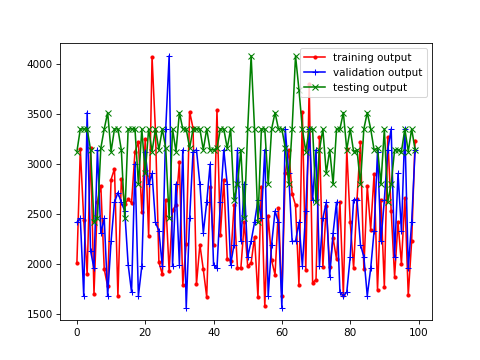

In [21]:
y_predi = dtclf.predict(Xval)
y_predi_real = dtclf.predict(Xtest)

fig, ax = plt.subplots()
ax.plot(ytrain[0:100], label = "training output", color = "red", marker='.')
ax.plot(y_predi[0:100], label = "validation output", color = "blue", marker='+')
ax.plot(y_predi_real[0:100], label = "testing output", color = "green", marker='x')
plt.legend()
plt.show()


